In [1]:
from connectivity_matrix_functions import find_poly, create_shp_index, calc_connectivity_lh, write_to_file, plot_conn_mat, plot_conn_mat_norm, plot_conn_mat_norm_noAN, plot_conn_mat_normcol_noAN, plot_conn_mat_diff
import pandas as pd
import geopandas as gpd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cartopy
import cartopy.crs as ccrs
import time
import datetime

In [2]:
polygons_start_filename = "/gpfs/home/rpe16nbu/projects/ocpp_mo1/misc/polygons_BoB6_start.geojson"
polygons_end_filename = "/gpfs/home/rpe16nbu/projects/ocpp_mo1/misc/polygons_BoB6_A&N_split.geojson"

In [3]:
polygons_start, polygons_start_idx, polygons_start_names = create_shp_index(polygons_start_filename, 'name') # start polygons
polygons_end, polygons_end_idx, polygons_end_names = create_shp_index(polygons_end_filename, 'name') # end polygons

File /gpfs/home/rpe16nbu/projects/ocpp_mo1/misc/polygons_BoB6_start.geojson  has  6  polygons
File /gpfs/home/rpe16nbu/projects/ocpp_mo1/misc/polygons_BoB6_A&N_split.geojson  has  7  polygons


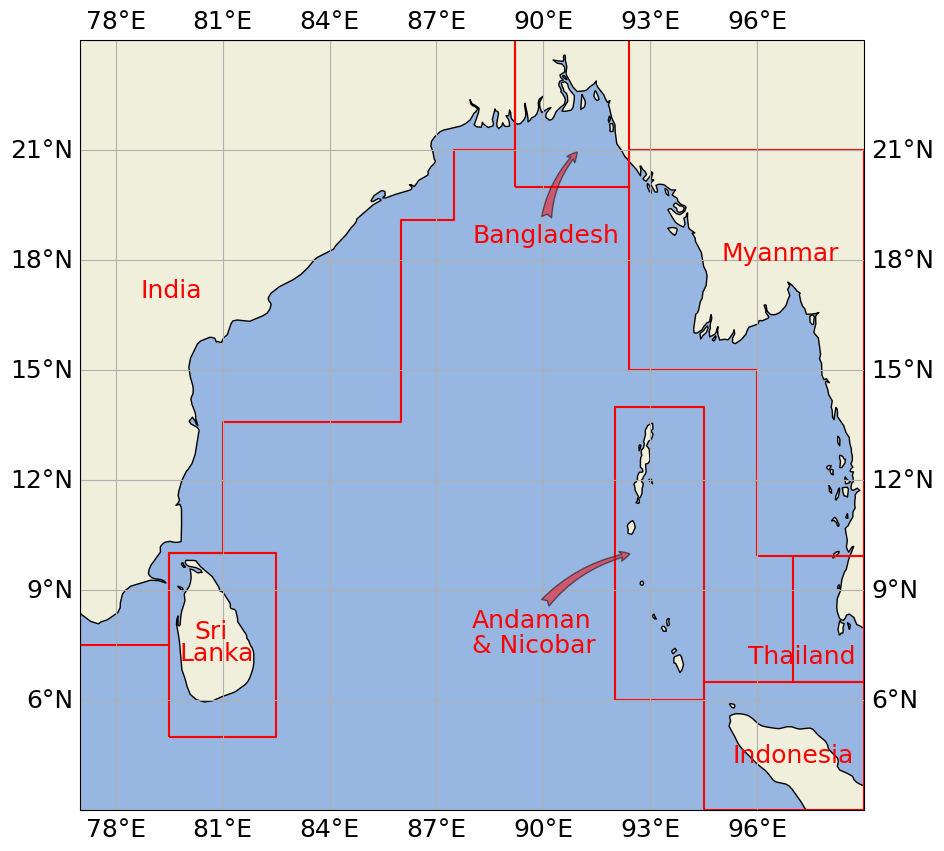

In [5]:
file_gpd = gpd.read_file(polygons_end_filename)
polygons_list = file_gpd.geometry

# create figure
fig = plt.figure(figsize=(20, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([77,99,3,24]) # full domain
ax.add_feature(cartopy.feature.OCEAN)
ax.add_feature(cartopy.feature.LAND)
ax.coastlines()
gl = ax.gridlines(draw_labels=True)
gl.xlabel_style = {'size': 18}
gl.ylabel_style = {'size': 18}

transform = ccrs.PlateCarree()._as_mpl_transform(ax)
ax.annotate('Sri', xy=(80.2, 7.7), xycoords=transform,
            fontsize=18, color='r')
ax.annotate('Lanka', xy=(79.8, 7.1), xycoords=transform,
            fontsize=18, color='r')
ax.annotate('India', xy=(78.7, 17), xycoords=transform,
            fontsize=18, color='r')
ax.annotate('Myanmar', xy=(95, 18), xycoords=transform,
            fontsize=18, color='r')
ax.annotate('Thailand', xy=(95.75, 7), xycoords=transform,
            fontsize=18, color='r')
ax.annotate('Indonesia', xy=(95.3, 4.3), xycoords=transform,
            fontsize=18, color='r')

ax.annotate('Bangladesh', xy=(91, 21), xytext=(88, 18.5), 
            arrowprops=dict(facecolor='r',
            arrowstyle="fancy",
            connectionstyle="arc3,rad=-0.2",
            alpha=0.5),
            xycoords=transform,
            fontsize=18, color='r')
ax.annotate('Andaman', xy=(92.5, 10), xytext=(88, 8), 
            arrowprops=dict(facecolor='r',
            arrowstyle="fancy",
            connectionstyle="arc3,rad=-0.2",
            alpha=0.5),
            xycoords=transform,
            fontsize=18, color='r')
ax.annotate('& Nicobar', xy=(88, 7.3), xycoords=transform,
            fontsize=18, color='r')

polygons_list.boundary.plot(ax=ax, color='r')
fig.savefig("/gpfs/home/rpe16nbu/projects/ocpp_mo1/plots/paper_data/BoB_polygons", bbox_inches='tight', facecolor='white', transparent=False)


In [7]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_Cop_hourly_July2020.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_Cop_hourly_July2020.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_Cop_hourly_July2020.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_Cop_hourly_July2020.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_Cop_hourly_July2020.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_Cop_hourly_July2020.nc'


In [9]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_Cop_daily_July2020.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_Cop_daily_July2020.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_Cop_daily_July2020.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_Cop_daily_July2020.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_Cop_daily_July2020.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_Cop_daily_July2020.nc'


In [10]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_ROMS_hourly_July2020.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_ROMS_hourly_July2020.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_ROMS_hourly_July2020.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_ROMS_hourly_July2020.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_ROMS_hourly_July2020.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_ROMS_hourly_July2020.nc'


In [11]:
input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_ROMS_daily_July2020.nc'
input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_ROMS_daily_July2020.nc'
input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_ROMS_daily_July2020.nc'
input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_ROMS_daily_July2020.nc'
input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_ROMS_daily_July2020.nc'
input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_ROMS_daily_July2020.nc'


In [12]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_Cop_daily_Jun2018-Sept2019_monsoon.nc'
# datetime_obj = datetime.datetime(2018, 10, 1)

In [13]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.nc'
# datetime_obj = datetime.datetime(2018, 10, 1)

In [14]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.nc'
# datetime_obj = datetime.datetime(2019, 2, 1)

In [15]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.nc'
# datetime_obj = datetime.datetime(2019, 2, 1)

In [16]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_Cop_daily_Feb-Sept2019_premonsoon.nc'
# datetime_obj = datetime.datetime(2019, 6, 1)

In [17]:
# input_particle_file_SL = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_SL_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_India = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_India_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Bang = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Bang_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Myan = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Myan_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Thai = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Thai_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# input_particle_file_Indonesia = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/BoB_Indonesia_uniform_ROMS_daily_Feb-Sept2019_premonsoon.nc'
# datetime_obj = datetime.datetime(2019, 6, 1)

In [18]:
# np_datetime = np.datetime64(datetime_obj)

In [19]:
# def calc_connectivity_season_only(np_datetime, input_particle_file, polygons_start_filename, polygons_end_filename,
#                       start_polygons, start_polygons_idx,
#                       end_polygons, end_polygons_idx):

#     trajDS = xr.load_dataset(input_particle_file)

#     polygons_start_gpd = gpd.read_file(polygons_start_filename)
#     polygons_end_gpd = gpd.read_file(polygons_end_filename)
#     n_start_polygons = len(polygons_start_gpd['geometry'][:])
#     n_end_polygons = len(polygons_end_gpd['geometry'][:])
#     connec_mat=np.zeros([n_start_polygons, n_end_polygons])
    
#     times = trajDS.variables['time'].values

#     for iparticle in range( trajDS.dims['traj'] ):
#         print('iparticle: ', iparticle)
#         if any(trajDS.variables['beached'][iparticle,:]==1):
#             if not any(times[iparticle,:]>np_datetime):
#                 # Deal with Origin first
#                 start_loc = (trajDS['lon'].isel(traj=iparticle,obs=0).values,
#                              trajDS['lat'].isel(traj=iparticle,obs=0).values)
# #                print('start_loc:',start_loc)
# #                print('start_polygons_idx:',start_polygons_idx)
#                 start_id = find_poly(polygons=start_polygons,
#                                      polyind=start_polygons_idx,
#                                      coords=start_loc )
# #                print(f'start_id is {start_id}')


#                 if start_id is None:
#                     print("WARNING particle {0} originating at ({1:.3f},{2:.3f}) is not in a polygon".format(iparticle,start_loc[1],start_loc[0]), flush=True)
#                     continue

#                 lons = trajDS['lon'].isel(traj=iparticle).values
#                 lats = trajDS['lat'].isel(traj=iparticle).values

#                 for itime in range(len(lons)):
# #                    print('itime:', itime)
#                     if not(np.isnan( lons[itime])):
#                         end_polygon_id = find_poly(
#                                             polygons = end_polygons,
#                                             polyind = end_polygons_idx,
#                                             coords = (lons[itime],lats[itime])
#                         )

#                 if end_polygon_id is None:
#                     print("WARNING particle {0} does not end in a polygon".format(iparticle), flush=True)
#                     continue
 
#                 print('start_id: ', start_id)
#                 print('end_polygon_id: ', end_polygon_id)
 
#                 connec_mat[start_id, end_polygon_id] = connec_mat[start_id, end_polygon_id] + 1
    
#                 connec_mat
 
#             else:
#                 continue
            
#     return connec_mat


In [29]:
connec_mat_SL = calc_connectivity_lh(input_particle_file=input_particle_file_SL, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_SL = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_SL, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# 24,938 particles for July run. 9102 particles for Jun18-Sept19 run

iparticle:  0
iparticle:  1
iparticle:  2
iparticle:  3
iparticle:  4
iparticle:  5
iparticle:  6
iparticle:  7
iparticle:  8
iparticle:  9
iparticle:  10
iparticle:  11
iparticle:  12
iparticle:  13
iparticle:  14
iparticle:  15
iparticle:  16
iparticle:  17
start_id:  0
end_polygon_id:  0
iparticle:  18
start_id:  0
end_polygon_id:  0
iparticle:  19
start_id:  0
end_polygon_id:  0
iparticle:  20
start_id:  0
end_polygon_id:  0
iparticle:  21
start_id:  0
end_polygon_id:  0
iparticle:  22
start_id:  0
end_polygon_id:  0
iparticle:  23
start_id:  0
end_polygon_id:  0
iparticle:  24
start_id:  0
end_polygon_id:  0
iparticle:  25
start_id:  0
end_polygon_id:  0
iparticle:  26
start_id:  0
end_polygon_id:  0
iparticle:  27
start_id:  0
end_polygon_id:  0
iparticle:  28
start_id:  0
end_polygon_id:  0
iparticle:  29
start_id:  0
end_polygon_id:  0
iparticle:  30
iparticle:  31
iparticle:  32
iparticle:  33
iparticle:  34
iparticle:  35
iparticle:  36
iparticle:  37
iparticle:  38
iparticle

iparticle:  308
iparticle:  309
iparticle:  310
iparticle:  311
iparticle:  312
iparticle:  313
start_id:  0
end_polygon_id:  0
iparticle:  314
start_id:  0
end_polygon_id:  0
iparticle:  315
start_id:  0
end_polygon_id:  0
iparticle:  316
start_id:  0
end_polygon_id:  0
iparticle:  317
start_id:  0
end_polygon_id:  0
iparticle:  318
start_id:  0
end_polygon_id:  0
iparticle:  319
start_id:  0
end_polygon_id:  0
iparticle:  320
start_id:  0
end_polygon_id:  0
iparticle:  321
start_id:  0
end_polygon_id:  0
iparticle:  322
start_id:  0
end_polygon_id:  0
iparticle:  323
start_id:  0
end_polygon_id:  0
iparticle:  324
start_id:  0
end_polygon_id:  0
iparticle:  325
start_id:  0
end_polygon_id:  0
iparticle:  326
iparticle:  327
iparticle:  328
iparticle:  329
iparticle:  330
iparticle:  331
iparticle:  332
iparticle:  333
iparticle:  334
iparticle:  335
start_id:  0
end_polygon_id:  0
iparticle:  336
iparticle:  337
iparticle:  338
iparticle:  339
iparticle:  340
start_id:  0
end_polygon

iparticle:  601
iparticle:  602
iparticle:  603
iparticle:  604
iparticle:  605
iparticle:  606
iparticle:  607
iparticle:  608
iparticle:  609
start_id:  0
end_polygon_id:  0
iparticle:  610
start_id:  0
end_polygon_id:  0
iparticle:  611
start_id:  0
end_polygon_id:  0
iparticle:  612
start_id:  0
end_polygon_id:  0
iparticle:  613
start_id:  0
end_polygon_id:  0
iparticle:  614
start_id:  0
end_polygon_id:  0
iparticle:  615
start_id:  0
end_polygon_id:  0
iparticle:  616
start_id:  0
end_polygon_id:  0
iparticle:  617
start_id:  0
end_polygon_id:  0
iparticle:  618
start_id:  0
end_polygon_id:  0
iparticle:  619
start_id:  0
end_polygon_id:  0
iparticle:  620
start_id:  0
end_polygon_id:  0
iparticle:  621
start_id:  0
end_polygon_id:  0
iparticle:  622
iparticle:  623
iparticle:  624
iparticle:  625
iparticle:  626
iparticle:  627
iparticle:  628
iparticle:  629
iparticle:  630
start_id:  0
end_polygon_id:  0
iparticle:  631
iparticle:  632
iparticle:  633
iparticle:  634
iparticl

iparticle:  901
iparticle:  902
iparticle:  903
iparticle:  904
iparticle:  905
start_id:  0
end_polygon_id:  0
iparticle:  906
start_id:  0
end_polygon_id:  0
iparticle:  907
start_id:  0
end_polygon_id:  0
iparticle:  908
start_id:  0
end_polygon_id:  0
iparticle:  909
start_id:  0
end_polygon_id:  0
iparticle:  910
start_id:  0
end_polygon_id:  0
iparticle:  911
start_id:  0
end_polygon_id:  0
iparticle:  912
start_id:  0
end_polygon_id:  0
iparticle:  913
start_id:  0
end_polygon_id:  0
iparticle:  914
start_id:  0
end_polygon_id:  0
iparticle:  915
start_id:  0
end_polygon_id:  0
iparticle:  916
start_id:  0
end_polygon_id:  0
iparticle:  917
start_id:  0
end_polygon_id:  0
iparticle:  918
iparticle:  919
iparticle:  920
iparticle:  921
iparticle:  922
iparticle:  923
iparticle:  924
iparticle:  925
iparticle:  926
start_id:  0
end_polygon_id:  0
iparticle:  927
iparticle:  928
iparticle:  929
iparticle:  930
iparticle:  931
iparticle:  932
start_id:  0
end_polygon_id:  0
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  1176
start_id:  0
end_polygon_id:  0
iparticle:  1177
start_id:  0
end_polygon_id:  0
iparticle:  1178
start_id:  0
end_polygon_id:  0
iparticle:  1179
start_id:  0
end_polygon_id:  0
iparticle:  1180
start_id:  0
end_polygon_id:  0
iparticle:  1181
iparticle:  1182
start_id:  0
end_polygon_id:  0
iparticle:  1183
iparticle:  1184
iparticle:  1185
iparticle:  1186
iparticle:  1187
iparticle:  1188
iparticle:  1189
iparticle:  1190
iparticle:  1191
iparticle:  1192
iparticle:  1193
iparticle:  1194
iparticle:  1195
iparticle:  1196
iparticle:  1197
iparticle:  1198
iparticle:  1199
iparticle:  1200
iparticle:  1201
start_id:  0
end_polygon_id:  0
iparticle:  1202
start_id:  0
end_polygon_id:  0
iparticle:  1203
start_id:  0
end_polygon_id:  0
iparticle:  1204
start_id:  0
end_polygon_id:  0
iparticle:  1205
start_id:  0
end_polygon_id:  0
iparticle:  1206
start_id:  0
end_polygon_id:  0
iparticle:  1207
start_id:  0
end_polygon_id:  0
iparticl

iparticle:  1459
iparticle:  1460
iparticle:  1461
iparticle:  1462
iparticle:  1463
iparticle:  1464
start_id:  0
end_polygon_id:  0
iparticle:  1465
start_id:  0
end_polygon_id:  0
iparticle:  1466
start_id:  0
end_polygon_id:  0
iparticle:  1467
start_id:  0
end_polygon_id:  0
iparticle:  1468
start_id:  0
end_polygon_id:  0
iparticle:  1469
start_id:  0
end_polygon_id:  0
iparticle:  1470
start_id:  0
end_polygon_id:  0
iparticle:  1471
start_id:  0
end_polygon_id:  0
iparticle:  1472
start_id:  0
end_polygon_id:  0
iparticle:  1473
start_id:  0
end_polygon_id:  0
iparticle:  1474
start_id:  0
end_polygon_id:  0
iparticle:  1475
start_id:  0
end_polygon_id:  0
iparticle:  1476
start_id:  0
end_polygon_id:  0
iparticle:  1477
iparticle:  1478
start_id:  0
end_polygon_id:  0
iparticle:  1479
iparticle:  1480
iparticle:  1481
iparticle:  1482
iparticle:  1483
iparticle:  1484
iparticle:  1485
iparticle:  1486
iparticle:  1487
iparticle:  1488
iparticle:  1489
iparticle:  1490
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  1730
start_id:  0
end_polygon_id:  0
iparticle:  1731
start_id:  0
end_polygon_id:  0
iparticle:  1732
iparticle:  1733
iparticle:  1734
iparticle:  1735
iparticle:  1736
iparticle:  1737
iparticle:  1738
iparticle:  1739
iparticle:  1740
iparticle:  1741
iparticle:  1742
iparticle:  1743
iparticle:  1744
iparticle:  1745
iparticle:  1746
iparticle:  1747
iparticle:  1748
iparticle:  1749
iparticle:  1750
iparticle:  1751
iparticle:  1752
iparticle:  1753
iparticle:  1754
iparticle:  1755
iparticle:  1756
iparticle:  1757
iparticle:  1758
iparticle:  1759
iparticle:  1760
start_id:  0
end_polygon_id:  0
iparticle:  1761
start_id:  0
end_polygon_id:  0
iparticle:  1762
start_id:  0
end_polygon_id:  0
iparticle:  1763
start_id:  0
end_polygon_id:  0
iparticle:  1764
start_id:  0
end_polygon_id:  0
iparticle:  1765
start_id:  0
end_polygon_id:  0
iparticle:  1766
start_id:  0
end_polygon_id:  0
iparticle:  1767
start_id:  0
end_polygon_id:  0
ip

iparticle:  2014
iparticle:  2015
start_id:  0
end_polygon_id:  0
iparticle:  2016
start_id:  0
end_polygon_id:  0
iparticle:  2017
start_id:  0
end_polygon_id:  0
iparticle:  2018
start_id:  0
end_polygon_id:  0
iparticle:  2019
start_id:  0
end_polygon_id:  0
iparticle:  2020
start_id:  0
end_polygon_id:  0
iparticle:  2021
start_id:  0
end_polygon_id:  0
iparticle:  2022
start_id:  0
end_polygon_id:  0
iparticle:  2023
start_id:  0
end_polygon_id:  0
iparticle:  2024
start_id:  0
end_polygon_id:  0
iparticle:  2025
start_id:  0
end_polygon_id:  0
iparticle:  2026
start_id:  0
end_polygon_id:  0
iparticle:  2027
start_id:  0
end_polygon_id:  0
iparticle:  2028
iparticle:  2029
iparticle:  2030
iparticle:  2031
iparticle:  2032
iparticle:  2033
iparticle:  2034
iparticle:  2035
iparticle:  2036
start_id:  0
end_polygon_id:  0
iparticle:  2037
iparticle:  2038
iparticle:  2039
iparticle:  2040
iparticle:  2041
iparticle:  2042
start_id:  0
end_polygon_id:  0
iparticle:  2043
iparticle:

iparticle:  2300
iparticle:  2301
iparticle:  2302
iparticle:  2303
iparticle:  2304
iparticle:  2305
iparticle:  2306
iparticle:  2307
iparticle:  2308
iparticle:  2309
iparticle:  2310
start_id:  0
end_polygon_id:  0
iparticle:  2311
start_id:  0
end_polygon_id:  0
iparticle:  2312
start_id:  0
end_polygon_id:  0
iparticle:  2313
start_id:  0
end_polygon_id:  0
iparticle:  2314
start_id:  0
end_polygon_id:  0
iparticle:  2315
start_id:  0
end_polygon_id:  0
iparticle:  2316
start_id:  0
end_polygon_id:  0
iparticle:  2317
start_id:  0
end_polygon_id:  0
iparticle:  2318
start_id:  0
end_polygon_id:  0
iparticle:  2319
start_id:  0
end_polygon_id:  0
iparticle:  2320
start_id:  0
end_polygon_id:  0
iparticle:  2321
start_id:  0
end_polygon_id:  0
iparticle:  2322
start_id:  0
end_polygon_id:  0
iparticle:  2323
start_id:  0
end_polygon_id:  0
iparticle:  2324
iparticle:  2325
iparticle:  2326
iparticle:  2327
iparticle:  2328
iparticle:  2329
iparticle:  2330
iparticle:  2331
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  2580
start_id:  0
end_polygon_id:  0
iparticle:  2581
start_id:  0
end_polygon_id:  0
iparticle:  2582
start_id:  0
end_polygon_id:  0
iparticle:  2583
start_id:  0
end_polygon_id:  0
iparticle:  2584
start_id:  0
end_polygon_id:  0
iparticle:  2585
start_id:  0
end_polygon_id:  0
iparticle:  2586
start_id:  0
end_polygon_id:  0
iparticle:  2587
iparticle:  2588
start_id:  0
end_polygon_id:  0
iparticle:  2589
iparticle:  2590
iparticle:  2591
iparticle:  2592
iparticle:  2593
iparticle:  2594
iparticle:  2595
iparticle:  2596
iparticle:  2597
iparticle:  2598
iparticle:  2599
iparticle:  2600
iparticle:  2601
iparticle:  2602
iparticle:  2603
iparticle:  2604
iparticle:  2605
iparticle:  2606
iparticle:  2607
start_id:  0
end_polygon_id:  0
iparticle:  2608
start_id:  0
end_polygon_id:  0
iparticle:  2609
start_id:  0
end_polygon_id:  0
iparticle:  2610
start_id:  0
end_polygon_id:  0
iparticle:  2611
start_id:  0
end_polygon_id:  0
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  2860
iparticle:  2861
iparticle:  2862
iparticle:  2863
iparticle:  2864
iparticle:  2865
iparticle:  2866
iparticle:  2867
iparticle:  2868
iparticle:  2869
start_id:  0
end_polygon_id:  0
iparticle:  2870
start_id:  0
end_polygon_id:  0
iparticle:  2871
start_id:  0
end_polygon_id:  0
iparticle:  2872
start_id:  0
end_polygon_id:  0
iparticle:  2873
start_id:  0
end_polygon_id:  0
iparticle:  2874
start_id:  0
end_polygon_id:  0
iparticle:  2875
start_id:  0
end_polygon_id:  0
iparticle:  2876
start_id:  0
end_polygon_id:  0
iparticle:  2877
start_id:  0
end_polygon_id:  0
iparticle:  2878
start_id:  0
end_polygon_id:  0
iparticle:  2879
start_id:  0
end_polygon_id:  0
iparticle:  2880
start_id:  0
end_polygon_id:  0
iparticle:  2881
start_id:  0
end_polygon_id:  0
iparticle:  2882
start_id:  0
end_polygon_id:  0
iparticle:  2883
start_id:  0
end_polygon_id:  0
iparticle:  2884
start_id:  0
end_polygon_id:  0
iparticle:  2885
iparticle:  28

iparticle:  3139
iparticle:  3140
iparticle:  3141
iparticle:  3142
iparticle:  3143
iparticle:  3144
iparticle:  3145
iparticle:  3146
start_id:  0
end_polygon_id:  0
iparticle:  3147
iparticle:  3148
iparticle:  3149
iparticle:  3150
iparticle:  3151
iparticle:  3152
iparticle:  3153
start_id:  0
end_polygon_id:  0
iparticle:  3154
iparticle:  3155
iparticle:  3156
iparticle:  3157
iparticle:  3158
iparticle:  3159
iparticle:  3160
iparticle:  3161
iparticle:  3162
iparticle:  3163
iparticle:  3164
start_id:  0
end_polygon_id:  0
iparticle:  3165
iparticle:  3166
start_id:  0
end_polygon_id:  0
iparticle:  3167
start_id:  0
end_polygon_id:  0
iparticle:  3168
start_id:  0
end_polygon_id:  0
iparticle:  3169
start_id:  0
end_polygon_id:  0
iparticle:  3170
start_id:  0
end_polygon_id:  0
iparticle:  3171
start_id:  0
end_polygon_id:  0
iparticle:  3172
start_id:  0
end_polygon_id:  0
iparticle:  3173
start_id:  0
end_polygon_id:  0
iparticle:  3174
start_id:  0
end_polygon_id:  0
ipar

iparticle:  3412
iparticle:  3413
iparticle:  3414
iparticle:  3415
iparticle:  3416
iparticle:  3417
iparticle:  3418
iparticle:  3419
iparticle:  3420
iparticle:  3421
start_id:  0
end_polygon_id:  0
iparticle:  3422
start_id:  0
end_polygon_id:  0
iparticle:  3423
start_id:  0
end_polygon_id:  0
iparticle:  3424
start_id:  0
end_polygon_id:  0
iparticle:  3425
start_id:  0
end_polygon_id:  0
iparticle:  3426
start_id:  0
end_polygon_id:  0
iparticle:  3427
start_id:  0
end_polygon_id:  0
iparticle:  3428
start_id:  0
end_polygon_id:  0
iparticle:  3429
start_id:  0
end_polygon_id:  0
iparticle:  3430
start_id:  0
end_polygon_id:  0
iparticle:  3431
start_id:  0
end_polygon_id:  0
iparticle:  3432
start_id:  0
end_polygon_id:  0
iparticle:  3433
start_id:  0
end_polygon_id:  0
iparticle:  3434
iparticle:  3435
iparticle:  3436
iparticle:  3437
iparticle:  3438
iparticle:  3439
iparticle:  3440
iparticle:  3441
iparticle:  3442
iparticle:  3443
iparticle:  3444
iparticle:  3445
iparti

iparticle:  3707
iparticle:  3708
iparticle:  3709
iparticle:  3710
iparticle:  3711
iparticle:  3712
iparticle:  3713
iparticle:  3714
iparticle:  3715
iparticle:  3716
iparticle:  3717
start_id:  0
end_polygon_id:  0
iparticle:  3718
start_id:  0
end_polygon_id:  0
iparticle:  3719
start_id:  0
end_polygon_id:  0
iparticle:  3720
start_id:  0
end_polygon_id:  0
iparticle:  3721
start_id:  0
end_polygon_id:  0
iparticle:  3722
start_id:  0
end_polygon_id:  0
iparticle:  3723
start_id:  0
end_polygon_id:  0
iparticle:  3724
start_id:  0
end_polygon_id:  0
iparticle:  3725
start_id:  0
end_polygon_id:  0
iparticle:  3726
start_id:  0
end_polygon_id:  0
iparticle:  3727
start_id:  0
end_polygon_id:  0
iparticle:  3728
start_id:  0
end_polygon_id:  0
iparticle:  3729
start_id:  0
end_polygon_id:  0
iparticle:  3730
iparticle:  3731
iparticle:  3732
iparticle:  3733
iparticle:  3734
iparticle:  3735
iparticle:  3736
iparticle:  3737
iparticle:  3738
iparticle:  3739
iparticle:  3740
iparti

start_id:  0
end_polygon_id:  0
iparticle:  3996
iparticle:  3997
iparticle:  3998
iparticle:  3999
iparticle:  4000
iparticle:  4001
iparticle:  4002
iparticle:  4003
iparticle:  4004
iparticle:  4005
iparticle:  4006
iparticle:  4007
iparticle:  4008
iparticle:  4009
iparticle:  4010
iparticle:  4011
iparticle:  4012
iparticle:  4013
start_id:  0
end_polygon_id:  0
iparticle:  4014
start_id:  0
end_polygon_id:  0
iparticle:  4015
start_id:  0
end_polygon_id:  0
iparticle:  4016
start_id:  0
end_polygon_id:  0
iparticle:  4017
start_id:  0
end_polygon_id:  0
iparticle:  4018
start_id:  0
end_polygon_id:  0
iparticle:  4019
start_id:  0
end_polygon_id:  0
iparticle:  4020
start_id:  0
end_polygon_id:  0
iparticle:  4021
start_id:  0
end_polygon_id:  0
iparticle:  4022
start_id:  0
end_polygon_id:  0
iparticle:  4023
start_id:  0
end_polygon_id:  0
iparticle:  4024
start_id:  0
end_polygon_id:  0
iparticle:  4025
start_id:  0
end_polygon_id:  0
iparticle:  4026
iparticle:  4027
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  4287
start_id:  0
end_polygon_id:  0
iparticle:  4288
start_id:  0
end_polygon_id:  0
iparticle:  4289
iparticle:  4290
start_id:  0
end_polygon_id:  0
iparticle:  4291
iparticle:  4292
iparticle:  4293
iparticle:  4294
iparticle:  4295
iparticle:  4296
iparticle:  4297
iparticle:  4298
iparticle:  4299
iparticle:  4300
iparticle:  4301
iparticle:  4302
iparticle:  4303
iparticle:  4304
iparticle:  4305
iparticle:  4306
iparticle:  4307
iparticle:  4308
iparticle:  4309
start_id:  0
end_polygon_id:  0
iparticle:  4310
start_id:  0
end_polygon_id:  0
iparticle:  4311
start_id:  0
end_polygon_id:  0
iparticle:  4312
start_id:  0
end_polygon_id:  0
iparticle:  4313
start_id:  0
end_polygon_id:  0
iparticle:  4314
start_id:  0
end_polygon_id:  0
iparticle:  4315
start_id:  0
end_polygon_id:  0
iparticle:  4316
start_id:  0
end_polygon_id:  0
iparticle:  4317
start_id:  0
end_polygon_id:  0
iparticle:  4318
start_id:  0
end_polygon_id:  0
iparticl

iparticle:  4559
iparticle:  4560
start_id:  0
end_polygon_id:  0
iparticle:  4561
iparticle:  4562
iparticle:  4563
iparticle:  4564
iparticle:  4565
iparticle:  4566
iparticle:  4567
iparticle:  4568
iparticle:  4569
iparticle:  4570
iparticle:  4571
iparticle:  4572
start_id:  0
end_polygon_id:  0
iparticle:  4573
start_id:  0
end_polygon_id:  0
iparticle:  4574
start_id:  0
end_polygon_id:  0
iparticle:  4575
start_id:  0
end_polygon_id:  0
iparticle:  4576
start_id:  0
end_polygon_id:  0
iparticle:  4577
start_id:  0
end_polygon_id:  0
iparticle:  4578
start_id:  0
end_polygon_id:  0
iparticle:  4579
start_id:  0
end_polygon_id:  0
iparticle:  4580
start_id:  0
end_polygon_id:  0
iparticle:  4581
start_id:  0
end_polygon_id:  0
iparticle:  4582
start_id:  0
end_polygon_id:  0
iparticle:  4583
start_id:  0
end_polygon_id:  0
iparticle:  4584
start_id:  0
end_polygon_id:  0
iparticle:  4585
iparticle:  4586
start_id:  0
end_polygon_id:  0
iparticle:  4587
iparticle:  4588
iparticle:

iparticle:  4845
iparticle:  4846
iparticle:  4847
iparticle:  4848
start_id:  0
end_polygon_id:  0
iparticle:  4849
iparticle:  4850
start_id:  0
end_polygon_id:  0
iparticle:  4851
iparticle:  4852
iparticle:  4853
iparticle:  4854
iparticle:  4855
start_id:  0
end_polygon_id:  0
iparticle:  4856
start_id:  0
end_polygon_id:  0
iparticle:  4857
start_id:  0
end_polygon_id:  0
iparticle:  4858
iparticle:  4859
iparticle:  4860
iparticle:  4861
iparticle:  4862
iparticle:  4863
iparticle:  4864
iparticle:  4865
start_id:  0
end_polygon_id:  0
iparticle:  4866
iparticle:  4867
iparticle:  4868
start_id:  0
end_polygon_id:  0
iparticle:  4869
start_id:  0
end_polygon_id:  0
iparticle:  4870
start_id:  0
end_polygon_id:  0
iparticle:  4871
start_id:  0
end_polygon_id:  0
iparticle:  4872
start_id:  0
end_polygon_id:  0
iparticle:  4873
start_id:  0
end_polygon_id:  0
iparticle:  4874
start_id:  0
end_polygon_id:  0
iparticle:  4875
start_id:  0
end_polygon_id:  0
iparticle:  4876
start_id

iparticle:  5121
iparticle:  5122
iparticle:  5123
start_id:  0
end_polygon_id:  0
iparticle:  5124
start_id:  0
end_polygon_id:  0
iparticle:  5125
start_id:  0
end_polygon_id:  0
iparticle:  5126
start_id:  0
end_polygon_id:  0
iparticle:  5127
start_id:  0
end_polygon_id:  0
iparticle:  5128
start_id:  0
end_polygon_id:  0
iparticle:  5129
start_id:  0
end_polygon_id:  0
iparticle:  5130
start_id:  0
end_polygon_id:  0
iparticle:  5131
start_id:  0
end_polygon_id:  0
iparticle:  5132
start_id:  0
end_polygon_id:  0
iparticle:  5133
start_id:  0
end_polygon_id:  0
iparticle:  5134
start_id:  0
end_polygon_id:  0
iparticle:  5135
start_id:  0
end_polygon_id:  0
iparticle:  5136
iparticle:  5137
iparticle:  5138
iparticle:  5139
iparticle:  5140
iparticle:  5141
iparticle:  5142
iparticle:  5143
iparticle:  5144
iparticle:  5145
iparticle:  5146
iparticle:  5147
iparticle:  5148
iparticle:  5149
iparticle:  5150
start_id:  0
end_polygon_id:  0
iparticle:  5151
iparticle:  5152
start_id

start_id:  0
end_polygon_id:  0
iparticle:  5390
start_id:  0
end_polygon_id:  0
iparticle:  5391
start_id:  0
end_polygon_id:  0
iparticle:  5392
start_id:  0
end_polygon_id:  0
iparticle:  5393
start_id:  0
end_polygon_id:  0
iparticle:  5394
start_id:  0
end_polygon_id:  0
iparticle:  5395
start_id:  0
end_polygon_id:  0
iparticle:  5396
start_id:  0
end_polygon_id:  0
iparticle:  5397
start_id:  0
end_polygon_id:  0
iparticle:  5398
start_id:  0
end_polygon_id:  0
iparticle:  5399
iparticle:  5400
start_id:  0
end_polygon_id:  0
iparticle:  5401
iparticle:  5402
iparticle:  5403
iparticle:  5404
iparticle:  5405
iparticle:  5406
iparticle:  5407
iparticle:  5408
iparticle:  5409
iparticle:  5410
iparticle:  5411
iparticle:  5412
iparticle:  5413
iparticle:  5414
iparticle:  5415
iparticle:  5416
iparticle:  5417
iparticle:  5418
iparticle:  5419
start_id:  0
end_polygon_id:  0
iparticle:  5420
start_id:  0
end_polygon_id:  0
iparticle:  5421
start_id:  0
end_polygon_id:  0
iparticl

iparticle:  5657
iparticle:  5658
iparticle:  5659
iparticle:  5660
iparticle:  5661
iparticle:  5662
start_id:  0
end_polygon_id:  0
iparticle:  5663
iparticle:  5664
iparticle:  5665
iparticle:  5666
iparticle:  5667
iparticle:  5668
start_id:  0
end_polygon_id:  0
iparticle:  5669
iparticle:  5670
iparticle:  5671
iparticle:  5672
iparticle:  5673
iparticle:  5674
iparticle:  5675
start_id:  0
end_polygon_id:  0
iparticle:  5676
iparticle:  5677
iparticle:  5678
iparticle:  5679
iparticle:  5680
start_id:  0
end_polygon_id:  0
iparticle:  5681
start_id:  0
end_polygon_id:  0
iparticle:  5682
start_id:  0
end_polygon_id:  0
iparticle:  5683
start_id:  0
end_polygon_id:  0
iparticle:  5684
start_id:  0
end_polygon_id:  0
iparticle:  5685
start_id:  0
end_polygon_id:  0
iparticle:  5686
start_id:  0
end_polygon_id:  0
iparticle:  5687
start_id:  0
end_polygon_id:  0
iparticle:  5688
start_id:  0
end_polygon_id:  0
iparticle:  5689
start_id:  0
end_polygon_id:  0
iparticle:  5690
start_

iparticle:  5935
iparticle:  5936
iparticle:  5937
start_id:  0
end_polygon_id:  0
iparticle:  5938
start_id:  0
end_polygon_id:  0
iparticle:  5939
start_id:  0
end_polygon_id:  0
iparticle:  5940
start_id:  0
end_polygon_id:  0
iparticle:  5941
start_id:  0
end_polygon_id:  0
iparticle:  5942
start_id:  0
end_polygon_id:  0
iparticle:  5943
start_id:  0
end_polygon_id:  0
iparticle:  5944
start_id:  0
end_polygon_id:  0
iparticle:  5945
start_id:  0
end_polygon_id:  0
iparticle:  5946
start_id:  0
end_polygon_id:  0
iparticle:  5947
start_id:  0
end_polygon_id:  0
iparticle:  5948
start_id:  0
end_polygon_id:  0
iparticle:  5949
start_id:  0
end_polygon_id:  0
iparticle:  5950
iparticle:  5951
iparticle:  5952
iparticle:  5953
iparticle:  5954
iparticle:  5955
iparticle:  5956
iparticle:  5957
iparticle:  5958
iparticle:  5959
iparticle:  5960
iparticle:  5961
iparticle:  5962
iparticle:  5963
iparticle:  5964
start_id:  0
end_polygon_id:  0
iparticle:  5965
iparticle:  5966
iparticl

iparticle:  6218
iparticle:  6219
iparticle:  6220
iparticle:  6221
iparticle:  6222
iparticle:  6223
iparticle:  6224
iparticle:  6225
iparticle:  6226
iparticle:  6227
iparticle:  6228
iparticle:  6229
iparticle:  6230
iparticle:  6231
iparticle:  6232
iparticle:  6233
start_id:  0
end_polygon_id:  0
iparticle:  6234
start_id:  0
end_polygon_id:  0
iparticle:  6235
start_id:  0
end_polygon_id:  0
iparticle:  6236
start_id:  0
end_polygon_id:  0
iparticle:  6237
start_id:  0
end_polygon_id:  0
iparticle:  6238
start_id:  0
end_polygon_id:  0
iparticle:  6239
start_id:  0
end_polygon_id:  0
iparticle:  6240
start_id:  0
end_polygon_id:  0
iparticle:  6241
start_id:  0
end_polygon_id:  0
iparticle:  6242
start_id:  0
end_polygon_id:  0
iparticle:  6243
start_id:  0
end_polygon_id:  0
iparticle:  6244
start_id:  0
end_polygon_id:  0
iparticle:  6245
start_id:  0
end_polygon_id:  0
iparticle:  6246
start_id:  0
end_polygon_id:  0
iparticle:  6247
iparticle:  6248
iparticle:  6249
iparticl

iparticle:  6485
iparticle:  6486
start_id:  0
end_polygon_id:  0
iparticle:  6487
iparticle:  6488
start_id:  0
end_polygon_id:  0
iparticle:  6489
iparticle:  6490
iparticle:  6491
iparticle:  6492
start_id:  0
end_polygon_id:  0
iparticle:  6493
iparticle:  6494
iparticle:  6495
start_id:  0
end_polygon_id:  0
iparticle:  6496
start_id:  0
end_polygon_id:  0
iparticle:  6497
start_id:  0
end_polygon_id:  0
iparticle:  6498
start_id:  0
end_polygon_id:  0
iparticle:  6499
start_id:  0
end_polygon_id:  0
iparticle:  6500
start_id:  0
end_polygon_id:  0
iparticle:  6501
start_id:  0
end_polygon_id:  0
iparticle:  6502
start_id:  0
end_polygon_id:  0
iparticle:  6503
start_id:  0
end_polygon_id:  0
iparticle:  6504
start_id:  0
end_polygon_id:  0
iparticle:  6505
start_id:  0
end_polygon_id:  0
iparticle:  6506
start_id:  0
end_polygon_id:  0
iparticle:  6507
start_id:  0
end_polygon_id:  0
iparticle:  6508
start_id:  0
end_polygon_id:  0
iparticle:  6509
start_id:  0
end_polygon_id:  0

iparticle:  6776
iparticle:  6777
iparticle:  6778
start_id:  0
end_polygon_id:  0
iparticle:  6779
start_id:  0
end_polygon_id:  0
iparticle:  6780
iparticle:  6781
iparticle:  6782
iparticle:  6783
iparticle:  6784
iparticle:  6785
iparticle:  6786
iparticle:  6787
iparticle:  6788
iparticle:  6789
iparticle:  6790
iparticle:  6791
start_id:  0
end_polygon_id:  0
iparticle:  6792
start_id:  0
end_polygon_id:  0
iparticle:  6793
start_id:  0
end_polygon_id:  0
iparticle:  6794
start_id:  0
end_polygon_id:  0
iparticle:  6795
start_id:  0
end_polygon_id:  0
iparticle:  6796
start_id:  0
end_polygon_id:  0
iparticle:  6797
start_id:  0
end_polygon_id:  0
iparticle:  6798
start_id:  0
end_polygon_id:  0
iparticle:  6799
start_id:  0
end_polygon_id:  0
iparticle:  6800
start_id:  0
end_polygon_id:  0
iparticle:  6801
start_id:  0
end_polygon_id:  0
iparticle:  6802
start_id:  0
end_polygon_id:  0
iparticle:  6803
start_id:  0
end_polygon_id:  0
iparticle:  6804
start_id:  0
end_polygon_id

iparticle:  7065
iparticle:  7066
iparticle:  7067
iparticle:  7068
iparticle:  7069
iparticle:  7070
start_id:  0
end_polygon_id:  0
iparticle:  7071
iparticle:  7072
iparticle:  7073
iparticle:  7074
iparticle:  7075
iparticle:  7076
iparticle:  7077
iparticle:  7078
iparticle:  7079
iparticle:  7080
iparticle:  7081
iparticle:  7082
iparticle:  7083
iparticle:  7084
iparticle:  7085
iparticle:  7086
iparticle:  7087
start_id:  0
end_polygon_id:  0
iparticle:  7088
start_id:  0
end_polygon_id:  0
iparticle:  7089
start_id:  0
end_polygon_id:  0
iparticle:  7090
start_id:  0
end_polygon_id:  0
iparticle:  7091
start_id:  0
end_polygon_id:  0
iparticle:  7092
start_id:  0
end_polygon_id:  0
iparticle:  7093
start_id:  0
end_polygon_id:  0
iparticle:  7094
start_id:  0
end_polygon_id:  0
iparticle:  7095
start_id:  0
end_polygon_id:  0
iparticle:  7096
start_id:  0
end_polygon_id:  0
iparticle:  7097
start_id:  0
end_polygon_id:  0
iparticle:  7098
start_id:  0
end_polygon_id:  0
iparti

start_id:  0
end_polygon_id:  0
iparticle:  7351
start_id:  0
end_polygon_id:  0
iparticle:  7352
start_id:  0
end_polygon_id:  0
iparticle:  7353
start_id:  0
end_polygon_id:  0
iparticle:  7354
start_id:  0
end_polygon_id:  0
iparticle:  7355
start_id:  0
end_polygon_id:  0
iparticle:  7356
iparticle:  7357
iparticle:  7358
iparticle:  7359
iparticle:  7360
iparticle:  7361
iparticle:  7362
iparticle:  7363
iparticle:  7364
start_id:  0
end_polygon_id:  0
iparticle:  7365
iparticle:  7366
iparticle:  7367
iparticle:  7368
iparticle:  7369
iparticle:  7370
iparticle:  7371
iparticle:  7372
iparticle:  7373
iparticle:  7374
iparticle:  7375
iparticle:  7376
iparticle:  7377
iparticle:  7378
iparticle:  7379
iparticle:  7380
iparticle:  7381
iparticle:  7382
iparticle:  7383
start_id:  0
end_polygon_id:  0
iparticle:  7384
start_id:  0
end_polygon_id:  0
iparticle:  7385
start_id:  0
end_polygon_id:  0
iparticle:  7386
start_id:  0
end_polygon_id:  0
iparticle:  7387
start_id:  0
end_po

start_id:  0
end_polygon_id:  0
iparticle:  7643
start_id:  0
end_polygon_id:  0
iparticle:  7644
start_id:  0
end_polygon_id:  0
iparticle:  7645
start_id:  0
end_polygon_id:  0
iparticle:  7646
start_id:  0
end_polygon_id:  0
iparticle:  7647
start_id:  0
end_polygon_id:  0
iparticle:  7648
start_id:  0
end_polygon_id:  0
iparticle:  7649
start_id:  0
end_polygon_id:  0
iparticle:  7650
start_id:  0
end_polygon_id:  0
iparticle:  7651
start_id:  0
end_polygon_id:  0
iparticle:  7652
iparticle:  7653
iparticle:  7654
iparticle:  7655
iparticle:  7656
iparticle:  7657
iparticle:  7658
iparticle:  7659
iparticle:  7660
iparticle:  7661
iparticle:  7662
iparticle:  7663
iparticle:  7664
iparticle:  7665
iparticle:  7666
iparticle:  7667
iparticle:  7668
iparticle:  7669
iparticle:  7670
iparticle:  7671
iparticle:  7672
iparticle:  7673
iparticle:  7674
iparticle:  7675
iparticle:  7676
iparticle:  7677
iparticle:  7678
start_id:  0
end_polygon_id:  0
iparticle:  7679
start_id:  0
end_po

iparticle:  7934
iparticle:  7935
start_id:  0
end_polygon_id:  0
iparticle:  7936
start_id:  0
end_polygon_id:  0
iparticle:  7937
start_id:  0
end_polygon_id:  0
iparticle:  7938
start_id:  0
end_polygon_id:  0
iparticle:  7939
start_id:  0
end_polygon_id:  0
iparticle:  7940
start_id:  0
end_polygon_id:  0
iparticle:  7941
start_id:  0
end_polygon_id:  0
iparticle:  7942
start_id:  0
end_polygon_id:  0
iparticle:  7943
start_id:  0
end_polygon_id:  0
iparticle:  7944
start_id:  0
end_polygon_id:  0
iparticle:  7945
start_id:  0
end_polygon_id:  0
iparticle:  7946
start_id:  0
end_polygon_id:  0
iparticle:  7947
start_id:  0
end_polygon_id:  0
iparticle:  7948
start_id:  0
end_polygon_id:  0
iparticle:  7949
iparticle:  7950
iparticle:  7951
iparticle:  7952
iparticle:  7953
iparticle:  7954
iparticle:  7955
iparticle:  7956
iparticle:  7957
iparticle:  7958
iparticle:  7959
iparticle:  7960
iparticle:  7961
start_id:  0
end_polygon_id:  0
iparticle:  7962
iparticle:  7963
iparticle:

iparticle:  8216
iparticle:  8217
iparticle:  8218
iparticle:  8219
iparticle:  8220
iparticle:  8221
iparticle:  8222
iparticle:  8223
iparticle:  8224
iparticle:  8225
iparticle:  8226
iparticle:  8227
iparticle:  8228
iparticle:  8229
iparticle:  8230
iparticle:  8231
start_id:  0
end_polygon_id:  0
iparticle:  8232
start_id:  0
end_polygon_id:  0
iparticle:  8233
start_id:  0
end_polygon_id:  0
iparticle:  8234
start_id:  0
end_polygon_id:  0
iparticle:  8235
start_id:  0
end_polygon_id:  0
iparticle:  8236
start_id:  0
end_polygon_id:  0
iparticle:  8237
start_id:  0
end_polygon_id:  0
iparticle:  8238
start_id:  0
end_polygon_id:  0
iparticle:  8239
start_id:  0
end_polygon_id:  0
iparticle:  8240
start_id:  0
end_polygon_id:  0
iparticle:  8241
start_id:  0
end_polygon_id:  0
iparticle:  8242
start_id:  0
end_polygon_id:  0
iparticle:  8243
start_id:  0
end_polygon_id:  0
iparticle:  8244
iparticle:  8245
iparticle:  8246
iparticle:  8247
iparticle:  8248
iparticle:  8249
iparti

iparticle:  8515
iparticle:  8516
iparticle:  8517
iparticle:  8518
iparticle:  8519
iparticle:  8520
iparticle:  8521
iparticle:  8522
iparticle:  8523
iparticle:  8524
iparticle:  8525
iparticle:  8526
iparticle:  8527
start_id:  0
end_polygon_id:  0
iparticle:  8528
start_id:  0
end_polygon_id:  0
iparticle:  8529
start_id:  0
end_polygon_id:  0
iparticle:  8530
start_id:  0
end_polygon_id:  0
iparticle:  8531
start_id:  0
end_polygon_id:  0
iparticle:  8532
start_id:  0
end_polygon_id:  0
iparticle:  8533
start_id:  0
end_polygon_id:  0
iparticle:  8534
start_id:  0
end_polygon_id:  0
iparticle:  8535
start_id:  0
end_polygon_id:  0
iparticle:  8536
start_id:  0
end_polygon_id:  0
iparticle:  8537
start_id:  0
end_polygon_id:  0
iparticle:  8538
start_id:  0
end_polygon_id:  0
iparticle:  8539
start_id:  0
end_polygon_id:  0
iparticle:  8540
iparticle:  8541
iparticle:  8542
iparticle:  8543
iparticle:  8544
iparticle:  8545
iparticle:  8546
iparticle:  8547
iparticle:  8548
iparti

start_id:  0
end_polygon_id:  0
iparticle:  8805
start_id:  0
end_polygon_id:  0
iparticle:  8806
iparticle:  8807
iparticle:  8808
iparticle:  8809
iparticle:  8810
iparticle:  8811
iparticle:  8812
iparticle:  8813
iparticle:  8814
iparticle:  8815
iparticle:  8816
iparticle:  8817
iparticle:  8818
iparticle:  8819
iparticle:  8820
iparticle:  8821
iparticle:  8822
start_id:  0
end_polygon_id:  1
iparticle:  8823
start_id:  0
end_polygon_id:  0
iparticle:  8824
start_id:  0
end_polygon_id:  0
iparticle:  8825
start_id:  0
end_polygon_id:  0
iparticle:  8826
start_id:  0
end_polygon_id:  0
iparticle:  8827
start_id:  0
end_polygon_id:  0
iparticle:  8828
start_id:  0
end_polygon_id:  0
iparticle:  8829
start_id:  0
end_polygon_id:  0
iparticle:  8830
start_id:  0
end_polygon_id:  0
iparticle:  8831
start_id:  0
end_polygon_id:  0
iparticle:  8832
start_id:  0
end_polygon_id:  0
iparticle:  8833
start_id:  0
end_polygon_id:  0
iparticle:  8834
start_id:  0
end_polygon_id:  0
iparticle:

start_id:  0
end_polygon_id:  0
iparticle:  9092
start_id:  0
end_polygon_id:  0
iparticle:  9093
start_id:  0
end_polygon_id:  0
iparticle:  9094
start_id:  0
end_polygon_id:  0
iparticle:  9095
start_id:  0
end_polygon_id:  0
iparticle:  9096
start_id:  0
end_polygon_id:  0
iparticle:  9097
start_id:  0
end_polygon_id:  0
iparticle:  9098
start_id:  0
end_polygon_id:  0
iparticle:  9099
start_id:  0
end_polygon_id:  0
iparticle:  9100
start_id:  0
end_polygon_id:  0
iparticle:  9101
start_id:  0
end_polygon_id:  0
iparticle:  9102
iparticle:  9103
iparticle:  9104
iparticle:  9105
iparticle:  9106
iparticle:  9107
iparticle:  9108
iparticle:  9109
iparticle:  9110
iparticle:  9111
iparticle:  9112
iparticle:  9113
iparticle:  9114
iparticle:  9115
iparticle:  9116
iparticle:  9117
iparticle:  9118
start_id:  0
end_polygon_id:  0
iparticle:  9119
start_id:  0
end_polygon_id:  0
iparticle:  9120
start_id:  0
end_polygon_id:  0
iparticle:  9121
start_id:  0
end_polygon_id:  0
iparticle:

iparticle:  9358
iparticle:  9359
iparticle:  9360
iparticle:  9361
iparticle:  9362
iparticle:  9363
start_id:  0
end_polygon_id:  0
iparticle:  9364
iparticle:  9365
iparticle:  9366
iparticle:  9367
iparticle:  9368
iparticle:  9369
iparticle:  9370
iparticle:  9371
iparticle:  9372
iparticle:  9373
iparticle:  9374
iparticle:  9375
iparticle:  9376
iparticle:  9377
iparticle:  9378
iparticle:  9379
iparticle:  9380
start_id:  0
end_polygon_id:  0
iparticle:  9381
start_id:  0
end_polygon_id:  0
iparticle:  9382
start_id:  0
end_polygon_id:  0
iparticle:  9383
start_id:  0
end_polygon_id:  0
iparticle:  9384
start_id:  0
end_polygon_id:  0
iparticle:  9385
start_id:  0
end_polygon_id:  0
iparticle:  9386
start_id:  0
end_polygon_id:  0
iparticle:  9387
start_id:  0
end_polygon_id:  0
iparticle:  9388
start_id:  0
end_polygon_id:  0
iparticle:  9389
start_id:  0
end_polygon_id:  0
iparticle:  9390
start_id:  0
end_polygon_id:  0
iparticle:  9391
start_id:  0
end_polygon_id:  0
iparti

start_id:  0
end_polygon_id:  0
iparticle:  9644
start_id:  0
end_polygon_id:  0
iparticle:  9645
start_id:  0
end_polygon_id:  0
iparticle:  9646
start_id:  0
end_polygon_id:  0
iparticle:  9647
start_id:  0
end_polygon_id:  0
iparticle:  9648
start_id:  0
end_polygon_id:  0
iparticle:  9649
start_id:  0
end_polygon_id:  0
iparticle:  9650
iparticle:  9651
iparticle:  9652
iparticle:  9653
iparticle:  9654
iparticle:  9655
iparticle:  9656
iparticle:  9657
iparticle:  9658
iparticle:  9659
iparticle:  9660
iparticle:  9661
iparticle:  9662
iparticle:  9663
iparticle:  9664
iparticle:  9665
iparticle:  9666
iparticle:  9667
iparticle:  9668
iparticle:  9669
iparticle:  9670
iparticle:  9671
iparticle:  9672
iparticle:  9673
iparticle:  9674
iparticle:  9675
iparticle:  9676
iparticle:  9677
start_id:  0
end_polygon_id:  0
iparticle:  9678
start_id:  0
end_polygon_id:  0
iparticle:  9679
start_id:  0
end_polygon_id:  0
iparticle:  9680
start_id:  0
end_polygon_id:  0
iparticle:  9681
st

iparticle:  9929
iparticle:  9930
iparticle:  9931
iparticle:  9932
iparticle:  9933
start_id:  0
end_polygon_id:  0
iparticle:  9934
start_id:  0
end_polygon_id:  0
iparticle:  9935
start_id:  0
end_polygon_id:  0
iparticle:  9936
start_id:  0
end_polygon_id:  0
iparticle:  9937
start_id:  0
end_polygon_id:  0
iparticle:  9938
start_id:  0
end_polygon_id:  0
iparticle:  9939
start_id:  0
end_polygon_id:  0
iparticle:  9940
start_id:  0
end_polygon_id:  0
iparticle:  9941
start_id:  0
end_polygon_id:  0
iparticle:  9942
start_id:  0
end_polygon_id:  0
iparticle:  9943
start_id:  0
end_polygon_id:  0
iparticle:  9944
start_id:  0
end_polygon_id:  0
iparticle:  9945
start_id:  0
end_polygon_id:  0
iparticle:  9946
iparticle:  9947
iparticle:  9948
iparticle:  9949
iparticle:  9950
iparticle:  9951
iparticle:  9952
iparticle:  9953
iparticle:  9954
iparticle:  9955
iparticle:  9956
iparticle:  9957
iparticle:  9958
iparticle:  9959
iparticle:  9960
iparticle:  9961
iparticle:  9962
iparti

start_id:  0
end_polygon_id:  0
iparticle:  10204
start_id:  0
end_polygon_id:  0
iparticle:  10205
start_id:  0
end_polygon_id:  0
iparticle:  10206
start_id:  0
end_polygon_id:  0
iparticle:  10207
start_id:  0
end_polygon_id:  0
iparticle:  10208
iparticle:  10209
iparticle:  10210
start_id:  0
end_polygon_id:  0
iparticle:  10211
start_id:  0
end_polygon_id:  0
iparticle:  10212
iparticle:  10213
iparticle:  10214
iparticle:  10215
iparticle:  10216
iparticle:  10217
iparticle:  10218
iparticle:  10219
iparticle:  10220
iparticle:  10221
iparticle:  10222
iparticle:  10223
iparticle:  10224
iparticle:  10225
iparticle:  10226
iparticle:  10227
start_id:  0
end_polygon_id:  1
iparticle:  10228
start_id:  0
end_polygon_id:  0
iparticle:  10229
start_id:  0
end_polygon_id:  0
iparticle:  10230
start_id:  0
end_polygon_id:  0
iparticle:  10231
start_id:  0
end_polygon_id:  0
iparticle:  10232
start_id:  0
end_polygon_id:  0
iparticle:  10233
start_id:  0
end_polygon_id:  0
iparticle:  

iparticle:  10467
iparticle:  10468
iparticle:  10469
iparticle:  10470
iparticle:  10471
iparticle:  10472
iparticle:  10473
iparticle:  10474
iparticle:  10475
iparticle:  10476
iparticle:  10477
iparticle:  10478
iparticle:  10479
start_id:  0
end_polygon_id:  0
iparticle:  10480
iparticle:  10481
iparticle:  10482
iparticle:  10483
iparticle:  10484
iparticle:  10485
iparticle:  10486
iparticle:  10487
iparticle:  10488
iparticle:  10489
iparticle:  10490
start_id:  0
end_polygon_id:  0
iparticle:  10491
iparticle:  10492
start_id:  0
end_polygon_id:  0
iparticle:  10493
start_id:  0
end_polygon_id:  0
iparticle:  10494
start_id:  0
end_polygon_id:  0
iparticle:  10495
start_id:  0
end_polygon_id:  0
iparticle:  10496
start_id:  0
end_polygon_id:  0
iparticle:  10497
start_id:  0
end_polygon_id:  0
iparticle:  10498
start_id:  0
end_polygon_id:  0
iparticle:  10499
start_id:  0
end_polygon_id:  0
iparticle:  10500
start_id:  0
end_polygon_id:  0
iparticle:  10501
start_id:  0
end_p

iparticle:  10743
iparticle:  10744
iparticle:  10745
start_id:  0
end_polygon_id:  1
iparticle:  10746
start_id:  0
end_polygon_id:  1
iparticle:  10747
start_id:  0
end_polygon_id:  0
iparticle:  10748
start_id:  0
end_polygon_id:  0
iparticle:  10749
start_id:  0
end_polygon_id:  0
iparticle:  10750
start_id:  0
end_polygon_id:  0
iparticle:  10751
start_id:  0
end_polygon_id:  0
iparticle:  10752
start_id:  0
end_polygon_id:  0
iparticle:  10753
start_id:  0
end_polygon_id:  0
iparticle:  10754
start_id:  0
end_polygon_id:  0
iparticle:  10755
start_id:  0
end_polygon_id:  0
iparticle:  10756
start_id:  0
end_polygon_id:  0
iparticle:  10757
start_id:  0
end_polygon_id:  0
iparticle:  10758
start_id:  0
end_polygon_id:  0
iparticle:  10759
start_id:  0
end_polygon_id:  0
iparticle:  10760
iparticle:  10761
iparticle:  10762
iparticle:  10763
iparticle:  10764
iparticle:  10765
start_id:  0
end_polygon_id:  0
iparticle:  10766
iparticle:  10767
iparticle:  10768
iparticle:  10769
ip

iparticle:  10998
iparticle:  10999
iparticle:  11000
iparticle:  11001
iparticle:  11002
iparticle:  11003
iparticle:  11004
iparticle:  11005
iparticle:  11006
iparticle:  11007
iparticle:  11008
start_id:  0
end_polygon_id:  0
iparticle:  11009
start_id:  0
end_polygon_id:  0
iparticle:  11010
start_id:  0
end_polygon_id:  0
iparticle:  11011
start_id:  0
end_polygon_id:  0
iparticle:  11012
start_id:  0
end_polygon_id:  0
iparticle:  11013
start_id:  0
end_polygon_id:  0
iparticle:  11014
start_id:  0
end_polygon_id:  0
iparticle:  11015
start_id:  0
end_polygon_id:  0
iparticle:  11016
start_id:  0
end_polygon_id:  0
iparticle:  11017
start_id:  0
end_polygon_id:  0
iparticle:  11018
start_id:  0
end_polygon_id:  0
iparticle:  11019
start_id:  0
end_polygon_id:  0
iparticle:  11020
start_id:  0
end_polygon_id:  0
iparticle:  11021
start_id:  0
end_polygon_id:  0
iparticle:  11022
iparticle:  11023
iparticle:  11024
start_id:  0
end_polygon_id:  0
iparticle:  11025
iparticle:  1102

start_id:  0
end_polygon_id:  0
iparticle:  11269
start_id:  0
end_polygon_id:  0
iparticle:  11270
start_id:  0
end_polygon_id:  0
iparticle:  11271
start_id:  0
end_polygon_id:  0
iparticle:  11272
start_id:  0
end_polygon_id:  0
iparticle:  11273
start_id:  0
end_polygon_id:  0
iparticle:  11274
start_id:  0
end_polygon_id:  0
iparticle:  11275
start_id:  0
end_polygon_id:  0
iparticle:  11276
start_id:  0
end_polygon_id:  0
iparticle:  11277
start_id:  0
end_polygon_id:  0
iparticle:  11278
iparticle:  11279
iparticle:  11280
iparticle:  11281
iparticle:  11282
iparticle:  11283
iparticle:  11284
iparticle:  11285
iparticle:  11286
start_id:  0
end_polygon_id:  0
iparticle:  11287
iparticle:  11288
iparticle:  11289
iparticle:  11290
iparticle:  11291
iparticle:  11292
iparticle:  11293
iparticle:  11294
iparticle:  11295
start_id:  0
end_polygon_id:  0
iparticle:  11296
iparticle:  11297
iparticle:  11298
iparticle:  11299
iparticle:  11300
iparticle:  11301
iparticle:  11302
ipar

iparticle:  11525
iparticle:  11526
iparticle:  11527
iparticle:  11528
start_id:  0
end_polygon_id:  0
iparticle:  11529
start_id:  0
end_polygon_id:  0
iparticle:  11530
start_id:  0
end_polygon_id:  0
iparticle:  11531
start_id:  0
end_polygon_id:  0
iparticle:  11532
start_id:  0
end_polygon_id:  0
iparticle:  11533
start_id:  0
end_polygon_id:  0
iparticle:  11534
start_id:  0
end_polygon_id:  0
iparticle:  11535
start_id:  0
end_polygon_id:  0
iparticle:  11536
start_id:  0
end_polygon_id:  0
iparticle:  11537
start_id:  0
end_polygon_id:  0
iparticle:  11538
start_id:  0
end_polygon_id:  0
iparticle:  11539
start_id:  0
end_polygon_id:  0
iparticle:  11540
iparticle:  11541
iparticle:  11542
start_id:  0
end_polygon_id:  0
iparticle:  11543
start_id:  0
end_polygon_id:  0
iparticle:  11544
iparticle:  11545
iparticle:  11546
iparticle:  11547
iparticle:  11548
iparticle:  11549
iparticle:  11550
iparticle:  11551
iparticle:  11552
iparticle:  11553
iparticle:  11554
iparticle:  

start_id:  0
end_polygon_id:  0
iparticle:  11790
start_id:  0
end_polygon_id:  0
iparticle:  11791
start_id:  0
end_polygon_id:  0
iparticle:  11792
start_id:  0
end_polygon_id:  0
iparticle:  11793
start_id:  0
end_polygon_id:  0
iparticle:  11794
start_id:  0
end_polygon_id:  0
iparticle:  11795
start_id:  0
end_polygon_id:  0
iparticle:  11796
iparticle:  11797
iparticle:  11798
start_id:  0
end_polygon_id:  0
iparticle:  11799
iparticle:  11800
iparticle:  11801
iparticle:  11802
iparticle:  11803
iparticle:  11804
iparticle:  11805
iparticle:  11806
iparticle:  11807
iparticle:  11808
iparticle:  11809
iparticle:  11810
iparticle:  11811
iparticle:  11812
start_id:  0
end_polygon_id:  0
iparticle:  11813
start_id:  0
end_polygon_id:  0
iparticle:  11814
iparticle:  11815
iparticle:  11816
iparticle:  11817
iparticle:  11818
iparticle:  11819
iparticle:  11820
start_id:  0
end_polygon_id:  0
iparticle:  11821
start_id:  0
end_polygon_id:  0
iparticle:  11822
iparticle:  11823
star

iparticle:  12072
iparticle:  12073
iparticle:  12074
iparticle:  12075
iparticle:  12076
start_id:  0
end_polygon_id:  0
iparticle:  12077
iparticle:  12078
iparticle:  12079
start_id:  0
end_polygon_id:  0
iparticle:  12080
start_id:  0
end_polygon_id:  0
iparticle:  12081
start_id:  0
end_polygon_id:  0
iparticle:  12082
start_id:  0
end_polygon_id:  0
iparticle:  12083
start_id:  0
end_polygon_id:  0
iparticle:  12084
start_id:  0
end_polygon_id:  0
iparticle:  12085
start_id:  0
end_polygon_id:  0
iparticle:  12086
start_id:  0
end_polygon_id:  0
iparticle:  12087
start_id:  0
end_polygon_id:  0
iparticle:  12088
start_id:  0
end_polygon_id:  0
iparticle:  12089
start_id:  0
end_polygon_id:  0
iparticle:  12090
start_id:  0
end_polygon_id:  0
iparticle:  12091
start_id:  0
end_polygon_id:  0
iparticle:  12092
start_id:  0
end_polygon_id:  0
iparticle:  12093
iparticle:  12094
iparticle:  12095
iparticle:  12096
iparticle:  12097
iparticle:  12098
iparticle:  12099
iparticle:  1210

start_id:  0
end_polygon_id:  0
iparticle:  12331
iparticle:  12332
start_id:  0
end_polygon_id:  0
iparticle:  12333
iparticle:  12334
iparticle:  12335
iparticle:  12336
iparticle:  12337
iparticle:  12338
iparticle:  12339
iparticle:  12340
start_id:  0
end_polygon_id:  0
iparticle:  12341
start_id:  0
end_polygon_id:  0
iparticle:  12342
start_id:  0
end_polygon_id:  0
iparticle:  12343
start_id:  0
end_polygon_id:  0
iparticle:  12344
start_id:  0
end_polygon_id:  0
iparticle:  12345
start_id:  0
end_polygon_id:  0
iparticle:  12346
start_id:  0
end_polygon_id:  0
iparticle:  12347
start_id:  0
end_polygon_id:  0
iparticle:  12348
start_id:  0
end_polygon_id:  0
iparticle:  12349
start_id:  0
end_polygon_id:  0
iparticle:  12350
start_id:  0
end_polygon_id:  0
iparticle:  12351
start_id:  0
end_polygon_id:  0
iparticle:  12352
start_id:  0
end_polygon_id:  0
iparticle:  12353
iparticle:  12354
iparticle:  12355
iparticle:  12356
start_id:  0
end_polygon_id:  0
iparticle:  12357
st

iparticle:  12596
iparticle:  12597
start_id:  0
end_polygon_id:  0
iparticle:  12598
start_id:  0
end_polygon_id:  0
iparticle:  12599
start_id:  0
end_polygon_id:  0
iparticle:  12600
start_id:  0
end_polygon_id:  0
iparticle:  12601
start_id:  0
end_polygon_id:  0
iparticle:  12602
start_id:  0
end_polygon_id:  0
iparticle:  12603
start_id:  0
end_polygon_id:  0
iparticle:  12604
start_id:  0
end_polygon_id:  0
iparticle:  12605
start_id:  0
end_polygon_id:  0
iparticle:  12606
start_id:  0
end_polygon_id:  0
iparticle:  12607
start_id:  0
end_polygon_id:  0
iparticle:  12608
start_id:  0
end_polygon_id:  0
iparticle:  12609
start_id:  0
end_polygon_id:  0
iparticle:  12610
iparticle:  12611
iparticle:  12612
iparticle:  12613
iparticle:  12614
iparticle:  12615
iparticle:  12616
iparticle:  12617
iparticle:  12618
iparticle:  12619
iparticle:  12620
iparticle:  12621
iparticle:  12622
iparticle:  12623
iparticle:  12624
iparticle:  12625
iparticle:  12626
iparticle:  12627
start_id

iparticle:  12880
iparticle:  12881
iparticle:  12882
iparticle:  12883
iparticle:  12884
iparticle:  12885
iparticle:  12886
iparticle:  12887
iparticle:  12888
iparticle:  12889
iparticle:  12890
iparticle:  12891
iparticle:  12892
iparticle:  12893
start_id:  0
end_polygon_id:  0
iparticle:  12894
start_id:  0
end_polygon_id:  0
iparticle:  12895
start_id:  0
end_polygon_id:  0
iparticle:  12896
start_id:  0
end_polygon_id:  0
iparticle:  12897
start_id:  0
end_polygon_id:  0
iparticle:  12898
start_id:  0
end_polygon_id:  0
iparticle:  12899
start_id:  0
end_polygon_id:  0
iparticle:  12900
start_id:  0
end_polygon_id:  0
iparticle:  12901
start_id:  0
end_polygon_id:  0
iparticle:  12902
start_id:  0
end_polygon_id:  0
iparticle:  12903
start_id:  0
end_polygon_id:  0
iparticle:  12904
start_id:  0
end_polygon_id:  0
iparticle:  12905
start_id:  0
end_polygon_id:  0
iparticle:  12906
iparticle:  12907
iparticle:  12908
iparticle:  12909
iparticle:  12910
iparticle:  12911
iparticl

start_id:  0
end_polygon_id:  0
iparticle:  13166
start_id:  0
end_polygon_id:  0
iparticle:  13167
start_id:  0
end_polygon_id:  0
iparticle:  13168
start_id:  0
end_polygon_id:  0
iparticle:  13169
iparticle:  13170
start_id:  0
end_polygon_id:  0
iparticle:  13171
start_id:  0
end_polygon_id:  0
iparticle:  13172
iparticle:  13173
iparticle:  13174
iparticle:  13175
iparticle:  13176
iparticle:  13177
iparticle:  13178
iparticle:  13179
iparticle:  13180
iparticle:  13181
iparticle:  13182
iparticle:  13183
iparticle:  13184
iparticle:  13185
iparticle:  13186
iparticle:  13187
start_id:  0
end_polygon_id:  1
iparticle:  13188
iparticle:  13189
start_id:  0
end_polygon_id:  0
iparticle:  13190
start_id:  0
end_polygon_id:  0
iparticle:  13191
start_id:  0
end_polygon_id:  0
iparticle:  13192
start_id:  0
end_polygon_id:  0
iparticle:  13193
start_id:  0
end_polygon_id:  0
iparticle:  13194
start_id:  0
end_polygon_id:  0
iparticle:  13195
start_id:  0
end_polygon_id:  0
iparticle:  

iparticle:  13431
iparticle:  13432
iparticle:  13433
iparticle:  13434
iparticle:  13435
iparticle:  13436
iparticle:  13437
iparticle:  13438
iparticle:  13439
iparticle:  13440
iparticle:  13441
iparticle:  13442
start_id:  0
end_polygon_id:  0
iparticle:  13443
start_id:  0
end_polygon_id:  0
iparticle:  13444
iparticle:  13445
iparticle:  13446
iparticle:  13447
iparticle:  13448
iparticle:  13449
iparticle:  13450
iparticle:  13451
start_id:  0
end_polygon_id:  0
iparticle:  13452
start_id:  0
end_polygon_id:  0
iparticle:  13453
start_id:  0
end_polygon_id:  0
iparticle:  13454
start_id:  0
end_polygon_id:  0
iparticle:  13455
start_id:  0
end_polygon_id:  0
iparticle:  13456
start_id:  0
end_polygon_id:  0
iparticle:  13457
start_id:  0
end_polygon_id:  0
iparticle:  13458
start_id:  0
end_polygon_id:  0
iparticle:  13459
start_id:  0
end_polygon_id:  0
iparticle:  13460
start_id:  0
end_polygon_id:  0
iparticle:  13461
start_id:  0
end_polygon_id:  0
iparticle:  13462
start_id

iparticle:  13704
iparticle:  13705
iparticle:  13706
iparticle:  13707
start_id:  0
end_polygon_id:  0
iparticle:  13708
start_id:  0
end_polygon_id:  0
iparticle:  13709
start_id:  0
end_polygon_id:  0
iparticle:  13710
start_id:  0
end_polygon_id:  0
iparticle:  13711
start_id:  0
end_polygon_id:  0
iparticle:  13712
start_id:  0
end_polygon_id:  0
iparticle:  13713
start_id:  0
end_polygon_id:  0
iparticle:  13714
start_id:  0
end_polygon_id:  0
iparticle:  13715
start_id:  0
end_polygon_id:  0
iparticle:  13716
start_id:  0
end_polygon_id:  0
iparticle:  13717
start_id:  0
end_polygon_id:  0
iparticle:  13718
start_id:  0
end_polygon_id:  0
iparticle:  13719
start_id:  0
end_polygon_id:  0
iparticle:  13720
iparticle:  13721
iparticle:  13722
iparticle:  13723
iparticle:  13724
iparticle:  13725
iparticle:  13726
iparticle:  13727
iparticle:  13728
iparticle:  13729
iparticle:  13730
iparticle:  13731
iparticle:  13732
iparticle:  13733
iparticle:  13734
iparticle:  13735
iparticl

iparticle:  13983
iparticle:  13984
start_id:  0
end_polygon_id:  0
iparticle:  13985
iparticle:  13986
iparticle:  13987
iparticle:  13988
iparticle:  13989
iparticle:  13990
iparticle:  13991
iparticle:  13992
iparticle:  13993
iparticle:  13994
iparticle:  13995
iparticle:  13996
iparticle:  13997
iparticle:  13998
iparticle:  13999
iparticle:  14000
iparticle:  14001
iparticle:  14002
start_id:  0
end_polygon_id:  1
iparticle:  14003
start_id:  0
end_polygon_id:  0
iparticle:  14004
start_id:  0
end_polygon_id:  0
iparticle:  14005
start_id:  0
end_polygon_id:  0
iparticle:  14006
start_id:  0
end_polygon_id:  0
iparticle:  14007
start_id:  0
end_polygon_id:  0
iparticle:  14008
start_id:  0
end_polygon_id:  0
iparticle:  14009
start_id:  0
end_polygon_id:  0
iparticle:  14010
start_id:  0
end_polygon_id:  0
iparticle:  14011
start_id:  0
end_polygon_id:  0
iparticle:  14012
start_id:  0
end_polygon_id:  0
iparticle:  14013
start_id:  0
end_polygon_id:  0
iparticle:  14014
start_id

start_id:  0
end_polygon_id:  0
iparticle:  14267
start_id:  0
end_polygon_id:  0
iparticle:  14268
start_id:  0
end_polygon_id:  0
iparticle:  14269
start_id:  0
end_polygon_id:  0
iparticle:  14270
start_id:  0
end_polygon_id:  0
iparticle:  14271
start_id:  0
end_polygon_id:  0
iparticle:  14272
start_id:  0
end_polygon_id:  0
iparticle:  14273
start_id:  0
end_polygon_id:  0
iparticle:  14274
start_id:  0
end_polygon_id:  0
iparticle:  14275
start_id:  0
end_polygon_id:  0
iparticle:  14276
start_id:  0
end_polygon_id:  0
iparticle:  14277
start_id:  0
end_polygon_id:  0
iparticle:  14278
iparticle:  14279
iparticle:  14280
start_id:  0
end_polygon_id:  0
iparticle:  14281
iparticle:  14282
iparticle:  14283
iparticle:  14284
iparticle:  14285
iparticle:  14286
iparticle:  14287
iparticle:  14288
iparticle:  14289
iparticle:  14290
iparticle:  14291
iparticle:  14292
iparticle:  14293
iparticle:  14294
iparticle:  14295
iparticle:  14296
iparticle:  14297
iparticle:  14298
start_id

iparticle:  14546
iparticle:  14547
iparticle:  14548
iparticle:  14549
start_id:  0
end_polygon_id:  0
iparticle:  14550
start_id:  0
end_polygon_id:  0
iparticle:  14551
start_id:  0
end_polygon_id:  0
iparticle:  14552
iparticle:  14553
iparticle:  14554
iparticle:  14555
iparticle:  14556
iparticle:  14557
iparticle:  14558
iparticle:  14559
iparticle:  14560
iparticle:  14561
iparticle:  14562
start_id:  0
end_polygon_id:  0
iparticle:  14563
start_id:  0
end_polygon_id:  0
iparticle:  14564
start_id:  0
end_polygon_id:  0
iparticle:  14565
start_id:  0
end_polygon_id:  0
iparticle:  14566
start_id:  0
end_polygon_id:  0
iparticle:  14567
start_id:  0
end_polygon_id:  0
iparticle:  14568
start_id:  0
end_polygon_id:  0
iparticle:  14569
start_id:  0
end_polygon_id:  0
iparticle:  14570
start_id:  0
end_polygon_id:  0
iparticle:  14571
start_id:  0
end_polygon_id:  0
iparticle:  14572
start_id:  0
end_polygon_id:  0
iparticle:  14573
start_id:  0
end_polygon_id:  0
iparticle:  1457

iparticle:  14810
iparticle:  14811
iparticle:  14812
iparticle:  14813
iparticle:  14814
iparticle:  14815
iparticle:  14816
iparticle:  14817
start_id:  0
end_polygon_id:  0
iparticle:  14818
start_id:  0
end_polygon_id:  0
iparticle:  14819
start_id:  0
end_polygon_id:  0
iparticle:  14820
start_id:  0
end_polygon_id:  0
iparticle:  14821
start_id:  0
end_polygon_id:  0
iparticle:  14822
start_id:  0
end_polygon_id:  0
iparticle:  14823
start_id:  0
end_polygon_id:  0
iparticle:  14824
start_id:  0
end_polygon_id:  0
iparticle:  14825
start_id:  0
end_polygon_id:  0
iparticle:  14826
start_id:  0
end_polygon_id:  0
iparticle:  14827
start_id:  0
end_polygon_id:  0
iparticle:  14828
start_id:  0
end_polygon_id:  0
iparticle:  14829
start_id:  0
end_polygon_id:  0
iparticle:  14830
iparticle:  14831
iparticle:  14832
iparticle:  14833
iparticle:  14834
iparticle:  14835
iparticle:  14836
iparticle:  14837
iparticle:  14838
iparticle:  14839
iparticle:  14840
iparticle:  14841
iparticl

iparticle:  15099
iparticle:  15100
iparticle:  15101
iparticle:  15102
iparticle:  15103
iparticle:  15104
iparticle:  15105
iparticle:  15106
iparticle:  15107
iparticle:  15108
iparticle:  15109
iparticle:  15110
iparticle:  15111
start_id:  0
end_polygon_id:  1
iparticle:  15112
start_id:  0
end_polygon_id:  0
iparticle:  15113
start_id:  0
end_polygon_id:  0
iparticle:  15114
start_id:  0
end_polygon_id:  0
iparticle:  15115
start_id:  0
end_polygon_id:  0
iparticle:  15116
start_id:  0
end_polygon_id:  0
iparticle:  15117
start_id:  0
end_polygon_id:  0
iparticle:  15118
start_id:  0
end_polygon_id:  0
iparticle:  15119
start_id:  0
end_polygon_id:  0
iparticle:  15120
start_id:  0
end_polygon_id:  0
iparticle:  15121
start_id:  0
end_polygon_id:  0
iparticle:  15122
start_id:  0
end_polygon_id:  0
iparticle:  15123
start_id:  0
end_polygon_id:  0
iparticle:  15124
start_id:  0
end_polygon_id:  0
iparticle:  15125
start_id:  0
end_polygon_id:  0
iparticle:  15126
iparticle:  1512

start_id:  0
end_polygon_id:  0
iparticle:  15364
start_id:  0
end_polygon_id:  0
iparticle:  15365
iparticle:  15366
iparticle:  15367
iparticle:  15368
iparticle:  15369
iparticle:  15370
iparticle:  15371
iparticle:  15372
iparticle:  15373
iparticle:  15374
iparticle:  15375
start_id:  0
end_polygon_id:  0
iparticle:  15376
start_id:  0
end_polygon_id:  0
iparticle:  15377
start_id:  0
end_polygon_id:  0
iparticle:  15378
start_id:  0
end_polygon_id:  0
iparticle:  15379
start_id:  0
end_polygon_id:  0
iparticle:  15380
start_id:  0
end_polygon_id:  0
iparticle:  15381
start_id:  0
end_polygon_id:  0
iparticle:  15382
start_id:  0
end_polygon_id:  0
iparticle:  15383
start_id:  0
end_polygon_id:  0
iparticle:  15384
start_id:  0
end_polygon_id:  0
iparticle:  15385
start_id:  0
end_polygon_id:  0
iparticle:  15386
start_id:  0
end_polygon_id:  0
iparticle:  15387
iparticle:  15388
start_id:  0
end_polygon_id:  0
iparticle:  15389
iparticle:  15390
start_id:  0
end_polygon_id:  0
ip

iparticle:  15646
iparticle:  15647
iparticle:  15648
iparticle:  15649
iparticle:  15650
iparticle:  15651
iparticle:  15652
iparticle:  15653
iparticle:  15654
iparticle:  15655
iparticle:  15656
iparticle:  15657
iparticle:  15658
iparticle:  15659
iparticle:  15660
iparticle:  15661
iparticle:  15662
iparticle:  15663
iparticle:  15664
iparticle:  15665
iparticle:  15666
iparticle:  15667
iparticle:  15668
iparticle:  15669
iparticle:  15670
iparticle:  15671
start_id:  0
end_polygon_id:  0
iparticle:  15672
start_id:  0
end_polygon_id:  0
iparticle:  15673
start_id:  0
end_polygon_id:  0
iparticle:  15674
start_id:  0
end_polygon_id:  0
iparticle:  15675
start_id:  0
end_polygon_id:  0
iparticle:  15676
start_id:  0
end_polygon_id:  0
iparticle:  15677
start_id:  0
end_polygon_id:  0
iparticle:  15678
start_id:  0
end_polygon_id:  0
iparticle:  15679
start_id:  0
end_polygon_id:  0
iparticle:  15680
start_id:  0
end_polygon_id:  0
iparticle:  15681
start_id:  0
end_polygon_id:  0


start_id:  0
end_polygon_id:  0
iparticle:  15937
start_id:  0
end_polygon_id:  0
iparticle:  15938
start_id:  0
end_polygon_id:  0
iparticle:  15939
start_id:  0
end_polygon_id:  0
iparticle:  15940
iparticle:  15941
iparticle:  15942
iparticle:  15943
iparticle:  15944
iparticle:  15945
iparticle:  15946
iparticle:  15947
iparticle:  15948
iparticle:  15949
iparticle:  15950
iparticle:  15951
iparticle:  15952
iparticle:  15953
iparticle:  15954
iparticle:  15955
iparticle:  15956
iparticle:  15957
iparticle:  15958
iparticle:  15959
iparticle:  15960
iparticle:  15961
iparticle:  15962
iparticle:  15963
iparticle:  15964
iparticle:  15965
iparticle:  15966
iparticle:  15967
start_id:  0
end_polygon_id:  0
iparticle:  15968
start_id:  0
end_polygon_id:  0
iparticle:  15969
start_id:  0
end_polygon_id:  0
iparticle:  15970
start_id:  0
end_polygon_id:  0
iparticle:  15971
start_id:  0
end_polygon_id:  0
iparticle:  15972
start_id:  0
end_polygon_id:  0
iparticle:  15973
start_id:  0
e

iparticle:  16204
start_id:  0
end_polygon_id:  0
iparticle:  16205
iparticle:  16206
iparticle:  16207
iparticle:  16208
iparticle:  16209
iparticle:  16210
iparticle:  16211
iparticle:  16212
iparticle:  16213
iparticle:  16214
iparticle:  16215
iparticle:  16216
iparticle:  16217
iparticle:  16218
iparticle:  16219
iparticle:  16220
iparticle:  16221
start_id:  0
end_polygon_id:  1
iparticle:  16222
iparticle:  16223
start_id:  0
end_polygon_id:  0
iparticle:  16224
start_id:  0
end_polygon_id:  0
iparticle:  16225
start_id:  0
end_polygon_id:  0
iparticle:  16226
start_id:  0
end_polygon_id:  0
iparticle:  16227
start_id:  0
end_polygon_id:  0
iparticle:  16228
start_id:  0
end_polygon_id:  0
iparticle:  16229
start_id:  0
end_polygon_id:  0
iparticle:  16230
start_id:  0
end_polygon_id:  0
iparticle:  16231
start_id:  0
end_polygon_id:  0
iparticle:  16232
start_id:  0
end_polygon_id:  0
iparticle:  16233
start_id:  0
end_polygon_id:  0
iparticle:  16234
start_id:  0
end_polygon_i

start_id:  0
end_polygon_id:  0
iparticle:  16490
start_id:  0
end_polygon_id:  0
iparticle:  16491
start_id:  0
end_polygon_id:  0
iparticle:  16492
start_id:  0
end_polygon_id:  0
iparticle:  16493
start_id:  0
end_polygon_id:  0
iparticle:  16494
start_id:  0
end_polygon_id:  0
iparticle:  16495
start_id:  0
end_polygon_id:  0
iparticle:  16496
start_id:  0
end_polygon_id:  0
iparticle:  16497
start_id:  0
end_polygon_id:  0
iparticle:  16498
start_id:  0
end_polygon_id:  0
iparticle:  16499
iparticle:  16500
start_id:  0
end_polygon_id:  0
iparticle:  16501
iparticle:  16502
iparticle:  16503
iparticle:  16504
iparticle:  16505
iparticle:  16506
iparticle:  16507
iparticle:  16508
iparticle:  16509
iparticle:  16510
iparticle:  16511
iparticle:  16512
iparticle:  16513
iparticle:  16514
iparticle:  16515
iparticle:  16516
iparticle:  16517
iparticle:  16518
iparticle:  16519
start_id:  0
end_polygon_id:  0
iparticle:  16520
start_id:  0
end_polygon_id:  0
iparticle:  16521
start_id

iparticle:  16767
iparticle:  16768
iparticle:  16769
start_id:  0
end_polygon_id:  0
iparticle:  16770
iparticle:  16771
iparticle:  16772
iparticle:  16773
iparticle:  16774
iparticle:  16775
iparticle:  16776
iparticle:  16777
iparticle:  16778
iparticle:  16779
iparticle:  16780
iparticle:  16781
start_id:  0
end_polygon_id:  0
iparticle:  16782
start_id:  0
end_polygon_id:  0
iparticle:  16783
start_id:  0
end_polygon_id:  0
iparticle:  16784
start_id:  0
end_polygon_id:  0
iparticle:  16785
start_id:  0
end_polygon_id:  0
iparticle:  16786
start_id:  0
end_polygon_id:  0
iparticle:  16787
start_id:  0
end_polygon_id:  0
iparticle:  16788
start_id:  0
end_polygon_id:  0
iparticle:  16789
start_id:  0
end_polygon_id:  0
iparticle:  16790
start_id:  0
end_polygon_id:  0
iparticle:  16791
start_id:  0
end_polygon_id:  0
iparticle:  16792
start_id:  0
end_polygon_id:  0
iparticle:  16793
iparticle:  16794
start_id:  0
end_polygon_id:  0
iparticle:  16795
iparticle:  16796
start_id:  0

iparticle:  17063
iparticle:  17064
iparticle:  17065
iparticle:  17066
iparticle:  17067
iparticle:  17068
iparticle:  17069
iparticle:  17070
iparticle:  17071
iparticle:  17072
iparticle:  17073
iparticle:  17074
iparticle:  17075
iparticle:  17076
iparticle:  17077
iparticle:  17078
start_id:  0
end_polygon_id:  0
iparticle:  17079
start_id:  0
end_polygon_id:  0
iparticle:  17080
start_id:  0
end_polygon_id:  0
iparticle:  17081
start_id:  0
end_polygon_id:  0
iparticle:  17082
start_id:  0
end_polygon_id:  0
iparticle:  17083
start_id:  0
end_polygon_id:  0
iparticle:  17084
start_id:  0
end_polygon_id:  0
iparticle:  17085
start_id:  0
end_polygon_id:  0
iparticle:  17086
start_id:  0
end_polygon_id:  0
iparticle:  17087
start_id:  0
end_polygon_id:  0
iparticle:  17088
start_id:  0
end_polygon_id:  0
iparticle:  17089
iparticle:  17090
start_id:  0
end_polygon_id:  0
iparticle:  17091
iparticle:  17092
start_id:  0
end_polygon_id:  0
iparticle:  17093
iparticle:  17094
iparticl

iparticle:  17353
iparticle:  17354
iparticle:  17355
iparticle:  17356
iparticle:  17357
iparticle:  17358
iparticle:  17359
iparticle:  17360
iparticle:  17361
iparticle:  17362
iparticle:  17363
iparticle:  17364
iparticle:  17365
iparticle:  17366
iparticle:  17367
iparticle:  17368
iparticle:  17369
iparticle:  17370
iparticle:  17371
iparticle:  17372
start_id:  0
end_polygon_id:  0
iparticle:  17373
start_id:  0
end_polygon_id:  0
iparticle:  17374
start_id:  0
end_polygon_id:  0
iparticle:  17375
start_id:  0
end_polygon_id:  0
iparticle:  17376
start_id:  0
end_polygon_id:  0
iparticle:  17377
start_id:  0
end_polygon_id:  0
iparticle:  17378
start_id:  0
end_polygon_id:  0
iparticle:  17379
start_id:  0
end_polygon_id:  0
iparticle:  17380
start_id:  0
end_polygon_id:  0
iparticle:  17381
start_id:  0
end_polygon_id:  0
iparticle:  17382
start_id:  0
end_polygon_id:  0
iparticle:  17383
start_id:  0
end_polygon_id:  0
iparticle:  17384
start_id:  0
end_polygon_id:  0
iparticl

iparticle:  17650
iparticle:  17651
iparticle:  17652
iparticle:  17653
iparticle:  17654
iparticle:  17655
iparticle:  17656
iparticle:  17657
iparticle:  17658
start_id:  0
end_polygon_id:  0
iparticle:  17659
iparticle:  17660
iparticle:  17661
iparticle:  17662
iparticle:  17663
start_id:  0
end_polygon_id:  0
iparticle:  17664
iparticle:  17665
iparticle:  17666
iparticle:  17667
iparticle:  17668
iparticle:  17669
start_id:  0
end_polygon_id:  0
iparticle:  17670
start_id:  0
end_polygon_id:  0
iparticle:  17671
start_id:  0
end_polygon_id:  0
iparticle:  17672
start_id:  0
end_polygon_id:  0
iparticle:  17673
start_id:  0
end_polygon_id:  0
iparticle:  17674
start_id:  0
end_polygon_id:  0
iparticle:  17675
start_id:  0
end_polygon_id:  0
iparticle:  17676
start_id:  0
end_polygon_id:  0
iparticle:  17677
start_id:  0
end_polygon_id:  0
iparticle:  17678
start_id:  0
end_polygon_id:  0
iparticle:  17679
start_id:  0
end_polygon_id:  0
iparticle:  17680
start_id:  0
end_polygon_i

iparticle:  17943
iparticle:  17944
iparticle:  17945
iparticle:  17946
iparticle:  17947
iparticle:  17948
iparticle:  17949
iparticle:  17950
iparticle:  17951
iparticle:  17952
iparticle:  17953
start_id:  0
end_polygon_id:  0
iparticle:  17954
iparticle:  17955
iparticle:  17956
iparticle:  17957
iparticle:  17958
iparticle:  17959
iparticle:  17960
iparticle:  17961
iparticle:  17962
iparticle:  17963
iparticle:  17964
iparticle:  17965
start_id:  0
end_polygon_id:  0
iparticle:  17966
start_id:  0
end_polygon_id:  0
iparticle:  17967
start_id:  0
end_polygon_id:  0
iparticle:  17968
start_id:  0
end_polygon_id:  0
iparticle:  17969
start_id:  0
end_polygon_id:  0
iparticle:  17970
start_id:  0
end_polygon_id:  0
iparticle:  17971
start_id:  0
end_polygon_id:  0
iparticle:  17972
start_id:  0
end_polygon_id:  0
iparticle:  17973
start_id:  0
end_polygon_id:  0
iparticle:  17974
start_id:  0
end_polygon_id:  0
iparticle:  17975
start_id:  0
end_polygon_id:  0
iparticle:  17976
star

iparticle:  18236
iparticle:  18237
iparticle:  18238
iparticle:  18239
iparticle:  18240
iparticle:  18241
iparticle:  18242
iparticle:  18243
iparticle:  18244
iparticle:  18245
iparticle:  18246
iparticle:  18247
iparticle:  18248
iparticle:  18249
iparticle:  18250
start_id:  0
end_polygon_id:  0
iparticle:  18251
start_id:  0
end_polygon_id:  0
iparticle:  18252
iparticle:  18253
start_id:  0
end_polygon_id:  0
iparticle:  18254
iparticle:  18255
iparticle:  18256
iparticle:  18257
iparticle:  18258
iparticle:  18259
iparticle:  18260
iparticle:  18261
start_id:  0
end_polygon_id:  0
iparticle:  18262
start_id:  0
end_polygon_id:  0
iparticle:  18263
start_id:  0
end_polygon_id:  0
iparticle:  18264
start_id:  0
end_polygon_id:  0
iparticle:  18265
start_id:  0
end_polygon_id:  0
iparticle:  18266
start_id:  0
end_polygon_id:  0
iparticle:  18267
start_id:  0
end_polygon_id:  0
iparticle:  18268
start_id:  0
end_polygon_id:  0
iparticle:  18269
start_id:  0
end_polygon_id:  0
ipar

start_id:  0
end_polygon_id:  0
iparticle:  18524
start_id:  0
end_polygon_id:  0
iparticle:  18525
start_id:  0
end_polygon_id:  0
iparticle:  18526
start_id:  0
end_polygon_id:  0
iparticle:  18527
start_id:  0
end_polygon_id:  0
iparticle:  18528
start_id:  0
end_polygon_id:  0
iparticle:  18529
start_id:  0
end_polygon_id:  0
iparticle:  18530
start_id:  0
end_polygon_id:  0
iparticle:  18531
iparticle:  18532
iparticle:  18533
iparticle:  18534
iparticle:  18535
iparticle:  18536
iparticle:  18537
iparticle:  18538
iparticle:  18539
iparticle:  18540
iparticle:  18541
iparticle:  18542
iparticle:  18543
iparticle:  18544
iparticle:  18545
start_id:  0
end_polygon_id:  0
iparticle:  18546
iparticle:  18547
iparticle:  18548
iparticle:  18549
iparticle:  18550
iparticle:  18551
iparticle:  18552
iparticle:  18553
iparticle:  18554
iparticle:  18555
iparticle:  18556
iparticle:  18557
start_id:  0
end_polygon_id:  0
iparticle:  18558
start_id:  0
end_polygon_id:  0
iparticle:  18559


iparticle:  18811
iparticle:  18812
start_id:  0
end_polygon_id:  1
iparticle:  18813
start_id:  0
end_polygon_id:  0
iparticle:  18814
start_id:  0
end_polygon_id:  0
iparticle:  18815
start_id:  0
end_polygon_id:  0
iparticle:  18816
start_id:  0
end_polygon_id:  0
iparticle:  18817
start_id:  0
end_polygon_id:  0
iparticle:  18818
start_id:  0
end_polygon_id:  0
iparticle:  18819
start_id:  0
end_polygon_id:  0
iparticle:  18820
start_id:  0
end_polygon_id:  0
iparticle:  18821
start_id:  0
end_polygon_id:  0
iparticle:  18822
start_id:  0
end_polygon_id:  0
iparticle:  18823
start_id:  0
end_polygon_id:  0
iparticle:  18824
start_id:  0
end_polygon_id:  0
iparticle:  18825
start_id:  0
end_polygon_id:  0
iparticle:  18826
iparticle:  18827
iparticle:  18828
iparticle:  18829
iparticle:  18830
iparticle:  18831
iparticle:  18832
iparticle:  18833
iparticle:  18834
iparticle:  18835
iparticle:  18836
iparticle:  18837
iparticle:  18838
iparticle:  18839
iparticle:  18840
iparticle:  

start_id:  0
end_polygon_id:  0
iparticle:  19088
start_id:  0
end_polygon_id:  0
iparticle:  19089
iparticle:  19090
start_id:  0
end_polygon_id:  0
iparticle:  19091
iparticle:  19092
iparticle:  19093
iparticle:  19094
iparticle:  19095
iparticle:  19096
iparticle:  19097
iparticle:  19098
iparticle:  19099
iparticle:  19100
iparticle:  19101
iparticle:  19102
iparticle:  19103
iparticle:  19104
iparticle:  19105
iparticle:  19106
iparticle:  19107
start_id:  0
end_polygon_id:  1
iparticle:  19108
iparticle:  19109
start_id:  0
end_polygon_id:  0
iparticle:  19110
start_id:  0
end_polygon_id:  0
iparticle:  19111
start_id:  0
end_polygon_id:  0
iparticle:  19112
start_id:  0
end_polygon_id:  0
iparticle:  19113
start_id:  0
end_polygon_id:  0
iparticle:  19114
start_id:  0
end_polygon_id:  0
iparticle:  19115
start_id:  0
end_polygon_id:  0
iparticle:  19116
start_id:  0
end_polygon_id:  0
iparticle:  19117
start_id:  0
end_polygon_id:  0
iparticle:  19118
start_id:  0
end_polygon_i

start_id:  0
end_polygon_id:  0
iparticle:  19375
start_id:  0
end_polygon_id:  0
iparticle:  19376
start_id:  0
end_polygon_id:  0
iparticle:  19377
start_id:  0
end_polygon_id:  0
iparticle:  19378
start_id:  0
end_polygon_id:  0
iparticle:  19379
start_id:  0
end_polygon_id:  0
iparticle:  19380
start_id:  0
end_polygon_id:  0
iparticle:  19381
start_id:  0
end_polygon_id:  0
iparticle:  19382
start_id:  0
end_polygon_id:  0
iparticle:  19383
start_id:  0
end_polygon_id:  0
iparticle:  19384
start_id:  0
end_polygon_id:  0
iparticle:  19385
iparticle:  19386
start_id:  0
end_polygon_id:  0
iparticle:  19387
iparticle:  19388
iparticle:  19389
iparticle:  19390
iparticle:  19391
iparticle:  19392
iparticle:  19393
iparticle:  19394
iparticle:  19395
iparticle:  19396
iparticle:  19397
iparticle:  19398
iparticle:  19399
iparticle:  19400
iparticle:  19401
iparticle:  19402
iparticle:  19403
iparticle:  19404
start_id:  0
end_polygon_id:  1
iparticle:  19405
start_id:  0
end_polygon_i

iparticle:  19645
iparticle:  19646
iparticle:  19647
iparticle:  19648
iparticle:  19649
iparticle:  19650
iparticle:  19651
iparticle:  19652
iparticle:  19653
start_id:  0
end_polygon_id:  0
iparticle:  19654
iparticle:  19655
start_id:  0
end_polygon_id:  0
iparticle:  19656
iparticle:  19657
iparticle:  19658
iparticle:  19659
iparticle:  19660
iparticle:  19661
iparticle:  19662
iparticle:  19663
iparticle:  19664
iparticle:  19665
iparticle:  19666
iparticle:  19667
start_id:  0
end_polygon_id:  0
iparticle:  19668
start_id:  0
end_polygon_id:  0
iparticle:  19669
start_id:  0
end_polygon_id:  0
iparticle:  19670
start_id:  0
end_polygon_id:  0
iparticle:  19671
start_id:  0
end_polygon_id:  0
iparticle:  19672
start_id:  0
end_polygon_id:  0
iparticle:  19673
start_id:  0
end_polygon_id:  0
iparticle:  19674
start_id:  0
end_polygon_id:  0
iparticle:  19675
start_id:  0
end_polygon_id:  0
iparticle:  19676
start_id:  0
end_polygon_id:  0
iparticle:  19677
start_id:  0
end_polyg

iparticle:  19912
iparticle:  19913
iparticle:  19914
iparticle:  19915
iparticle:  19916
iparticle:  19917
iparticle:  19918
iparticle:  19919
iparticle:  19920
iparticle:  19921
iparticle:  19922
start_id:  0
end_polygon_id:  1
iparticle:  19923
start_id:  0
end_polygon_id:  0
iparticle:  19924
start_id:  0
end_polygon_id:  0
iparticle:  19925
start_id:  0
end_polygon_id:  0
iparticle:  19926
start_id:  0
end_polygon_id:  0
iparticle:  19927
start_id:  0
end_polygon_id:  0
iparticle:  19928
start_id:  0
end_polygon_id:  0
iparticle:  19929
start_id:  0
end_polygon_id:  0
iparticle:  19930
start_id:  0
end_polygon_id:  0
iparticle:  19931
start_id:  0
end_polygon_id:  0
iparticle:  19932
start_id:  0
end_polygon_id:  0
iparticle:  19933
start_id:  0
end_polygon_id:  0
iparticle:  19934
start_id:  0
end_polygon_id:  0
iparticle:  19935
start_id:  0
end_polygon_id:  0
iparticle:  19936
iparticle:  19937
iparticle:  19938
iparticle:  19939
iparticle:  19940
iparticle:  19941
iparticle:  

iparticle:  20180
iparticle:  20181
iparticle:  20182
iparticle:  20183
iparticle:  20184
iparticle:  20185
start_id:  0
end_polygon_id:  0
iparticle:  20186
start_id:  0
end_polygon_id:  0
iparticle:  20187
start_id:  0
end_polygon_id:  0
iparticle:  20188
start_id:  0
end_polygon_id:  0
iparticle:  20189
start_id:  0
end_polygon_id:  0
iparticle:  20190
start_id:  0
end_polygon_id:  0
iparticle:  20191
start_id:  0
end_polygon_id:  0
iparticle:  20192
start_id:  0
end_polygon_id:  0
iparticle:  20193
start_id:  0
end_polygon_id:  0
iparticle:  20194
start_id:  0
end_polygon_id:  0
iparticle:  20195
start_id:  0
end_polygon_id:  0
iparticle:  20196
start_id:  0
end_polygon_id:  0
iparticle:  20197
start_id:  0
end_polygon_id:  0
iparticle:  20198
start_id:  0
end_polygon_id:  0
iparticle:  20199
iparticle:  20200
start_id:  0
end_polygon_id:  0
iparticle:  20201
iparticle:  20202
iparticle:  20203
iparticle:  20204
iparticle:  20205
iparticle:  20206
iparticle:  20207
iparticle:  2020

iparticle:  20466
iparticle:  20467
iparticle:  20468
iparticle:  20469
iparticle:  20470
start_id:  0
end_polygon_id:  0
iparticle:  20471
iparticle:  20472
iparticle:  20473
iparticle:  20474
iparticle:  20475
iparticle:  20476
iparticle:  20477
iparticle:  20478
iparticle:  20479
iparticle:  20480
iparticle:  20481
iparticle:  20482
start_id:  0
end_polygon_id:  0
iparticle:  20483
start_id:  0
end_polygon_id:  0
iparticle:  20484
start_id:  0
end_polygon_id:  0
iparticle:  20485
start_id:  0
end_polygon_id:  0
iparticle:  20486
start_id:  0
end_polygon_id:  0
iparticle:  20487
start_id:  0
end_polygon_id:  0
iparticle:  20488
start_id:  0
end_polygon_id:  0
iparticle:  20489
start_id:  0
end_polygon_id:  0
iparticle:  20490
start_id:  0
end_polygon_id:  0
iparticle:  20491
start_id:  0
end_polygon_id:  0
iparticle:  20492
start_id:  0
end_polygon_id:  0
iparticle:  20493
start_id:  0
end_polygon_id:  0
iparticle:  20494
iparticle:  20495
iparticle:  20496
start_id:  0
end_polygon_i

start_id:  0
end_polygon_id:  0
iparticle:  20744
start_id:  0
end_polygon_id:  0
iparticle:  20745
start_id:  0
end_polygon_id:  0
iparticle:  20746
start_id:  0
end_polygon_id:  0
iparticle:  20747
start_id:  0
end_polygon_id:  0
iparticle:  20748
start_id:  0
end_polygon_id:  0
iparticle:  20749
start_id:  0
end_polygon_id:  0
iparticle:  20750
iparticle:  20751
iparticle:  20752
iparticle:  20753
iparticle:  20754
iparticle:  20755
iparticle:  20756
iparticle:  20757
iparticle:  20758
iparticle:  20759
iparticle:  20760
iparticle:  20761
start_id:  0
end_polygon_id:  0
iparticle:  20762
iparticle:  20763
iparticle:  20764
start_id:  0
end_polygon_id:  0
iparticle:  20765
iparticle:  20766
iparticle:  20767
iparticle:  20768
iparticle:  20769
start_id:  0
end_polygon_id:  0
iparticle:  20770
iparticle:  20771
iparticle:  20772
iparticle:  20773
iparticle:  20774
iparticle:  20775
iparticle:  20776
iparticle:  20777
start_id:  0
end_polygon_id:  0
iparticle:  20778
start_id:  0
end_p

iparticle:  21027
iparticle:  21028
iparticle:  21029
iparticle:  21030
iparticle:  21031
iparticle:  21032
start_id:  0
end_polygon_id:  1
iparticle:  21033
start_id:  0
end_polygon_id:  0
iparticle:  21034
start_id:  0
end_polygon_id:  0
iparticle:  21035
start_id:  0
end_polygon_id:  0
iparticle:  21036
start_id:  0
end_polygon_id:  0
iparticle:  21037
start_id:  0
end_polygon_id:  0
iparticle:  21038
start_id:  0
end_polygon_id:  0
iparticle:  21039
start_id:  0
end_polygon_id:  0
iparticle:  21040
start_id:  0
end_polygon_id:  0
iparticle:  21041
start_id:  0
end_polygon_id:  0
iparticle:  21042
start_id:  0
end_polygon_id:  0
iparticle:  21043
start_id:  0
end_polygon_id:  0
iparticle:  21044
start_id:  0
end_polygon_id:  0
iparticle:  21045
start_id:  0
end_polygon_id:  0
iparticle:  21046
iparticle:  21047
iparticle:  21048
iparticle:  21049
iparticle:  21050
iparticle:  21051
iparticle:  21052
iparticle:  21053
iparticle:  21054
iparticle:  21055
iparticle:  21056
iparticle:  

iparticle:  21286
iparticle:  21287
iparticle:  21288
iparticle:  21289
iparticle:  21290
iparticle:  21291
iparticle:  21292
iparticle:  21293
iparticle:  21294
start_id:  0
end_polygon_id:  0
iparticle:  21295
start_id:  0
end_polygon_id:  0
iparticle:  21296
start_id:  0
end_polygon_id:  0
iparticle:  21297
start_id:  0
end_polygon_id:  0
iparticle:  21298
start_id:  0
end_polygon_id:  0
iparticle:  21299
start_id:  0
end_polygon_id:  0
iparticle:  21300
start_id:  0
end_polygon_id:  0
iparticle:  21301
start_id:  0
end_polygon_id:  0
iparticle:  21302
start_id:  0
end_polygon_id:  0
iparticle:  21303
start_id:  0
end_polygon_id:  0
iparticle:  21304
start_id:  0
end_polygon_id:  0
iparticle:  21305
start_id:  0
end_polygon_id:  0
iparticle:  21306
start_id:  0
end_polygon_id:  0
iparticle:  21307
start_id:  0
end_polygon_id:  0
iparticle:  21308
start_id:  0
end_polygon_id:  0
iparticle:  21309
start_id:  0
end_polygon_id:  0
iparticle:  21310
start_id:  0
end_polygon_id:  0
iparti

iparticle:  21542
iparticle:  21543
iparticle:  21544
iparticle:  21545
iparticle:  21546
iparticle:  21547
iparticle:  21548
iparticle:  21549
iparticle:  21550
start_id:  0
end_polygon_id:  0
iparticle:  21551
start_id:  0
end_polygon_id:  0
iparticle:  21552
start_id:  0
end_polygon_id:  0
iparticle:  21553
start_id:  0
end_polygon_id:  0
iparticle:  21554
start_id:  0
end_polygon_id:  0
iparticle:  21555
start_id:  0
end_polygon_id:  0
iparticle:  21556
start_id:  0
end_polygon_id:  0
iparticle:  21557
start_id:  0
end_polygon_id:  0
iparticle:  21558
start_id:  0
end_polygon_id:  0
iparticle:  21559
start_id:  0
end_polygon_id:  0
iparticle:  21560
start_id:  0
end_polygon_id:  0
iparticle:  21561
start_id:  0
end_polygon_id:  0
iparticle:  21562
start_id:  0
end_polygon_id:  0
iparticle:  21563
start_id:  0
end_polygon_id:  0
iparticle:  21564
iparticle:  21565
iparticle:  21566
start_id:  0
end_polygon_id:  0
iparticle:  21567
iparticle:  21568
iparticle:  21569
iparticle:  2157

iparticle:  21808
iparticle:  21809
iparticle:  21810
iparticle:  21811
iparticle:  21812
iparticle:  21813
start_id:  0
end_polygon_id:  0
iparticle:  21814
start_id:  0
end_polygon_id:  0
iparticle:  21815
start_id:  0
end_polygon_id:  0
iparticle:  21816
start_id:  0
end_polygon_id:  0
iparticle:  21817
start_id:  0
end_polygon_id:  0
iparticle:  21818
start_id:  0
end_polygon_id:  0
iparticle:  21819
start_id:  0
end_polygon_id:  0
iparticle:  21820
start_id:  0
end_polygon_id:  0
iparticle:  21821
start_id:  0
end_polygon_id:  0
iparticle:  21822
start_id:  0
end_polygon_id:  0
iparticle:  21823
start_id:  0
end_polygon_id:  0
iparticle:  21824
start_id:  0
end_polygon_id:  0
iparticle:  21825
start_id:  0
end_polygon_id:  0
iparticle:  21826
iparticle:  21827
iparticle:  21828
start_id:  0
end_polygon_id:  0
iparticle:  21829
iparticle:  21830
iparticle:  21831
iparticle:  21832
iparticle:  21833
iparticle:  21834
iparticle:  21835
iparticle:  21836
iparticle:  21837
iparticle:  

start_id:  0
end_polygon_id:  0
iparticle:  22073
start_id:  0
end_polygon_id:  0
iparticle:  22074
start_id:  0
end_polygon_id:  0
iparticle:  22075
start_id:  0
end_polygon_id:  0
iparticle:  22076
start_id:  0
end_polygon_id:  0
iparticle:  22077
start_id:  0
end_polygon_id:  0
iparticle:  22078
start_id:  0
end_polygon_id:  0
iparticle:  22079
start_id:  0
end_polygon_id:  0
iparticle:  22080
start_id:  0
end_polygon_id:  0
iparticle:  22081
start_id:  0
end_polygon_id:  0
iparticle:  22082
iparticle:  22083
iparticle:  22084
iparticle:  22085
iparticle:  22086
iparticle:  22087
start_id:  0
end_polygon_id:  0
iparticle:  22088
iparticle:  22089
iparticle:  22090
start_id:  0
end_polygon_id:  0
iparticle:  22091
iparticle:  22092
iparticle:  22093
iparticle:  22094
iparticle:  22095
start_id:  0
end_polygon_id:  0
iparticle:  22096
start_id:  0
end_polygon_id:  0
iparticle:  22097
start_id:  0
end_polygon_id:  0
iparticle:  22098
iparticle:  22099
iparticle:  22100
iparticle:  2210

iparticle:  22326
iparticle:  22327
iparticle:  22328
iparticle:  22329
iparticle:  22330
start_id:  0
end_polygon_id:  0
iparticle:  22331
start_id:  0
end_polygon_id:  0
iparticle:  22332
start_id:  0
end_polygon_id:  0
iparticle:  22333
start_id:  0
end_polygon_id:  0
iparticle:  22334
start_id:  0
end_polygon_id:  0
iparticle:  22335
start_id:  0
end_polygon_id:  0
iparticle:  22336
start_id:  0
end_polygon_id:  0
iparticle:  22337
start_id:  0
end_polygon_id:  0
iparticle:  22338
start_id:  0
end_polygon_id:  0
iparticle:  22339
start_id:  0
end_polygon_id:  0
iparticle:  22340
start_id:  0
end_polygon_id:  0
iparticle:  22341
start_id:  0
end_polygon_id:  0
iparticle:  22342
start_id:  0
end_polygon_id:  0
iparticle:  22343
start_id:  0
end_polygon_id:  0
iparticle:  22344
start_id:  0
end_polygon_id:  0
iparticle:  22345
start_id:  0
end_polygon_id:  0
iparticle:  22346
start_id:  0
end_polygon_id:  0
iparticle:  22347
iparticle:  22348
iparticle:  22349
iparticle:  22350
iparti

start_id:  0
end_polygon_id:  0
iparticle:  22592
start_id:  0
end_polygon_id:  0
iparticle:  22593
start_id:  0
end_polygon_id:  0
iparticle:  22594
start_id:  0
end_polygon_id:  0
iparticle:  22595
start_id:  0
end_polygon_id:  0
iparticle:  22596
start_id:  0
end_polygon_id:  0
iparticle:  22597
start_id:  0
end_polygon_id:  0
iparticle:  22598
start_id:  0
end_polygon_id:  0
iparticle:  22599
start_id:  0
end_polygon_id:  0
iparticle:  22600
iparticle:  22601
iparticle:  22602
iparticle:  22603
iparticle:  22604
iparticle:  22605
iparticle:  22606
iparticle:  22607
iparticle:  22608
iparticle:  22609
iparticle:  22610
iparticle:  22611
iparticle:  22612
iparticle:  22613
iparticle:  22614
start_id:  0
end_polygon_id:  0
iparticle:  22615
iparticle:  22616
iparticle:  22617
start_id:  0
end_polygon_id:  0
iparticle:  22618
iparticle:  22619
start_id:  0
end_polygon_id:  0
iparticle:  22620
iparticle:  22621
iparticle:  22622
iparticle:  22623
iparticle:  22624
iparticle:  22625
ipar

iparticle:  22877
iparticle:  22878
iparticle:  22879
iparticle:  22880
start_id:  0
end_polygon_id:  1
iparticle:  22881
iparticle:  22882
start_id:  0
end_polygon_id:  1
iparticle:  22883
start_id:  0
end_polygon_id:  0
iparticle:  22884
start_id:  0
end_polygon_id:  0
iparticle:  22885
start_id:  0
end_polygon_id:  0
iparticle:  22886
start_id:  0
end_polygon_id:  0
iparticle:  22887
start_id:  0
end_polygon_id:  0
iparticle:  22888
start_id:  0
end_polygon_id:  0
iparticle:  22889
start_id:  0
end_polygon_id:  0
iparticle:  22890
start_id:  0
end_polygon_id:  0
iparticle:  22891
start_id:  0
end_polygon_id:  0
iparticle:  22892
start_id:  0
end_polygon_id:  0
iparticle:  22893
start_id:  0
end_polygon_id:  0
iparticle:  22894
start_id:  0
end_polygon_id:  0
iparticle:  22895
start_id:  0
end_polygon_id:  0
iparticle:  22896
start_id:  0
end_polygon_id:  0
iparticle:  22897
iparticle:  22898
iparticle:  22899
iparticle:  22900
iparticle:  22901
start_id:  0
end_polygon_id:  0
iparti

iparticle:  23143
iparticle:  23144
iparticle:  23145
start_id:  0
end_polygon_id:  0
iparticle:  23146
start_id:  0
end_polygon_id:  0
iparticle:  23147
start_id:  0
end_polygon_id:  0
iparticle:  23148
start_id:  0
end_polygon_id:  0
iparticle:  23149
start_id:  0
end_polygon_id:  0
iparticle:  23150
start_id:  0
end_polygon_id:  0
iparticle:  23151
start_id:  0
end_polygon_id:  0
iparticle:  23152
start_id:  0
end_polygon_id:  0
iparticle:  23153
start_id:  0
end_polygon_id:  0
iparticle:  23154
start_id:  0
end_polygon_id:  0
iparticle:  23155
start_id:  0
end_polygon_id:  0
iparticle:  23156
start_id:  0
end_polygon_id:  0
iparticle:  23157
start_id:  0
end_polygon_id:  0
iparticle:  23158
start_id:  0
end_polygon_id:  0
iparticle:  23159
iparticle:  23160
start_id:  0
end_polygon_id:  0
iparticle:  23161
start_id:  0
end_polygon_id:  0
iparticle:  23162
iparticle:  23163
iparticle:  23164
iparticle:  23165
iparticle:  23166
iparticle:  23167
iparticle:  23168
iparticle:  23169
ip

start_id:  0
end_polygon_id:  0
iparticle:  23406
start_id:  0
end_polygon_id:  0
iparticle:  23407
start_id:  0
end_polygon_id:  0
iparticle:  23408
start_id:  0
end_polygon_id:  0
iparticle:  23409
start_id:  0
end_polygon_id:  0
iparticle:  23410
start_id:  0
end_polygon_id:  0
iparticle:  23411
start_id:  0
end_polygon_id:  0
iparticle:  23412
start_id:  0
end_polygon_id:  0
iparticle:  23413
start_id:  0
end_polygon_id:  0
iparticle:  23414
iparticle:  23415
iparticle:  23416
iparticle:  23417
iparticle:  23418
iparticle:  23419
iparticle:  23420
iparticle:  23421
iparticle:  23422
iparticle:  23423
iparticle:  23424
iparticle:  23425
iparticle:  23426
iparticle:  23427
iparticle:  23428
start_id:  0
end_polygon_id:  0
iparticle:  23429
start_id:  0
end_polygon_id:  0
iparticle:  23430
iparticle:  23431
iparticle:  23432
iparticle:  23433
start_id:  0
end_polygon_id:  0
iparticle:  23434
iparticle:  23435
iparticle:  23436
iparticle:  23437
iparticle:  23438
iparticle:  23439
ipar

start_id:  0
end_polygon_id:  0
iparticle:  23664
start_id:  0
end_polygon_id:  0
iparticle:  23665
start_id:  0
end_polygon_id:  0
iparticle:  23666
start_id:  0
end_polygon_id:  0
iparticle:  23667
start_id:  0
end_polygon_id:  0
iparticle:  23668
start_id:  0
end_polygon_id:  0
iparticle:  23669
start_id:  0
end_polygon_id:  0
iparticle:  23670
start_id:  0
end_polygon_id:  0
iparticle:  23671
start_id:  0
end_polygon_id:  0
iparticle:  23672
start_id:  0
end_polygon_id:  0
iparticle:  23673
start_id:  0
end_polygon_id:  0
iparticle:  23674
start_id:  0
end_polygon_id:  0
iparticle:  23675
start_id:  0
end_polygon_id:  0
iparticle:  23676
start_id:  0
end_polygon_id:  0
iparticle:  23677
start_id:  0
end_polygon_id:  0
iparticle:  23678
start_id:  0
end_polygon_id:  0
iparticle:  23679
start_id:  0
end_polygon_id:  0
iparticle:  23680
iparticle:  23681
iparticle:  23682
iparticle:  23683
iparticle:  23684
iparticle:  23685
iparticle:  23686
iparticle:  23687
iparticle:  23688
iparti

iparticle:  23915
iparticle:  23916
iparticle:  23917
iparticle:  23918
iparticle:  23919
start_id:  0
end_polygon_id:  0
iparticle:  23920
start_id:  0
end_polygon_id:  0
iparticle:  23921
start_id:  0
end_polygon_id:  0
iparticle:  23922
start_id:  0
end_polygon_id:  0
iparticle:  23923
start_id:  0
end_polygon_id:  0
iparticle:  23924
start_id:  0
end_polygon_id:  0
iparticle:  23925
start_id:  0
end_polygon_id:  0
iparticle:  23926
start_id:  0
end_polygon_id:  0
iparticle:  23927
start_id:  0
end_polygon_id:  0
iparticle:  23928
start_id:  0
end_polygon_id:  0
iparticle:  23929
start_id:  0
end_polygon_id:  0
iparticle:  23930
start_id:  0
end_polygon_id:  0
iparticle:  23931
start_id:  0
end_polygon_id:  0
iparticle:  23932
start_id:  0
end_polygon_id:  0
iparticle:  23933
iparticle:  23934
iparticle:  23935
iparticle:  23936
iparticle:  23937
iparticle:  23938
iparticle:  23939
iparticle:  23940
iparticle:  23941
iparticle:  23942
iparticle:  23943
iparticle:  23944
iparticle:  

iparticle:  24158
iparticle:  24159
iparticle:  24160
iparticle:  24161
iparticle:  24162
iparticle:  24163
iparticle:  24164
iparticle:  24165
start_id:  0
end_polygon_id:  0
iparticle:  24166
iparticle:  24167
iparticle:  24168
iparticle:  24169
iparticle:  24170
iparticle:  24171
start_id:  0
end_polygon_id:  0
iparticle:  24172
iparticle:  24173
iparticle:  24174
iparticle:  24175
iparticle:  24176
iparticle:  24177
iparticle:  24178
iparticle:  24179
iparticle:  24180
start_id:  0
end_polygon_id:  0
iparticle:  24181
start_id:  0
end_polygon_id:  0
iparticle:  24182
start_id:  0
end_polygon_id:  0
iparticle:  24183
start_id:  0
end_polygon_id:  0
iparticle:  24184
start_id:  0
end_polygon_id:  0
iparticle:  24185
start_id:  0
end_polygon_id:  0
iparticle:  24186
start_id:  0
end_polygon_id:  0
iparticle:  24187
start_id:  0
end_polygon_id:  0
iparticle:  24188
start_id:  0
end_polygon_id:  0
iparticle:  24189
start_id:  0
end_polygon_id:  0
iparticle:  24190
start_id:  0
end_polyg

iparticle:  24431
iparticle:  24432
iparticle:  24433
iparticle:  24434
iparticle:  24435
iparticle:  24436
iparticle:  24437
start_id:  0
end_polygon_id:  0
iparticle:  24438
start_id:  0
end_polygon_id:  0
iparticle:  24439
start_id:  0
end_polygon_id:  0
iparticle:  24440
start_id:  0
end_polygon_id:  0
iparticle:  24441
start_id:  0
end_polygon_id:  0
iparticle:  24442
start_id:  0
end_polygon_id:  0
iparticle:  24443
start_id:  0
end_polygon_id:  0
iparticle:  24444
start_id:  0
end_polygon_id:  0
iparticle:  24445
start_id:  0
end_polygon_id:  0
iparticle:  24446
start_id:  0
end_polygon_id:  0
iparticle:  24447
start_id:  0
end_polygon_id:  0
iparticle:  24448
start_id:  0
end_polygon_id:  0
iparticle:  24449
start_id:  0
end_polygon_id:  0
iparticle:  24450
start_id:  0
end_polygon_id:  0
iparticle:  24451
iparticle:  24452
iparticle:  24453
iparticle:  24454
iparticle:  24455
iparticle:  24456
iparticle:  24457
iparticle:  24458
iparticle:  24459
iparticle:  24460
iparticle:  

iparticle:  24699
start_id:  0
end_polygon_id:  0
iparticle:  24700
start_id:  0
end_polygon_id:  0
iparticle:  24701
start_id:  0
end_polygon_id:  0
iparticle:  24702
start_id:  0
end_polygon_id:  0
iparticle:  24703
start_id:  0
end_polygon_id:  0
iparticle:  24704
start_id:  0
end_polygon_id:  0
iparticle:  24705
start_id:  0
end_polygon_id:  0
iparticle:  24706
start_id:  0
end_polygon_id:  0
iparticle:  24707
start_id:  0
end_polygon_id:  0
iparticle:  24708
start_id:  0
end_polygon_id:  0
iparticle:  24709
start_id:  0
end_polygon_id:  0
iparticle:  24710
start_id:  0
end_polygon_id:  0
iparticle:  24711
start_id:  0
end_polygon_id:  0
iparticle:  24712
start_id:  0
end_polygon_id:  0
iparticle:  24713
iparticle:  24714
start_id:  0
end_polygon_id:  0
iparticle:  24715
start_id:  0
end_polygon_id:  0
iparticle:  24716
iparticle:  24717
iparticle:  24718
iparticle:  24719
iparticle:  24720
iparticle:  24721
iparticle:  24722
iparticle:  24723
iparticle:  24724
iparticle:  24725
ip

In [30]:
connec_mat_India = calc_connectivity_lh(input_particle_file=input_particle_file_India, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_India = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_India, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)

iparticle:  0
start_id:  1
end_polygon_id:  1
iparticle:  1
start_id:  1
end_polygon_id:  1
iparticle:  2
start_id:  1
end_polygon_id:  1
iparticle:  3
start_id:  1
end_polygon_id:  1
iparticle:  4
start_id:  1
end_polygon_id:  1
iparticle:  5
start_id:  1
end_polygon_id:  1
iparticle:  6
start_id:  1
end_polygon_id:  1
iparticle:  7
start_id:  1
end_polygon_id:  1
iparticle:  8
start_id:  1
end_polygon_id:  1
iparticle:  9
start_id:  1
end_polygon_id:  1
iparticle:  10
start_id:  1
end_polygon_id:  1
iparticle:  11
start_id:  1
end_polygon_id:  1
iparticle:  12
start_id:  1
end_polygon_id:  1
iparticle:  13
start_id:  1
end_polygon_id:  1
iparticle:  14
start_id:  1
end_polygon_id:  1
iparticle:  15
start_id:  1
end_polygon_id:  1
iparticle:  16
start_id:  1
end_polygon_id:  1
iparticle:  17
start_id:  1
end_polygon_id:  1
iparticle:  18
start_id:  1
end_polygon_id:  1
iparticle:  19
start_id:  1
end_polygon_id:  1
iparticle:  20
start_id:  1
end_polygon_id:  1
iparticle:  21
start_id

iparticle:  239
iparticle:  240
iparticle:  241
iparticle:  242
start_id:  1
end_polygon_id:  1
iparticle:  243
start_id:  1
end_polygon_id:  1
iparticle:  244
start_id:  1
end_polygon_id:  1
iparticle:  245
start_id:  1
end_polygon_id:  1
iparticle:  246
start_id:  1
end_polygon_id:  1
iparticle:  247
iparticle:  248
iparticle:  249
iparticle:  250
iparticle:  251
iparticle:  252
start_id:  1
end_polygon_id:  1
iparticle:  253
start_id:  1
end_polygon_id:  1
iparticle:  254
start_id:  1
end_polygon_id:  1
iparticle:  255
start_id:  1
end_polygon_id:  1
iparticle:  256
start_id:  1
end_polygon_id:  1
iparticle:  257
start_id:  1
end_polygon_id:  1
iparticle:  258
iparticle:  259
iparticle:  260
iparticle:  261
iparticle:  262
iparticle:  263
iparticle:  264
iparticle:  265
iparticle:  266
start_id:  1
end_polygon_id:  1
iparticle:  267
iparticle:  268
iparticle:  269
iparticle:  270
iparticle:  271
iparticle:  272
iparticle:  273
iparticle:  274
iparticle:  275
iparticle:  276
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  470
start_id:  1
end_polygon_id:  1
iparticle:  471
start_id:  1
end_polygon_id:  1
iparticle:  472
start_id:  1
end_polygon_id:  1
iparticle:  473
start_id:  1
end_polygon_id:  1
iparticle:  474
start_id:  1
end_polygon_id:  1
iparticle:  475
start_id:  1
end_polygon_id:  1
iparticle:  476
iparticle:  477
start_id:  1
end_polygon_id:  1
iparticle:  478
start_id:  1
end_polygon_id:  1
iparticle:  479
start_id:  1
end_polygon_id:  1
iparticle:  480
start_id:  1
end_polygon_id:  1
iparticle:  481
start_id:  1
end_polygon_id:  1
iparticle:  482
start_id:  1
end_polygon_id:  1
iparticle:  483
start_id:  1
end_polygon_id:  1
iparticle:  484
start_id:  1
end_polygon_id:  1
iparticle:  485
start_id:  1
end_polygon_id:  1
iparticle:  486
start_id:  1
end_polygon_id:  1
iparticle:  487
start_id:  1
end_polygon_id:  1
iparticle:  488
start_id:  1
end_polygon_id:  1
iparticle:  489
start_id:  1
end_polygon_id:  1
iparticle:  490
start_id:  1
end_polygon

start_id:  1
end_polygon_id:  1
iparticle:  708
start_id:  1
end_polygon_id:  1
iparticle:  709
iparticle:  710
iparticle:  711
iparticle:  712
iparticle:  713
iparticle:  714
iparticle:  715
iparticle:  716
iparticle:  717
iparticle:  718
start_id:  1
end_polygon_id:  1
iparticle:  719
iparticle:  720
start_id:  1
end_polygon_id:  1
iparticle:  721
start_id:  1
end_polygon_id:  1
iparticle:  722
start_id:  1
end_polygon_id:  1
iparticle:  723
start_id:  1
end_polygon_id:  1
iparticle:  724
start_id:  1
end_polygon_id:  1
iparticle:  725
iparticle:  726
iparticle:  727
iparticle:  728
start_id:  1
end_polygon_id:  1
iparticle:  729
start_id:  1
end_polygon_id:  1
iparticle:  730
start_id:  1
end_polygon_id:  1
iparticle:  731
start_id:  1
end_polygon_id:  1
iparticle:  732
start_id:  1
end_polygon_id:  1
iparticle:  733
iparticle:  734
start_id:  1
end_polygon_id:  1
iparticle:  735
iparticle:  736
iparticle:  737
iparticle:  738
iparticle:  739
iparticle:  740
iparticle:  741
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  961
start_id:  1
end_polygon_id:  1
iparticle:  962
start_id:  1
end_polygon_id:  1
iparticle:  963
start_id:  1
end_polygon_id:  1
iparticle:  964
start_id:  1
end_polygon_id:  1
iparticle:  965
start_id:  1
end_polygon_id:  1
iparticle:  966
start_id:  1
end_polygon_id:  1
iparticle:  967
start_id:  1
end_polygon_id:  1
iparticle:  968
start_id:  1
end_polygon_id:  1
iparticle:  969
start_id:  1
end_polygon_id:  1
iparticle:  970
start_id:  1
end_polygon_id:  1
iparticle:  971
start_id:  1
end_polygon_id:  1
iparticle:  972
start_id:  1
end_polygon_id:  1
iparticle:  973
start_id:  1
end_polygon_id:  1
iparticle:  974
start_id:  1
end_polygon_id:  1
iparticle:  975
start_id:  1
end_polygon_id:  1
iparticle:  976
start_id:  1
end_polygon_id:  1
iparticle:  977
start_id:  1
end_polygon_id:  1
iparticle:  978
start_id:  1
end_polygon_id:  1
iparticle:  979
start_id:  1
end_polygon_id:  1
iparticle:  980
start_id:  1
end_polygon_id:  1
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  1206
start_id:  1
end_polygon_id:  1
iparticle:  1207
start_id:  1
end_polygon_id:  1
iparticle:  1208
start_id:  1
end_polygon_id:  1
iparticle:  1209
start_id:  1
end_polygon_id:  1
iparticle:  1210
iparticle:  1211
iparticle:  1212
start_id:  1
end_polygon_id:  1
iparticle:  1213
iparticle:  1214
iparticle:  1215
iparticle:  1216
iparticle:  1217
iparticle:  1218
iparticle:  1219
iparticle:  1220
iparticle:  1221
iparticle:  1222
iparticle:  1223
start_id:  1
end_polygon_id:  1
iparticle:  1224
start_id:  1
end_polygon_id:  1
iparticle:  1225
iparticle:  1226
iparticle:  1227
start_id:  1
end_polygon_id:  1
iparticle:  1228
iparticle:  1229
iparticle:  1230
iparticle:  1231
start_id:  1
end_polygon_id:  1
iparticle:  1232
iparticle:  1233
iparticle:  1234
iparticle:  1235
iparticle:  1236
iparticle:  1237
start_id:  1
end_polygon_id:  1
iparticle:  1238
start_id:  1
end_polygon_id:  1
iparticle:  1239
start_id:  1
end_polygon_id:  1
iparti

start_id:  1
end_polygon_id:  1
iparticle:  1435
start_id:  1
end_polygon_id:  1
iparticle:  1436
start_id:  1
end_polygon_id:  1
iparticle:  1437
start_id:  1
end_polygon_id:  1
iparticle:  1438
start_id:  1
end_polygon_id:  1
iparticle:  1439
start_id:  1
end_polygon_id:  1
iparticle:  1440
start_id:  1
end_polygon_id:  1
iparticle:  1441
start_id:  1
end_polygon_id:  1
iparticle:  1442
start_id:  1
end_polygon_id:  1
iparticle:  1443
start_id:  1
end_polygon_id:  1
iparticle:  1444
start_id:  1
end_polygon_id:  1
iparticle:  1445
start_id:  1
end_polygon_id:  1
iparticle:  1446
start_id:  1
end_polygon_id:  1
iparticle:  1447
start_id:  1
end_polygon_id:  1
iparticle:  1448
start_id:  1
end_polygon_id:  1
iparticle:  1449
start_id:  1
end_polygon_id:  1
iparticle:  1450
start_id:  1
end_polygon_id:  1
iparticle:  1451
start_id:  1
end_polygon_id:  1
iparticle:  1452
start_id:  1
end_polygon_id:  1
iparticle:  1453
start_id:  1
end_polygon_id:  1
iparticle:  1454
start_id:  1
end_pol

iparticle:  1659
iparticle:  1660
iparticle:  1661
iparticle:  1662
start_id:  1
end_polygon_id:  1
iparticle:  1663
iparticle:  1664
iparticle:  1665
iparticle:  1666
iparticle:  1667
iparticle:  1668
iparticle:  1669
iparticle:  1670
iparticle:  1671
iparticle:  1672
start_id:  1
end_polygon_id:  1
iparticle:  1673
start_id:  1
end_polygon_id:  1
iparticle:  1674
start_id:  1
end_polygon_id:  1
iparticle:  1675
start_id:  1
end_polygon_id:  1
iparticle:  1676
start_id:  1
end_polygon_id:  1
iparticle:  1677
start_id:  1
end_polygon_id:  1
iparticle:  1678
iparticle:  1679
iparticle:  1680
iparticle:  1681
iparticle:  1682
iparticle:  1683
start_id:  1
end_polygon_id:  1
iparticle:  1684
start_id:  1
end_polygon_id:  1
iparticle:  1685
start_id:  1
end_polygon_id:  1
iparticle:  1686
start_id:  1
end_polygon_id:  1
iparticle:  1687
start_id:  1
end_polygon_id:  1
iparticle:  1688
iparticle:  1689
iparticle:  1690
iparticle:  1691
iparticle:  1692
iparticle:  1693
iparticle:  1694
ipar

start_id:  1
end_polygon_id:  1
iparticle:  1897
start_id:  1
end_polygon_id:  1
iparticle:  1898
start_id:  1
end_polygon_id:  1
iparticle:  1899
start_id:  1
end_polygon_id:  1
iparticle:  1900
start_id:  1
end_polygon_id:  1
iparticle:  1901
start_id:  1
end_polygon_id:  1
iparticle:  1902
start_id:  1
end_polygon_id:  1
iparticle:  1903
start_id:  1
end_polygon_id:  1
iparticle:  1904
start_id:  1
end_polygon_id:  1
iparticle:  1905
start_id:  1
end_polygon_id:  1
iparticle:  1906
start_id:  1
end_polygon_id:  1
iparticle:  1907
iparticle:  1908
start_id:  1
end_polygon_id:  1
iparticle:  1909
start_id:  1
end_polygon_id:  1
iparticle:  1910
start_id:  1
end_polygon_id:  1
iparticle:  1911
start_id:  1
end_polygon_id:  1
iparticle:  1912
start_id:  1
end_polygon_id:  1
iparticle:  1913
start_id:  1
end_polygon_id:  1
iparticle:  1914
start_id:  1
end_polygon_id:  1
iparticle:  1915
start_id:  1
end_polygon_id:  1
iparticle:  1916
start_id:  1
end_polygon_id:  1
iparticle:  1917
sta

iparticle:  2124
iparticle:  2125
iparticle:  2126
iparticle:  2127
iparticle:  2128
iparticle:  2129
iparticle:  2130
iparticle:  2131
iparticle:  2132
iparticle:  2133
iparticle:  2134
iparticle:  2135
iparticle:  2136
iparticle:  2137
iparticle:  2138
iparticle:  2139
iparticle:  2140
iparticle:  2141
iparticle:  2142
iparticle:  2143
iparticle:  2144
iparticle:  2145
iparticle:  2146
iparticle:  2147
iparticle:  2148
iparticle:  2149
iparticle:  2150
start_id:  1
end_polygon_id:  1
iparticle:  2151
start_id:  1
end_polygon_id:  1
iparticle:  2152
start_id:  1
end_polygon_id:  1
iparticle:  2153
start_id:  1
end_polygon_id:  1
iparticle:  2154
start_id:  1
end_polygon_id:  1
iparticle:  2155
iparticle:  2156
iparticle:  2157
iparticle:  2158
iparticle:  2159
iparticle:  2160
start_id:  1
end_polygon_id:  1
iparticle:  2161
start_id:  1
end_polygon_id:  1
iparticle:  2162
start_id:  1
end_polygon_id:  1
iparticle:  2163
start_id:  1
end_polygon_id:  1
iparticle:  2164
iparticle:  216

start_id:  1
end_polygon_id:  1
iparticle:  2375
start_id:  1
end_polygon_id:  1
iparticle:  2376
start_id:  1
end_polygon_id:  1
iparticle:  2377
start_id:  1
end_polygon_id:  1
iparticle:  2378
start_id:  1
end_polygon_id:  1
iparticle:  2379
start_id:  1
end_polygon_id:  1
iparticle:  2380
start_id:  1
end_polygon_id:  1
iparticle:  2381
start_id:  1
end_polygon_id:  1
iparticle:  2382
start_id:  1
end_polygon_id:  1
iparticle:  2383
iparticle:  2384
iparticle:  2385
start_id:  1
end_polygon_id:  1
iparticle:  2386
start_id:  1
end_polygon_id:  1
iparticle:  2387
start_id:  1
end_polygon_id:  1
iparticle:  2388
start_id:  1
end_polygon_id:  1
iparticle:  2389
start_id:  1
end_polygon_id:  1
iparticle:  2390
start_id:  1
end_polygon_id:  1
iparticle:  2391
start_id:  1
end_polygon_id:  1
iparticle:  2392
start_id:  1
end_polygon_id:  1
iparticle:  2393
start_id:  1
end_polygon_id:  1
iparticle:  2394
start_id:  1
end_polygon_id:  1
iparticle:  2395
start_id:  1
end_polygon_id:  1
ipa

iparticle:  2605
iparticle:  2606
iparticle:  2607
iparticle:  2608
iparticle:  2609
iparticle:  2610
iparticle:  2611
iparticle:  2612
iparticle:  2613
iparticle:  2614
iparticle:  2615
iparticle:  2616
iparticle:  2617
iparticle:  2618
iparticle:  2619
iparticle:  2620
iparticle:  2621
iparticle:  2622
iparticle:  2623
iparticle:  2624
iparticle:  2625
iparticle:  2626
start_id:  1
end_polygon_id:  1
iparticle:  2627
start_id:  1
end_polygon_id:  1
iparticle:  2628
start_id:  1
end_polygon_id:  1
iparticle:  2629
start_id:  1
end_polygon_id:  1
iparticle:  2630
start_id:  1
end_polygon_id:  1
iparticle:  2631
start_id:  1
end_polygon_id:  1
iparticle:  2632
iparticle:  2633
iparticle:  2634
iparticle:  2635
start_id:  1
end_polygon_id:  1
iparticle:  2636
iparticle:  2637
start_id:  1
end_polygon_id:  1
iparticle:  2638
start_id:  1
end_polygon_id:  1
iparticle:  2639
iparticle:  2640
iparticle:  2641
start_id:  1
end_polygon_id:  1
iparticle:  2642
iparticle:  2643
iparticle:  2644


start_id:  1
end_polygon_id:  1
iparticle:  2850
start_id:  1
end_polygon_id:  1
iparticle:  2851
start_id:  1
end_polygon_id:  1
iparticle:  2852
start_id:  1
end_polygon_id:  1
iparticle:  2853
start_id:  1
end_polygon_id:  1
iparticle:  2854
start_id:  1
end_polygon_id:  1
iparticle:  2855
start_id:  1
end_polygon_id:  1
iparticle:  2856
start_id:  1
end_polygon_id:  1
iparticle:  2857
start_id:  1
end_polygon_id:  1
iparticle:  2858
start_id:  1
end_polygon_id:  1
iparticle:  2859
start_id:  1
end_polygon_id:  1
iparticle:  2860
start_id:  1
end_polygon_id:  1
iparticle:  2861
iparticle:  2862
start_id:  1
end_polygon_id:  1
iparticle:  2863
start_id:  1
end_polygon_id:  1
iparticle:  2864
start_id:  1
end_polygon_id:  1
iparticle:  2865
start_id:  1
end_polygon_id:  1
iparticle:  2866
start_id:  1
end_polygon_id:  1
iparticle:  2867
start_id:  1
end_polygon_id:  1
iparticle:  2868
start_id:  1
end_polygon_id:  1
iparticle:  2869
start_id:  1
end_polygon_id:  1
iparticle:  2870
sta

start_id:  1
end_polygon_id:  2
iparticle:  3066
start_id:  1
end_polygon_id:  1
iparticle:  3067
iparticle:  3068
iparticle:  3069
iparticle:  3070
iparticle:  3071
iparticle:  3072
iparticle:  3073
iparticle:  3074
iparticle:  3075
start_id:  1
end_polygon_id:  1
iparticle:  3076
iparticle:  3077
iparticle:  3078
iparticle:  3079
iparticle:  3080
iparticle:  3081
iparticle:  3082
iparticle:  3083
iparticle:  3084
iparticle:  3085
iparticle:  3086
iparticle:  3087
iparticle:  3088
iparticle:  3089
iparticle:  3090
iparticle:  3091
iparticle:  3092
iparticle:  3093
iparticle:  3094
iparticle:  3095
iparticle:  3096
iparticle:  3097
iparticle:  3098
iparticle:  3099
iparticle:  3100
iparticle:  3101
iparticle:  3102
iparticle:  3103
start_id:  1
end_polygon_id:  1
iparticle:  3104
start_id:  1
end_polygon_id:  1
iparticle:  3105
start_id:  1
end_polygon_id:  1
iparticle:  3106
start_id:  1
end_polygon_id:  1
iparticle:  3107
start_id:  1
end_polygon_id:  1
iparticle:  3108
start_id:  1


start_id:  1
end_polygon_id:  0
iparticle:  3319
start_id:  1
end_polygon_id:  1
iparticle:  3320
start_id:  1
end_polygon_id:  1
iparticle:  3321
start_id:  1
end_polygon_id:  1
iparticle:  3322
start_id:  1
end_polygon_id:  1
iparticle:  3323
start_id:  1
end_polygon_id:  1
iparticle:  3324
start_id:  1
end_polygon_id:  1
iparticle:  3325
start_id:  1
end_polygon_id:  1
iparticle:  3326
start_id:  1
end_polygon_id:  1
iparticle:  3327
start_id:  1
end_polygon_id:  1
iparticle:  3328
start_id:  1
end_polygon_id:  1
iparticle:  3329
start_id:  1
end_polygon_id:  1
iparticle:  3330
start_id:  1
end_polygon_id:  1
iparticle:  3331
start_id:  1
end_polygon_id:  1
iparticle:  3332
start_id:  1
end_polygon_id:  1
iparticle:  3333
start_id:  1
end_polygon_id:  1
iparticle:  3334
start_id:  1
end_polygon_id:  1
iparticle:  3335
start_id:  1
end_polygon_id:  1
iparticle:  3336
start_id:  1
end_polygon_id:  1
iparticle:  3337
start_id:  1
end_polygon_id:  1
iparticle:  3338
iparticle:  3339
sta

start_id:  1
end_polygon_id:  1
iparticle:  3539
start_id:  1
end_polygon_id:  1
iparticle:  3540
start_id:  1
end_polygon_id:  1
iparticle:  3541
start_id:  1
end_polygon_id:  1
iparticle:  3542
start_id:  1
end_polygon_id:  1
iparticle:  3543
start_id:  1
end_polygon_id:  1
iparticle:  3544
iparticle:  3545
iparticle:  3546
iparticle:  3547
iparticle:  3548
iparticle:  3549
iparticle:  3550
iparticle:  3551
iparticle:  3552
iparticle:  3553
iparticle:  3554
iparticle:  3555
iparticle:  3556
iparticle:  3557
start_id:  1
end_polygon_id:  1
iparticle:  3558
iparticle:  3559
iparticle:  3560
iparticle:  3561
iparticle:  3562
iparticle:  3563
iparticle:  3564
iparticle:  3565
iparticle:  3566
iparticle:  3567
iparticle:  3568
iparticle:  3569
start_id:  1
end_polygon_id:  1
iparticle:  3570
iparticle:  3571
iparticle:  3572
iparticle:  3573
iparticle:  3574
iparticle:  3575
iparticle:  3576
iparticle:  3577
iparticle:  3578
iparticle:  3579
start_id:  1
end_polygon_id:  1
iparticle:  358

start_id:  1
end_polygon_id:  0
iparticle:  3790
iparticle:  3791
start_id:  1
end_polygon_id:  0
iparticle:  3792
start_id:  1
end_polygon_id:  1
iparticle:  3793
start_id:  1
end_polygon_id:  1
iparticle:  3794
start_id:  1
end_polygon_id:  1
iparticle:  3795
iparticle:  3796
start_id:  1
end_polygon_id:  1
iparticle:  3797
start_id:  1
end_polygon_id:  1
iparticle:  3798
start_id:  1
end_polygon_id:  1
iparticle:  3799
start_id:  1
end_polygon_id:  1
iparticle:  3800
start_id:  1
end_polygon_id:  1
iparticle:  3801
start_id:  1
end_polygon_id:  1
iparticle:  3802
start_id:  1
end_polygon_id:  1
iparticle:  3803
start_id:  1
end_polygon_id:  1
iparticle:  3804
start_id:  1
end_polygon_id:  1
iparticle:  3805
start_id:  1
end_polygon_id:  1
iparticle:  3806
start_id:  1
end_polygon_id:  1
iparticle:  3807
start_id:  1
end_polygon_id:  1
iparticle:  3808
start_id:  1
end_polygon_id:  1
iparticle:  3809
start_id:  1
end_polygon_id:  1
iparticle:  3810
start_id:  1
end_polygon_id:  1
ipa

iparticle:  4023
iparticle:  4024
iparticle:  4025
iparticle:  4026
iparticle:  4027
iparticle:  4028
iparticle:  4029
iparticle:  4030
iparticle:  4031
iparticle:  4032
iparticle:  4033
iparticle:  4034
iparticle:  4035
iparticle:  4036
iparticle:  4037
iparticle:  4038
iparticle:  4039
iparticle:  4040
iparticle:  4041
iparticle:  4042
iparticle:  4043
iparticle:  4044
iparticle:  4045
iparticle:  4046
iparticle:  4047
iparticle:  4048
iparticle:  4049
iparticle:  4050
iparticle:  4051
iparticle:  4052
iparticle:  4053
iparticle:  4054
iparticle:  4055
iparticle:  4056
iparticle:  4057
start_id:  1
end_polygon_id:  1
iparticle:  4058
start_id:  1
end_polygon_id:  1
iparticle:  4059
start_id:  1
end_polygon_id:  1
iparticle:  4060
start_id:  1
end_polygon_id:  1
iparticle:  4061
start_id:  1
end_polygon_id:  1
iparticle:  4062
start_id:  1
end_polygon_id:  1
iparticle:  4063
iparticle:  4064
iparticle:  4065
iparticle:  4066
iparticle:  4067
start_id:  1
end_polygon_id:  1
iparticle: 

start_id:  1
end_polygon_id:  1
iparticle:  4283
start_id:  1
end_polygon_id:  1
iparticle:  4284
start_id:  1
end_polygon_id:  1
iparticle:  4285
start_id:  1
end_polygon_id:  1
iparticle:  4286
start_id:  1
end_polygon_id:  1
iparticle:  4287
start_id:  1
end_polygon_id:  1
iparticle:  4288
start_id:  1
end_polygon_id:  1
iparticle:  4289
start_id:  1
end_polygon_id:  1
iparticle:  4290
start_id:  1
end_polygon_id:  1
iparticle:  4291
start_id:  1
end_polygon_id:  1
iparticle:  4292
iparticle:  4293
start_id:  1
end_polygon_id:  1
iparticle:  4294
start_id:  1
end_polygon_id:  1
iparticle:  4295
start_id:  1
end_polygon_id:  1
iparticle:  4296
start_id:  1
end_polygon_id:  1
iparticle:  4297
start_id:  1
end_polygon_id:  1
iparticle:  4298
start_id:  1
end_polygon_id:  1
iparticle:  4299
start_id:  1
end_polygon_id:  1
iparticle:  4300
start_id:  1
end_polygon_id:  1
iparticle:  4301
start_id:  1
end_polygon_id:  1
iparticle:  4302
start_id:  1
end_polygon_id:  1
iparticle:  4303
sta

iparticle:  4501
iparticle:  4502
iparticle:  4503
iparticle:  4504
iparticle:  4505
iparticle:  4506
iparticle:  4507
iparticle:  4508
iparticle:  4509
iparticle:  4510
iparticle:  4511
iparticle:  4512
iparticle:  4513
iparticle:  4514
iparticle:  4515
iparticle:  4516
iparticle:  4517
iparticle:  4518
iparticle:  4519
iparticle:  4520
iparticle:  4521
iparticle:  4522
iparticle:  4523
iparticle:  4524
iparticle:  4525
iparticle:  4526
iparticle:  4527
iparticle:  4528
iparticle:  4529
iparticle:  4530
iparticle:  4531
iparticle:  4532
iparticle:  4533
iparticle:  4534
iparticle:  4535
start_id:  1
end_polygon_id:  1
iparticle:  4536
start_id:  1
end_polygon_id:  1
iparticle:  4537
start_id:  1
end_polygon_id:  1
iparticle:  4538
start_id:  1
end_polygon_id:  1
iparticle:  4539
start_id:  1
end_polygon_id:  1
iparticle:  4540
iparticle:  4541
iparticle:  4542
iparticle:  4543
start_id:  1
end_polygon_id:  1
iparticle:  4544
iparticle:  4545
start_id:  1
end_polygon_id:  1
iparticle: 

start_id:  1
end_polygon_id:  1
iparticle:  4758
start_id:  1
end_polygon_id:  1
iparticle:  4759
start_id:  1
end_polygon_id:  1
iparticle:  4760
start_id:  1
end_polygon_id:  1
iparticle:  4761
start_id:  1
end_polygon_id:  1
iparticle:  4762
start_id:  1
end_polygon_id:  1
iparticle:  4763
start_id:  1
end_polygon_id:  1
iparticle:  4764
start_id:  1
end_polygon_id:  1
iparticle:  4765
start_id:  1
end_polygon_id:  1
iparticle:  4766
start_id:  1
end_polygon_id:  1
iparticle:  4767
start_id:  1
end_polygon_id:  1
iparticle:  4768
start_id:  1
end_polygon_id:  1
iparticle:  4769
iparticle:  4770
start_id:  1
end_polygon_id:  1
iparticle:  4771
start_id:  1
end_polygon_id:  1
iparticle:  4772
start_id:  1
end_polygon_id:  1
iparticle:  4773
start_id:  1
end_polygon_id:  1
iparticle:  4774
start_id:  1
end_polygon_id:  1
iparticle:  4775
start_id:  1
end_polygon_id:  1
iparticle:  4776
start_id:  1
end_polygon_id:  1
iparticle:  4777
start_id:  1
end_polygon_id:  1
iparticle:  4778
sta

iparticle:  4984
start_id:  1
end_polygon_id:  1
iparticle:  4985
iparticle:  4986
iparticle:  4987
iparticle:  4988
iparticle:  4989
iparticle:  4990
iparticle:  4991
iparticle:  4992
iparticle:  4993
iparticle:  4994
iparticle:  4995
iparticle:  4996
iparticle:  4997
iparticle:  4998
iparticle:  4999
iparticle:  5000
iparticle:  5001
start_id:  1
end_polygon_id:  1
iparticle:  5002
iparticle:  5003
iparticle:  5004
iparticle:  5005
iparticle:  5006
iparticle:  5007
iparticle:  5008
iparticle:  5009
iparticle:  5010
iparticle:  5011
start_id:  1
end_polygon_id:  1
iparticle:  5012
start_id:  1
end_polygon_id:  1
iparticle:  5013
start_id:  1
end_polygon_id:  1
iparticle:  5014
start_id:  1
end_polygon_id:  1
iparticle:  5015
start_id:  1
end_polygon_id:  1
iparticle:  5016
start_id:  1
end_polygon_id:  1
iparticle:  5017
iparticle:  5018
iparticle:  5019
iparticle:  5020
iparticle:  5021
start_id:  1
end_polygon_id:  1
iparticle:  5022
start_id:  1
end_polygon_id:  1
iparticle:  5023


start_id:  1
end_polygon_id:  1
iparticle:  5231
start_id:  1
end_polygon_id:  1
iparticle:  5232
start_id:  1
end_polygon_id:  1
iparticle:  5233
start_id:  1
end_polygon_id:  1
iparticle:  5234
start_id:  1
end_polygon_id:  1
iparticle:  5235
start_id:  1
end_polygon_id:  1
iparticle:  5236
start_id:  1
end_polygon_id:  1
iparticle:  5237
start_id:  1
end_polygon_id:  1
iparticle:  5238
start_id:  1
end_polygon_id:  1
iparticle:  5239
start_id:  1
end_polygon_id:  1
iparticle:  5240
start_id:  1
end_polygon_id:  1
iparticle:  5241
start_id:  1
end_polygon_id:  1
iparticle:  5242
start_id:  1
end_polygon_id:  1
iparticle:  5243
start_id:  1
end_polygon_id:  1
iparticle:  5244
start_id:  1
end_polygon_id:  1
iparticle:  5245
start_id:  1
end_polygon_id:  1
iparticle:  5246
start_id:  1
end_polygon_id:  1
iparticle:  5247
start_id:  1
end_polygon_id:  1
iparticle:  5248
start_id:  1
end_polygon_id:  1
iparticle:  5249
start_id:  1
end_polygon_id:  1
iparticle:  5250
start_id:  1
end_pol

iparticle:  5458
iparticle:  5459
iparticle:  5460
iparticle:  5461
iparticle:  5462
iparticle:  5463
iparticle:  5464
iparticle:  5465
iparticle:  5466
iparticle:  5467
iparticle:  5468
iparticle:  5469
iparticle:  5470
iparticle:  5471
iparticle:  5472
iparticle:  5473
iparticle:  5474
iparticle:  5475
iparticle:  5476
iparticle:  5477
iparticle:  5478
iparticle:  5479
iparticle:  5480
iparticle:  5481
iparticle:  5482
iparticle:  5483
iparticle:  5484
iparticle:  5485
iparticle:  5486
iparticle:  5487
iparticle:  5488
start_id:  1
end_polygon_id:  1
iparticle:  5489
start_id:  1
end_polygon_id:  1
iparticle:  5490
start_id:  1
end_polygon_id:  1
iparticle:  5491
start_id:  1
end_polygon_id:  1
iparticle:  5492
start_id:  1
end_polygon_id:  1
iparticle:  5493
iparticle:  5494
iparticle:  5495
iparticle:  5496
iparticle:  5497
iparticle:  5498
start_id:  1
end_polygon_id:  1
iparticle:  5499
start_id:  1
end_polygon_id:  1
iparticle:  5500
start_id:  1
end_polygon_id:  1
iparticle:  5

start_id:  1
end_polygon_id:  1
iparticle:  5710
start_id:  1
end_polygon_id:  1
iparticle:  5711
start_id:  1
end_polygon_id:  1
iparticle:  5712
start_id:  1
end_polygon_id:  1
iparticle:  5713
start_id:  1
end_polygon_id:  1
iparticle:  5714
start_id:  1
end_polygon_id:  1
iparticle:  5715
start_id:  1
end_polygon_id:  1
iparticle:  5716
start_id:  1
end_polygon_id:  1
iparticle:  5717
start_id:  1
end_polygon_id:  1
iparticle:  5718
start_id:  1
end_polygon_id:  1
iparticle:  5719
start_id:  1
end_polygon_id:  1
iparticle:  5720
start_id:  1
end_polygon_id:  1
iparticle:  5721
iparticle:  5722
start_id:  1
end_polygon_id:  1
iparticle:  5723
start_id:  1
end_polygon_id:  1
iparticle:  5724
start_id:  1
end_polygon_id:  1
iparticle:  5725
start_id:  1
end_polygon_id:  1
iparticle:  5726
start_id:  1
end_polygon_id:  1
iparticle:  5727
start_id:  1
end_polygon_id:  1
iparticle:  5728
start_id:  1
end_polygon_id:  1
iparticle:  5729
start_id:  1
end_polygon_id:  1
iparticle:  5730
sta

iparticle:  5935
iparticle:  5936
iparticle:  5937
iparticle:  5938
iparticle:  5939
iparticle:  5940
iparticle:  5941
iparticle:  5942
iparticle:  5943
iparticle:  5944
iparticle:  5945
iparticle:  5946
iparticle:  5947
iparticle:  5948
iparticle:  5949
iparticle:  5950
iparticle:  5951
iparticle:  5952
iparticle:  5953
iparticle:  5954
iparticle:  5955
iparticle:  5956
iparticle:  5957
iparticle:  5958
iparticle:  5959
iparticle:  5960
iparticle:  5961
iparticle:  5962
iparticle:  5963
iparticle:  5964
start_id:  1
end_polygon_id:  1
iparticle:  5965
iparticle:  5966
start_id:  1
end_polygon_id:  1
iparticle:  5967
start_id:  1
end_polygon_id:  1
iparticle:  5968
start_id:  1
end_polygon_id:  1
iparticle:  5969
start_id:  1
end_polygon_id:  1
iparticle:  5970
start_id:  1
end_polygon_id:  1
iparticle:  5971
iparticle:  5972
iparticle:  5973
iparticle:  5974
iparticle:  5975
start_id:  1
end_polygon_id:  1
iparticle:  5976
start_id:  1
end_polygon_id:  1
iparticle:  5977
start_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  6189
start_id:  1
end_polygon_id:  1
iparticle:  6190
start_id:  1
end_polygon_id:  1
iparticle:  6191
start_id:  1
end_polygon_id:  1
iparticle:  6192
start_id:  1
end_polygon_id:  1
iparticle:  6193
start_id:  1
end_polygon_id:  1
iparticle:  6194
start_id:  1
end_polygon_id:  1
iparticle:  6195
start_id:  1
end_polygon_id:  1
iparticle:  6196
start_id:  1
end_polygon_id:  1
iparticle:  6197
start_id:  1
end_polygon_id:  1
iparticle:  6198
start_id:  1
end_polygon_id:  1
iparticle:  6199
iparticle:  6200
iparticle:  6201
start_id:  1
end_polygon_id:  1
iparticle:  6202
start_id:  1
end_polygon_id:  1
iparticle:  6203
start_id:  1
end_polygon_id:  1
iparticle:  6204
start_id:  1
end_polygon_id:  1
iparticle:  6205
start_id:  1
end_polygon_id:  1
iparticle:  6206
start_id:  1
end_polygon_id:  1
iparticle:  6207
start_id:  1
end_polygon_id:  1
iparticle:  6208
start_id:  1
end_polygon_id:  1
iparticle:  6209
start_id:  1
end_polygon_id:  1
ipa

iparticle:  6407
iparticle:  6408
iparticle:  6409
iparticle:  6410
iparticle:  6411
iparticle:  6412
iparticle:  6413
iparticle:  6414
iparticle:  6415
iparticle:  6416
iparticle:  6417
iparticle:  6418
start_id:  1
end_polygon_id:  1
iparticle:  6419
iparticle:  6420
iparticle:  6421
iparticle:  6422
iparticle:  6423
iparticle:  6424
iparticle:  6425
iparticle:  6426
iparticle:  6427
iparticle:  6428
iparticle:  6429
iparticle:  6430
iparticle:  6431
iparticle:  6432
iparticle:  6433
iparticle:  6434
iparticle:  6435
iparticle:  6436
iparticle:  6437
iparticle:  6438
iparticle:  6439
iparticle:  6440
iparticle:  6441
iparticle:  6442
start_id:  1
end_polygon_id:  1
iparticle:  6443
start_id:  1
end_polygon_id:  1
iparticle:  6444
start_id:  1
end_polygon_id:  1
iparticle:  6445
start_id:  1
end_polygon_id:  1
iparticle:  6446
start_id:  1
end_polygon_id:  1
iparticle:  6447
start_id:  1
end_polygon_id:  1
iparticle:  6448
iparticle:  6449
iparticle:  6450
iparticle:  6451
iparticle: 

start_id:  1
end_polygon_id:  1
iparticle:  6667
start_id:  1
end_polygon_id:  1
iparticle:  6668
start_id:  1
end_polygon_id:  1
iparticle:  6669
start_id:  1
end_polygon_id:  1
iparticle:  6670
start_id:  1
end_polygon_id:  1
iparticle:  6671
start_id:  1
end_polygon_id:  1
iparticle:  6672
start_id:  1
end_polygon_id:  1
iparticle:  6673
start_id:  1
end_polygon_id:  1
iparticle:  6674
start_id:  1
end_polygon_id:  1
iparticle:  6675
start_id:  1
end_polygon_id:  1
iparticle:  6676
start_id:  1
end_polygon_id:  1
iparticle:  6677
iparticle:  6678
start_id:  1
end_polygon_id:  1
iparticle:  6679
start_id:  1
end_polygon_id:  1
iparticle:  6680
start_id:  1
end_polygon_id:  1
iparticle:  6681
start_id:  1
end_polygon_id:  1
iparticle:  6682
start_id:  1
end_polygon_id:  1
iparticle:  6683
start_id:  1
end_polygon_id:  1
iparticle:  6684
start_id:  1
end_polygon_id:  1
iparticle:  6685
start_id:  1
end_polygon_id:  1
iparticle:  6686
start_id:  1
end_polygon_id:  1
iparticle:  6687
sta

iparticle:  6888
iparticle:  6889
iparticle:  6890
iparticle:  6891
iparticle:  6892
iparticle:  6893
iparticle:  6894
start_id:  1
end_polygon_id:  1
iparticle:  6895
start_id:  1
end_polygon_id:  1
iparticle:  6896
iparticle:  6897
iparticle:  6898
iparticle:  6899
iparticle:  6900
iparticle:  6901
iparticle:  6902
iparticle:  6903
iparticle:  6904
iparticle:  6905
iparticle:  6906
iparticle:  6907
iparticle:  6908
iparticle:  6909
iparticle:  6910
iparticle:  6911
iparticle:  6912
iparticle:  6913
iparticle:  6914
iparticle:  6915
iparticle:  6916
iparticle:  6917
iparticle:  6918
start_id:  1
end_polygon_id:  1
iparticle:  6919
iparticle:  6920
start_id:  1
end_polygon_id:  1
iparticle:  6921
start_id:  1
end_polygon_id:  1
iparticle:  6922
start_id:  1
end_polygon_id:  1
iparticle:  6923
start_id:  1
end_polygon_id:  1
iparticle:  6924
start_id:  1
end_polygon_id:  1
iparticle:  6925
iparticle:  6926
iparticle:  6927
iparticle:  6928
start_id:  1
end_polygon_id:  1
iparticle:  692

start_id:  1
end_polygon_id:  1
iparticle:  7144
start_id:  1
end_polygon_id:  1
iparticle:  7145
start_id:  1
end_polygon_id:  1
iparticle:  7146
start_id:  1
end_polygon_id:  1
iparticle:  7147
start_id:  1
end_polygon_id:  1
iparticle:  7148
start_id:  1
end_polygon_id:  1
iparticle:  7149
start_id:  1
end_polygon_id:  1
iparticle:  7150
start_id:  1
end_polygon_id:  1
iparticle:  7151
start_id:  1
end_polygon_id:  1
iparticle:  7152
start_id:  1
end_polygon_id:  1
iparticle:  7153
start_id:  1
end_polygon_id:  1
iparticle:  7154
iparticle:  7155
start_id:  1
end_polygon_id:  1
iparticle:  7156
start_id:  1
end_polygon_id:  1
iparticle:  7157
start_id:  1
end_polygon_id:  1
iparticle:  7158
start_id:  1
end_polygon_id:  1
iparticle:  7159
start_id:  1
end_polygon_id:  1
iparticle:  7160
start_id:  1
end_polygon_id:  1
iparticle:  7161
start_id:  1
end_polygon_id:  1
iparticle:  7162
start_id:  1
end_polygon_id:  1
iparticle:  7163
start_id:  1
end_polygon_id:  1
iparticle:  7164
sta

iparticle:  7371
iparticle:  7372
iparticle:  7373
iparticle:  7374
iparticle:  7375
iparticle:  7376
iparticle:  7377
iparticle:  7378
iparticle:  7379
iparticle:  7380
iparticle:  7381
iparticle:  7382
iparticle:  7383
iparticle:  7384
iparticle:  7385
start_id:  1
end_polygon_id:  1
iparticle:  7386
iparticle:  7387
iparticle:  7388
iparticle:  7389
iparticle:  7390
iparticle:  7391
iparticle:  7392
iparticle:  7393
iparticle:  7394
iparticle:  7395
start_id:  1
end_polygon_id:  1
iparticle:  7396
start_id:  1
end_polygon_id:  1
iparticle:  7397
start_id:  1
end_polygon_id:  1
iparticle:  7398
start_id:  1
end_polygon_id:  1
iparticle:  7399
start_id:  1
end_polygon_id:  1
iparticle:  7400
start_id:  1
end_polygon_id:  1
iparticle:  7401
start_id:  1
end_polygon_id:  1
iparticle:  7402
iparticle:  7403
iparticle:  7404
iparticle:  7405
iparticle:  7406
iparticle:  7407
start_id:  1
end_polygon_id:  1
iparticle:  7408
start_id:  1
end_polygon_id:  1
iparticle:  7409
start_id:  1
end_

start_id:  1
end_polygon_id:  1
iparticle:  7620
start_id:  1
end_polygon_id:  1
iparticle:  7621
start_id:  1
end_polygon_id:  1
iparticle:  7622
start_id:  1
end_polygon_id:  1
iparticle:  7623
start_id:  1
end_polygon_id:  1
iparticle:  7624
start_id:  1
end_polygon_id:  1
iparticle:  7625
start_id:  1
end_polygon_id:  1
iparticle:  7626
start_id:  1
end_polygon_id:  1
iparticle:  7627
start_id:  1
end_polygon_id:  1
iparticle:  7628
start_id:  1
end_polygon_id:  1
iparticle:  7629
start_id:  1
end_polygon_id:  1
iparticle:  7630
start_id:  1
end_polygon_id:  1
iparticle:  7631
iparticle:  7632
start_id:  1
end_polygon_id:  1
iparticle:  7633
start_id:  1
end_polygon_id:  1
iparticle:  7634
start_id:  1
end_polygon_id:  1
iparticle:  7635
start_id:  1
end_polygon_id:  1
iparticle:  7636
start_id:  1
end_polygon_id:  1
iparticle:  7637
start_id:  1
end_polygon_id:  1
iparticle:  7638
start_id:  1
end_polygon_id:  1
iparticle:  7639
start_id:  1
end_polygon_id:  1
iparticle:  7640
sta

iparticle:  7843
iparticle:  7844
iparticle:  7845
start_id:  1
end_polygon_id:  1
iparticle:  7846
iparticle:  7847
start_id:  1
end_polygon_id:  1
iparticle:  7848
iparticle:  7849
iparticle:  7850
iparticle:  7851
iparticle:  7852
iparticle:  7853
iparticle:  7854
iparticle:  7855
iparticle:  7856
iparticle:  7857
iparticle:  7858
iparticle:  7859
iparticle:  7860
iparticle:  7861
iparticle:  7862
iparticle:  7863
iparticle:  7864
iparticle:  7865
iparticle:  7866
iparticle:  7867
iparticle:  7868
iparticle:  7869
iparticle:  7870
iparticle:  7871
iparticle:  7872
iparticle:  7873
iparticle:  7874
start_id:  1
end_polygon_id:  1
iparticle:  7875
start_id:  1
end_polygon_id:  1
iparticle:  7876
start_id:  1
end_polygon_id:  1
iparticle:  7877
start_id:  1
end_polygon_id:  1
iparticle:  7878
start_id:  1
end_polygon_id:  1
iparticle:  7879
iparticle:  7880
iparticle:  7881
iparticle:  7882
iparticle:  7883
start_id:  1
end_polygon_id:  1
iparticle:  7884
start_id:  1
end_polygon_id:  

start_id:  1
end_polygon_id:  1
iparticle:  8098
start_id:  1
end_polygon_id:  1
iparticle:  8099
start_id:  1
end_polygon_id:  1
iparticle:  8100
start_id:  1
end_polygon_id:  1
iparticle:  8101
start_id:  1
end_polygon_id:  1
iparticle:  8102
start_id:  1
end_polygon_id:  1
iparticle:  8103
start_id:  1
end_polygon_id:  1
iparticle:  8104
start_id:  1
end_polygon_id:  1
iparticle:  8105
start_id:  1
end_polygon_id:  1
iparticle:  8106
start_id:  1
end_polygon_id:  1
iparticle:  8107
start_id:  1
end_polygon_id:  1
iparticle:  8108
iparticle:  8109
start_id:  1
end_polygon_id:  1
iparticle:  8110
start_id:  1
end_polygon_id:  1
iparticle:  8111
start_id:  1
end_polygon_id:  1
iparticle:  8112
start_id:  1
end_polygon_id:  1
iparticle:  8113
start_id:  1
end_polygon_id:  1
iparticle:  8114
start_id:  1
end_polygon_id:  1
iparticle:  8115
start_id:  1
end_polygon_id:  1
iparticle:  8116
start_id:  1
end_polygon_id:  1
iparticle:  8117
start_id:  1
end_polygon_id:  1
iparticle:  8118
sta

iparticle:  8319
iparticle:  8320
iparticle:  8321
iparticle:  8322
iparticle:  8323
start_id:  1
end_polygon_id:  1
iparticle:  8324
iparticle:  8325
start_id:  1
end_polygon_id:  1
iparticle:  8326
iparticle:  8327
iparticle:  8328
iparticle:  8329
iparticle:  8330
iparticle:  8331
iparticle:  8332
iparticle:  8333
iparticle:  8334
iparticle:  8335
iparticle:  8336
iparticle:  8337
iparticle:  8338
iparticle:  8339
iparticle:  8340
start_id:  1
end_polygon_id:  1
iparticle:  8341
iparticle:  8342
iparticle:  8343
iparticle:  8344
iparticle:  8345
iparticle:  8346
iparticle:  8347
iparticle:  8348
iparticle:  8349
iparticle:  8350
start_id:  1
end_polygon_id:  1
iparticle:  8351
start_id:  1
end_polygon_id:  1
iparticle:  8352
start_id:  1
end_polygon_id:  1
iparticle:  8353
start_id:  1
end_polygon_id:  1
iparticle:  8354
start_id:  1
end_polygon_id:  1
iparticle:  8355
start_id:  1
end_polygon_id:  1
iparticle:  8356
iparticle:  8357
iparticle:  8358
iparticle:  8359
iparticle:  836

start_id:  1
end_polygon_id:  1
iparticle:  8575
start_id:  1
end_polygon_id:  1
iparticle:  8576
start_id:  1
end_polygon_id:  1
iparticle:  8577
start_id:  1
end_polygon_id:  1
iparticle:  8578
start_id:  1
end_polygon_id:  1
iparticle:  8579
start_id:  1
end_polygon_id:  1
iparticle:  8580
start_id:  1
end_polygon_id:  1
iparticle:  8581
start_id:  1
end_polygon_id:  1
iparticle:  8582
start_id:  1
end_polygon_id:  1
iparticle:  8583
start_id:  1
end_polygon_id:  1
iparticle:  8584
start_id:  1
end_polygon_id:  1
iparticle:  8585
iparticle:  8586
start_id:  1
end_polygon_id:  1
iparticle:  8587
start_id:  1
end_polygon_id:  1
iparticle:  8588
start_id:  1
end_polygon_id:  1
iparticle:  8589
start_id:  1
end_polygon_id:  1
iparticle:  8590
start_id:  1
end_polygon_id:  1
iparticle:  8591
start_id:  1
end_polygon_id:  1
iparticle:  8592
start_id:  1
end_polygon_id:  1
iparticle:  8593
start_id:  1
end_polygon_id:  1
iparticle:  8594
start_id:  1
end_polygon_id:  1
iparticle:  8595
sta

iparticle:  8798
iparticle:  8799
iparticle:  8800
start_id:  1
end_polygon_id:  1
iparticle:  8801
iparticle:  8802
iparticle:  8803
iparticle:  8804
iparticle:  8805
iparticle:  8806
iparticle:  8807
iparticle:  8808
iparticle:  8809
iparticle:  8810
iparticle:  8811
iparticle:  8812
iparticle:  8813
iparticle:  8814
iparticle:  8815
iparticle:  8816
start_id:  1
end_polygon_id:  1
iparticle:  8817
iparticle:  8818
iparticle:  8819
iparticle:  8820
iparticle:  8821
iparticle:  8822
iparticle:  8823
iparticle:  8824
iparticle:  8825
iparticle:  8826
start_id:  1
end_polygon_id:  1
iparticle:  8827
iparticle:  8828
start_id:  1
end_polygon_id:  1
iparticle:  8829
start_id:  1
end_polygon_id:  1
iparticle:  8830
start_id:  1
end_polygon_id:  1
iparticle:  8831
start_id:  1
end_polygon_id:  1
iparticle:  8832
start_id:  1
end_polygon_id:  1
iparticle:  8833
iparticle:  8834
iparticle:  8835
iparticle:  8836
iparticle:  8837
start_id:  1
end_polygon_id:  1
iparticle:  8838
iparticle:  883

start_id:  1
end_polygon_id:  1
iparticle:  9055
start_id:  1
end_polygon_id:  1
iparticle:  9056
start_id:  1
end_polygon_id:  1
iparticle:  9057
start_id:  1
end_polygon_id:  1
iparticle:  9058
start_id:  1
end_polygon_id:  1
iparticle:  9059
start_id:  1
end_polygon_id:  1
iparticle:  9060
start_id:  1
end_polygon_id:  1
iparticle:  9061
start_id:  1
end_polygon_id:  1
iparticle:  9062
iparticle:  9063
start_id:  1
end_polygon_id:  1
iparticle:  9064
start_id:  1
end_polygon_id:  1
iparticle:  9065
start_id:  1
end_polygon_id:  1
iparticle:  9066
start_id:  1
end_polygon_id:  1
iparticle:  9067
start_id:  1
end_polygon_id:  1
iparticle:  9068
start_id:  1
end_polygon_id:  1
iparticle:  9069
start_id:  1
end_polygon_id:  1
iparticle:  9070
start_id:  1
end_polygon_id:  1
iparticle:  9071
start_id:  1
end_polygon_id:  1
iparticle:  9072
start_id:  1
end_polygon_id:  1
iparticle:  9073
start_id:  1
end_polygon_id:  1
iparticle:  9074
start_id:  1
end_polygon_id:  1
iparticle:  9075
sta

iparticle:  9280
iparticle:  9281
iparticle:  9282
iparticle:  9283
iparticle:  9284
iparticle:  9285
iparticle:  9286
iparticle:  9287
iparticle:  9288
iparticle:  9289
iparticle:  9290
iparticle:  9291
iparticle:  9292
iparticle:  9293
iparticle:  9294
start_id:  1
end_polygon_id:  1
iparticle:  9295
iparticle:  9296
iparticle:  9297
iparticle:  9298
iparticle:  9299
iparticle:  9300
iparticle:  9301
iparticle:  9302
iparticle:  9303
iparticle:  9304
start_id:  1
end_polygon_id:  1
iparticle:  9305
start_id:  1
end_polygon_id:  1
iparticle:  9306
start_id:  1
end_polygon_id:  1
iparticle:  9307
start_id:  1
end_polygon_id:  1
iparticle:  9308
start_id:  1
end_polygon_id:  1
iparticle:  9309
start_id:  1
end_polygon_id:  1
iparticle:  9310
iparticle:  9311
iparticle:  9312
start_id:  1
end_polygon_id:  1
iparticle:  9313
iparticle:  9314
iparticle:  9315
start_id:  1
end_polygon_id:  1
iparticle:  9316
iparticle:  9317
start_id:  1
end_polygon_id:  1
iparticle:  9318
start_id:  1
end_

start_id:  1
end_polygon_id:  1
iparticle:  9529
start_id:  1
end_polygon_id:  1
iparticle:  9530
start_id:  1
end_polygon_id:  1
iparticle:  9531
start_id:  1
end_polygon_id:  1
iparticle:  9532
start_id:  1
end_polygon_id:  1
iparticle:  9533
start_id:  1
end_polygon_id:  1
iparticle:  9534
start_id:  1
end_polygon_id:  1
iparticle:  9535
start_id:  1
end_polygon_id:  1
iparticle:  9536
start_id:  1
end_polygon_id:  1
iparticle:  9537
start_id:  1
end_polygon_id:  1
iparticle:  9538
iparticle:  9539
iparticle:  9540
start_id:  1
end_polygon_id:  1
iparticle:  9541
start_id:  1
end_polygon_id:  2
iparticle:  9542
start_id:  1
end_polygon_id:  1
iparticle:  9543
start_id:  1
end_polygon_id:  1
iparticle:  9544
start_id:  1
end_polygon_id:  1
iparticle:  9545
start_id:  1
end_polygon_id:  1
iparticle:  9546
start_id:  1
end_polygon_id:  1
iparticle:  9547
start_id:  1
end_polygon_id:  1
iparticle:  9548
start_id:  1
end_polygon_id:  1
iparticle:  9549
start_id:  1
end_polygon_id:  1
ipa

start_id:  1
end_polygon_id:  1
iparticle:  9745
iparticle:  9746
iparticle:  9747
iparticle:  9748
iparticle:  9749
iparticle:  9750
iparticle:  9751
start_id:  1
end_polygon_id:  1
iparticle:  9752
iparticle:  9753
iparticle:  9754
iparticle:  9755
iparticle:  9756
iparticle:  9757
iparticle:  9758
iparticle:  9759
iparticle:  9760
iparticle:  9761
iparticle:  9762
iparticle:  9763
iparticle:  9764
iparticle:  9765
iparticle:  9766
iparticle:  9767
iparticle:  9768
iparticle:  9769
iparticle:  9770
iparticle:  9771
iparticle:  9772
iparticle:  9773
iparticle:  9774
iparticle:  9775
start_id:  1
end_polygon_id:  1
iparticle:  9776
iparticle:  9777
iparticle:  9778
iparticle:  9779
iparticle:  9780
start_id:  1
end_polygon_id:  1
iparticle:  9781
iparticle:  9782
start_id:  1
end_polygon_id:  1
iparticle:  9783
start_id:  1
end_polygon_id:  1
iparticle:  9784
start_id:  1
end_polygon_id:  1
iparticle:  9785
start_id:  1
end_polygon_id:  1
iparticle:  9786
start_id:  1
end_polygon_id:  

start_id:  1
end_polygon_id:  1
iparticle:  9998
start_id:  1
end_polygon_id:  1
iparticle:  9999
start_id:  1
end_polygon_id:  1
iparticle:  10000
start_id:  1
end_polygon_id:  1
iparticle:  10001
start_id:  1
end_polygon_id:  1
iparticle:  10002
start_id:  1
end_polygon_id:  1
iparticle:  10003
start_id:  1
end_polygon_id:  1
iparticle:  10004
start_id:  1
end_polygon_id:  1
iparticle:  10005
start_id:  1
end_polygon_id:  1
iparticle:  10006
start_id:  1
end_polygon_id:  1
iparticle:  10007
start_id:  1
end_polygon_id:  1
iparticle:  10008
start_id:  1
end_polygon_id:  1
iparticle:  10009
start_id:  1
end_polygon_id:  1
iparticle:  10010
start_id:  1
end_polygon_id:  1
iparticle:  10011
start_id:  1
end_polygon_id:  1
iparticle:  10012
start_id:  1
end_polygon_id:  1
iparticle:  10013
start_id:  1
end_polygon_id:  1
iparticle:  10014
start_id:  1
end_polygon_id:  1
iparticle:  10015
start_id:  1
end_polygon_id:  1
iparticle:  10016
iparticle:  10017
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  1
iparticle:  10213
start_id:  1
end_polygon_id:  1
iparticle:  10214
start_id:  1
end_polygon_id:  1
iparticle:  10215
start_id:  1
end_polygon_id:  1
iparticle:  10216
start_id:  1
end_polygon_id:  1
iparticle:  10217
start_id:  1
end_polygon_id:  1
iparticle:  10218
start_id:  1
end_polygon_id:  1
iparticle:  10219
start_id:  1
end_polygon_id:  1
iparticle:  10220
start_id:  1
end_polygon_id:  1
iparticle:  10221
start_id:  1
end_polygon_id:  1
iparticle:  10222
iparticle:  10223
iparticle:  10224
iparticle:  10225
iparticle:  10226
iparticle:  10227
iparticle:  10228
iparticle:  10229
iparticle:  10230
start_id:  1
end_polygon_id:  1
iparticle:  10231
iparticle:  10232
start_id:  1
end_polygon_id:  1
iparticle:  10233
start_id:  1
end_polygon_id:  1
iparticle:  10234
iparticle:  10235
iparticle:  10236
start_id:  1
end_polygon_id:  1
iparticle:  10237
iparticle:  10238
iparticle:  10239
iparticle:  10240
iparticle:  10241
iparticle:  10242
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  10452
iparticle:  10453
iparticle:  10454
iparticle:  10455
iparticle:  10456
start_id:  1
end_polygon_id:  2
iparticle:  10457
iparticle:  10458
start_id:  1
end_polygon_id:  2
iparticle:  10459
iparticle:  10460
iparticle:  10461
start_id:  1
end_polygon_id:  1
iparticle:  10462
start_id:  1
end_polygon_id:  1
iparticle:  10463
start_id:  1
end_polygon_id:  0
iparticle:  10464
start_id:  1
end_polygon_id:  1
iparticle:  10465
start_id:  1
end_polygon_id:  0
iparticle:  10466
start_id:  1
end_polygon_id:  1
iparticle:  10467
start_id:  1
end_polygon_id:  0
iparticle:  10468
start_id:  1
end_polygon_id:  0
iparticle:  10469
start_id:  1
end_polygon_id:  1
iparticle:  10470
start_id:  1
end_polygon_id:  1
iparticle:  10471
start_id:  1
end_polygon_id:  1
iparticle:  10472
start_id:  1
end_polygon_id:  1
iparticle:  10473
start_id:  1
end_polygon_id:  1
iparticle:  10474
start_id:  1
end_polygon_id:  1
iparticle:  10475
start_id:  1
end_polygon

start_id:  1
end_polygon_id:  1
iparticle:  10664
start_id:  1
end_polygon_id:  1
iparticle:  10665
start_id:  1
end_polygon_id:  1
iparticle:  10666
start_id:  1
end_polygon_id:  2
iparticle:  10667
start_id:  1
end_polygon_id:  1
iparticle:  10668
start_id:  1
end_polygon_id:  1
iparticle:  10669
start_id:  1
end_polygon_id:  1
iparticle:  10670
start_id:  1
end_polygon_id:  1
iparticle:  10671
start_id:  1
end_polygon_id:  1
iparticle:  10672
start_id:  1
end_polygon_id:  1
iparticle:  10673
start_id:  1
end_polygon_id:  1
iparticle:  10674
start_id:  1
end_polygon_id:  1
iparticle:  10675
start_id:  1
end_polygon_id:  1
iparticle:  10676
start_id:  1
end_polygon_id:  1
iparticle:  10677
start_id:  1
end_polygon_id:  1
iparticle:  10678
start_id:  1
end_polygon_id:  1
iparticle:  10679
start_id:  1
end_polygon_id:  1
iparticle:  10680
start_id:  1
end_polygon_id:  1
iparticle:  10681
start_id:  1
end_polygon_id:  1
iparticle:  10682
start_id:  1
end_polygon_id:  1
iparticle:  10683


iparticle:  10881
iparticle:  10882
iparticle:  10883
iparticle:  10884
iparticle:  10885
start_id:  1
end_polygon_id:  1
iparticle:  10886
iparticle:  10887
start_id:  1
end_polygon_id:  1
iparticle:  10888
iparticle:  10889
start_id:  1
end_polygon_id:  1
iparticle:  10890
start_id:  1
end_polygon_id:  1
iparticle:  10891
iparticle:  10892
start_id:  1
end_polygon_id:  1
iparticle:  10893
iparticle:  10894
start_id:  1
end_polygon_id:  1
iparticle:  10895
start_id:  1
end_polygon_id:  1
iparticle:  10896
start_id:  1
end_polygon_id:  1
iparticle:  10897
start_id:  1
end_polygon_id:  1
iparticle:  10898
start_id:  1
end_polygon_id:  1
iparticle:  10899
start_id:  1
end_polygon_id:  1
iparticle:  10900
iparticle:  10901
iparticle:  10902
start_id:  1
end_polygon_id:  1
iparticle:  10903
iparticle:  10904
start_id:  1
end_polygon_id:  1
iparticle:  10905
start_id:  1
end_polygon_id:  1
iparticle:  10906
start_id:  1
end_polygon_id:  1
iparticle:  10907
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  1
iparticle:  11119
start_id:  1
end_polygon_id:  1
iparticle:  11120
start_id:  1
end_polygon_id:  1
iparticle:  11121
start_id:  1
end_polygon_id:  1
iparticle:  11122
start_id:  1
end_polygon_id:  1
iparticle:  11123
start_id:  1
end_polygon_id:  1
iparticle:  11124
start_id:  1
end_polygon_id:  1
iparticle:  11125
start_id:  1
end_polygon_id:  1
iparticle:  11126
start_id:  1
end_polygon_id:  1
iparticle:  11127
start_id:  1
end_polygon_id:  1
iparticle:  11128
start_id:  1
end_polygon_id:  1
iparticle:  11129
iparticle:  11130
start_id:  1
end_polygon_id:  1
iparticle:  11131
start_id:  1
end_polygon_id:  1
iparticle:  11132
start_id:  1
end_polygon_id:  1
iparticle:  11133
start_id:  1
end_polygon_id:  1
iparticle:  11134
start_id:  1
end_polygon_id:  1
iparticle:  11135
start_id:  1
end_polygon_id:  1
iparticle:  11136
start_id:  1
end_polygon_id:  1
iparticle:  11137
start_id:  1
end_polygon_id:  1
iparticle:  11138
start_id:  1
end_polygon_id:  1


iparticle:  11336
iparticle:  11337
iparticle:  11338
iparticle:  11339
iparticle:  11340
iparticle:  11341
iparticle:  11342
iparticle:  11343
start_id:  1
end_polygon_id:  1
iparticle:  11344
iparticle:  11345
iparticle:  11346
iparticle:  11347
iparticle:  11348
start_id:  1
end_polygon_id:  1
iparticle:  11349
iparticle:  11350
iparticle:  11351
iparticle:  11352
start_id:  1
end_polygon_id:  1
iparticle:  11353
iparticle:  11354
iparticle:  11355
iparticle:  11356
iparticle:  11357
iparticle:  11358
iparticle:  11359
iparticle:  11360
start_id:  1
end_polygon_id:  1
iparticle:  11361
iparticle:  11362
iparticle:  11363
iparticle:  11364
iparticle:  11365
iparticle:  11366
iparticle:  11367
iparticle:  11368
iparticle:  11369
iparticle:  11370
start_id:  1
end_polygon_id:  1
iparticle:  11371
iparticle:  11372
start_id:  1
end_polygon_id:  1
iparticle:  11373
start_id:  1
end_polygon_id:  1
iparticle:  11374
start_id:  1
end_polygon_id:  1
iparticle:  11375
start_id:  1
end_polygon

start_id:  1
end_polygon_id:  0
iparticle:  11581
start_id:  1
end_polygon_id:  1
iparticle:  11582
start_id:  1
end_polygon_id:  0
iparticle:  11583
start_id:  1
end_polygon_id:  1
iparticle:  11584
start_id:  1
end_polygon_id:  1
iparticle:  11585
iparticle:  11586
start_id:  1
end_polygon_id:  1
iparticle:  11587
start_id:  1
end_polygon_id:  1
iparticle:  11588
start_id:  1
end_polygon_id:  1
iparticle:  11589
start_id:  1
end_polygon_id:  1
iparticle:  11590
start_id:  1
end_polygon_id:  1
iparticle:  11591
start_id:  1
end_polygon_id:  1
iparticle:  11592
start_id:  1
end_polygon_id:  1
iparticle:  11593
start_id:  1
end_polygon_id:  1
iparticle:  11594
start_id:  1
end_polygon_id:  1
iparticle:  11595
start_id:  1
end_polygon_id:  1
iparticle:  11596
start_id:  1
end_polygon_id:  1
iparticle:  11597
start_id:  1
end_polygon_id:  1
iparticle:  11598
start_id:  1
end_polygon_id:  1
iparticle:  11599
start_id:  1
end_polygon_id:  1
iparticle:  11600
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  11788
start_id:  1
end_polygon_id:  1
iparticle:  11789
start_id:  1
end_polygon_id:  1
iparticle:  11790
start_id:  1
end_polygon_id:  1
iparticle:  11791
start_id:  1
end_polygon_id:  1
iparticle:  11792
start_id:  1
end_polygon_id:  1
iparticle:  11793
start_id:  1
end_polygon_id:  1
iparticle:  11794
start_id:  1
end_polygon_id:  1
iparticle:  11795
start_id:  1
end_polygon_id:  1
iparticle:  11796
start_id:  1
end_polygon_id:  1
iparticle:  11797
start_id:  1
end_polygon_id:  1
iparticle:  11798
start_id:  1
end_polygon_id:  1
iparticle:  11799
start_id:  1
end_polygon_id:  1
iparticle:  11800
start_id:  1
end_polygon_id:  1
iparticle:  11801
start_id:  1
end_polygon_id:  1
iparticle:  11802
start_id:  1
end_polygon_id:  1
iparticle:  11803
start_id:  1
end_polygon_id:  1
iparticle:  11804
start_id:  1
end_polygon_id:  1
iparticle:  11805
start_id:  1
end_polygon_id:  1
iparticle:  11806
start_id:  1
end_polygon_id:  1
iparticle:  11807


start_id:  1
end_polygon_id:  1
iparticle:  12018
start_id:  1
end_polygon_id:  1
iparticle:  12019
start_id:  1
end_polygon_id:  1
iparticle:  12020
start_id:  1
end_polygon_id:  1
iparticle:  12021
start_id:  1
end_polygon_id:  1
iparticle:  12022
start_id:  1
end_polygon_id:  1
iparticle:  12023
iparticle:  12024
iparticle:  12025
iparticle:  12026
iparticle:  12027
iparticle:  12028
iparticle:  12029
iparticle:  12030
iparticle:  12031
iparticle:  12032
iparticle:  12033
iparticle:  12034
iparticle:  12035
iparticle:  12036
iparticle:  12037
iparticle:  12038
iparticle:  12039
iparticle:  12040
start_id:  1
end_polygon_id:  1
iparticle:  12041
start_id:  1
end_polygon_id:  1
iparticle:  12042
start_id:  1
end_polygon_id:  1
iparticle:  12043
iparticle:  12044
iparticle:  12045
iparticle:  12046
iparticle:  12047
iparticle:  12048
iparticle:  12049
start_id:  1
end_polygon_id:  1
iparticle:  12050
iparticle:  12051
iparticle:  12052
start_id:  1
end_polygon_id:  1
iparticle:  12053


start_id:  1
end_polygon_id:  1
iparticle:  12237
start_id:  1
end_polygon_id:  1
iparticle:  12238
start_id:  1
end_polygon_id:  1
iparticle:  12239
start_id:  1
end_polygon_id:  1
iparticle:  12240
start_id:  1
end_polygon_id:  1
iparticle:  12241
start_id:  1
end_polygon_id:  1
iparticle:  12242
iparticle:  12243
start_id:  1
end_polygon_id:  1
iparticle:  12244
start_id:  1
end_polygon_id:  1
iparticle:  12245
start_id:  1
end_polygon_id:  1
iparticle:  12246
start_id:  1
end_polygon_id:  1
iparticle:  12247
start_id:  1
end_polygon_id:  1
iparticle:  12248
start_id:  1
end_polygon_id:  1
iparticle:  12249
start_id:  1
end_polygon_id:  1
iparticle:  12250
start_id:  1
end_polygon_id:  1
iparticle:  12251
start_id:  1
end_polygon_id:  1
iparticle:  12252
start_id:  1
end_polygon_id:  1
iparticle:  12253
start_id:  1
end_polygon_id:  2
iparticle:  12254
start_id:  1
end_polygon_id:  2
iparticle:  12255
start_id:  1
end_polygon_id:  2
iparticle:  12256
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  12457
iparticle:  12458
start_id:  1
end_polygon_id:  1
iparticle:  12459
start_id:  1
end_polygon_id:  1
iparticle:  12460
iparticle:  12461
iparticle:  12462
iparticle:  12463
iparticle:  12464
iparticle:  12465
iparticle:  12466
iparticle:  12467
iparticle:  12468
iparticle:  12469
iparticle:  12470
iparticle:  12471
iparticle:  12472
iparticle:  12473
iparticle:  12474
start_id:  1
end_polygon_id:  1
iparticle:  12475
iparticle:  12476
iparticle:  12477
iparticle:  12478
iparticle:  12479
iparticle:  12480
iparticle:  12481
iparticle:  12482
iparticle:  12483
start_id:  1
end_polygon_id:  1
iparticle:  12484
start_id:  1
end_polygon_id:  1
iparticle:  12485
start_id:  1
end_polygon_id:  1
iparticle:  12486
start_id:  1
end_polygon_id:  1
iparticle:  12487
start_id:  1
end_polygon_id:  1
iparticle:  12488
start_id:  1
end_polygon_id:  1
iparticle:  12489
start_id:  1
end_polygon_id:  1
iparticle:  12490
iparticle:  12491
iparticle:  12492


start_id:  1
end_polygon_id:  1
iparticle:  12689
start_id:  1
end_polygon_id:  1
iparticle:  12690
start_id:  1
end_polygon_id:  1
iparticle:  12691
start_id:  1
end_polygon_id:  1
iparticle:  12692
start_id:  1
end_polygon_id:  0
iparticle:  12693
start_id:  1
end_polygon_id:  0
iparticle:  12694
start_id:  1
end_polygon_id:  1
iparticle:  12695
start_id:  1
end_polygon_id:  0
iparticle:  12696
start_id:  1
end_polygon_id:  0
iparticle:  12697
start_id:  1
end_polygon_id:  0
iparticle:  12698
start_id:  1
end_polygon_id:  1
iparticle:  12699
start_id:  1
end_polygon_id:  1
iparticle:  12700
start_id:  1
end_polygon_id:  1
iparticle:  12701
start_id:  1
end_polygon_id:  1
iparticle:  12702
start_id:  1
end_polygon_id:  1
iparticle:  12703
start_id:  1
end_polygon_id:  1
iparticle:  12704
start_id:  1
end_polygon_id:  1
iparticle:  12705
start_id:  1
end_polygon_id:  1
iparticle:  12706
start_id:  1
end_polygon_id:  1
iparticle:  12707
start_id:  1
end_polygon_id:  1
iparticle:  12708


start_id:  1
end_polygon_id:  2
iparticle:  12890
start_id:  1
end_polygon_id:  1
iparticle:  12891
start_id:  1
end_polygon_id:  1
iparticle:  12892
start_id:  1
end_polygon_id:  1
iparticle:  12893
start_id:  1
end_polygon_id:  1
iparticle:  12894
start_id:  1
end_polygon_id:  1
iparticle:  12895
start_id:  1
end_polygon_id:  1
iparticle:  12896
start_id:  1
end_polygon_id:  1
iparticle:  12897
start_id:  1
end_polygon_id:  1
iparticle:  12898
start_id:  1
end_polygon_id:  1
iparticle:  12899
start_id:  1
end_polygon_id:  1
iparticle:  12900
start_id:  1
end_polygon_id:  1
iparticle:  12901
start_id:  1
end_polygon_id:  1
iparticle:  12902
start_id:  1
end_polygon_id:  1
iparticle:  12903
start_id:  1
end_polygon_id:  1
iparticle:  12904
start_id:  1
end_polygon_id:  1
iparticle:  12905
start_id:  1
end_polygon_id:  1
iparticle:  12906
start_id:  1
end_polygon_id:  1
iparticle:  12907
start_id:  1
end_polygon_id:  1
iparticle:  12908
start_id:  1
end_polygon_id:  1
iparticle:  12909


iparticle:  13112
iparticle:  13113
iparticle:  13114
iparticle:  13115
start_id:  1
end_polygon_id:  1
iparticle:  13116
iparticle:  13117
iparticle:  13118
start_id:  1
end_polygon_id:  1
iparticle:  13119
start_id:  1
end_polygon_id:  1
iparticle:  13120
start_id:  1
end_polygon_id:  1
iparticle:  13121
start_id:  1
end_polygon_id:  1
iparticle:  13122
start_id:  1
end_polygon_id:  1
iparticle:  13123
start_id:  1
end_polygon_id:  1
iparticle:  13124
start_id:  1
end_polygon_id:  1
iparticle:  13125
start_id:  1
end_polygon_id:  1
iparticle:  13126
start_id:  1
end_polygon_id:  1
iparticle:  13127
iparticle:  13128
start_id:  1
end_polygon_id:  1
iparticle:  13129
start_id:  1
end_polygon_id:  1
iparticle:  13130
iparticle:  13131
start_id:  1
end_polygon_id:  1
iparticle:  13132
start_id:  1
end_polygon_id:  1
iparticle:  13133
start_id:  1
end_polygon_id:  1
iparticle:  13134
start_id:  1
end_polygon_id:  1
iparticle:  13135
iparticle:  13136
iparticle:  13137
iparticle:  13138
ip

start_id:  1
end_polygon_id:  1
iparticle:  13336
start_id:  1
end_polygon_id:  1
iparticle:  13337
start_id:  1
end_polygon_id:  1
iparticle:  13338
start_id:  1
end_polygon_id:  1
iparticle:  13339
start_id:  1
end_polygon_id:  1
iparticle:  13340
start_id:  1
end_polygon_id:  1
iparticle:  13341
start_id:  1
end_polygon_id:  1
iparticle:  13342
start_id:  1
end_polygon_id:  1
iparticle:  13343
start_id:  1
end_polygon_id:  1
iparticle:  13344
start_id:  1
end_polygon_id:  1
iparticle:  13345
start_id:  1
end_polygon_id:  1
iparticle:  13346
start_id:  1
end_polygon_id:  1
iparticle:  13347
start_id:  1
end_polygon_id:  1
iparticle:  13348
start_id:  1
end_polygon_id:  1
iparticle:  13349
start_id:  1
end_polygon_id:  1
iparticle:  13350
start_id:  1
end_polygon_id:  1
iparticle:  13351
start_id:  1
end_polygon_id:  1
iparticle:  13352
start_id:  1
end_polygon_id:  1
iparticle:  13353
start_id:  1
end_polygon_id:  1
iparticle:  13354
start_id:  1
end_polygon_id:  1
iparticle:  13355


start_id:  1
end_polygon_id:  1
iparticle:  13560
start_id:  1
end_polygon_id:  1
iparticle:  13561
iparticle:  13562
iparticle:  13563
iparticle:  13564
iparticle:  13565
iparticle:  13566
iparticle:  13567
iparticle:  13568
iparticle:  13569
iparticle:  13570
iparticle:  13571
iparticle:  13572
start_id:  1
end_polygon_id:  1
iparticle:  13573
start_id:  1
end_polygon_id:  1
iparticle:  13574
iparticle:  13575
iparticle:  13576
iparticle:  13577
iparticle:  13578
iparticle:  13579
iparticle:  13580
iparticle:  13581
iparticle:  13582
iparticle:  13583
iparticle:  13584
iparticle:  13585
start_id:  1
end_polygon_id:  1
iparticle:  13586
start_id:  1
end_polygon_id:  1
iparticle:  13587
iparticle:  13588
iparticle:  13589
iparticle:  13590
start_id:  1
end_polygon_id:  1
iparticle:  13591
iparticle:  13592
start_id:  1
end_polygon_id:  1
iparticle:  13593
iparticle:  13594
start_id:  1
end_polygon_id:  1
iparticle:  13595
start_id:  1
end_polygon_id:  1
iparticle:  13596
start_id:  1
e

iparticle:  13800
start_id:  1
end_polygon_id:  1
iparticle:  13801
start_id:  1
end_polygon_id:  1
iparticle:  13802
start_id:  1
end_polygon_id:  1
iparticle:  13803
start_id:  1
end_polygon_id:  1
iparticle:  13804
start_id:  1
end_polygon_id:  1
iparticle:  13805
start_id:  1
end_polygon_id:  1
iparticle:  13806
start_id:  1
end_polygon_id:  0
iparticle:  13807
start_id:  1
end_polygon_id:  1
iparticle:  13808
start_id:  1
end_polygon_id:  0
iparticle:  13809
start_id:  1
end_polygon_id:  1
iparticle:  13810
start_id:  1
end_polygon_id:  0
iparticle:  13811
start_id:  1
end_polygon_id:  0
iparticle:  13812
start_id:  1
end_polygon_id:  1
iparticle:  13813
start_id:  1
end_polygon_id:  1
iparticle:  13814
start_id:  1
end_polygon_id:  1
iparticle:  13815
start_id:  1
end_polygon_id:  1
iparticle:  13816
start_id:  1
end_polygon_id:  1
iparticle:  13817
start_id:  1
end_polygon_id:  1
iparticle:  13818
start_id:  1
end_polygon_id:  1
iparticle:  13819
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  2
iparticle:  14005
start_id:  1
end_polygon_id:  1
iparticle:  14006
start_id:  1
end_polygon_id:  1
iparticle:  14007
start_id:  1
end_polygon_id:  1
iparticle:  14008
start_id:  1
end_polygon_id:  1
iparticle:  14009
start_id:  1
end_polygon_id:  1
iparticle:  14010
start_id:  1
end_polygon_id:  1
iparticle:  14011
start_id:  1
end_polygon_id:  1
iparticle:  14012
start_id:  1
end_polygon_id:  1
iparticle:  14013
start_id:  1
end_polygon_id:  1
iparticle:  14014
start_id:  1
end_polygon_id:  1
iparticle:  14015
start_id:  1
end_polygon_id:  1
iparticle:  14016
start_id:  1
end_polygon_id:  1
iparticle:  14017
start_id:  1
end_polygon_id:  1
iparticle:  14018
start_id:  1
end_polygon_id:  1
iparticle:  14019
start_id:  1
end_polygon_id:  1
iparticle:  14020
start_id:  1
end_polygon_id:  1
iparticle:  14021
start_id:  1
end_polygon_id:  1
iparticle:  14022
start_id:  1
end_polygon_id:  1
iparticle:  14023
start_id:  1
end_polygon_id:  1
iparticle:  14024


iparticle:  14213
iparticle:  14214
iparticle:  14215
iparticle:  14216
iparticle:  14217
iparticle:  14218
iparticle:  14219
iparticle:  14220
iparticle:  14221
start_id:  1
end_polygon_id:  1
iparticle:  14222
iparticle:  14223
iparticle:  14224
iparticle:  14225
iparticle:  14226
iparticle:  14227
iparticle:  14228
iparticle:  14229
iparticle:  14230
start_id:  1
end_polygon_id:  1
iparticle:  14231
start_id:  1
end_polygon_id:  1
iparticle:  14232
start_id:  1
end_polygon_id:  1
iparticle:  14233
start_id:  1
end_polygon_id:  1
iparticle:  14234
start_id:  1
end_polygon_id:  1
iparticle:  14235
start_id:  1
end_polygon_id:  1
iparticle:  14236
start_id:  1
end_polygon_id:  1
iparticle:  14237
start_id:  1
end_polygon_id:  1
iparticle:  14238
start_id:  1
end_polygon_id:  1
iparticle:  14239
iparticle:  14240
iparticle:  14241
start_id:  1
end_polygon_id:  1
iparticle:  14242
start_id:  1
end_polygon_id:  1
iparticle:  14243
start_id:  1
end_polygon_id:  1
iparticle:  14244
start_id

start_id:  1
end_polygon_id:  1
iparticle:  14442
start_id:  1
end_polygon_id:  0
iparticle:  14443
start_id:  1
end_polygon_id:  0
iparticle:  14444
start_id:  1
end_polygon_id:  0
iparticle:  14445
start_id:  1
end_polygon_id:  0
iparticle:  14446
start_id:  1
end_polygon_id:  1
iparticle:  14447
start_id:  1
end_polygon_id:  1
iparticle:  14448
start_id:  1
end_polygon_id:  1
iparticle:  14449
start_id:  1
end_polygon_id:  1
iparticle:  14450
start_id:  1
end_polygon_id:  1
iparticle:  14451
start_id:  1
end_polygon_id:  1
iparticle:  14452
start_id:  1
end_polygon_id:  1
iparticle:  14453
start_id:  1
end_polygon_id:  1
iparticle:  14454
start_id:  1
end_polygon_id:  1
iparticle:  14455
start_id:  1
end_polygon_id:  1
iparticle:  14456
start_id:  1
end_polygon_id:  1
iparticle:  14457
start_id:  1
end_polygon_id:  1
iparticle:  14458
start_id:  1
end_polygon_id:  1
iparticle:  14459
start_id:  1
end_polygon_id:  1
iparticle:  14460
start_id:  1
end_polygon_id:  1
iparticle:  14461


start_id:  1
end_polygon_id:  1
iparticle:  14640
iparticle:  14641
start_id:  1
end_polygon_id:  2
iparticle:  14642
start_id:  1
end_polygon_id:  2
iparticle:  14643
start_id:  1
end_polygon_id:  1
iparticle:  14644
start_id:  1
end_polygon_id:  1
iparticle:  14645
start_id:  1
end_polygon_id:  1
iparticle:  14646
start_id:  1
end_polygon_id:  1
iparticle:  14647
start_id:  1
end_polygon_id:  1
iparticle:  14648
start_id:  1
end_polygon_id:  1
iparticle:  14649
start_id:  1
end_polygon_id:  1
iparticle:  14650
start_id:  1
end_polygon_id:  1
iparticle:  14651
start_id:  1
end_polygon_id:  1
iparticle:  14652
start_id:  1
end_polygon_id:  1
iparticle:  14653
start_id:  1
end_polygon_id:  1
iparticle:  14654
start_id:  1
end_polygon_id:  1
iparticle:  14655
start_id:  1
end_polygon_id:  1
iparticle:  14656
start_id:  1
end_polygon_id:  1
iparticle:  14657
start_id:  1
end_polygon_id:  1
iparticle:  14658
start_id:  1
end_polygon_id:  1
iparticle:  14659
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  14853
start_id:  1
end_polygon_id:  1
iparticle:  14854
iparticle:  14855
iparticle:  14856
start_id:  1
end_polygon_id:  1
iparticle:  14857
iparticle:  14858
iparticle:  14859
start_id:  1
end_polygon_id:  1
iparticle:  14860
iparticle:  14861
iparticle:  14862
iparticle:  14863
iparticle:  14864
iparticle:  14865
iparticle:  14866
start_id:  1
end_polygon_id:  1
iparticle:  14867
start_id:  1
end_polygon_id:  1
iparticle:  14868
start_id:  1
end_polygon_id:  1
iparticle:  14869
start_id:  1
end_polygon_id:  1
iparticle:  14870
start_id:  1
end_polygon_id:  1
iparticle:  14871
start_id:  1
end_polygon_id:  1
iparticle:  14872
start_id:  1
end_polygon_id:  1
iparticle:  14873
start_id:  1
end_polygon_id:  1
iparticle:  14874
start_id:  1
end_polygon_id:  1
iparticle:  14875
iparticle:  14876
iparticle:  14877
start_id:  1
end_polygon_id:  1
iparticle:  14878
start_id:  1
end_polygon_id:  1
iparticle:  14879
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  1
iparticle:  15073
start_id:  1
end_polygon_id:  1
iparticle:  15074
start_id:  1
end_polygon_id:  0
iparticle:  15075
start_id:  1
end_polygon_id:  1
iparticle:  15076
start_id:  1
end_polygon_id:  0
iparticle:  15077
start_id:  1
end_polygon_id:  1
iparticle:  15078
iparticle:  15079
start_id:  1
end_polygon_id:  1
iparticle:  15080
start_id:  1
end_polygon_id:  0
iparticle:  15081
start_id:  1
end_polygon_id:  0
iparticle:  15082
start_id:  1
end_polygon_id:  1
iparticle:  15083
start_id:  1
end_polygon_id:  1
iparticle:  15084
start_id:  1
end_polygon_id:  1
iparticle:  15085
start_id:  1
end_polygon_id:  1
iparticle:  15086
start_id:  1
end_polygon_id:  1
iparticle:  15087
start_id:  1
end_polygon_id:  1
iparticle:  15088
start_id:  1
end_polygon_id:  1
iparticle:  15089
start_id:  1
end_polygon_id:  1
iparticle:  15090
start_id:  1
end_polygon_id:  1
iparticle:  15091
start_id:  1
end_polygon_id:  1
iparticle:  15092
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  15271
start_id:  1
end_polygon_id:  1
iparticle:  15272
start_id:  1
end_polygon_id:  1
iparticle:  15273
start_id:  1
end_polygon_id:  1
iparticle:  15274
start_id:  1
end_polygon_id:  1
iparticle:  15275
start_id:  1
end_polygon_id:  2
iparticle:  15276
start_id:  1
end_polygon_id:  1
iparticle:  15277
start_id:  1
end_polygon_id:  2
iparticle:  15278
start_id:  1
end_polygon_id:  2
iparticle:  15279
start_id:  1
end_polygon_id:  1
iparticle:  15280
start_id:  1
end_polygon_id:  1
iparticle:  15281
start_id:  1
end_polygon_id:  1
iparticle:  15282
start_id:  1
end_polygon_id:  1
iparticle:  15283
start_id:  1
end_polygon_id:  1
iparticle:  15284
start_id:  1
end_polygon_id:  1
iparticle:  15285
start_id:  1
end_polygon_id:  1
iparticle:  15286
start_id:  1
end_polygon_id:  1
iparticle:  15287
start_id:  1
end_polygon_id:  1
iparticle:  15288
start_id:  1
end_polygon_id:  1
iparticle:  15289
start_id:  1
end_polygon_id:  1
iparticle:  15290


start_id:  1
end_polygon_id:  1
iparticle:  15478
start_id:  1
end_polygon_id:  1
iparticle:  15479
start_id:  1
end_polygon_id:  1
iparticle:  15480
start_id:  1
end_polygon_id:  1
iparticle:  15481
iparticle:  15482
iparticle:  15483
iparticle:  15484
iparticle:  15485
iparticle:  15486
iparticle:  15487
iparticle:  15488
iparticle:  15489
start_id:  1
end_polygon_id:  1
iparticle:  15490
iparticle:  15491
iparticle:  15492
start_id:  1
end_polygon_id:  1
iparticle:  15493
iparticle:  15494
iparticle:  15495
start_id:  1
end_polygon_id:  1
iparticle:  15496
iparticle:  15497
iparticle:  15498
iparticle:  15499
start_id:  1
end_polygon_id:  1
iparticle:  15500
iparticle:  15501
iparticle:  15502
start_id:  1
end_polygon_id:  1
iparticle:  15503
start_id:  1
end_polygon_id:  1
iparticle:  15504
start_id:  1
end_polygon_id:  1
iparticle:  15505
start_id:  1
end_polygon_id:  1
iparticle:  15506
start_id:  1
end_polygon_id:  1
iparticle:  15507
start_id:  1
end_polygon_id:  1
iparticle:  

iparticle:  15690
iparticle:  15691
iparticle:  15692
iparticle:  15693
iparticle:  15694
iparticle:  15695
iparticle:  15696
iparticle:  15697
start_id:  1
end_polygon_id:  1
iparticle:  15698
start_id:  1
end_polygon_id:  1
iparticle:  15699
iparticle:  15700
iparticle:  15701
start_id:  1
end_polygon_id:  1
iparticle:  15702
iparticle:  15703
iparticle:  15704
iparticle:  15705
iparticle:  15706
iparticle:  15707
start_id:  1
end_polygon_id:  1
iparticle:  15708
iparticle:  15709
start_id:  1
end_polygon_id:  1
iparticle:  15710
start_id:  1
end_polygon_id:  1
iparticle:  15711
start_id:  1
end_polygon_id:  1
iparticle:  15712
start_id:  1
end_polygon_id:  1
iparticle:  15713
start_id:  1
end_polygon_id:  0
iparticle:  15714
start_id:  1
end_polygon_id:  0
iparticle:  15715
start_id:  1
end_polygon_id:  1
iparticle:  15716
start_id:  1
end_polygon_id:  0
iparticle:  15717
start_id:  1
end_polygon_id:  1
iparticle:  15718
start_id:  1
end_polygon_id:  0
iparticle:  15719
start_id:  1

start_id:  1
end_polygon_id:  1
iparticle:  15908
start_id:  1
end_polygon_id:  1
iparticle:  15909
start_id:  1
end_polygon_id:  1
iparticle:  15910
start_id:  1
end_polygon_id:  1
iparticle:  15911
start_id:  1
end_polygon_id:  1
iparticle:  15912
start_id:  1
end_polygon_id:  1
iparticle:  15913
start_id:  1
end_polygon_id:  1
iparticle:  15914
start_id:  1
end_polygon_id:  1
iparticle:  15915
start_id:  1
end_polygon_id:  1
iparticle:  15916
start_id:  1
end_polygon_id:  1
iparticle:  15917
start_id:  1
end_polygon_id:  1
iparticle:  15918
start_id:  1
end_polygon_id:  1
iparticle:  15919
start_id:  1
end_polygon_id:  1
iparticle:  15920
start_id:  1
end_polygon_id:  1
iparticle:  15921
start_id:  1
end_polygon_id:  1
iparticle:  15922
start_id:  1
end_polygon_id:  1
iparticle:  15923
start_id:  1
end_polygon_id:  1
iparticle:  15924
start_id:  1
end_polygon_id:  1
iparticle:  15925
start_id:  1
end_polygon_id:  1
iparticle:  15926
start_id:  1
end_polygon_id:  1
iparticle:  15927


iparticle:  16112
iparticle:  16113
start_id:  1
end_polygon_id:  1
iparticle:  16114
start_id:  1
end_polygon_id:  1
iparticle:  16115
iparticle:  16116
start_id:  1
end_polygon_id:  1
iparticle:  16117
iparticle:  16118
iparticle:  16119
iparticle:  16120
start_id:  1
end_polygon_id:  1
iparticle:  16121
iparticle:  16122
iparticle:  16123
iparticle:  16124
iparticle:  16125
iparticle:  16126
iparticle:  16127
iparticle:  16128
iparticle:  16129
iparticle:  16130
iparticle:  16131
iparticle:  16132
start_id:  1
end_polygon_id:  1
iparticle:  16133
start_id:  1
end_polygon_id:  1
iparticle:  16134
iparticle:  16135
start_id:  1
end_polygon_id:  1
iparticle:  16136
iparticle:  16137
start_id:  1
end_polygon_id:  1
iparticle:  16138
iparticle:  16139
start_id:  1
end_polygon_id:  1
iparticle:  16140
start_id:  1
end_polygon_id:  1
iparticle:  16141
start_id:  1
end_polygon_id:  1
iparticle:  16142
start_id:  1
end_polygon_id:  1
iparticle:  16143
start_id:  1
end_polygon_id:  1
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  16345
start_id:  1
end_polygon_id:  1
iparticle:  16346
start_id:  1
end_polygon_id:  1
iparticle:  16347
start_id:  1
end_polygon_id:  1
iparticle:  16348
start_id:  1
end_polygon_id:  0
iparticle:  16349
start_id:  1
end_polygon_id:  0
iparticle:  16350
start_id:  1
end_polygon_id:  0
iparticle:  16351
start_id:  1
end_polygon_id:  0
iparticle:  16352
start_id:  1
end_polygon_id:  0
iparticle:  16353
iparticle:  16354
start_id:  1
end_polygon_id:  1
iparticle:  16355
start_id:  1
end_polygon_id:  1
iparticle:  16356
start_id:  1
end_polygon_id:  0
iparticle:  16357
start_id:  1
end_polygon_id:  1
iparticle:  16358
start_id:  1
end_polygon_id:  1
iparticle:  16359
start_id:  1
end_polygon_id:  1
iparticle:  16360
start_id:  1
end_polygon_id:  1
iparticle:  16361
start_id:  1
end_polygon_id:  1
iparticle:  16362
start_id:  1
end_polygon_id:  1
iparticle:  16363
start_id:  1
end_polygon_id:  1
iparticle:  16364
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  16542
start_id:  1
end_polygon_id:  1
iparticle:  16543
start_id:  1
end_polygon_id:  1
iparticle:  16544
start_id:  1
end_polygon_id:  1
iparticle:  16545
start_id:  1
end_polygon_id:  1
iparticle:  16546
start_id:  1
end_polygon_id:  1
iparticle:  16547
start_id:  1
end_polygon_id:  1
iparticle:  16548
start_id:  1
end_polygon_id:  2
iparticle:  16549
start_id:  1
end_polygon_id:  1
iparticle:  16550
start_id:  1
end_polygon_id:  1
iparticle:  16551
start_id:  1
end_polygon_id:  1
iparticle:  16552
start_id:  1
end_polygon_id:  1
iparticle:  16553
start_id:  1
end_polygon_id:  1
iparticle:  16554
start_id:  1
end_polygon_id:  1
iparticle:  16555
start_id:  1
end_polygon_id:  1
iparticle:  16556
start_id:  1
end_polygon_id:  1
iparticle:  16557
start_id:  1
end_polygon_id:  1
iparticle:  16558
start_id:  1
end_polygon_id:  1
iparticle:  16559
start_id:  1
end_polygon_id:  1
iparticle:  16560
start_id:  1
end_polygon_id:  1
iparticle:  16561


iparticle:  16747
iparticle:  16748
iparticle:  16749
iparticle:  16750
iparticle:  16751
start_id:  1
end_polygon_id:  1
iparticle:  16752
iparticle:  16753
iparticle:  16754
iparticle:  16755
iparticle:  16756
iparticle:  16757
iparticle:  16758
iparticle:  16759
start_id:  1
end_polygon_id:  1
iparticle:  16760
iparticle:  16761
iparticle:  16762
iparticle:  16763
iparticle:  16764
iparticle:  16765
iparticle:  16766
iparticle:  16767
start_id:  1
end_polygon_id:  1
iparticle:  16768
start_id:  1
end_polygon_id:  1
iparticle:  16769
iparticle:  16770
iparticle:  16771
start_id:  1
end_polygon_id:  1
iparticle:  16772
start_id:  1
end_polygon_id:  1
iparticle:  16773
start_id:  1
end_polygon_id:  1
iparticle:  16774
start_id:  1
end_polygon_id:  1
iparticle:  16775
iparticle:  16776
start_id:  1
end_polygon_id:  1
iparticle:  16777
start_id:  1
end_polygon_id:  1
iparticle:  16778
start_id:  1
end_polygon_id:  1
iparticle:  16779
start_id:  1
end_polygon_id:  1
iparticle:  16780
star

iparticle:  16960
iparticle:  16961
iparticle:  16962
iparticle:  16963
iparticle:  16964
iparticle:  16965
iparticle:  16966
iparticle:  16967
iparticle:  16968
iparticle:  16969
iparticle:  16970
start_id:  1
end_polygon_id:  1
iparticle:  16971
iparticle:  16972
iparticle:  16973
iparticle:  16974
iparticle:  16975
iparticle:  16976
start_id:  1
end_polygon_id:  1
iparticle:  16977
start_id:  1
end_polygon_id:  1
iparticle:  16978
iparticle:  16979
iparticle:  16980
iparticle:  16981
start_id:  1
end_polygon_id:  1
iparticle:  16982
start_id:  1
end_polygon_id:  1
iparticle:  16983
start_id:  1
end_polygon_id:  0
iparticle:  16984
start_id:  1
end_polygon_id:  0
iparticle:  16985
start_id:  1
end_polygon_id:  1
iparticle:  16986
start_id:  1
end_polygon_id:  0
iparticle:  16987
start_id:  1
end_polygon_id:  1
iparticle:  16988
start_id:  1
end_polygon_id:  0
iparticle:  16989
start_id:  1
end_polygon_id:  0
iparticle:  16990
start_id:  1
end_polygon_id:  0
iparticle:  16991
start_id

start_id:  1
end_polygon_id:  1
iparticle:  17173
start_id:  1
end_polygon_id:  1
iparticle:  17174
start_id:  1
end_polygon_id:  1
iparticle:  17175
start_id:  1
end_polygon_id:  1
iparticle:  17176
start_id:  1
end_polygon_id:  1
iparticle:  17177
start_id:  1
end_polygon_id:  1
iparticle:  17178
start_id:  1
end_polygon_id:  1
iparticle:  17179
start_id:  1
end_polygon_id:  1
iparticle:  17180
start_id:  1
end_polygon_id:  1
iparticle:  17181
start_id:  1
end_polygon_id:  1
iparticle:  17182
start_id:  1
end_polygon_id:  1
iparticle:  17183
start_id:  1
end_polygon_id:  2
iparticle:  17184
start_id:  1
end_polygon_id:  2
iparticle:  17185
start_id:  1
end_polygon_id:  2
iparticle:  17186
start_id:  1
end_polygon_id:  2
iparticle:  17187
start_id:  1
end_polygon_id:  1
iparticle:  17188
start_id:  1
end_polygon_id:  2
iparticle:  17189
start_id:  1
end_polygon_id:  1
iparticle:  17190
start_id:  1
end_polygon_id:  1
iparticle:  17191
start_id:  1
end_polygon_id:  1
iparticle:  17192


start_id:  1
end_polygon_id:  1
iparticle:  17386
iparticle:  17387
iparticle:  17388
start_id:  1
end_polygon_id:  1
iparticle:  17389
start_id:  1
end_polygon_id:  1
iparticle:  17390
iparticle:  17391
start_id:  1
end_polygon_id:  1
iparticle:  17392
iparticle:  17393
iparticle:  17394
iparticle:  17395
iparticle:  17396
iparticle:  17397
iparticle:  17398
iparticle:  17399
iparticle:  17400
iparticle:  17401
iparticle:  17402
start_id:  1
end_polygon_id:  1
iparticle:  17403
start_id:  1
end_polygon_id:  1
iparticle:  17404
iparticle:  17405
iparticle:  17406
iparticle:  17407
iparticle:  17408
start_id:  1
end_polygon_id:  1
iparticle:  17409
start_id:  1
end_polygon_id:  1
iparticle:  17410
start_id:  1
end_polygon_id:  1
iparticle:  17411
start_id:  1
end_polygon_id:  1
iparticle:  17412
start_id:  1
end_polygon_id:  1
iparticle:  17413
start_id:  1
end_polygon_id:  1
iparticle:  17414
start_id:  1
end_polygon_id:  1
iparticle:  17415
start_id:  1
end_polygon_id:  1
iparticle:  

iparticle:  17600
start_id:  1
end_polygon_id:  1
iparticle:  17601
iparticle:  17602
iparticle:  17603
iparticle:  17604
iparticle:  17605
start_id:  1
end_polygon_id:  1
iparticle:  17606
start_id:  1
end_polygon_id:  1
iparticle:  17607
start_id:  1
end_polygon_id:  1
iparticle:  17608
start_id:  1
end_polygon_id:  1
iparticle:  17609
iparticle:  17610
iparticle:  17611
iparticle:  17612
iparticle:  17613
iparticle:  17614
iparticle:  17615
iparticle:  17616
start_id:  1
end_polygon_id:  1
iparticle:  17617
start_id:  1
end_polygon_id:  1
iparticle:  17618
start_id:  1
end_polygon_id:  0
iparticle:  17619
start_id:  1
end_polygon_id:  0
iparticle:  17620
start_id:  1
end_polygon_id:  0
iparticle:  17621
start_id:  1
end_polygon_id:  1
iparticle:  17622
start_id:  1
end_polygon_id:  0
iparticle:  17623
start_id:  1
end_polygon_id:  1
iparticle:  17624
start_id:  1
end_polygon_id:  1
iparticle:  17625
start_id:  1
end_polygon_id:  1
iparticle:  17626
start_id:  1
end_polygon_id:  0
ip

start_id:  1
end_polygon_id:  1
iparticle:  17815
start_id:  1
end_polygon_id:  1
iparticle:  17816
start_id:  1
end_polygon_id:  1
iparticle:  17817
start_id:  1
end_polygon_id:  1
iparticle:  17818
start_id:  1
end_polygon_id:  1
iparticle:  17819
start_id:  1
end_polygon_id:  2
iparticle:  17820
start_id:  1
end_polygon_id:  2
iparticle:  17821
start_id:  1
end_polygon_id:  1
iparticle:  17822
start_id:  1
end_polygon_id:  1
iparticle:  17823
start_id:  1
end_polygon_id:  1
iparticle:  17824
start_id:  1
end_polygon_id:  1
iparticle:  17825
start_id:  1
end_polygon_id:  1
iparticle:  17826
start_id:  1
end_polygon_id:  1
iparticle:  17827
start_id:  1
end_polygon_id:  1
iparticle:  17828
start_id:  1
end_polygon_id:  1
iparticle:  17829
start_id:  1
end_polygon_id:  1
iparticle:  17830
start_id:  1
end_polygon_id:  1
iparticle:  17831
start_id:  1
end_polygon_id:  1
iparticle:  17832
start_id:  1
end_polygon_id:  1
iparticle:  17833
start_id:  1
end_polygon_id:  1
iparticle:  17834


iparticle:  18027
iparticle:  18028
iparticle:  18029
iparticle:  18030
iparticle:  18031
iparticle:  18032
iparticle:  18033
iparticle:  18034
iparticle:  18035
start_id:  1
end_polygon_id:  1
iparticle:  18036
start_id:  1
end_polygon_id:  1
iparticle:  18037
iparticle:  18038
start_id:  1
end_polygon_id:  1
iparticle:  18039
iparticle:  18040
iparticle:  18041
iparticle:  18042
iparticle:  18043
start_id:  1
end_polygon_id:  1
iparticle:  18044
iparticle:  18045
start_id:  1
end_polygon_id:  1
iparticle:  18046
start_id:  1
end_polygon_id:  1
iparticle:  18047
start_id:  1
end_polygon_id:  1
iparticle:  18048
start_id:  1
end_polygon_id:  1
iparticle:  18049
start_id:  1
end_polygon_id:  1
iparticle:  18050
start_id:  1
end_polygon_id:  1
iparticle:  18051
start_id:  1
end_polygon_id:  1
iparticle:  18052
start_id:  1
end_polygon_id:  1
iparticle:  18053
start_id:  1
end_polygon_id:  1
iparticle:  18054
start_id:  1
end_polygon_id:  1
iparticle:  18055
iparticle:  18056
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  18244
start_id:  1
end_polygon_id:  1
iparticle:  18245
start_id:  1
end_polygon_id:  1
iparticle:  18246
iparticle:  18247
iparticle:  18248
iparticle:  18249
iparticle:  18250
iparticle:  18251
start_id:  1
end_polygon_id:  1
iparticle:  18252
start_id:  1
end_polygon_id:  1
iparticle:  18253
start_id:  1
end_polygon_id:  1
iparticle:  18254
start_id:  1
end_polygon_id:  1
iparticle:  18255
start_id:  1
end_polygon_id:  0
iparticle:  18256
start_id:  1
end_polygon_id:  1
iparticle:  18257
start_id:  1
end_polygon_id:  0
iparticle:  18258
start_id:  1
end_polygon_id:  0
iparticle:  18259
start_id:  1
end_polygon_id:  0
iparticle:  18260
start_id:  1
end_polygon_id:  0
iparticle:  18261
start_id:  1
end_polygon_id:  1
iparticle:  18262
start_id:  1
end_polygon_id:  0
iparticle:  18263
start_id:  1
end_polygon_id:  0
iparticle:  18264
start_id:  1
end_polygon_id:  0
iparticle:  18265
start_id:  1
end_polygon_id:  1
iparticle:  18266
start_id: 

start_id:  1
end_polygon_id:  1
iparticle:  18446
start_id:  1
end_polygon_id:  1
iparticle:  18447
start_id:  1
end_polygon_id:  1
iparticle:  18448
start_id:  1
end_polygon_id:  1
iparticle:  18449
start_id:  1
end_polygon_id:  1
iparticle:  18450
start_id:  1
end_polygon_id:  1
iparticle:  18451
start_id:  1
end_polygon_id:  1
iparticle:  18452
start_id:  1
end_polygon_id:  1
iparticle:  18453
start_id:  1
end_polygon_id:  1
iparticle:  18454
start_id:  1
end_polygon_id:  1
iparticle:  18455
start_id:  1
end_polygon_id:  2
iparticle:  18456
start_id:  1
end_polygon_id:  1
iparticle:  18457
start_id:  1
end_polygon_id:  2
iparticle:  18458
start_id:  1
end_polygon_id:  1
iparticle:  18459
start_id:  1
end_polygon_id:  1
iparticle:  18460
start_id:  1
end_polygon_id:  1
iparticle:  18461
start_id:  1
end_polygon_id:  1
iparticle:  18462
start_id:  1
end_polygon_id:  1
iparticle:  18463
start_id:  1
end_polygon_id:  1
iparticle:  18464
start_id:  1
end_polygon_id:  1
iparticle:  18465


iparticle:  18659
start_id:  1
end_polygon_id:  1
iparticle:  18660
start_id:  1
end_polygon_id:  1
iparticle:  18661
iparticle:  18662
iparticle:  18663
iparticle:  18664
iparticle:  18665
iparticle:  18666
start_id:  1
end_polygon_id:  1
iparticle:  18667
iparticle:  18668
iparticle:  18669
iparticle:  18670
iparticle:  18671
start_id:  1
end_polygon_id:  1
iparticle:  18672
start_id:  1
end_polygon_id:  1
iparticle:  18673
iparticle:  18674
iparticle:  18675
iparticle:  18676
iparticle:  18677
iparticle:  18678
start_id:  1
end_polygon_id:  1
iparticle:  18679
iparticle:  18680
start_id:  1
end_polygon_id:  1
iparticle:  18681
start_id:  1
end_polygon_id:  1
iparticle:  18682
start_id:  1
end_polygon_id:  1
iparticle:  18683
start_id:  1
end_polygon_id:  1
iparticle:  18684
start_id:  1
end_polygon_id:  1
iparticle:  18685
start_id:  1
end_polygon_id:  1
iparticle:  18686
start_id:  1
end_polygon_id:  1
iparticle:  18687
start_id:  1
end_polygon_id:  1
iparticle:  18688
start_id:  1

start_id:  1
end_polygon_id:  1
iparticle:  18872
iparticle:  18873
iparticle:  18874
iparticle:  18875
iparticle:  18876
start_id:  1
end_polygon_id:  1
iparticle:  18877
start_id:  1
end_polygon_id:  1
iparticle:  18878
start_id:  1
end_polygon_id:  1
iparticle:  18879
start_id:  1
end_polygon_id:  1
iparticle:  18880
iparticle:  18881
iparticle:  18882
iparticle:  18883
start_id:  1
end_polygon_id:  1
iparticle:  18884
start_id:  1
end_polygon_id:  1
iparticle:  18885
iparticle:  18886
iparticle:  18887
start_id:  1
end_polygon_id:  1
iparticle:  18888
start_id:  1
end_polygon_id:  1
iparticle:  18889
start_id:  1
end_polygon_id:  1
iparticle:  18890
start_id:  1
end_polygon_id:  1
iparticle:  18891
start_id:  1
end_polygon_id:  0
iparticle:  18892
start_id:  1
end_polygon_id:  0
iparticle:  18893
start_id:  1
end_polygon_id:  1
iparticle:  18894
start_id:  1
end_polygon_id:  0
iparticle:  18895
start_id:  1
end_polygon_id:  1
iparticle:  18896
start_id:  1
end_polygon_id:  0
iparti

start_id:  1
end_polygon_id:  1
iparticle:  19084
start_id:  1
end_polygon_id:  1
iparticle:  19085
start_id:  1
end_polygon_id:  1
iparticle:  19086
start_id:  1
end_polygon_id:  1
iparticle:  19087
start_id:  1
end_polygon_id:  1
iparticle:  19088
start_id:  1
end_polygon_id:  1
iparticle:  19089
start_id:  1
end_polygon_id:  1
iparticle:  19090
start_id:  1
end_polygon_id:  1
iparticle:  19091
start_id:  1
end_polygon_id:  1
iparticle:  19092
start_id:  1
end_polygon_id:  1
iparticle:  19093
start_id:  1
end_polygon_id:  1
iparticle:  19094
start_id:  1
end_polygon_id:  2
iparticle:  19095
start_id:  1
end_polygon_id:  1
iparticle:  19096
start_id:  1
end_polygon_id:  1
iparticle:  19097
start_id:  1
end_polygon_id:  1
iparticle:  19098
start_id:  1
end_polygon_id:  1
iparticle:  19099
start_id:  1
end_polygon_id:  1
iparticle:  19100
start_id:  1
end_polygon_id:  1
iparticle:  19101
start_id:  1
end_polygon_id:  1
iparticle:  19102
start_id:  1
end_polygon_id:  1
iparticle:  19103


iparticle:  19293
iparticle:  19294
start_id:  1
end_polygon_id:  1
iparticle:  19295
start_id:  1
end_polygon_id:  1
iparticle:  19296
iparticle:  19297
start_id:  1
end_polygon_id:  1
iparticle:  19298
start_id:  1
end_polygon_id:  1
iparticle:  19299
iparticle:  19300
iparticle:  19301
start_id:  1
end_polygon_id:  1
iparticle:  19302
iparticle:  19303
start_id:  1
end_polygon_id:  1
iparticle:  19304
iparticle:  19305
start_id:  1
end_polygon_id:  1
iparticle:  19306
iparticle:  19307
iparticle:  19308
iparticle:  19309
iparticle:  19310
iparticle:  19311
iparticle:  19312
iparticle:  19313
start_id:  1
end_polygon_id:  1
iparticle:  19314
iparticle:  19315
start_id:  1
end_polygon_id:  1
iparticle:  19316
iparticle:  19317
start_id:  1
end_polygon_id:  1
iparticle:  19318
start_id:  1
end_polygon_id:  1
iparticle:  19319
start_id:  1
end_polygon_id:  1
iparticle:  19320
start_id:  1
end_polygon_id:  1
iparticle:  19321
start_id:  1
end_polygon_id:  1
iparticle:  19322
start_id:  1

start_id:  1
end_polygon_id:  1
iparticle:  19499
iparticle:  19500
iparticle:  19501
iparticle:  19502
iparticle:  19503
iparticle:  19504
iparticle:  19505
iparticle:  19506
iparticle:  19507
iparticle:  19508
iparticle:  19509
start_id:  1
end_polygon_id:  1
iparticle:  19510
iparticle:  19511
iparticle:  19512
iparticle:  19513
start_id:  1
end_polygon_id:  1
iparticle:  19514
start_id:  1
end_polygon_id:  1
iparticle:  19515
start_id:  1
end_polygon_id:  1
iparticle:  19516
start_id:  1
end_polygon_id:  1
iparticle:  19517
iparticle:  19518
iparticle:  19519
iparticle:  19520
iparticle:  19521
iparticle:  19522
iparticle:  19523
iparticle:  19524
start_id:  1
end_polygon_id:  1
iparticle:  19525
start_id:  1
end_polygon_id:  1
iparticle:  19526
start_id:  1
end_polygon_id:  1
iparticle:  19527
start_id:  1
end_polygon_id:  0
iparticle:  19528
start_id:  1
end_polygon_id:  1
iparticle:  19529
start_id:  1
end_polygon_id:  0
iparticle:  19530
start_id:  1
end_polygon_id:  0
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  19708
start_id:  1
end_polygon_id:  1
iparticle:  19709
start_id:  1
end_polygon_id:  1
iparticle:  19710
start_id:  1
end_polygon_id:  1
iparticle:  19711
start_id:  1
end_polygon_id:  1
iparticle:  19712
start_id:  1
end_polygon_id:  1
iparticle:  19713
start_id:  1
end_polygon_id:  1
iparticle:  19714
start_id:  1
end_polygon_id:  1
iparticle:  19715
iparticle:  19716
start_id:  1
end_polygon_id:  1
iparticle:  19717
start_id:  1
end_polygon_id:  1
iparticle:  19718
start_id:  1
end_polygon_id:  1
iparticle:  19719
start_id:  1
end_polygon_id:  1
iparticle:  19720
start_id:  1
end_polygon_id:  1
iparticle:  19721
start_id:  1
end_polygon_id:  1
iparticle:  19722
start_id:  1
end_polygon_id:  1
iparticle:  19723
start_id:  1
end_polygon_id:  1
iparticle:  19724
start_id:  1
end_polygon_id:  1
iparticle:  19725
start_id:  1
end_polygon_id:  1
iparticle:  19726
start_id:  1
end_polygon_id:  1
iparticle:  19727
iparticle:  19728
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  19917
start_id:  1
end_polygon_id:  1
iparticle:  19918
start_id:  1
end_polygon_id:  1
iparticle:  19919
start_id:  1
end_polygon_id:  2
iparticle:  19920
start_id:  1
end_polygon_id:  1
iparticle:  19921
iparticle:  19922
iparticle:  19923
iparticle:  19924
iparticle:  19925
iparticle:  19926
iparticle:  19927
iparticle:  19928
iparticle:  19929
iparticle:  19930
start_id:  1
end_polygon_id:  1
iparticle:  19931
iparticle:  19932
start_id:  1
end_polygon_id:  1
iparticle:  19933
start_id:  1
end_polygon_id:  1
iparticle:  19934
start_id:  1
end_polygon_id:  1
iparticle:  19935
iparticle:  19936
iparticle:  19937
iparticle:  19938
start_id:  1
end_polygon_id:  1
iparticle:  19939
iparticle:  19940
start_id:  1
end_polygon_id:  1
iparticle:  19941
start_id:  1
end_polygon_id:  1
iparticle:  19942
iparticle:  19943
iparticle:  19944
iparticle:  19945
iparticle:  19946
iparticle:  19947
iparticle:  19948
iparticle:  19949
iparticle:  19950
ipar

iparticle:  20141
iparticle:  20142
iparticle:  20143
start_id:  1
end_polygon_id:  1
iparticle:  20144
iparticle:  20145
iparticle:  20146
iparticle:  20147
start_id:  1
end_polygon_id:  1
iparticle:  20148
start_id:  1
end_polygon_id:  1
iparticle:  20149
start_id:  1
end_polygon_id:  1
iparticle:  20150
start_id:  1
end_polygon_id:  1
iparticle:  20151
start_id:  1
end_polygon_id:  1
iparticle:  20152
start_id:  1
end_polygon_id:  1
iparticle:  20153
start_id:  1
end_polygon_id:  1
iparticle:  20154
iparticle:  20155
iparticle:  20156
start_id:  1
end_polygon_id:  1
iparticle:  20157
iparticle:  20158
iparticle:  20159
iparticle:  20160
start_id:  1
end_polygon_id:  1
iparticle:  20161
start_id:  1
end_polygon_id:  1
iparticle:  20162
start_id:  1
end_polygon_id:  0
iparticle:  20163
start_id:  1
end_polygon_id:  1
iparticle:  20164
start_id:  1
end_polygon_id:  1
iparticle:  20165
start_id:  1
end_polygon_id:  0
iparticle:  20166
start_id:  1
end_polygon_id:  0
iparticle:  20167
st

start_id:  1
end_polygon_id:  1
iparticle:  20341
start_id:  1
end_polygon_id:  1
iparticle:  20342
start_id:  1
end_polygon_id:  1
iparticle:  20343
start_id:  1
end_polygon_id:  1
iparticle:  20344
start_id:  1
end_polygon_id:  1
iparticle:  20345
start_id:  1
end_polygon_id:  1
iparticle:  20346
start_id:  1
end_polygon_id:  1
iparticle:  20347
start_id:  1
end_polygon_id:  1
iparticle:  20348
start_id:  1
end_polygon_id:  1
iparticle:  20349
start_id:  1
end_polygon_id:  1
iparticle:  20350
start_id:  1
end_polygon_id:  1
iparticle:  20351
start_id:  1
end_polygon_id:  1
iparticle:  20352
start_id:  1
end_polygon_id:  1
iparticle:  20353
start_id:  1
end_polygon_id:  1
iparticle:  20354
start_id:  1
end_polygon_id:  1
iparticle:  20355
start_id:  1
end_polygon_id:  1
iparticle:  20356
start_id:  1
end_polygon_id:  1
iparticle:  20357
start_id:  1
end_polygon_id:  1
iparticle:  20358
start_id:  1
end_polygon_id:  1
iparticle:  20359
start_id:  1
end_polygon_id:  1
iparticle:  20360


start_id:  1
end_polygon_id:  1
iparticle:  20532
start_id:  1
end_polygon_id:  1
iparticle:  20533
start_id:  1
end_polygon_id:  1
iparticle:  20534
start_id:  1
end_polygon_id:  1
iparticle:  20535
start_id:  1
end_polygon_id:  1
iparticle:  20536
start_id:  1
end_polygon_id:  1
iparticle:  20537
start_id:  1
end_polygon_id:  1
iparticle:  20538
start_id:  1
end_polygon_id:  1
iparticle:  20539
start_id:  1
end_polygon_id:  1
iparticle:  20540
start_id:  1
end_polygon_id:  1
iparticle:  20541
start_id:  1
end_polygon_id:  1
iparticle:  20542
start_id:  1
end_polygon_id:  1
iparticle:  20543
start_id:  1
end_polygon_id:  1
iparticle:  20544
start_id:  1
end_polygon_id:  1
iparticle:  20545
start_id:  1
end_polygon_id:  1
iparticle:  20546
start_id:  1
end_polygon_id:  1
iparticle:  20547
start_id:  1
end_polygon_id:  1
iparticle:  20548
start_id:  1
end_polygon_id:  1
iparticle:  20549
start_id:  1
end_polygon_id:  1
iparticle:  20550
start_id:  1
end_polygon_id:  1
iparticle:  20551


start_id:  1
end_polygon_id:  1
iparticle:  20729
start_id:  1
end_polygon_id:  1
iparticle:  20730
iparticle:  20731
iparticle:  20732
iparticle:  20733
iparticle:  20734
iparticle:  20735
start_id:  1
end_polygon_id:  1
iparticle:  20736
start_id:  1
end_polygon_id:  1
iparticle:  20737
iparticle:  20738
iparticle:  20739
iparticle:  20740
start_id:  1
end_polygon_id:  1
iparticle:  20741
iparticle:  20742
start_id:  1
end_polygon_id:  1
iparticle:  20743
iparticle:  20744
iparticle:  20745
start_id:  1
end_polygon_id:  1
iparticle:  20746
iparticle:  20747
iparticle:  20748
iparticle:  20749
iparticle:  20750
start_id:  1
end_polygon_id:  1
iparticle:  20751
start_id:  1
end_polygon_id:  1
iparticle:  20752
start_id:  1
end_polygon_id:  1
iparticle:  20753
start_id:  1
end_polygon_id:  1
iparticle:  20754
start_id:  1
end_polygon_id:  1
iparticle:  20755
start_id:  1
end_polygon_id:  1
iparticle:  20756
start_id:  1
end_polygon_id:  1
iparticle:  20757
start_id:  1
end_polygon_id:  

start_id:  1
end_polygon_id:  1
iparticle:  20937
start_id:  1
end_polygon_id:  1
iparticle:  20938
start_id:  1
end_polygon_id:  1
iparticle:  20939
start_id:  1
end_polygon_id:  1
iparticle:  20940
start_id:  1
end_polygon_id:  1
iparticle:  20941
start_id:  1
end_polygon_id:  1
iparticle:  20942
iparticle:  20943
start_id:  1
end_polygon_id:  1
iparticle:  20944
start_id:  1
end_polygon_id:  1
iparticle:  20945
start_id:  1
end_polygon_id:  1
iparticle:  20946
start_id:  1
end_polygon_id:  1
iparticle:  20947
iparticle:  20948
iparticle:  20949
start_id:  1
end_polygon_id:  1
iparticle:  20950
start_id:  1
end_polygon_id:  1
iparticle:  20951
iparticle:  20952
start_id:  1
end_polygon_id:  1
iparticle:  20953
start_id:  1
end_polygon_id:  1
iparticle:  20954
iparticle:  20955
iparticle:  20956
start_id:  1
end_polygon_id:  1
iparticle:  20957
start_id:  1
end_polygon_id:  0
iparticle:  20958
start_id:  1
end_polygon_id:  0
iparticle:  20959
start_id:  1
end_polygon_id:  1
iparticle:

start_id:  1
end_polygon_id:  1
iparticle:  21136
start_id:  1
end_polygon_id:  1
iparticle:  21137
start_id:  1
end_polygon_id:  1
iparticle:  21138
start_id:  1
end_polygon_id:  1
iparticle:  21139
start_id:  1
end_polygon_id:  1
iparticle:  21140
start_id:  1
end_polygon_id:  1
iparticle:  21141
start_id:  1
end_polygon_id:  1
iparticle:  21142
start_id:  1
end_polygon_id:  1
iparticle:  21143
start_id:  1
end_polygon_id:  1
iparticle:  21144
start_id:  1
end_polygon_id:  1
iparticle:  21145
start_id:  1
end_polygon_id:  1
iparticle:  21146
iparticle:  21147
start_id:  1
end_polygon_id:  1
iparticle:  21148
start_id:  1
end_polygon_id:  1
iparticle:  21149
start_id:  1
end_polygon_id:  1
iparticle:  21150
start_id:  1
end_polygon_id:  1
iparticle:  21151
start_id:  1
end_polygon_id:  1
iparticle:  21152
start_id:  1
end_polygon_id:  1
iparticle:  21153
start_id:  1
end_polygon_id:  1
iparticle:  21154
start_id:  1
end_polygon_id:  1
iparticle:  21155
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  21329
start_id:  1
end_polygon_id:  1
iparticle:  21330
start_id:  1
end_polygon_id:  1
iparticle:  21331
start_id:  1
end_polygon_id:  1
iparticle:  21332
start_id:  1
end_polygon_id:  1
iparticle:  21333
start_id:  1
end_polygon_id:  1
iparticle:  21334
start_id:  1
end_polygon_id:  1
iparticle:  21335
start_id:  1
end_polygon_id:  1
iparticle:  21336
start_id:  1
end_polygon_id:  1
iparticle:  21337
start_id:  1
end_polygon_id:  1
iparticle:  21338
start_id:  1
end_polygon_id:  1
iparticle:  21339
start_id:  1
end_polygon_id:  1
iparticle:  21340
start_id:  1
end_polygon_id:  1
iparticle:  21341
start_id:  1
end_polygon_id:  1
iparticle:  21342
start_id:  1
end_polygon_id:  1
iparticle:  21343
start_id:  1
end_polygon_id:  1
iparticle:  21344
start_id:  1
end_polygon_id:  1
iparticle:  21345
start_id:  1
end_polygon_id:  1
iparticle:  21346
start_id:  1
end_polygon_id:  1
iparticle:  21347
start_id:  1
end_polygon_id:  1
iparticle:  21348


iparticle:  21537
iparticle:  21538
start_id:  1
end_polygon_id:  1
iparticle:  21539
iparticle:  21540
iparticle:  21541
start_id:  1
end_polygon_id:  1
iparticle:  21542
start_id:  1
end_polygon_id:  1
iparticle:  21543
start_id:  1
end_polygon_id:  1
iparticle:  21544
iparticle:  21545
start_id:  1
end_polygon_id:  1
iparticle:  21546
start_id:  1
end_polygon_id:  1
iparticle:  21547
start_id:  1
end_polygon_id:  1
iparticle:  21548
start_id:  1
end_polygon_id:  1
iparticle:  21549
start_id:  1
end_polygon_id:  1
iparticle:  21550
start_id:  1
end_polygon_id:  1
iparticle:  21551
start_id:  1
end_polygon_id:  1
iparticle:  21552
start_id:  1
end_polygon_id:  1
iparticle:  21553
start_id:  1
end_polygon_id:  1
iparticle:  21554
iparticle:  21555
start_id:  1
end_polygon_id:  1
iparticle:  21556
start_id:  1
end_polygon_id:  1
iparticle:  21557
start_id:  1
end_polygon_id:  1
iparticle:  21558
start_id:  1
end_polygon_id:  1
iparticle:  21559
start_id:  1
end_polygon_id:  1
iparticle:

start_id:  1
end_polygon_id:  1
iparticle:  21735
iparticle:  21736
iparticle:  21737
start_id:  1
end_polygon_id:  1
iparticle:  21738
start_id:  1
end_polygon_id:  1
iparticle:  21739
start_id:  1
end_polygon_id:  1
iparticle:  21740
start_id:  1
end_polygon_id:  1
iparticle:  21741
start_id:  1
end_polygon_id:  1
iparticle:  21742
iparticle:  21743
start_id:  1
end_polygon_id:  1
iparticle:  21744
iparticle:  21745
iparticle:  21746
iparticle:  21747
iparticle:  21748
iparticle:  21749
start_id:  1
end_polygon_id:  1
iparticle:  21750
start_id:  1
end_polygon_id:  1
iparticle:  21751
start_id:  1
end_polygon_id:  1
iparticle:  21752
start_id:  1
end_polygon_id:  1
iparticle:  21753
start_id:  1
end_polygon_id:  1
iparticle:  21754
start_id:  1
end_polygon_id:  0
iparticle:  21755
start_id:  1
end_polygon_id:  1
iparticle:  21756
start_id:  1
end_polygon_id:  0
iparticle:  21757
start_id:  1
end_polygon_id:  0
iparticle:  21758
start_id:  1
end_polygon_id:  0
iparticle:  21759
start_

start_id:  1
end_polygon_id:  1
iparticle:  21933
start_id:  1
end_polygon_id:  1
iparticle:  21934
start_id:  1
end_polygon_id:  1
iparticle:  21935
start_id:  1
end_polygon_id:  1
iparticle:  21936
start_id:  1
end_polygon_id:  1
iparticle:  21937
start_id:  1
end_polygon_id:  1
iparticle:  21938
start_id:  1
end_polygon_id:  1
iparticle:  21939
start_id:  1
end_polygon_id:  1
iparticle:  21940
start_id:  1
end_polygon_id:  1
iparticle:  21941
iparticle:  21942
start_id:  1
end_polygon_id:  1
iparticle:  21943
start_id:  1
end_polygon_id:  1
iparticle:  21944
start_id:  1
end_polygon_id:  1
iparticle:  21945
start_id:  1
end_polygon_id:  1
iparticle:  21946
start_id:  1
end_polygon_id:  1
iparticle:  21947
start_id:  1
end_polygon_id:  1
iparticle:  21948
start_id:  1
end_polygon_id:  1
iparticle:  21949
start_id:  1
end_polygon_id:  1
iparticle:  21950
start_id:  1
end_polygon_id:  1
iparticle:  21951
start_id:  1
end_polygon_id:  1
iparticle:  21952
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  22123
start_id:  1
end_polygon_id:  1
iparticle:  22124
start_id:  1
end_polygon_id:  1
iparticle:  22125
start_id:  1
end_polygon_id:  1
iparticle:  22126
start_id:  1
end_polygon_id:  1
iparticle:  22127
start_id:  1
end_polygon_id:  1
iparticle:  22128
start_id:  1
end_polygon_id:  1
iparticle:  22129
start_id:  1
end_polygon_id:  1
iparticle:  22130
start_id:  1
end_polygon_id:  1
iparticle:  22131
start_id:  1
end_polygon_id:  1
iparticle:  22132
start_id:  1
end_polygon_id:  1
iparticle:  22133
start_id:  1
end_polygon_id:  1
iparticle:  22134
start_id:  1
end_polygon_id:  1
iparticle:  22135
start_id:  1
end_polygon_id:  1
iparticle:  22136
start_id:  1
end_polygon_id:  1
iparticle:  22137
start_id:  1
end_polygon_id:  1
iparticle:  22138
start_id:  1
end_polygon_id:  1
iparticle:  22139
start_id:  1
end_polygon_id:  1
iparticle:  22140
start_id:  1
end_polygon_id:  1
iparticle:  22141
start_id:  1
end_polygon_id:  1
iparticle:  22142


start_id:  1
end_polygon_id:  1
iparticle:  22331
iparticle:  22332
iparticle:  22333
start_id:  1
end_polygon_id:  1
iparticle:  22334
iparticle:  22335
iparticle:  22336
iparticle:  22337
iparticle:  22338
start_id:  1
end_polygon_id:  1
iparticle:  22339
start_id:  1
end_polygon_id:  1
iparticle:  22340
iparticle:  22341
start_id:  1
end_polygon_id:  1
iparticle:  22342
start_id:  1
end_polygon_id:  1
iparticle:  22343
start_id:  1
end_polygon_id:  1
iparticle:  22344
start_id:  1
end_polygon_id:  1
iparticle:  22345
start_id:  1
end_polygon_id:  1
iparticle:  22346
start_id:  1
end_polygon_id:  1
iparticle:  22347
start_id:  1
end_polygon_id:  1
iparticle:  22348
start_id:  1
end_polygon_id:  1
iparticle:  22349
iparticle:  22350
iparticle:  22351
iparticle:  22352
start_id:  1
end_polygon_id:  1
iparticle:  22353
start_id:  1
end_polygon_id:  1
iparticle:  22354
start_id:  1
end_polygon_id:  1
iparticle:  22355
start_id:  1
end_polygon_id:  1
iparticle:  22356
start_id:  1
end_pol

start_id:  1
end_polygon_id:  1
iparticle:  22536
start_id:  1
end_polygon_id:  1
iparticle:  22537
start_id:  1
end_polygon_id:  1
iparticle:  22538
iparticle:  22539
iparticle:  22540
start_id:  1
end_polygon_id:  1
iparticle:  22541
iparticle:  22542
start_id:  1
end_polygon_id:  1
iparticle:  22543
iparticle:  22544
iparticle:  22545
start_id:  1
end_polygon_id:  1
iparticle:  22546
start_id:  1
end_polygon_id:  1
iparticle:  22547
start_id:  1
end_polygon_id:  0
iparticle:  22548
start_id:  1
end_polygon_id:  0
iparticle:  22549
start_id:  1
end_polygon_id:  0
iparticle:  22550
start_id:  1
end_polygon_id:  1
iparticle:  22551
start_id:  1
end_polygon_id:  0
iparticle:  22552
start_id:  1
end_polygon_id:  0
iparticle:  22553
start_id:  1
end_polygon_id:  0
iparticle:  22554
start_id:  1
end_polygon_id:  0
iparticle:  22555
start_id:  1
end_polygon_id:  1
iparticle:  22556
start_id:  1
end_polygon_id:  0
iparticle:  22557
start_id:  1
end_polygon_id:  0
iparticle:  22558
start_id: 

start_id:  1
end_polygon_id:  1
iparticle:  22730
start_id:  1
end_polygon_id:  1
iparticle:  22731
start_id:  1
end_polygon_id:  1
iparticle:  22732
start_id:  1
end_polygon_id:  1
iparticle:  22733
start_id:  1
end_polygon_id:  1
iparticle:  22734
start_id:  1
end_polygon_id:  1
iparticle:  22735
start_id:  1
end_polygon_id:  1
iparticle:  22736
iparticle:  22737
start_id:  1
end_polygon_id:  1
iparticle:  22738
start_id:  1
end_polygon_id:  1
iparticle:  22739
start_id:  1
end_polygon_id:  1
iparticle:  22740
start_id:  1
end_polygon_id:  1
iparticle:  22741
start_id:  1
end_polygon_id:  1
iparticle:  22742
start_id:  1
end_polygon_id:  1
iparticle:  22743
start_id:  1
end_polygon_id:  1
iparticle:  22744
start_id:  1
end_polygon_id:  1
iparticle:  22745
start_id:  1
end_polygon_id:  1
iparticle:  22746
start_id:  1
end_polygon_id:  1
iparticle:  22747
start_id:  1
end_polygon_id:  1
iparticle:  22748
start_id:  1
end_polygon_id:  1
iparticle:  22749
start_id:  1
end_polygon_id:  1


iparticle:  22943
iparticle:  22944
iparticle:  22945
iparticle:  22946
iparticle:  22947
iparticle:  22948
iparticle:  22949
iparticle:  22950
start_id:  1
end_polygon_id:  1
iparticle:  22951
start_id:  1
end_polygon_id:  1
iparticle:  22952
iparticle:  22953
iparticle:  22954
start_id:  1
end_polygon_id:  1
iparticle:  22955
start_id:  1
end_polygon_id:  1
iparticle:  22956
start_id:  1
end_polygon_id:  1
iparticle:  22957
start_id:  1
end_polygon_id:  1
iparticle:  22958
iparticle:  22959
iparticle:  22960
iparticle:  22961
start_id:  1
end_polygon_id:  1
iparticle:  22962
start_id:  1
end_polygon_id:  1
iparticle:  22963
start_id:  1
end_polygon_id:  1
iparticle:  22964
iparticle:  22965
iparticle:  22966
iparticle:  22967
iparticle:  22968
iparticle:  22969
iparticle:  22970
iparticle:  22971
start_id:  1
end_polygon_id:  1
iparticle:  22972
start_id:  1
end_polygon_id:  1
iparticle:  22973
start_id:  1
end_polygon_id:  1
iparticle:  22974
start_id:  1
end_polygon_id:  1
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  23157
iparticle:  23158
iparticle:  23159
iparticle:  23160
iparticle:  23161
start_id:  1
end_polygon_id:  1
iparticle:  23162
start_id:  1
end_polygon_id:  1
iparticle:  23163
start_id:  1
end_polygon_id:  1
iparticle:  23164
start_id:  1
end_polygon_id:  1
iparticle:  23165
start_id:  1
end_polygon_id:  1
iparticle:  23166
start_id:  1
end_polygon_id:  1
iparticle:  23167
iparticle:  23168
start_id:  1
end_polygon_id:  1
iparticle:  23169
start_id:  1
end_polygon_id:  1
iparticle:  23170
start_id:  1
end_polygon_id:  1
iparticle:  23171
start_id:  1
end_polygon_id:  1
iparticle:  23172
start_id:  1
end_polygon_id:  1
iparticle:  23173
start_id:  1
end_polygon_id:  1
iparticle:  23174
start_id:  1
end_polygon_id:  1
iparticle:  23175
start_id:  1
end_polygon_id:  1
iparticle:  23176
iparticle:  23177
start_id:  1
end_polygon_id:  1
iparticle:  23178
iparticle:  23179
iparticle:  23180
start_id:  1
end_polygon_id:  1
iparticle:  23181
start_

start_id:  1
end_polygon_id:  1
iparticle:  23362
start_id:  1
end_polygon_id:  1
iparticle:  23363
start_id:  1
end_polygon_id:  1
iparticle:  23364
start_id:  1
end_polygon_id:  1
iparticle:  23365
start_id:  1
end_polygon_id:  1
iparticle:  23366
start_id:  1
end_polygon_id:  1
iparticle:  23367
start_id:  1
end_polygon_id:  1
iparticle:  23368
start_id:  1
end_polygon_id:  1
iparticle:  23369
start_id:  1
end_polygon_id:  1
iparticle:  23370
start_id:  1
end_polygon_id:  1
iparticle:  23371
start_id:  1
end_polygon_id:  1
iparticle:  23372
iparticle:  23373
start_id:  1
end_polygon_id:  1
iparticle:  23374
start_id:  1
end_polygon_id:  1
iparticle:  23375
start_id:  1
end_polygon_id:  1
iparticle:  23376
start_id:  1
end_polygon_id:  1
iparticle:  23377
start_id:  1
end_polygon_id:  1
iparticle:  23378
start_id:  1
end_polygon_id:  1
iparticle:  23379
start_id:  1
end_polygon_id:  1
iparticle:  23380
start_id:  1
end_polygon_id:  1
iparticle:  23381
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  23558
start_id:  1
end_polygon_id:  1
iparticle:  23559
start_id:  1
end_polygon_id:  1
iparticle:  23560
start_id:  1
end_polygon_id:  1
iparticle:  23561
start_id:  1
end_polygon_id:  1
iparticle:  23562
start_id:  1
end_polygon_id:  1
iparticle:  23563
start_id:  1
end_polygon_id:  1
iparticle:  23564
start_id:  1
end_polygon_id:  1
iparticle:  23565
start_id:  1
end_polygon_id:  1
iparticle:  23566
start_id:  1
end_polygon_id:  1
iparticle:  23567
start_id:  1
end_polygon_id:  1
iparticle:  23568
start_id:  1
end_polygon_id:  1
iparticle:  23569
start_id:  1
end_polygon_id:  1
iparticle:  23570
start_id:  1
end_polygon_id:  1
iparticle:  23571
start_id:  1
end_polygon_id:  1
iparticle:  23572
start_id:  1
end_polygon_id:  1
iparticle:  23573
start_id:  1
end_polygon_id:  1
iparticle:  23574
start_id:  1
end_polygon_id:  1
iparticle:  23575
start_id:  1
end_polygon_id:  1
iparticle:  23576
start_id:  1
end_polygon_id:  2
iparticle:  23577


start_id:  1
end_polygon_id:  1
iparticle:  23759
start_id:  1
end_polygon_id:  1
iparticle:  23760
iparticle:  23761
iparticle:  23762
iparticle:  23763
iparticle:  23764
iparticle:  23765
start_id:  1
end_polygon_id:  1
iparticle:  23766
iparticle:  23767
iparticle:  23768
start_id:  1
end_polygon_id:  1
iparticle:  23769
start_id:  1
end_polygon_id:  1
iparticle:  23770
start_id:  1
end_polygon_id:  1
iparticle:  23771
start_id:  1
end_polygon_id:  1
iparticle:  23772
start_id:  1
end_polygon_id:  1
iparticle:  23773
start_id:  1
end_polygon_id:  1
iparticle:  23774
start_id:  1
end_polygon_id:  1
iparticle:  23775
start_id:  1
end_polygon_id:  1
iparticle:  23776
start_id:  1
end_polygon_id:  1
iparticle:  23777
start_id:  1
end_polygon_id:  1
iparticle:  23778
start_id:  1
end_polygon_id:  1
iparticle:  23779
iparticle:  23780
start_id:  1
end_polygon_id:  1
iparticle:  23781
start_id:  1
end_polygon_id:  1
iparticle:  23782
start_id:  1
end_polygon_id:  1
iparticle:  23783
start_

start_id:  1
end_polygon_id:  1
iparticle:  23961
start_id:  1
end_polygon_id:  1
iparticle:  23962
start_id:  1
end_polygon_id:  1
iparticle:  23963
start_id:  1
end_polygon_id:  1
iparticle:  23964
start_id:  1
end_polygon_id:  1
iparticle:  23965
iparticle:  23966
start_id:  1
end_polygon_id:  1
iparticle:  23967
start_id:  1
end_polygon_id:  1
iparticle:  23968
start_id:  1
end_polygon_id:  1
iparticle:  23969
start_id:  1
end_polygon_id:  1
iparticle:  23970
start_id:  1
end_polygon_id:  1
iparticle:  23971
iparticle:  23972
iparticle:  23973
iparticle:  23974
iparticle:  23975
iparticle:  23976
start_id:  1
end_polygon_id:  1
iparticle:  23977
start_id:  1
end_polygon_id:  1
iparticle:  23978
start_id:  1
end_polygon_id:  1
iparticle:  23979
start_id:  1
end_polygon_id:  0
iparticle:  23980
start_id:  1
end_polygon_id:  0
iparticle:  23981
start_id:  1
end_polygon_id:  0
iparticle:  23982
start_id:  1
end_polygon_id:  0
iparticle:  23983
start_id:  1
end_polygon_id:  0
iparticle:

start_id:  1
end_polygon_id:  1
iparticle:  24159
start_id:  1
end_polygon_id:  1
iparticle:  24160
start_id:  1
end_polygon_id:  1
iparticle:  24161
start_id:  1
end_polygon_id:  1
iparticle:  24162
start_id:  1
end_polygon_id:  1
iparticle:  24163
start_id:  1
end_polygon_id:  1
iparticle:  24164
start_id:  1
end_polygon_id:  1
iparticle:  24165
start_id:  1
end_polygon_id:  1
iparticle:  24166
start_id:  1
end_polygon_id:  1
iparticle:  24167
iparticle:  24168
start_id:  1
end_polygon_id:  1
iparticle:  24169
start_id:  1
end_polygon_id:  1
iparticle:  24170
start_id:  1
end_polygon_id:  1
iparticle:  24171
start_id:  1
end_polygon_id:  1
iparticle:  24172
start_id:  1
end_polygon_id:  1
iparticle:  24173
start_id:  1
end_polygon_id:  1
iparticle:  24174
start_id:  1
end_polygon_id:  1
iparticle:  24175
start_id:  1
end_polygon_id:  1
iparticle:  24176
start_id:  1
end_polygon_id:  1
iparticle:  24177
start_id:  1
end_polygon_id:  1
iparticle:  24178
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  24371
start_id:  1
end_polygon_id:  2
iparticle:  24372
start_id:  1
end_polygon_id:  2
iparticle:  24373
start_id:  1
end_polygon_id:  1
iparticle:  24374
iparticle:  24375
iparticle:  24376
iparticle:  24377
iparticle:  24378
iparticle:  24379
iparticle:  24380
start_id:  1
end_polygon_id:  1
iparticle:  24381
iparticle:  24382
start_id:  1
end_polygon_id:  1
iparticle:  24383
start_id:  1
end_polygon_id:  1
iparticle:  24384
iparticle:  24385
iparticle:  24386
iparticle:  24387
iparticle:  24388
iparticle:  24389
start_id:  1
end_polygon_id:  1
iparticle:  24390
iparticle:  24391
iparticle:  24392
iparticle:  24393
start_id:  1
end_polygon_id:  1
iparticle:  24394
iparticle:  24395
iparticle:  24396
start_id:  1
end_polygon_id:  1
iparticle:  24397
iparticle:  24398
iparticle:  24399
iparticle:  24400
iparticle:  24401
iparticle:  24402
iparticle:  24403
iparticle:  24404
iparticle:  24405
iparticle:  24406
start_id:  1
end_polygon_id:  1


iparticle:  24591
iparticle:  24592
start_id:  1
end_polygon_id:  1
iparticle:  24593
start_id:  1
end_polygon_id:  1
iparticle:  24594
start_id:  1
end_polygon_id:  1
iparticle:  24595
iparticle:  24596
start_id:  1
end_polygon_id:  1
iparticle:  24597
start_id:  1
end_polygon_id:  1
iparticle:  24598
start_id:  1
end_polygon_id:  1
iparticle:  24599
start_id:  1
end_polygon_id:  1
iparticle:  24600
iparticle:  24601
start_id:  1
end_polygon_id:  1
iparticle:  24602
start_id:  1
end_polygon_id:  1
iparticle:  24603
start_id:  1
end_polygon_id:  1
iparticle:  24604
start_id:  1
end_polygon_id:  1
iparticle:  24605
start_id:  1
end_polygon_id:  1
iparticle:  24606
start_id:  1
end_polygon_id:  1
iparticle:  24607
iparticle:  24608
iparticle:  24609
iparticle:  24610
iparticle:  24611
start_id:  1
end_polygon_id:  1
iparticle:  24612
iparticle:  24613
start_id:  1
end_polygon_id:  1
iparticle:  24614
start_id:  1
end_polygon_id:  1
iparticle:  24615
start_id:  1
end_polygon_id:  0
iparti

start_id:  1
end_polygon_id:  1
iparticle:  24793
start_id:  1
end_polygon_id:  1
iparticle:  24794
start_id:  1
end_polygon_id:  1
iparticle:  24795
start_id:  1
end_polygon_id:  1
iparticle:  24796
start_id:  1
end_polygon_id:  1
iparticle:  24797
start_id:  1
end_polygon_id:  1
iparticle:  24798
start_id:  1
end_polygon_id:  1
iparticle:  24799
start_id:  1
end_polygon_id:  1
iparticle:  24800
start_id:  1
end_polygon_id:  1
iparticle:  24801
start_id:  1
end_polygon_id:  1
iparticle:  24802
iparticle:  24803
start_id:  1
end_polygon_id:  1
iparticle:  24804
start_id:  1
end_polygon_id:  1
iparticle:  24805
start_id:  1
end_polygon_id:  1
iparticle:  24806
start_id:  1
end_polygon_id:  1
iparticle:  24807
start_id:  1
end_polygon_id:  1
iparticle:  24808
start_id:  1
end_polygon_id:  1
iparticle:  24809
start_id:  1
end_polygon_id:  1
iparticle:  24810
start_id:  1
end_polygon_id:  1
iparticle:  24811
start_id:  1
end_polygon_id:  1
iparticle:  24812
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  24985
start_id:  1
end_polygon_id:  1
iparticle:  24986
start_id:  1
end_polygon_id:  1
iparticle:  24987
start_id:  1
end_polygon_id:  1
iparticle:  24988
start_id:  1
end_polygon_id:  1
iparticle:  24989
start_id:  1
end_polygon_id:  1
iparticle:  24990
start_id:  1
end_polygon_id:  1
iparticle:  24991
start_id:  1
end_polygon_id:  1
iparticle:  24992
start_id:  1
end_polygon_id:  1
iparticle:  24993
start_id:  1
end_polygon_id:  1
iparticle:  24994
start_id:  1
end_polygon_id:  1
iparticle:  24995
start_id:  1
end_polygon_id:  1
iparticle:  24996
start_id:  1
end_polygon_id:  1
iparticle:  24997
start_id:  1
end_polygon_id:  1
iparticle:  24998
start_id:  1
end_polygon_id:  1
iparticle:  24999
start_id:  1
end_polygon_id:  1
iparticle:  25000
start_id:  1
end_polygon_id:  1
iparticle:  25001
start_id:  1
end_polygon_id:  1
iparticle:  25002
start_id:  1
end_polygon_id:  1
iparticle:  25003
start_id:  1
end_polygon_id:  1
iparticle:  25004


iparticle:  25197
iparticle:  25198
iparticle:  25199
start_id:  1
end_polygon_id:  1
iparticle:  25200
start_id:  1
end_polygon_id:  1
iparticle:  25201
start_id:  1
end_polygon_id:  1
iparticle:  25202
start_id:  1
end_polygon_id:  1
iparticle:  25203
start_id:  1
end_polygon_id:  1
iparticle:  25204
start_id:  1
end_polygon_id:  1
iparticle:  25205
start_id:  1
end_polygon_id:  1
iparticle:  25206
start_id:  1
end_polygon_id:  1
iparticle:  25207
start_id:  1
end_polygon_id:  1
iparticle:  25208
start_id:  1
end_polygon_id:  1
iparticle:  25209
start_id:  1
end_polygon_id:  1
iparticle:  25210
iparticle:  25211
iparticle:  25212
iparticle:  25213
iparticle:  25214
start_id:  1
end_polygon_id:  1
iparticle:  25215
start_id:  1
end_polygon_id:  1
iparticle:  25216
start_id:  1
end_polygon_id:  1
iparticle:  25217
start_id:  1
end_polygon_id:  1
iparticle:  25218
start_id:  1
end_polygon_id:  1
iparticle:  25219
start_id:  1
end_polygon_id:  1
iparticle:  25220
iparticle:  25221
iparti

iparticle:  25405
start_id:  1
end_polygon_id:  1
iparticle:  25406
iparticle:  25407
start_id:  1
end_polygon_id:  1
iparticle:  25408
start_id:  1
end_polygon_id:  1
iparticle:  25409
start_id:  1
end_polygon_id:  1
iparticle:  25410
start_id:  1
end_polygon_id:  0
iparticle:  25411
start_id:  1
end_polygon_id:  0
iparticle:  25412
start_id:  1
end_polygon_id:  0
iparticle:  25413
start_id:  1
end_polygon_id:  0
iparticle:  25414
start_id:  1
end_polygon_id:  0
iparticle:  25415
start_id:  1
end_polygon_id:  0
iparticle:  25416
start_id:  1
end_polygon_id:  0
iparticle:  25417
start_id:  1
end_polygon_id:  0
iparticle:  25418
start_id:  1
end_polygon_id:  0
iparticle:  25419
start_id:  1
end_polygon_id:  0
iparticle:  25420
start_id:  1
end_polygon_id:  1
iparticle:  25421
start_id:  1
end_polygon_id:  1
iparticle:  25422
start_id:  1
end_polygon_id:  1
iparticle:  25423
start_id:  1
end_polygon_id:  1
iparticle:  25424
start_id:  1
end_polygon_id:  1
iparticle:  25425
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  25602
start_id:  1
end_polygon_id:  1
iparticle:  25603
start_id:  1
end_polygon_id:  1
iparticle:  25604
start_id:  1
end_polygon_id:  1
iparticle:  25605
start_id:  1
end_polygon_id:  1
iparticle:  25606
start_id:  1
end_polygon_id:  1
iparticle:  25607
start_id:  1
end_polygon_id:  1
iparticle:  25608
start_id:  1
end_polygon_id:  1
iparticle:  25609
start_id:  1
end_polygon_id:  1
iparticle:  25610
start_id:  1
end_polygon_id:  1
iparticle:  25611
start_id:  1
end_polygon_id:  1
iparticle:  25612
start_id:  1
end_polygon_id:  1
iparticle:  25613
start_id:  1
end_polygon_id:  1
iparticle:  25614
start_id:  1
end_polygon_id:  1
iparticle:  25615
start_id:  1
end_polygon_id:  1
iparticle:  25616
start_id:  1
end_polygon_id:  1
iparticle:  25617
start_id:  1
end_polygon_id:  1
iparticle:  25618
start_id:  1
end_polygon_id:  1
iparticle:  25619
start_id:  1
end_polygon_id:  1
iparticle:  25620
start_id:  1
end_polygon_id:  1
iparticle:  25621


start_id:  1
end_polygon_id:  1
iparticle:  25813
start_id:  1
end_polygon_id:  1
iparticle:  25814
start_id:  1
end_polygon_id:  1
iparticle:  25815
start_id:  1
end_polygon_id:  1
iparticle:  25816
iparticle:  25817
iparticle:  25818
start_id:  1
end_polygon_id:  1
iparticle:  25819
iparticle:  25820
iparticle:  25821
iparticle:  25822
iparticle:  25823
iparticle:  25824
iparticle:  25825
iparticle:  25826
iparticle:  25827
start_id:  1
end_polygon_id:  1
iparticle:  25828
start_id:  1
end_polygon_id:  1
iparticle:  25829
iparticle:  25830
iparticle:  25831
start_id:  1
end_polygon_id:  1
iparticle:  25832
iparticle:  25833
iparticle:  25834
iparticle:  25835
iparticle:  25836
iparticle:  25837
iparticle:  25838
start_id:  1
end_polygon_id:  1
iparticle:  25839
start_id:  1
end_polygon_id:  1
iparticle:  25840
start_id:  1
end_polygon_id:  1
iparticle:  25841
start_id:  1
end_polygon_id:  1
iparticle:  25842
start_id:  1
end_polygon_id:  1
iparticle:  25843
start_id:  1
end_polygon_i

start_id:  1
end_polygon_id:  1
iparticle:  26027
start_id:  1
end_polygon_id:  1
iparticle:  26028
start_id:  1
end_polygon_id:  1
iparticle:  26029
start_id:  1
end_polygon_id:  1
iparticle:  26030
iparticle:  26031
start_id:  1
end_polygon_id:  1
iparticle:  26032
iparticle:  26033
start_id:  1
end_polygon_id:  1
iparticle:  26034
start_id:  1
end_polygon_id:  1
iparticle:  26035
start_id:  1
end_polygon_id:  1
iparticle:  26036
start_id:  1
end_polygon_id:  1
iparticle:  26037
iparticle:  26038
iparticle:  26039
iparticle:  26040
iparticle:  26041
iparticle:  26042
iparticle:  26043
start_id:  1
end_polygon_id:  1
iparticle:  26044
start_id:  1
end_polygon_id:  1
iparticle:  26045
start_id:  1
end_polygon_id:  0
iparticle:  26046
start_id:  1
end_polygon_id:  0
iparticle:  26047
start_id:  1
end_polygon_id:  0
iparticle:  26048
start_id:  1
end_polygon_id:  0
iparticle:  26049
start_id:  1
end_polygon_id:  0
iparticle:  26050
start_id:  1
end_polygon_id:  0
iparticle:  26051
start_

start_id:  1
end_polygon_id:  1
iparticle:  26230
start_id:  1
end_polygon_id:  1
iparticle:  26231
start_id:  1
end_polygon_id:  1
iparticle:  26232
start_id:  1
end_polygon_id:  1
iparticle:  26233
iparticle:  26234
start_id:  1
end_polygon_id:  1
iparticle:  26235
start_id:  1
end_polygon_id:  1
iparticle:  26236
start_id:  1
end_polygon_id:  1
iparticle:  26237
start_id:  1
end_polygon_id:  1
iparticle:  26238
start_id:  1
end_polygon_id:  1
iparticle:  26239
start_id:  1
end_polygon_id:  1
iparticle:  26240
start_id:  1
end_polygon_id:  1
iparticle:  26241
start_id:  1
end_polygon_id:  1
iparticle:  26242
start_id:  1
end_polygon_id:  1
iparticle:  26243
start_id:  1
end_polygon_id:  1
iparticle:  26244
start_id:  1
end_polygon_id:  1
iparticle:  26245
start_id:  1
end_polygon_id:  1
iparticle:  26246
start_id:  1
end_polygon_id:  1
iparticle:  26247
start_id:  1
end_polygon_id:  1
iparticle:  26248
start_id:  1
end_polygon_id:  1
iparticle:  26249
start_id:  1
end_polygon_id:  1


iparticle:  26445
iparticle:  26446
iparticle:  26447
iparticle:  26448
iparticle:  26449
iparticle:  26450
start_id:  1
end_polygon_id:  1
iparticle:  26451
start_id:  1
end_polygon_id:  1
iparticle:  26452
iparticle:  26453
iparticle:  26454
start_id:  1
end_polygon_id:  1
iparticle:  26455
start_id:  1
end_polygon_id:  1
iparticle:  26456
iparticle:  26457
start_id:  1
end_polygon_id:  1
iparticle:  26458
start_id:  1
end_polygon_id:  1
iparticle:  26459
iparticle:  26460
iparticle:  26461
iparticle:  26462
iparticle:  26463
start_id:  1
end_polygon_id:  1
iparticle:  26464
iparticle:  26465
start_id:  1
end_polygon_id:  1
iparticle:  26466
iparticle:  26467
iparticle:  26468
iparticle:  26469
iparticle:  26470
iparticle:  26471
iparticle:  26472
iparticle:  26473
start_id:  1
end_polygon_id:  1
iparticle:  26474
iparticle:  26475
start_id:  1
end_polygon_id:  1
iparticle:  26476
start_id:  1
end_polygon_id:  1
iparticle:  26477
start_id:  1
end_polygon_id:  1
iparticle:  26478
star

start_id:  1
end_polygon_id:  1
iparticle:  26667
start_id:  1
end_polygon_id:  1
iparticle:  26668
start_id:  1
end_polygon_id:  1
iparticle:  26669
start_id:  1
end_polygon_id:  1
iparticle:  26670
start_id:  1
end_polygon_id:  1
iparticle:  26671
start_id:  1
end_polygon_id:  1
iparticle:  26672
start_id:  1
end_polygon_id:  1
iparticle:  26673
iparticle:  26674
iparticle:  26675
iparticle:  26676
start_id:  1
end_polygon_id:  1
iparticle:  26677
iparticle:  26678
start_id:  1
end_polygon_id:  1
iparticle:  26679
start_id:  1
end_polygon_id:  1
iparticle:  26680
start_id:  1
end_polygon_id:  1
iparticle:  26681
start_id:  1
end_polygon_id:  0
iparticle:  26682
start_id:  1
end_polygon_id:  0
iparticle:  26683
start_id:  1
end_polygon_id:  0
iparticle:  26684
start_id:  1
end_polygon_id:  0
iparticle:  26685
start_id:  1
end_polygon_id:  0
iparticle:  26686
start_id:  1
end_polygon_id:  0
iparticle:  26687
start_id:  1
end_polygon_id:  0
iparticle:  26688
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  26868
start_id:  1
end_polygon_id:  1
iparticle:  26869
start_id:  1
end_polygon_id:  1
iparticle:  26870
iparticle:  26871
start_id:  1
end_polygon_id:  1
iparticle:  26872
start_id:  1
end_polygon_id:  1
iparticle:  26873
start_id:  1
end_polygon_id:  1
iparticle:  26874
start_id:  1
end_polygon_id:  1
iparticle:  26875
start_id:  1
end_polygon_id:  1
iparticle:  26876
start_id:  1
end_polygon_id:  1
iparticle:  26877
start_id:  1
end_polygon_id:  1
iparticle:  26878
start_id:  1
end_polygon_id:  1
iparticle:  26879
start_id:  1
end_polygon_id:  1
iparticle:  26880
start_id:  1
end_polygon_id:  1
iparticle:  26881
start_id:  1
end_polygon_id:  1
iparticle:  26882
start_id:  1
end_polygon_id:  1
iparticle:  26883
start_id:  1
end_polygon_id:  1
iparticle:  26884
start_id:  1
end_polygon_id:  1
iparticle:  26885
start_id:  1
end_polygon_id:  1
iparticle:  26886
start_id:  1
end_polygon_id:  1
iparticle:  26887
start_id:  1
end_polygon_id:  1


iparticle:  27077
iparticle:  27078
iparticle:  27079
iparticle:  27080
iparticle:  27081
iparticle:  27082
iparticle:  27083
iparticle:  27084
start_id:  1
end_polygon_id:  1
iparticle:  27085
iparticle:  27086
start_id:  1
end_polygon_id:  1
iparticle:  27087
iparticle:  27088
iparticle:  27089
iparticle:  27090
start_id:  1
end_polygon_id:  1
iparticle:  27091
iparticle:  27092
start_id:  1
end_polygon_id:  1
iparticle:  27093
iparticle:  27094
iparticle:  27095
start_id:  1
end_polygon_id:  1
iparticle:  27096
iparticle:  27097
iparticle:  27098
iparticle:  27099
iparticle:  27100
iparticle:  27101
start_id:  1
end_polygon_id:  1
iparticle:  27102
start_id:  1
end_polygon_id:  1
iparticle:  27103
iparticle:  27104
iparticle:  27105
iparticle:  27106
iparticle:  27107
iparticle:  27108
iparticle:  27109
start_id:  1
end_polygon_id:  1
iparticle:  27110
start_id:  1
end_polygon_id:  1
iparticle:  27111
start_id:  1
end_polygon_id:  1
iparticle:  27112
iparticle:  27113
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  27297
start_id:  1
end_polygon_id:  1
iparticle:  27298
start_id:  1
end_polygon_id:  1
iparticle:  27299
start_id:  1
end_polygon_id:  1
iparticle:  27300
start_id:  1
end_polygon_id:  1
iparticle:  27301
start_id:  1
end_polygon_id:  1
iparticle:  27302
start_id:  1
end_polygon_id:  1
iparticle:  27303
start_id:  1
end_polygon_id:  1
iparticle:  27304
start_id:  1
end_polygon_id:  1
iparticle:  27305
start_id:  1
end_polygon_id:  1
iparticle:  27306
start_id:  1
end_polygon_id:  1
iparticle:  27307
start_id:  1
end_polygon_id:  1
iparticle:  27308
start_id:  1
end_polygon_id:  1
iparticle:  27309
iparticle:  27310
iparticle:  27311
iparticle:  27312
iparticle:  27313
start_id:  1
end_polygon_id:  1
iparticle:  27314
start_id:  1
end_polygon_id:  1
iparticle:  27315
start_id:  1
end_polygon_id:  1
iparticle:  27316
start_id:  1
end_polygon_id:  1
iparticle:  27317
start_id:  1
end_polygon_id:  0
iparticle:  27318
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  27496
start_id:  1
end_polygon_id:  1
iparticle:  27497
start_id:  1
end_polygon_id:  1
iparticle:  27498
start_id:  1
end_polygon_id:  1
iparticle:  27499
start_id:  1
end_polygon_id:  1
iparticle:  27500
start_id:  1
end_polygon_id:  1
iparticle:  27501
start_id:  1
end_polygon_id:  1
iparticle:  27502
start_id:  1
end_polygon_id:  1
iparticle:  27503
start_id:  1
end_polygon_id:  1
iparticle:  27504
start_id:  1
end_polygon_id:  1
iparticle:  27505
start_id:  1
end_polygon_id:  1
iparticle:  27506
iparticle:  27507
start_id:  1
end_polygon_id:  1
iparticle:  27508
start_id:  1
end_polygon_id:  1
iparticle:  27509
start_id:  1
end_polygon_id:  1
iparticle:  27510
start_id:  1
end_polygon_id:  1
iparticle:  27511
start_id:  1
end_polygon_id:  1
iparticle:  27512
start_id:  1
end_polygon_id:  1
iparticle:  27513
start_id:  1
end_polygon_id:  1
iparticle:  27514
start_id:  1
end_polygon_id:  1
iparticle:  27515
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  27688
start_id:  1
end_polygon_id:  1
iparticle:  27689
start_id:  1
end_polygon_id:  1
iparticle:  27690
start_id:  1
end_polygon_id:  1
iparticle:  27691
start_id:  1
end_polygon_id:  1
iparticle:  27692
start_id:  1
end_polygon_id:  1
iparticle:  27693
start_id:  1
end_polygon_id:  1
iparticle:  27694
start_id:  1
end_polygon_id:  1
iparticle:  27695
start_id:  1
end_polygon_id:  1
iparticle:  27696
start_id:  1
end_polygon_id:  1
iparticle:  27697
start_id:  1
end_polygon_id:  1
iparticle:  27698
start_id:  1
end_polygon_id:  1
iparticle:  27699
start_id:  1
end_polygon_id:  1
iparticle:  27700
start_id:  1
end_polygon_id:  1
iparticle:  27701
start_id:  1
end_polygon_id:  1
iparticle:  27702
start_id:  1
end_polygon_id:  1
iparticle:  27703
start_id:  1
end_polygon_id:  1
iparticle:  27704
start_id:  1
end_polygon_id:  1
iparticle:  27705
start_id:  1
end_polygon_id:  1
iparticle:  27706
start_id:  1
end_polygon_id:  1
iparticle:  27707


iparticle:  27889
start_id:  1
end_polygon_id:  1
iparticle:  27890
iparticle:  27891
start_id:  1
end_polygon_id:  1
iparticle:  27892
iparticle:  27893
start_id:  1
end_polygon_id:  1
iparticle:  27894
iparticle:  27895
iparticle:  27896
iparticle:  27897
start_id:  1
end_polygon_id:  1
iparticle:  27898
iparticle:  27899
iparticle:  27900
iparticle:  27901
iparticle:  27902
iparticle:  27903
start_id:  1
end_polygon_id:  1
iparticle:  27904
iparticle:  27905
start_id:  1
end_polygon_id:  1
iparticle:  27906
iparticle:  27907
start_id:  1
end_polygon_id:  1
iparticle:  27908
start_id:  1
end_polygon_id:  1
iparticle:  27909
start_id:  1
end_polygon_id:  1
iparticle:  27910
start_id:  1
end_polygon_id:  1
iparticle:  27911
start_id:  1
end_polygon_id:  1
iparticle:  27912
start_id:  1
end_polygon_id:  1
iparticle:  27913
iparticle:  27914
iparticle:  27915
iparticle:  27916
iparticle:  27917
start_id:  1
end_polygon_id:  1
iparticle:  27918
start_id:  1
end_polygon_id:  1
iparticle:  

iparticle:  28106
start_id:  1
end_polygon_id:  1
iparticle:  28107
iparticle:  28108
iparticle:  28109
iparticle:  28110
start_id:  1
end_polygon_id:  1
iparticle:  28111
start_id:  1
end_polygon_id:  1
iparticle:  28112
start_id:  1
end_polygon_id:  0
iparticle:  28113
start_id:  1
end_polygon_id:  0
iparticle:  28114
start_id:  1
end_polygon_id:  0
iparticle:  28115
start_id:  1
end_polygon_id:  1
iparticle:  28116
start_id:  1
end_polygon_id:  0
iparticle:  28117
start_id:  1
end_polygon_id:  0
iparticle:  28118
start_id:  1
end_polygon_id:  0
iparticle:  28119
start_id:  1
end_polygon_id:  1
iparticle:  28120
start_id:  1
end_polygon_id:  0
iparticle:  28121
start_id:  1
end_polygon_id:  1
iparticle:  28122
start_id:  1
end_polygon_id:  1
iparticle:  28123
start_id:  1
end_polygon_id:  1
iparticle:  28124
start_id:  1
end_polygon_id:  1
iparticle:  28125
start_id:  1
end_polygon_id:  1
iparticle:  28126
start_id:  1
end_polygon_id:  1
iparticle:  28127
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  28315
start_id:  1
end_polygon_id:  1
iparticle:  28316
start_id:  1
end_polygon_id:  1
iparticle:  28317
start_id:  1
end_polygon_id:  1
iparticle:  28318
start_id:  1
end_polygon_id:  1
iparticle:  28319
start_id:  1
end_polygon_id:  1
iparticle:  28320
start_id:  1
end_polygon_id:  1
iparticle:  28321
start_id:  1
end_polygon_id:  1
iparticle:  28322
start_id:  1
end_polygon_id:  1
iparticle:  28323
start_id:  1
end_polygon_id:  1
iparticle:  28324
start_id:  1
end_polygon_id:  1
iparticle:  28325
start_id:  1
end_polygon_id:  1
iparticle:  28326
start_id:  1
end_polygon_id:  1
iparticle:  28327
start_id:  1
end_polygon_id:  1
iparticle:  28328
start_id:  1
end_polygon_id:  1
iparticle:  28329
start_id:  1
end_polygon_id:  1
iparticle:  28330
start_id:  1
end_polygon_id:  1
iparticle:  28331
start_id:  1
end_polygon_id:  1
iparticle:  28332
start_id:  1
end_polygon_id:  1
iparticle:  28333
start_id:  1
end_polygon_id:  1
iparticle:  28334


start_id:  1
end_polygon_id:  1
iparticle:  28527
iparticle:  28528
start_id:  1
end_polygon_id:  1
iparticle:  28529
iparticle:  28530
iparticle:  28531
iparticle:  28532
iparticle:  28533
start_id:  1
end_polygon_id:  1
iparticle:  28534
iparticle:  28535
iparticle:  28536
iparticle:  28537
iparticle:  28538
start_id:  1
end_polygon_id:  1
iparticle:  28539
iparticle:  28540
iparticle:  28541
iparticle:  28542
start_id:  1
end_polygon_id:  1
iparticle:  28543
start_id:  1
end_polygon_id:  1
iparticle:  28544
start_id:  1
end_polygon_id:  1
iparticle:  28545
start_id:  1
end_polygon_id:  1
iparticle:  28546
start_id:  1
end_polygon_id:  1
iparticle:  28547
start_id:  1
end_polygon_id:  1
iparticle:  28548
start_id:  1
end_polygon_id:  1
iparticle:  28549
iparticle:  28550
iparticle:  28551
iparticle:  28552
iparticle:  28553
start_id:  1
end_polygon_id:  1
iparticle:  28554
start_id:  1
end_polygon_id:  1
iparticle:  28555
start_id:  1
end_polygon_id:  1
iparticle:  28556
start_id:  1

start_id:  1
end_polygon_id:  1
iparticle:  28746
start_id:  1
end_polygon_id:  1
iparticle:  28747
start_id:  1
end_polygon_id:  1
iparticle:  28748
start_id:  1
end_polygon_id:  0
iparticle:  28749
start_id:  1
end_polygon_id:  0
iparticle:  28750
start_id:  1
end_polygon_id:  0
iparticle:  28751
start_id:  1
end_polygon_id:  0
iparticle:  28752
start_id:  1
end_polygon_id:  0
iparticle:  28753
start_id:  1
end_polygon_id:  0
iparticle:  28754
start_id:  1
end_polygon_id:  0
iparticle:  28755
start_id:  1
end_polygon_id:  0
iparticle:  28756
start_id:  1
end_polygon_id:  0
iparticle:  28757
start_id:  1
end_polygon_id:  0
iparticle:  28758
iparticle:  28759
start_id:  1
end_polygon_id:  1
iparticle:  28760
start_id:  1
end_polygon_id:  1
iparticle:  28761
start_id:  1
end_polygon_id:  1
iparticle:  28762
start_id:  1
end_polygon_id:  1
iparticle:  28763
start_id:  1
end_polygon_id:  1
iparticle:  28764
start_id:  1
end_polygon_id:  1
iparticle:  28765
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  2
iparticle:  28951
start_id:  1
end_polygon_id:  1
iparticle:  28952
start_id:  1
end_polygon_id:  1
iparticle:  28953
start_id:  1
end_polygon_id:  1
iparticle:  28954
start_id:  1
end_polygon_id:  1
iparticle:  28955
start_id:  1
end_polygon_id:  1
iparticle:  28956
start_id:  1
end_polygon_id:  1
iparticle:  28957
start_id:  1
end_polygon_id:  1
iparticle:  28958
start_id:  1
end_polygon_id:  1
iparticle:  28959
start_id:  1
end_polygon_id:  1
iparticle:  28960
start_id:  1
end_polygon_id:  1
iparticle:  28961
start_id:  1
end_polygon_id:  1
iparticle:  28962
start_id:  1
end_polygon_id:  1
iparticle:  28963
start_id:  1
end_polygon_id:  1
iparticle:  28964
start_id:  1
end_polygon_id:  1
iparticle:  28965
start_id:  1
end_polygon_id:  1
iparticle:  28966
start_id:  1
end_polygon_id:  1
iparticle:  28967
start_id:  1
end_polygon_id:  1
iparticle:  28968
start_id:  1
end_polygon_id:  1
iparticle:  28969
start_id:  1
end_polygon_id:  1
iparticle:  28970


iparticle:  29149
iparticle:  29150
iparticle:  29151
start_id:  1
end_polygon_id:  1
iparticle:  29152
start_id:  1
end_polygon_id:  1
iparticle:  29153
iparticle:  29154
start_id:  1
end_polygon_id:  1
iparticle:  29155
iparticle:  29156
iparticle:  29157
iparticle:  29158
iparticle:  29159
iparticle:  29160
iparticle:  29161
iparticle:  29162
iparticle:  29163
iparticle:  29164
iparticle:  29165
iparticle:  29166
iparticle:  29167
iparticle:  29168
iparticle:  29169
iparticle:  29170
iparticle:  29171
iparticle:  29172
iparticle:  29173
iparticle:  29174
iparticle:  29175
iparticle:  29176
start_id:  1
end_polygon_id:  1
iparticle:  29177
iparticle:  29178
iparticle:  29179
iparticle:  29180
start_id:  1
end_polygon_id:  1
iparticle:  29181
start_id:  1
end_polygon_id:  1
iparticle:  29182
start_id:  1
end_polygon_id:  1
iparticle:  29183
start_id:  1
end_polygon_id:  1
iparticle:  29184
iparticle:  29185
iparticle:  29186
iparticle:  29187
iparticle:  29188
iparticle:  29189
iparti

start_id:  1
end_polygon_id:  1
iparticle:  29378
iparticle:  29379
iparticle:  29380
iparticle:  29381
iparticle:  29382
start_id:  1
end_polygon_id:  1
iparticle:  29383
start_id:  1
end_polygon_id:  1
iparticle:  29384
start_id:  1
end_polygon_id:  0
iparticle:  29385
start_id:  1
end_polygon_id:  0
iparticle:  29386
start_id:  1
end_polygon_id:  1
iparticle:  29387
start_id:  1
end_polygon_id:  1
iparticle:  29388
start_id:  1
end_polygon_id:  0
iparticle:  29389
start_id:  1
end_polygon_id:  0
iparticle:  29390
start_id:  1
end_polygon_id:  1
iparticle:  29391
start_id:  1
end_polygon_id:  0
iparticle:  29392
start_id:  1
end_polygon_id:  0
iparticle:  29393
start_id:  1
end_polygon_id:  0
iparticle:  29394
start_id:  1
end_polygon_id:  1
iparticle:  29395
start_id:  1
end_polygon_id:  1
iparticle:  29396
start_id:  1
end_polygon_id:  1
iparticle:  29397
start_id:  1
end_polygon_id:  1
iparticle:  29398
start_id:  1
end_polygon_id:  1
iparticle:  29399
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  29586
start_id:  1
end_polygon_id:  1
iparticle:  29587
start_id:  1
end_polygon_id:  1
iparticle:  29588
start_id:  1
end_polygon_id:  1
iparticle:  29589
start_id:  1
end_polygon_id:  1
iparticle:  29590
start_id:  1
end_polygon_id:  1
iparticle:  29591
start_id:  1
end_polygon_id:  1
iparticle:  29592
start_id:  1
end_polygon_id:  1
iparticle:  29593
start_id:  1
end_polygon_id:  1
iparticle:  29594
start_id:  1
end_polygon_id:  1
iparticle:  29595
start_id:  1
end_polygon_id:  1
iparticle:  29596
start_id:  1
end_polygon_id:  1
iparticle:  29597
start_id:  1
end_polygon_id:  1
iparticle:  29598
start_id:  1
end_polygon_id:  1
iparticle:  29599
start_id:  1
end_polygon_id:  1
iparticle:  29600
start_id:  1
end_polygon_id:  1
iparticle:  29601
start_id:  1
end_polygon_id:  1
iparticle:  29602
start_id:  1
end_polygon_id:  1
iparticle:  29603
start_id:  1
end_polygon_id:  1
iparticle:  29604
start_id:  1
end_polygon_id:  1
iparticle:  29605


iparticle:  29790
iparticle:  29791
iparticle:  29792
iparticle:  29793
iparticle:  29794
start_id:  1
end_polygon_id:  1
iparticle:  29795
iparticle:  29796
iparticle:  29797
iparticle:  29798
start_id:  1
end_polygon_id:  1
iparticle:  29799
iparticle:  29800
start_id:  1
end_polygon_id:  1
iparticle:  29801
iparticle:  29802
iparticle:  29803
iparticle:  29804
iparticle:  29805
iparticle:  29806
iparticle:  29807
iparticle:  29808
iparticle:  29809
iparticle:  29810
start_id:  1
end_polygon_id:  1
iparticle:  29811
iparticle:  29812
start_id:  1
end_polygon_id:  1
iparticle:  29813
iparticle:  29814
start_id:  1
end_polygon_id:  1
iparticle:  29815
start_id:  1
end_polygon_id:  1
iparticle:  29816
start_id:  1
end_polygon_id:  1
iparticle:  29817
start_id:  1
end_polygon_id:  1
iparticle:  29818
start_id:  1
end_polygon_id:  1
iparticle:  29819
start_id:  1
end_polygon_id:  1
iparticle:  29820
start_id:  1
end_polygon_id:  1
iparticle:  29821
iparticle:  29822
start_id:  1
end_polyg

start_id:  1
end_polygon_id:  1
iparticle:  30018
start_id:  1
end_polygon_id:  1
iparticle:  30019
start_id:  1
end_polygon_id:  1
iparticle:  30020
start_id:  1
end_polygon_id:  0
iparticle:  30021
start_id:  1
end_polygon_id:  0
iparticle:  30022
start_id:  1
end_polygon_id:  0
iparticle:  30023
start_id:  1
end_polygon_id:  1
iparticle:  30024
start_id:  1
end_polygon_id:  0
iparticle:  30025
start_id:  1
end_polygon_id:  1
iparticle:  30026
start_id:  1
end_polygon_id:  0
iparticle:  30027
start_id:  1
end_polygon_id:  1
iparticle:  30028
start_id:  1
end_polygon_id:  1
iparticle:  30029
start_id:  1
end_polygon_id:  1
iparticle:  30030
start_id:  1
end_polygon_id:  1
iparticle:  30031
start_id:  1
end_polygon_id:  1
iparticle:  30032
start_id:  1
end_polygon_id:  1
iparticle:  30033
start_id:  1
end_polygon_id:  1
iparticle:  30034
start_id:  1
end_polygon_id:  1
iparticle:  30035
start_id:  1
end_polygon_id:  1
iparticle:  30036
start_id:  1
end_polygon_id:  1
iparticle:  30037


start_id:  1
end_polygon_id:  2
iparticle:  30223
start_id:  1
end_polygon_id:  1
iparticle:  30224
start_id:  1
end_polygon_id:  1
iparticle:  30225
start_id:  1
end_polygon_id:  1
iparticle:  30226
start_id:  1
end_polygon_id:  1
iparticle:  30227
start_id:  1
end_polygon_id:  1
iparticle:  30228
start_id:  1
end_polygon_id:  1
iparticle:  30229
start_id:  1
end_polygon_id:  1
iparticle:  30230
start_id:  1
end_polygon_id:  1
iparticle:  30231
start_id:  1
end_polygon_id:  1
iparticle:  30232
start_id:  1
end_polygon_id:  1
iparticle:  30233
start_id:  1
end_polygon_id:  1
iparticle:  30234
start_id:  1
end_polygon_id:  1
iparticle:  30235
start_id:  1
end_polygon_id:  1
iparticle:  30236
start_id:  1
end_polygon_id:  1
iparticle:  30237
start_id:  1
end_polygon_id:  1
iparticle:  30238
start_id:  1
end_polygon_id:  1
iparticle:  30239
start_id:  1
end_polygon_id:  1
iparticle:  30240
start_id:  1
end_polygon_id:  1
iparticle:  30241
start_id:  1
end_polygon_id:  1
iparticle:  30242


iparticle:  30430
iparticle:  30431
iparticle:  30432
start_id:  1
end_polygon_id:  1
iparticle:  30433
iparticle:  30434
iparticle:  30435
iparticle:  30436
iparticle:  30437
iparticle:  30438
start_id:  1
end_polygon_id:  1
iparticle:  30439
iparticle:  30440
iparticle:  30441
iparticle:  30442
iparticle:  30443
iparticle:  30444
iparticle:  30445
iparticle:  30446
iparticle:  30447
iparticle:  30448
iparticle:  30449
iparticle:  30450
start_id:  1
end_polygon_id:  1
iparticle:  30451
start_id:  1
end_polygon_id:  1
iparticle:  30452
start_id:  1
end_polygon_id:  1
iparticle:  30453
start_id:  1
end_polygon_id:  1
iparticle:  30454
start_id:  1
end_polygon_id:  1
iparticle:  30455
start_id:  1
end_polygon_id:  1
iparticle:  30456
start_id:  1
end_polygon_id:  1
iparticle:  30457
iparticle:  30458
start_id:  1
end_polygon_id:  1
iparticle:  30459
iparticle:  30460
start_id:  1
end_polygon_id:  1
iparticle:  30461
start_id:  1
end_polygon_id:  1
iparticle:  30462
start_id:  1
end_polyg

start_id:  1
end_polygon_id:  0
iparticle:  30661
start_id:  1
end_polygon_id:  0
iparticle:  30662
start_id:  1
end_polygon_id:  1
iparticle:  30663
start_id:  1
end_polygon_id:  1
iparticle:  30664
start_id:  1
end_polygon_id:  1
iparticle:  30665
start_id:  1
end_polygon_id:  0
iparticle:  30666
start_id:  1
end_polygon_id:  1
iparticle:  30667
start_id:  1
end_polygon_id:  1
iparticle:  30668
start_id:  1
end_polygon_id:  1
iparticle:  30669
start_id:  1
end_polygon_id:  1
iparticle:  30670
start_id:  1
end_polygon_id:  1
iparticle:  30671
start_id:  1
end_polygon_id:  1
iparticle:  30672
start_id:  1
end_polygon_id:  1
iparticle:  30673
start_id:  1
end_polygon_id:  1
iparticle:  30674
start_id:  1
end_polygon_id:  1
iparticle:  30675
start_id:  1
end_polygon_id:  1
iparticle:  30676
start_id:  1
end_polygon_id:  1
iparticle:  30677
start_id:  1
end_polygon_id:  1
iparticle:  30678
start_id:  1
end_polygon_id:  1
iparticle:  30679
start_id:  1
end_polygon_id:  1
iparticle:  30680


start_id:  1
end_polygon_id:  1
iparticle:  30859
start_id:  1
end_polygon_id:  1
iparticle:  30860
start_id:  1
end_polygon_id:  1
iparticle:  30861
start_id:  1
end_polygon_id:  1
iparticle:  30862
start_id:  1
end_polygon_id:  1
iparticle:  30863
start_id:  1
end_polygon_id:  1
iparticle:  30864
start_id:  1
end_polygon_id:  1
iparticle:  30865
start_id:  1
end_polygon_id:  1
iparticle:  30866
start_id:  1
end_polygon_id:  1
iparticle:  30867
start_id:  1
end_polygon_id:  1
iparticle:  30868
start_id:  1
end_polygon_id:  1
iparticle:  30869
start_id:  1
end_polygon_id:  1
iparticle:  30870
start_id:  1
end_polygon_id:  1
iparticle:  30871
start_id:  1
end_polygon_id:  1
iparticle:  30872
start_id:  1
end_polygon_id:  1
iparticle:  30873
start_id:  1
end_polygon_id:  1
iparticle:  30874
start_id:  1
end_polygon_id:  1
iparticle:  30875
start_id:  1
end_polygon_id:  1
iparticle:  30876
start_id:  1
end_polygon_id:  1
iparticle:  30877
start_id:  1
end_polygon_id:  1
iparticle:  30878


start_id:  1
end_polygon_id:  1
iparticle:  31060
start_id:  1
end_polygon_id:  1
iparticle:  31061
iparticle:  31062
start_id:  1
end_polygon_id:  1
iparticle:  31063
iparticle:  31064
iparticle:  31065
iparticle:  31066
iparticle:  31067
iparticle:  31068
iparticle:  31069
iparticle:  31070
iparticle:  31071
start_id:  1
end_polygon_id:  1
iparticle:  31072
iparticle:  31073
iparticle:  31074
start_id:  1
end_polygon_id:  1
iparticle:  31075
iparticle:  31076
iparticle:  31077
iparticle:  31078
iparticle:  31079
iparticle:  31080
iparticle:  31081
iparticle:  31082
iparticle:  31083
iparticle:  31084
start_id:  1
end_polygon_id:  1
iparticle:  31085
start_id:  1
end_polygon_id:  1
iparticle:  31086
start_id:  1
end_polygon_id:  1
iparticle:  31087
start_id:  1
end_polygon_id:  1
iparticle:  31088
start_id:  1
end_polygon_id:  1
iparticle:  31089
start_id:  1
end_polygon_id:  1
iparticle:  31090
start_id:  1
end_polygon_id:  1
iparticle:  31091
start_id:  1
end_polygon_id:  1
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  31281
start_id:  1
end_polygon_id:  1
iparticle:  31282
start_id:  1
end_polygon_id:  1
iparticle:  31283
iparticle:  31284
iparticle:  31285
start_id:  1
end_polygon_id:  1
iparticle:  31286
start_id:  1
end_polygon_id:  1
iparticle:  31287
iparticle:  31288
iparticle:  31289
start_id:  1
end_polygon_id:  1
iparticle:  31290
start_id:  1
end_polygon_id:  1
iparticle:  31291
start_id:  1
end_polygon_id:  1
iparticle:  31292
start_id:  1
end_polygon_id:  0
iparticle:  31293
start_id:  1
end_polygon_id:  0
iparticle:  31294
start_id:  1
end_polygon_id:  1
iparticle:  31295
start_id:  1
end_polygon_id:  0
iparticle:  31296
start_id:  1
end_polygon_id:  0
iparticle:  31297
start_id:  1
end_polygon_id:  1
iparticle:  31298
start_id:  1
end_polygon_id:  1
iparticle:  31299
start_id:  1
end_polygon_id:  1
iparticle:  31300
start_id:  1
end_polygon_id:  1
iparticle:  31301
start_id:  1
end_polygon_id:  0
iparticle:  31302
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  31485
start_id:  1
end_polygon_id:  1
iparticle:  31486
start_id:  1
end_polygon_id:  1
iparticle:  31487
start_id:  1
end_polygon_id:  1
iparticle:  31488
start_id:  1
end_polygon_id:  1
iparticle:  31489
start_id:  1
end_polygon_id:  1
iparticle:  31490
start_id:  1
end_polygon_id:  1
iparticle:  31491
start_id:  1
end_polygon_id:  1
iparticle:  31492
start_id:  1
end_polygon_id:  1
iparticle:  31493
start_id:  1
end_polygon_id:  1
iparticle:  31494
start_id:  1
end_polygon_id:  1
iparticle:  31495
start_id:  1
end_polygon_id:  1
iparticle:  31496
start_id:  1
end_polygon_id:  1
iparticle:  31497
start_id:  1
end_polygon_id:  1
iparticle:  31498
start_id:  1
end_polygon_id:  1
iparticle:  31499
start_id:  1
end_polygon_id:  1
iparticle:  31500
start_id:  1
end_polygon_id:  1
iparticle:  31501
start_id:  1
end_polygon_id:  1
iparticle:  31502
start_id:  1
end_polygon_id:  1
iparticle:  31503
start_id:  1
end_polygon_id:  1
iparticle:  31504


start_id:  1
end_polygon_id:  1
iparticle:  31696
start_id:  1
end_polygon_id:  1
iparticle:  31697
iparticle:  31698
start_id:  1
end_polygon_id:  1
iparticle:  31699
iparticle:  31700
iparticle:  31701
iparticle:  31702
start_id:  1
end_polygon_id:  1
iparticle:  31703
start_id:  1
end_polygon_id:  1
iparticle:  31704
iparticle:  31705
iparticle:  31706
iparticle:  31707
iparticle:  31708
iparticle:  31709
iparticle:  31710
iparticle:  31711
iparticle:  31712
iparticle:  31713
start_id:  1
end_polygon_id:  1
iparticle:  31714
iparticle:  31715
iparticle:  31716
iparticle:  31717
iparticle:  31718
iparticle:  31719
iparticle:  31720
start_id:  1
end_polygon_id:  1
iparticle:  31721
start_id:  1
end_polygon_id:  1
iparticle:  31722
start_id:  1
end_polygon_id:  1
iparticle:  31723
start_id:  1
end_polygon_id:  1
iparticle:  31724
start_id:  1
end_polygon_id:  1
iparticle:  31725
start_id:  1
end_polygon_id:  1
iparticle:  31726
start_id:  1
end_polygon_id:  1
iparticle:  31727
start_id

start_id:  1
end_polygon_id:  1
iparticle:  31924
iparticle:  31925
iparticle:  31926
start_id:  1
end_polygon_id:  1
iparticle:  31927
start_id:  1
end_polygon_id:  1
iparticle:  31928
start_id:  1
end_polygon_id:  0
iparticle:  31929
start_id:  1
end_polygon_id:  0
iparticle:  31930
start_id:  1
end_polygon_id:  0
iparticle:  31931
start_id:  1
end_polygon_id:  1
iparticle:  31932
start_id:  1
end_polygon_id:  0
iparticle:  31933
start_id:  1
end_polygon_id:  1
iparticle:  31934
start_id:  1
end_polygon_id:  0
iparticle:  31935
start_id:  1
end_polygon_id:  0
iparticle:  31936
start_id:  1
end_polygon_id:  1
iparticle:  31937
start_id:  1
end_polygon_id:  1
iparticle:  31938
iparticle:  31939
start_id:  1
end_polygon_id:  1
iparticle:  31940
start_id:  1
end_polygon_id:  1
iparticle:  31941
start_id:  1
end_polygon_id:  1
iparticle:  31942
start_id:  1
end_polygon_id:  1
iparticle:  31943
start_id:  1
end_polygon_id:  1
iparticle:  31944
start_id:  1
end_polygon_id:  1
iparticle:  31

start_id:  1
end_polygon_id:  1
iparticle:  32123
start_id:  1
end_polygon_id:  1
iparticle:  32124
start_id:  1
end_polygon_id:  1
iparticle:  32125
start_id:  1
end_polygon_id:  1
iparticle:  32126
start_id:  1
end_polygon_id:  1
iparticle:  32127
start_id:  1
end_polygon_id:  1
iparticle:  32128
start_id:  1
end_polygon_id:  1
iparticle:  32129
start_id:  1
end_polygon_id:  1
iparticle:  32130
start_id:  1
end_polygon_id:  1
iparticle:  32131
start_id:  1
end_polygon_id:  1
iparticle:  32132
start_id:  1
end_polygon_id:  1
iparticle:  32133
start_id:  1
end_polygon_id:  1
iparticle:  32134
start_id:  1
end_polygon_id:  1
iparticle:  32135
start_id:  1
end_polygon_id:  1
iparticle:  32136
start_id:  1
end_polygon_id:  1
iparticle:  32137
start_id:  1
end_polygon_id:  1
iparticle:  32138
start_id:  1
end_polygon_id:  1
iparticle:  32139
start_id:  1
end_polygon_id:  1
iparticle:  32140
start_id:  1
end_polygon_id:  1
iparticle:  32141
start_id:  1
end_polygon_id:  1
iparticle:  32142


iparticle:  32325
iparticle:  32326
iparticle:  32327
start_id:  1
end_polygon_id:  1
iparticle:  32328
iparticle:  32329
iparticle:  32330
iparticle:  32331
iparticle:  32332
start_id:  1
end_polygon_id:  1
iparticle:  32333
start_id:  1
end_polygon_id:  1
iparticle:  32334
start_id:  1
end_polygon_id:  1
iparticle:  32335
start_id:  1
end_polygon_id:  1
iparticle:  32336
start_id:  1
end_polygon_id:  1
iparticle:  32337
iparticle:  32338
start_id:  1
end_polygon_id:  1
iparticle:  32339
iparticle:  32340
iparticle:  32341
iparticle:  32342
iparticle:  32343
iparticle:  32344
iparticle:  32345
iparticle:  32346
iparticle:  32347
iparticle:  32348
start_id:  1
end_polygon_id:  1
iparticle:  32349
iparticle:  32350
iparticle:  32351
iparticle:  32352
iparticle:  32353
iparticle:  32354
iparticle:  32355
iparticle:  32356
start_id:  1
end_polygon_id:  1
iparticle:  32357
iparticle:  32358
start_id:  1
end_polygon_id:  1
iparticle:  32359
start_id:  1
end_polygon_id:  1
iparticle:  32360


start_id:  1
end_polygon_id:  1
iparticle:  32554
start_id:  1
end_polygon_id:  1
iparticle:  32555
iparticle:  32556
iparticle:  32557
iparticle:  32558
iparticle:  32559
iparticle:  32560
start_id:  1
end_polygon_id:  1
iparticle:  32561
start_id:  1
end_polygon_id:  1
iparticle:  32562
start_id:  1
end_polygon_id:  1
iparticle:  32563
start_id:  1
end_polygon_id:  1
iparticle:  32564
start_id:  1
end_polygon_id:  0
iparticle:  32565
start_id:  1
end_polygon_id:  0
iparticle:  32566
start_id:  1
end_polygon_id:  1
iparticle:  32567
start_id:  1
end_polygon_id:  1
iparticle:  32568
start_id:  1
end_polygon_id:  0
iparticle:  32569
start_id:  1
end_polygon_id:  1
iparticle:  32570
start_id:  1
end_polygon_id:  0
iparticle:  32571
start_id:  1
end_polygon_id:  0
iparticle:  32572
start_id:  1
end_polygon_id:  0
iparticle:  32573
start_id:  1
end_polygon_id:  1
iparticle:  32574
start_id:  1
end_polygon_id:  1
iparticle:  32575
start_id:  1
end_polygon_id:  1
iparticle:  32576
start_id: 

start_id:  1
end_polygon_id:  1
iparticle:  32765
start_id:  1
end_polygon_id:  1
iparticle:  32766
start_id:  1
end_polygon_id:  1
iparticle:  32767
start_id:  1
end_polygon_id:  1
iparticle:  32768
start_id:  1
end_polygon_id:  1
iparticle:  32769
start_id:  1
end_polygon_id:  1
iparticle:  32770
start_id:  1
end_polygon_id:  1
iparticle:  32771
start_id:  1
end_polygon_id:  1
iparticle:  32772
start_id:  1
end_polygon_id:  1
iparticle:  32773
start_id:  1
end_polygon_id:  1
iparticle:  32774
start_id:  1
end_polygon_id:  1
iparticle:  32775
start_id:  1
end_polygon_id:  1
iparticle:  32776
start_id:  1
end_polygon_id:  1
iparticle:  32777
start_id:  1
end_polygon_id:  1
iparticle:  32778
start_id:  1
end_polygon_id:  1
iparticle:  32779
start_id:  1
end_polygon_id:  1
iparticle:  32780
start_id:  1
end_polygon_id:  1
iparticle:  32781
start_id:  1
end_polygon_id:  1
iparticle:  32782
start_id:  1
end_polygon_id:  1
iparticle:  32783
start_id:  1
end_polygon_id:  1
iparticle:  32784


iparticle:  32977
iparticle:  32978
iparticle:  32979
iparticle:  32980
iparticle:  32981
iparticle:  32982
start_id:  1
end_polygon_id:  1
iparticle:  32983
iparticle:  32984
iparticle:  32985
iparticle:  32986
iparticle:  32987
iparticle:  32988
iparticle:  32989
iparticle:  32990
iparticle:  32991
iparticle:  32992
start_id:  1
end_polygon_id:  1
iparticle:  32993
iparticle:  32994
start_id:  1
end_polygon_id:  1
iparticle:  32995
start_id:  1
end_polygon_id:  1
iparticle:  32996
start_id:  1
end_polygon_id:  1
iparticle:  32997
start_id:  1
end_polygon_id:  1
iparticle:  32998
start_id:  1
end_polygon_id:  1
iparticle:  32999
start_id:  1
end_polygon_id:  1
iparticle:  33000
start_id:  1
end_polygon_id:  1
iparticle:  33001
start_id:  1
end_polygon_id:  1
iparticle:  33002
iparticle:  33003
iparticle:  33004
iparticle:  33005
start_id:  1
end_polygon_id:  1
iparticle:  33006
iparticle:  33007
start_id:  1
end_polygon_id:  1
iparticle:  33008
start_id:  1
end_polygon_id:  1
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  33201
start_id:  1
end_polygon_id:  0
iparticle:  33202
start_id:  1
end_polygon_id:  0
iparticle:  33203
start_id:  1
end_polygon_id:  1
iparticle:  33204
start_id:  1
end_polygon_id:  0
iparticle:  33205
start_id:  1
end_polygon_id:  0
iparticle:  33206
start_id:  1
end_polygon_id:  0
iparticle:  33207
start_id:  1
end_polygon_id:  1
iparticle:  33208
start_id:  1
end_polygon_id:  1
iparticle:  33209
start_id:  1
end_polygon_id:  1
iparticle:  33210
start_id:  1
end_polygon_id:  0
iparticle:  33211
start_id:  1
end_polygon_id:  1
iparticle:  33212
start_id:  1
end_polygon_id:  1
iparticle:  33213
start_id:  1
end_polygon_id:  1
iparticle:  33214
start_id:  1
end_polygon_id:  1
iparticle:  33215
start_id:  1
end_polygon_id:  1
iparticle:  33216
start_id:  1
end_polygon_id:  1
iparticle:  33217
start_id:  1
end_polygon_id:  1
iparticle:  33218
start_id:  1
end_polygon_id:  1
iparticle:  33219
start_id:  1
end_polygon_id:  1
iparticle:  33220


start_id:  1
end_polygon_id:  1
iparticle:  33406
start_id:  1
end_polygon_id:  1
iparticle:  33407
start_id:  1
end_polygon_id:  1
iparticle:  33408
start_id:  1
end_polygon_id:  1
iparticle:  33409
start_id:  1
end_polygon_id:  1
iparticle:  33410
start_id:  1
end_polygon_id:  1
iparticle:  33411
start_id:  1
end_polygon_id:  1
iparticle:  33412
start_id:  1
end_polygon_id:  1
iparticle:  33413
start_id:  1
end_polygon_id:  1
iparticle:  33414
start_id:  1
end_polygon_id:  1
iparticle:  33415
start_id:  1
end_polygon_id:  1
iparticle:  33416
start_id:  1
end_polygon_id:  1
iparticle:  33417
start_id:  1
end_polygon_id:  1
iparticle:  33418
start_id:  1
end_polygon_id:  1
iparticle:  33419
start_id:  1
end_polygon_id:  1
iparticle:  33420
start_id:  1
end_polygon_id:  1
iparticle:  33421
start_id:  1
end_polygon_id:  1
iparticle:  33422
start_id:  1
end_polygon_id:  1
iparticle:  33423
start_id:  1
end_polygon_id:  1
iparticle:  33424
start_id:  1
end_polygon_id:  1
iparticle:  33425


iparticle:  33630
start_id:  1
end_polygon_id:  1
iparticle:  33631
start_id:  1
end_polygon_id:  1
iparticle:  33632
start_id:  1
end_polygon_id:  1
iparticle:  33633
start_id:  1
end_polygon_id:  1
iparticle:  33634
start_id:  1
end_polygon_id:  1
iparticle:  33635
start_id:  1
end_polygon_id:  1
iparticle:  33636
start_id:  1
end_polygon_id:  1
iparticle:  33637
iparticle:  33638
iparticle:  33639
iparticle:  33640
iparticle:  33641
start_id:  1
end_polygon_id:  1
iparticle:  33642
start_id:  1
end_polygon_id:  1
iparticle:  33643
start_id:  1
end_polygon_id:  1
iparticle:  33644
start_id:  1
end_polygon_id:  1
iparticle:  33645
iparticle:  33646
start_id:  1
end_polygon_id:  1
iparticle:  33647
iparticle:  33648
iparticle:  33649
iparticle:  33650
iparticle:  33651
iparticle:  33652
iparticle:  33653
iparticle:  33654
iparticle:  33655
start_id:  1
end_polygon_id:  1
iparticle:  33656
iparticle:  33657
start_id:  1
end_polygon_id:  1
iparticle:  33658
start_id:  1
end_polygon_id:  

start_id:  1
end_polygon_id:  0
iparticle:  33845
start_id:  1
end_polygon_id:  1
iparticle:  33846
start_id:  1
end_polygon_id:  1
iparticle:  33847
start_id:  1
end_polygon_id:  1
iparticle:  33848
start_id:  1
end_polygon_id:  1
iparticle:  33849
start_id:  1
end_polygon_id:  1
iparticle:  33850
start_id:  1
end_polygon_id:  1
iparticle:  33851
start_id:  1
end_polygon_id:  1
iparticle:  33852
start_id:  1
end_polygon_id:  1
iparticle:  33853
start_id:  1
end_polygon_id:  1
iparticle:  33854
start_id:  1
end_polygon_id:  1
iparticle:  33855
start_id:  1
end_polygon_id:  1
iparticle:  33856
start_id:  1
end_polygon_id:  1
iparticle:  33857
start_id:  1
end_polygon_id:  1
iparticle:  33858
start_id:  1
end_polygon_id:  1
iparticle:  33859
start_id:  1
end_polygon_id:  1
iparticle:  33860
start_id:  1
end_polygon_id:  1
iparticle:  33861
start_id:  1
end_polygon_id:  1
iparticle:  33862
start_id:  1
end_polygon_id:  1
iparticle:  33863
start_id:  1
end_polygon_id:  1
iparticle:  33864


start_id:  1
end_polygon_id:  1
iparticle:  34048
start_id:  1
end_polygon_id:  1
iparticle:  34049
start_id:  1
end_polygon_id:  1
iparticle:  34050
start_id:  1
end_polygon_id:  1
iparticle:  34051
start_id:  1
end_polygon_id:  1
iparticle:  34052
start_id:  1
end_polygon_id:  1
iparticle:  34053
start_id:  1
end_polygon_id:  1
iparticle:  34054
start_id:  1
end_polygon_id:  1
iparticle:  34055
start_id:  1
end_polygon_id:  1
iparticle:  34056
start_id:  1
end_polygon_id:  1
iparticle:  34057
start_id:  1
end_polygon_id:  1
iparticle:  34058
start_id:  1
end_polygon_id:  1
iparticle:  34059
start_id:  1
end_polygon_id:  1
iparticle:  34060
start_id:  1
end_polygon_id:  1
iparticle:  34061
start_id:  1
end_polygon_id:  1
iparticle:  34062
start_id:  1
end_polygon_id:  1
iparticle:  34063
start_id:  1
end_polygon_id:  1
iparticle:  34064
start_id:  1
end_polygon_id:  1
iparticle:  34065
start_id:  1
end_polygon_id:  1
iparticle:  34066
start_id:  1
end_polygon_id:  1
iparticle:  34067


start_id:  1
end_polygon_id:  1
iparticle:  34266
start_id:  1
end_polygon_id:  1
iparticle:  34267
start_id:  1
end_polygon_id:  1
iparticle:  34268
start_id:  1
end_polygon_id:  1
iparticle:  34269
start_id:  1
end_polygon_id:  1
iparticle:  34270
start_id:  1
end_polygon_id:  1
iparticle:  34271
start_id:  1
end_polygon_id:  1
iparticle:  34272
iparticle:  34273
iparticle:  34274
iparticle:  34275
iparticle:  34276
iparticle:  34277
start_id:  1
end_polygon_id:  1
iparticle:  34278
start_id:  1
end_polygon_id:  1
iparticle:  34279
start_id:  1
end_polygon_id:  1
iparticle:  34280
start_id:  1
end_polygon_id:  1
iparticle:  34281
start_id:  1
end_polygon_id:  1
iparticle:  34282
start_id:  1
end_polygon_id:  1
iparticle:  34283
start_id:  1
end_polygon_id:  1
iparticle:  34284
iparticle:  34285
iparticle:  34286
iparticle:  34287
iparticle:  34288
iparticle:  34289
iparticle:  34290
iparticle:  34291
iparticle:  34292
start_id:  1
end_polygon_id:  1
iparticle:  34293
start_id:  1
end

start_id:  1
end_polygon_id:  1
iparticle:  34483
start_id:  1
end_polygon_id:  1
iparticle:  34484
start_id:  1
end_polygon_id:  1
iparticle:  34485
start_id:  1
end_polygon_id:  1
iparticle:  34486
start_id:  1
end_polygon_id:  1
iparticle:  34487
start_id:  1
end_polygon_id:  1
iparticle:  34488
start_id:  1
end_polygon_id:  1
iparticle:  34489
start_id:  1
end_polygon_id:  1
iparticle:  34490
start_id:  1
end_polygon_id:  1
iparticle:  34491
start_id:  1
end_polygon_id:  1
iparticle:  34492
start_id:  1
end_polygon_id:  1
iparticle:  34493
start_id:  1
end_polygon_id:  1
iparticle:  34494
start_id:  1
end_polygon_id:  1
iparticle:  34495
start_id:  1
end_polygon_id:  1
iparticle:  34496
start_id:  1
end_polygon_id:  1
iparticle:  34497
start_id:  1
end_polygon_id:  1
iparticle:  34498
start_id:  1
end_polygon_id:  1
iparticle:  34499
start_id:  1
end_polygon_id:  1
iparticle:  34500
start_id:  1
end_polygon_id:  1
iparticle:  34501
start_id:  1
end_polygon_id:  1
iparticle:  34502


start_id:  1
end_polygon_id:  1
iparticle:  34685
start_id:  1
end_polygon_id:  1
iparticle:  34686
start_id:  1
end_polygon_id:  1
iparticle:  34687
start_id:  1
end_polygon_id:  1
iparticle:  34688
start_id:  1
end_polygon_id:  1
iparticle:  34689
start_id:  1
end_polygon_id:  1
iparticle:  34690
start_id:  1
end_polygon_id:  1
iparticle:  34691
start_id:  1
end_polygon_id:  1
iparticle:  34692
start_id:  1
end_polygon_id:  1
iparticle:  34693
start_id:  1
end_polygon_id:  1
iparticle:  34694
start_id:  1
end_polygon_id:  1
iparticle:  34695
start_id:  1
end_polygon_id:  1
iparticle:  34696
start_id:  1
end_polygon_id:  1
iparticle:  34697
start_id:  1
end_polygon_id:  1
iparticle:  34698
start_id:  1
end_polygon_id:  1
iparticle:  34699
start_id:  1
end_polygon_id:  1
iparticle:  34700
start_id:  1
end_polygon_id:  1
iparticle:  34701
start_id:  1
end_polygon_id:  1
iparticle:  34702
start_id:  1
end_polygon_id:  1
iparticle:  34703
start_id:  1
end_polygon_id:  1
iparticle:  34704


start_id:  1
end_polygon_id:  1
iparticle:  34900
start_id:  1
end_polygon_id:  1
iparticle:  34901
start_id:  1
end_polygon_id:  1
iparticle:  34902
start_id:  1
end_polygon_id:  1
iparticle:  34903
start_id:  1
end_polygon_id:  1
iparticle:  34904
start_id:  1
end_polygon_id:  1
iparticle:  34905
start_id:  1
end_polygon_id:  1
iparticle:  34906
start_id:  1
end_polygon_id:  1
iparticle:  34907
start_id:  1
end_polygon_id:  1
iparticle:  34908
start_id:  1
end_polygon_id:  1
iparticle:  34909
iparticle:  34910
iparticle:  34911
iparticle:  34912
iparticle:  34913
start_id:  1
end_polygon_id:  1
iparticle:  34914
start_id:  1
end_polygon_id:  1
iparticle:  34915
start_id:  1
end_polygon_id:  1
iparticle:  34916
start_id:  1
end_polygon_id:  1
iparticle:  34917
iparticle:  34918
iparticle:  34919
start_id:  1
end_polygon_id:  1
iparticle:  34920
iparticle:  34921
iparticle:  34922
iparticle:  34923
iparticle:  34924
iparticle:  34925
iparticle:  34926
iparticle:  34927
start_id:  1
end

start_id:  1
end_polygon_id:  0
iparticle:  35116
start_id:  1
end_polygon_id:  1
iparticle:  35117
iparticle:  35118
start_id:  1
end_polygon_id:  1
iparticle:  35119
start_id:  1
end_polygon_id:  1
iparticle:  35120
start_id:  1
end_polygon_id:  1
iparticle:  35121
start_id:  1
end_polygon_id:  1
iparticle:  35122
start_id:  1
end_polygon_id:  1
iparticle:  35123
start_id:  1
end_polygon_id:  1
iparticle:  35124
start_id:  1
end_polygon_id:  1
iparticle:  35125
start_id:  1
end_polygon_id:  1
iparticle:  35126
start_id:  1
end_polygon_id:  1
iparticle:  35127
start_id:  1
end_polygon_id:  1
iparticle:  35128
start_id:  1
end_polygon_id:  1
iparticle:  35129
start_id:  1
end_polygon_id:  1
iparticle:  35130
start_id:  1
end_polygon_id:  1
iparticle:  35131
start_id:  1
end_polygon_id:  1
iparticle:  35132
start_id:  1
end_polygon_id:  1
iparticle:  35133
start_id:  1
end_polygon_id:  1
iparticle:  35134
start_id:  1
end_polygon_id:  1
iparticle:  35135
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  35314
start_id:  1
end_polygon_id:  1
iparticle:  35315
start_id:  1
end_polygon_id:  1
iparticle:  35316
start_id:  1
end_polygon_id:  1
iparticle:  35317
start_id:  1
end_polygon_id:  1
iparticle:  35318
start_id:  1
end_polygon_id:  1
iparticle:  35319
start_id:  1
end_polygon_id:  1
iparticle:  35320
start_id:  1
end_polygon_id:  1
iparticle:  35321
start_id:  1
end_polygon_id:  1
iparticle:  35322
start_id:  1
end_polygon_id:  1
iparticle:  35323
start_id:  1
end_polygon_id:  1
iparticle:  35324
start_id:  1
end_polygon_id:  1
iparticle:  35325
start_id:  1
end_polygon_id:  1
iparticle:  35326
start_id:  1
end_polygon_id:  1
iparticle:  35327
start_id:  1
end_polygon_id:  1
iparticle:  35328
start_id:  1
end_polygon_id:  1
iparticle:  35329
start_id:  1
end_polygon_id:  1
iparticle:  35330
start_id:  1
end_polygon_id:  1
iparticle:  35331
start_id:  1
end_polygon_id:  1
iparticle:  35332
start_id:  1
end_polygon_id:  1
iparticle:  35333


iparticle:  35524
iparticle:  35525
iparticle:  35526
iparticle:  35527
iparticle:  35528
iparticle:  35529
iparticle:  35530
iparticle:  35531
iparticle:  35532
iparticle:  35533
iparticle:  35534
iparticle:  35535
start_id:  1
end_polygon_id:  1
iparticle:  35536
iparticle:  35537
iparticle:  35538
start_id:  1
end_polygon_id:  1
iparticle:  35539
start_id:  1
end_polygon_id:  1
iparticle:  35540
start_id:  1
end_polygon_id:  1
iparticle:  35541
start_id:  1
end_polygon_id:  1
iparticle:  35542
start_id:  1
end_polygon_id:  1
iparticle:  35543
start_id:  1
end_polygon_id:  1
iparticle:  35544
start_id:  1
end_polygon_id:  1
iparticle:  35545
iparticle:  35546
iparticle:  35547
iparticle:  35548
start_id:  1
end_polygon_id:  1
iparticle:  35549
iparticle:  35550
iparticle:  35551
start_id:  1
end_polygon_id:  1
iparticle:  35552
iparticle:  35553
start_id:  1
end_polygon_id:  1
iparticle:  35554
iparticle:  35555
iparticle:  35556
iparticle:  35557
iparticle:  35558
iparticle:  35559


start_id:  1
end_polygon_id:  0
iparticle:  35748
start_id:  1
end_polygon_id:  0
iparticle:  35749
start_id:  1
end_polygon_id:  1
iparticle:  35750
start_id:  1
end_polygon_id:  1
iparticle:  35751
start_id:  1
end_polygon_id:  0
iparticle:  35752
start_id:  1
end_polygon_id:  0
iparticle:  35753
start_id:  1
end_polygon_id:  0
iparticle:  35754
start_id:  1
end_polygon_id:  1
iparticle:  35755
start_id:  1
end_polygon_id:  1
iparticle:  35756
start_id:  1
end_polygon_id:  1
iparticle:  35757
start_id:  1
end_polygon_id:  1
iparticle:  35758
start_id:  1
end_polygon_id:  1
iparticle:  35759
start_id:  1
end_polygon_id:  1
iparticle:  35760
start_id:  1
end_polygon_id:  1
iparticle:  35761
start_id:  1
end_polygon_id:  1
iparticle:  35762
start_id:  1
end_polygon_id:  1
iparticle:  35763
start_id:  1
end_polygon_id:  1
iparticle:  35764
start_id:  1
end_polygon_id:  1
iparticle:  35765
start_id:  1
end_polygon_id:  1
iparticle:  35766
start_id:  1
end_polygon_id:  1
iparticle:  35767


start_id:  1
end_polygon_id:  1
iparticle:  35951
start_id:  1
end_polygon_id:  1
iparticle:  35952
start_id:  1
end_polygon_id:  1
iparticle:  35953
start_id:  1
end_polygon_id:  1
iparticle:  35954
start_id:  1
end_polygon_id:  1
iparticle:  35955
start_id:  1
end_polygon_id:  1
iparticle:  35956
start_id:  1
end_polygon_id:  1
iparticle:  35957
start_id:  1
end_polygon_id:  1
iparticle:  35958
start_id:  1
end_polygon_id:  1
iparticle:  35959
start_id:  1
end_polygon_id:  1
iparticle:  35960
start_id:  1
end_polygon_id:  1
iparticle:  35961
start_id:  1
end_polygon_id:  1
iparticle:  35962
start_id:  1
end_polygon_id:  1
iparticle:  35963
start_id:  1
end_polygon_id:  1
iparticle:  35964
start_id:  1
end_polygon_id:  1
iparticle:  35965
start_id:  1
end_polygon_id:  1
iparticle:  35966
start_id:  1
end_polygon_id:  1
iparticle:  35967
start_id:  1
end_polygon_id:  1
iparticle:  35968
start_id:  1
end_polygon_id:  1
iparticle:  35969
start_id:  1
end_polygon_id:  1
iparticle:  35970


iparticle:  36161
iparticle:  36162
iparticle:  36163
iparticle:  36164
iparticle:  36165
iparticle:  36166
iparticle:  36167
iparticle:  36168
iparticle:  36169
iparticle:  36170
iparticle:  36171
iparticle:  36172
iparticle:  36173
start_id:  1
end_polygon_id:  1
iparticle:  36174
start_id:  1
end_polygon_id:  1
iparticle:  36175
start_id:  1
end_polygon_id:  1
iparticle:  36176
start_id:  1
end_polygon_id:  1
iparticle:  36177
start_id:  1
end_polygon_id:  1
iparticle:  36178
start_id:  1
end_polygon_id:  1
iparticle:  36179
start_id:  1
end_polygon_id:  1
iparticle:  36180
start_id:  1
end_polygon_id:  1
iparticle:  36181
start_id:  1
end_polygon_id:  1
iparticle:  36182
iparticle:  36183
iparticle:  36184
iparticle:  36185
iparticle:  36186
iparticle:  36187
start_id:  1
end_polygon_id:  1
iparticle:  36188
start_id:  1
end_polygon_id:  1
iparticle:  36189
start_id:  1
end_polygon_id:  1
iparticle:  36190
start_id:  1
end_polygon_id:  1
iparticle:  36191
iparticle:  36192
iparticl

start_id:  1
end_polygon_id:  0
iparticle:  36387
start_id:  1
end_polygon_id:  1
iparticle:  36388
start_id:  1
end_polygon_id:  0
iparticle:  36389
start_id:  1
end_polygon_id:  1
iparticle:  36390
start_id:  1
end_polygon_id:  0
iparticle:  36391
start_id:  1
end_polygon_id:  1
iparticle:  36392
start_id:  1
end_polygon_id:  1
iparticle:  36393
start_id:  1
end_polygon_id:  1
iparticle:  36394
start_id:  1
end_polygon_id:  1
iparticle:  36395
start_id:  1
end_polygon_id:  1
iparticle:  36396
start_id:  1
end_polygon_id:  1
iparticle:  36397
start_id:  1
end_polygon_id:  1
iparticle:  36398
start_id:  1
end_polygon_id:  1
iparticle:  36399
start_id:  1
end_polygon_id:  1
iparticle:  36400
start_id:  1
end_polygon_id:  1
iparticle:  36401
start_id:  1
end_polygon_id:  1
iparticle:  36402
start_id:  1
end_polygon_id:  1
iparticle:  36403
start_id:  1
end_polygon_id:  1
iparticle:  36404
start_id:  1
end_polygon_id:  1
iparticle:  36405
start_id:  1
end_polygon_id:  1
iparticle:  36406


start_id:  1
end_polygon_id:  1
iparticle:  36584
start_id:  1
end_polygon_id:  1
iparticle:  36585
start_id:  1
end_polygon_id:  1
iparticle:  36586
start_id:  1
end_polygon_id:  1
iparticle:  36587
start_id:  1
end_polygon_id:  1
iparticle:  36588
start_id:  1
end_polygon_id:  1
iparticle:  36589
start_id:  1
end_polygon_id:  1
iparticle:  36590
start_id:  1
end_polygon_id:  1
iparticle:  36591
start_id:  1
end_polygon_id:  1
iparticle:  36592
start_id:  1
end_polygon_id:  1
iparticle:  36593
start_id:  1
end_polygon_id:  1
iparticle:  36594
start_id:  1
end_polygon_id:  1
iparticle:  36595
start_id:  1
end_polygon_id:  1
iparticle:  36596
start_id:  1
end_polygon_id:  1
iparticle:  36597
start_id:  1
end_polygon_id:  1
iparticle:  36598
start_id:  1
end_polygon_id:  1
iparticle:  36599
start_id:  1
end_polygon_id:  1
iparticle:  36600
start_id:  1
end_polygon_id:  1
iparticle:  36601
start_id:  1
end_polygon_id:  1
iparticle:  36602
start_id:  1
end_polygon_id:  1
iparticle:  36603


iparticle:  36801
iparticle:  36802
iparticle:  36803
iparticle:  36804
iparticle:  36805
iparticle:  36806
iparticle:  36807
iparticle:  36808
start_id:  1
end_polygon_id:  1
iparticle:  36809
iparticle:  36810
start_id:  1
end_polygon_id:  1
iparticle:  36811
start_id:  1
end_polygon_id:  1
iparticle:  36812
start_id:  1
end_polygon_id:  1
iparticle:  36813
start_id:  1
end_polygon_id:  1
iparticle:  36814
start_id:  1
end_polygon_id:  1
iparticle:  36815
start_id:  1
end_polygon_id:  1
iparticle:  36816
start_id:  1
end_polygon_id:  1
iparticle:  36817
iparticle:  36818
iparticle:  36819
iparticle:  36820
iparticle:  36821
start_id:  1
end_polygon_id:  1
iparticle:  36822
start_id:  1
end_polygon_id:  1
iparticle:  36823
start_id:  1
end_polygon_id:  1
iparticle:  36824
start_id:  1
end_polygon_id:  1
iparticle:  36825
start_id:  1
end_polygon_id:  1
iparticle:  36826
start_id:  1
end_polygon_id:  1
iparticle:  36827
iparticle:  36828
iparticle:  36829
iparticle:  36830
iparticle:  

start_id:  1
end_polygon_id:  0
iparticle:  37021
start_id:  1
end_polygon_id:  1
iparticle:  37022
start_id:  1
end_polygon_id:  1
iparticle:  37023
start_id:  1
end_polygon_id:  0
iparticle:  37024
start_id:  1
end_polygon_id:  1
iparticle:  37025
start_id:  1
end_polygon_id:  0
iparticle:  37026
start_id:  1
end_polygon_id:  0
iparticle:  37027
start_id:  1
end_polygon_id:  1
iparticle:  37028
start_id:  1
end_polygon_id:  1
iparticle:  37029
start_id:  1
end_polygon_id:  1
iparticle:  37030
start_id:  1
end_polygon_id:  1
iparticle:  37031
start_id:  1
end_polygon_id:  1
iparticle:  37032
start_id:  1
end_polygon_id:  1
iparticle:  37033
start_id:  1
end_polygon_id:  1
iparticle:  37034
start_id:  1
end_polygon_id:  1
iparticle:  37035
start_id:  1
end_polygon_id:  1
iparticle:  37036
start_id:  1
end_polygon_id:  1
iparticle:  37037
start_id:  1
end_polygon_id:  1
iparticle:  37038
start_id:  1
end_polygon_id:  1
iparticle:  37039
start_id:  1
end_polygon_id:  1
iparticle:  37040


start_id:  1
end_polygon_id:  1
iparticle:  37223
start_id:  1
end_polygon_id:  1
iparticle:  37224
start_id:  1
end_polygon_id:  1
iparticle:  37225
start_id:  1
end_polygon_id:  1
iparticle:  37226
start_id:  1
end_polygon_id:  1
iparticle:  37227
start_id:  1
end_polygon_id:  1
iparticle:  37228
start_id:  1
end_polygon_id:  1
iparticle:  37229
start_id:  1
end_polygon_id:  1
iparticle:  37230
start_id:  1
end_polygon_id:  1
iparticle:  37231
start_id:  1
end_polygon_id:  1
iparticle:  37232
start_id:  1
end_polygon_id:  1
iparticle:  37233
start_id:  1
end_polygon_id:  1
iparticle:  37234
start_id:  1
end_polygon_id:  1
iparticle:  37235
start_id:  1
end_polygon_id:  1
iparticle:  37236
start_id:  1
end_polygon_id:  1
iparticle:  37237
start_id:  1
end_polygon_id:  1
iparticle:  37238
start_id:  1
end_polygon_id:  1
iparticle:  37239
start_id:  1
end_polygon_id:  1
iparticle:  37240
start_id:  1
end_polygon_id:  1
iparticle:  37241
start_id:  1
end_polygon_id:  1
iparticle:  37242


iparticle:  37438
iparticle:  37439
iparticle:  37440
iparticle:  37441
iparticle:  37442
iparticle:  37443
iparticle:  37444
start_id:  1
end_polygon_id:  1
iparticle:  37445
start_id:  1
end_polygon_id:  1
iparticle:  37446
start_id:  1
end_polygon_id:  1
iparticle:  37447
start_id:  1
end_polygon_id:  1
iparticle:  37448
start_id:  1
end_polygon_id:  1
iparticle:  37449
start_id:  1
end_polygon_id:  1
iparticle:  37450
start_id:  1
end_polygon_id:  1
iparticle:  37451
start_id:  1
end_polygon_id:  1
iparticle:  37452
start_id:  1
end_polygon_id:  1
iparticle:  37453
iparticle:  37454
iparticle:  37455
iparticle:  37456
start_id:  1
end_polygon_id:  1
iparticle:  37457
start_id:  1
end_polygon_id:  1
iparticle:  37458
start_id:  1
end_polygon_id:  1
iparticle:  37459
start_id:  1
end_polygon_id:  1
iparticle:  37460
start_id:  1
end_polygon_id:  1
iparticle:  37461
start_id:  1
end_polygon_id:  1
iparticle:  37462
iparticle:  37463
iparticle:  37464
iparticle:  37465
iparticle:  3746

start_id:  1
end_polygon_id:  1
iparticle:  37660
start_id:  1
end_polygon_id:  0
iparticle:  37661
start_id:  1
end_polygon_id:  1
iparticle:  37662
start_id:  1
end_polygon_id:  1
iparticle:  37663
start_id:  1
end_polygon_id:  1
iparticle:  37664
start_id:  1
end_polygon_id:  1
iparticle:  37665
start_id:  1
end_polygon_id:  1
iparticle:  37666
start_id:  1
end_polygon_id:  1
iparticle:  37667
start_id:  1
end_polygon_id:  1
iparticle:  37668
start_id:  1
end_polygon_id:  1
iparticle:  37669
start_id:  1
end_polygon_id:  1
iparticle:  37670
start_id:  1
end_polygon_id:  1
iparticle:  37671
start_id:  1
end_polygon_id:  1
iparticle:  37672
start_id:  1
end_polygon_id:  1
iparticle:  37673
start_id:  1
end_polygon_id:  1
iparticle:  37674
start_id:  1
end_polygon_id:  1
iparticle:  37675
start_id:  1
end_polygon_id:  1
iparticle:  37676
start_id:  1
end_polygon_id:  1
iparticle:  37677
start_id:  1
end_polygon_id:  1
iparticle:  37678
start_id:  1
end_polygon_id:  1
iparticle:  37679


start_id:  1
end_polygon_id:  1
iparticle:  37863
start_id:  1
end_polygon_id:  1
iparticle:  37864
start_id:  1
end_polygon_id:  1
iparticle:  37865
start_id:  1
end_polygon_id:  1
iparticle:  37866
start_id:  1
end_polygon_id:  1
iparticle:  37867
start_id:  1
end_polygon_id:  1
iparticle:  37868
start_id:  1
end_polygon_id:  1
iparticle:  37869
start_id:  1
end_polygon_id:  1
iparticle:  37870
start_id:  1
end_polygon_id:  1
iparticle:  37871
start_id:  1
end_polygon_id:  1
iparticle:  37872
start_id:  1
end_polygon_id:  1
iparticle:  37873
start_id:  1
end_polygon_id:  1
iparticle:  37874
start_id:  1
end_polygon_id:  1
iparticle:  37875
start_id:  1
end_polygon_id:  1
iparticle:  37876
start_id:  1
end_polygon_id:  1
iparticle:  37877
start_id:  1
end_polygon_id:  1
iparticle:  37878
start_id:  1
end_polygon_id:  1
iparticle:  37879
start_id:  1
end_polygon_id:  1
iparticle:  37880
start_id:  1
end_polygon_id:  1
iparticle:  37881
start_id:  1
end_polygon_id:  1
iparticle:  37882


start_id:  1
end_polygon_id:  1
iparticle:  38087
start_id:  1
end_polygon_id:  1
iparticle:  38088
start_id:  1
end_polygon_id:  1
iparticle:  38089
iparticle:  38090
iparticle:  38091
iparticle:  38092
start_id:  1
end_polygon_id:  1
iparticle:  38093
start_id:  1
end_polygon_id:  1
iparticle:  38094
start_id:  1
end_polygon_id:  1
iparticle:  38095
start_id:  1
end_polygon_id:  1
iparticle:  38096
start_id:  1
end_polygon_id:  1
iparticle:  38097
start_id:  1
end_polygon_id:  1
iparticle:  38098
iparticle:  38099
iparticle:  38100
iparticle:  38101
iparticle:  38102
iparticle:  38103
iparticle:  38104
iparticle:  38105
iparticle:  38106
iparticle:  38107
iparticle:  38108
start_id:  1
end_polygon_id:  1
iparticle:  38109
start_id:  1
end_polygon_id:  1
iparticle:  38110
iparticle:  38111
start_id:  1
end_polygon_id:  1
iparticle:  38112
iparticle:  38113
iparticle:  38114
start_id:  1
end_polygon_id:  1
iparticle:  38115
iparticle:  38116
start_id:  1
end_polygon_id:  1
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  38300
start_id:  1
end_polygon_id:  1
iparticle:  38301
start_id:  1
end_polygon_id:  1
iparticle:  38302
start_id:  1
end_polygon_id:  1
iparticle:  38303
start_id:  1
end_polygon_id:  1
iparticle:  38304
start_id:  1
end_polygon_id:  1
iparticle:  38305
start_id:  1
end_polygon_id:  1
iparticle:  38306
start_id:  1
end_polygon_id:  1
iparticle:  38307
start_id:  1
end_polygon_id:  1
iparticle:  38308
start_id:  1
end_polygon_id:  1
iparticle:  38309
start_id:  1
end_polygon_id:  1
iparticle:  38310
start_id:  1
end_polygon_id:  1
iparticle:  38311
start_id:  1
end_polygon_id:  1
iparticle:  38312
start_id:  1
end_polygon_id:  1
iparticle:  38313
start_id:  1
end_polygon_id:  1
iparticle:  38314
start_id:  1
end_polygon_id:  1
iparticle:  38315
start_id:  1
end_polygon_id:  1
iparticle:  38316
start_id:  1
end_polygon_id:  1
iparticle:  38317
start_id:  1
end_polygon_id:  1
iparticle:  38318
iparticle:  38319
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  38500
start_id:  1
end_polygon_id:  1
iparticle:  38501
start_id:  1
end_polygon_id:  1
iparticle:  38502
start_id:  1
end_polygon_id:  1
iparticle:  38503
start_id:  1
end_polygon_id:  1
iparticle:  38504
start_id:  1
end_polygon_id:  1
iparticle:  38505
start_id:  1
end_polygon_id:  1
iparticle:  38506
start_id:  1
end_polygon_id:  1
iparticle:  38507
start_id:  1
end_polygon_id:  1
iparticle:  38508
start_id:  1
end_polygon_id:  1
iparticle:  38509
start_id:  1
end_polygon_id:  1
iparticle:  38510
start_id:  1
end_polygon_id:  1
iparticle:  38511
start_id:  1
end_polygon_id:  1
iparticle:  38512
start_id:  1
end_polygon_id:  1
iparticle:  38513
start_id:  1
end_polygon_id:  1
iparticle:  38514
start_id:  1
end_polygon_id:  1
iparticle:  38515
start_id:  1
end_polygon_id:  1
iparticle:  38516
start_id:  1
end_polygon_id:  1
iparticle:  38517
start_id:  1
end_polygon_id:  1
iparticle:  38518
start_id:  1
end_polygon_id:  1
iparticle:  38519


start_id:  1
end_polygon_id:  1
iparticle:  38719
start_id:  1
end_polygon_id:  1
iparticle:  38720
start_id:  1
end_polygon_id:  1
iparticle:  38721
start_id:  1
end_polygon_id:  1
iparticle:  38722
start_id:  1
end_polygon_id:  1
iparticle:  38723
start_id:  1
end_polygon_id:  1
iparticle:  38724
start_id:  1
end_polygon_id:  1
iparticle:  38725
iparticle:  38726
iparticle:  38727
iparticle:  38728
start_id:  1
end_polygon_id:  1
iparticle:  38729
start_id:  1
end_polygon_id:  1
iparticle:  38730
start_id:  1
end_polygon_id:  1
iparticle:  38731
start_id:  1
end_polygon_id:  1
iparticle:  38732
start_id:  1
end_polygon_id:  1
iparticle:  38733
start_id:  1
end_polygon_id:  1
iparticle:  38734
iparticle:  38735
iparticle:  38736
iparticle:  38737
iparticle:  38738
iparticle:  38739
iparticle:  38740
iparticle:  38741
iparticle:  38742
start_id:  1
end_polygon_id:  1
iparticle:  38743
start_id:  1
end_polygon_id:  1
iparticle:  38744
start_id:  1
end_polygon_id:  1
iparticle:  38745
st

start_id:  1
end_polygon_id:  0
iparticle:  38929
start_id:  1
end_polygon_id:  0
iparticle:  38930
start_id:  1
end_polygon_id:  1
iparticle:  38931
start_id:  1
end_polygon_id:  0
iparticle:  38932
start_id:  1
end_polygon_id:  0
iparticle:  38933
start_id:  1
end_polygon_id:  0
iparticle:  38934
start_id:  1
end_polygon_id:  0
iparticle:  38935
start_id:  1
end_polygon_id:  1
iparticle:  38936
start_id:  1
end_polygon_id:  1
iparticle:  38937
start_id:  1
end_polygon_id:  1
iparticle:  38938
start_id:  1
end_polygon_id:  1
iparticle:  38939
start_id:  1
end_polygon_id:  1
iparticle:  38940
start_id:  1
end_polygon_id:  1
iparticle:  38941
start_id:  1
end_polygon_id:  1
iparticle:  38942
start_id:  1
end_polygon_id:  1
iparticle:  38943
start_id:  1
end_polygon_id:  1
iparticle:  38944
start_id:  1
end_polygon_id:  1
iparticle:  38945
start_id:  1
end_polygon_id:  1
iparticle:  38946
start_id:  1
end_polygon_id:  1
iparticle:  38947
start_id:  1
end_polygon_id:  1
iparticle:  38948


start_id:  1
end_polygon_id:  1
iparticle:  39128
start_id:  1
end_polygon_id:  1
iparticle:  39129
start_id:  1
end_polygon_id:  1
iparticle:  39130
start_id:  1
end_polygon_id:  1
iparticle:  39131
start_id:  1
end_polygon_id:  1
iparticle:  39132
start_id:  1
end_polygon_id:  1
iparticle:  39133
start_id:  1
end_polygon_id:  1
iparticle:  39134
start_id:  1
end_polygon_id:  1
iparticle:  39135
start_id:  1
end_polygon_id:  1
iparticle:  39136
start_id:  1
end_polygon_id:  1
iparticle:  39137
start_id:  1
end_polygon_id:  1
iparticle:  39138
start_id:  1
end_polygon_id:  1
iparticle:  39139
start_id:  1
end_polygon_id:  1
iparticle:  39140
start_id:  1
end_polygon_id:  1
iparticle:  39141
start_id:  1
end_polygon_id:  1
iparticle:  39142
start_id:  1
end_polygon_id:  1
iparticle:  39143
start_id:  1
end_polygon_id:  1
iparticle:  39144
start_id:  1
end_polygon_id:  1
iparticle:  39145
start_id:  1
end_polygon_id:  1
iparticle:  39146
start_id:  1
end_polygon_id:  1
iparticle:  39147


iparticle:  39353
iparticle:  39354
start_id:  1
end_polygon_id:  1
iparticle:  39355
start_id:  1
end_polygon_id:  1
iparticle:  39356
start_id:  1
end_polygon_id:  1
iparticle:  39357
start_id:  1
end_polygon_id:  1
iparticle:  39358
start_id:  1
end_polygon_id:  1
iparticle:  39359
start_id:  1
end_polygon_id:  1
iparticle:  39360
start_id:  1
end_polygon_id:  1
iparticle:  39361
iparticle:  39362
iparticle:  39363
iparticle:  39364
iparticle:  39365
iparticle:  39366
start_id:  1
end_polygon_id:  1
iparticle:  39367
start_id:  1
end_polygon_id:  1
iparticle:  39368
iparticle:  39369
start_id:  1
end_polygon_id:  1
iparticle:  39370
start_id:  1
end_polygon_id:  1
iparticle:  39371
iparticle:  39372
iparticle:  39373
iparticle:  39374
iparticle:  39375
iparticle:  39376
iparticle:  39377
iparticle:  39378
iparticle:  39379
start_id:  1
end_polygon_id:  1
iparticle:  39380
iparticle:  39381
start_id:  1
end_polygon_id:  1
iparticle:  39382
start_id:  1
end_polygon_id:  1
iparticle:  

start_id:  1
end_polygon_id:  0
iparticle:  39568
start_id:  1
end_polygon_id:  1
iparticle:  39569
start_id:  1
end_polygon_id:  1
iparticle:  39570
start_id:  1
end_polygon_id:  1
iparticle:  39571
start_id:  1
end_polygon_id:  1
iparticle:  39572
start_id:  1
end_polygon_id:  1
iparticle:  39573
start_id:  1
end_polygon_id:  1
iparticle:  39574
start_id:  1
end_polygon_id:  1
iparticle:  39575
start_id:  1
end_polygon_id:  1
iparticle:  39576
start_id:  1
end_polygon_id:  1
iparticle:  39577
start_id:  1
end_polygon_id:  1
iparticle:  39578
start_id:  1
end_polygon_id:  1
iparticle:  39579
start_id:  1
end_polygon_id:  1
iparticle:  39580
start_id:  1
end_polygon_id:  1
iparticle:  39581
start_id:  1
end_polygon_id:  1
iparticle:  39582
start_id:  1
end_polygon_id:  1
iparticle:  39583
start_id:  1
end_polygon_id:  1
iparticle:  39584
start_id:  1
end_polygon_id:  1
iparticle:  39585
start_id:  1
end_polygon_id:  1
iparticle:  39586
start_id:  1
end_polygon_id:  1
iparticle:  39587


start_id:  1
end_polygon_id:  1
iparticle:  39773
start_id:  1
end_polygon_id:  1
iparticle:  39774
start_id:  1
end_polygon_id:  1
iparticle:  39775
start_id:  1
end_polygon_id:  1
iparticle:  39776
start_id:  1
end_polygon_id:  1
iparticle:  39777
start_id:  1
end_polygon_id:  1
iparticle:  39778
start_id:  1
end_polygon_id:  1
iparticle:  39779
start_id:  1
end_polygon_id:  1
iparticle:  39780
start_id:  1
end_polygon_id:  1
iparticle:  39781
start_id:  1
end_polygon_id:  1
iparticle:  39782
start_id:  1
end_polygon_id:  1
iparticle:  39783
start_id:  1
end_polygon_id:  1
iparticle:  39784
start_id:  1
end_polygon_id:  1
iparticle:  39785
start_id:  1
end_polygon_id:  1
iparticle:  39786
start_id:  1
end_polygon_id:  1
iparticle:  39787
start_id:  1
end_polygon_id:  1
iparticle:  39788
start_id:  1
end_polygon_id:  1
iparticle:  39789
start_id:  1
end_polygon_id:  1
iparticle:  39790
start_id:  1
end_polygon_id:  1
iparticle:  39791
start_id:  1
end_polygon_id:  1
iparticle:  39792


start_id:  1
end_polygon_id:  1
iparticle:  39993
start_id:  1
end_polygon_id:  1
iparticle:  39994
start_id:  1
end_polygon_id:  1
iparticle:  39995
start_id:  1
end_polygon_id:  1
iparticle:  39996
start_id:  1
end_polygon_id:  1
iparticle:  39997
iparticle:  39998
iparticle:  39999
iparticle:  40000
start_id:  1
end_polygon_id:  1
iparticle:  40001
start_id:  1
end_polygon_id:  1
iparticle:  40002
iparticle:  40003
start_id:  1
end_polygon_id:  1
iparticle:  40004
start_id:  1
end_polygon_id:  1
iparticle:  40005
iparticle:  40006
iparticle:  40007
iparticle:  40008
iparticle:  40009
iparticle:  40010
iparticle:  40011
iparticle:  40012
iparticle:  40013
iparticle:  40014
iparticle:  40015
iparticle:  40016
iparticle:  40017
iparticle:  40018
start_id:  1
end_polygon_id:  1
iparticle:  40019
iparticle:  40020
iparticle:  40021
start_id:  1
end_polygon_id:  1
iparticle:  40022
iparticle:  40023
iparticle:  40024
iparticle:  40025
iparticle:  40026
start_id:  1
end_polygon_id:  1
ipar

start_id:  1
end_polygon_id:  1
iparticle:  40212
start_id:  1
end_polygon_id:  1
iparticle:  40213
start_id:  1
end_polygon_id:  1
iparticle:  40214
start_id:  1
end_polygon_id:  1
iparticle:  40215
start_id:  1
end_polygon_id:  1
iparticle:  40216
start_id:  1
end_polygon_id:  1
iparticle:  40217
start_id:  1
end_polygon_id:  1
iparticle:  40218
start_id:  1
end_polygon_id:  1
iparticle:  40219
start_id:  1
end_polygon_id:  1
iparticle:  40220
start_id:  1
end_polygon_id:  1
iparticle:  40221
start_id:  1
end_polygon_id:  1
iparticle:  40222
start_id:  1
end_polygon_id:  1
iparticle:  40223
start_id:  1
end_polygon_id:  1
iparticle:  40224
start_id:  1
end_polygon_id:  1
iparticle:  40225
start_id:  1
end_polygon_id:  1
iparticle:  40226
iparticle:  40227
start_id:  1
end_polygon_id:  1
iparticle:  40228
start_id:  1
end_polygon_id:  1
iparticle:  40229
start_id:  1
end_polygon_id:  1
iparticle:  40230
start_id:  1
end_polygon_id:  1
iparticle:  40231
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  40417
start_id:  1
end_polygon_id:  1
iparticle:  40418
start_id:  1
end_polygon_id:  1
iparticle:  40419
start_id:  1
end_polygon_id:  1
iparticle:  40420
start_id:  1
end_polygon_id:  1
iparticle:  40421
start_id:  1
end_polygon_id:  1
iparticle:  40422
start_id:  1
end_polygon_id:  1
iparticle:  40423
start_id:  1
end_polygon_id:  1
iparticle:  40424
start_id:  1
end_polygon_id:  1
iparticle:  40425
start_id:  1
end_polygon_id:  1
iparticle:  40426
start_id:  1
end_polygon_id:  1
iparticle:  40427
start_id:  1
end_polygon_id:  1
iparticle:  40428
start_id:  1
end_polygon_id:  1
iparticle:  40429
start_id:  1
end_polygon_id:  1
iparticle:  40430
start_id:  1
end_polygon_id:  2
iparticle:  40431
start_id:  1
end_polygon_id:  1
iparticle:  40432
iparticle:  40433
iparticle:  40434
iparticle:  40435
iparticle:  40436
iparticle:  40437
iparticle:  40438
iparticle:  40439
iparticle:  40440
iparticle:  40441
iparticle:  40442
iparticle:  40443
ip

iparticle:  40636
iparticle:  40637
iparticle:  40638
start_id:  1
end_polygon_id:  1
iparticle:  40639
start_id:  1
end_polygon_id:  1
iparticle:  40640
start_id:  1
end_polygon_id:  1
iparticle:  40641
start_id:  1
end_polygon_id:  1
iparticle:  40642
iparticle:  40643
iparticle:  40644
start_id:  1
end_polygon_id:  1
iparticle:  40645
iparticle:  40646
iparticle:  40647
start_id:  1
end_polygon_id:  1
iparticle:  40648
iparticle:  40649
iparticle:  40650
iparticle:  40651
iparticle:  40652
start_id:  1
end_polygon_id:  1
iparticle:  40653
start_id:  1
end_polygon_id:  1
iparticle:  40654
iparticle:  40655
start_id:  1
end_polygon_id:  1
iparticle:  40656
iparticle:  40657
iparticle:  40658
start_id:  1
end_polygon_id:  1
iparticle:  40659
iparticle:  40660
iparticle:  40661
start_id:  1
end_polygon_id:  1
iparticle:  40662
start_id:  1
end_polygon_id:  1
iparticle:  40663
start_id:  1
end_polygon_id:  1
iparticle:  40664
start_id:  1
end_polygon_id:  1
iparticle:  40665
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  40854
start_id:  1
end_polygon_id:  1
iparticle:  40855
start_id:  1
end_polygon_id:  1
iparticle:  40856
start_id:  1
end_polygon_id:  1
iparticle:  40857
start_id:  1
end_polygon_id:  1
iparticle:  40858
start_id:  1
end_polygon_id:  1
iparticle:  40859
start_id:  1
end_polygon_id:  1
iparticle:  40860
start_id:  1
end_polygon_id:  1
iparticle:  40861
start_id:  1
end_polygon_id:  1
iparticle:  40862
iparticle:  40863
start_id:  1
end_polygon_id:  1
iparticle:  40864
start_id:  1
end_polygon_id:  1
iparticle:  40865
start_id:  1
end_polygon_id:  1
iparticle:  40866
start_id:  1
end_polygon_id:  1
iparticle:  40867
start_id:  1
end_polygon_id:  1
iparticle:  40868
start_id:  1
end_polygon_id:  1
iparticle:  40869
start_id:  1
end_polygon_id:  1
iparticle:  40870
start_id:  1
end_polygon_id:  1
iparticle:  40871
start_id:  1
end_polygon_id:  1
iparticle:  40872
start_id:  1
end_polygon_id:  1
iparticle:  40873
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  41055
start_id:  1
end_polygon_id:  1
iparticle:  41056
start_id:  1
end_polygon_id:  1
iparticle:  41057
start_id:  1
end_polygon_id:  1
iparticle:  41058
start_id:  1
end_polygon_id:  1
iparticle:  41059
start_id:  1
end_polygon_id:  1
iparticle:  41060
start_id:  1
end_polygon_id:  1
iparticle:  41061
start_id:  1
end_polygon_id:  1
iparticle:  41062
start_id:  1
end_polygon_id:  1
iparticle:  41063
start_id:  1
end_polygon_id:  1
iparticle:  41064
start_id:  1
end_polygon_id:  1
iparticle:  41065
start_id:  1
end_polygon_id:  1
iparticle:  41066
start_id:  1
end_polygon_id:  1
iparticle:  41067
start_id:  1
end_polygon_id:  2
iparticle:  41068
iparticle:  41069
iparticle:  41070
iparticle:  41071
iparticle:  41072
iparticle:  41073
iparticle:  41074
iparticle:  41075
iparticle:  41076
iparticle:  41077
iparticle:  41078
iparticle:  41079
start_id:  1
end_polygon_id:  1
iparticle:  41080
iparticle:  41081
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  1
iparticle:  41275
start_id:  1
end_polygon_id:  1
iparticle:  41276
start_id:  1
end_polygon_id:  1
iparticle:  41277
iparticle:  41278
start_id:  1
end_polygon_id:  1
iparticle:  41279
start_id:  1
end_polygon_id:  1
iparticle:  41280
iparticle:  41281
iparticle:  41282
iparticle:  41283
iparticle:  41284
iparticle:  41285
iparticle:  41286
iparticle:  41287
iparticle:  41288
start_id:  1
end_polygon_id:  1
iparticle:  41289
start_id:  1
end_polygon_id:  1
iparticle:  41290
iparticle:  41291
iparticle:  41292
iparticle:  41293
start_id:  1
end_polygon_id:  1
iparticle:  41294
iparticle:  41295
start_id:  1
end_polygon_id:  1
iparticle:  41296
start_id:  1
end_polygon_id:  1
iparticle:  41297
start_id:  1
end_polygon_id:  1
iparticle:  41298
iparticle:  41299
start_id:  1
end_polygon_id:  1
iparticle:  41300
iparticle:  41301
iparticle:  41302
iparticle:  41303
iparticle:  41304
iparticle:  41305
start_id:  1
end_polygon_id:  1
iparticle:  41306
start_id

start_id:  1
end_polygon_id:  1
iparticle:  41492
start_id:  1
end_polygon_id:  1
iparticle:  41493
start_id:  1
end_polygon_id:  1
iparticle:  41494
start_id:  1
end_polygon_id:  1
iparticle:  41495
start_id:  1
end_polygon_id:  1
iparticle:  41496
start_id:  1
end_polygon_id:  1
iparticle:  41497
start_id:  1
end_polygon_id:  1
iparticle:  41498
iparticle:  41499
start_id:  1
end_polygon_id:  1
iparticle:  41500
start_id:  1
end_polygon_id:  1
iparticle:  41501
start_id:  1
end_polygon_id:  1
iparticle:  41502
start_id:  1
end_polygon_id:  1
iparticle:  41503
start_id:  1
end_polygon_id:  1
iparticle:  41504
start_id:  1
end_polygon_id:  1
iparticle:  41505
start_id:  1
end_polygon_id:  1
iparticle:  41506
start_id:  1
end_polygon_id:  1
iparticle:  41507
start_id:  1
end_polygon_id:  1
iparticle:  41508
start_id:  1
end_polygon_id:  1
iparticle:  41509
start_id:  1
end_polygon_id:  1
iparticle:  41510
start_id:  1
end_polygon_id:  1
iparticle:  41511
start_id:  1
end_polygon_id:  1


iparticle:  41708
iparticle:  41709
iparticle:  41710
iparticle:  41711
iparticle:  41712
iparticle:  41713
start_id:  1
end_polygon_id:  1
iparticle:  41714
start_id:  1
end_polygon_id:  1
iparticle:  41715
iparticle:  41716
start_id:  1
end_polygon_id:  1
iparticle:  41717
iparticle:  41718
iparticle:  41719
iparticle:  41720
iparticle:  41721
iparticle:  41722
start_id:  1
end_polygon_id:  1
iparticle:  41723
iparticle:  41724
iparticle:  41725
iparticle:  41726
start_id:  1
end_polygon_id:  1
iparticle:  41727
iparticle:  41728
iparticle:  41729
start_id:  1
end_polygon_id:  1
iparticle:  41730
iparticle:  41731
iparticle:  41732
iparticle:  41733
iparticle:  41734
iparticle:  41735
iparticle:  41736
iparticle:  41737
iparticle:  41738
start_id:  1
end_polygon_id:  1
iparticle:  41739
start_id:  1
end_polygon_id:  1
iparticle:  41740
start_id:  1
end_polygon_id:  1
iparticle:  41741
start_id:  1
end_polygon_id:  1
iparticle:  41742
start_id:  1
end_polygon_id:  1
iparticle:  41743


start_id:  1
end_polygon_id:  1
iparticle:  41945
start_id:  1
end_polygon_id:  1
iparticle:  41946
start_id:  1
end_polygon_id:  0
iparticle:  41947
start_id:  1
end_polygon_id:  0
iparticle:  41948
start_id:  1
end_polygon_id:  1
iparticle:  41949
start_id:  1
end_polygon_id:  0
iparticle:  41950
start_id:  1
end_polygon_id:  0
iparticle:  41951
start_id:  1
end_polygon_id:  1
iparticle:  41952
start_id:  1
end_polygon_id:  1
iparticle:  41953
start_id:  1
end_polygon_id:  0
iparticle:  41954
start_id:  1
end_polygon_id:  1
iparticle:  41955
start_id:  1
end_polygon_id:  0
iparticle:  41956
start_id:  1
end_polygon_id:  0
iparticle:  41957
start_id:  1
end_polygon_id:  1
iparticle:  41958
start_id:  1
end_polygon_id:  1
iparticle:  41959
start_id:  1
end_polygon_id:  1
iparticle:  41960
start_id:  1
end_polygon_id:  1
iparticle:  41961
start_id:  1
end_polygon_id:  1
iparticle:  41962
start_id:  1
end_polygon_id:  1
iparticle:  41963
start_id:  1
end_polygon_id:  1
iparticle:  41964


start_id:  1
end_polygon_id:  1
iparticle:  42150
start_id:  1
end_polygon_id:  1
iparticle:  42151
start_id:  1
end_polygon_id:  1
iparticle:  42152
start_id:  1
end_polygon_id:  1
iparticle:  42153
start_id:  1
end_polygon_id:  1
iparticle:  42154
start_id:  1
end_polygon_id:  1
iparticle:  42155
start_id:  1
end_polygon_id:  1
iparticle:  42156
start_id:  1
end_polygon_id:  1
iparticle:  42157
start_id:  1
end_polygon_id:  1
iparticle:  42158
start_id:  1
end_polygon_id:  1
iparticle:  42159
start_id:  1
end_polygon_id:  1
iparticle:  42160
start_id:  1
end_polygon_id:  1
iparticle:  42161
start_id:  1
end_polygon_id:  1
iparticle:  42162
start_id:  1
end_polygon_id:  1
iparticle:  42163
start_id:  1
end_polygon_id:  1
iparticle:  42164
start_id:  1
end_polygon_id:  1
iparticle:  42165
start_id:  1
end_polygon_id:  1
iparticle:  42166
start_id:  1
end_polygon_id:  1
iparticle:  42167
start_id:  1
end_polygon_id:  1
iparticle:  42168
start_id:  1
end_polygon_id:  1
iparticle:  42169


iparticle:  42372
iparticle:  42373
iparticle:  42374
start_id:  1
end_polygon_id:  1
iparticle:  42375
iparticle:  42376
start_id:  1
end_polygon_id:  1
iparticle:  42377
start_id:  1
end_polygon_id:  1
iparticle:  42378
start_id:  1
end_polygon_id:  1
iparticle:  42379
start_id:  1
end_polygon_id:  1
iparticle:  42380
start_id:  1
end_polygon_id:  1
iparticle:  42381
start_id:  1
end_polygon_id:  1
iparticle:  42382
start_id:  1
end_polygon_id:  1
iparticle:  42383
iparticle:  42384
iparticle:  42385
start_id:  1
end_polygon_id:  1
iparticle:  42386
iparticle:  42387
start_id:  1
end_polygon_id:  1
iparticle:  42388
start_id:  1
end_polygon_id:  1
iparticle:  42389
start_id:  1
end_polygon_id:  1
iparticle:  42390
start_id:  1
end_polygon_id:  1
iparticle:  42391
start_id:  1
end_polygon_id:  1
iparticle:  42392
start_id:  1
end_polygon_id:  1
iparticle:  42393
iparticle:  42394
iparticle:  42395
iparticle:  42396
iparticle:  42397
iparticle:  42398
iparticle:  42399
iparticle:  4240

start_id:  1
end_polygon_id:  1
iparticle:  42596
start_id:  1
end_polygon_id:  1
iparticle:  42597
start_id:  1
end_polygon_id:  1
iparticle:  42598
start_id:  1
end_polygon_id:  1
iparticle:  42599
start_id:  1
end_polygon_id:  1
iparticle:  42600
start_id:  1
end_polygon_id:  1
iparticle:  42601
start_id:  1
end_polygon_id:  1
iparticle:  42602
start_id:  1
end_polygon_id:  1
iparticle:  42603
start_id:  1
end_polygon_id:  1
iparticle:  42604
start_id:  1
end_polygon_id:  1
iparticle:  42605
start_id:  1
end_polygon_id:  1
iparticle:  42606
start_id:  1
end_polygon_id:  1
iparticle:  42607
start_id:  1
end_polygon_id:  1
iparticle:  42608
start_id:  1
end_polygon_id:  1
iparticle:  42609
start_id:  1
end_polygon_id:  1
iparticle:  42610
start_id:  1
end_polygon_id:  1
iparticle:  42611
iparticle:  42612
start_id:  1
end_polygon_id:  1
iparticle:  42613
start_id:  1
end_polygon_id:  1
iparticle:  42614
start_id:  1
end_polygon_id:  1
iparticle:  42615
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  42800
start_id:  1
end_polygon_id:  1
iparticle:  42801
start_id:  1
end_polygon_id:  1
iparticle:  42802
start_id:  1
end_polygon_id:  1
iparticle:  42803
start_id:  1
end_polygon_id:  1
iparticle:  42804
start_id:  1
end_polygon_id:  1
iparticle:  42805
start_id:  1
end_polygon_id:  1
iparticle:  42806
start_id:  1
end_polygon_id:  1
iparticle:  42807
start_id:  1
end_polygon_id:  1
iparticle:  42808
start_id:  1
end_polygon_id:  1
iparticle:  42809
start_id:  1
end_polygon_id:  1
iparticle:  42810
start_id:  1
end_polygon_id:  1
iparticle:  42811
start_id:  1
end_polygon_id:  1
iparticle:  42812
start_id:  1
end_polygon_id:  1
iparticle:  42813
start_id:  1
end_polygon_id:  1
iparticle:  42814
start_id:  1
end_polygon_id:  1
iparticle:  42815
start_id:  1
end_polygon_id:  2
iparticle:  42816
start_id:  1
end_polygon_id:  1
iparticle:  42817
iparticle:  42818
iparticle:  42819
iparticle:  42820
iparticle:  42821
iparticle:  42822
iparticle:

start_id:  1
end_polygon_id:  1
iparticle:  43024
start_id:  1
end_polygon_id:  1
iparticle:  43025
start_id:  1
end_polygon_id:  1
iparticle:  43026
start_id:  1
end_polygon_id:  1
iparticle:  43027
start_id:  1
end_polygon_id:  1
iparticle:  43028
iparticle:  43029
iparticle:  43030
iparticle:  43031
iparticle:  43032
iparticle:  43033
start_id:  1
end_polygon_id:  1
iparticle:  43034
iparticle:  43035
iparticle:  43036
iparticle:  43037
iparticle:  43038
start_id:  1
end_polygon_id:  1
iparticle:  43039
start_id:  1
end_polygon_id:  1
iparticle:  43040
start_id:  1
end_polygon_id:  1
iparticle:  43041
start_id:  1
end_polygon_id:  1
iparticle:  43042
iparticle:  43043
iparticle:  43044
iparticle:  43045
iparticle:  43046
start_id:  1
end_polygon_id:  1
iparticle:  43047
start_id:  1
end_polygon_id:  1
iparticle:  43048
iparticle:  43049
iparticle:  43050
iparticle:  43051
iparticle:  43052
iparticle:  43053
start_id:  1
end_polygon_id:  1
iparticle:  43054
start_id:  1
end_polygon_i

start_id:  1
end_polygon_id:  1
iparticle:  43238
start_id:  1
end_polygon_id:  1
iparticle:  43239
start_id:  1
end_polygon_id:  1
iparticle:  43240
start_id:  1
end_polygon_id:  1
iparticle:  43241
start_id:  1
end_polygon_id:  1
iparticle:  43242
start_id:  1
end_polygon_id:  1
iparticle:  43243
start_id:  1
end_polygon_id:  1
iparticle:  43244
start_id:  1
end_polygon_id:  1
iparticle:  43245
start_id:  1
end_polygon_id:  1
iparticle:  43246
start_id:  1
end_polygon_id:  1
iparticle:  43247
start_id:  1
end_polygon_id:  1
iparticle:  43248
start_id:  1
end_polygon_id:  1
iparticle:  43249
start_id:  1
end_polygon_id:  1
iparticle:  43250
start_id:  1
end_polygon_id:  1
iparticle:  43251
start_id:  1
end_polygon_id:  1
iparticle:  43252
start_id:  1
end_polygon_id:  1
iparticle:  43253
start_id:  1
end_polygon_id:  1
iparticle:  43254
start_id:  1
end_polygon_id:  1
iparticle:  43255
start_id:  1
end_polygon_id:  1
iparticle:  43256
start_id:  1
end_polygon_id:  1
iparticle:  43257


iparticle:  43455
iparticle:  43456
iparticle:  43457
iparticle:  43458
iparticle:  43459
iparticle:  43460
iparticle:  43461
start_id:  1
end_polygon_id:  1
iparticle:  43462
iparticle:  43463
start_id:  1
end_polygon_id:  1
iparticle:  43464
iparticle:  43465
iparticle:  43466
iparticle:  43467
iparticle:  43468
start_id:  1
end_polygon_id:  1
iparticle:  43469
iparticle:  43470
iparticle:  43471
iparticle:  43472
start_id:  1
end_polygon_id:  1
iparticle:  43473
iparticle:  43474
start_id:  1
end_polygon_id:  1
iparticle:  43475
iparticle:  43476
iparticle:  43477
iparticle:  43478
iparticle:  43479
iparticle:  43480
iparticle:  43481
iparticle:  43482
iparticle:  43483
iparticle:  43484
iparticle:  43485
iparticle:  43486
iparticle:  43487
iparticle:  43488
start_id:  1
end_polygon_id:  1
iparticle:  43489
start_id:  1
end_polygon_id:  1
iparticle:  43490
start_id:  1
end_polygon_id:  1
iparticle:  43491
start_id:  1
end_polygon_id:  1
iparticle:  43492
start_id:  1
end_polygon_id:

start_id:  1
end_polygon_id:  1
iparticle:  43688
start_id:  1
end_polygon_id:  1
iparticle:  43689
iparticle:  43690
iparticle:  43691
start_id:  1
end_polygon_id:  1
iparticle:  43692
start_id:  1
end_polygon_id:  1
iparticle:  43693
start_id:  1
end_polygon_id:  1
iparticle:  43694
start_id:  1
end_polygon_id:  1
iparticle:  43695
iparticle:  43696
start_id:  1
end_polygon_id:  0
iparticle:  43697
start_id:  1
end_polygon_id:  0
iparticle:  43698
start_id:  1
end_polygon_id:  0
iparticle:  43699
start_id:  1
end_polygon_id:  1
iparticle:  43700
start_id:  1
end_polygon_id:  0
iparticle:  43701
start_id:  1
end_polygon_id:  1
iparticle:  43702
start_id:  1
end_polygon_id:  0
iparticle:  43703
start_id:  1
end_polygon_id:  0
iparticle:  43704
start_id:  1
end_polygon_id:  0
iparticle:  43705
start_id:  1
end_polygon_id:  1
iparticle:  43706
start_id:  1
end_polygon_id:  1
iparticle:  43707
start_id:  1
end_polygon_id:  1
iparticle:  43708
start_id:  1
end_polygon_id:  1
iparticle:  43

start_id:  1
end_polygon_id:  1
iparticle:  43896
start_id:  1
end_polygon_id:  1
iparticle:  43897
start_id:  1
end_polygon_id:  1
iparticle:  43898
start_id:  1
end_polygon_id:  1
iparticle:  43899
start_id:  1
end_polygon_id:  1
iparticle:  43900
start_id:  1
end_polygon_id:  1
iparticle:  43901
start_id:  1
end_polygon_id:  1
iparticle:  43902
start_id:  1
end_polygon_id:  1
iparticle:  43903
start_id:  1
end_polygon_id:  1
iparticle:  43904
start_id:  1
end_polygon_id:  1
iparticle:  43905
start_id:  1
end_polygon_id:  1
iparticle:  43906
start_id:  1
end_polygon_id:  1
iparticle:  43907
start_id:  1
end_polygon_id:  1
iparticle:  43908
start_id:  1
end_polygon_id:  1
iparticle:  43909
start_id:  1
end_polygon_id:  1
iparticle:  43910
start_id:  1
end_polygon_id:  1
iparticle:  43911
start_id:  1
end_polygon_id:  1
iparticle:  43912
start_id:  1
end_polygon_id:  1
iparticle:  43913
start_id:  1
end_polygon_id:  1
iparticle:  43914
start_id:  1
end_polygon_id:  1
iparticle:  43915


iparticle:  44101
iparticle:  44102
iparticle:  44103
start_id:  1
end_polygon_id:  1
iparticle:  44104
iparticle:  44105
start_id:  1
end_polygon_id:  1
iparticle:  44106
iparticle:  44107
iparticle:  44108
iparticle:  44109
iparticle:  44110
start_id:  1
end_polygon_id:  1
iparticle:  44111
iparticle:  44112
iparticle:  44113
iparticle:  44114
iparticle:  44115
iparticle:  44116
iparticle:  44117
iparticle:  44118
iparticle:  44119
start_id:  1
end_polygon_id:  1
iparticle:  44120
iparticle:  44121
iparticle:  44122
iparticle:  44123
iparticle:  44124
start_id:  1
end_polygon_id:  1
iparticle:  44125
start_id:  1
end_polygon_id:  1
iparticle:  44126
start_id:  1
end_polygon_id:  1
iparticle:  44127
start_id:  1
end_polygon_id:  1
iparticle:  44128
start_id:  1
end_polygon_id:  1
iparticle:  44129
start_id:  1
end_polygon_id:  1
iparticle:  44130
start_id:  1
end_polygon_id:  1
iparticle:  44131
start_id:  1
end_polygon_id:  1
iparticle:  44132
iparticle:  44133
iparticle:  44134
ipar

start_id:  1
end_polygon_id:  0
iparticle:  44336
start_id:  1
end_polygon_id:  0
iparticle:  44337
start_id:  1
end_polygon_id:  0
iparticle:  44338
start_id:  1
end_polygon_id:  1
iparticle:  44339
start_id:  1
end_polygon_id:  1
iparticle:  44340
start_id:  1
end_polygon_id:  1
iparticle:  44341
start_id:  1
end_polygon_id:  1
iparticle:  44342
start_id:  1
end_polygon_id:  1
iparticle:  44343
start_id:  1
end_polygon_id:  1
iparticle:  44344
start_id:  1
end_polygon_id:  1
iparticle:  44345
start_id:  1
end_polygon_id:  1
iparticle:  44346
start_id:  1
end_polygon_id:  1
iparticle:  44347
start_id:  1
end_polygon_id:  1
iparticle:  44348
start_id:  1
end_polygon_id:  1
iparticle:  44349
start_id:  1
end_polygon_id:  1
iparticle:  44350
start_id:  1
end_polygon_id:  1
iparticle:  44351
start_id:  1
end_polygon_id:  1
iparticle:  44352
start_id:  1
end_polygon_id:  1
iparticle:  44353
start_id:  1
end_polygon_id:  1
iparticle:  44354
start_id:  1
end_polygon_id:  1
iparticle:  44355


start_id:  1
end_polygon_id:  1
iparticle:  44539
start_id:  1
end_polygon_id:  1
iparticle:  44540
start_id:  1
end_polygon_id:  1
iparticle:  44541
start_id:  1
end_polygon_id:  1
iparticle:  44542
start_id:  1
end_polygon_id:  1
iparticle:  44543
start_id:  1
end_polygon_id:  1
iparticle:  44544
start_id:  1
end_polygon_id:  1
iparticle:  44545
start_id:  1
end_polygon_id:  1
iparticle:  44546
start_id:  1
end_polygon_id:  1
iparticle:  44547
start_id:  1
end_polygon_id:  1
iparticle:  44548
start_id:  1
end_polygon_id:  1
iparticle:  44549
start_id:  1
end_polygon_id:  1
iparticle:  44550
start_id:  1
end_polygon_id:  1
iparticle:  44551
start_id:  1
end_polygon_id:  1
iparticle:  44552
start_id:  1
end_polygon_id:  1
iparticle:  44553
start_id:  1
end_polygon_id:  1
iparticle:  44554
start_id:  1
end_polygon_id:  1
iparticle:  44555
start_id:  1
end_polygon_id:  1
iparticle:  44556
start_id:  1
end_polygon_id:  1
iparticle:  44557
start_id:  1
end_polygon_id:  1
iparticle:  44558


iparticle:  44761
start_id:  1
end_polygon_id:  1
iparticle:  44762
start_id:  1
end_polygon_id:  1
iparticle:  44763
start_id:  1
end_polygon_id:  1
iparticle:  44764
start_id:  1
end_polygon_id:  1
iparticle:  44765
start_id:  1
end_polygon_id:  1
iparticle:  44766
start_id:  1
end_polygon_id:  1
iparticle:  44767
iparticle:  44768
iparticle:  44769
iparticle:  44770
iparticle:  44771
start_id:  1
end_polygon_id:  1
iparticle:  44772
start_id:  1
end_polygon_id:  1
iparticle:  44773
iparticle:  44774
start_id:  1
end_polygon_id:  1
iparticle:  44775
start_id:  1
end_polygon_id:  1
iparticle:  44776
start_id:  1
end_polygon_id:  1
iparticle:  44777
iparticle:  44778
iparticle:  44779
iparticle:  44780
iparticle:  44781
iparticle:  44782
iparticle:  44783
iparticle:  44784
iparticle:  44785
iparticle:  44786
iparticle:  44787
start_id:  1
end_polygon_id:  1
iparticle:  44788
iparticle:  44789
start_id:  1
end_polygon_id:  1
iparticle:  44790
iparticle:  44791
start_id:  1
end_polygon_i

start_id:  1
end_polygon_id:  1
iparticle:  44982
start_id:  1
end_polygon_id:  1
iparticle:  44983
start_id:  1
end_polygon_id:  1
iparticle:  44984
start_id:  1
end_polygon_id:  1
iparticle:  44985
start_id:  1
end_polygon_id:  1
iparticle:  44986
start_id:  1
end_polygon_id:  1
iparticle:  44987
start_id:  1
end_polygon_id:  1
iparticle:  44988
start_id:  1
end_polygon_id:  1
iparticle:  44989
start_id:  1
end_polygon_id:  1
iparticle:  44990
start_id:  1
end_polygon_id:  1
iparticle:  44991
start_id:  1
end_polygon_id:  1
iparticle:  44992
start_id:  1
end_polygon_id:  1
iparticle:  44993
start_id:  1
end_polygon_id:  1
iparticle:  44994
start_id:  1
end_polygon_id:  1
iparticle:  44995
iparticle:  44996
iparticle:  44997
start_id:  1
end_polygon_id:  1
iparticle:  44998
start_id:  1
end_polygon_id:  1
iparticle:  44999
start_id:  1
end_polygon_id:  1
iparticle:  45000
start_id:  1
end_polygon_id:  1
iparticle:  45001
start_id:  1
end_polygon_id:  1
iparticle:  45002
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  45184
start_id:  1
end_polygon_id:  1
iparticle:  45185
start_id:  1
end_polygon_id:  1
iparticle:  45186
start_id:  1
end_polygon_id:  1
iparticle:  45187
start_id:  1
end_polygon_id:  1
iparticle:  45188
start_id:  1
end_polygon_id:  1
iparticle:  45189
start_id:  1
end_polygon_id:  1
iparticle:  45190
start_id:  1
end_polygon_id:  1
iparticle:  45191
start_id:  1
end_polygon_id:  1
iparticle:  45192
start_id:  1
end_polygon_id:  1
iparticle:  45193
start_id:  1
end_polygon_id:  1
iparticle:  45194
start_id:  1
end_polygon_id:  1
iparticle:  45195
start_id:  1
end_polygon_id:  1
iparticle:  45196
start_id:  1
end_polygon_id:  1
iparticle:  45197
start_id:  1
end_polygon_id:  1
iparticle:  45198
start_id:  1
end_polygon_id:  1
iparticle:  45199
start_id:  1
end_polygon_id:  1
iparticle:  45200
start_id:  1
end_polygon_id:  1
iparticle:  45201
start_id:  1
end_polygon_id:  1
iparticle:  45202
iparticle:  45203
iparticle:  45204
iparticle:  45

iparticle:  45416
iparticle:  45417
iparticle:  45418
iparticle:  45419
iparticle:  45420
iparticle:  45421
iparticle:  45422
iparticle:  45423
iparticle:  45424
iparticle:  45425
iparticle:  45426
start_id:  1
end_polygon_id:  1
iparticle:  45427
start_id:  1
end_polygon_id:  1
iparticle:  45428
iparticle:  45429
start_id:  1
end_polygon_id:  1
iparticle:  45430
start_id:  1
end_polygon_id:  1
iparticle:  45431
start_id:  1
end_polygon_id:  1
iparticle:  45432
iparticle:  45433
start_id:  1
end_polygon_id:  1
iparticle:  45434
iparticle:  45435
iparticle:  45436
start_id:  1
end_polygon_id:  1
iparticle:  45437
start_id:  1
end_polygon_id:  1
iparticle:  45438
start_id:  1
end_polygon_id:  1
iparticle:  45439
iparticle:  45440
start_id:  1
end_polygon_id:  1
iparticle:  45441
start_id:  1
end_polygon_id:  1
iparticle:  45442
start_id:  1
end_polygon_id:  1
iparticle:  45443
start_id:  1
end_polygon_id:  0
iparticle:  45444
iparticle:  45445
start_id:  1
end_polygon_id:  1
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  45631
start_id:  1
end_polygon_id:  1
iparticle:  45632
iparticle:  45633
start_id:  1
end_polygon_id:  1
iparticle:  45634
start_id:  1
end_polygon_id:  1
iparticle:  45635
start_id:  1
end_polygon_id:  1
iparticle:  45636
start_id:  1
end_polygon_id:  1
iparticle:  45637
start_id:  1
end_polygon_id:  1
iparticle:  45638
start_id:  1
end_polygon_id:  1
iparticle:  45639
start_id:  1
end_polygon_id:  1
iparticle:  45640
start_id:  1
end_polygon_id:  1
iparticle:  45641
start_id:  1
end_polygon_id:  1
iparticle:  45642
start_id:  1
end_polygon_id:  1
iparticle:  45643
start_id:  1
end_polygon_id:  1
iparticle:  45644
start_id:  1
end_polygon_id:  1
iparticle:  45645
start_id:  1
end_polygon_id:  1
iparticle:  45646
start_id:  1
end_polygon_id:  1
iparticle:  45647
start_id:  1
end_polygon_id:  1
iparticle:  45648
start_id:  1
end_polygon_id:  1
iparticle:  45649
start_id:  1
end_polygon_id:  1
iparticle:  45650
start_id:  1
end_polygon_id:  1


iparticle:  45844
iparticle:  45845
iparticle:  45846
start_id:  1
end_polygon_id:  1
iparticle:  45847
start_id:  1
end_polygon_id:  1
iparticle:  45848
start_id:  1
end_polygon_id:  1
iparticle:  45849
start_id:  1
end_polygon_id:  1
iparticle:  45850
iparticle:  45851
iparticle:  45852
iparticle:  45853
iparticle:  45854
iparticle:  45855
iparticle:  45856
iparticle:  45857
iparticle:  45858
iparticle:  45859
start_id:  1
end_polygon_id:  1
iparticle:  45860
start_id:  1
end_polygon_id:  1
iparticle:  45861
iparticle:  45862
iparticle:  45863
iparticle:  45864
start_id:  1
end_polygon_id:  1
iparticle:  45865
iparticle:  45866
iparticle:  45867
iparticle:  45868
iparticle:  45869
iparticle:  45870
iparticle:  45871
iparticle:  45872
iparticle:  45873
iparticle:  45874
start_id:  1
end_polygon_id:  1
iparticle:  45875
start_id:  1
end_polygon_id:  1
iparticle:  45876
start_id:  1
end_polygon_id:  1
iparticle:  45877
start_id:  1
end_polygon_id:  1
iparticle:  45878
start_id:  1
end_p

iparticle:  46076
start_id:  1
end_polygon_id:  1
iparticle:  46077
start_id:  1
end_polygon_id:  1
iparticle:  46078
start_id:  1
end_polygon_id:  1
iparticle:  46079
start_id:  1
end_polygon_id:  1
iparticle:  46080
iparticle:  46081
start_id:  1
end_polygon_id:  0
iparticle:  46082
start_id:  1
end_polygon_id:  0
iparticle:  46083
start_id:  1
end_polygon_id:  0
iparticle:  46084
start_id:  1
end_polygon_id:  0
iparticle:  46085
start_id:  1
end_polygon_id:  0
iparticle:  46086
start_id:  1
end_polygon_id:  1
iparticle:  46087
start_id:  1
end_polygon_id:  1
iparticle:  46088
start_id:  1
end_polygon_id:  1
iparticle:  46089
start_id:  1
end_polygon_id:  0
iparticle:  46090
start_id:  1
end_polygon_id:  1
iparticle:  46091
start_id:  1
end_polygon_id:  1
iparticle:  46092
start_id:  1
end_polygon_id:  1
iparticle:  46093
start_id:  1
end_polygon_id:  1
iparticle:  46094
start_id:  1
end_polygon_id:  1
iparticle:  46095
start_id:  1
end_polygon_id:  1
iparticle:  46096
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  46281
start_id:  1
end_polygon_id:  1
iparticle:  46282
start_id:  1
end_polygon_id:  1
iparticle:  46283
start_id:  1
end_polygon_id:  1
iparticle:  46284
start_id:  1
end_polygon_id:  1
iparticle:  46285
start_id:  1
end_polygon_id:  1
iparticle:  46286
start_id:  1
end_polygon_id:  1
iparticle:  46287
start_id:  1
end_polygon_id:  1
iparticle:  46288
start_id:  1
end_polygon_id:  1
iparticle:  46289
start_id:  1
end_polygon_id:  1
iparticle:  46290
start_id:  1
end_polygon_id:  1
iparticle:  46291
start_id:  1
end_polygon_id:  1
iparticle:  46292
start_id:  1
end_polygon_id:  1
iparticle:  46293
start_id:  1
end_polygon_id:  1
iparticle:  46294
start_id:  1
end_polygon_id:  1
iparticle:  46295
start_id:  1
end_polygon_id:  1
iparticle:  46296
start_id:  1
end_polygon_id:  1
iparticle:  46297
start_id:  1
end_polygon_id:  1
iparticle:  46298
start_id:  1
end_polygon_id:  1
iparticle:  46299
start_id:  1
end_polygon_id:  1
iparticle:  46300


iparticle:  46491
iparticle:  46492
iparticle:  46493
iparticle:  46494
iparticle:  46495
iparticle:  46496
start_id:  1
end_polygon_id:  1
iparticle:  46497
start_id:  1
end_polygon_id:  1
iparticle:  46498
iparticle:  46499
iparticle:  46500
iparticle:  46501
iparticle:  46502
iparticle:  46503
iparticle:  46504
iparticle:  46505
iparticle:  46506
iparticle:  46507
start_id:  1
end_polygon_id:  1
iparticle:  46508
iparticle:  46509
start_id:  1
end_polygon_id:  1
iparticle:  46510
start_id:  1
end_polygon_id:  1
iparticle:  46511
start_id:  1
end_polygon_id:  1
iparticle:  46512
start_id:  1
end_polygon_id:  1
iparticle:  46513
start_id:  1
end_polygon_id:  1
iparticle:  46514
start_id:  1
end_polygon_id:  1
iparticle:  46515
start_id:  1
end_polygon_id:  1
iparticle:  46516
iparticle:  46517
iparticle:  46518
iparticle:  46519
iparticle:  46520
iparticle:  46521
start_id:  1
end_polygon_id:  1
iparticle:  46522
start_id:  1
end_polygon_id:  1
iparticle:  46523
start_id:  1
end_polyg

start_id:  1
end_polygon_id:  0
iparticle:  46721
start_id:  1
end_polygon_id:  0
iparticle:  46722
start_id:  1
end_polygon_id:  0
iparticle:  46723
start_id:  1
end_polygon_id:  1
iparticle:  46724
start_id:  1
end_polygon_id:  0
iparticle:  46725
start_id:  1
end_polygon_id:  1
iparticle:  46726
start_id:  1
end_polygon_id:  1
iparticle:  46727
start_id:  1
end_polygon_id:  1
iparticle:  46728
start_id:  1
end_polygon_id:  1
iparticle:  46729
start_id:  1
end_polygon_id:  1
iparticle:  46730
start_id:  1
end_polygon_id:  1
iparticle:  46731
start_id:  1
end_polygon_id:  1
iparticle:  46732
start_id:  1
end_polygon_id:  1
iparticle:  46733
start_id:  1
end_polygon_id:  1
iparticle:  46734
start_id:  1
end_polygon_id:  1
iparticle:  46735
start_id:  1
end_polygon_id:  1
iparticle:  46736
start_id:  1
end_polygon_id:  1
iparticle:  46737
start_id:  1
end_polygon_id:  1
iparticle:  46738
start_id:  1
end_polygon_id:  1
iparticle:  46739
start_id:  1
end_polygon_id:  1
iparticle:  46740


start_id:  1
end_polygon_id:  1
iparticle:  46921
start_id:  1
end_polygon_id:  1
iparticle:  46922
start_id:  1
end_polygon_id:  1
iparticle:  46923
start_id:  1
end_polygon_id:  1
iparticle:  46924
start_id:  1
end_polygon_id:  1
iparticle:  46925
start_id:  1
end_polygon_id:  1
iparticle:  46926
start_id:  1
end_polygon_id:  1
iparticle:  46927
start_id:  1
end_polygon_id:  1
iparticle:  46928
start_id:  1
end_polygon_id:  1
iparticle:  46929
start_id:  1
end_polygon_id:  1
iparticle:  46930
start_id:  1
end_polygon_id:  1
iparticle:  46931
start_id:  1
end_polygon_id:  1
iparticle:  46932
start_id:  1
end_polygon_id:  1
iparticle:  46933
start_id:  1
end_polygon_id:  1
iparticle:  46934
start_id:  1
end_polygon_id:  1
iparticle:  46935
start_id:  1
end_polygon_id:  1
iparticle:  46936
start_id:  1
end_polygon_id:  1
iparticle:  46937
start_id:  1
end_polygon_id:  1
iparticle:  46938
start_id:  1
end_polygon_id:  1
iparticle:  46939
start_id:  1
end_polygon_id:  1
iparticle:  46940


iparticle:  47139
start_id:  1
end_polygon_id:  1
iparticle:  47140
iparticle:  47141
iparticle:  47142
iparticle:  47143
iparticle:  47144
iparticle:  47145
start_id:  1
end_polygon_id:  1
iparticle:  47146
iparticle:  47147
start_id:  1
end_polygon_id:  1
iparticle:  47148
start_id:  1
end_polygon_id:  1
iparticle:  47149
start_id:  1
end_polygon_id:  1
iparticle:  47150
start_id:  1
end_polygon_id:  1
iparticle:  47151
start_id:  1
end_polygon_id:  1
iparticle:  47152
start_id:  1
end_polygon_id:  1
iparticle:  47153
iparticle:  47154
iparticle:  47155
iparticle:  47156
start_id:  1
end_polygon_id:  1
iparticle:  47157
start_id:  1
end_polygon_id:  1
iparticle:  47158
iparticle:  47159
start_id:  1
end_polygon_id:  1
iparticle:  47160
iparticle:  47161
iparticle:  47162
iparticle:  47163
start_id:  1
end_polygon_id:  1
iparticle:  47164
iparticle:  47165
iparticle:  47166
iparticle:  47167
iparticle:  47168
iparticle:  47169
start_id:  1
end_polygon_id:  1
iparticle:  47170
iparticl

start_id:  1
end_polygon_id:  1
iparticle:  47360
start_id:  1
end_polygon_id:  1
iparticle:  47361
start_id:  1
end_polygon_id:  0
iparticle:  47362
start_id:  1
end_polygon_id:  1
iparticle:  47363
start_id:  1
end_polygon_id:  1
iparticle:  47364
start_id:  1
end_polygon_id:  1
iparticle:  47365
start_id:  1
end_polygon_id:  1
iparticle:  47366
start_id:  1
end_polygon_id:  1
iparticle:  47367
start_id:  1
end_polygon_id:  1
iparticle:  47368
start_id:  1
end_polygon_id:  1
iparticle:  47369
start_id:  1
end_polygon_id:  1
iparticle:  47370
start_id:  1
end_polygon_id:  1
iparticle:  47371
start_id:  1
end_polygon_id:  1
iparticle:  47372
start_id:  1
end_polygon_id:  1
iparticle:  47373
start_id:  1
end_polygon_id:  1
iparticle:  47374
start_id:  1
end_polygon_id:  1
iparticle:  47375
start_id:  1
end_polygon_id:  1
iparticle:  47376
start_id:  1
end_polygon_id:  1
iparticle:  47377
start_id:  1
end_polygon_id:  1
iparticle:  47378
start_id:  1
end_polygon_id:  1
iparticle:  47379


start_id:  1
end_polygon_id:  1
iparticle:  47564
start_id:  1
end_polygon_id:  1
iparticle:  47565
start_id:  1
end_polygon_id:  1
iparticle:  47566
start_id:  1
end_polygon_id:  1
iparticle:  47567
start_id:  1
end_polygon_id:  1
iparticle:  47568
start_id:  1
end_polygon_id:  1
iparticle:  47569
start_id:  1
end_polygon_id:  1
iparticle:  47570
start_id:  1
end_polygon_id:  1
iparticle:  47571
start_id:  1
end_polygon_id:  1
iparticle:  47572
start_id:  1
end_polygon_id:  1
iparticle:  47573
start_id:  1
end_polygon_id:  1
iparticle:  47574
start_id:  1
end_polygon_id:  1
iparticle:  47575
start_id:  1
end_polygon_id:  1
iparticle:  47576
start_id:  1
end_polygon_id:  1
iparticle:  47577
start_id:  1
end_polygon_id:  1
iparticle:  47578
start_id:  1
end_polygon_id:  1
iparticle:  47579
start_id:  1
end_polygon_id:  1
iparticle:  47580
start_id:  1
end_polygon_id:  1
iparticle:  47581
start_id:  1
end_polygon_id:  1
iparticle:  47582
start_id:  1
end_polygon_id:  1
iparticle:  47583


start_id:  1
end_polygon_id:  1
iparticle:  47785
start_id:  1
end_polygon_id:  1
iparticle:  47786
start_id:  1
end_polygon_id:  1
iparticle:  47787
start_id:  1
end_polygon_id:  1
iparticle:  47788
iparticle:  47789
iparticle:  47790
iparticle:  47791
iparticle:  47792
iparticle:  47793
start_id:  1
end_polygon_id:  1
iparticle:  47794
start_id:  1
end_polygon_id:  1
iparticle:  47795
start_id:  1
end_polygon_id:  1
iparticle:  47796
start_id:  1
end_polygon_id:  1
iparticle:  47797
start_id:  1
end_polygon_id:  1
iparticle:  47798
iparticle:  47799
iparticle:  47800
iparticle:  47801
iparticle:  47802
iparticle:  47803
iparticle:  47804
start_id:  1
end_polygon_id:  1
iparticle:  47805
start_id:  1
end_polygon_id:  1
iparticle:  47806
iparticle:  47807
start_id:  1
end_polygon_id:  1
iparticle:  47808
iparticle:  47809
iparticle:  47810
iparticle:  47811
start_id:  1
end_polygon_id:  1
iparticle:  47812
iparticle:  47813
start_id:  1
end_polygon_id:  1
iparticle:  47814
start_id:  1

start_id:  1
end_polygon_id:  1
iparticle:  48001
start_id:  1
end_polygon_id:  1
iparticle:  48002
start_id:  1
end_polygon_id:  1
iparticle:  48003
start_id:  1
end_polygon_id:  1
iparticle:  48004
start_id:  1
end_polygon_id:  1
iparticle:  48005
start_id:  1
end_polygon_id:  1
iparticle:  48006
start_id:  1
end_polygon_id:  1
iparticle:  48007
start_id:  1
end_polygon_id:  1
iparticle:  48008
start_id:  1
end_polygon_id:  1
iparticle:  48009
start_id:  1
end_polygon_id:  1
iparticle:  48010
start_id:  1
end_polygon_id:  1
iparticle:  48011
start_id:  1
end_polygon_id:  1
iparticle:  48012
start_id:  1
end_polygon_id:  1
iparticle:  48013
start_id:  1
end_polygon_id:  1
iparticle:  48014
start_id:  1
end_polygon_id:  1
iparticle:  48015
start_id:  1
end_polygon_id:  1
iparticle:  48016
start_id:  1
end_polygon_id:  1
iparticle:  48017
iparticle:  48018
start_id:  1
end_polygon_id:  1
iparticle:  48019
start_id:  1
end_polygon_id:  1
iparticle:  48020
start_id:  1
end_polygon_id:  1


start_id:  1
end_polygon_id:  1
iparticle:  48208
start_id:  1
end_polygon_id:  1
iparticle:  48209
start_id:  1
end_polygon_id:  1
iparticle:  48210
start_id:  1
end_polygon_id:  1
iparticle:  48211
start_id:  1
end_polygon_id:  1
iparticle:  48212
start_id:  1
end_polygon_id:  1
iparticle:  48213
start_id:  1
end_polygon_id:  1
iparticle:  48214
start_id:  1
end_polygon_id:  1
iparticle:  48215
start_id:  1
end_polygon_id:  1
iparticle:  48216
start_id:  1
end_polygon_id:  1
iparticle:  48217
start_id:  1
end_polygon_id:  1
iparticle:  48218
start_id:  1
end_polygon_id:  1
iparticle:  48219
start_id:  1
end_polygon_id:  1
iparticle:  48220
start_id:  1
end_polygon_id:  1
iparticle:  48221
start_id:  1
end_polygon_id:  1
iparticle:  48222
start_id:  1
end_polygon_id:  2
iparticle:  48223
iparticle:  48224
iparticle:  48225
iparticle:  48226
iparticle:  48227
iparticle:  48228
iparticle:  48229
iparticle:  48230
start_id:  1
end_polygon_id:  1
iparticle:  48231
iparticle:  48232
iparti

start_id:  1
end_polygon_id:  1
iparticle:  48430
start_id:  1
end_polygon_id:  1
iparticle:  48431
start_id:  1
end_polygon_id:  1
iparticle:  48432
start_id:  1
end_polygon_id:  1
iparticle:  48433
start_id:  1
end_polygon_id:  1
iparticle:  48434
iparticle:  48435
start_id:  1
end_polygon_id:  1
iparticle:  48436
iparticle:  48437
iparticle:  48438
iparticle:  48439
iparticle:  48440
iparticle:  48441
iparticle:  48442
iparticle:  48443
iparticle:  48444
iparticle:  48445
iparticle:  48446
iparticle:  48447
start_id:  1
end_polygon_id:  1
iparticle:  48448
iparticle:  48449
start_id:  1
end_polygon_id:  1
iparticle:  48450
start_id:  1
end_polygon_id:  1
iparticle:  48451
start_id:  1
end_polygon_id:  1
iparticle:  48452
start_id:  1
end_polygon_id:  1
iparticle:  48453
start_id:  1
end_polygon_id:  1
iparticle:  48454
start_id:  1
end_polygon_id:  1
iparticle:  48455
start_id:  1
end_polygon_id:  1
iparticle:  48456
iparticle:  48457
iparticle:  48458
iparticle:  48459
iparticle:  

start_id:  1
end_polygon_id:  1
iparticle:  48647
start_id:  1
end_polygon_id:  1
iparticle:  48648
start_id:  1
end_polygon_id:  1
iparticle:  48649
start_id:  1
end_polygon_id:  1
iparticle:  48650
start_id:  1
end_polygon_id:  1
iparticle:  48651
start_id:  1
end_polygon_id:  1
iparticle:  48652
iparticle:  48653
iparticle:  48654
start_id:  1
end_polygon_id:  1
iparticle:  48655
start_id:  1
end_polygon_id:  1
iparticle:  48656
start_id:  1
end_polygon_id:  1
iparticle:  48657
start_id:  1
end_polygon_id:  1
iparticle:  48658
start_id:  1
end_polygon_id:  1
iparticle:  48659
start_id:  1
end_polygon_id:  1
iparticle:  48660
start_id:  1
end_polygon_id:  1
iparticle:  48661
start_id:  1
end_polygon_id:  1
iparticle:  48662
start_id:  1
end_polygon_id:  1
iparticle:  48663
start_id:  1
end_polygon_id:  1
iparticle:  48664
start_id:  1
end_polygon_id:  1
iparticle:  48665
start_id:  1
end_polygon_id:  1
iparticle:  48666
start_id:  1
end_polygon_id:  1
iparticle:  48667
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  48858
start_id:  1
end_polygon_id:  1
iparticle:  48859
iparticle:  48860
iparticle:  48861
iparticle:  48862
iparticle:  48863
iparticle:  48864
iparticle:  48865
iparticle:  48866
iparticle:  48867
iparticle:  48868
iparticle:  48869
start_id:  1
end_polygon_id:  1
iparticle:  48870
iparticle:  48871
start_id:  1
end_polygon_id:  1
iparticle:  48872
iparticle:  48873
iparticle:  48874
iparticle:  48875
iparticle:  48876
iparticle:  48877
iparticle:  48878
iparticle:  48879
iparticle:  48880
start_id:  1
end_polygon_id:  1
iparticle:  48881
iparticle:  48882
iparticle:  48883
iparticle:  48884
iparticle:  48885
iparticle:  48886
iparticle:  48887
iparticle:  48888
iparticle:  48889
iparticle:  48890
iparticle:  48891
iparticle:  48892
iparticle:  48893
iparticle:  48894
start_id:  1
end_polygon_id:  1
iparticle:  48895
start_id:  1
end_polygon_id:  1
iparticle:  48896
start_id:  1
end_polygon_id:  1
iparticle:  48897
start_id:  1
end_polygon

iparticle:  49094
start_id:  1
end_polygon_id:  1
iparticle:  49095
start_id:  1
end_polygon_id:  1
iparticle:  49096
iparticle:  49097
start_id:  1
end_polygon_id:  1
iparticle:  49098
start_id:  1
end_polygon_id:  1
iparticle:  49099
start_id:  1
end_polygon_id:  1
iparticle:  49100
iparticle:  49101
start_id:  1
end_polygon_id:  0
iparticle:  49102
iparticle:  49103
iparticle:  49104
start_id:  1
end_polygon_id:  0
iparticle:  49105
start_id:  1
end_polygon_id:  0
iparticle:  49106
start_id:  1
end_polygon_id:  0
iparticle:  49107
start_id:  1
end_polygon_id:  0
iparticle:  49108
start_id:  1
end_polygon_id:  0
iparticle:  49109
start_id:  1
end_polygon_id:  1
iparticle:  49110
start_id:  1
end_polygon_id:  1
iparticle:  49111
start_id:  1
end_polygon_id:  1
iparticle:  49112
start_id:  1
end_polygon_id:  1
iparticle:  49113
start_id:  1
end_polygon_id:  1
iparticle:  49114
start_id:  1
end_polygon_id:  1
iparticle:  49115
start_id:  1
end_polygon_id:  1
iparticle:  49116
start_id: 

start_id:  1
end_polygon_id:  1
iparticle:  49307
start_id:  1
end_polygon_id:  1
iparticle:  49308
start_id:  1
end_polygon_id:  1
iparticle:  49309
start_id:  1
end_polygon_id:  1
iparticle:  49310
start_id:  1
end_polygon_id:  1
iparticle:  49311
start_id:  1
end_polygon_id:  1
iparticle:  49312
start_id:  1
end_polygon_id:  1
iparticle:  49313
start_id:  1
end_polygon_id:  1
iparticle:  49314
start_id:  1
end_polygon_id:  1
iparticle:  49315
start_id:  1
end_polygon_id:  1
iparticle:  49316
start_id:  1
end_polygon_id:  1
iparticle:  49317
start_id:  1
end_polygon_id:  1
iparticle:  49318
start_id:  1
end_polygon_id:  1
iparticle:  49319
start_id:  1
end_polygon_id:  1
iparticle:  49320
start_id:  1
end_polygon_id:  1
iparticle:  49321
start_id:  1
end_polygon_id:  1
iparticle:  49322
start_id:  1
end_polygon_id:  1
iparticle:  49323
start_id:  1
end_polygon_id:  1
iparticle:  49324
start_id:  1
end_polygon_id:  1
iparticle:  49325
start_id:  1
end_polygon_id:  1
iparticle:  49326


start_id:  1
end_polygon_id:  1
iparticle:  49519
start_id:  1
end_polygon_id:  1
iparticle:  49520
iparticle:  49521
iparticle:  49522
iparticle:  49523
iparticle:  49524
iparticle:  49525
iparticle:  49526
iparticle:  49527
iparticle:  49528
iparticle:  49529
start_id:  1
end_polygon_id:  1
iparticle:  49530
start_id:  1
end_polygon_id:  1
iparticle:  49531
start_id:  1
end_polygon_id:  1
iparticle:  49532
start_id:  1
end_polygon_id:  1
iparticle:  49533
start_id:  1
end_polygon_id:  1
iparticle:  49534
start_id:  1
end_polygon_id:  1
iparticle:  49535
start_id:  1
end_polygon_id:  1
iparticle:  49536
start_id:  1
end_polygon_id:  1
iparticle:  49537
iparticle:  49538
iparticle:  49539
iparticle:  49540
iparticle:  49541
start_id:  1
end_polygon_id:  1
iparticle:  49542
start_id:  1
end_polygon_id:  1
iparticle:  49543
start_id:  1
end_polygon_id:  1
iparticle:  49544
start_id:  1
end_polygon_id:  1
iparticle:  49545
start_id:  1
end_polygon_id:  1
iparticle:  49546
start_id:  1
end

start_id:  1
end_polygon_id:  0
iparticle:  49739
start_id:  1
end_polygon_id:  0
iparticle:  49740
start_id:  1
end_polygon_id:  0
iparticle:  49741
start_id:  1
end_polygon_id:  0
iparticle:  49742
start_id:  1
end_polygon_id:  1
iparticle:  49743
start_id:  1
end_polygon_id:  0
iparticle:  49744
start_id:  1
end_polygon_id:  1
iparticle:  49745
start_id:  1
end_polygon_id:  1
iparticle:  49746
start_id:  1
end_polygon_id:  0
iparticle:  49747
start_id:  1
end_polygon_id:  1
iparticle:  49748
start_id:  1
end_polygon_id:  1
iparticle:  49749
start_id:  1
end_polygon_id:  1
iparticle:  49750
start_id:  1
end_polygon_id:  1
iparticle:  49751
start_id:  1
end_polygon_id:  1
iparticle:  49752
start_id:  1
end_polygon_id:  1
iparticle:  49753
start_id:  1
end_polygon_id:  1
iparticle:  49754
start_id:  1
end_polygon_id:  1
iparticle:  49755
start_id:  1
end_polygon_id:  1
iparticle:  49756
start_id:  1
end_polygon_id:  1
iparticle:  49757
start_id:  1
end_polygon_id:  1
iparticle:  49758


start_id:  1
end_polygon_id:  1
iparticle:  49946
start_id:  1
end_polygon_id:  1
iparticle:  49947
start_id:  1
end_polygon_id:  1
iparticle:  49948
start_id:  1
end_polygon_id:  1
iparticle:  49949
start_id:  1
end_polygon_id:  1
iparticle:  49950
start_id:  1
end_polygon_id:  1
iparticle:  49951
start_id:  1
end_polygon_id:  1
iparticle:  49952
start_id:  1
end_polygon_id:  1
iparticle:  49953
start_id:  1
end_polygon_id:  1
iparticle:  49954
start_id:  1
end_polygon_id:  1
iparticle:  49955
start_id:  1
end_polygon_id:  1
iparticle:  49956
start_id:  1
end_polygon_id:  1
iparticle:  49957
start_id:  1
end_polygon_id:  1
iparticle:  49958
start_id:  1
end_polygon_id:  1
iparticle:  49959
start_id:  1
end_polygon_id:  1
iparticle:  49960
start_id:  1
end_polygon_id:  1
iparticle:  49961
start_id:  1
end_polygon_id:  1
iparticle:  49962
start_id:  1
end_polygon_id:  1
iparticle:  49963
start_id:  1
end_polygon_id:  1
iparticle:  49964
start_id:  1
end_polygon_id:  1
iparticle:  49965


start_id:  1
end_polygon_id:  1
iparticle:  50157
iparticle:  50158
iparticle:  50159
iparticle:  50160
iparticle:  50161
iparticle:  50162
iparticle:  50163
iparticle:  50164
iparticle:  50165
start_id:  1
end_polygon_id:  1
iparticle:  50166
start_id:  1
end_polygon_id:  1
iparticle:  50167
start_id:  1
end_polygon_id:  1
iparticle:  50168
start_id:  1
end_polygon_id:  1
iparticle:  50169
start_id:  1
end_polygon_id:  1
iparticle:  50170
start_id:  1
end_polygon_id:  1
iparticle:  50171
start_id:  1
end_polygon_id:  1
iparticle:  50172
start_id:  1
end_polygon_id:  1
iparticle:  50173
iparticle:  50174
iparticle:  50175
iparticle:  50176
start_id:  1
end_polygon_id:  1
iparticle:  50177
start_id:  1
end_polygon_id:  1
iparticle:  50178
start_id:  1
end_polygon_id:  1
iparticle:  50179
start_id:  1
end_polygon_id:  1
iparticle:  50180
start_id:  1
end_polygon_id:  1
iparticle:  50181
start_id:  1
end_polygon_id:  1
iparticle:  50182
start_id:  1
end_polygon_id:  1
iparticle:  50183
st

start_id:  1
end_polygon_id:  0
iparticle:  50379
start_id:  1
end_polygon_id:  0
iparticle:  50380
start_id:  1
end_polygon_id:  0
iparticle:  50381
start_id:  1
end_polygon_id:  0
iparticle:  50382
start_id:  1
end_polygon_id:  0
iparticle:  50383
start_id:  1
end_polygon_id:  1
iparticle:  50384
start_id:  1
end_polygon_id:  1
iparticle:  50385
start_id:  1
end_polygon_id:  1
iparticle:  50386
start_id:  1
end_polygon_id:  1
iparticle:  50387
start_id:  1
end_polygon_id:  1
iparticle:  50388
start_id:  1
end_polygon_id:  1
iparticle:  50389
start_id:  1
end_polygon_id:  1
iparticle:  50390
start_id:  1
end_polygon_id:  1
iparticle:  50391
start_id:  1
end_polygon_id:  1
iparticle:  50392
start_id:  1
end_polygon_id:  1
iparticle:  50393
start_id:  1
end_polygon_id:  1
iparticle:  50394
start_id:  1
end_polygon_id:  1
iparticle:  50395
start_id:  1
end_polygon_id:  1
iparticle:  50396
start_id:  1
end_polygon_id:  1
iparticle:  50397
start_id:  1
end_polygon_id:  1
iparticle:  50398


start_id:  1
end_polygon_id:  1
iparticle:  50579
start_id:  1
end_polygon_id:  1
iparticle:  50580
start_id:  1
end_polygon_id:  1
iparticle:  50581
start_id:  1
end_polygon_id:  1
iparticle:  50582
start_id:  1
end_polygon_id:  1
iparticle:  50583
start_id:  1
end_polygon_id:  1
iparticle:  50584
start_id:  1
end_polygon_id:  1
iparticle:  50585
start_id:  1
end_polygon_id:  1
iparticle:  50586
start_id:  1
end_polygon_id:  1
iparticle:  50587
start_id:  1
end_polygon_id:  1
iparticle:  50588
start_id:  1
end_polygon_id:  1
iparticle:  50589
start_id:  1
end_polygon_id:  1
iparticle:  50590
start_id:  1
end_polygon_id:  1
iparticle:  50591
start_id:  1
end_polygon_id:  1
iparticle:  50592
start_id:  1
end_polygon_id:  1
iparticle:  50593
start_id:  1
end_polygon_id:  1
iparticle:  50594
start_id:  1
end_polygon_id:  1
iparticle:  50595
start_id:  1
end_polygon_id:  1
iparticle:  50596
start_id:  1
end_polygon_id:  1
iparticle:  50597
start_id:  1
end_polygon_id:  1
iparticle:  50598


start_id:  1
end_polygon_id:  1
iparticle:  50791
start_id:  1
end_polygon_id:  1
iparticle:  50792
iparticle:  50793
start_id:  1
end_polygon_id:  1
iparticle:  50794
iparticle:  50795
iparticle:  50796
iparticle:  50797
iparticle:  50798
iparticle:  50799
iparticle:  50800
iparticle:  50801
iparticle:  50802
start_id:  1
end_polygon_id:  1
iparticle:  50803
start_id:  1
end_polygon_id:  1
iparticle:  50804
start_id:  1
end_polygon_id:  1
iparticle:  50805
start_id:  1
end_polygon_id:  1
iparticle:  50806
start_id:  1
end_polygon_id:  1
iparticle:  50807
start_id:  1
end_polygon_id:  1
iparticle:  50808
start_id:  1
end_polygon_id:  1
iparticle:  50809
iparticle:  50810
iparticle:  50811
iparticle:  50812
start_id:  1
end_polygon_id:  1
iparticle:  50813
start_id:  1
end_polygon_id:  1
iparticle:  50814
start_id:  1
end_polygon_id:  1
iparticle:  50815
start_id:  1
end_polygon_id:  1
iparticle:  50816
start_id:  1
end_polygon_id:  1
iparticle:  50817
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  0
iparticle:  51014
start_id:  1
end_polygon_id:  1
iparticle:  51015
start_id:  1
end_polygon_id:  1
iparticle:  51016
start_id:  1
end_polygon_id:  0
iparticle:  51017
start_id:  1
end_polygon_id:  0
iparticle:  51018
start_id:  1
end_polygon_id:  0
iparticle:  51019
start_id:  1
end_polygon_id:  0
iparticle:  51020
start_id:  1
end_polygon_id:  1
iparticle:  51021
start_id:  1
end_polygon_id:  1
iparticle:  51022
start_id:  1
end_polygon_id:  1
iparticle:  51023
start_id:  1
end_polygon_id:  1
iparticle:  51024
start_id:  1
end_polygon_id:  1
iparticle:  51025
start_id:  1
end_polygon_id:  1
iparticle:  51026
start_id:  1
end_polygon_id:  1
iparticle:  51027
start_id:  1
end_polygon_id:  1
iparticle:  51028
start_id:  1
end_polygon_id:  1
iparticle:  51029
start_id:  1
end_polygon_id:  1
iparticle:  51030
start_id:  1
end_polygon_id:  1
iparticle:  51031
start_id:  1
end_polygon_id:  1
iparticle:  51032
start_id:  1
end_polygon_id:  1
iparticle:  51033


start_id:  1
end_polygon_id:  1
iparticle:  51221
start_id:  1
end_polygon_id:  1
iparticle:  51222
start_id:  1
end_polygon_id:  1
iparticle:  51223
start_id:  1
end_polygon_id:  1
iparticle:  51224
start_id:  1
end_polygon_id:  1
iparticle:  51225
start_id:  1
end_polygon_id:  1
iparticle:  51226
start_id:  1
end_polygon_id:  1
iparticle:  51227
start_id:  1
end_polygon_id:  1
iparticle:  51228
start_id:  1
end_polygon_id:  1
iparticle:  51229
start_id:  1
end_polygon_id:  1
iparticle:  51230
start_id:  1
end_polygon_id:  1
iparticle:  51231
start_id:  1
end_polygon_id:  1
iparticle:  51232
start_id:  1
end_polygon_id:  1
iparticle:  51233
start_id:  1
end_polygon_id:  1
iparticle:  51234
start_id:  1
end_polygon_id:  1
iparticle:  51235
start_id:  1
end_polygon_id:  1
iparticle:  51236
start_id:  1
end_polygon_id:  1
iparticle:  51237
start_id:  1
end_polygon_id:  1
iparticle:  51238
start_id:  1
end_polygon_id:  1
iparticle:  51239
start_id:  1
end_polygon_id:  1
iparticle:  51240


start_id:  1
end_polygon_id:  1
iparticle:  51427
iparticle:  51428
iparticle:  51429
iparticle:  51430
iparticle:  51431
iparticle:  51432
iparticle:  51433
iparticle:  51434
iparticle:  51435
iparticle:  51436
iparticle:  51437
iparticle:  51438
start_id:  1
end_polygon_id:  1
iparticle:  51439
start_id:  1
end_polygon_id:  1
iparticle:  51440
start_id:  1
end_polygon_id:  1
iparticle:  51441
start_id:  1
end_polygon_id:  1
iparticle:  51442
start_id:  1
end_polygon_id:  1
iparticle:  51443
start_id:  1
end_polygon_id:  1
iparticle:  51444
start_id:  1
end_polygon_id:  1
iparticle:  51445
iparticle:  51446
iparticle:  51447
iparticle:  51448
iparticle:  51449
start_id:  1
end_polygon_id:  1
iparticle:  51450
start_id:  1
end_polygon_id:  1
iparticle:  51451
start_id:  1
end_polygon_id:  1
iparticle:  51452
start_id:  1
end_polygon_id:  1
iparticle:  51453
start_id:  1
end_polygon_id:  1
iparticle:  51454
start_id:  1
end_polygon_id:  1
iparticle:  51455
start_id:  1
end_polygon_id:  

start_id:  1
end_polygon_id:  1
iparticle:  51641
start_id:  1
end_polygon_id:  1
iparticle:  51642
start_id:  1
end_polygon_id:  1
iparticle:  51643
start_id:  1
end_polygon_id:  1
iparticle:  51644
start_id:  1
end_polygon_id:  1
iparticle:  51645
start_id:  1
end_polygon_id:  0
iparticle:  51646
start_id:  1
end_polygon_id:  1
iparticle:  51647
iparticle:  51648
iparticle:  51649
start_id:  1
end_polygon_id:  0
iparticle:  51650
start_id:  1
end_polygon_id:  0
iparticle:  51651
start_id:  1
end_polygon_id:  1
iparticle:  51652
start_id:  1
end_polygon_id:  0
iparticle:  51653
start_id:  1
end_polygon_id:  0
iparticle:  51654
start_id:  1
end_polygon_id:  0
iparticle:  51655
start_id:  1
end_polygon_id:  1
iparticle:  51656
start_id:  1
end_polygon_id:  1
iparticle:  51657
start_id:  1
end_polygon_id:  1
iparticle:  51658
start_id:  1
end_polygon_id:  1
iparticle:  51659
start_id:  1
end_polygon_id:  1
iparticle:  51660
start_id:  1
end_polygon_id:  1
iparticle:  51661
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  51851
start_id:  1
end_polygon_id:  1
iparticle:  51852
start_id:  1
end_polygon_id:  1
iparticle:  51853
start_id:  1
end_polygon_id:  1
iparticle:  51854
start_id:  1
end_polygon_id:  1
iparticle:  51855
start_id:  1
end_polygon_id:  1
iparticle:  51856
start_id:  1
end_polygon_id:  1
iparticle:  51857
start_id:  1
end_polygon_id:  1
iparticle:  51858
start_id:  1
end_polygon_id:  1
iparticle:  51859
start_id:  1
end_polygon_id:  1
iparticle:  51860
start_id:  1
end_polygon_id:  1
iparticle:  51861
start_id:  1
end_polygon_id:  1
iparticle:  51862
start_id:  1
end_polygon_id:  1
iparticle:  51863
start_id:  1
end_polygon_id:  1
iparticle:  51864
start_id:  1
end_polygon_id:  1
iparticle:  51865
start_id:  1
end_polygon_id:  1
iparticle:  51866
start_id:  1
end_polygon_id:  1
iparticle:  51867
start_id:  1
end_polygon_id:  1
iparticle:  51868
start_id:  1
end_polygon_id:  1
iparticle:  51869
start_id:  1
end_polygon_id:  1
iparticle:  51870


iparticle:  52058
iparticle:  52059
iparticle:  52060
start_id:  1
end_polygon_id:  1
iparticle:  52061
start_id:  1
end_polygon_id:  1
iparticle:  52062
start_id:  1
end_polygon_id:  1
iparticle:  52063
start_id:  1
end_polygon_id:  1
iparticle:  52064
iparticle:  52065
start_id:  1
end_polygon_id:  1
iparticle:  52066
iparticle:  52067
iparticle:  52068
iparticle:  52069
iparticle:  52070
iparticle:  52071
iparticle:  52072
iparticle:  52073
start_id:  1
end_polygon_id:  1
iparticle:  52074
start_id:  1
end_polygon_id:  1
iparticle:  52075
start_id:  1
end_polygon_id:  1
iparticle:  52076
start_id:  1
end_polygon_id:  1
iparticle:  52077
start_id:  1
end_polygon_id:  1
iparticle:  52078
start_id:  1
end_polygon_id:  1
iparticle:  52079
start_id:  1
end_polygon_id:  1
iparticle:  52080
start_id:  1
end_polygon_id:  1
iparticle:  52081
iparticle:  52082
iparticle:  52083
iparticle:  52084
start_id:  1
end_polygon_id:  1
iparticle:  52085
start_id:  1
end_polygon_id:  1
iparticle:  5208

start_id:  1
end_polygon_id:  1
iparticle:  52274
iparticle:  52275
start_id:  1
end_polygon_id:  1
iparticle:  52276
start_id:  1
end_polygon_id:  1
iparticle:  52277
start_id:  1
end_polygon_id:  1
iparticle:  52278
start_id:  1
end_polygon_id:  1
iparticle:  52279
start_id:  1
end_polygon_id:  1
iparticle:  52280
start_id:  1
end_polygon_id:  0
iparticle:  52281
start_id:  1
end_polygon_id:  0
iparticle:  52282
start_id:  1
end_polygon_id:  0
iparticle:  52283
start_id:  1
end_polygon_id:  0
iparticle:  52284
iparticle:  52285
start_id:  1
end_polygon_id:  0
iparticle:  52286
start_id:  1
end_polygon_id:  0
iparticle:  52287
start_id:  1
end_polygon_id:  1
iparticle:  52288
start_id:  1
end_polygon_id:  1
iparticle:  52289
start_id:  1
end_polygon_id:  0
iparticle:  52290
start_id:  1
end_polygon_id:  0
iparticle:  52291
start_id:  1
end_polygon_id:  1
iparticle:  52292
start_id:  1
end_polygon_id:  1
iparticle:  52293
start_id:  1
end_polygon_id:  1
iparticle:  52294
start_id:  1
e

start_id:  1
end_polygon_id:  1
iparticle:  52488
start_id:  1
end_polygon_id:  1
iparticle:  52489
start_id:  1
end_polygon_id:  1
iparticle:  52490
start_id:  1
end_polygon_id:  1
iparticle:  52491
start_id:  1
end_polygon_id:  1
iparticle:  52492
start_id:  1
end_polygon_id:  1
iparticle:  52493
start_id:  1
end_polygon_id:  1
iparticle:  52494
start_id:  1
end_polygon_id:  1
iparticle:  52495
start_id:  1
end_polygon_id:  1
iparticle:  52496
start_id:  1
end_polygon_id:  1
iparticle:  52497
start_id:  1
end_polygon_id:  1
iparticle:  52498
start_id:  1
end_polygon_id:  1
iparticle:  52499
start_id:  1
end_polygon_id:  1
iparticle:  52500
start_id:  1
end_polygon_id:  1
iparticle:  52501
start_id:  1
end_polygon_id:  1
iparticle:  52502
start_id:  1
end_polygon_id:  1
iparticle:  52503
start_id:  1
end_polygon_id:  1
iparticle:  52504
start_id:  1
end_polygon_id:  1
iparticle:  52505
start_id:  1
end_polygon_id:  1
iparticle:  52506
start_id:  1
end_polygon_id:  1
iparticle:  52507


iparticle:  52695
start_id:  1
end_polygon_id:  1
iparticle:  52696
start_id:  1
end_polygon_id:  1
iparticle:  52697
start_id:  1
end_polygon_id:  1
iparticle:  52698
start_id:  1
end_polygon_id:  1
iparticle:  52699
start_id:  1
end_polygon_id:  1
iparticle:  52700
iparticle:  52701
start_id:  1
end_polygon_id:  1
iparticle:  52702
iparticle:  52703
iparticle:  52704
iparticle:  52705
iparticle:  52706
iparticle:  52707
iparticle:  52708
iparticle:  52709
iparticle:  52710
start_id:  1
end_polygon_id:  1
iparticle:  52711
start_id:  1
end_polygon_id:  1
iparticle:  52712
start_id:  1
end_polygon_id:  1
iparticle:  52713
start_id:  1
end_polygon_id:  1
iparticle:  52714
start_id:  1
end_polygon_id:  1
iparticle:  52715
start_id:  1
end_polygon_id:  1
iparticle:  52716
start_id:  1
end_polygon_id:  1
iparticle:  52717
iparticle:  52718
iparticle:  52719
start_id:  1
end_polygon_id:  1
iparticle:  52720
start_id:  1
end_polygon_id:  1
iparticle:  52721
start_id:  1
end_polygon_id:  1
ip

start_id:  1
end_polygon_id:  1
iparticle:  52901
iparticle:  52902
iparticle:  52903
start_id:  1
end_polygon_id:  1
iparticle:  52904
start_id:  1
end_polygon_id:  1
iparticle:  52905
start_id:  1
end_polygon_id:  1
iparticle:  52906
start_id:  1
end_polygon_id:  1
iparticle:  52907
start_id:  1
end_polygon_id:  1
iparticle:  52908
iparticle:  52909
iparticle:  52910
iparticle:  52911
start_id:  1
end_polygon_id:  1
iparticle:  52912
iparticle:  52913
start_id:  1
end_polygon_id:  1
iparticle:  52914
start_id:  1
end_polygon_id:  1
iparticle:  52915
start_id:  1
end_polygon_id:  1
iparticle:  52916
start_id:  1
end_polygon_id:  1
iparticle:  52917
start_id:  1
end_polygon_id:  1
iparticle:  52918
iparticle:  52919
start_id:  1
end_polygon_id:  0
iparticle:  52920
start_id:  1
end_polygon_id:  0
iparticle:  52921
start_id:  1
end_polygon_id:  0
iparticle:  52922
start_id:  1
end_polygon_id:  1
iparticle:  52923
start_id:  1
end_polygon_id:  1
iparticle:  52924
start_id:  1
end_polygon

start_id:  1
end_polygon_id:  1
iparticle:  53108
start_id:  1
end_polygon_id:  1
iparticle:  53109
start_id:  1
end_polygon_id:  1
iparticle:  53110
start_id:  1
end_polygon_id:  1
iparticle:  53111
start_id:  1
end_polygon_id:  1
iparticle:  53112
start_id:  1
end_polygon_id:  1
iparticle:  53113
start_id:  1
end_polygon_id:  1
iparticle:  53114
start_id:  1
end_polygon_id:  1
iparticle:  53115
start_id:  1
end_polygon_id:  1
iparticle:  53116
start_id:  1
end_polygon_id:  1
iparticle:  53117
start_id:  1
end_polygon_id:  1
iparticle:  53118
start_id:  1
end_polygon_id:  1
iparticle:  53119
start_id:  1
end_polygon_id:  1
iparticle:  53120
start_id:  1
end_polygon_id:  1
iparticle:  53121
start_id:  1
end_polygon_id:  1
iparticle:  53122
start_id:  1
end_polygon_id:  1
iparticle:  53123
start_id:  1
end_polygon_id:  1
iparticle:  53124
start_id:  1
end_polygon_id:  1
iparticle:  53125
start_id:  1
end_polygon_id:  1
iparticle:  53126
start_id:  1
end_polygon_id:  1
iparticle:  53127


iparticle:  53317
iparticle:  53318
iparticle:  53319
iparticle:  53320
iparticle:  53321
iparticle:  53322
iparticle:  53323
iparticle:  53324
iparticle:  53325
iparticle:  53326
iparticle:  53327
iparticle:  53328
iparticle:  53329
iparticle:  53330
iparticle:  53331
iparticle:  53332
start_id:  1
end_polygon_id:  1
iparticle:  53333
start_id:  1
end_polygon_id:  1
iparticle:  53334
start_id:  1
end_polygon_id:  1
iparticle:  53335
iparticle:  53336
start_id:  1
end_polygon_id:  1
iparticle:  53337
start_id:  1
end_polygon_id:  1
iparticle:  53338
iparticle:  53339
iparticle:  53340
iparticle:  53341
iparticle:  53342
iparticle:  53343
iparticle:  53344
iparticle:  53345
start_id:  1
end_polygon_id:  1
iparticle:  53346
start_id:  1
end_polygon_id:  1
iparticle:  53347
start_id:  1
end_polygon_id:  1
iparticle:  53348
start_id:  1
end_polygon_id:  1
iparticle:  53349
start_id:  1
end_polygon_id:  1
iparticle:  53350
start_id:  1
end_polygon_id:  1
iparticle:  53351
start_id:  1
end_p

start_id:  1
end_polygon_id:  1
iparticle:  53532
start_id:  1
end_polygon_id:  1
iparticle:  53533
iparticle:  53534
iparticle:  53535
start_id:  1
end_polygon_id:  1
iparticle:  53536
start_id:  1
end_polygon_id:  1
iparticle:  53537
start_id:  1
end_polygon_id:  1
iparticle:  53538
start_id:  1
end_polygon_id:  1
iparticle:  53539
start_id:  1
end_polygon_id:  1
iparticle:  53540
start_id:  1
end_polygon_id:  1
iparticle:  53541
iparticle:  53542
start_id:  1
end_polygon_id:  1
iparticle:  53543
start_id:  1
end_polygon_id:  1
iparticle:  53544
iparticle:  53545
iparticle:  53546
start_id:  1
end_polygon_id:  1
iparticle:  53547
start_id:  1
end_polygon_id:  1
iparticle:  53548
start_id:  1
end_polygon_id:  1
iparticle:  53549
start_id:  1
end_polygon_id:  1
iparticle:  53550
start_id:  1
end_polygon_id:  1
iparticle:  53551
start_id:  1
end_polygon_id:  1
iparticle:  53552
start_id:  1
end_polygon_id:  1
iparticle:  53553
iparticle:  53554
start_id:  1
end_polygon_id:  0
iparticle:

In [31]:
connec_mat_Bang = calc_connectivity_lh(input_particle_file=input_particle_file_Bang, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_Bang = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_Bang, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# 13,480 particles for July run. 4920 particles for Jun18-Sept19 run

iparticle:  0
start_id:  2
end_polygon_id:  2
iparticle:  1
start_id:  2
end_polygon_id:  2
iparticle:  2
start_id:  2
end_polygon_id:  2
iparticle:  3
start_id:  2
end_polygon_id:  2
iparticle:  4
start_id:  2
end_polygon_id:  2
iparticle:  5
start_id:  2
end_polygon_id:  2
iparticle:  6
start_id:  2
end_polygon_id:  2
iparticle:  7
start_id:  2
end_polygon_id:  2
iparticle:  8
start_id:  2
end_polygon_id:  2
iparticle:  9
start_id:  2
end_polygon_id:  2
iparticle:  10
start_id:  2
end_polygon_id:  2
iparticle:  11
start_id:  2
end_polygon_id:  2
iparticle:  12
start_id:  2
end_polygon_id:  2
iparticle:  13
start_id:  2
end_polygon_id:  2
iparticle:  14
start_id:  2
end_polygon_id:  2
iparticle:  15
start_id:  2
end_polygon_id:  2
iparticle:  16
start_id:  2
end_polygon_id:  2
iparticle:  17
start_id:  2
end_polygon_id:  2
iparticle:  18
start_id:  2
end_polygon_id:  2
iparticle:  19
start_id:  2
end_polygon_id:  2
iparticle:  20
start_id:  2
end_polygon_id:  2
iparticle:  21
start_id

start_id:  2
end_polygon_id:  2
iparticle:  179
start_id:  2
end_polygon_id:  2
iparticle:  180
start_id:  2
end_polygon_id:  2
iparticle:  181
start_id:  2
end_polygon_id:  2
iparticle:  182
start_id:  2
end_polygon_id:  2
iparticle:  183
start_id:  2
end_polygon_id:  2
iparticle:  184
start_id:  2
end_polygon_id:  2
iparticle:  185
start_id:  2
end_polygon_id:  2
iparticle:  186
start_id:  2
end_polygon_id:  2
iparticle:  187
start_id:  2
end_polygon_id:  2
iparticle:  188
start_id:  2
end_polygon_id:  2
iparticle:  189
start_id:  2
end_polygon_id:  2
iparticle:  190
start_id:  2
end_polygon_id:  2
iparticle:  191
start_id:  2
end_polygon_id:  2
iparticle:  192
start_id:  2
end_polygon_id:  2
iparticle:  193
start_id:  2
end_polygon_id:  2
iparticle:  194
start_id:  2
end_polygon_id:  2
iparticle:  195
start_id:  2
end_polygon_id:  2
iparticle:  196
start_id:  2
end_polygon_id:  2
iparticle:  197
start_id:  2
end_polygon_id:  2
iparticle:  198
start_id:  2
end_polygon_id:  2
iparticl

start_id:  2
end_polygon_id:  2
iparticle:  351
start_id:  2
end_polygon_id:  2
iparticle:  352
start_id:  2
end_polygon_id:  2
iparticle:  353
start_id:  2
end_polygon_id:  2
iparticle:  354
start_id:  2
end_polygon_id:  2
iparticle:  355
start_id:  2
end_polygon_id:  2
iparticle:  356
start_id:  2
end_polygon_id:  2
iparticle:  357
start_id:  2
end_polygon_id:  2
iparticle:  358
start_id:  2
end_polygon_id:  2
iparticle:  359
start_id:  2
end_polygon_id:  2
iparticle:  360
start_id:  2
end_polygon_id:  2
iparticle:  361
start_id:  2
end_polygon_id:  2
iparticle:  362
start_id:  2
end_polygon_id:  2
iparticle:  363
start_id:  2
end_polygon_id:  2
iparticle:  364
start_id:  2
end_polygon_id:  2
iparticle:  365
start_id:  2
end_polygon_id:  2
iparticle:  366
start_id:  2
end_polygon_id:  2
iparticle:  367
start_id:  2
end_polygon_id:  2
iparticle:  368
start_id:  2
end_polygon_id:  2
iparticle:  369
start_id:  2
end_polygon_id:  2
iparticle:  370
start_id:  2
end_polygon_id:  2
iparticl

start_id:  2
end_polygon_id:  2
iparticle:  540
start_id:  2
end_polygon_id:  2
iparticle:  541
start_id:  2
end_polygon_id:  2
iparticle:  542
start_id:  2
end_polygon_id:  2
iparticle:  543
start_id:  2
end_polygon_id:  2
iparticle:  544
start_id:  2
end_polygon_id:  2
iparticle:  545
start_id:  2
end_polygon_id:  2
iparticle:  546
start_id:  2
end_polygon_id:  2
iparticle:  547
start_id:  2
end_polygon_id:  2
iparticle:  548
start_id:  2
end_polygon_id:  2
iparticle:  549
start_id:  2
end_polygon_id:  2
iparticle:  550
start_id:  2
end_polygon_id:  2
iparticle:  551
start_id:  2
end_polygon_id:  2
iparticle:  552
start_id:  2
end_polygon_id:  2
iparticle:  553
start_id:  2
end_polygon_id:  2
iparticle:  554
start_id:  2
end_polygon_id:  2
iparticle:  555
start_id:  2
end_polygon_id:  2
iparticle:  556
start_id:  2
end_polygon_id:  2
iparticle:  557
start_id:  2
end_polygon_id:  2
iparticle:  558
start_id:  2
end_polygon_id:  2
iparticle:  559
start_id:  2
end_polygon_id:  2
iparticl

start_id:  2
end_polygon_id:  2
iparticle:  712
start_id:  2
end_polygon_id:  2
iparticle:  713
start_id:  2
end_polygon_id:  2
iparticle:  714
start_id:  2
end_polygon_id:  2
iparticle:  715
start_id:  2
end_polygon_id:  2
iparticle:  716
start_id:  2
end_polygon_id:  2
iparticle:  717
start_id:  2
end_polygon_id:  2
iparticle:  718
start_id:  2
end_polygon_id:  2
iparticle:  719
start_id:  2
end_polygon_id:  2
iparticle:  720
start_id:  2
end_polygon_id:  2
iparticle:  721
start_id:  2
end_polygon_id:  2
iparticle:  722
start_id:  2
end_polygon_id:  2
iparticle:  723
start_id:  2
end_polygon_id:  2
iparticle:  724
start_id:  2
end_polygon_id:  2
iparticle:  725
start_id:  2
end_polygon_id:  2
iparticle:  726
start_id:  2
end_polygon_id:  2
iparticle:  727
start_id:  2
end_polygon_id:  2
iparticle:  728
start_id:  2
end_polygon_id:  2
iparticle:  729
start_id:  2
end_polygon_id:  2
iparticle:  730
start_id:  2
end_polygon_id:  2
iparticle:  731
start_id:  2
end_polygon_id:  2
iparticl

start_id:  2
end_polygon_id:  2
iparticle:  903
start_id:  2
end_polygon_id:  2
iparticle:  904
start_id:  2
end_polygon_id:  2
iparticle:  905
start_id:  2
end_polygon_id:  2
iparticle:  906
start_id:  2
end_polygon_id:  2
iparticle:  907
start_id:  2
end_polygon_id:  2
iparticle:  908
start_id:  2
end_polygon_id:  2
iparticle:  909
start_id:  2
end_polygon_id:  2
iparticle:  910
start_id:  2
end_polygon_id:  2
iparticle:  911
start_id:  2
end_polygon_id:  2
iparticle:  912
start_id:  2
end_polygon_id:  2
iparticle:  913
start_id:  2
end_polygon_id:  2
iparticle:  914
start_id:  2
end_polygon_id:  2
iparticle:  915
start_id:  2
end_polygon_id:  2
iparticle:  916
start_id:  2
end_polygon_id:  2
iparticle:  917
start_id:  2
end_polygon_id:  2
iparticle:  918
start_id:  2
end_polygon_id:  2
iparticle:  919
start_id:  2
end_polygon_id:  2
iparticle:  920
start_id:  2
end_polygon_id:  2
iparticle:  921
start_id:  2
end_polygon_id:  2
iparticle:  922
start_id:  2
end_polygon_id:  2
iparticl

start_id:  2
end_polygon_id:  2
iparticle:  1073
start_id:  2
end_polygon_id:  2
iparticle:  1074
start_id:  2
end_polygon_id:  2
iparticle:  1075
start_id:  2
end_polygon_id:  2
iparticle:  1076
start_id:  2
end_polygon_id:  2
iparticle:  1077
start_id:  2
end_polygon_id:  2
iparticle:  1078
start_id:  2
end_polygon_id:  2
iparticle:  1079
start_id:  2
end_polygon_id:  2
iparticle:  1080
start_id:  2
end_polygon_id:  2
iparticle:  1081
start_id:  2
end_polygon_id:  2
iparticle:  1082
start_id:  2
end_polygon_id:  2
iparticle:  1083
start_id:  2
end_polygon_id:  2
iparticle:  1084
start_id:  2
end_polygon_id:  2
iparticle:  1085
start_id:  2
end_polygon_id:  2
iparticle:  1086
start_id:  2
end_polygon_id:  2
iparticle:  1087
start_id:  2
end_polygon_id:  2
iparticle:  1088
start_id:  2
end_polygon_id:  2
iparticle:  1089
start_id:  2
end_polygon_id:  2
iparticle:  1090
start_id:  2
end_polygon_id:  2
iparticle:  1091
start_id:  2
end_polygon_id:  2
iparticle:  1092
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  1257
start_id:  2
end_polygon_id:  2
iparticle:  1258
start_id:  2
end_polygon_id:  2
iparticle:  1259
start_id:  2
end_polygon_id:  2
iparticle:  1260
start_id:  2
end_polygon_id:  2
iparticle:  1261
start_id:  2
end_polygon_id:  2
iparticle:  1262
start_id:  2
end_polygon_id:  2
iparticle:  1263
start_id:  2
end_polygon_id:  2
iparticle:  1264
start_id:  2
end_polygon_id:  2
iparticle:  1265
start_id:  2
end_polygon_id:  2
iparticle:  1266
start_id:  2
end_polygon_id:  2
iparticle:  1267
start_id:  2
end_polygon_id:  2
iparticle:  1268
start_id:  2
end_polygon_id:  2
iparticle:  1269
start_id:  2
end_polygon_id:  2
iparticle:  1270
start_id:  2
end_polygon_id:  2
iparticle:  1271
start_id:  2
end_polygon_id:  2
iparticle:  1272
start_id:  2
end_polygon_id:  2
iparticle:  1273
start_id:  2
end_polygon_id:  2
iparticle:  1274
start_id:  2
end_polygon_id:  2
iparticle:  1275
start_id:  2
end_polygon_id:  2
iparticle:  1276
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  1433
start_id:  2
end_polygon_id:  2
iparticle:  1434
start_id:  2
end_polygon_id:  2
iparticle:  1435
start_id:  2
end_polygon_id:  2
iparticle:  1436
start_id:  2
end_polygon_id:  2
iparticle:  1437
start_id:  2
end_polygon_id:  2
iparticle:  1438
start_id:  2
end_polygon_id:  2
iparticle:  1439
start_id:  2
end_polygon_id:  2
iparticle:  1440
start_id:  2
end_polygon_id:  2
iparticle:  1441
start_id:  2
end_polygon_id:  2
iparticle:  1442
start_id:  2
end_polygon_id:  2
iparticle:  1443
start_id:  2
end_polygon_id:  2
iparticle:  1444
start_id:  2
end_polygon_id:  2
iparticle:  1445
start_id:  2
end_polygon_id:  2
iparticle:  1446
start_id:  2
end_polygon_id:  2
iparticle:  1447
start_id:  2
end_polygon_id:  2
iparticle:  1448
start_id:  2
end_polygon_id:  2
iparticle:  1449
start_id:  2
end_polygon_id:  2
iparticle:  1450
start_id:  2
end_polygon_id:  2
iparticle:  1451
start_id:  2
end_polygon_id:  2
iparticle:  1452
start_id:  2
end_pol

start_id:  2
end_polygon_id:  1
iparticle:  1601
start_id:  2
end_polygon_id:  2
iparticle:  1602
start_id:  2
end_polygon_id:  2
iparticle:  1603
start_id:  2
end_polygon_id:  2
iparticle:  1604
start_id:  2
end_polygon_id:  2
iparticle:  1605
start_id:  2
end_polygon_id:  2
iparticle:  1606
start_id:  2
end_polygon_id:  2
iparticle:  1607
start_id:  2
end_polygon_id:  2
iparticle:  1608
start_id:  2
end_polygon_id:  2
iparticle:  1609
start_id:  2
end_polygon_id:  2
iparticle:  1610
start_id:  2
end_polygon_id:  2
iparticle:  1611
start_id:  2
end_polygon_id:  2
iparticle:  1612
start_id:  2
end_polygon_id:  2
iparticle:  1613
start_id:  2
end_polygon_id:  2
iparticle:  1614
start_id:  2
end_polygon_id:  2
iparticle:  1615
start_id:  2
end_polygon_id:  2
iparticle:  1616
start_id:  2
end_polygon_id:  2
iparticle:  1617
start_id:  2
end_polygon_id:  2
iparticle:  1618
start_id:  2
end_polygon_id:  2
iparticle:  1619
start_id:  2
end_polygon_id:  2
iparticle:  1620
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  1770
start_id:  2
end_polygon_id:  2
iparticle:  1771
start_id:  2
end_polygon_id:  2
iparticle:  1772
start_id:  2
end_polygon_id:  2
iparticle:  1773
start_id:  2
end_polygon_id:  2
iparticle:  1774
start_id:  2
end_polygon_id:  2
iparticle:  1775
start_id:  2
end_polygon_id:  2
iparticle:  1776
start_id:  2
end_polygon_id:  2
iparticle:  1777
start_id:  2
end_polygon_id:  2
iparticle:  1778
start_id:  2
end_polygon_id:  2
iparticle:  1779
start_id:  2
end_polygon_id:  2
iparticle:  1780
start_id:  2
end_polygon_id:  2
iparticle:  1781
start_id:  2
end_polygon_id:  2
iparticle:  1782
start_id:  2
end_polygon_id:  2
iparticle:  1783
start_id:  2
end_polygon_id:  2
iparticle:  1784
start_id:  2
end_polygon_id:  2
iparticle:  1785
start_id:  2
end_polygon_id:  2
iparticle:  1786
start_id:  2
end_polygon_id:  2
iparticle:  1787
start_id:  2
end_polygon_id:  2
iparticle:  1788
start_id:  2
end_polygon_id:  2
iparticle:  1789
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  1949
start_id:  2
end_polygon_id:  2
iparticle:  1950
start_id:  2
end_polygon_id:  2
iparticle:  1951
start_id:  2
end_polygon_id:  2
iparticle:  1952
start_id:  2
end_polygon_id:  2
iparticle:  1953
start_id:  2
end_polygon_id:  2
iparticle:  1954
start_id:  2
end_polygon_id:  2
iparticle:  1955
start_id:  2
end_polygon_id:  2
iparticle:  1956
start_id:  2
end_polygon_id:  2
iparticle:  1957
start_id:  2
end_polygon_id:  2
iparticle:  1958
start_id:  2
end_polygon_id:  2
iparticle:  1959
start_id:  2
end_polygon_id:  2
iparticle:  1960
start_id:  2
end_polygon_id:  2
iparticle:  1961
start_id:  2
end_polygon_id:  2
iparticle:  1962
start_id:  2
end_polygon_id:  2
iparticle:  1963
start_id:  2
end_polygon_id:  2
iparticle:  1964
start_id:  2
end_polygon_id:  2
iparticle:  1965
start_id:  2
end_polygon_id:  2
iparticle:  1966
start_id:  2
end_polygon_id:  2
iparticle:  1967
start_id:  2
end_polygon_id:  2
iparticle:  1968
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  2136
start_id:  2
end_polygon_id:  2
iparticle:  2137
start_id:  2
end_polygon_id:  2
iparticle:  2138
start_id:  2
end_polygon_id:  2
iparticle:  2139
start_id:  2
end_polygon_id:  2
iparticle:  2140
start_id:  2
end_polygon_id:  2
iparticle:  2141
start_id:  2
end_polygon_id:  2
iparticle:  2142
start_id:  2
end_polygon_id:  2
iparticle:  2143
start_id:  2
end_polygon_id:  2
iparticle:  2144
start_id:  2
end_polygon_id:  2
iparticle:  2145
start_id:  2
end_polygon_id:  2
iparticle:  2146
start_id:  2
end_polygon_id:  2
iparticle:  2147
start_id:  2
end_polygon_id:  2
iparticle:  2148
start_id:  2
end_polygon_id:  2
iparticle:  2149
start_id:  2
end_polygon_id:  2
iparticle:  2150
start_id:  2
end_polygon_id:  2
iparticle:  2151
start_id:  2
end_polygon_id:  2
iparticle:  2152
start_id:  2
end_polygon_id:  2
iparticle:  2153
start_id:  2
end_polygon_id:  2
iparticle:  2154
start_id:  2
end_polygon_id:  2
iparticle:  2155
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  2310
start_id:  2
end_polygon_id:  2
iparticle:  2311
start_id:  2
end_polygon_id:  2
iparticle:  2312
start_id:  2
end_polygon_id:  2
iparticle:  2313
start_id:  2
end_polygon_id:  2
iparticle:  2314
start_id:  2
end_polygon_id:  2
iparticle:  2315
start_id:  2
end_polygon_id:  2
iparticle:  2316
start_id:  2
end_polygon_id:  2
iparticle:  2317
start_id:  2
end_polygon_id:  2
iparticle:  2318
start_id:  2
end_polygon_id:  2
iparticle:  2319
start_id:  2
end_polygon_id:  2
iparticle:  2320
start_id:  2
end_polygon_id:  2
iparticle:  2321
start_id:  2
end_polygon_id:  2
iparticle:  2322
start_id:  2
end_polygon_id:  2
iparticle:  2323
start_id:  2
end_polygon_id:  2
iparticle:  2324
start_id:  2
end_polygon_id:  2
iparticle:  2325
start_id:  2
end_polygon_id:  2
iparticle:  2326
start_id:  2
end_polygon_id:  2
iparticle:  2327
start_id:  2
end_polygon_id:  2
iparticle:  2328
start_id:  2
end_polygon_id:  2
iparticle:  2329
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  2480
start_id:  2
end_polygon_id:  2
iparticle:  2481
start_id:  2
end_polygon_id:  2
iparticle:  2482
start_id:  2
end_polygon_id:  2
iparticle:  2483
start_id:  2
end_polygon_id:  2
iparticle:  2484
start_id:  2
end_polygon_id:  2
iparticle:  2485
start_id:  2
end_polygon_id:  2
iparticle:  2486
start_id:  2
end_polygon_id:  2
iparticle:  2487
start_id:  2
end_polygon_id:  2
iparticle:  2488
start_id:  2
end_polygon_id:  2
iparticle:  2489
start_id:  2
end_polygon_id:  2
iparticle:  2490
start_id:  2
end_polygon_id:  2
iparticle:  2491
start_id:  2
end_polygon_id:  2
iparticle:  2492
start_id:  2
end_polygon_id:  2
iparticle:  2493
start_id:  2
end_polygon_id:  2
iparticle:  2494
start_id:  2
end_polygon_id:  2
iparticle:  2495
start_id:  2
end_polygon_id:  2
iparticle:  2496
start_id:  2
end_polygon_id:  2
iparticle:  2497
start_id:  2
end_polygon_id:  2
iparticle:  2498
start_id:  2
end_polygon_id:  2
iparticle:  2499
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  2659
start_id:  2
end_polygon_id:  2
iparticle:  2660
start_id:  2
end_polygon_id:  2
iparticle:  2661
start_id:  2
end_polygon_id:  2
iparticle:  2662
start_id:  2
end_polygon_id:  2
iparticle:  2663
start_id:  2
end_polygon_id:  2
iparticle:  2664
start_id:  2
end_polygon_id:  2
iparticle:  2665
start_id:  2
end_polygon_id:  2
iparticle:  2666
start_id:  2
end_polygon_id:  2
iparticle:  2667
start_id:  2
end_polygon_id:  2
iparticle:  2668
start_id:  2
end_polygon_id:  2
iparticle:  2669
start_id:  2
end_polygon_id:  2
iparticle:  2670
start_id:  2
end_polygon_id:  2
iparticle:  2671
start_id:  2
end_polygon_id:  2
iparticle:  2672
start_id:  2
end_polygon_id:  2
iparticle:  2673
start_id:  2
end_polygon_id:  2
iparticle:  2674
start_id:  2
end_polygon_id:  2
iparticle:  2675
start_id:  2
end_polygon_id:  2
iparticle:  2676
start_id:  2
end_polygon_id:  2
iparticle:  2677
start_id:  2
end_polygon_id:  2
iparticle:  2678
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  2837
start_id:  2
end_polygon_id:  2
iparticle:  2838
start_id:  2
end_polygon_id:  2
iparticle:  2839
start_id:  2
end_polygon_id:  2
iparticle:  2840
start_id:  2
end_polygon_id:  2
iparticle:  2841
start_id:  2
end_polygon_id:  2
iparticle:  2842
start_id:  2
end_polygon_id:  2
iparticle:  2843
start_id:  2
end_polygon_id:  2
iparticle:  2844
start_id:  2
end_polygon_id:  2
iparticle:  2845
start_id:  2
end_polygon_id:  2
iparticle:  2846
start_id:  2
end_polygon_id:  2
iparticle:  2847
start_id:  2
end_polygon_id:  2
iparticle:  2848
start_id:  2
end_polygon_id:  2
iparticle:  2849
start_id:  2
end_polygon_id:  2
iparticle:  2850
start_id:  2
end_polygon_id:  2
iparticle:  2851
start_id:  2
end_polygon_id:  2
iparticle:  2852
start_id:  2
end_polygon_id:  2
iparticle:  2853
start_id:  2
end_polygon_id:  2
iparticle:  2854
start_id:  2
end_polygon_id:  2
iparticle:  2855
start_id:  2
end_polygon_id:  2
iparticle:  2856
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3029
start_id:  2
end_polygon_id:  2
iparticle:  3030
start_id:  2
end_polygon_id:  2
iparticle:  3031
start_id:  2
end_polygon_id:  2
iparticle:  3032
start_id:  2
end_polygon_id:  2
iparticle:  3033
start_id:  2
end_polygon_id:  2
iparticle:  3034
start_id:  2
end_polygon_id:  2
iparticle:  3035
start_id:  2
end_polygon_id:  2
iparticle:  3036
start_id:  2
end_polygon_id:  2
iparticle:  3037
start_id:  2
end_polygon_id:  2
iparticle:  3038
start_id:  2
end_polygon_id:  2
iparticle:  3039
start_id:  2
end_polygon_id:  2
iparticle:  3040
start_id:  2
end_polygon_id:  2
iparticle:  3041
start_id:  2
end_polygon_id:  2
iparticle:  3042
start_id:  2
end_polygon_id:  2
iparticle:  3043
start_id:  2
end_polygon_id:  2
iparticle:  3044
start_id:  2
end_polygon_id:  2
iparticle:  3045
start_id:  2
end_polygon_id:  2
iparticle:  3046
start_id:  2
end_polygon_id:  2
iparticle:  3047
start_id:  2
end_polygon_id:  2
iparticle:  3048
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3201
start_id:  2
end_polygon_id:  2
iparticle:  3202
start_id:  2
end_polygon_id:  2
iparticle:  3203
start_id:  2
end_polygon_id:  2
iparticle:  3204
start_id:  2
end_polygon_id:  2
iparticle:  3205
start_id:  2
end_polygon_id:  2
iparticle:  3206
start_id:  2
end_polygon_id:  2
iparticle:  3207
start_id:  2
end_polygon_id:  2
iparticle:  3208
start_id:  2
end_polygon_id:  2
iparticle:  3209
start_id:  2
end_polygon_id:  2
iparticle:  3210
start_id:  2
end_polygon_id:  2
iparticle:  3211
start_id:  2
end_polygon_id:  2
iparticle:  3212
start_id:  2
end_polygon_id:  2
iparticle:  3213
start_id:  2
end_polygon_id:  2
iparticle:  3214
start_id:  2
end_polygon_id:  2
iparticle:  3215
start_id:  2
end_polygon_id:  2
iparticle:  3216
start_id:  2
end_polygon_id:  2
iparticle:  3217
start_id:  2
end_polygon_id:  2
iparticle:  3218
start_id:  2
end_polygon_id:  2
iparticle:  3219
start_id:  2
end_polygon_id:  2
iparticle:  3220
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3383
start_id:  2
end_polygon_id:  2
iparticle:  3384
start_id:  2
end_polygon_id:  2
iparticle:  3385
start_id:  2
end_polygon_id:  2
iparticle:  3386
start_id:  2
end_polygon_id:  2
iparticle:  3387
start_id:  2
end_polygon_id:  2
iparticle:  3388
start_id:  2
end_polygon_id:  2
iparticle:  3389
start_id:  2
end_polygon_id:  2
iparticle:  3390
start_id:  2
end_polygon_id:  2
iparticle:  3391
start_id:  2
end_polygon_id:  2
iparticle:  3392
start_id:  2
end_polygon_id:  2
iparticle:  3393
start_id:  2
end_polygon_id:  2
iparticle:  3394
start_id:  2
end_polygon_id:  2
iparticle:  3395
start_id:  2
end_polygon_id:  2
iparticle:  3396
start_id:  2
end_polygon_id:  2
iparticle:  3397
start_id:  2
end_polygon_id:  2
iparticle:  3398
start_id:  2
end_polygon_id:  2
iparticle:  3399
start_id:  2
end_polygon_id:  2
iparticle:  3400
start_id:  2
end_polygon_id:  2
iparticle:  3401
start_id:  2
end_polygon_id:  2
iparticle:  3402
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3569
start_id:  2
end_polygon_id:  2
iparticle:  3570
start_id:  2
end_polygon_id:  2
iparticle:  3571
start_id:  2
end_polygon_id:  2
iparticle:  3572
start_id:  2
end_polygon_id:  2
iparticle:  3573
start_id:  2
end_polygon_id:  2
iparticle:  3574
start_id:  2
end_polygon_id:  2
iparticle:  3575
start_id:  2
end_polygon_id:  2
iparticle:  3576
start_id:  2
end_polygon_id:  2
iparticle:  3577
start_id:  2
end_polygon_id:  2
iparticle:  3578
start_id:  2
end_polygon_id:  2
iparticle:  3579
start_id:  2
end_polygon_id:  2
iparticle:  3580
start_id:  2
end_polygon_id:  2
iparticle:  3581
start_id:  2
end_polygon_id:  2
iparticle:  3582
start_id:  2
end_polygon_id:  2
iparticle:  3583
start_id:  2
end_polygon_id:  2
iparticle:  3584
start_id:  2
end_polygon_id:  2
iparticle:  3585
start_id:  2
end_polygon_id:  2
iparticle:  3586
start_id:  2
end_polygon_id:  2
iparticle:  3587
start_id:  2
end_polygon_id:  2
iparticle:  3588
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3749
start_id:  2
end_polygon_id:  2
iparticle:  3750
start_id:  2
end_polygon_id:  2
iparticle:  3751
start_id:  2
end_polygon_id:  2
iparticle:  3752
start_id:  2
end_polygon_id:  2
iparticle:  3753
start_id:  2
end_polygon_id:  2
iparticle:  3754
start_id:  2
end_polygon_id:  2
iparticle:  3755
start_id:  2
end_polygon_id:  2
iparticle:  3756
start_id:  2
end_polygon_id:  2
iparticle:  3757
start_id:  2
end_polygon_id:  2
iparticle:  3758
start_id:  2
end_polygon_id:  2
iparticle:  3759
start_id:  2
end_polygon_id:  2
iparticle:  3760
start_id:  2
end_polygon_id:  2
iparticle:  3761
start_id:  2
end_polygon_id:  2
iparticle:  3762
start_id:  2
end_polygon_id:  2
iparticle:  3763
start_id:  2
end_polygon_id:  2
iparticle:  3764
start_id:  2
end_polygon_id:  2
iparticle:  3765
start_id:  2
end_polygon_id:  2
iparticle:  3766
start_id:  2
end_polygon_id:  2
iparticle:  3767
start_id:  2
end_polygon_id:  2
iparticle:  3768
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  3935
start_id:  2
end_polygon_id:  2
iparticle:  3936
start_id:  2
end_polygon_id:  2
iparticle:  3937
start_id:  2
end_polygon_id:  2
iparticle:  3938
start_id:  2
end_polygon_id:  2
iparticle:  3939
start_id:  2
end_polygon_id:  2
iparticle:  3940
start_id:  2
end_polygon_id:  2
iparticle:  3941
start_id:  2
end_polygon_id:  2
iparticle:  3942
start_id:  2
end_polygon_id:  2
iparticle:  3943
start_id:  2
end_polygon_id:  2
iparticle:  3944
start_id:  2
end_polygon_id:  2
iparticle:  3945
start_id:  2
end_polygon_id:  2
iparticle:  3946
start_id:  2
end_polygon_id:  2
iparticle:  3947
start_id:  2
end_polygon_id:  2
iparticle:  3948
start_id:  2
end_polygon_id:  2
iparticle:  3949
start_id:  2
end_polygon_id:  2
iparticle:  3950
start_id:  2
end_polygon_id:  2
iparticle:  3951
start_id:  2
end_polygon_id:  2
iparticle:  3952
start_id:  2
end_polygon_id:  2
iparticle:  3953
start_id:  2
end_polygon_id:  2
iparticle:  3954
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  4113
start_id:  2
end_polygon_id:  2
iparticle:  4114
start_id:  2
end_polygon_id:  2
iparticle:  4115
start_id:  2
end_polygon_id:  2
iparticle:  4116
start_id:  2
end_polygon_id:  2
iparticle:  4117
start_id:  2
end_polygon_id:  2
iparticle:  4118
start_id:  2
end_polygon_id:  2
iparticle:  4119
start_id:  2
end_polygon_id:  2
iparticle:  4120
start_id:  2
end_polygon_id:  2
iparticle:  4121
start_id:  2
end_polygon_id:  2
iparticle:  4122
start_id:  2
end_polygon_id:  2
iparticle:  4123
start_id:  2
end_polygon_id:  2
iparticle:  4124
start_id:  2
end_polygon_id:  2
iparticle:  4125
start_id:  2
end_polygon_id:  2
iparticle:  4126
start_id:  2
end_polygon_id:  2
iparticle:  4127
start_id:  2
end_polygon_id:  2
iparticle:  4128
start_id:  2
end_polygon_id:  2
iparticle:  4129
start_id:  2
end_polygon_id:  2
iparticle:  4130
start_id:  2
end_polygon_id:  2
iparticle:  4131
start_id:  2
end_polygon_id:  2
iparticle:  4132
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  4310
start_id:  2
end_polygon_id:  2
iparticle:  4311
start_id:  2
end_polygon_id:  2
iparticle:  4312
start_id:  2
end_polygon_id:  2
iparticle:  4313
start_id:  2
end_polygon_id:  2
iparticle:  4314
start_id:  2
end_polygon_id:  2
iparticle:  4315
start_id:  2
end_polygon_id:  2
iparticle:  4316
start_id:  2
end_polygon_id:  2
iparticle:  4317
start_id:  2
end_polygon_id:  2
iparticle:  4318
start_id:  2
end_polygon_id:  2
iparticle:  4319
start_id:  2
end_polygon_id:  2
iparticle:  4320
start_id:  2
end_polygon_id:  2
iparticle:  4321
start_id:  2
end_polygon_id:  2
iparticle:  4322
start_id:  2
end_polygon_id:  2
iparticle:  4323
start_id:  2
end_polygon_id:  2
iparticle:  4324
start_id:  2
end_polygon_id:  2
iparticle:  4325
start_id:  2
end_polygon_id:  2
iparticle:  4326
start_id:  2
end_polygon_id:  2
iparticle:  4327
start_id:  2
end_polygon_id:  2
iparticle:  4328
start_id:  2
end_polygon_id:  2
iparticle:  4329
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  4508
start_id:  2
end_polygon_id:  2
iparticle:  4509
start_id:  2
end_polygon_id:  2
iparticle:  4510
start_id:  2
end_polygon_id:  2
iparticle:  4511
start_id:  2
end_polygon_id:  2
iparticle:  4512
start_id:  2
end_polygon_id:  2
iparticle:  4513
start_id:  2
end_polygon_id:  2
iparticle:  4514
start_id:  2
end_polygon_id:  2
iparticle:  4515
start_id:  2
end_polygon_id:  2
iparticle:  4516
start_id:  2
end_polygon_id:  2
iparticle:  4517
start_id:  2
end_polygon_id:  2
iparticle:  4518
start_id:  2
end_polygon_id:  2
iparticle:  4519
start_id:  2
end_polygon_id:  2
iparticle:  4520
start_id:  2
end_polygon_id:  2
iparticle:  4521
start_id:  2
end_polygon_id:  2
iparticle:  4522
start_id:  2
end_polygon_id:  2
iparticle:  4523
start_id:  2
end_polygon_id:  2
iparticle:  4524
start_id:  2
end_polygon_id:  2
iparticle:  4525
start_id:  2
end_polygon_id:  2
iparticle:  4526
start_id:  2
end_polygon_id:  2
iparticle:  4527
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  4698
start_id:  2
end_polygon_id:  2
iparticle:  4699
start_id:  2
end_polygon_id:  2
iparticle:  4700
start_id:  2
end_polygon_id:  2
iparticle:  4701
start_id:  2
end_polygon_id:  2
iparticle:  4702
start_id:  2
end_polygon_id:  2
iparticle:  4703
start_id:  2
end_polygon_id:  2
iparticle:  4704
start_id:  2
end_polygon_id:  2
iparticle:  4705
start_id:  2
end_polygon_id:  2
iparticle:  4706
start_id:  2
end_polygon_id:  2
iparticle:  4707
start_id:  2
end_polygon_id:  2
iparticle:  4708
start_id:  2
end_polygon_id:  2
iparticle:  4709
start_id:  2
end_polygon_id:  2
iparticle:  4710
start_id:  2
end_polygon_id:  2
iparticle:  4711
start_id:  2
end_polygon_id:  2
iparticle:  4712
start_id:  2
end_polygon_id:  2
iparticle:  4713
start_id:  2
end_polygon_id:  2
iparticle:  4714
start_id:  2
end_polygon_id:  2
iparticle:  4715
start_id:  2
end_polygon_id:  2
iparticle:  4716
start_id:  2
end_polygon_id:  2
iparticle:  4717
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  4870
start_id:  2
end_polygon_id:  2
iparticle:  4871
start_id:  2
end_polygon_id:  2
iparticle:  4872
start_id:  2
end_polygon_id:  2
iparticle:  4873
start_id:  2
end_polygon_id:  2
iparticle:  4874
start_id:  2
end_polygon_id:  2
iparticle:  4875
start_id:  2
end_polygon_id:  2
iparticle:  4876
start_id:  2
end_polygon_id:  2
iparticle:  4877
start_id:  2
end_polygon_id:  2
iparticle:  4878
start_id:  2
end_polygon_id:  2
iparticle:  4879
start_id:  2
end_polygon_id:  2
iparticle:  4880
start_id:  2
end_polygon_id:  2
iparticle:  4881
start_id:  2
end_polygon_id:  2
iparticle:  4882
start_id:  2
end_polygon_id:  2
iparticle:  4883
start_id:  2
end_polygon_id:  2
iparticle:  4884
start_id:  2
end_polygon_id:  2
iparticle:  4885
start_id:  2
end_polygon_id:  2
iparticle:  4886
start_id:  2
end_polygon_id:  2
iparticle:  4887
start_id:  2
end_polygon_id:  2
iparticle:  4888
start_id:  2
end_polygon_id:  2
iparticle:  4889
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5066
start_id:  2
end_polygon_id:  2
iparticle:  5067
start_id:  2
end_polygon_id:  2
iparticle:  5068
start_id:  2
end_polygon_id:  2
iparticle:  5069
start_id:  2
end_polygon_id:  2
iparticle:  5070
start_id:  2
end_polygon_id:  2
iparticle:  5071
start_id:  2
end_polygon_id:  2
iparticle:  5072
start_id:  2
end_polygon_id:  2
iparticle:  5073
start_id:  2
end_polygon_id:  2
iparticle:  5074
start_id:  2
end_polygon_id:  2
iparticle:  5075
start_id:  2
end_polygon_id:  2
iparticle:  5076
start_id:  2
end_polygon_id:  2
iparticle:  5077
start_id:  2
end_polygon_id:  2
iparticle:  5078
start_id:  2
end_polygon_id:  2
iparticle:  5079
start_id:  2
end_polygon_id:  2
iparticle:  5080
start_id:  2
end_polygon_id:  2
iparticle:  5081
start_id:  2
end_polygon_id:  2
iparticle:  5082
start_id:  2
end_polygon_id:  2
iparticle:  5083
start_id:  2
end_polygon_id:  2
iparticle:  5084
start_id:  2
end_polygon_id:  2
iparticle:  5085
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5250
start_id:  2
end_polygon_id:  2
iparticle:  5251
start_id:  2
end_polygon_id:  2
iparticle:  5252
start_id:  2
end_polygon_id:  2
iparticle:  5253
start_id:  2
end_polygon_id:  2
iparticle:  5254
start_id:  2
end_polygon_id:  2
iparticle:  5255
start_id:  2
end_polygon_id:  2
iparticle:  5256
start_id:  2
end_polygon_id:  2
iparticle:  5257
start_id:  2
end_polygon_id:  2
iparticle:  5258
start_id:  2
end_polygon_id:  2
iparticle:  5259
start_id:  2
end_polygon_id:  2
iparticle:  5260
start_id:  2
end_polygon_id:  2
iparticle:  5261
start_id:  2
end_polygon_id:  2
iparticle:  5262
start_id:  2
end_polygon_id:  2
iparticle:  5263
start_id:  2
end_polygon_id:  2
iparticle:  5264
start_id:  2
end_polygon_id:  2
iparticle:  5265
start_id:  2
end_polygon_id:  2
iparticle:  5266
start_id:  2
end_polygon_id:  2
iparticle:  5267
start_id:  2
end_polygon_id:  2
iparticle:  5268
start_id:  2
end_polygon_id:  2
iparticle:  5269
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5423
start_id:  2
end_polygon_id:  2
iparticle:  5424
start_id:  2
end_polygon_id:  2
iparticle:  5425
start_id:  2
end_polygon_id:  2
iparticle:  5426
start_id:  2
end_polygon_id:  2
iparticle:  5427
start_id:  2
end_polygon_id:  2
iparticle:  5428
start_id:  2
end_polygon_id:  2
iparticle:  5429
start_id:  2
end_polygon_id:  2
iparticle:  5430
start_id:  2
end_polygon_id:  2
iparticle:  5431
start_id:  2
end_polygon_id:  2
iparticle:  5432
start_id:  2
end_polygon_id:  2
iparticle:  5433
start_id:  2
end_polygon_id:  2
iparticle:  5434
start_id:  2
end_polygon_id:  2
iparticle:  5435
start_id:  2
end_polygon_id:  2
iparticle:  5436
start_id:  2
end_polygon_id:  2
iparticle:  5437
start_id:  2
end_polygon_id:  2
iparticle:  5438
start_id:  2
end_polygon_id:  2
iparticle:  5439
start_id:  2
end_polygon_id:  2
iparticle:  5440
start_id:  2
end_polygon_id:  2
iparticle:  5441
start_id:  2
end_polygon_id:  2
iparticle:  5442
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5591
start_id:  2
end_polygon_id:  2
iparticle:  5592
start_id:  2
end_polygon_id:  2
iparticle:  5593
start_id:  2
end_polygon_id:  2
iparticle:  5594
start_id:  2
end_polygon_id:  2
iparticle:  5595
start_id:  2
end_polygon_id:  2
iparticle:  5596
start_id:  2
end_polygon_id:  2
iparticle:  5597
start_id:  2
end_polygon_id:  2
iparticle:  5598
start_id:  2
end_polygon_id:  2
iparticle:  5599
start_id:  2
end_polygon_id:  2
iparticle:  5600
start_id:  2
end_polygon_id:  2
iparticle:  5601
start_id:  2
end_polygon_id:  2
iparticle:  5602
start_id:  2
end_polygon_id:  2
iparticle:  5603
start_id:  2
end_polygon_id:  2
iparticle:  5604
start_id:  2
end_polygon_id:  2
iparticle:  5605
start_id:  2
end_polygon_id:  2
iparticle:  5606
start_id:  2
end_polygon_id:  2
iparticle:  5607
start_id:  2
end_polygon_id:  2
iparticle:  5608
start_id:  2
end_polygon_id:  2
iparticle:  5609
start_id:  2
end_polygon_id:  2
iparticle:  5610
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5761
start_id:  2
end_polygon_id:  2
iparticle:  5762
start_id:  2
end_polygon_id:  2
iparticle:  5763
start_id:  2
end_polygon_id:  2
iparticle:  5764
start_id:  2
end_polygon_id:  2
iparticle:  5765
start_id:  2
end_polygon_id:  2
iparticle:  5766
start_id:  2
end_polygon_id:  2
iparticle:  5767
start_id:  2
end_polygon_id:  2
iparticle:  5768
start_id:  2
end_polygon_id:  2
iparticle:  5769
start_id:  2
end_polygon_id:  2
iparticle:  5770
start_id:  2
end_polygon_id:  2
iparticle:  5771
start_id:  2
end_polygon_id:  2
iparticle:  5772
start_id:  2
end_polygon_id:  2
iparticle:  5773
start_id:  2
end_polygon_id:  2
iparticle:  5774
start_id:  2
end_polygon_id:  2
iparticle:  5775
start_id:  2
end_polygon_id:  2
iparticle:  5776
start_id:  2
end_polygon_id:  2
iparticle:  5777
start_id:  2
end_polygon_id:  2
iparticle:  5778
start_id:  2
end_polygon_id:  2
iparticle:  5779
start_id:  2
end_polygon_id:  2
iparticle:  5780
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  5950
start_id:  2
end_polygon_id:  2
iparticle:  5951
start_id:  2
end_polygon_id:  2
iparticle:  5952
start_id:  2
end_polygon_id:  2
iparticle:  5953
start_id:  2
end_polygon_id:  2
iparticle:  5954
start_id:  2
end_polygon_id:  2
iparticle:  5955
start_id:  2
end_polygon_id:  2
iparticle:  5956
start_id:  2
end_polygon_id:  2
iparticle:  5957
start_id:  2
end_polygon_id:  2
iparticle:  5958
start_id:  2
end_polygon_id:  2
iparticle:  5959
start_id:  2
end_polygon_id:  3
iparticle:  5960
start_id:  2
end_polygon_id:  2
iparticle:  5961
start_id:  2
end_polygon_id:  2
iparticle:  5962
start_id:  2
end_polygon_id:  2
iparticle:  5963
start_id:  2
end_polygon_id:  2
iparticle:  5964
start_id:  2
end_polygon_id:  2
iparticle:  5965
start_id:  2
end_polygon_id:  2
iparticle:  5966
start_id:  2
end_polygon_id:  2
iparticle:  5967
start_id:  2
end_polygon_id:  2
iparticle:  5968
start_id:  2
end_polygon_id:  2
iparticle:  5969
start_id:  2
end_pol

start_id:  2
end_polygon_id:  3
iparticle:  6120
start_id:  2
end_polygon_id:  2
iparticle:  6121
start_id:  2
end_polygon_id:  2
iparticle:  6122
start_id:  2
end_polygon_id:  2
iparticle:  6123
start_id:  2
end_polygon_id:  2
iparticle:  6124
start_id:  2
end_polygon_id:  2
iparticle:  6125
start_id:  2
end_polygon_id:  2
iparticle:  6126
start_id:  2
end_polygon_id:  2
iparticle:  6127
start_id:  2
end_polygon_id:  2
iparticle:  6128
start_id:  2
end_polygon_id:  2
iparticle:  6129
start_id:  2
end_polygon_id:  2
iparticle:  6130
start_id:  2
end_polygon_id:  2
iparticle:  6131
start_id:  2
end_polygon_id:  2
iparticle:  6132
start_id:  2
end_polygon_id:  2
iparticle:  6133
start_id:  2
end_polygon_id:  2
iparticle:  6134
start_id:  2
end_polygon_id:  2
iparticle:  6135
start_id:  2
end_polygon_id:  2
iparticle:  6136
start_id:  2
end_polygon_id:  2
iparticle:  6137
start_id:  2
end_polygon_id:  2
iparticle:  6138
start_id:  2
end_polygon_id:  2
iparticle:  6139
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  6312
start_id:  2
end_polygon_id:  2
iparticle:  6313
start_id:  2
end_polygon_id:  2
iparticle:  6314
start_id:  2
end_polygon_id:  2
iparticle:  6315
start_id:  2
end_polygon_id:  2
iparticle:  6316
start_id:  2
end_polygon_id:  2
iparticle:  6317
start_id:  2
end_polygon_id:  2
iparticle:  6318
start_id:  2
end_polygon_id:  2
iparticle:  6319
start_id:  2
end_polygon_id:  3
iparticle:  6320
start_id:  2
end_polygon_id:  2
iparticle:  6321
start_id:  2
end_polygon_id:  2
iparticle:  6322
start_id:  2
end_polygon_id:  2
iparticle:  6323
start_id:  2
end_polygon_id:  2
iparticle:  6324
start_id:  2
end_polygon_id:  2
iparticle:  6325
start_id:  2
end_polygon_id:  2
iparticle:  6326
start_id:  2
end_polygon_id:  2
iparticle:  6327
start_id:  2
end_polygon_id:  2
iparticle:  6328
start_id:  2
end_polygon_id:  2
iparticle:  6329
start_id:  2
end_polygon_id:  2
iparticle:  6330
start_id:  2
end_polygon_id:  2
iparticle:  6331
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  6492
start_id:  2
end_polygon_id:  2
iparticle:  6493
start_id:  2
end_polygon_id:  2
iparticle:  6494
start_id:  2
end_polygon_id:  2
iparticle:  6495
start_id:  2
end_polygon_id:  2
iparticle:  6496
start_id:  2
end_polygon_id:  2
iparticle:  6497
start_id:  2
end_polygon_id:  2
iparticle:  6498
start_id:  2
end_polygon_id:  2
iparticle:  6499
start_id:  2
end_polygon_id:  2
iparticle:  6500
start_id:  2
end_polygon_id:  2
iparticle:  6501
start_id:  2
end_polygon_id:  2
iparticle:  6502
start_id:  2
end_polygon_id:  2
iparticle:  6503
start_id:  2
end_polygon_id:  2
iparticle:  6504
start_id:  2
end_polygon_id:  2
iparticle:  6505
start_id:  2
end_polygon_id:  2
iparticle:  6506
start_id:  2
end_polygon_id:  2
iparticle:  6507
start_id:  2
end_polygon_id:  2
iparticle:  6508
start_id:  2
end_polygon_id:  2
iparticle:  6509
start_id:  2
end_polygon_id:  2
iparticle:  6510
start_id:  2
end_polygon_id:  2
iparticle:  6511
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  6661
start_id:  2
end_polygon_id:  2
iparticle:  6662
start_id:  2
end_polygon_id:  2
iparticle:  6663
start_id:  2
end_polygon_id:  2
iparticle:  6664
start_id:  2
end_polygon_id:  2
iparticle:  6665
start_id:  2
end_polygon_id:  2
iparticle:  6666
start_id:  2
end_polygon_id:  2
iparticle:  6667
start_id:  2
end_polygon_id:  2
iparticle:  6668
start_id:  2
end_polygon_id:  2
iparticle:  6669
start_id:  2
end_polygon_id:  2
iparticle:  6670
start_id:  2
end_polygon_id:  2
iparticle:  6671
start_id:  2
end_polygon_id:  2
iparticle:  6672
start_id:  2
end_polygon_id:  2
iparticle:  6673
start_id:  2
end_polygon_id:  2
iparticle:  6674
start_id:  2
end_polygon_id:  2
iparticle:  6675
start_id:  2
end_polygon_id:  2
iparticle:  6676
start_id:  2
end_polygon_id:  2
iparticle:  6677
start_id:  2
end_polygon_id:  2
iparticle:  6678
start_id:  2
end_polygon_id:  2
iparticle:  6679
start_id:  2
end_polygon_id:  3
iparticle:  6680
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  6833
start_id:  2
end_polygon_id:  2
iparticle:  6834
start_id:  2
end_polygon_id:  2
iparticle:  6835
start_id:  2
end_polygon_id:  2
iparticle:  6836
start_id:  2
end_polygon_id:  2
iparticle:  6837
start_id:  2
end_polygon_id:  2
iparticle:  6838
start_id:  2
end_polygon_id:  2
iparticle:  6839
start_id:  2
end_polygon_id:  2
iparticle:  6840
start_id:  2
end_polygon_id:  2
iparticle:  6841
start_id:  2
end_polygon_id:  2
iparticle:  6842
start_id:  2
end_polygon_id:  2
iparticle:  6843
start_id:  2
end_polygon_id:  2
iparticle:  6844
start_id:  2
end_polygon_id:  2
iparticle:  6845
start_id:  2
end_polygon_id:  2
iparticle:  6846
start_id:  2
end_polygon_id:  2
iparticle:  6847
start_id:  2
end_polygon_id:  2
iparticle:  6848
start_id:  2
end_polygon_id:  2
iparticle:  6849
start_id:  2
end_polygon_id:  2
iparticle:  6850
start_id:  2
end_polygon_id:  2
iparticle:  6851
start_id:  2
end_polygon_id:  2
iparticle:  6852
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7004
start_id:  2
end_polygon_id:  2
iparticle:  7005
start_id:  2
end_polygon_id:  2
iparticle:  7006
start_id:  2
end_polygon_id:  2
iparticle:  7007
start_id:  2
end_polygon_id:  2
iparticle:  7008
start_id:  2
end_polygon_id:  2
iparticle:  7009
start_id:  2
end_polygon_id:  2
iparticle:  7010
start_id:  2
end_polygon_id:  2
iparticle:  7011
start_id:  2
end_polygon_id:  2
iparticle:  7012
start_id:  2
end_polygon_id:  2
iparticle:  7013
start_id:  2
end_polygon_id:  2
iparticle:  7014
start_id:  2
end_polygon_id:  2
iparticle:  7015
start_id:  2
end_polygon_id:  2
iparticle:  7016
start_id:  2
end_polygon_id:  2
iparticle:  7017
start_id:  2
end_polygon_id:  2
iparticle:  7018
start_id:  2
end_polygon_id:  2
iparticle:  7019
start_id:  2
end_polygon_id:  2
iparticle:  7020
start_id:  2
end_polygon_id:  2
iparticle:  7021
start_id:  2
end_polygon_id:  2
iparticle:  7022
start_id:  2
end_polygon_id:  2
iparticle:  7023
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7178
start_id:  2
end_polygon_id:  2
iparticle:  7179
start_id:  2
end_polygon_id:  2
iparticle:  7180
start_id:  2
end_polygon_id:  2
iparticle:  7181
start_id:  2
end_polygon_id:  2
iparticle:  7182
start_id:  2
end_polygon_id:  2
iparticle:  7183
start_id:  2
end_polygon_id:  2
iparticle:  7184
start_id:  2
end_polygon_id:  2
iparticle:  7185
start_id:  2
end_polygon_id:  2
iparticle:  7186
start_id:  2
end_polygon_id:  2
iparticle:  7187
start_id:  2
end_polygon_id:  2
iparticle:  7188
start_id:  2
end_polygon_id:  2
iparticle:  7189
start_id:  2
end_polygon_id:  2
iparticle:  7190
start_id:  2
end_polygon_id:  2
iparticle:  7191
start_id:  2
end_polygon_id:  2
iparticle:  7192
start_id:  2
end_polygon_id:  2
iparticle:  7193
start_id:  2
end_polygon_id:  2
iparticle:  7194
start_id:  2
end_polygon_id:  2
iparticle:  7195
start_id:  2
end_polygon_id:  2
iparticle:  7196
start_id:  2
end_polygon_id:  2
iparticle:  7197
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7353
start_id:  2
end_polygon_id:  2
iparticle:  7354
start_id:  2
end_polygon_id:  2
iparticle:  7355
start_id:  2
end_polygon_id:  2
iparticle:  7356
start_id:  2
end_polygon_id:  2
iparticle:  7357
start_id:  2
end_polygon_id:  2
iparticle:  7358
start_id:  2
end_polygon_id:  2
iparticle:  7359
start_id:  2
end_polygon_id:  3
iparticle:  7360
start_id:  2
end_polygon_id:  2
iparticle:  7361
start_id:  2
end_polygon_id:  2
iparticle:  7362
start_id:  2
end_polygon_id:  2
iparticle:  7363
start_id:  2
end_polygon_id:  2
iparticle:  7364
start_id:  2
end_polygon_id:  2
iparticle:  7365
start_id:  2
end_polygon_id:  2
iparticle:  7366
start_id:  2
end_polygon_id:  2
iparticle:  7367
start_id:  2
end_polygon_id:  2
iparticle:  7368
start_id:  2
end_polygon_id:  2
iparticle:  7369
start_id:  2
end_polygon_id:  2
iparticle:  7370
start_id:  2
end_polygon_id:  2
iparticle:  7371
start_id:  2
end_polygon_id:  2
iparticle:  7372
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7533
start_id:  2
end_polygon_id:  2
iparticle:  7534
start_id:  2
end_polygon_id:  2
iparticle:  7535
start_id:  2
end_polygon_id:  2
iparticle:  7536
start_id:  2
end_polygon_id:  2
iparticle:  7537
start_id:  2
end_polygon_id:  2
iparticle:  7538
start_id:  2
end_polygon_id:  2
iparticle:  7539
start_id:  2
end_polygon_id:  2
iparticle:  7540
start_id:  2
end_polygon_id:  2
iparticle:  7541
start_id:  2
end_polygon_id:  2
iparticle:  7542
start_id:  2
end_polygon_id:  2
iparticle:  7543
start_id:  2
end_polygon_id:  2
iparticle:  7544
start_id:  2
end_polygon_id:  2
iparticle:  7545
start_id:  2
end_polygon_id:  2
iparticle:  7546
start_id:  2
end_polygon_id:  2
iparticle:  7547
start_id:  2
end_polygon_id:  2
iparticle:  7548
start_id:  2
end_polygon_id:  2
iparticle:  7549
start_id:  2
end_polygon_id:  2
iparticle:  7550
start_id:  2
end_polygon_id:  2
iparticle:  7551
start_id:  2
end_polygon_id:  2
iparticle:  7552
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7721
start_id:  2
end_polygon_id:  2
iparticle:  7722
start_id:  2
end_polygon_id:  2
iparticle:  7723
start_id:  2
end_polygon_id:  2
iparticle:  7724
start_id:  2
end_polygon_id:  2
iparticle:  7725
start_id:  2
end_polygon_id:  2
iparticle:  7726
start_id:  2
end_polygon_id:  2
iparticle:  7727
start_id:  2
end_polygon_id:  2
iparticle:  7728
start_id:  2
end_polygon_id:  2
iparticle:  7729
start_id:  2
end_polygon_id:  2
iparticle:  7730
start_id:  2
end_polygon_id:  2
iparticle:  7731
start_id:  2
end_polygon_id:  2
iparticle:  7732
start_id:  2
end_polygon_id:  2
iparticle:  7733
start_id:  2
end_polygon_id:  2
iparticle:  7734
start_id:  2
end_polygon_id:  2
iparticle:  7735
start_id:  2
end_polygon_id:  2
iparticle:  7736
start_id:  2
end_polygon_id:  2
iparticle:  7737
start_id:  2
end_polygon_id:  2
iparticle:  7738
start_id:  2
end_polygon_id:  2
iparticle:  7739
start_id:  2
end_polygon_id:  2
iparticle:  7740
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  7911
start_id:  2
end_polygon_id:  2
iparticle:  7912
start_id:  2
end_polygon_id:  2
iparticle:  7913
start_id:  2
end_polygon_id:  2
iparticle:  7914
start_id:  2
end_polygon_id:  2
iparticle:  7915
start_id:  2
end_polygon_id:  2
iparticle:  7916
start_id:  2
end_polygon_id:  2
iparticle:  7917
start_id:  2
end_polygon_id:  2
iparticle:  7918
start_id:  2
end_polygon_id:  2
iparticle:  7919
start_id:  2
end_polygon_id:  2
iparticle:  7920
start_id:  2
end_polygon_id:  2
iparticle:  7921
start_id:  2
end_polygon_id:  2
iparticle:  7922
start_id:  2
end_polygon_id:  2
iparticle:  7923
start_id:  2
end_polygon_id:  2
iparticle:  7924
start_id:  2
end_polygon_id:  2
iparticle:  7925
start_id:  2
end_polygon_id:  2
iparticle:  7926
start_id:  2
end_polygon_id:  2
iparticle:  7927
start_id:  2
end_polygon_id:  2
iparticle:  7928
start_id:  2
end_polygon_id:  2
iparticle:  7929
start_id:  2
end_polygon_id:  2
iparticle:  7930
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  8099
start_id:  2
end_polygon_id:  2
iparticle:  8100
start_id:  2
end_polygon_id:  2
iparticle:  8101
start_id:  2
end_polygon_id:  2
iparticle:  8102
start_id:  2
end_polygon_id:  2
iparticle:  8103
start_id:  2
end_polygon_id:  2
iparticle:  8104
start_id:  2
end_polygon_id:  2
iparticle:  8105
start_id:  2
end_polygon_id:  2
iparticle:  8106
start_id:  2
end_polygon_id:  2
iparticle:  8107
start_id:  2
end_polygon_id:  2
iparticle:  8108
start_id:  2
end_polygon_id:  2
iparticle:  8109
start_id:  2
end_polygon_id:  2
iparticle:  8110
start_id:  2
end_polygon_id:  2
iparticle:  8111
start_id:  2
end_polygon_id:  2
iparticle:  8112
start_id:  2
end_polygon_id:  2
iparticle:  8113
start_id:  2
end_polygon_id:  2
iparticle:  8114
start_id:  2
end_polygon_id:  2
iparticle:  8115
start_id:  2
end_polygon_id:  2
iparticle:  8116
start_id:  2
end_polygon_id:  2
iparticle:  8117
start_id:  2
end_polygon_id:  2
iparticle:  8118
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  8278
start_id:  2
end_polygon_id:  2
iparticle:  8279
start_id:  2
end_polygon_id:  3
iparticle:  8280
start_id:  2
end_polygon_id:  2
iparticle:  8281
start_id:  2
end_polygon_id:  2
iparticle:  8282
start_id:  2
end_polygon_id:  2
iparticle:  8283
start_id:  2
end_polygon_id:  2
iparticle:  8284
start_id:  2
end_polygon_id:  2
iparticle:  8285
start_id:  2
end_polygon_id:  2
iparticle:  8286
start_id:  2
end_polygon_id:  2
iparticle:  8287
start_id:  2
end_polygon_id:  2
iparticle:  8288
start_id:  2
end_polygon_id:  2
iparticle:  8289
start_id:  2
end_polygon_id:  2
iparticle:  8290
start_id:  2
end_polygon_id:  2
iparticle:  8291
start_id:  2
end_polygon_id:  2
iparticle:  8292
start_id:  2
end_polygon_id:  2
iparticle:  8293
start_id:  2
end_polygon_id:  2
iparticle:  8294
start_id:  2
end_polygon_id:  2
iparticle:  8295
start_id:  2
end_polygon_id:  2
iparticle:  8296
start_id:  2
end_polygon_id:  2
iparticle:  8297
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  8464
start_id:  2
end_polygon_id:  2
iparticle:  8465
start_id:  2
end_polygon_id:  2
iparticle:  8466
start_id:  2
end_polygon_id:  2
iparticle:  8467
start_id:  2
end_polygon_id:  2
iparticle:  8468
start_id:  2
end_polygon_id:  2
iparticle:  8469
start_id:  2
end_polygon_id:  2
iparticle:  8470
start_id:  2
end_polygon_id:  2
iparticle:  8471
start_id:  2
end_polygon_id:  2
iparticle:  8472
start_id:  2
end_polygon_id:  2
iparticle:  8473
start_id:  2
end_polygon_id:  2
iparticle:  8474
start_id:  2
end_polygon_id:  2
iparticle:  8475
start_id:  2
end_polygon_id:  2
iparticle:  8476
start_id:  2
end_polygon_id:  2
iparticle:  8477
start_id:  2
end_polygon_id:  2
iparticle:  8478
start_id:  2
end_polygon_id:  2
iparticle:  8479
start_id:  2
end_polygon_id:  3
iparticle:  8480
start_id:  2
end_polygon_id:  2
iparticle:  8481
start_id:  2
end_polygon_id:  2
iparticle:  8482
start_id:  2
end_polygon_id:  2
iparticle:  8483
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  8644
start_id:  2
end_polygon_id:  2
iparticle:  8645
start_id:  2
end_polygon_id:  2
iparticle:  8646
start_id:  2
end_polygon_id:  2
iparticle:  8647
start_id:  2
end_polygon_id:  2
iparticle:  8648
start_id:  2
end_polygon_id:  2
iparticle:  8649
start_id:  2
end_polygon_id:  2
iparticle:  8650
start_id:  2
end_polygon_id:  2
iparticle:  8651
start_id:  2
end_polygon_id:  2
iparticle:  8652
start_id:  2
end_polygon_id:  2
iparticle:  8653
start_id:  2
end_polygon_id:  2
iparticle:  8654
start_id:  2
end_polygon_id:  2
iparticle:  8655
start_id:  2
end_polygon_id:  2
iparticle:  8656
start_id:  2
end_polygon_id:  2
iparticle:  8657
start_id:  2
end_polygon_id:  2
iparticle:  8658
start_id:  2
end_polygon_id:  2
iparticle:  8659
start_id:  2
end_polygon_id:  2
iparticle:  8660
start_id:  2
end_polygon_id:  2
iparticle:  8661
start_id:  2
end_polygon_id:  2
iparticle:  8662
start_id:  2
end_polygon_id:  2
iparticle:  8663
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  8817
start_id:  2
end_polygon_id:  2
iparticle:  8818
start_id:  2
end_polygon_id:  2
iparticle:  8819
start_id:  2
end_polygon_id:  2
iparticle:  8820
start_id:  2
end_polygon_id:  2
iparticle:  8821
start_id:  2
end_polygon_id:  2
iparticle:  8822
start_id:  2
end_polygon_id:  2
iparticle:  8823
start_id:  2
end_polygon_id:  2
iparticle:  8824
start_id:  2
end_polygon_id:  2
iparticle:  8825
start_id:  2
end_polygon_id:  2
iparticle:  8826
start_id:  2
end_polygon_id:  2
iparticle:  8827
start_id:  2
end_polygon_id:  2
iparticle:  8828
start_id:  2
end_polygon_id:  2
iparticle:  8829
start_id:  2
end_polygon_id:  2
iparticle:  8830
start_id:  2
end_polygon_id:  2
iparticle:  8831
start_id:  2
end_polygon_id:  2
iparticle:  8832
start_id:  2
end_polygon_id:  2
iparticle:  8833
start_id:  2
end_polygon_id:  2
iparticle:  8834
start_id:  2
end_polygon_id:  2
iparticle:  8835
start_id:  2
end_polygon_id:  2
iparticle:  8836
start_id:  2
end_pol

start_id:  2
end_polygon_id:  3
iparticle:  9000
start_id:  2
end_polygon_id:  2
iparticle:  9001
start_id:  2
end_polygon_id:  2
iparticle:  9002
start_id:  2
end_polygon_id:  2
iparticle:  9003
start_id:  2
end_polygon_id:  2
iparticle:  9004
start_id:  2
end_polygon_id:  2
iparticle:  9005
start_id:  2
end_polygon_id:  2
iparticle:  9006
start_id:  2
end_polygon_id:  2
iparticle:  9007
start_id:  2
end_polygon_id:  2
iparticle:  9008
start_id:  2
end_polygon_id:  2
iparticle:  9009
start_id:  2
end_polygon_id:  2
iparticle:  9010
start_id:  2
end_polygon_id:  2
iparticle:  9011
start_id:  2
end_polygon_id:  2
iparticle:  9012
start_id:  2
end_polygon_id:  2
iparticle:  9013
start_id:  2
end_polygon_id:  2
iparticle:  9014
start_id:  2
end_polygon_id:  2
iparticle:  9015
start_id:  2
end_polygon_id:  2
iparticle:  9016
start_id:  2
end_polygon_id:  2
iparticle:  9017
start_id:  2
end_polygon_id:  2
iparticle:  9018
start_id:  2
end_polygon_id:  2
iparticle:  9019
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  9175
start_id:  2
end_polygon_id:  2
iparticle:  9176
start_id:  2
end_polygon_id:  2
iparticle:  9177
start_id:  2
end_polygon_id:  2
iparticle:  9178
start_id:  2
end_polygon_id:  2
iparticle:  9179
start_id:  2
end_polygon_id:  2
iparticle:  9180
start_id:  2
end_polygon_id:  2
iparticle:  9181
start_id:  2
end_polygon_id:  2
iparticle:  9182
start_id:  2
end_polygon_id:  2
iparticle:  9183
start_id:  2
end_polygon_id:  2
iparticle:  9184
start_id:  2
end_polygon_id:  2
iparticle:  9185
start_id:  2
end_polygon_id:  2
iparticle:  9186
start_id:  2
end_polygon_id:  2
iparticle:  9187
start_id:  2
end_polygon_id:  2
iparticle:  9188
start_id:  2
end_polygon_id:  2
iparticle:  9189
start_id:  2
end_polygon_id:  2
iparticle:  9190
start_id:  2
end_polygon_id:  2
iparticle:  9191
start_id:  2
end_polygon_id:  2
iparticle:  9192
start_id:  2
end_polygon_id:  2
iparticle:  9193
start_id:  2
end_polygon_id:  2
iparticle:  9194
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  9344
start_id:  2
end_polygon_id:  2
iparticle:  9345
start_id:  2
end_polygon_id:  2
iparticle:  9346
start_id:  2
end_polygon_id:  2
iparticle:  9347
start_id:  2
end_polygon_id:  2
iparticle:  9348
start_id:  2
end_polygon_id:  2
iparticle:  9349
start_id:  2
end_polygon_id:  2
iparticle:  9350
start_id:  2
end_polygon_id:  2
iparticle:  9351
start_id:  2
end_polygon_id:  2
iparticle:  9352
start_id:  2
end_polygon_id:  2
iparticle:  9353
start_id:  2
end_polygon_id:  2
iparticle:  9354
start_id:  2
end_polygon_id:  2
iparticle:  9355
start_id:  2
end_polygon_id:  2
iparticle:  9356
start_id:  2
end_polygon_id:  2
iparticle:  9357
start_id:  2
end_polygon_id:  2
iparticle:  9358
start_id:  2
end_polygon_id:  2
iparticle:  9359
start_id:  2
end_polygon_id:  2
iparticle:  9360
start_id:  2
end_polygon_id:  2
iparticle:  9361
start_id:  2
end_polygon_id:  2
iparticle:  9362
start_id:  2
end_polygon_id:  2
iparticle:  9363
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  9535
start_id:  2
end_polygon_id:  2
iparticle:  9536
start_id:  2
end_polygon_id:  2
iparticle:  9537
start_id:  2
end_polygon_id:  2
iparticle:  9538
start_id:  2
end_polygon_id:  2
iparticle:  9539
start_id:  2
end_polygon_id:  2
iparticle:  9540
start_id:  2
end_polygon_id:  2
iparticle:  9541
start_id:  2
end_polygon_id:  2
iparticle:  9542
start_id:  2
end_polygon_id:  2
iparticle:  9543
start_id:  2
end_polygon_id:  2
iparticle:  9544
start_id:  2
end_polygon_id:  2
iparticle:  9545
start_id:  2
end_polygon_id:  2
iparticle:  9546
start_id:  2
end_polygon_id:  2
iparticle:  9547
start_id:  2
end_polygon_id:  2
iparticle:  9548
start_id:  2
end_polygon_id:  2
iparticle:  9549
start_id:  2
end_polygon_id:  2
iparticle:  9550
start_id:  2
end_polygon_id:  2
iparticle:  9551
start_id:  2
end_polygon_id:  2
iparticle:  9552
start_id:  2
end_polygon_id:  2
iparticle:  9553
start_id:  2
end_polygon_id:  2
iparticle:  9554
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  9713
start_id:  2
end_polygon_id:  2
iparticle:  9714
start_id:  2
end_polygon_id:  2
iparticle:  9715
start_id:  2
end_polygon_id:  2
iparticle:  9716
start_id:  2
end_polygon_id:  2
iparticle:  9717
start_id:  2
end_polygon_id:  2
iparticle:  9718
start_id:  2
end_polygon_id:  2
iparticle:  9719
start_id:  2
end_polygon_id:  2
iparticle:  9720
start_id:  2
end_polygon_id:  2
iparticle:  9721
start_id:  2
end_polygon_id:  2
iparticle:  9722
start_id:  2
end_polygon_id:  2
iparticle:  9723
start_id:  2
end_polygon_id:  2
iparticle:  9724
start_id:  2
end_polygon_id:  2
iparticle:  9725
start_id:  2
end_polygon_id:  2
iparticle:  9726
start_id:  2
end_polygon_id:  2
iparticle:  9727
start_id:  2
end_polygon_id:  2
iparticle:  9728
start_id:  2
end_polygon_id:  2
iparticle:  9729
start_id:  2
end_polygon_id:  2
iparticle:  9730
start_id:  2
end_polygon_id:  2
iparticle:  9731
start_id:  2
end_polygon_id:  2
iparticle:  9732
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  9889
start_id:  2
end_polygon_id:  2
iparticle:  9890
start_id:  2
end_polygon_id:  2
iparticle:  9891
start_id:  2
end_polygon_id:  2
iparticle:  9892
start_id:  2
end_polygon_id:  2
iparticle:  9893
start_id:  2
end_polygon_id:  2
iparticle:  9894
start_id:  2
end_polygon_id:  2
iparticle:  9895
start_id:  2
end_polygon_id:  2
iparticle:  9896
start_id:  2
end_polygon_id:  2
iparticle:  9897
start_id:  2
end_polygon_id:  2
iparticle:  9898
start_id:  2
end_polygon_id:  2
iparticle:  9899
start_id:  2
end_polygon_id:  2
iparticle:  9900
start_id:  2
end_polygon_id:  2
iparticle:  9901
start_id:  2
end_polygon_id:  2
iparticle:  9902
start_id:  2
end_polygon_id:  2
iparticle:  9903
start_id:  2
end_polygon_id:  2
iparticle:  9904
start_id:  2
end_polygon_id:  2
iparticle:  9905
start_id:  2
end_polygon_id:  2
iparticle:  9906
start_id:  2
end_polygon_id:  2
iparticle:  9907
start_id:  2
end_polygon_id:  2
iparticle:  9908
start_id:  2
end_pol

start_id:  2
end_polygon_id:  2
iparticle:  10069
start_id:  2
end_polygon_id:  2
iparticle:  10070
start_id:  2
end_polygon_id:  2
iparticle:  10071
start_id:  2
end_polygon_id:  2
iparticle:  10072
start_id:  2
end_polygon_id:  2
iparticle:  10073
start_id:  2
end_polygon_id:  2
iparticle:  10074
start_id:  2
end_polygon_id:  2
iparticle:  10075
start_id:  2
end_polygon_id:  2
iparticle:  10076
start_id:  2
end_polygon_id:  2
iparticle:  10077
start_id:  2
end_polygon_id:  2
iparticle:  10078
start_id:  2
end_polygon_id:  2
iparticle:  10079
start_id:  2
end_polygon_id:  2
iparticle:  10080
start_id:  2
end_polygon_id:  2
iparticle:  10081
start_id:  2
end_polygon_id:  2
iparticle:  10082
start_id:  2
end_polygon_id:  2
iparticle:  10083
start_id:  2
end_polygon_id:  2
iparticle:  10084
start_id:  2
end_polygon_id:  2
iparticle:  10085
start_id:  2
end_polygon_id:  2
iparticle:  10086
start_id:  2
end_polygon_id:  2
iparticle:  10087
start_id:  2
end_polygon_id:  2
iparticle:  10088


start_id:  2
end_polygon_id:  2
iparticle:  10233
start_id:  2
end_polygon_id:  2
iparticle:  10234
start_id:  2
end_polygon_id:  2
iparticle:  10235
start_id:  2
end_polygon_id:  2
iparticle:  10236
start_id:  2
end_polygon_id:  2
iparticle:  10237
start_id:  2
end_polygon_id:  2
iparticle:  10238
start_id:  2
end_polygon_id:  2
iparticle:  10239
start_id:  2
end_polygon_id:  3
iparticle:  10240
start_id:  2
end_polygon_id:  2
iparticle:  10241
start_id:  2
end_polygon_id:  2
iparticle:  10242
start_id:  2
end_polygon_id:  2
iparticle:  10243
start_id:  2
end_polygon_id:  2
iparticle:  10244
start_id:  2
end_polygon_id:  2
iparticle:  10245
start_id:  2
end_polygon_id:  2
iparticle:  10246
start_id:  2
end_polygon_id:  2
iparticle:  10247
start_id:  2
end_polygon_id:  2
iparticle:  10248
start_id:  2
end_polygon_id:  2
iparticle:  10249
start_id:  2
end_polygon_id:  2
iparticle:  10250
start_id:  2
end_polygon_id:  2
iparticle:  10251
start_id:  2
end_polygon_id:  2
iparticle:  10252


start_id:  2
end_polygon_id:  2
iparticle:  10415
start_id:  2
end_polygon_id:  2
iparticle:  10416
start_id:  2
end_polygon_id:  2
iparticle:  10417
start_id:  2
end_polygon_id:  2
iparticle:  10418
start_id:  2
end_polygon_id:  2
iparticle:  10419
start_id:  2
end_polygon_id:  2
iparticle:  10420
start_id:  2
end_polygon_id:  2
iparticle:  10421
start_id:  2
end_polygon_id:  2
iparticle:  10422
start_id:  2
end_polygon_id:  2
iparticle:  10423
start_id:  2
end_polygon_id:  2
iparticle:  10424
start_id:  2
end_polygon_id:  2
iparticle:  10425
start_id:  2
end_polygon_id:  2
iparticle:  10426
start_id:  2
end_polygon_id:  2
iparticle:  10427
start_id:  2
end_polygon_id:  2
iparticle:  10428
start_id:  2
end_polygon_id:  2
iparticle:  10429
start_id:  2
end_polygon_id:  2
iparticle:  10430
start_id:  2
end_polygon_id:  2
iparticle:  10431
start_id:  2
end_polygon_id:  2
iparticle:  10432
start_id:  2
end_polygon_id:  2
iparticle:  10433
start_id:  2
end_polygon_id:  2
iparticle:  10434


start_id:  2
end_polygon_id:  2
iparticle:  10591
start_id:  2
end_polygon_id:  2
iparticle:  10592
start_id:  2
end_polygon_id:  2
iparticle:  10593
start_id:  2
end_polygon_id:  2
iparticle:  10594
start_id:  2
end_polygon_id:  2
iparticle:  10595
start_id:  2
end_polygon_id:  2
iparticle:  10596
start_id:  2
end_polygon_id:  2
iparticle:  10597
start_id:  2
end_polygon_id:  2
iparticle:  10598
start_id:  2
end_polygon_id:  2
iparticle:  10599
start_id:  2
end_polygon_id:  3
iparticle:  10600
start_id:  2
end_polygon_id:  2
iparticle:  10601
start_id:  2
end_polygon_id:  2
iparticle:  10602
start_id:  2
end_polygon_id:  2
iparticle:  10603
start_id:  2
end_polygon_id:  2
iparticle:  10604
start_id:  2
end_polygon_id:  2
iparticle:  10605
start_id:  2
end_polygon_id:  2
iparticle:  10606
start_id:  2
end_polygon_id:  2
iparticle:  10607
start_id:  2
end_polygon_id:  2
iparticle:  10608
start_id:  2
end_polygon_id:  2
iparticle:  10609
start_id:  2
end_polygon_id:  2
iparticle:  10610


start_id:  2
end_polygon_id:  2
iparticle:  10763
start_id:  2
end_polygon_id:  2
iparticle:  10764
start_id:  2
end_polygon_id:  2
iparticle:  10765
start_id:  2
end_polygon_id:  2
iparticle:  10766
start_id:  2
end_polygon_id:  2
iparticle:  10767
start_id:  2
end_polygon_id:  2
iparticle:  10768
start_id:  2
end_polygon_id:  2
iparticle:  10769
start_id:  2
end_polygon_id:  2
iparticle:  10770
start_id:  2
end_polygon_id:  2
iparticle:  10771
start_id:  2
end_polygon_id:  2
iparticle:  10772
start_id:  2
end_polygon_id:  2
iparticle:  10773
start_id:  2
end_polygon_id:  2
iparticle:  10774
start_id:  2
end_polygon_id:  2
iparticle:  10775
start_id:  2
end_polygon_id:  2
iparticle:  10776
start_id:  2
end_polygon_id:  2
iparticle:  10777
start_id:  2
end_polygon_id:  2
iparticle:  10778
start_id:  2
end_polygon_id:  2
iparticle:  10779
start_id:  2
end_polygon_id:  2
iparticle:  10780
start_id:  2
end_polygon_id:  2
iparticle:  10781
start_id:  2
end_polygon_id:  2
iparticle:  10782


start_id:  2
end_polygon_id:  2
iparticle:  10942
start_id:  2
end_polygon_id:  2
iparticle:  10943
start_id:  2
end_polygon_id:  2
iparticle:  10944
start_id:  2
end_polygon_id:  2
iparticle:  10945
start_id:  2
end_polygon_id:  2
iparticle:  10946
start_id:  2
end_polygon_id:  2
iparticle:  10947
start_id:  2
end_polygon_id:  2
iparticle:  10948
start_id:  2
end_polygon_id:  2
iparticle:  10949
start_id:  2
end_polygon_id:  2
iparticle:  10950
start_id:  2
end_polygon_id:  2
iparticle:  10951
start_id:  2
end_polygon_id:  2
iparticle:  10952
start_id:  2
end_polygon_id:  2
iparticle:  10953
start_id:  2
end_polygon_id:  2
iparticle:  10954
start_id:  2
end_polygon_id:  2
iparticle:  10955
start_id:  2
end_polygon_id:  2
iparticle:  10956
start_id:  2
end_polygon_id:  2
iparticle:  10957
start_id:  2
end_polygon_id:  2
iparticle:  10958
start_id:  2
end_polygon_id:  2
iparticle:  10959
start_id:  2
end_polygon_id:  3
iparticle:  10960
start_id:  2
end_polygon_id:  2
iparticle:  10961


start_id:  2
end_polygon_id:  2
iparticle:  11115
start_id:  2
end_polygon_id:  2
iparticle:  11116
start_id:  2
end_polygon_id:  2
iparticle:  11117
start_id:  2
end_polygon_id:  2
iparticle:  11118
start_id:  2
end_polygon_id:  2
iparticle:  11119
start_id:  2
end_polygon_id:  2
iparticle:  11120
start_id:  2
end_polygon_id:  2
iparticle:  11121
start_id:  2
end_polygon_id:  2
iparticle:  11122
start_id:  2
end_polygon_id:  2
iparticle:  11123
start_id:  2
end_polygon_id:  2
iparticle:  11124
start_id:  2
end_polygon_id:  2
iparticle:  11125
start_id:  2
end_polygon_id:  2
iparticle:  11126
start_id:  2
end_polygon_id:  2
iparticle:  11127
start_id:  2
end_polygon_id:  2
iparticle:  11128
start_id:  2
end_polygon_id:  2
iparticle:  11129
start_id:  2
end_polygon_id:  2
iparticle:  11130
start_id:  2
end_polygon_id:  2
iparticle:  11131
start_id:  2
end_polygon_id:  2
iparticle:  11132
start_id:  2
end_polygon_id:  2
iparticle:  11133
start_id:  2
end_polygon_id:  2
iparticle:  11134


start_id:  2
end_polygon_id:  2
iparticle:  11303
start_id:  2
end_polygon_id:  2
iparticle:  11304
start_id:  2
end_polygon_id:  2
iparticle:  11305
start_id:  2
end_polygon_id:  2
iparticle:  11306
start_id:  2
end_polygon_id:  2
iparticle:  11307
start_id:  2
end_polygon_id:  2
iparticle:  11308
start_id:  2
end_polygon_id:  2
iparticle:  11309
start_id:  2
end_polygon_id:  2
iparticle:  11310
start_id:  2
end_polygon_id:  2
iparticle:  11311
start_id:  2
end_polygon_id:  2
iparticle:  11312
start_id:  2
end_polygon_id:  2
iparticle:  11313
start_id:  2
end_polygon_id:  2
iparticle:  11314
start_id:  2
end_polygon_id:  2
iparticle:  11315
start_id:  2
end_polygon_id:  2
iparticle:  11316
start_id:  2
end_polygon_id:  2
iparticle:  11317
start_id:  2
end_polygon_id:  2
iparticle:  11318
start_id:  2
end_polygon_id:  2
iparticle:  11319
start_id:  2
end_polygon_id:  3
iparticle:  11320
start_id:  2
end_polygon_id:  2
iparticle:  11321
start_id:  2
end_polygon_id:  2
iparticle:  11322


start_id:  2
end_polygon_id:  2
iparticle:  11476
start_id:  2
end_polygon_id:  2
iparticle:  11477
start_id:  2
end_polygon_id:  2
iparticle:  11478
start_id:  2
end_polygon_id:  2
iparticle:  11479
start_id:  2
end_polygon_id:  2
iparticle:  11480
start_id:  2
end_polygon_id:  2
iparticle:  11481
start_id:  2
end_polygon_id:  2
iparticle:  11482
start_id:  2
end_polygon_id:  2
iparticle:  11483
start_id:  2
end_polygon_id:  2
iparticle:  11484
start_id:  2
end_polygon_id:  2
iparticle:  11485
start_id:  2
end_polygon_id:  2
iparticle:  11486
start_id:  2
end_polygon_id:  2
iparticle:  11487
start_id:  2
end_polygon_id:  2
iparticle:  11488
start_id:  2
end_polygon_id:  2
iparticle:  11489
start_id:  2
end_polygon_id:  2
iparticle:  11490
start_id:  2
end_polygon_id:  2
iparticle:  11491
start_id:  2
end_polygon_id:  2
iparticle:  11492
start_id:  2
end_polygon_id:  2
iparticle:  11493
start_id:  2
end_polygon_id:  2
iparticle:  11494
start_id:  2
end_polygon_id:  2
iparticle:  11495


start_id:  2
end_polygon_id:  2
iparticle:  11660
start_id:  2
end_polygon_id:  2
iparticle:  11661
start_id:  2
end_polygon_id:  2
iparticle:  11662
start_id:  2
end_polygon_id:  2
iparticle:  11663
start_id:  2
end_polygon_id:  2
iparticle:  11664
start_id:  2
end_polygon_id:  2
iparticle:  11665
start_id:  2
end_polygon_id:  2
iparticle:  11666
start_id:  2
end_polygon_id:  2
iparticle:  11667
start_id:  2
end_polygon_id:  2
iparticle:  11668
start_id:  2
end_polygon_id:  2
iparticle:  11669
start_id:  2
end_polygon_id:  2
iparticle:  11670
start_id:  2
end_polygon_id:  2
iparticle:  11671
start_id:  2
end_polygon_id:  2
iparticle:  11672
start_id:  2
end_polygon_id:  2
iparticle:  11673
start_id:  2
end_polygon_id:  2
iparticle:  11674
start_id:  2
end_polygon_id:  2
iparticle:  11675
iparticle:  11676
start_id:  2
end_polygon_id:  2
iparticle:  11677
start_id:  2
end_polygon_id:  2
iparticle:  11678
start_id:  2
end_polygon_id:  2
iparticle:  11679
start_id:  2
end_polygon_id:  2


start_id:  2
end_polygon_id:  2
iparticle:  11830
start_id:  2
end_polygon_id:  2
iparticle:  11831
start_id:  2
end_polygon_id:  2
iparticle:  11832
start_id:  2
end_polygon_id:  2
iparticle:  11833
start_id:  2
end_polygon_id:  2
iparticle:  11834
start_id:  2
end_polygon_id:  2
iparticle:  11835
start_id:  2
end_polygon_id:  2
iparticle:  11836
start_id:  2
end_polygon_id:  2
iparticle:  11837
start_id:  2
end_polygon_id:  2
iparticle:  11838
start_id:  2
end_polygon_id:  2
iparticle:  11839
start_id:  2
end_polygon_id:  2
iparticle:  11840
start_id:  2
end_polygon_id:  2
iparticle:  11841
start_id:  2
end_polygon_id:  2
iparticle:  11842
start_id:  2
end_polygon_id:  2
iparticle:  11843
start_id:  2
end_polygon_id:  2
iparticle:  11844
start_id:  2
end_polygon_id:  2
iparticle:  11845
start_id:  2
end_polygon_id:  2
iparticle:  11846
start_id:  2
end_polygon_id:  2
iparticle:  11847
start_id:  2
end_polygon_id:  2
iparticle:  11848
start_id:  2
end_polygon_id:  2
iparticle:  11849


start_id:  2
end_polygon_id:  2
iparticle:  12010
start_id:  2
end_polygon_id:  2
iparticle:  12011
start_id:  2
end_polygon_id:  2
iparticle:  12012
start_id:  2
end_polygon_id:  2
iparticle:  12013
start_id:  2
end_polygon_id:  2
iparticle:  12014
start_id:  2
end_polygon_id:  2
iparticle:  12015
start_id:  2
end_polygon_id:  2
iparticle:  12016
start_id:  2
end_polygon_id:  2
iparticle:  12017
start_id:  2
end_polygon_id:  2
iparticle:  12018
start_id:  2
end_polygon_id:  2
iparticle:  12019
start_id:  2
end_polygon_id:  2
iparticle:  12020
start_id:  2
end_polygon_id:  2
iparticle:  12021
start_id:  2
end_polygon_id:  2
iparticle:  12022
start_id:  2
end_polygon_id:  2
iparticle:  12023
start_id:  2
end_polygon_id:  2
iparticle:  12024
start_id:  2
end_polygon_id:  2
iparticle:  12025
start_id:  2
end_polygon_id:  2
iparticle:  12026
start_id:  2
end_polygon_id:  2
iparticle:  12027
start_id:  2
end_polygon_id:  2
iparticle:  12028
start_id:  2
end_polygon_id:  2
iparticle:  12029


start_id:  2
end_polygon_id:  2
iparticle:  12189
start_id:  2
end_polygon_id:  2
iparticle:  12190
start_id:  2
end_polygon_id:  2
iparticle:  12191
start_id:  2
end_polygon_id:  2
iparticle:  12192
iparticle:  12193
start_id:  2
end_polygon_id:  2
iparticle:  12194
start_id:  2
end_polygon_id:  2
iparticle:  12195
start_id:  2
end_polygon_id:  2
iparticle:  12196
start_id:  2
end_polygon_id:  2
iparticle:  12197
start_id:  2
end_polygon_id:  2
iparticle:  12198
start_id:  2
end_polygon_id:  2
iparticle:  12199
start_id:  2
end_polygon_id:  2
iparticle:  12200
start_id:  2
end_polygon_id:  2
iparticle:  12201
start_id:  2
end_polygon_id:  2
iparticle:  12202
start_id:  2
end_polygon_id:  2
iparticle:  12203
start_id:  2
end_polygon_id:  2
iparticle:  12204
start_id:  2
end_polygon_id:  2
iparticle:  12205
start_id:  2
end_polygon_id:  2
iparticle:  12206
start_id:  2
end_polygon_id:  2
iparticle:  12207
start_id:  2
end_polygon_id:  2
iparticle:  12208
start_id:  2
end_polygon_id:  2


start_id:  2
end_polygon_id:  2
iparticle:  12355
start_id:  2
end_polygon_id:  2
iparticle:  12356
start_id:  2
end_polygon_id:  2
iparticle:  12357
start_id:  2
end_polygon_id:  2
iparticle:  12358
start_id:  2
end_polygon_id:  2
iparticle:  12359
start_id:  2
end_polygon_id:  2
iparticle:  12360
start_id:  2
end_polygon_id:  2
iparticle:  12361
start_id:  2
end_polygon_id:  2
iparticle:  12362
start_id:  2
end_polygon_id:  2
iparticle:  12363
start_id:  2
end_polygon_id:  2
iparticle:  12364
start_id:  2
end_polygon_id:  2
iparticle:  12365
start_id:  2
end_polygon_id:  2
iparticle:  12366
start_id:  2
end_polygon_id:  2
iparticle:  12367
start_id:  2
end_polygon_id:  2
iparticle:  12368
start_id:  2
end_polygon_id:  2
iparticle:  12369
start_id:  2
end_polygon_id:  2
iparticle:  12370
start_id:  2
end_polygon_id:  2
iparticle:  12371
start_id:  2
end_polygon_id:  2
iparticle:  12372
start_id:  2
end_polygon_id:  2
iparticle:  12373
start_id:  2
end_polygon_id:  2
iparticle:  12374


start_id:  2
end_polygon_id:  2
iparticle:  12526
start_id:  2
end_polygon_id:  2
iparticle:  12527
start_id:  2
end_polygon_id:  2
iparticle:  12528
start_id:  2
end_polygon_id:  2
iparticle:  12529
start_id:  2
end_polygon_id:  2
iparticle:  12530
start_id:  2
end_polygon_id:  2
iparticle:  12531
start_id:  2
end_polygon_id:  2
iparticle:  12532
start_id:  2
end_polygon_id:  2
iparticle:  12533
start_id:  2
end_polygon_id:  2
iparticle:  12534
start_id:  2
end_polygon_id:  2
iparticle:  12535
start_id:  2
end_polygon_id:  2
iparticle:  12536
start_id:  2
end_polygon_id:  2
iparticle:  12537
start_id:  2
end_polygon_id:  2
iparticle:  12538
start_id:  2
end_polygon_id:  2
iparticle:  12539
start_id:  2
end_polygon_id:  2
iparticle:  12540
start_id:  2
end_polygon_id:  2
iparticle:  12541
start_id:  2
end_polygon_id:  2
iparticle:  12542
start_id:  2
end_polygon_id:  2
iparticle:  12543
start_id:  2
end_polygon_id:  2
iparticle:  12544
start_id:  2
end_polygon_id:  2
iparticle:  12545


start_id:  2
end_polygon_id:  2
iparticle:  12708
start_id:  2
end_polygon_id:  2
iparticle:  12709
start_id:  2
end_polygon_id:  2
iparticle:  12710
start_id:  2
end_polygon_id:  2
iparticle:  12711
start_id:  2
end_polygon_id:  2
iparticle:  12712
start_id:  2
end_polygon_id:  2
iparticle:  12713
start_id:  2
end_polygon_id:  2
iparticle:  12714
start_id:  2
end_polygon_id:  2
iparticle:  12715
start_id:  2
end_polygon_id:  2
iparticle:  12716
start_id:  2
end_polygon_id:  2
iparticle:  12717
start_id:  2
end_polygon_id:  2
iparticle:  12718
start_id:  2
end_polygon_id:  2
iparticle:  12719
start_id:  2
end_polygon_id:  2
iparticle:  12720
start_id:  2
end_polygon_id:  2
iparticle:  12721
start_id:  2
end_polygon_id:  2
iparticle:  12722
start_id:  2
end_polygon_id:  2
iparticle:  12723
start_id:  2
end_polygon_id:  2
iparticle:  12724
start_id:  2
end_polygon_id:  2
iparticle:  12725
start_id:  2
end_polygon_id:  2
iparticle:  12726
start_id:  2
end_polygon_id:  2
iparticle:  12727


start_id:  2
end_polygon_id:  2
iparticle:  12874
start_id:  2
end_polygon_id:  2
iparticle:  12875
start_id:  2
end_polygon_id:  2
iparticle:  12876
start_id:  2
end_polygon_id:  2
iparticle:  12877
start_id:  2
end_polygon_id:  2
iparticle:  12878
start_id:  2
end_polygon_id:  2
iparticle:  12879
start_id:  2
end_polygon_id:  2
iparticle:  12880
start_id:  2
end_polygon_id:  2
iparticle:  12881
start_id:  2
end_polygon_id:  2
iparticle:  12882
start_id:  2
end_polygon_id:  2
iparticle:  12883
start_id:  2
end_polygon_id:  2
iparticle:  12884
start_id:  2
end_polygon_id:  2
iparticle:  12885
start_id:  2
end_polygon_id:  2
iparticle:  12886
start_id:  2
end_polygon_id:  2
iparticle:  12887
start_id:  2
end_polygon_id:  2
iparticle:  12888
start_id:  2
end_polygon_id:  2
iparticle:  12889
start_id:  2
end_polygon_id:  2
iparticle:  12890
start_id:  2
end_polygon_id:  2
iparticle:  12891
start_id:  2
end_polygon_id:  2
iparticle:  12892
start_id:  2
end_polygon_id:  2
iparticle:  12893


start_id:  2
end_polygon_id:  2
iparticle:  13057
start_id:  2
end_polygon_id:  2
iparticle:  13058
start_id:  2
end_polygon_id:  2
iparticle:  13059
start_id:  2
end_polygon_id:  2
iparticle:  13060
start_id:  2
end_polygon_id:  2
iparticle:  13061
start_id:  2
end_polygon_id:  2
iparticle:  13062
start_id:  2
end_polygon_id:  2
iparticle:  13063
start_id:  2
end_polygon_id:  2
iparticle:  13064
start_id:  2
end_polygon_id:  2
iparticle:  13065
start_id:  2
end_polygon_id:  2
iparticle:  13066
start_id:  2
end_polygon_id:  2
iparticle:  13067
start_id:  2
end_polygon_id:  2
iparticle:  13068
start_id:  2
end_polygon_id:  2
iparticle:  13069
start_id:  2
end_polygon_id:  2
iparticle:  13070
start_id:  2
end_polygon_id:  2
iparticle:  13071
start_id:  2
end_polygon_id:  2
iparticle:  13072
start_id:  2
end_polygon_id:  2
iparticle:  13073
start_id:  2
end_polygon_id:  2
iparticle:  13074
start_id:  2
end_polygon_id:  2
iparticle:  13075
start_id:  2
end_polygon_id:  2
iparticle:  13076


start_id:  2
end_polygon_id:  2
iparticle:  13222
start_id:  2
end_polygon_id:  2
iparticle:  13223
start_id:  2
end_polygon_id:  2
iparticle:  13224
start_id:  2
end_polygon_id:  2
iparticle:  13225
start_id:  2
end_polygon_id:  2
iparticle:  13226
start_id:  2
end_polygon_id:  2
iparticle:  13227
start_id:  2
end_polygon_id:  2
iparticle:  13228
start_id:  2
end_polygon_id:  2
iparticle:  13229
start_id:  2
end_polygon_id:  2
iparticle:  13230
start_id:  2
end_polygon_id:  2
iparticle:  13231
iparticle:  13232
start_id:  2
end_polygon_id:  2
iparticle:  13233
start_id:  2
end_polygon_id:  2
iparticle:  13234
start_id:  2
end_polygon_id:  2
iparticle:  13235
start_id:  2
end_polygon_id:  2
iparticle:  13236
start_id:  2
end_polygon_id:  2
iparticle:  13237
start_id:  2
end_polygon_id:  2
iparticle:  13238
start_id:  2
end_polygon_id:  2
iparticle:  13239
start_id:  2
end_polygon_id:  2
iparticle:  13240
start_id:  2
end_polygon_id:  2
iparticle:  13241
start_id:  2
end_polygon_id:  2


start_id:  2
end_polygon_id:  2
iparticle:  13393
start_id:  2
end_polygon_id:  2
iparticle:  13394
start_id:  2
end_polygon_id:  2
iparticle:  13395
start_id:  2
end_polygon_id:  2
iparticle:  13396
start_id:  2
end_polygon_id:  2
iparticle:  13397
start_id:  2
end_polygon_id:  2
iparticle:  13398
start_id:  2
end_polygon_id:  2
iparticle:  13399
start_id:  2
end_polygon_id:  2
iparticle:  13400
start_id:  2
end_polygon_id:  2
iparticle:  13401
start_id:  2
end_polygon_id:  2
iparticle:  13402
start_id:  2
end_polygon_id:  2
iparticle:  13403
start_id:  2
end_polygon_id:  2
iparticle:  13404
start_id:  2
end_polygon_id:  2
iparticle:  13405
start_id:  2
end_polygon_id:  2
iparticle:  13406
start_id:  2
end_polygon_id:  2
iparticle:  13407
start_id:  2
end_polygon_id:  2
iparticle:  13408
start_id:  2
end_polygon_id:  2
iparticle:  13409
start_id:  2
end_polygon_id:  2
iparticle:  13410
start_id:  2
end_polygon_id:  2
iparticle:  13411
start_id:  2
end_polygon_id:  2
iparticle:  13412


In [32]:
connec_mat_Myan = calc_connectivity_lh(input_particle_file=input_particle_file_Myan, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_Myan = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_Myan, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# 48,528 particles for July run. 17712 particles for Jun18-Sept19 run

iparticle:  0
start_id:  3
end_polygon_id:  3
iparticle:  1
start_id:  3
end_polygon_id:  3
iparticle:  2
start_id:  3
end_polygon_id:  3
iparticle:  3
start_id:  3
end_polygon_id:  3
iparticle:  4
start_id:  3
end_polygon_id:  3
iparticle:  5
start_id:  3
end_polygon_id:  3
iparticle:  6
start_id:  3
end_polygon_id:  3
iparticle:  7
start_id:  3
end_polygon_id:  3
iparticle:  8
start_id:  3
end_polygon_id:  3
iparticle:  9
start_id:  3
end_polygon_id:  3
iparticle:  10
start_id:  3
end_polygon_id:  3
iparticle:  11
start_id:  3
end_polygon_id:  3
iparticle:  12
start_id:  3
end_polygon_id:  3
iparticle:  13
start_id:  3
end_polygon_id:  3
iparticle:  14
start_id:  3
end_polygon_id:  3
iparticle:  15
start_id:  3
end_polygon_id:  3
iparticle:  16
start_id:  3
end_polygon_id:  3
iparticle:  17
start_id:  3
end_polygon_id:  3
iparticle:  18
start_id:  3
end_polygon_id:  3
iparticle:  19
start_id:  3
end_polygon_id:  3
iparticle:  20
start_id:  3
end_polygon_id:  3
iparticle:  21
start_id

start_id:  3
end_polygon_id:  3
iparticle:  182
start_id:  3
end_polygon_id:  3
iparticle:  183
start_id:  3
end_polygon_id:  3
iparticle:  184
start_id:  3
end_polygon_id:  3
iparticle:  185
start_id:  3
end_polygon_id:  3
iparticle:  186
start_id:  3
end_polygon_id:  3
iparticle:  187
start_id:  3
end_polygon_id:  3
iparticle:  188
start_id:  3
end_polygon_id:  3
iparticle:  189
start_id:  3
end_polygon_id:  3
iparticle:  190
start_id:  3
end_polygon_id:  3
iparticle:  191
start_id:  3
end_polygon_id:  3
iparticle:  192
start_id:  3
end_polygon_id:  3
iparticle:  193
start_id:  3
end_polygon_id:  3
iparticle:  194
start_id:  3
end_polygon_id:  3
iparticle:  195
start_id:  3
end_polygon_id:  3
iparticle:  196
start_id:  3
end_polygon_id:  3
iparticle:  197
start_id:  3
end_polygon_id:  3
iparticle:  198
start_id:  3
end_polygon_id:  3
iparticle:  199
iparticle:  200
iparticle:  201
iparticle:  202
start_id:  3
end_polygon_id:  3
iparticle:  203
start_id:  3
end_polygon_id:  3
iparticl

start_id:  3
end_polygon_id:  3
iparticle:  361
start_id:  3
end_polygon_id:  3
iparticle:  362
start_id:  3
end_polygon_id:  3
iparticle:  363
start_id:  3
end_polygon_id:  3
iparticle:  364
start_id:  3
end_polygon_id:  3
iparticle:  365
start_id:  3
end_polygon_id:  3
iparticle:  366
start_id:  3
end_polygon_id:  3
iparticle:  367
start_id:  3
end_polygon_id:  3
iparticle:  368
start_id:  3
end_polygon_id:  3
iparticle:  369
start_id:  3
end_polygon_id:  3
iparticle:  370
start_id:  3
end_polygon_id:  3
iparticle:  371
start_id:  3
end_polygon_id:  3
iparticle:  372
start_id:  3
end_polygon_id:  3
iparticle:  373
start_id:  3
end_polygon_id:  3
iparticle:  374
start_id:  3
end_polygon_id:  3
iparticle:  375
start_id:  3
end_polygon_id:  3
iparticle:  376
start_id:  3
end_polygon_id:  3
iparticle:  377
start_id:  3
end_polygon_id:  3
iparticle:  378
start_id:  3
end_polygon_id:  3
iparticle:  379
start_id:  3
end_polygon_id:  3
iparticle:  380
start_id:  3
end_polygon_id:  3
iparticl

start_id:  3
end_polygon_id:  3
iparticle:  541
start_id:  3
end_polygon_id:  3
iparticle:  542
start_id:  3
end_polygon_id:  3
iparticle:  543
start_id:  3
end_polygon_id:  3
iparticle:  544
start_id:  3
end_polygon_id:  3
iparticle:  545
start_id:  3
end_polygon_id:  3
iparticle:  546
start_id:  3
end_polygon_id:  3
iparticle:  547
start_id:  3
end_polygon_id:  3
iparticle:  548
start_id:  3
end_polygon_id:  3
iparticle:  549
start_id:  3
end_polygon_id:  3
iparticle:  550
start_id:  3
end_polygon_id:  3
iparticle:  551
start_id:  3
end_polygon_id:  3
iparticle:  552
start_id:  3
end_polygon_id:  3
iparticle:  553
start_id:  3
end_polygon_id:  3
iparticle:  554
start_id:  3
end_polygon_id:  3
iparticle:  555
start_id:  3
end_polygon_id:  3
iparticle:  556
start_id:  3
end_polygon_id:  3
iparticle:  557
start_id:  3
end_polygon_id:  3
iparticle:  558
start_id:  3
end_polygon_id:  3
iparticle:  559
start_id:  3
end_polygon_id:  3
iparticle:  560
start_id:  3
end_polygon_id:  3
iparticl

start_id:  3
end_polygon_id:  3
iparticle:  727
start_id:  3
end_polygon_id:  3
iparticle:  728
start_id:  3
end_polygon_id:  3
iparticle:  729
start_id:  3
end_polygon_id:  3
iparticle:  730
start_id:  3
end_polygon_id:  3
iparticle:  731
start_id:  3
end_polygon_id:  3
iparticle:  732
start_id:  3
end_polygon_id:  3
iparticle:  733
start_id:  3
end_polygon_id:  3
iparticle:  734
start_id:  3
end_polygon_id:  3
iparticle:  735
start_id:  3
end_polygon_id:  3
iparticle:  736
start_id:  3
end_polygon_id:  3
iparticle:  737
start_id:  3
end_polygon_id:  3
iparticle:  738
start_id:  3
end_polygon_id:  3
iparticle:  739
start_id:  3
end_polygon_id:  3
iparticle:  740
start_id:  3
end_polygon_id:  3
iparticle:  741
start_id:  3
end_polygon_id:  3
iparticle:  742
start_id:  3
end_polygon_id:  3
iparticle:  743
start_id:  3
end_polygon_id:  3
iparticle:  744
start_id:  3
end_polygon_id:  3
iparticle:  745
start_id:  3
end_polygon_id:  3
iparticle:  746
start_id:  3
end_polygon_id:  3
iparticl

start_id:  3
end_polygon_id:  3
iparticle:  903
start_id:  3
end_polygon_id:  3
iparticle:  904
start_id:  3
end_polygon_id:  3
iparticle:  905
start_id:  3
end_polygon_id:  3
iparticle:  906
start_id:  3
end_polygon_id:  3
iparticle:  907
start_id:  3
end_polygon_id:  3
iparticle:  908
start_id:  3
end_polygon_id:  3
iparticle:  909
start_id:  3
end_polygon_id:  3
iparticle:  910
start_id:  3
end_polygon_id:  3
iparticle:  911
start_id:  3
end_polygon_id:  3
iparticle:  912
start_id:  3
end_polygon_id:  3
iparticle:  913
start_id:  3
end_polygon_id:  3
iparticle:  914
start_id:  3
end_polygon_id:  3
iparticle:  915
start_id:  3
end_polygon_id:  3
iparticle:  916
start_id:  3
end_polygon_id:  3
iparticle:  917
start_id:  3
end_polygon_id:  3
iparticle:  918
start_id:  3
end_polygon_id:  3
iparticle:  919
start_id:  3
end_polygon_id:  3
iparticle:  920
start_id:  3
end_polygon_id:  3
iparticle:  921
start_id:  3
end_polygon_id:  3
iparticle:  922
iparticle:  923
start_id:  3
end_polygon

start_id:  3
end_polygon_id:  3
iparticle:  1075
start_id:  3
end_polygon_id:  3
iparticle:  1076
start_id:  3
end_polygon_id:  3
iparticle:  1077
start_id:  3
end_polygon_id:  3
iparticle:  1078
start_id:  3
end_polygon_id:  3
iparticle:  1079
start_id:  3
end_polygon_id:  3
iparticle:  1080
start_id:  3
end_polygon_id:  3
iparticle:  1081
start_id:  3
end_polygon_id:  3
iparticle:  1082
start_id:  3
end_polygon_id:  3
iparticle:  1083
start_id:  3
end_polygon_id:  3
iparticle:  1084
start_id:  3
end_polygon_id:  3
iparticle:  1085
start_id:  3
end_polygon_id:  3
iparticle:  1086
start_id:  3
end_polygon_id:  3
iparticle:  1087
start_id:  3
end_polygon_id:  3
iparticle:  1088
start_id:  3
end_polygon_id:  3
iparticle:  1089
start_id:  3
end_polygon_id:  3
iparticle:  1090
start_id:  3
end_polygon_id:  3
iparticle:  1091
start_id:  3
end_polygon_id:  3
iparticle:  1092
start_id:  3
end_polygon_id:  3
iparticle:  1093
start_id:  3
end_polygon_id:  3
iparticle:  1094
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  1259
start_id:  3
end_polygon_id:  3
iparticle:  1260
start_id:  3
end_polygon_id:  3
iparticle:  1261
start_id:  3
end_polygon_id:  3
iparticle:  1262
start_id:  3
end_polygon_id:  3
iparticle:  1263
start_id:  3
end_polygon_id:  3
iparticle:  1264
start_id:  3
end_polygon_id:  3
iparticle:  1265
start_id:  3
end_polygon_id:  3
iparticle:  1266
start_id:  3
end_polygon_id:  3
iparticle:  1267
start_id:  3
end_polygon_id:  3
iparticle:  1268
start_id:  3
end_polygon_id:  3
iparticle:  1269
start_id:  3
end_polygon_id:  3
iparticle:  1270
start_id:  3
end_polygon_id:  3
iparticle:  1271
start_id:  3
end_polygon_id:  3
iparticle:  1272
start_id:  3
end_polygon_id:  3
iparticle:  1273
start_id:  3
end_polygon_id:  3
iparticle:  1274
start_id:  3
end_polygon_id:  3
iparticle:  1275
start_id:  3
end_polygon_id:  3
iparticle:  1276
start_id:  3
end_polygon_id:  3
iparticle:  1277
start_id:  3
end_polygon_id:  3
iparticle:  1278
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  1431
start_id:  3
end_polygon_id:  3
iparticle:  1432
start_id:  3
end_polygon_id:  3
iparticle:  1433
start_id:  3
end_polygon_id:  3
iparticle:  1434
start_id:  3
end_polygon_id:  3
iparticle:  1435
start_id:  3
end_polygon_id:  3
iparticle:  1436
start_id:  3
end_polygon_id:  3
iparticle:  1437
start_id:  3
end_polygon_id:  3
iparticle:  1438
start_id:  3
end_polygon_id:  3
iparticle:  1439
start_id:  3
end_polygon_id:  3
iparticle:  1440
start_id:  3
end_polygon_id:  3
iparticle:  1441
start_id:  3
end_polygon_id:  3
iparticle:  1442
start_id:  3
end_polygon_id:  3
iparticle:  1443
start_id:  3
end_polygon_id:  3
iparticle:  1444
start_id:  3
end_polygon_id:  3
iparticle:  1445
start_id:  3
end_polygon_id:  3
iparticle:  1446
start_id:  3
end_polygon_id:  3
iparticle:  1447
start_id:  3
end_polygon_id:  3
iparticle:  1448
start_id:  3
end_polygon_id:  3
iparticle:  1449
start_id:  3
end_polygon_id:  3
iparticle:  1450
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  1600
start_id:  3
end_polygon_id:  3
iparticle:  1601
start_id:  3
end_polygon_id:  3
iparticle:  1602
start_id:  3
end_polygon_id:  3
iparticle:  1603
start_id:  3
end_polygon_id:  3
iparticle:  1604
start_id:  3
end_polygon_id:  3
iparticle:  1605
start_id:  3
end_polygon_id:  3
iparticle:  1606
start_id:  3
end_polygon_id:  3
iparticle:  1607
start_id:  3
end_polygon_id:  3
iparticle:  1608
start_id:  3
end_polygon_id:  3
iparticle:  1609
start_id:  3
end_polygon_id:  3
iparticle:  1610
start_id:  3
end_polygon_id:  3
iparticle:  1611
start_id:  3
end_polygon_id:  3
iparticle:  1612
start_id:  3
end_polygon_id:  3
iparticle:  1613
start_id:  3
end_polygon_id:  3
iparticle:  1614
start_id:  3
end_polygon_id:  3
iparticle:  1615
start_id:  3
end_polygon_id:  3
iparticle:  1616
start_id:  3
end_polygon_id:  3
iparticle:  1617
start_id:  3
end_polygon_id:  3
iparticle:  1618
start_id:  3
end_polygon_id:  3
iparticle:  1619
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  1783
start_id:  3
end_polygon_id:  3
iparticle:  1784
start_id:  3
end_polygon_id:  3
iparticle:  1785
iparticle:  1786
start_id:  3
end_polygon_id:  3
iparticle:  1787
start_id:  3
end_polygon_id:  3
iparticle:  1788
start_id:  3
end_polygon_id:  3
iparticle:  1789
iparticle:  1790
start_id:  3
end_polygon_id:  3
iparticle:  1791
start_id:  3
end_polygon_id:  3
iparticle:  1792
start_id:  3
end_polygon_id:  3
iparticle:  1793
start_id:  3
end_polygon_id:  3
iparticle:  1794
iparticle:  1795
start_id:  3
end_polygon_id:  3
iparticle:  1796
start_id:  3
end_polygon_id:  3
iparticle:  1797
start_id:  3
end_polygon_id:  3
iparticle:  1798
start_id:  3
end_polygon_id:  3
iparticle:  1799
start_id:  3
end_polygon_id:  3
iparticle:  1800
start_id:  3
end_polygon_id:  3
iparticle:  1801
start_id:  3
end_polygon_id:  3
iparticle:  1802
start_id:  3
end_polygon_id:  3
iparticle:  1803
start_id:  3
end_polygon_id:  3
iparticle:  1804
start_id:  3
end_p

start_id:  3
end_polygon_id:  3
iparticle:  1961
start_id:  3
end_polygon_id:  3
iparticle:  1962
start_id:  3
end_polygon_id:  3
iparticle:  1963
start_id:  3
end_polygon_id:  3
iparticle:  1964
start_id:  3
end_polygon_id:  3
iparticle:  1965
start_id:  3
end_polygon_id:  3
iparticle:  1966
start_id:  3
end_polygon_id:  3
iparticle:  1967
start_id:  3
end_polygon_id:  3
iparticle:  1968
start_id:  3
end_polygon_id:  3
iparticle:  1969
start_id:  3
end_polygon_id:  3
iparticle:  1970
start_id:  3
end_polygon_id:  3
iparticle:  1971
start_id:  3
end_polygon_id:  3
iparticle:  1972
start_id:  3
end_polygon_id:  3
iparticle:  1973
start_id:  3
end_polygon_id:  3
iparticle:  1974
start_id:  3
end_polygon_id:  3
iparticle:  1975
start_id:  3
end_polygon_id:  3
iparticle:  1976
start_id:  3
end_polygon_id:  3
iparticle:  1977
start_id:  3
end_polygon_id:  3
iparticle:  1978
start_id:  3
end_polygon_id:  3
iparticle:  1979
start_id:  3
end_polygon_id:  3
iparticle:  1980
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  2142
start_id:  3
end_polygon_id:  3
iparticle:  2143
start_id:  3
end_polygon_id:  3
iparticle:  2144
start_id:  3
end_polygon_id:  3
iparticle:  2145
start_id:  3
end_polygon_id:  3
iparticle:  2146
start_id:  3
end_polygon_id:  3
iparticle:  2147
start_id:  3
end_polygon_id:  3
iparticle:  2148
start_id:  3
end_polygon_id:  3
iparticle:  2149
start_id:  3
end_polygon_id:  3
iparticle:  2150
start_id:  3
end_polygon_id:  3
iparticle:  2151
start_id:  3
end_polygon_id:  3
iparticle:  2152
start_id:  3
end_polygon_id:  3
iparticle:  2153
start_id:  3
end_polygon_id:  3
iparticle:  2154
start_id:  3
end_polygon_id:  3
iparticle:  2155
start_id:  3
end_polygon_id:  3
iparticle:  2156
start_id:  3
end_polygon_id:  3
iparticle:  2157
start_id:  3
end_polygon_id:  3
iparticle:  2158
start_id:  3
end_polygon_id:  3
iparticle:  2159
start_id:  3
end_polygon_id:  3
iparticle:  2160
start_id:  3
end_polygon_id:  3
iparticle:  2161
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  2316
start_id:  3
end_polygon_id:  3
iparticle:  2317
start_id:  3
end_polygon_id:  3
iparticle:  2318
start_id:  3
end_polygon_id:  3
iparticle:  2319
start_id:  3
end_polygon_id:  3
iparticle:  2320
start_id:  3
end_polygon_id:  3
iparticle:  2321
start_id:  3
end_polygon_id:  3
iparticle:  2322
start_id:  3
end_polygon_id:  3
iparticle:  2323
start_id:  3
end_polygon_id:  3
iparticle:  2324
start_id:  3
end_polygon_id:  3
iparticle:  2325
start_id:  3
end_polygon_id:  3
iparticle:  2326
start_id:  3
end_polygon_id:  3
iparticle:  2327
start_id:  3
end_polygon_id:  3
iparticle:  2328
start_id:  3
end_polygon_id:  3
iparticle:  2329
start_id:  3
end_polygon_id:  3
iparticle:  2330
start_id:  3
end_polygon_id:  3
iparticle:  2331
start_id:  3
end_polygon_id:  3
iparticle:  2332
start_id:  3
end_polygon_id:  3
iparticle:  2333
start_id:  3
end_polygon_id:  3
iparticle:  2334
start_id:  3
end_polygon_id:  3
iparticle:  2335
start_id:  3
end_pol

iparticle:  2505
start_id:  3
end_polygon_id:  3
iparticle:  2506
start_id:  3
end_polygon_id:  3
iparticle:  2507
start_id:  3
end_polygon_id:  3
iparticle:  2508
start_id:  3
end_polygon_id:  3
iparticle:  2509
start_id:  3
end_polygon_id:  3
iparticle:  2510
start_id:  3
end_polygon_id:  3
iparticle:  2511
iparticle:  2512
start_id:  3
end_polygon_id:  3
iparticle:  2513
start_id:  3
end_polygon_id:  3
iparticle:  2514
start_id:  3
end_polygon_id:  3
iparticle:  2515
iparticle:  2516
start_id:  3
end_polygon_id:  3
iparticle:  2517
start_id:  3
end_polygon_id:  3
iparticle:  2518
start_id:  3
end_polygon_id:  3
iparticle:  2519
start_id:  3
end_polygon_id:  3
iparticle:  2520
start_id:  3
end_polygon_id:  3
iparticle:  2521
start_id:  3
end_polygon_id:  3
iparticle:  2522
start_id:  3
end_polygon_id:  3
iparticle:  2523
start_id:  3
end_polygon_id:  3
iparticle:  2524
start_id:  3
end_polygon_id:  3
iparticle:  2525
start_id:  3
end_polygon_id:  3
iparticle:  2526
start_id:  3
end_p

start_id:  3
end_polygon_id:  3
iparticle:  2691
start_id:  3
end_polygon_id:  3
iparticle:  2692
start_id:  3
end_polygon_id:  3
iparticle:  2693
start_id:  3
end_polygon_id:  3
iparticle:  2694
start_id:  3
end_polygon_id:  3
iparticle:  2695
start_id:  3
end_polygon_id:  3
iparticle:  2696
start_id:  3
end_polygon_id:  3
iparticle:  2697
start_id:  3
end_polygon_id:  3
iparticle:  2698
start_id:  3
end_polygon_id:  3
iparticle:  2699
start_id:  3
end_polygon_id:  3
iparticle:  2700
start_id:  3
end_polygon_id:  3
iparticle:  2701
start_id:  3
end_polygon_id:  3
iparticle:  2702
start_id:  3
end_polygon_id:  3
iparticle:  2703
start_id:  3
end_polygon_id:  3
iparticle:  2704
start_id:  3
end_polygon_id:  3
iparticle:  2705
start_id:  3
end_polygon_id:  3
iparticle:  2706
start_id:  3
end_polygon_id:  3
iparticle:  2707
start_id:  3
end_polygon_id:  3
iparticle:  2708
start_id:  3
end_polygon_id:  3
iparticle:  2709
start_id:  3
end_polygon_id:  3
iparticle:  2710
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  2862
start_id:  3
end_polygon_id:  3
iparticle:  2863
start_id:  3
end_polygon_id:  3
iparticle:  2864
start_id:  3
end_polygon_id:  3
iparticle:  2865
start_id:  3
end_polygon_id:  3
iparticle:  2866
start_id:  3
end_polygon_id:  3
iparticle:  2867
start_id:  3
end_polygon_id:  3
iparticle:  2868
start_id:  3
end_polygon_id:  3
iparticle:  2869
start_id:  3
end_polygon_id:  3
iparticle:  2870
start_id:  3
end_polygon_id:  3
iparticle:  2871
start_id:  3
end_polygon_id:  3
iparticle:  2872
start_id:  3
end_polygon_id:  3
iparticle:  2873
start_id:  3
end_polygon_id:  3
iparticle:  2874
start_id:  3
end_polygon_id:  3
iparticle:  2875
start_id:  3
end_polygon_id:  3
iparticle:  2876
start_id:  3
end_polygon_id:  3
iparticle:  2877
start_id:  3
end_polygon_id:  3
iparticle:  2878
start_id:  3
end_polygon_id:  3
iparticle:  2879
start_id:  3
end_polygon_id:  3
iparticle:  2880
start_id:  3
end_polygon_id:  3
iparticle:  2881
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3034
start_id:  3
end_polygon_id:  3
iparticle:  3035
start_id:  3
end_polygon_id:  3
iparticle:  3036
start_id:  3
end_polygon_id:  3
iparticle:  3037
start_id:  3
end_polygon_id:  3
iparticle:  3038
start_id:  3
end_polygon_id:  3
iparticle:  3039
start_id:  3
end_polygon_id:  3
iparticle:  3040
start_id:  3
end_polygon_id:  3
iparticle:  3041
start_id:  3
end_polygon_id:  3
iparticle:  3042
start_id:  3
end_polygon_id:  3
iparticle:  3043
start_id:  3
end_polygon_id:  3
iparticle:  3044
start_id:  3
end_polygon_id:  3
iparticle:  3045
start_id:  3
end_polygon_id:  3
iparticle:  3046
start_id:  3
end_polygon_id:  3
iparticle:  3047
start_id:  3
end_polygon_id:  3
iparticle:  3048
start_id:  3
end_polygon_id:  3
iparticle:  3049
start_id:  3
end_polygon_id:  3
iparticle:  3050
start_id:  3
end_polygon_id:  3
iparticle:  3051
start_id:  3
end_polygon_id:  3
iparticle:  3052
start_id:  3
end_polygon_id:  3
iparticle:  3053
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3225
start_id:  3
end_polygon_id:  3
iparticle:  3226
start_id:  3
end_polygon_id:  3
iparticle:  3227
start_id:  3
end_polygon_id:  3
iparticle:  3228
start_id:  3
end_polygon_id:  3
iparticle:  3229
start_id:  3
end_polygon_id:  3
iparticle:  3230
start_id:  3
end_polygon_id:  3
iparticle:  3231
start_id:  3
end_polygon_id:  3
iparticle:  3232
start_id:  3
end_polygon_id:  3
iparticle:  3233
start_id:  3
end_polygon_id:  3
iparticle:  3234
start_id:  3
end_polygon_id:  3
iparticle:  3235
start_id:  3
end_polygon_id:  3
iparticle:  3236
start_id:  3
end_polygon_id:  3
iparticle:  3237
start_id:  3
end_polygon_id:  3
iparticle:  3238
start_id:  3
end_polygon_id:  3
iparticle:  3239
start_id:  3
end_polygon_id:  3
iparticle:  3240
start_id:  3
end_polygon_id:  3
iparticle:  3241
start_id:  3
end_polygon_id:  3
iparticle:  3242
start_id:  3
end_polygon_id:  3
iparticle:  3243
start_id:  3
end_polygon_id:  3
iparticle:  3244
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3400
start_id:  3
end_polygon_id:  3
iparticle:  3401
start_id:  3
end_polygon_id:  3
iparticle:  3402
start_id:  3
end_polygon_id:  3
iparticle:  3403
start_id:  3
end_polygon_id:  3
iparticle:  3404
start_id:  3
end_polygon_id:  3
iparticle:  3405
start_id:  3
end_polygon_id:  3
iparticle:  3406
start_id:  3
end_polygon_id:  3
iparticle:  3407
start_id:  3
end_polygon_id:  3
iparticle:  3408
start_id:  3
end_polygon_id:  3
iparticle:  3409
start_id:  3
end_polygon_id:  3
iparticle:  3410
start_id:  3
end_polygon_id:  3
iparticle:  3411
start_id:  3
end_polygon_id:  3
iparticle:  3412
start_id:  3
end_polygon_id:  3
iparticle:  3413
start_id:  3
end_polygon_id:  3
iparticle:  3414
start_id:  3
end_polygon_id:  3
iparticle:  3415
start_id:  3
end_polygon_id:  3
iparticle:  3416
start_id:  3
end_polygon_id:  3
iparticle:  3417
start_id:  3
end_polygon_id:  3
iparticle:  3418
start_id:  3
end_polygon_id:  3
iparticle:  3419
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3582
start_id:  3
end_polygon_id:  3
iparticle:  3583
start_id:  3
end_polygon_id:  3
iparticle:  3584
start_id:  3
end_polygon_id:  3
iparticle:  3585
start_id:  3
end_polygon_id:  3
iparticle:  3586
start_id:  3
end_polygon_id:  3
iparticle:  3587
start_id:  3
end_polygon_id:  3
iparticle:  3588
start_id:  3
end_polygon_id:  3
iparticle:  3589
start_id:  3
end_polygon_id:  3
iparticle:  3590
start_id:  3
end_polygon_id:  3
iparticle:  3591
start_id:  3
end_polygon_id:  3
iparticle:  3592
start_id:  3
end_polygon_id:  3
iparticle:  3593
start_id:  3
end_polygon_id:  3
iparticle:  3594
start_id:  3
end_polygon_id:  3
iparticle:  3595
start_id:  3
end_polygon_id:  3
iparticle:  3596
start_id:  3
end_polygon_id:  3
iparticle:  3597
start_id:  3
end_polygon_id:  3
iparticle:  3598
start_id:  3
end_polygon_id:  3
iparticle:  3599
start_id:  3
end_polygon_id:  3
iparticle:  3600
start_id:  3
end_polygon_id:  3
iparticle:  3601
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3771
start_id:  3
end_polygon_id:  3
iparticle:  3772
start_id:  3
end_polygon_id:  3
iparticle:  3773
start_id:  3
end_polygon_id:  3
iparticle:  3774
start_id:  3
end_polygon_id:  3
iparticle:  3775
start_id:  3
end_polygon_id:  3
iparticle:  3776
start_id:  3
end_polygon_id:  3
iparticle:  3777
start_id:  3
end_polygon_id:  3
iparticle:  3778
start_id:  3
end_polygon_id:  3
iparticle:  3779
start_id:  3
end_polygon_id:  3
iparticle:  3780
start_id:  3
end_polygon_id:  3
iparticle:  3781
start_id:  3
end_polygon_id:  3
iparticle:  3782
start_id:  3
end_polygon_id:  3
iparticle:  3783
start_id:  3
end_polygon_id:  3
iparticle:  3784
start_id:  3
end_polygon_id:  3
iparticle:  3785
start_id:  3
end_polygon_id:  3
iparticle:  3786
start_id:  3
end_polygon_id:  3
iparticle:  3787
start_id:  3
end_polygon_id:  3
iparticle:  3788
start_id:  3
end_polygon_id:  3
iparticle:  3789
start_id:  3
end_polygon_id:  3
iparticle:  3790
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  3946
iparticle:  3947
start_id:  3
end_polygon_id:  3
iparticle:  3948
start_id:  3
end_polygon_id:  3
iparticle:  3949
start_id:  3
end_polygon_id:  3
iparticle:  3950
start_id:  3
end_polygon_id:  3
iparticle:  3951
start_id:  3
end_polygon_id:  3
iparticle:  3952
iparticle:  3953
start_id:  3
end_polygon_id:  3
iparticle:  3954
start_id:  3
end_polygon_id:  3
iparticle:  3955
start_id:  3
end_polygon_id:  3
iparticle:  3956
start_id:  3
end_polygon_id:  3
iparticle:  3957
start_id:  3
end_polygon_id:  3
iparticle:  3958
start_id:  3
end_polygon_id:  3
iparticle:  3959
start_id:  3
end_polygon_id:  3
iparticle:  3960
start_id:  3
end_polygon_id:  3
iparticle:  3961
start_id:  3
end_polygon_id:  3
iparticle:  3962
start_id:  3
end_polygon_id:  3
iparticle:  3963
start_id:  3
end_polygon_id:  3
iparticle:  3964
start_id:  3
end_polygon_id:  3
iparticle:  3965
start_id:  3
end_polygon_id:  3
iparticle:  3966
start_id:  3
end_polygon_id:  3
ipa

start_id:  3
end_polygon_id:  3
iparticle:  4120
start_id:  3
end_polygon_id:  3
iparticle:  4121
start_id:  3
end_polygon_id:  3
iparticle:  4122
start_id:  3
end_polygon_id:  3
iparticle:  4123
start_id:  3
end_polygon_id:  3
iparticle:  4124
start_id:  3
end_polygon_id:  3
iparticle:  4125
start_id:  3
end_polygon_id:  3
iparticle:  4126
start_id:  3
end_polygon_id:  3
iparticle:  4127
start_id:  3
end_polygon_id:  3
iparticle:  4128
start_id:  3
end_polygon_id:  3
iparticle:  4129
start_id:  3
end_polygon_id:  3
iparticle:  4130
start_id:  3
end_polygon_id:  3
iparticle:  4131
start_id:  3
end_polygon_id:  3
iparticle:  4132
start_id:  3
end_polygon_id:  3
iparticle:  4133
start_id:  3
end_polygon_id:  3
iparticle:  4134
start_id:  3
end_polygon_id:  3
iparticle:  4135
start_id:  3
end_polygon_id:  3
iparticle:  4136
start_id:  3
end_polygon_id:  3
iparticle:  4137
start_id:  3
end_polygon_id:  3
iparticle:  4138
start_id:  3
end_polygon_id:  3
iparticle:  4139
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  4302
start_id:  3
end_polygon_id:  3
iparticle:  4303
start_id:  3
end_polygon_id:  3
iparticle:  4304
start_id:  3
end_polygon_id:  3
iparticle:  4305
start_id:  3
end_polygon_id:  3
iparticle:  4306
start_id:  3
end_polygon_id:  3
iparticle:  4307
start_id:  3
end_polygon_id:  3
iparticle:  4308
start_id:  3
end_polygon_id:  3
iparticle:  4309
start_id:  3
end_polygon_id:  3
iparticle:  4310
start_id:  3
end_polygon_id:  3
iparticle:  4311
start_id:  3
end_polygon_id:  3
iparticle:  4312
start_id:  3
end_polygon_id:  3
iparticle:  4313
start_id:  3
end_polygon_id:  3
iparticle:  4314
start_id:  3
end_polygon_id:  3
iparticle:  4315
start_id:  3
end_polygon_id:  3
iparticle:  4316
start_id:  3
end_polygon_id:  3
iparticle:  4317
start_id:  3
end_polygon_id:  3
iparticle:  4318
start_id:  3
end_polygon_id:  3
iparticle:  4319
start_id:  3
end_polygon_id:  3
iparticle:  4320
start_id:  3
end_polygon_id:  3
iparticle:  4321
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  4472
start_id:  3
end_polygon_id:  3
iparticle:  4473
start_id:  3
end_polygon_id:  3
iparticle:  4474
start_id:  3
end_polygon_id:  3
iparticle:  4475
start_id:  3
end_polygon_id:  3
iparticle:  4476
start_id:  3
end_polygon_id:  3
iparticle:  4477
start_id:  3
end_polygon_id:  3
iparticle:  4478
start_id:  3
end_polygon_id:  3
iparticle:  4479
start_id:  3
end_polygon_id:  3
iparticle:  4480
start_id:  3
end_polygon_id:  3
iparticle:  4481
start_id:  3
end_polygon_id:  3
iparticle:  4482
start_id:  3
end_polygon_id:  3
iparticle:  4483
start_id:  3
end_polygon_id:  3
iparticle:  4484
start_id:  3
end_polygon_id:  3
iparticle:  4485
start_id:  3
end_polygon_id:  3
iparticle:  4486
start_id:  3
end_polygon_id:  3
iparticle:  4487
start_id:  3
end_polygon_id:  3
iparticle:  4488
start_id:  3
end_polygon_id:  3
iparticle:  4489
start_id:  3
end_polygon_id:  3
iparticle:  4490
start_id:  3
end_polygon_id:  3
iparticle:  4491
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  4662
start_id:  3
end_polygon_id:  3
iparticle:  4663
iparticle:  4664
start_id:  3
end_polygon_id:  3
iparticle:  4665
iparticle:  4666
iparticle:  4667
start_id:  3
end_polygon_id:  3
iparticle:  4668
start_id:  3
end_polygon_id:  3
iparticle:  4669
start_id:  3
end_polygon_id:  3
iparticle:  4670
iparticle:  4671
start_id:  3
end_polygon_id:  3
iparticle:  4672
start_id:  3
end_polygon_id:  3
iparticle:  4673
start_id:  3
end_polygon_id:  3
iparticle:  4674
start_id:  3
end_polygon_id:  3
iparticle:  4675
start_id:  3
end_polygon_id:  3
iparticle:  4676
start_id:  3
end_polygon_id:  3
iparticle:  4677
start_id:  3
end_polygon_id:  3
iparticle:  4678
start_id:  3
end_polygon_id:  3
iparticle:  4679
start_id:  3
end_polygon_id:  3
iparticle:  4680
start_id:  3
end_polygon_id:  3
iparticle:  4681
start_id:  3
end_polygon_id:  3
iparticle:  4682
start_id:  3
end_polygon_id:  3
iparticle:  4683
start_id:  3
end_polygon_id:  3
iparticle:  4684
s

start_id:  3
end_polygon_id:  3
iparticle:  4842
start_id:  3
end_polygon_id:  3
iparticle:  4843
start_id:  3
end_polygon_id:  3
iparticle:  4844
start_id:  3
end_polygon_id:  3
iparticle:  4845
start_id:  3
end_polygon_id:  3
iparticle:  4846
start_id:  3
end_polygon_id:  3
iparticle:  4847
start_id:  3
end_polygon_id:  3
iparticle:  4848
start_id:  3
end_polygon_id:  3
iparticle:  4849
start_id:  3
end_polygon_id:  3
iparticle:  4850
start_id:  3
end_polygon_id:  3
iparticle:  4851
start_id:  3
end_polygon_id:  3
iparticle:  4852
start_id:  3
end_polygon_id:  3
iparticle:  4853
start_id:  3
end_polygon_id:  3
iparticle:  4854
start_id:  3
end_polygon_id:  3
iparticle:  4855
start_id:  3
end_polygon_id:  3
iparticle:  4856
start_id:  3
end_polygon_id:  3
iparticle:  4857
start_id:  3
end_polygon_id:  3
iparticle:  4858
start_id:  3
end_polygon_id:  3
iparticle:  4859
start_id:  3
end_polygon_id:  3
iparticle:  4860
start_id:  3
end_polygon_id:  3
iparticle:  4861
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  5014
start_id:  3
end_polygon_id:  3
iparticle:  5015
start_id:  3
end_polygon_id:  3
iparticle:  5016
start_id:  3
end_polygon_id:  3
iparticle:  5017
start_id:  3
end_polygon_id:  3
iparticle:  5018
start_id:  3
end_polygon_id:  3
iparticle:  5019
start_id:  3
end_polygon_id:  3
iparticle:  5020
start_id:  3
end_polygon_id:  3
iparticle:  5021
start_id:  3
end_polygon_id:  3
iparticle:  5022
start_id:  3
end_polygon_id:  3
iparticle:  5023
start_id:  3
end_polygon_id:  3
iparticle:  5024
start_id:  3
end_polygon_id:  3
iparticle:  5025
start_id:  3
end_polygon_id:  3
iparticle:  5026
start_id:  3
end_polygon_id:  3
iparticle:  5027
start_id:  3
end_polygon_id:  3
iparticle:  5028
start_id:  3
end_polygon_id:  3
iparticle:  5029
start_id:  3
end_polygon_id:  3
iparticle:  5030
start_id:  3
end_polygon_id:  3
iparticle:  5031
start_id:  3
end_polygon_id:  3
iparticle:  5032
start_id:  3
end_polygon_id:  3
iparticle:  5033
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  5193
start_id:  3
end_polygon_id:  3
iparticle:  5194
start_id:  3
end_polygon_id:  3
iparticle:  5195
start_id:  3
end_polygon_id:  3
iparticle:  5196
start_id:  3
end_polygon_id:  3
iparticle:  5197
start_id:  3
end_polygon_id:  3
iparticle:  5198
start_id:  3
end_polygon_id:  3
iparticle:  5199
start_id:  3
end_polygon_id:  3
iparticle:  5200
start_id:  3
end_polygon_id:  3
iparticle:  5201
start_id:  3
end_polygon_id:  3
iparticle:  5202
start_id:  3
end_polygon_id:  3
iparticle:  5203
start_id:  3
end_polygon_id:  3
iparticle:  5204
start_id:  3
end_polygon_id:  3
iparticle:  5205
start_id:  3
end_polygon_id:  3
iparticle:  5206
start_id:  3
end_polygon_id:  3
iparticle:  5207
start_id:  3
end_polygon_id:  3
iparticle:  5208
start_id:  3
end_polygon_id:  3
iparticle:  5209
start_id:  3
end_polygon_id:  3
iparticle:  5210
start_id:  3
end_polygon_id:  3
iparticle:  5211
start_id:  3
end_polygon_id:  3
iparticle:  5212
start_id:  3
end_pol

iparticle:  5384
start_id:  3
end_polygon_id:  3
iparticle:  5385
start_id:  3
end_polygon_id:  3
iparticle:  5386
start_id:  3
end_polygon_id:  3
iparticle:  5387
start_id:  3
end_polygon_id:  3
iparticle:  5388
start_id:  3
end_polygon_id:  3
iparticle:  5389
start_id:  3
end_polygon_id:  3
iparticle:  5390
iparticle:  5391
start_id:  3
end_polygon_id:  3
iparticle:  5392
start_id:  3
end_polygon_id:  3
iparticle:  5393
start_id:  3
end_polygon_id:  3
iparticle:  5394
start_id:  3
end_polygon_id:  3
iparticle:  5395
iparticle:  5396
start_id:  3
end_polygon_id:  3
iparticle:  5397
start_id:  3
end_polygon_id:  3
iparticle:  5398
start_id:  3
end_polygon_id:  3
iparticle:  5399
start_id:  3
end_polygon_id:  3
iparticle:  5400
start_id:  3
end_polygon_id:  3
iparticle:  5401
start_id:  3
end_polygon_id:  3
iparticle:  5402
start_id:  3
end_polygon_id:  3
iparticle:  5403
start_id:  3
end_polygon_id:  3
iparticle:  5404
start_id:  3
end_polygon_id:  3
iparticle:  5405
start_id:  3
end_p

start_id:  3
end_polygon_id:  3
iparticle:  5567
start_id:  3
end_polygon_id:  3
iparticle:  5568
start_id:  3
end_polygon_id:  3
iparticle:  5569
start_id:  3
end_polygon_id:  3
iparticle:  5570
start_id:  3
end_polygon_id:  3
iparticle:  5571
start_id:  3
end_polygon_id:  3
iparticle:  5572
start_id:  3
end_polygon_id:  3
iparticle:  5573
start_id:  3
end_polygon_id:  3
iparticle:  5574
start_id:  3
end_polygon_id:  3
iparticle:  5575
start_id:  3
end_polygon_id:  3
iparticle:  5576
start_id:  3
end_polygon_id:  3
iparticle:  5577
start_id:  3
end_polygon_id:  3
iparticle:  5578
start_id:  3
end_polygon_id:  3
iparticle:  5579
start_id:  3
end_polygon_id:  3
iparticle:  5580
start_id:  3
end_polygon_id:  3
iparticle:  5581
start_id:  3
end_polygon_id:  3
iparticle:  5582
start_id:  3
end_polygon_id:  3
iparticle:  5583
start_id:  3
end_polygon_id:  3
iparticle:  5584
start_id:  3
end_polygon_id:  3
iparticle:  5585
start_id:  3
end_polygon_id:  3
iparticle:  5586
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  5742
start_id:  3
end_polygon_id:  3
iparticle:  5743
start_id:  3
end_polygon_id:  3
iparticle:  5744
start_id:  3
end_polygon_id:  3
iparticle:  5745
start_id:  3
end_polygon_id:  3
iparticle:  5746
start_id:  3
end_polygon_id:  3
iparticle:  5747
start_id:  3
end_polygon_id:  3
iparticle:  5748
start_id:  3
end_polygon_id:  3
iparticle:  5749
start_id:  3
end_polygon_id:  3
iparticle:  5750
start_id:  3
end_polygon_id:  3
iparticle:  5751
start_id:  3
end_polygon_id:  3
iparticle:  5752
start_id:  3
end_polygon_id:  3
iparticle:  5753
start_id:  3
end_polygon_id:  3
iparticle:  5754
start_id:  3
end_polygon_id:  3
iparticle:  5755
start_id:  3
end_polygon_id:  3
iparticle:  5756
start_id:  3
end_polygon_id:  3
iparticle:  5757
start_id:  3
end_polygon_id:  3
iparticle:  5758
start_id:  3
end_polygon_id:  3
iparticle:  5759
start_id:  3
end_polygon_id:  3
iparticle:  5760
start_id:  3
end_polygon_id:  3
iparticle:  5761
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  5932
start_id:  3
end_polygon_id:  3
iparticle:  5933
start_id:  3
end_polygon_id:  3
iparticle:  5934
start_id:  3
end_polygon_id:  3
iparticle:  5935
start_id:  3
end_polygon_id:  3
iparticle:  5936
start_id:  3
end_polygon_id:  3
iparticle:  5937
start_id:  3
end_polygon_id:  3
iparticle:  5938
start_id:  3
end_polygon_id:  3
iparticle:  5939
start_id:  3
end_polygon_id:  3
iparticle:  5940
start_id:  3
end_polygon_id:  3
iparticle:  5941
start_id:  3
end_polygon_id:  3
iparticle:  5942
start_id:  3
end_polygon_id:  3
iparticle:  5943
start_id:  3
end_polygon_id:  3
iparticle:  5944
start_id:  3
end_polygon_id:  3
iparticle:  5945
start_id:  3
end_polygon_id:  3
iparticle:  5946
start_id:  3
end_polygon_id:  3
iparticle:  5947
start_id:  3
end_polygon_id:  3
iparticle:  5948
start_id:  3
end_polygon_id:  3
iparticle:  5949
start_id:  3
end_polygon_id:  3
iparticle:  5950
start_id:  3
end_polygon_id:  3
iparticle:  5951
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  6113
start_id:  3
end_polygon_id:  3
iparticle:  6114
start_id:  3
end_polygon_id:  3
iparticle:  6115
start_id:  3
end_polygon_id:  3
iparticle:  6116
start_id:  3
end_polygon_id:  3
iparticle:  6117
start_id:  3
end_polygon_id:  3
iparticle:  6118
start_id:  3
end_polygon_id:  3
iparticle:  6119
start_id:  3
end_polygon_id:  3
iparticle:  6120
start_id:  3
end_polygon_id:  3
iparticle:  6121
start_id:  3
end_polygon_id:  3
iparticle:  6122
start_id:  3
end_polygon_id:  3
iparticle:  6123
start_id:  3
end_polygon_id:  3
iparticle:  6124
start_id:  3
end_polygon_id:  3
iparticle:  6125
start_id:  3
end_polygon_id:  3
iparticle:  6126
start_id:  3
end_polygon_id:  3
iparticle:  6127
start_id:  3
end_polygon_id:  3
iparticle:  6128
start_id:  3
end_polygon_id:  3
iparticle:  6129
start_id:  3
end_polygon_id:  3
iparticle:  6130
start_id:  3
end_polygon_id:  3
iparticle:  6131
start_id:  3
end_polygon_id:  3
iparticle:  6132
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  6286
start_id:  3
end_polygon_id:  3
iparticle:  6287
start_id:  3
end_polygon_id:  3
iparticle:  6288
start_id:  3
end_polygon_id:  3
iparticle:  6289
start_id:  3
end_polygon_id:  3
iparticle:  6290
start_id:  3
end_polygon_id:  3
iparticle:  6291
start_id:  3
end_polygon_id:  3
iparticle:  6292
start_id:  3
end_polygon_id:  3
iparticle:  6293
start_id:  3
end_polygon_id:  3
iparticle:  6294
start_id:  3
end_polygon_id:  3
iparticle:  6295
start_id:  3
end_polygon_id:  3
iparticle:  6296
start_id:  3
end_polygon_id:  3
iparticle:  6297
start_id:  3
end_polygon_id:  3
iparticle:  6298
start_id:  3
end_polygon_id:  3
iparticle:  6299
start_id:  3
end_polygon_id:  3
iparticle:  6300
start_id:  3
end_polygon_id:  3
iparticle:  6301
start_id:  3
end_polygon_id:  3
iparticle:  6302
start_id:  3
end_polygon_id:  3
iparticle:  6303
start_id:  3
end_polygon_id:  3
iparticle:  6304
start_id:  3
end_polygon_id:  3
iparticle:  6305
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  6471
start_id:  3
end_polygon_id:  3
iparticle:  6472
start_id:  3
end_polygon_id:  3
iparticle:  6473
start_id:  3
end_polygon_id:  3
iparticle:  6474
start_id:  3
end_polygon_id:  3
iparticle:  6475
start_id:  3
end_polygon_id:  3
iparticle:  6476
start_id:  3
end_polygon_id:  3
iparticle:  6477
start_id:  3
end_polygon_id:  3
iparticle:  6478
start_id:  3
end_polygon_id:  3
iparticle:  6479
start_id:  3
end_polygon_id:  3
iparticle:  6480
start_id:  3
end_polygon_id:  2
iparticle:  6481
start_id:  3
end_polygon_id:  3
iparticle:  6482
start_id:  3
end_polygon_id:  3
iparticle:  6483
start_id:  3
end_polygon_id:  3
iparticle:  6484
start_id:  3
end_polygon_id:  3
iparticle:  6485
start_id:  3
end_polygon_id:  3
iparticle:  6486
start_id:  3
end_polygon_id:  3
iparticle:  6487
start_id:  3
end_polygon_id:  3
iparticle:  6488
start_id:  3
end_polygon_id:  3
iparticle:  6489
start_id:  3
end_polygon_id:  3
iparticle:  6490
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  6659
start_id:  3
end_polygon_id:  3
iparticle:  6660
start_id:  3
end_polygon_id:  3
iparticle:  6661
start_id:  3
end_polygon_id:  3
iparticle:  6662
start_id:  3
end_polygon_id:  3
iparticle:  6663
start_id:  3
end_polygon_id:  3
iparticle:  6664
start_id:  3
end_polygon_id:  3
iparticle:  6665
start_id:  3
end_polygon_id:  3
iparticle:  6666
start_id:  3
end_polygon_id:  3
iparticle:  6667
start_id:  3
end_polygon_id:  3
iparticle:  6668
start_id:  3
end_polygon_id:  3
iparticle:  6669
start_id:  3
end_polygon_id:  3
iparticle:  6670
start_id:  3
end_polygon_id:  3
iparticle:  6671
start_id:  3
end_polygon_id:  3
iparticle:  6672
start_id:  3
end_polygon_id:  3
iparticle:  6673
start_id:  3
end_polygon_id:  3
iparticle:  6674
start_id:  3
end_polygon_id:  3
iparticle:  6675
start_id:  3
end_polygon_id:  3
iparticle:  6676
start_id:  3
end_polygon_id:  3
iparticle:  6677
start_id:  3
end_polygon_id:  3
iparticle:  6678
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  6832
start_id:  3
end_polygon_id:  3
iparticle:  6833
start_id:  3
end_polygon_id:  3
iparticle:  6834
start_id:  3
end_polygon_id:  3
iparticle:  6835
iparticle:  6836
start_id:  3
end_polygon_id:  3
iparticle:  6837
start_id:  3
end_polygon_id:  3
iparticle:  6838
start_id:  3
end_polygon_id:  3
iparticle:  6839
start_id:  3
end_polygon_id:  3
iparticle:  6840
start_id:  3
end_polygon_id:  3
iparticle:  6841
start_id:  3
end_polygon_id:  3
iparticle:  6842
start_id:  3
end_polygon_id:  3
iparticle:  6843
start_id:  3
end_polygon_id:  3
iparticle:  6844
start_id:  3
end_polygon_id:  3
iparticle:  6845
start_id:  3
end_polygon_id:  3
iparticle:  6846
start_id:  3
end_polygon_id:  3
iparticle:  6847
start_id:  3
end_polygon_id:  3
iparticle:  6848
start_id:  3
end_polygon_id:  3
iparticle:  6849
start_id:  3
end_polygon_id:  3
iparticle:  6850
start_id:  3
end_polygon_id:  3
iparticle:  6851
start_id:  3
end_polygon_id:  3
iparticle:  6852
sta

start_id:  3
end_polygon_id:  3
iparticle:  7003
start_id:  3
end_polygon_id:  3
iparticle:  7004
start_id:  3
end_polygon_id:  3
iparticle:  7005
start_id:  3
end_polygon_id:  3
iparticle:  7006
start_id:  3
end_polygon_id:  3
iparticle:  7007
start_id:  3
end_polygon_id:  3
iparticle:  7008
start_id:  3
end_polygon_id:  3
iparticle:  7009
start_id:  3
end_polygon_id:  3
iparticle:  7010
start_id:  3
end_polygon_id:  3
iparticle:  7011
start_id:  3
end_polygon_id:  3
iparticle:  7012
start_id:  3
end_polygon_id:  3
iparticle:  7013
start_id:  3
end_polygon_id:  3
iparticle:  7014
start_id:  3
end_polygon_id:  3
iparticle:  7015
start_id:  3
end_polygon_id:  3
iparticle:  7016
start_id:  3
end_polygon_id:  3
iparticle:  7017
start_id:  3
end_polygon_id:  3
iparticle:  7018
start_id:  3
end_polygon_id:  3
iparticle:  7019
start_id:  3
end_polygon_id:  3
iparticle:  7020
start_id:  3
end_polygon_id:  3
iparticle:  7021
start_id:  3
end_polygon_id:  3
iparticle:  7022
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  7178
start_id:  3
end_polygon_id:  3
iparticle:  7179
start_id:  3
end_polygon_id:  3
iparticle:  7180
start_id:  3
end_polygon_id:  3
iparticle:  7181
start_id:  3
end_polygon_id:  3
iparticle:  7182
start_id:  3
end_polygon_id:  3
iparticle:  7183
start_id:  3
end_polygon_id:  3
iparticle:  7184
start_id:  3
end_polygon_id:  3
iparticle:  7185
start_id:  3
end_polygon_id:  3
iparticle:  7186
start_id:  3
end_polygon_id:  3
iparticle:  7187
start_id:  3
end_polygon_id:  3
iparticle:  7188
start_id:  3
end_polygon_id:  3
iparticle:  7189
start_id:  3
end_polygon_id:  3
iparticle:  7190
start_id:  3
end_polygon_id:  3
iparticle:  7191
start_id:  3
end_polygon_id:  3
iparticle:  7192
start_id:  3
end_polygon_id:  3
iparticle:  7193
start_id:  3
end_polygon_id:  3
iparticle:  7194
start_id:  3
end_polygon_id:  3
iparticle:  7195
start_id:  3
end_polygon_id:  3
iparticle:  7196
start_id:  3
end_polygon_id:  3
iparticle:  7197
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  7354
start_id:  3
end_polygon_id:  3
iparticle:  7355
start_id:  3
end_polygon_id:  3
iparticle:  7356
start_id:  3
end_polygon_id:  3
iparticle:  7357
start_id:  3
end_polygon_id:  3
iparticle:  7358
start_id:  3
end_polygon_id:  3
iparticle:  7359
start_id:  3
end_polygon_id:  3
iparticle:  7360
start_id:  3
end_polygon_id:  3
iparticle:  7361
start_id:  3
end_polygon_id:  3
iparticle:  7362
start_id:  3
end_polygon_id:  3
iparticle:  7363
start_id:  3
end_polygon_id:  3
iparticle:  7364
start_id:  3
end_polygon_id:  3
iparticle:  7365
start_id:  3
end_polygon_id:  3
iparticle:  7366
start_id:  3
end_polygon_id:  3
iparticle:  7367
start_id:  3
end_polygon_id:  3
iparticle:  7368
start_id:  3
end_polygon_id:  3
iparticle:  7369
start_id:  3
end_polygon_id:  3
iparticle:  7370
start_id:  3
end_polygon_id:  3
iparticle:  7371
start_id:  3
end_polygon_id:  3
iparticle:  7372
start_id:  3
end_polygon_id:  3
iparticle:  7373
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  7537
start_id:  3
end_polygon_id:  3
iparticle:  7538
start_id:  3
end_polygon_id:  3
iparticle:  7539
start_id:  3
end_polygon_id:  3
iparticle:  7540
start_id:  3
end_polygon_id:  3
iparticle:  7541
start_id:  3
end_polygon_id:  3
iparticle:  7542
start_id:  3
end_polygon_id:  3
iparticle:  7543
iparticle:  7544
start_id:  3
end_polygon_id:  3
iparticle:  7545
start_id:  3
end_polygon_id:  3
iparticle:  7546
start_id:  3
end_polygon_id:  3
iparticle:  7547
iparticle:  7548
start_id:  3
end_polygon_id:  3
iparticle:  7549
start_id:  3
end_polygon_id:  3
iparticle:  7550
start_id:  3
end_polygon_id:  3
iparticle:  7551
start_id:  3
end_polygon_id:  3
iparticle:  7552
start_id:  3
end_polygon_id:  3
iparticle:  7553
start_id:  3
end_polygon_id:  3
iparticle:  7554
start_id:  3
end_polygon_id:  3
iparticle:  7555
iparticle:  7556
start_id:  3
end_polygon_id:  3
iparticle:  7557
start_id:  3
end_polygon_id:  3
iparticle:  7558
start_id:  3
end_p

start_id:  3
end_polygon_id:  3
iparticle:  7716
start_id:  3
end_polygon_id:  3
iparticle:  7717
start_id:  3
end_polygon_id:  3
iparticle:  7718
start_id:  3
end_polygon_id:  3
iparticle:  7719
start_id:  3
end_polygon_id:  3
iparticle:  7720
start_id:  3
end_polygon_id:  3
iparticle:  7721
start_id:  3
end_polygon_id:  3
iparticle:  7722
start_id:  3
end_polygon_id:  3
iparticle:  7723
start_id:  3
end_polygon_id:  3
iparticle:  7724
start_id:  3
end_polygon_id:  3
iparticle:  7725
start_id:  3
end_polygon_id:  3
iparticle:  7726
start_id:  3
end_polygon_id:  3
iparticle:  7727
start_id:  3
end_polygon_id:  3
iparticle:  7728
start_id:  3
end_polygon_id:  3
iparticle:  7729
start_id:  3
end_polygon_id:  3
iparticle:  7730
start_id:  3
end_polygon_id:  3
iparticle:  7731
start_id:  3
end_polygon_id:  3
iparticle:  7732
start_id:  3
end_polygon_id:  3
iparticle:  7733
start_id:  3
end_polygon_id:  3
iparticle:  7734
start_id:  3
end_polygon_id:  3
iparticle:  7735
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  7894
start_id:  3
end_polygon_id:  3
iparticle:  7895
start_id:  3
end_polygon_id:  3
iparticle:  7896
start_id:  3
end_polygon_id:  3
iparticle:  7897
start_id:  3
end_polygon_id:  3
iparticle:  7898
start_id:  3
end_polygon_id:  3
iparticle:  7899
start_id:  3
end_polygon_id:  3
iparticle:  7900
start_id:  3
end_polygon_id:  3
iparticle:  7901
start_id:  3
end_polygon_id:  3
iparticle:  7902
start_id:  3
end_polygon_id:  3
iparticle:  7903
start_id:  3
end_polygon_id:  3
iparticle:  7904
start_id:  3
end_polygon_id:  3
iparticle:  7905
start_id:  3
end_polygon_id:  3
iparticle:  7906
start_id:  3
end_polygon_id:  3
iparticle:  7907
start_id:  3
end_polygon_id:  3
iparticle:  7908
start_id:  3
end_polygon_id:  3
iparticle:  7909
start_id:  3
end_polygon_id:  3
iparticle:  7910
start_id:  3
end_polygon_id:  3
iparticle:  7911
start_id:  3
end_polygon_id:  3
iparticle:  7912
start_id:  3
end_polygon_id:  3
iparticle:  7913
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  8087
start_id:  3
end_polygon_id:  3
iparticle:  8088
start_id:  3
end_polygon_id:  3
iparticle:  8089
start_id:  3
end_polygon_id:  3
iparticle:  8090
start_id:  3
end_polygon_id:  3
iparticle:  8091
start_id:  3
end_polygon_id:  3
iparticle:  8092
start_id:  3
end_polygon_id:  3
iparticle:  8093
start_id:  3
end_polygon_id:  3
iparticle:  8094
start_id:  3
end_polygon_id:  3
iparticle:  8095
start_id:  3
end_polygon_id:  3
iparticle:  8096
start_id:  3
end_polygon_id:  3
iparticle:  8097
start_id:  3
end_polygon_id:  3
iparticle:  8098
start_id:  3
end_polygon_id:  3
iparticle:  8099
start_id:  3
end_polygon_id:  3
iparticle:  8100
start_id:  3
end_polygon_id:  3
iparticle:  8101
start_id:  3
end_polygon_id:  3
iparticle:  8102
start_id:  3
end_polygon_id:  3
iparticle:  8103
start_id:  3
end_polygon_id:  3
iparticle:  8104
start_id:  3
end_polygon_id:  3
iparticle:  8105
start_id:  3
end_polygon_id:  3
iparticle:  8106
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  8268
start_id:  3
end_polygon_id:  3
iparticle:  8269
start_id:  3
end_polygon_id:  3
iparticle:  8270
start_id:  3
end_polygon_id:  3
iparticle:  8271
iparticle:  8272
start_id:  3
end_polygon_id:  3
iparticle:  8273
start_id:  3
end_polygon_id:  3
iparticle:  8274
start_id:  3
end_polygon_id:  3
iparticle:  8275
start_id:  3
end_polygon_id:  3
iparticle:  8276
iparticle:  8277
start_id:  3
end_polygon_id:  3
iparticle:  8278
start_id:  3
end_polygon_id:  3
iparticle:  8279
start_id:  3
end_polygon_id:  3
iparticle:  8280
start_id:  3
end_polygon_id:  3
iparticle:  8281
start_id:  3
end_polygon_id:  3
iparticle:  8282
start_id:  3
end_polygon_id:  3
iparticle:  8283
start_id:  3
end_polygon_id:  3
iparticle:  8284
start_id:  3
end_polygon_id:  3
iparticle:  8285
start_id:  3
end_polygon_id:  3
iparticle:  8286
start_id:  3
end_polygon_id:  3
iparticle:  8287
start_id:  3
end_polygon_id:  3
iparticle:  8288
start_id:  3
end_polygon_id:  3
ipa

start_id:  3
end_polygon_id:  3
iparticle:  8450
start_id:  3
end_polygon_id:  3
iparticle:  8451
start_id:  3
end_polygon_id:  3
iparticle:  8452
start_id:  3
end_polygon_id:  3
iparticle:  8453
start_id:  3
end_polygon_id:  3
iparticle:  8454
start_id:  3
end_polygon_id:  3
iparticle:  8455
start_id:  3
end_polygon_id:  3
iparticle:  8456
start_id:  3
end_polygon_id:  3
iparticle:  8457
start_id:  3
end_polygon_id:  3
iparticle:  8458
start_id:  3
end_polygon_id:  3
iparticle:  8459
start_id:  3
end_polygon_id:  3
iparticle:  8460
start_id:  3
end_polygon_id:  3
iparticle:  8461
start_id:  3
end_polygon_id:  3
iparticle:  8462
start_id:  3
end_polygon_id:  3
iparticle:  8463
start_id:  3
end_polygon_id:  3
iparticle:  8464
start_id:  3
end_polygon_id:  3
iparticle:  8465
start_id:  3
end_polygon_id:  3
iparticle:  8466
start_id:  3
end_polygon_id:  3
iparticle:  8467
start_id:  3
end_polygon_id:  3
iparticle:  8468
start_id:  3
end_polygon_id:  3
iparticle:  8469
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  8624
start_id:  3
end_polygon_id:  3
iparticle:  8625
start_id:  3
end_polygon_id:  3
iparticle:  8626
start_id:  3
end_polygon_id:  3
iparticle:  8627
start_id:  3
end_polygon_id:  3
iparticle:  8628
start_id:  3
end_polygon_id:  3
iparticle:  8629
start_id:  3
end_polygon_id:  3
iparticle:  8630
start_id:  3
end_polygon_id:  3
iparticle:  8631
start_id:  3
end_polygon_id:  3
iparticle:  8632
start_id:  3
end_polygon_id:  3
iparticle:  8633
start_id:  3
end_polygon_id:  3
iparticle:  8634
start_id:  3
end_polygon_id:  3
iparticle:  8635
start_id:  3
end_polygon_id:  3
iparticle:  8636
start_id:  3
end_polygon_id:  3
iparticle:  8637
start_id:  3
end_polygon_id:  3
iparticle:  8638
start_id:  3
end_polygon_id:  3
iparticle:  8639
start_id:  3
end_polygon_id:  3
iparticle:  8640
start_id:  3
end_polygon_id:  3
iparticle:  8641
start_id:  3
end_polygon_id:  3
iparticle:  8642
start_id:  3
end_polygon_id:  3
iparticle:  8643
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  8796
start_id:  3
end_polygon_id:  3
iparticle:  8797
start_id:  3
end_polygon_id:  3
iparticle:  8798
start_id:  3
end_polygon_id:  3
iparticle:  8799
start_id:  3
end_polygon_id:  3
iparticle:  8800
start_id:  3
end_polygon_id:  3
iparticle:  8801
start_id:  3
end_polygon_id:  3
iparticle:  8802
start_id:  3
end_polygon_id:  3
iparticle:  8803
start_id:  3
end_polygon_id:  3
iparticle:  8804
start_id:  3
end_polygon_id:  3
iparticle:  8805
start_id:  3
end_polygon_id:  3
iparticle:  8806
start_id:  3
end_polygon_id:  3
iparticle:  8807
start_id:  3
end_polygon_id:  3
iparticle:  8808
start_id:  3
end_polygon_id:  3
iparticle:  8809
start_id:  3
end_polygon_id:  3
iparticle:  8810
start_id:  3
end_polygon_id:  3
iparticle:  8811
start_id:  3
end_polygon_id:  3
iparticle:  8812
start_id:  3
end_polygon_id:  3
iparticle:  8813
start_id:  3
end_polygon_id:  3
iparticle:  8814
start_id:  3
end_polygon_id:  3
iparticle:  8815
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  8971
start_id:  3
end_polygon_id:  3
iparticle:  8972
start_id:  3
end_polygon_id:  3
iparticle:  8973
start_id:  3
end_polygon_id:  3
iparticle:  8974
start_id:  3
end_polygon_id:  3
iparticle:  8975
start_id:  3
end_polygon_id:  3
iparticle:  8976
start_id:  3
end_polygon_id:  3
iparticle:  8977
start_id:  3
end_polygon_id:  3
iparticle:  8978
start_id:  3
end_polygon_id:  3
iparticle:  8979
start_id:  3
end_polygon_id:  3
iparticle:  8980
start_id:  3
end_polygon_id:  3
iparticle:  8981
start_id:  3
end_polygon_id:  3
iparticle:  8982
start_id:  3
end_polygon_id:  3
iparticle:  8983
start_id:  3
end_polygon_id:  3
iparticle:  8984
iparticle:  8985
iparticle:  8986
start_id:  3
end_polygon_id:  3
iparticle:  8987
start_id:  3
end_polygon_id:  3
iparticle:  8988
start_id:  3
end_polygon_id:  3
iparticle:  8989
start_id:  3
end_polygon_id:  3
iparticle:  8990
start_id:  3
end_polygon_id:  3
iparticle:  8991
iparticle:  8992
start_id:  3
end_p

start_id:  3
end_polygon_id:  3
iparticle:  9151
start_id:  3
end_polygon_id:  3
iparticle:  9152
start_id:  3
end_polygon_id:  3
iparticle:  9153
start_id:  3
end_polygon_id:  3
iparticle:  9154
start_id:  3
end_polygon_id:  3
iparticle:  9155
start_id:  3
end_polygon_id:  3
iparticle:  9156
start_id:  3
end_polygon_id:  3
iparticle:  9157
start_id:  3
end_polygon_id:  3
iparticle:  9158
start_id:  3
end_polygon_id:  3
iparticle:  9159
start_id:  3
end_polygon_id:  3
iparticle:  9160
start_id:  3
end_polygon_id:  3
iparticle:  9161
start_id:  3
end_polygon_id:  3
iparticle:  9162
start_id:  3
end_polygon_id:  3
iparticle:  9163
start_id:  3
end_polygon_id:  3
iparticle:  9164
start_id:  3
end_polygon_id:  3
iparticle:  9165
start_id:  3
end_polygon_id:  3
iparticle:  9166
start_id:  3
end_polygon_id:  3
iparticle:  9167
start_id:  3
end_polygon_id:  3
iparticle:  9168
start_id:  3
end_polygon_id:  3
iparticle:  9169
start_id:  3
end_polygon_id:  3
iparticle:  9170
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  9326
start_id:  3
end_polygon_id:  3
iparticle:  9327
start_id:  3
end_polygon_id:  3
iparticle:  9328
start_id:  3
end_polygon_id:  3
iparticle:  9329
start_id:  3
end_polygon_id:  3
iparticle:  9330
start_id:  3
end_polygon_id:  3
iparticle:  9331
start_id:  3
end_polygon_id:  3
iparticle:  9332
start_id:  3
end_polygon_id:  3
iparticle:  9333
start_id:  3
end_polygon_id:  3
iparticle:  9334
start_id:  3
end_polygon_id:  3
iparticle:  9335
start_id:  3
end_polygon_id:  3
iparticle:  9336
start_id:  3
end_polygon_id:  3
iparticle:  9337
start_id:  3
end_polygon_id:  3
iparticle:  9338
start_id:  3
end_polygon_id:  3
iparticle:  9339
start_id:  3
end_polygon_id:  3
iparticle:  9340
start_id:  3
end_polygon_id:  3
iparticle:  9341
start_id:  3
end_polygon_id:  3
iparticle:  9342
start_id:  3
end_polygon_id:  3
iparticle:  9343
start_id:  3
end_polygon_id:  3
iparticle:  9344
start_id:  3
end_polygon_id:  3
iparticle:  9345
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  9502
start_id:  3
end_polygon_id:  3
iparticle:  9503
start_id:  3
end_polygon_id:  4
iparticle:  9504
start_id:  3
end_polygon_id:  3
iparticle:  9505
start_id:  3
end_polygon_id:  3
iparticle:  9506
start_id:  3
end_polygon_id:  3
iparticle:  9507
start_id:  3
end_polygon_id:  3
iparticle:  9508
start_id:  3
end_polygon_id:  3
iparticle:  9509
start_id:  3
end_polygon_id:  3
iparticle:  9510
start_id:  3
end_polygon_id:  3
iparticle:  9511
start_id:  3
end_polygon_id:  3
iparticle:  9512
start_id:  3
end_polygon_id:  3
iparticle:  9513
start_id:  3
end_polygon_id:  3
iparticle:  9514
start_id:  3
end_polygon_id:  3
iparticle:  9515
start_id:  3
end_polygon_id:  3
iparticle:  9516
start_id:  3
end_polygon_id:  3
iparticle:  9517
start_id:  3
end_polygon_id:  3
iparticle:  9518
start_id:  3
end_polygon_id:  3
iparticle:  9519
start_id:  3
end_polygon_id:  3
iparticle:  9520
start_id:  3
end_polygon_id:  3
iparticle:  9521
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  9693
start_id:  3
end_polygon_id:  3
iparticle:  9694
start_id:  3
end_polygon_id:  3
iparticle:  9695
start_id:  3
end_polygon_id:  3
iparticle:  9696
start_id:  3
end_polygon_id:  3
iparticle:  9697
start_id:  3
end_polygon_id:  3
iparticle:  9698
start_id:  3
end_polygon_id:  3
iparticle:  9699
start_id:  3
end_polygon_id:  3
iparticle:  9700
start_id:  3
end_polygon_id:  3
iparticle:  9701
start_id:  3
end_polygon_id:  3
iparticle:  9702
start_id:  3
end_polygon_id:  3
iparticle:  9703
iparticle:  9704
iparticle:  9705
iparticle:  9706
iparticle:  9707
iparticle:  9708
start_id:  3
end_polygon_id:  3
iparticle:  9709
start_id:  3
end_polygon_id:  3
iparticle:  9710
start_id:  3
end_polygon_id:  3
iparticle:  9711
start_id:  3
end_polygon_id:  3
iparticle:  9712
start_id:  3
end_polygon_id:  3
iparticle:  9713
iparticle:  9714
start_id:  3
end_polygon_id:  3
iparticle:  9715
start_id:  3
end_polygon_id:  3
iparticle:  9716
iparticle:  9717

start_id:  3
end_polygon_id:  3
iparticle:  9874
start_id:  3
end_polygon_id:  3
iparticle:  9875
start_id:  3
end_polygon_id:  3
iparticle:  9876
start_id:  3
end_polygon_id:  3
iparticle:  9877
start_id:  3
end_polygon_id:  3
iparticle:  9878
start_id:  3
end_polygon_id:  3
iparticle:  9879
start_id:  3
end_polygon_id:  3
iparticle:  9880
start_id:  3
end_polygon_id:  3
iparticle:  9881
start_id:  3
end_polygon_id:  3
iparticle:  9882
start_id:  3
end_polygon_id:  3
iparticle:  9883
start_id:  3
end_polygon_id:  3
iparticle:  9884
start_id:  3
end_polygon_id:  3
iparticle:  9885
start_id:  3
end_polygon_id:  3
iparticle:  9886
start_id:  3
end_polygon_id:  3
iparticle:  9887
start_id:  3
end_polygon_id:  3
iparticle:  9888
start_id:  3
end_polygon_id:  3
iparticle:  9889
start_id:  3
end_polygon_id:  3
iparticle:  9890
start_id:  3
end_polygon_id:  3
iparticle:  9891
start_id:  3
end_polygon_id:  3
iparticle:  9892
start_id:  3
end_polygon_id:  3
iparticle:  9893
start_id:  3
end_pol

start_id:  3
end_polygon_id:  3
iparticle:  10053
start_id:  3
end_polygon_id:  3
iparticle:  10054
start_id:  3
end_polygon_id:  3
iparticle:  10055
start_id:  3
end_polygon_id:  3
iparticle:  10056
start_id:  3
end_polygon_id:  3
iparticle:  10057
start_id:  3
end_polygon_id:  3
iparticle:  10058
start_id:  3
end_polygon_id:  3
iparticle:  10059
start_id:  3
end_polygon_id:  3
iparticle:  10060
start_id:  3
end_polygon_id:  3
iparticle:  10061
start_id:  3
end_polygon_id:  3
iparticle:  10062
start_id:  3
end_polygon_id:  3
iparticle:  10063
start_id:  3
end_polygon_id:  3
iparticle:  10064
start_id:  3
end_polygon_id:  3
iparticle:  10065
start_id:  3
end_polygon_id:  3
iparticle:  10066
start_id:  3
end_polygon_id:  3
iparticle:  10067
start_id:  3
end_polygon_id:  3
iparticle:  10068
start_id:  3
end_polygon_id:  3
iparticle:  10069
start_id:  3
end_polygon_id:  3
iparticle:  10070
start_id:  3
end_polygon_id:  3
iparticle:  10071
start_id:  3
end_polygon_id:  3
iparticle:  10072


start_id:  3
end_polygon_id:  3
iparticle:  10234
start_id:  3
end_polygon_id:  3
iparticle:  10235
start_id:  3
end_polygon_id:  3
iparticle:  10236
start_id:  3
end_polygon_id:  3
iparticle:  10237
start_id:  3
end_polygon_id:  3
iparticle:  10238
start_id:  3
end_polygon_id:  3
iparticle:  10239
start_id:  3
end_polygon_id:  3
iparticle:  10240
start_id:  3
end_polygon_id:  3
iparticle:  10241
start_id:  3
end_polygon_id:  3
iparticle:  10242
start_id:  3
end_polygon_id:  3
iparticle:  10243
start_id:  3
end_polygon_id:  3
iparticle:  10244
start_id:  3
end_polygon_id:  3
iparticle:  10245
start_id:  3
end_polygon_id:  3
iparticle:  10246
start_id:  3
end_polygon_id:  3
iparticle:  10247
start_id:  3
end_polygon_id:  3
iparticle:  10248
start_id:  3
end_polygon_id:  3
iparticle:  10249
start_id:  3
end_polygon_id:  3
iparticle:  10250
start_id:  3
end_polygon_id:  3
iparticle:  10251
start_id:  3
end_polygon_id:  3
iparticle:  10252
start_id:  3
end_polygon_id:  3
iparticle:  10253


start_id:  3
end_polygon_id:  3
iparticle:  10405
start_id:  3
end_polygon_id:  3
iparticle:  10406
start_id:  3
end_polygon_id:  3
iparticle:  10407
start_id:  3
end_polygon_id:  3
iparticle:  10408
start_id:  3
end_polygon_id:  3
iparticle:  10409
start_id:  3
end_polygon_id:  3
iparticle:  10410
start_id:  3
end_polygon_id:  3
iparticle:  10411
start_id:  3
end_polygon_id:  3
iparticle:  10412
start_id:  3
end_polygon_id:  3
iparticle:  10413
start_id:  3
end_polygon_id:  3
iparticle:  10414
start_id:  3
end_polygon_id:  3
iparticle:  10415
start_id:  3
end_polygon_id:  3
iparticle:  10416
start_id:  3
end_polygon_id:  3
iparticle:  10417
start_id:  3
end_polygon_id:  3
iparticle:  10418
start_id:  3
end_polygon_id:  3
iparticle:  10419
start_id:  3
end_polygon_id:  3
iparticle:  10420
start_id:  3
end_polygon_id:  3
iparticle:  10421
start_id:  3
end_polygon_id:  3
iparticle:  10422
start_id:  3
end_polygon_id:  3
iparticle:  10423
iparticle:  10424
iparticle:  10425
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  10578
iparticle:  10579
start_id:  3
end_polygon_id:  3
iparticle:  10580
start_id:  3
end_polygon_id:  3
iparticle:  10581
start_id:  3
end_polygon_id:  3
iparticle:  10582
start_id:  3
end_polygon_id:  3
iparticle:  10583
start_id:  3
end_polygon_id:  3
iparticle:  10584
start_id:  3
end_polygon_id:  3
iparticle:  10585
start_id:  3
end_polygon_id:  3
iparticle:  10586
start_id:  3
end_polygon_id:  3
iparticle:  10587
start_id:  3
end_polygon_id:  3
iparticle:  10588
start_id:  3
end_polygon_id:  3
iparticle:  10589
start_id:  3
end_polygon_id:  3
iparticle:  10590
start_id:  3
end_polygon_id:  3
iparticle:  10591
start_id:  3
end_polygon_id:  3
iparticle:  10592
start_id:  3
end_polygon_id:  3
iparticle:  10593
start_id:  3
end_polygon_id:  3
iparticle:  10594
start_id:  3
end_polygon_id:  3
iparticle:  10595
start_id:  3
end_polygon_id:  3
iparticle:  10596
start_id:  3
end_polygon_id:  3
iparticle:  10597
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  3
iparticle:  10753
start_id:  3
end_polygon_id:  3
iparticle:  10754
start_id:  3
end_polygon_id:  3
iparticle:  10755
start_id:  3
end_polygon_id:  3
iparticle:  10756
start_id:  3
end_polygon_id:  3
iparticle:  10757
start_id:  3
end_polygon_id:  3
iparticle:  10758
start_id:  3
end_polygon_id:  3
iparticle:  10759
start_id:  3
end_polygon_id:  3
iparticle:  10760
start_id:  3
end_polygon_id:  3
iparticle:  10761
start_id:  3
end_polygon_id:  3
iparticle:  10762
start_id:  3
end_polygon_id:  3
iparticle:  10763
start_id:  3
end_polygon_id:  3
iparticle:  10764
start_id:  3
end_polygon_id:  3
iparticle:  10765
start_id:  3
end_polygon_id:  3
iparticle:  10766
start_id:  3
end_polygon_id:  3
iparticle:  10767
start_id:  3
end_polygon_id:  3
iparticle:  10768
start_id:  3
end_polygon_id:  3
iparticle:  10769
start_id:  3
end_polygon_id:  3
iparticle:  10770
start_id:  3
end_polygon_id:  3
iparticle:  10771
start_id:  3
end_polygon_id:  3
iparticle:  10772


start_id:  3
end_polygon_id:  3
iparticle:  10928
start_id:  3
end_polygon_id:  3
iparticle:  10929
start_id:  3
end_polygon_id:  3
iparticle:  10930
start_id:  3
end_polygon_id:  3
iparticle:  10931
start_id:  3
end_polygon_id:  3
iparticle:  10932
start_id:  3
end_polygon_id:  3
iparticle:  10933
start_id:  3
end_polygon_id:  3
iparticle:  10934
start_id:  3
end_polygon_id:  3
iparticle:  10935
start_id:  3
end_polygon_id:  3
iparticle:  10936
start_id:  3
end_polygon_id:  3
iparticle:  10937
start_id:  3
end_polygon_id:  3
iparticle:  10938
start_id:  3
end_polygon_id:  3
iparticle:  10939
start_id:  3
end_polygon_id:  3
iparticle:  10940
start_id:  3
end_polygon_id:  3
iparticle:  10941
start_id:  3
end_polygon_id:  3
iparticle:  10942
start_id:  3
end_polygon_id:  3
iparticle:  10943
start_id:  3
end_polygon_id:  4
iparticle:  10944
start_id:  3
end_polygon_id:  3
iparticle:  10945
start_id:  3
end_polygon_id:  3
iparticle:  10946
start_id:  3
end_polygon_id:  3
iparticle:  10947


start_id:  3
end_polygon_id:  3
iparticle:  11106
start_id:  3
end_polygon_id:  3
iparticle:  11107
start_id:  3
end_polygon_id:  3
iparticle:  11108
start_id:  3
end_polygon_id:  3
iparticle:  11109
start_id:  3
end_polygon_id:  3
iparticle:  11110
start_id:  3
end_polygon_id:  3
iparticle:  11111
start_id:  3
end_polygon_id:  3
iparticle:  11112
start_id:  3
end_polygon_id:  3
iparticle:  11113
start_id:  3
end_polygon_id:  3
iparticle:  11114
start_id:  3
end_polygon_id:  3
iparticle:  11115
start_id:  3
end_polygon_id:  3
iparticle:  11116
start_id:  3
end_polygon_id:  3
iparticle:  11117
start_id:  3
end_polygon_id:  3
iparticle:  11118
start_id:  3
end_polygon_id:  3
iparticle:  11119
start_id:  3
end_polygon_id:  3
iparticle:  11120
start_id:  3
end_polygon_id:  3
iparticle:  11121
start_id:  3
end_polygon_id:  3
iparticle:  11122
start_id:  3
end_polygon_id:  3
iparticle:  11123
start_id:  3
end_polygon_id:  3
iparticle:  11124
start_id:  3
end_polygon_id:  3
iparticle:  11125


iparticle:  11289
iparticle:  11290
iparticle:  11291
start_id:  3
end_polygon_id:  3
iparticle:  11292
start_id:  3
end_polygon_id:  3
iparticle:  11293
start_id:  3
end_polygon_id:  3
iparticle:  11294
start_id:  3
end_polygon_id:  3
iparticle:  11295
start_id:  3
end_polygon_id:  3
iparticle:  11296
start_id:  3
end_polygon_id:  3
iparticle:  11297
start_id:  3
end_polygon_id:  3
iparticle:  11298
start_id:  3
end_polygon_id:  3
iparticle:  11299
start_id:  3
end_polygon_id:  3
iparticle:  11300
start_id:  3
end_polygon_id:  3
iparticle:  11301
start_id:  3
end_polygon_id:  3
iparticle:  11302
start_id:  3
end_polygon_id:  3
iparticle:  11303
start_id:  3
end_polygon_id:  3
iparticle:  11304
start_id:  3
end_polygon_id:  3
iparticle:  11305
start_id:  3
end_polygon_id:  3
iparticle:  11306
start_id:  3
end_polygon_id:  3
iparticle:  11307
start_id:  3
end_polygon_id:  3
iparticle:  11308
start_id:  3
end_polygon_id:  3
iparticle:  11309
start_id:  3
end_polygon_id:  3
iparticle:  11

start_id:  3
end_polygon_id:  3
iparticle:  11458
start_id:  3
end_polygon_id:  3
iparticle:  11459
start_id:  3
end_polygon_id:  3
iparticle:  11460
start_id:  3
end_polygon_id:  3
iparticle:  11461
start_id:  3
end_polygon_id:  3
iparticle:  11462
start_id:  3
end_polygon_id:  3
iparticle:  11463
start_id:  3
end_polygon_id:  3
iparticle:  11464
start_id:  3
end_polygon_id:  3
iparticle:  11465
start_id:  3
end_polygon_id:  3
iparticle:  11466
start_id:  3
end_polygon_id:  3
iparticle:  11467
start_id:  3
end_polygon_id:  3
iparticle:  11468
start_id:  3
end_polygon_id:  3
iparticle:  11469
start_id:  3
end_polygon_id:  3
iparticle:  11470
start_id:  3
end_polygon_id:  3
iparticle:  11471
start_id:  3
end_polygon_id:  3
iparticle:  11472
start_id:  3
end_polygon_id:  3
iparticle:  11473
start_id:  3
end_polygon_id:  3
iparticle:  11474
start_id:  3
end_polygon_id:  3
iparticle:  11475
start_id:  3
end_polygon_id:  3
iparticle:  11476
start_id:  3
end_polygon_id:  3
iparticle:  11477


start_id:  3
end_polygon_id:  3
iparticle:  11633
start_id:  3
end_polygon_id:  3
iparticle:  11634
start_id:  3
end_polygon_id:  3
iparticle:  11635
start_id:  3
end_polygon_id:  3
iparticle:  11636
start_id:  3
end_polygon_id:  3
iparticle:  11637
start_id:  3
end_polygon_id:  3
iparticle:  11638
start_id:  3
end_polygon_id:  3
iparticle:  11639
start_id:  3
end_polygon_id:  3
iparticle:  11640
start_id:  3
end_polygon_id:  3
iparticle:  11641
start_id:  3
end_polygon_id:  3
iparticle:  11642
start_id:  3
end_polygon_id:  3
iparticle:  11643
start_id:  3
end_polygon_id:  3
iparticle:  11644
start_id:  3
end_polygon_id:  3
iparticle:  11645
start_id:  3
end_polygon_id:  3
iparticle:  11646
start_id:  3
end_polygon_id:  3
iparticle:  11647
start_id:  3
end_polygon_id:  3
iparticle:  11648
start_id:  3
end_polygon_id:  3
iparticle:  11649
start_id:  3
end_polygon_id:  3
iparticle:  11650
start_id:  3
end_polygon_id:  3
iparticle:  11651
start_id:  3
end_polygon_id:  3
iparticle:  11652


start_id:  3
end_polygon_id:  3
iparticle:  11814
start_id:  3
end_polygon_id:  3
iparticle:  11815
start_id:  3
end_polygon_id:  3
iparticle:  11816
start_id:  3
end_polygon_id:  3
iparticle:  11817
start_id:  3
end_polygon_id:  3
iparticle:  11818
start_id:  3
end_polygon_id:  3
iparticle:  11819
start_id:  3
end_polygon_id:  3
iparticle:  11820
start_id:  3
end_polygon_id:  3
iparticle:  11821
start_id:  3
end_polygon_id:  3
iparticle:  11822
start_id:  3
end_polygon_id:  3
iparticle:  11823
start_id:  3
end_polygon_id:  3
iparticle:  11824
start_id:  3
end_polygon_id:  3
iparticle:  11825
start_id:  3
end_polygon_id:  3
iparticle:  11826
start_id:  3
end_polygon_id:  3
iparticle:  11827
start_id:  3
end_polygon_id:  3
iparticle:  11828
start_id:  3
end_polygon_id:  3
iparticle:  11829
start_id:  3
end_polygon_id:  3
iparticle:  11830
start_id:  3
end_polygon_id:  3
iparticle:  11831
start_id:  3
end_polygon_id:  3
iparticle:  11832
start_id:  3
end_polygon_id:  3
iparticle:  11833


start_id:  3
end_polygon_id:  3
iparticle:  11994
start_id:  3
end_polygon_id:  3
iparticle:  11995
start_id:  3
end_polygon_id:  3
iparticle:  11996
start_id:  3
end_polygon_id:  3
iparticle:  11997
start_id:  3
end_polygon_id:  3
iparticle:  11998
start_id:  3
end_polygon_id:  3
iparticle:  11999
start_id:  3
end_polygon_id:  3
iparticle:  12000
start_id:  3
end_polygon_id:  3
iparticle:  12001
start_id:  3
end_polygon_id:  3
iparticle:  12002
start_id:  3
end_polygon_id:  3
iparticle:  12003
start_id:  3
end_polygon_id:  3
iparticle:  12004
start_id:  3
end_polygon_id:  3
iparticle:  12005
start_id:  3
end_polygon_id:  3
iparticle:  12006
start_id:  3
end_polygon_id:  3
iparticle:  12007
iparticle:  12008
start_id:  3
end_polygon_id:  3
iparticle:  12009
iparticle:  12010
start_id:  3
end_polygon_id:  3
iparticle:  12011
start_id:  3
end_polygon_id:  3
iparticle:  12012
start_id:  3
end_polygon_id:  3
iparticle:  12013
start_id:  3
end_polygon_id:  3
iparticle:  12014
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  12164
start_id:  3
end_polygon_id:  3
iparticle:  12165
start_id:  3
end_polygon_id:  3
iparticle:  12166
start_id:  3
end_polygon_id:  3
iparticle:  12167
start_id:  3
end_polygon_id:  3
iparticle:  12168
start_id:  3
end_polygon_id:  3
iparticle:  12169
start_id:  3
end_polygon_id:  3
iparticle:  12170
start_id:  3
end_polygon_id:  3
iparticle:  12171
start_id:  3
end_polygon_id:  3
iparticle:  12172
start_id:  3
end_polygon_id:  3
iparticle:  12173
start_id:  3
end_polygon_id:  3
iparticle:  12174
start_id:  3
end_polygon_id:  3
iparticle:  12175
start_id:  3
end_polygon_id:  3
iparticle:  12176
start_id:  3
end_polygon_id:  3
iparticle:  12177
start_id:  3
end_polygon_id:  3
iparticle:  12178
start_id:  3
end_polygon_id:  3
iparticle:  12179
start_id:  3
end_polygon_id:  3
iparticle:  12180
start_id:  3
end_polygon_id:  3
iparticle:  12181
start_id:  3
end_polygon_id:  3
iparticle:  12182
start_id:  3
end_polygon_id:  3
iparticle:  12183


start_id:  3
end_polygon_id:  3
iparticle:  12335
start_id:  3
end_polygon_id:  3
iparticle:  12336
start_id:  3
end_polygon_id:  3
iparticle:  12337
start_id:  3
end_polygon_id:  3
iparticle:  12338
start_id:  3
end_polygon_id:  3
iparticle:  12339
start_id:  3
end_polygon_id:  3
iparticle:  12340
start_id:  3
end_polygon_id:  3
iparticle:  12341
start_id:  3
end_polygon_id:  3
iparticle:  12342
start_id:  3
end_polygon_id:  3
iparticle:  12343
start_id:  3
end_polygon_id:  3
iparticle:  12344
start_id:  3
end_polygon_id:  3
iparticle:  12345
start_id:  3
end_polygon_id:  3
iparticle:  12346
start_id:  3
end_polygon_id:  3
iparticle:  12347
start_id:  3
end_polygon_id:  3
iparticle:  12348
start_id:  3
end_polygon_id:  3
iparticle:  12349
start_id:  3
end_polygon_id:  3
iparticle:  12350
start_id:  3
end_polygon_id:  3
iparticle:  12351
start_id:  3
end_polygon_id:  3
iparticle:  12352
start_id:  3
end_polygon_id:  3
iparticle:  12353
start_id:  3
end_polygon_id:  3
iparticle:  12354


start_id:  3
end_polygon_id:  3
iparticle:  12509
start_id:  3
end_polygon_id:  3
iparticle:  12510
start_id:  3
end_polygon_id:  3
iparticle:  12511
start_id:  3
end_polygon_id:  3
iparticle:  12512
start_id:  3
end_polygon_id:  3
iparticle:  12513
start_id:  3
end_polygon_id:  3
iparticle:  12514
start_id:  3
end_polygon_id:  3
iparticle:  12515
start_id:  3
end_polygon_id:  3
iparticle:  12516
start_id:  3
end_polygon_id:  3
iparticle:  12517
start_id:  3
end_polygon_id:  3
iparticle:  12518
start_id:  3
end_polygon_id:  3
iparticle:  12519
start_id:  3
end_polygon_id:  3
iparticle:  12520
start_id:  3
end_polygon_id:  3
iparticle:  12521
start_id:  3
end_polygon_id:  3
iparticle:  12522
start_id:  3
end_polygon_id:  3
iparticle:  12523
start_id:  3
end_polygon_id:  3
iparticle:  12524
start_id:  3
end_polygon_id:  3
iparticle:  12525
start_id:  3
end_polygon_id:  3
iparticle:  12526
start_id:  3
end_polygon_id:  3
iparticle:  12527
start_id:  3
end_polygon_id:  4
iparticle:  12528


start_id:  3
end_polygon_id:  3
iparticle:  12689
start_id:  3
end_polygon_id:  3
iparticle:  12690
start_id:  3
end_polygon_id:  3
iparticle:  12691
start_id:  3
end_polygon_id:  3
iparticle:  12692
start_id:  3
end_polygon_id:  3
iparticle:  12693
start_id:  3
end_polygon_id:  3
iparticle:  12694
start_id:  3
end_polygon_id:  3
iparticle:  12695
start_id:  3
end_polygon_id:  3
iparticle:  12696
start_id:  3
end_polygon_id:  3
iparticle:  12697
start_id:  3
end_polygon_id:  3
iparticle:  12698
start_id:  3
end_polygon_id:  3
iparticle:  12699
start_id:  3
end_polygon_id:  3
iparticle:  12700
start_id:  3
end_polygon_id:  3
iparticle:  12701
start_id:  3
end_polygon_id:  3
iparticle:  12702
start_id:  3
end_polygon_id:  3
iparticle:  12703
start_id:  3
end_polygon_id:  3
iparticle:  12704
start_id:  3
end_polygon_id:  3
iparticle:  12705
start_id:  3
end_polygon_id:  3
iparticle:  12706
start_id:  3
end_polygon_id:  3
iparticle:  12707
start_id:  3
end_polygon_id:  3
iparticle:  12708


iparticle:  12872
iparticle:  12873
iparticle:  12874
iparticle:  12875
iparticle:  12876
start_id:  3
end_polygon_id:  3
iparticle:  12877
start_id:  3
end_polygon_id:  3
iparticle:  12878
start_id:  3
end_polygon_id:  3
iparticle:  12879
iparticle:  12880
iparticle:  12881
start_id:  3
end_polygon_id:  3
iparticle:  12882
iparticle:  12883
iparticle:  12884
start_id:  3
end_polygon_id:  3
iparticle:  12885
start_id:  3
end_polygon_id:  3
iparticle:  12886
start_id:  3
end_polygon_id:  3
iparticle:  12887
start_id:  3
end_polygon_id:  3
iparticle:  12888
start_id:  3
end_polygon_id:  3
iparticle:  12889
start_id:  3
end_polygon_id:  3
iparticle:  12890
start_id:  3
end_polygon_id:  3
iparticle:  12891
start_id:  3
end_polygon_id:  3
iparticle:  12892
start_id:  3
end_polygon_id:  3
iparticle:  12893
start_id:  3
end_polygon_id:  3
iparticle:  12894
start_id:  3
end_polygon_id:  3
iparticle:  12895
start_id:  3
end_polygon_id:  3
iparticle:  12896
start_id:  3
end_polygon_id:  3
iparti

start_id:  3
end_polygon_id:  3
iparticle:  13052
start_id:  3
end_polygon_id:  3
iparticle:  13053
start_id:  3
end_polygon_id:  3
iparticle:  13054
start_id:  3
end_polygon_id:  3
iparticle:  13055
start_id:  3
end_polygon_id:  3
iparticle:  13056
start_id:  3
end_polygon_id:  3
iparticle:  13057
start_id:  3
end_polygon_id:  3
iparticle:  13058
start_id:  3
end_polygon_id:  3
iparticle:  13059
start_id:  3
end_polygon_id:  3
iparticle:  13060
start_id:  3
end_polygon_id:  3
iparticle:  13061
start_id:  3
end_polygon_id:  3
iparticle:  13062
start_id:  3
end_polygon_id:  3
iparticle:  13063
start_id:  3
end_polygon_id:  3
iparticle:  13064
start_id:  3
end_polygon_id:  3
iparticle:  13065
start_id:  3
end_polygon_id:  3
iparticle:  13066
start_id:  3
end_polygon_id:  3
iparticle:  13067
start_id:  3
end_polygon_id:  3
iparticle:  13068
start_id:  3
end_polygon_id:  3
iparticle:  13069
start_id:  3
end_polygon_id:  3
iparticle:  13070
start_id:  3
end_polygon_id:  3
iparticle:  13071


start_id:  3
end_polygon_id:  3
iparticle:  13228
start_id:  3
end_polygon_id:  3
iparticle:  13229
start_id:  3
end_polygon_id:  3
iparticle:  13230
start_id:  3
end_polygon_id:  3
iparticle:  13231
start_id:  3
end_polygon_id:  3
iparticle:  13232
start_id:  3
end_polygon_id:  3
iparticle:  13233
start_id:  3
end_polygon_id:  3
iparticle:  13234
start_id:  3
end_polygon_id:  3
iparticle:  13235
start_id:  3
end_polygon_id:  3
iparticle:  13236
start_id:  3
end_polygon_id:  3
iparticle:  13237
start_id:  3
end_polygon_id:  3
iparticle:  13238
start_id:  3
end_polygon_id:  3
iparticle:  13239
start_id:  3
end_polygon_id:  3
iparticle:  13240
start_id:  3
end_polygon_id:  3
iparticle:  13241
start_id:  3
end_polygon_id:  3
iparticle:  13242
start_id:  3
end_polygon_id:  3
iparticle:  13243
start_id:  3
end_polygon_id:  3
iparticle:  13244
start_id:  3
end_polygon_id:  3
iparticle:  13245
start_id:  3
end_polygon_id:  3
iparticle:  13246
start_id:  3
end_polygon_id:  3
iparticle:  13247


start_id:  3
end_polygon_id:  3
iparticle:  13417
start_id:  3
end_polygon_id:  3
iparticle:  13418
start_id:  3
end_polygon_id:  3
iparticle:  13419
start_id:  3
end_polygon_id:  3
iparticle:  13420
start_id:  3
end_polygon_id:  3
iparticle:  13421
start_id:  3
end_polygon_id:  3
iparticle:  13422
start_id:  3
end_polygon_id:  3
iparticle:  13423
start_id:  3
end_polygon_id:  3
iparticle:  13424
start_id:  3
end_polygon_id:  3
iparticle:  13425
start_id:  3
end_polygon_id:  3
iparticle:  13426
start_id:  3
end_polygon_id:  3
iparticle:  13427
start_id:  3
end_polygon_id:  3
iparticle:  13428
start_id:  3
end_polygon_id:  3
iparticle:  13429
start_id:  3
end_polygon_id:  3
iparticle:  13430
start_id:  3
end_polygon_id:  3
iparticle:  13431
start_id:  3
end_polygon_id:  3
iparticle:  13432
start_id:  3
end_polygon_id:  3
iparticle:  13433
start_id:  3
end_polygon_id:  3
iparticle:  13434
start_id:  3
end_polygon_id:  3
iparticle:  13435
start_id:  3
end_polygon_id:  3
iparticle:  13436


start_id:  3
end_polygon_id:  3
iparticle:  13596
start_id:  3
end_polygon_id:  3
iparticle:  13597
start_id:  3
end_polygon_id:  3
iparticle:  13598
start_id:  3
end_polygon_id:  3
iparticle:  13599
iparticle:  13600
iparticle:  13601
iparticle:  13602
iparticle:  13603
start_id:  3
end_polygon_id:  3
iparticle:  13604
start_id:  3
end_polygon_id:  3
iparticle:  13605
start_id:  3
end_polygon_id:  3
iparticle:  13606
start_id:  3
end_polygon_id:  3
iparticle:  13607
start_id:  3
end_polygon_id:  3
iparticle:  13608
start_id:  3
end_polygon_id:  3
iparticle:  13609
start_id:  3
end_polygon_id:  3
iparticle:  13610
start_id:  3
end_polygon_id:  3
iparticle:  13611
start_id:  3
end_polygon_id:  3
iparticle:  13612
start_id:  3
end_polygon_id:  3
iparticle:  13613
start_id:  3
end_polygon_id:  3
iparticle:  13614
start_id:  3
end_polygon_id:  3
iparticle:  13615
start_id:  3
end_polygon_id:  3
iparticle:  13616
start_id:  3
end_polygon_id:  3
iparticle:  13617
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  13767
start_id:  3
end_polygon_id:  3
iparticle:  13768
start_id:  3
end_polygon_id:  3
iparticle:  13769
start_id:  3
end_polygon_id:  3
iparticle:  13770
start_id:  3
end_polygon_id:  3
iparticle:  13771
start_id:  3
end_polygon_id:  3
iparticle:  13772
start_id:  3
end_polygon_id:  3
iparticle:  13773
start_id:  3
end_polygon_id:  3
iparticle:  13774
start_id:  3
end_polygon_id:  3
iparticle:  13775
start_id:  3
end_polygon_id:  3
iparticle:  13776
start_id:  3
end_polygon_id:  3
iparticle:  13777
start_id:  3
end_polygon_id:  3
iparticle:  13778
start_id:  3
end_polygon_id:  3
iparticle:  13779
start_id:  3
end_polygon_id:  3
iparticle:  13780
start_id:  3
end_polygon_id:  3
iparticle:  13781
start_id:  3
end_polygon_id:  3
iparticle:  13782
start_id:  3
end_polygon_id:  3
iparticle:  13783
start_id:  3
end_polygon_id:  3
iparticle:  13784
start_id:  3
end_polygon_id:  3
iparticle:  13785
start_id:  3
end_polygon_id:  3
iparticle:  13786


start_id:  3
end_polygon_id:  3
iparticle:  13936
start_id:  3
end_polygon_id:  3
iparticle:  13937
start_id:  3
end_polygon_id:  3
iparticle:  13938
start_id:  3
end_polygon_id:  3
iparticle:  13939
start_id:  3
end_polygon_id:  3
iparticle:  13940
start_id:  3
end_polygon_id:  3
iparticle:  13941
start_id:  3
end_polygon_id:  3
iparticle:  13942
start_id:  3
end_polygon_id:  3
iparticle:  13943
start_id:  3
end_polygon_id:  3
iparticle:  13944
start_id:  3
end_polygon_id:  3
iparticle:  13945
start_id:  3
end_polygon_id:  3
iparticle:  13946
start_id:  3
end_polygon_id:  3
iparticle:  13947
start_id:  3
end_polygon_id:  3
iparticle:  13948
start_id:  3
end_polygon_id:  3
iparticle:  13949
start_id:  3
end_polygon_id:  3
iparticle:  13950
start_id:  3
end_polygon_id:  3
iparticle:  13951
start_id:  3
end_polygon_id:  3
iparticle:  13952
start_id:  3
end_polygon_id:  3
iparticle:  13953
start_id:  3
end_polygon_id:  3
iparticle:  13954
start_id:  3
end_polygon_id:  3
iparticle:  13955


start_id:  3
end_polygon_id:  3
iparticle:  14120
start_id:  3
end_polygon_id:  3
iparticle:  14121
start_id:  3
end_polygon_id:  3
iparticle:  14122
start_id:  3
end_polygon_id:  3
iparticle:  14123
start_id:  3
end_polygon_id:  3
iparticle:  14124
start_id:  3
end_polygon_id:  3
iparticle:  14125
start_id:  3
end_polygon_id:  3
iparticle:  14126
start_id:  3
end_polygon_id:  3
iparticle:  14127
start_id:  3
end_polygon_id:  3
iparticle:  14128
start_id:  3
end_polygon_id:  3
iparticle:  14129
start_id:  3
end_polygon_id:  3
iparticle:  14130
start_id:  3
end_polygon_id:  3
iparticle:  14131
start_id:  3
end_polygon_id:  3
iparticle:  14132
start_id:  3
end_polygon_id:  3
iparticle:  14133
start_id:  3
end_polygon_id:  3
iparticle:  14134
start_id:  3
end_polygon_id:  3
iparticle:  14135
start_id:  3
end_polygon_id:  3
iparticle:  14136
start_id:  3
end_polygon_id:  3
iparticle:  14137
start_id:  3
end_polygon_id:  3
iparticle:  14138
start_id:  3
end_polygon_id:  3
iparticle:  14139


start_id:  3
end_polygon_id:  3
iparticle:  14297
start_id:  3
end_polygon_id:  3
iparticle:  14298
start_id:  3
end_polygon_id:  3
iparticle:  14299
start_id:  3
end_polygon_id:  3
iparticle:  14300
start_id:  3
end_polygon_id:  3
iparticle:  14301
start_id:  3
end_polygon_id:  3
iparticle:  14302
start_id:  3
end_polygon_id:  3
iparticle:  14303
start_id:  3
end_polygon_id:  3
iparticle:  14304
start_id:  3
end_polygon_id:  3
iparticle:  14305
start_id:  3
end_polygon_id:  3
iparticle:  14306
start_id:  3
end_polygon_id:  3
iparticle:  14307
start_id:  3
end_polygon_id:  3
iparticle:  14308
start_id:  3
end_polygon_id:  3
iparticle:  14309
start_id:  3
end_polygon_id:  3
iparticle:  14310
start_id:  3
end_polygon_id:  3
iparticle:  14311
start_id:  3
end_polygon_id:  3
iparticle:  14312
start_id:  3
end_polygon_id:  3
iparticle:  14313
iparticle:  14314
start_id:  3
end_polygon_id:  3
iparticle:  14315
start_id:  3
end_polygon_id:  3
iparticle:  14316
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  3
iparticle:  14474
start_id:  3
end_polygon_id:  3
iparticle:  14475
start_id:  3
end_polygon_id:  3
iparticle:  14476
start_id:  3
end_polygon_id:  3
iparticle:  14477
start_id:  3
end_polygon_id:  3
iparticle:  14478
start_id:  3
end_polygon_id:  3
iparticle:  14479
start_id:  3
end_polygon_id:  3
iparticle:  14480
start_id:  3
end_polygon_id:  3
iparticle:  14481
start_id:  3
end_polygon_id:  3
iparticle:  14482
start_id:  3
end_polygon_id:  3
iparticle:  14483
start_id:  3
end_polygon_id:  3
iparticle:  14484
start_id:  3
end_polygon_id:  3
iparticle:  14485
start_id:  3
end_polygon_id:  3
iparticle:  14486
start_id:  3
end_polygon_id:  3
iparticle:  14487
start_id:  3
end_polygon_id:  3
iparticle:  14488
start_id:  3
end_polygon_id:  3
iparticle:  14489
start_id:  3
end_polygon_id:  3
iparticle:  14490
start_id:  3
end_polygon_id:  3
iparticle:  14491
start_id:  3
end_polygon_id:  3
iparticle:  14492
start_id:  3
end_polygon_id:  3
iparticle:  14493


start_id:  3
end_polygon_id:  3
iparticle:  14647
start_id:  3
end_polygon_id:  3
iparticle:  14648
start_id:  3
end_polygon_id:  3
iparticle:  14649
start_id:  3
end_polygon_id:  3
iparticle:  14650
start_id:  3
end_polygon_id:  3
iparticle:  14651
start_id:  3
end_polygon_id:  3
iparticle:  14652
start_id:  3
end_polygon_id:  3
iparticle:  14653
start_id:  3
end_polygon_id:  3
iparticle:  14654
start_id:  3
end_polygon_id:  3
iparticle:  14655
start_id:  3
end_polygon_id:  3
iparticle:  14656
start_id:  3
end_polygon_id:  3
iparticle:  14657
start_id:  3
end_polygon_id:  3
iparticle:  14658
start_id:  3
end_polygon_id:  3
iparticle:  14659
start_id:  3
end_polygon_id:  3
iparticle:  14660
start_id:  3
end_polygon_id:  3
iparticle:  14661
start_id:  3
end_polygon_id:  3
iparticle:  14662
start_id:  3
end_polygon_id:  3
iparticle:  14663
start_id:  3
end_polygon_id:  3
iparticle:  14664
start_id:  3
end_polygon_id:  3
iparticle:  14665
start_id:  3
end_polygon_id:  3
iparticle:  14666


start_id:  3
end_polygon_id:  3
iparticle:  14816
start_id:  3
end_polygon_id:  3
iparticle:  14817
start_id:  3
end_polygon_id:  3
iparticle:  14818
start_id:  3
end_polygon_id:  3
iparticle:  14819
start_id:  3
end_polygon_id:  3
iparticle:  14820
start_id:  3
end_polygon_id:  3
iparticle:  14821
start_id:  3
end_polygon_id:  3
iparticle:  14822
start_id:  3
end_polygon_id:  3
iparticle:  14823
start_id:  3
end_polygon_id:  3
iparticle:  14824
start_id:  3
end_polygon_id:  3
iparticle:  14825
start_id:  3
end_polygon_id:  3
iparticle:  14826
start_id:  3
end_polygon_id:  3
iparticle:  14827
start_id:  3
end_polygon_id:  3
iparticle:  14828
start_id:  3
end_polygon_id:  3
iparticle:  14829
start_id:  3
end_polygon_id:  3
iparticle:  14830
start_id:  3
end_polygon_id:  3
iparticle:  14831
start_id:  3
end_polygon_id:  3
iparticle:  14832
start_id:  3
end_polygon_id:  2
iparticle:  14833
start_id:  3
end_polygon_id:  3
iparticle:  14834
start_id:  3
end_polygon_id:  3
iparticle:  14835


start_id:  3
end_polygon_id:  3
iparticle:  14992
start_id:  3
end_polygon_id:  3
iparticle:  14993
start_id:  3
end_polygon_id:  3
iparticle:  14994
start_id:  3
end_polygon_id:  3
iparticle:  14995
start_id:  3
end_polygon_id:  3
iparticle:  14996
start_id:  3
end_polygon_id:  3
iparticle:  14997
start_id:  3
end_polygon_id:  3
iparticle:  14998
start_id:  3
end_polygon_id:  3
iparticle:  14999
start_id:  3
end_polygon_id:  3
iparticle:  15000
start_id:  3
end_polygon_id:  3
iparticle:  15001
start_id:  3
end_polygon_id:  3
iparticle:  15002
start_id:  3
end_polygon_id:  3
iparticle:  15003
start_id:  3
end_polygon_id:  3
iparticle:  15004
start_id:  3
end_polygon_id:  3
iparticle:  15005
start_id:  3
end_polygon_id:  3
iparticle:  15006
start_id:  3
end_polygon_id:  3
iparticle:  15007
start_id:  3
end_polygon_id:  3
iparticle:  15008
start_id:  3
end_polygon_id:  3
iparticle:  15009
start_id:  3
end_polygon_id:  3
iparticle:  15010
start_id:  3
end_polygon_id:  3
iparticle:  15011


start_id:  3
end_polygon_id:  3
iparticle:  15171
start_id:  3
end_polygon_id:  3
iparticle:  15172
start_id:  3
end_polygon_id:  3
iparticle:  15173
start_id:  3
end_polygon_id:  3
iparticle:  15174
start_id:  3
end_polygon_id:  3
iparticle:  15175
start_id:  3
end_polygon_id:  3
iparticle:  15176
iparticle:  15177
start_id:  3
end_polygon_id:  3
iparticle:  15178
iparticle:  15179
start_id:  3
end_polygon_id:  3
iparticle:  15180
start_id:  3
end_polygon_id:  3
iparticle:  15181
start_id:  3
end_polygon_id:  3
iparticle:  15182
iparticle:  15183
start_id:  3
end_polygon_id:  3
iparticle:  15184
iparticle:  15185
start_id:  3
end_polygon_id:  3
iparticle:  15186
start_id:  3
end_polygon_id:  3
iparticle:  15187
start_id:  3
end_polygon_id:  3
iparticle:  15188
start_id:  3
end_polygon_id:  3
iparticle:  15189
start_id:  3
end_polygon_id:  3
iparticle:  15190
start_id:  3
end_polygon_id:  3
iparticle:  15191
start_id:  3
end_polygon_id:  3
iparticle:  15192
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  15348
start_id:  3
end_polygon_id:  3
iparticle:  15349
start_id:  3
end_polygon_id:  3
iparticle:  15350
start_id:  3
end_polygon_id:  3
iparticle:  15351
start_id:  3
end_polygon_id:  3
iparticle:  15352
start_id:  3
end_polygon_id:  3
iparticle:  15353
start_id:  3
end_polygon_id:  3
iparticle:  15354
start_id:  3
end_polygon_id:  3
iparticle:  15355
start_id:  3
end_polygon_id:  3
iparticle:  15356
start_id:  3
end_polygon_id:  3
iparticle:  15357
start_id:  3
end_polygon_id:  3
iparticle:  15358
start_id:  3
end_polygon_id:  3
iparticle:  15359
start_id:  3
end_polygon_id:  3
iparticle:  15360
start_id:  3
end_polygon_id:  3
iparticle:  15361
start_id:  3
end_polygon_id:  3
iparticle:  15362
start_id:  3
end_polygon_id:  3
iparticle:  15363
start_id:  3
end_polygon_id:  3
iparticle:  15364
start_id:  3
end_polygon_id:  3
iparticle:  15365
start_id:  3
end_polygon_id:  3
iparticle:  15366
start_id:  3
end_polygon_id:  3
iparticle:  15367


start_id:  3
end_polygon_id:  3
iparticle:  15518
start_id:  3
end_polygon_id:  3
iparticle:  15519
start_id:  3
end_polygon_id:  3
iparticle:  15520
start_id:  3
end_polygon_id:  3
iparticle:  15521
start_id:  3
end_polygon_id:  3
iparticle:  15522
start_id:  3
end_polygon_id:  3
iparticle:  15523
start_id:  3
end_polygon_id:  3
iparticle:  15524
start_id:  3
end_polygon_id:  3
iparticle:  15525
start_id:  3
end_polygon_id:  3
iparticle:  15526
start_id:  3
end_polygon_id:  3
iparticle:  15527
start_id:  3
end_polygon_id:  3
iparticle:  15528
start_id:  3
end_polygon_id:  3
iparticle:  15529
start_id:  3
end_polygon_id:  3
iparticle:  15530
start_id:  3
end_polygon_id:  3
iparticle:  15531
start_id:  3
end_polygon_id:  3
iparticle:  15532
start_id:  3
end_polygon_id:  3
iparticle:  15533
start_id:  3
end_polygon_id:  3
iparticle:  15534
start_id:  3
end_polygon_id:  3
iparticle:  15535
start_id:  3
end_polygon_id:  3
iparticle:  15536
start_id:  3
end_polygon_id:  3
iparticle:  15537


start_id:  3
end_polygon_id:  3
iparticle:  15687
start_id:  3
end_polygon_id:  3
iparticle:  15688
start_id:  3
end_polygon_id:  3
iparticle:  15689
start_id:  3
end_polygon_id:  3
iparticle:  15690
start_id:  3
end_polygon_id:  3
iparticle:  15691
start_id:  3
end_polygon_id:  3
iparticle:  15692
start_id:  3
end_polygon_id:  3
iparticle:  15693
start_id:  3
end_polygon_id:  3
iparticle:  15694
start_id:  3
end_polygon_id:  3
iparticle:  15695
start_id:  3
end_polygon_id:  4
iparticle:  15696
start_id:  3
end_polygon_id:  3
iparticle:  15697
start_id:  3
end_polygon_id:  3
iparticle:  15698
start_id:  3
end_polygon_id:  3
iparticle:  15699
start_id:  3
end_polygon_id:  3
iparticle:  15700
start_id:  3
end_polygon_id:  3
iparticle:  15701
start_id:  3
end_polygon_id:  3
iparticle:  15702
start_id:  3
end_polygon_id:  3
iparticle:  15703
start_id:  3
end_polygon_id:  3
iparticle:  15704
start_id:  3
end_polygon_id:  3
iparticle:  15705
start_id:  3
end_polygon_id:  3
iparticle:  15706


start_id:  3
end_polygon_id:  3
iparticle:  15860
start_id:  3
end_polygon_id:  3
iparticle:  15861
start_id:  3
end_polygon_id:  3
iparticle:  15862
start_id:  3
end_polygon_id:  3
iparticle:  15863
start_id:  3
end_polygon_id:  3
iparticle:  15864
start_id:  3
end_polygon_id:  3
iparticle:  15865
start_id:  3
end_polygon_id:  3
iparticle:  15866
start_id:  3
end_polygon_id:  3
iparticle:  15867
start_id:  3
end_polygon_id:  3
iparticle:  15868
start_id:  3
end_polygon_id:  3
iparticle:  15869
start_id:  3
end_polygon_id:  3
iparticle:  15870
start_id:  3
end_polygon_id:  3
iparticle:  15871
start_id:  3
end_polygon_id:  3
iparticle:  15872
start_id:  3
end_polygon_id:  3
iparticle:  15873
start_id:  3
end_polygon_id:  3
iparticle:  15874
start_id:  3
end_polygon_id:  3
iparticle:  15875
start_id:  3
end_polygon_id:  3
iparticle:  15876
start_id:  3
end_polygon_id:  3
iparticle:  15877
start_id:  3
end_polygon_id:  3
iparticle:  15878
start_id:  3
end_polygon_id:  3
iparticle:  15879


start_id:  3
end_polygon_id:  3
iparticle:  16034
start_id:  3
end_polygon_id:  3
iparticle:  16035
start_id:  3
end_polygon_id:  3
iparticle:  16036
start_id:  3
end_polygon_id:  3
iparticle:  16037
start_id:  3
end_polygon_id:  3
iparticle:  16038
start_id:  3
end_polygon_id:  3
iparticle:  16039
start_id:  3
end_polygon_id:  3
iparticle:  16040
iparticle:  16041
iparticle:  16042
start_id:  3
end_polygon_id:  3
iparticle:  16043
iparticle:  16044
start_id:  3
end_polygon_id:  3
iparticle:  16045
start_id:  3
end_polygon_id:  3
iparticle:  16046
start_id:  3
end_polygon_id:  3
iparticle:  16047
iparticle:  16048
iparticle:  16049
iparticle:  16050
iparticle:  16051
start_id:  3
end_polygon_id:  3
iparticle:  16052
iparticle:  16053
start_id:  3
end_polygon_id:  3
iparticle:  16054
start_id:  3
end_polygon_id:  3
iparticle:  16055
start_id:  3
end_polygon_id:  3
iparticle:  16056
start_id:  3
end_polygon_id:  3
iparticle:  16057
start_id:  3
end_polygon_id:  3
iparticle:  16058
start_

start_id:  3
end_polygon_id:  3
iparticle:  16212
start_id:  3
end_polygon_id:  3
iparticle:  16213
start_id:  3
end_polygon_id:  3
iparticle:  16214
start_id:  3
end_polygon_id:  3
iparticle:  16215
start_id:  3
end_polygon_id:  3
iparticle:  16216
start_id:  3
end_polygon_id:  3
iparticle:  16217
start_id:  3
end_polygon_id:  3
iparticle:  16218
start_id:  3
end_polygon_id:  3
iparticle:  16219
start_id:  3
end_polygon_id:  3
iparticle:  16220
start_id:  3
end_polygon_id:  3
iparticle:  16221
start_id:  3
end_polygon_id:  3
iparticle:  16222
start_id:  3
end_polygon_id:  3
iparticle:  16223
start_id:  3
end_polygon_id:  3
iparticle:  16224
start_id:  3
end_polygon_id:  3
iparticle:  16225
start_id:  3
end_polygon_id:  3
iparticle:  16226
start_id:  3
end_polygon_id:  3
iparticle:  16227
start_id:  3
end_polygon_id:  3
iparticle:  16228
start_id:  3
end_polygon_id:  3
iparticle:  16229
start_id:  3
end_polygon_id:  3
iparticle:  16230
start_id:  3
end_polygon_id:  3
iparticle:  16231


start_id:  3
end_polygon_id:  3
iparticle:  16390
start_id:  3
end_polygon_id:  3
iparticle:  16391
start_id:  3
end_polygon_id:  3
iparticle:  16392
start_id:  3
end_polygon_id:  3
iparticle:  16393
start_id:  3
end_polygon_id:  3
iparticle:  16394
start_id:  3
end_polygon_id:  3
iparticle:  16395
start_id:  3
end_polygon_id:  3
iparticle:  16396
start_id:  3
end_polygon_id:  3
iparticle:  16397
start_id:  3
end_polygon_id:  3
iparticle:  16398
start_id:  3
end_polygon_id:  3
iparticle:  16399
start_id:  3
end_polygon_id:  3
iparticle:  16400
start_id:  3
end_polygon_id:  3
iparticle:  16401
start_id:  3
end_polygon_id:  3
iparticle:  16402
start_id:  3
end_polygon_id:  3
iparticle:  16403
start_id:  3
end_polygon_id:  3
iparticle:  16404
start_id:  3
end_polygon_id:  3
iparticle:  16405
start_id:  3
end_polygon_id:  3
iparticle:  16406
start_id:  3
end_polygon_id:  3
iparticle:  16407
start_id:  3
end_polygon_id:  3
iparticle:  16408
start_id:  3
end_polygon_id:  3
iparticle:  16409


start_id:  3
end_polygon_id:  3
iparticle:  16565
start_id:  3
end_polygon_id:  3
iparticle:  16566
start_id:  3
end_polygon_id:  3
iparticle:  16567
start_id:  3
end_polygon_id:  3
iparticle:  16568
start_id:  3
end_polygon_id:  3
iparticle:  16569
start_id:  3
end_polygon_id:  3
iparticle:  16570
start_id:  3
end_polygon_id:  3
iparticle:  16571
start_id:  3
end_polygon_id:  3
iparticle:  16572
start_id:  3
end_polygon_id:  3
iparticle:  16573
start_id:  3
end_polygon_id:  3
iparticle:  16574
start_id:  3
end_polygon_id:  3
iparticle:  16575
start_id:  3
end_polygon_id:  3
iparticle:  16576
start_id:  3
end_polygon_id:  3
iparticle:  16577
start_id:  3
end_polygon_id:  3
iparticle:  16578
start_id:  3
end_polygon_id:  3
iparticle:  16579
start_id:  3
end_polygon_id:  3
iparticle:  16580
start_id:  3
end_polygon_id:  3
iparticle:  16581
start_id:  3
end_polygon_id:  3
iparticle:  16582
start_id:  3
end_polygon_id:  3
iparticle:  16583
start_id:  3
end_polygon_id:  3
iparticle:  16584


start_id:  3
end_polygon_id:  3
iparticle:  16753
start_id:  3
end_polygon_id:  3
iparticle:  16754
start_id:  3
end_polygon_id:  3
iparticle:  16755
start_id:  3
end_polygon_id:  3
iparticle:  16756
start_id:  3
end_polygon_id:  3
iparticle:  16757
start_id:  3
end_polygon_id:  3
iparticle:  16758
iparticle:  16759
start_id:  3
end_polygon_id:  3
iparticle:  16760
iparticle:  16761
iparticle:  16762
iparticle:  16763
iparticle:  16764
iparticle:  16765
start_id:  3
end_polygon_id:  3
iparticle:  16766
start_id:  3
end_polygon_id:  3
iparticle:  16767
start_id:  3
end_polygon_id:  3
iparticle:  16768
start_id:  3
end_polygon_id:  3
iparticle:  16769
start_id:  3
end_polygon_id:  3
iparticle:  16770
start_id:  3
end_polygon_id:  3
iparticle:  16771
iparticle:  16772
start_id:  3
end_polygon_id:  3
iparticle:  16773
start_id:  3
end_polygon_id:  3
iparticle:  16774
start_id:  3
end_polygon_id:  3
iparticle:  16775
start_id:  3
end_polygon_id:  3
iparticle:  16776
start_id:  3
end_polygon

start_id:  3
end_polygon_id:  3
iparticle:  16929
start_id:  3
end_polygon_id:  3
iparticle:  16930
start_id:  3
end_polygon_id:  3
iparticle:  16931
start_id:  3
end_polygon_id:  3
iparticle:  16932
start_id:  3
end_polygon_id:  3
iparticle:  16933
start_id:  3
end_polygon_id:  3
iparticle:  16934
start_id:  3
end_polygon_id:  3
iparticle:  16935
start_id:  3
end_polygon_id:  3
iparticle:  16936
start_id:  3
end_polygon_id:  3
iparticle:  16937
start_id:  3
end_polygon_id:  3
iparticle:  16938
start_id:  3
end_polygon_id:  3
iparticle:  16939
start_id:  3
end_polygon_id:  3
iparticle:  16940
start_id:  3
end_polygon_id:  3
iparticle:  16941
start_id:  3
end_polygon_id:  3
iparticle:  16942
start_id:  3
end_polygon_id:  3
iparticle:  16943
start_id:  3
end_polygon_id:  3
iparticle:  16944
start_id:  3
end_polygon_id:  3
iparticle:  16945
start_id:  3
end_polygon_id:  3
iparticle:  16946
start_id:  3
end_polygon_id:  3
iparticle:  16947
start_id:  3
end_polygon_id:  3
iparticle:  16948


start_id:  3
end_polygon_id:  3
iparticle:  17101
start_id:  3
end_polygon_id:  3
iparticle:  17102
start_id:  3
end_polygon_id:  3
iparticle:  17103
start_id:  3
end_polygon_id:  3
iparticle:  17104
start_id:  3
end_polygon_id:  3
iparticle:  17105
start_id:  3
end_polygon_id:  3
iparticle:  17106
start_id:  3
end_polygon_id:  3
iparticle:  17107
start_id:  3
end_polygon_id:  3
iparticle:  17108
start_id:  3
end_polygon_id:  3
iparticle:  17109
start_id:  3
end_polygon_id:  3
iparticle:  17110
start_id:  3
end_polygon_id:  3
iparticle:  17111
start_id:  3
end_polygon_id:  3
iparticle:  17112
start_id:  3
end_polygon_id:  3
iparticle:  17113
start_id:  3
end_polygon_id:  3
iparticle:  17114
start_id:  3
end_polygon_id:  3
iparticle:  17115
start_id:  3
end_polygon_id:  3
iparticle:  17116
start_id:  3
end_polygon_id:  3
iparticle:  17117
start_id:  3
end_polygon_id:  3
iparticle:  17118
start_id:  3
end_polygon_id:  3
iparticle:  17119
start_id:  3
end_polygon_id:  3
iparticle:  17120


start_id:  3
end_polygon_id:  3
iparticle:  17271
start_id:  3
end_polygon_id:  3
iparticle:  17272
start_id:  3
end_polygon_id:  3
iparticle:  17273
start_id:  3
end_polygon_id:  3
iparticle:  17274
start_id:  3
end_polygon_id:  3
iparticle:  17275
start_id:  3
end_polygon_id:  3
iparticle:  17276
start_id:  3
end_polygon_id:  3
iparticle:  17277
start_id:  3
end_polygon_id:  3
iparticle:  17278
start_id:  3
end_polygon_id:  3
iparticle:  17279
start_id:  3
end_polygon_id:  4
iparticle:  17280
start_id:  3
end_polygon_id:  3
iparticle:  17281
start_id:  3
end_polygon_id:  3
iparticle:  17282
start_id:  3
end_polygon_id:  3
iparticle:  17283
start_id:  3
end_polygon_id:  3
iparticle:  17284
start_id:  3
end_polygon_id:  3
iparticle:  17285
start_id:  3
end_polygon_id:  3
iparticle:  17286
start_id:  3
end_polygon_id:  3
iparticle:  17287
start_id:  3
end_polygon_id:  3
iparticle:  17288
start_id:  3
end_polygon_id:  3
iparticle:  17289
start_id:  3
end_polygon_id:  3
iparticle:  17290


start_id:  3
end_polygon_id:  3
iparticle:  17455
start_id:  3
end_polygon_id:  3
iparticle:  17456
start_id:  3
end_polygon_id:  3
iparticle:  17457
start_id:  3
end_polygon_id:  3
iparticle:  17458
start_id:  3
end_polygon_id:  3
iparticle:  17459
start_id:  3
end_polygon_id:  3
iparticle:  17460
start_id:  3
end_polygon_id:  3
iparticle:  17461
start_id:  3
end_polygon_id:  3
iparticle:  17462
start_id:  3
end_polygon_id:  3
iparticle:  17463
start_id:  3
end_polygon_id:  3
iparticle:  17464
start_id:  3
end_polygon_id:  3
iparticle:  17465
start_id:  3
end_polygon_id:  3
iparticle:  17466
start_id:  3
end_polygon_id:  3
iparticle:  17467
start_id:  3
end_polygon_id:  3
iparticle:  17468
start_id:  3
end_polygon_id:  3
iparticle:  17469
start_id:  3
end_polygon_id:  3
iparticle:  17470
start_id:  3
end_polygon_id:  3
iparticle:  17471
start_id:  3
end_polygon_id:  3
iparticle:  17472
start_id:  3
end_polygon_id:  3
iparticle:  17473
start_id:  3
end_polygon_id:  3
iparticle:  17474


iparticle:  17628
start_id:  3
end_polygon_id:  3
iparticle:  17629
start_id:  3
end_polygon_id:  3
iparticle:  17630
start_id:  3
end_polygon_id:  3
iparticle:  17631
iparticle:  17632
iparticle:  17633
iparticle:  17634
start_id:  3
end_polygon_id:  3
iparticle:  17635
start_id:  3
end_polygon_id:  3
iparticle:  17636
start_id:  3
end_polygon_id:  3
iparticle:  17637
start_id:  3
end_polygon_id:  3
iparticle:  17638
start_id:  3
end_polygon_id:  3
iparticle:  17639
start_id:  3
end_polygon_id:  3
iparticle:  17640
start_id:  3
end_polygon_id:  3
iparticle:  17641
start_id:  3
end_polygon_id:  3
iparticle:  17642
start_id:  3
end_polygon_id:  3
iparticle:  17643
start_id:  3
end_polygon_id:  3
iparticle:  17644
start_id:  3
end_polygon_id:  3
iparticle:  17645
start_id:  3
end_polygon_id:  3
iparticle:  17646
start_id:  3
end_polygon_id:  3
iparticle:  17647
start_id:  3
end_polygon_id:  3
iparticle:  17648
start_id:  3
end_polygon_id:  3
iparticle:  17649
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  17806
start_id:  3
end_polygon_id:  3
iparticle:  17807
start_id:  3
end_polygon_id:  3
iparticle:  17808
start_id:  3
end_polygon_id:  3
iparticle:  17809
start_id:  3
end_polygon_id:  3
iparticle:  17810
start_id:  3
end_polygon_id:  3
iparticle:  17811
start_id:  3
end_polygon_id:  3
iparticle:  17812
start_id:  3
end_polygon_id:  3
iparticle:  17813
start_id:  3
end_polygon_id:  3
iparticle:  17814
start_id:  3
end_polygon_id:  3
iparticle:  17815
start_id:  3
end_polygon_id:  3
iparticle:  17816
start_id:  3
end_polygon_id:  3
iparticle:  17817
start_id:  3
end_polygon_id:  3
iparticle:  17818
start_id:  3
end_polygon_id:  3
iparticle:  17819
start_id:  3
end_polygon_id:  3
iparticle:  17820
start_id:  3
end_polygon_id:  3
iparticle:  17821
start_id:  3
end_polygon_id:  3
iparticle:  17822
start_id:  3
end_polygon_id:  3
iparticle:  17823
start_id:  3
end_polygon_id:  3
iparticle:  17824
start_id:  3
end_polygon_id:  3
iparticle:  17825


start_id:  3
end_polygon_id:  3
iparticle:  17980
start_id:  3
end_polygon_id:  3
iparticle:  17981
start_id:  3
end_polygon_id:  3
iparticle:  17982
start_id:  3
end_polygon_id:  3
iparticle:  17983
start_id:  3
end_polygon_id:  3
iparticle:  17984
start_id:  3
end_polygon_id:  3
iparticle:  17985
start_id:  3
end_polygon_id:  3
iparticle:  17986
start_id:  3
end_polygon_id:  3
iparticle:  17987
start_id:  3
end_polygon_id:  3
iparticle:  17988
start_id:  3
end_polygon_id:  3
iparticle:  17989
start_id:  3
end_polygon_id:  3
iparticle:  17990
start_id:  3
end_polygon_id:  3
iparticle:  17991
start_id:  3
end_polygon_id:  3
iparticle:  17992
start_id:  3
end_polygon_id:  3
iparticle:  17993
start_id:  3
end_polygon_id:  3
iparticle:  17994
start_id:  3
end_polygon_id:  3
iparticle:  17995
start_id:  3
end_polygon_id:  3
iparticle:  17996
start_id:  3
end_polygon_id:  3
iparticle:  17997
start_id:  3
end_polygon_id:  3
iparticle:  17998
start_id:  3
end_polygon_id:  3
iparticle:  17999


start_id:  3
end_polygon_id:  3
iparticle:  18168
start_id:  3
end_polygon_id:  3
iparticle:  18169
start_id:  3
end_polygon_id:  3
iparticle:  18170
start_id:  3
end_polygon_id:  3
iparticle:  18171
start_id:  3
end_polygon_id:  3
iparticle:  18172
start_id:  3
end_polygon_id:  3
iparticle:  18173
start_id:  3
end_polygon_id:  3
iparticle:  18174
start_id:  3
end_polygon_id:  3
iparticle:  18175
start_id:  3
end_polygon_id:  3
iparticle:  18176
start_id:  3
end_polygon_id:  3
iparticle:  18177
start_id:  3
end_polygon_id:  3
iparticle:  18178
start_id:  3
end_polygon_id:  3
iparticle:  18179
start_id:  3
end_polygon_id:  3
iparticle:  18180
start_id:  3
end_polygon_id:  3
iparticle:  18181
start_id:  3
end_polygon_id:  3
iparticle:  18182
start_id:  3
end_polygon_id:  3
iparticle:  18183
start_id:  3
end_polygon_id:  3
iparticle:  18184
start_id:  3
end_polygon_id:  3
iparticle:  18185
start_id:  3
end_polygon_id:  3
iparticle:  18186
start_id:  3
end_polygon_id:  3
iparticle:  18187


start_id:  3
end_polygon_id:  3
iparticle:  18336
start_id:  3
end_polygon_id:  3
iparticle:  18337
start_id:  3
end_polygon_id:  3
iparticle:  18338
start_id:  3
end_polygon_id:  3
iparticle:  18339
start_id:  3
end_polygon_id:  3
iparticle:  18340
start_id:  3
end_polygon_id:  3
iparticle:  18341
start_id:  3
end_polygon_id:  3
iparticle:  18342
start_id:  3
end_polygon_id:  3
iparticle:  18343
start_id:  3
end_polygon_id:  3
iparticle:  18344
iparticle:  18345
iparticle:  18346
start_id:  3
end_polygon_id:  3
iparticle:  18347
start_id:  3
end_polygon_id:  3
iparticle:  18348
start_id:  3
end_polygon_id:  3
iparticle:  18349
start_id:  3
end_polygon_id:  3
iparticle:  18350
start_id:  3
end_polygon_id:  3
iparticle:  18351
iparticle:  18352
iparticle:  18353
start_id:  3
end_polygon_id:  3
iparticle:  18354
start_id:  3
end_polygon_id:  3
iparticle:  18355
start_id:  3
end_polygon_id:  3
iparticle:  18356
start_id:  3
end_polygon_id:  3
iparticle:  18357
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  18510
start_id:  3
end_polygon_id:  3
iparticle:  18511
start_id:  3
end_polygon_id:  3
iparticle:  18512
start_id:  3
end_polygon_id:  3
iparticle:  18513
start_id:  3
end_polygon_id:  3
iparticle:  18514
start_id:  3
end_polygon_id:  3
iparticle:  18515
start_id:  3
end_polygon_id:  3
iparticle:  18516
start_id:  3
end_polygon_id:  3
iparticle:  18517
start_id:  3
end_polygon_id:  3
iparticle:  18518
start_id:  3
end_polygon_id:  3
iparticle:  18519
start_id:  3
end_polygon_id:  3
iparticle:  18520
start_id:  3
end_polygon_id:  3
iparticle:  18521
start_id:  3
end_polygon_id:  3
iparticle:  18522
start_id:  3
end_polygon_id:  3
iparticle:  18523
start_id:  3
end_polygon_id:  3
iparticle:  18524
start_id:  3
end_polygon_id:  3
iparticle:  18525
start_id:  3
end_polygon_id:  3
iparticle:  18526
start_id:  3
end_polygon_id:  3
iparticle:  18527
start_id:  3
end_polygon_id:  3
iparticle:  18528
start_id:  3
end_polygon_id:  3
iparticle:  18529


start_id:  3
end_polygon_id:  3
iparticle:  18685
start_id:  3
end_polygon_id:  3
iparticle:  18686
start_id:  3
end_polygon_id:  3
iparticle:  18687
start_id:  3
end_polygon_id:  3
iparticle:  18688
start_id:  3
end_polygon_id:  3
iparticle:  18689
start_id:  3
end_polygon_id:  3
iparticle:  18690
start_id:  3
end_polygon_id:  3
iparticle:  18691
start_id:  3
end_polygon_id:  3
iparticle:  18692
start_id:  3
end_polygon_id:  3
iparticle:  18693
start_id:  3
end_polygon_id:  3
iparticle:  18694
start_id:  3
end_polygon_id:  3
iparticle:  18695
start_id:  3
end_polygon_id:  3
iparticle:  18696
start_id:  3
end_polygon_id:  3
iparticle:  18697
start_id:  3
end_polygon_id:  3
iparticle:  18698
start_id:  3
end_polygon_id:  3
iparticle:  18699
start_id:  3
end_polygon_id:  3
iparticle:  18700
start_id:  3
end_polygon_id:  3
iparticle:  18701
start_id:  3
end_polygon_id:  3
iparticle:  18702
start_id:  3
end_polygon_id:  3
iparticle:  18703
start_id:  3
end_polygon_id:  3
iparticle:  18704


start_id:  3
end_polygon_id:  3
iparticle:  18865
start_id:  3
end_polygon_id:  3
iparticle:  18866
start_id:  3
end_polygon_id:  3
iparticle:  18867
start_id:  3
end_polygon_id:  3
iparticle:  18868
start_id:  3
end_polygon_id:  3
iparticle:  18869
start_id:  3
end_polygon_id:  3
iparticle:  18870
start_id:  3
end_polygon_id:  3
iparticle:  18871
start_id:  3
end_polygon_id:  3
iparticle:  18872
start_id:  3
end_polygon_id:  3
iparticle:  18873
start_id:  3
end_polygon_id:  3
iparticle:  18874
start_id:  3
end_polygon_id:  3
iparticle:  18875
start_id:  3
end_polygon_id:  3
iparticle:  18876
start_id:  3
end_polygon_id:  3
iparticle:  18877
start_id:  3
end_polygon_id:  3
iparticle:  18878
start_id:  3
end_polygon_id:  3
iparticle:  18879
start_id:  3
end_polygon_id:  3
iparticle:  18880
start_id:  3
end_polygon_id:  3
iparticle:  18881
start_id:  3
end_polygon_id:  3
iparticle:  18882
start_id:  3
end_polygon_id:  3
iparticle:  18883
start_id:  3
end_polygon_id:  3
iparticle:  18884


start_id:  3
end_polygon_id:  3
iparticle:  19043
start_id:  3
end_polygon_id:  3
iparticle:  19044
start_id:  3
end_polygon_id:  3
iparticle:  19045
start_id:  3
end_polygon_id:  3
iparticle:  19046
start_id:  3
end_polygon_id:  3
iparticle:  19047
start_id:  3
end_polygon_id:  3
iparticle:  19048
start_id:  3
end_polygon_id:  3
iparticle:  19049
start_id:  3
end_polygon_id:  3
iparticle:  19050
start_id:  3
end_polygon_id:  3
iparticle:  19051
start_id:  3
end_polygon_id:  3
iparticle:  19052
start_id:  3
end_polygon_id:  3
iparticle:  19053
start_id:  3
end_polygon_id:  3
iparticle:  19054
start_id:  3
end_polygon_id:  3
iparticle:  19055
start_id:  3
end_polygon_id:  3
iparticle:  19056
start_id:  3
end_polygon_id:  3
iparticle:  19057
start_id:  3
end_polygon_id:  3
iparticle:  19058
start_id:  3
end_polygon_id:  3
iparticle:  19059
start_id:  3
end_polygon_id:  3
iparticle:  19060
start_id:  3
end_polygon_id:  3
iparticle:  19061
start_id:  3
end_polygon_id:  3
iparticle:  19062


start_id:  3
end_polygon_id:  3
iparticle:  19219
start_id:  3
end_polygon_id:  3
iparticle:  19220
start_id:  3
end_polygon_id:  3
iparticle:  19221
start_id:  3
end_polygon_id:  3
iparticle:  19222
start_id:  3
end_polygon_id:  3
iparticle:  19223
start_id:  3
end_polygon_id:  3
iparticle:  19224
start_id:  3
end_polygon_id:  3
iparticle:  19225
start_id:  3
end_polygon_id:  3
iparticle:  19226
start_id:  3
end_polygon_id:  3
iparticle:  19227
start_id:  3
end_polygon_id:  3
iparticle:  19228
start_id:  3
end_polygon_id:  3
iparticle:  19229
start_id:  3
end_polygon_id:  3
iparticle:  19230
start_id:  3
end_polygon_id:  3
iparticle:  19231
start_id:  3
end_polygon_id:  3
iparticle:  19232
start_id:  3
end_polygon_id:  3
iparticle:  19233
start_id:  3
end_polygon_id:  3
iparticle:  19234
start_id:  3
end_polygon_id:  3
iparticle:  19235
start_id:  3
end_polygon_id:  3
iparticle:  19236
start_id:  3
end_polygon_id:  3
iparticle:  19237
start_id:  3
end_polygon_id:  3
iparticle:  19238


start_id:  3
end_polygon_id:  3
iparticle:  19388
start_id:  3
end_polygon_id:  3
iparticle:  19389
start_id:  3
end_polygon_id:  3
iparticle:  19390
start_id:  3
end_polygon_id:  3
iparticle:  19391
start_id:  3
end_polygon_id:  3
iparticle:  19392
start_id:  3
end_polygon_id:  3
iparticle:  19393
start_id:  3
end_polygon_id:  3
iparticle:  19394
start_id:  3
end_polygon_id:  3
iparticle:  19395
start_id:  3
end_polygon_id:  3
iparticle:  19396
start_id:  3
end_polygon_id:  3
iparticle:  19397
start_id:  3
end_polygon_id:  3
iparticle:  19398
start_id:  3
end_polygon_id:  3
iparticle:  19399
start_id:  3
end_polygon_id:  3
iparticle:  19400
start_id:  3
end_polygon_id:  3
iparticle:  19401
start_id:  3
end_polygon_id:  3
iparticle:  19402
start_id:  3
end_polygon_id:  3
iparticle:  19403
start_id:  3
end_polygon_id:  3
iparticle:  19404
start_id:  3
end_polygon_id:  3
iparticle:  19405
start_id:  3
end_polygon_id:  3
iparticle:  19406
start_id:  3
end_polygon_id:  3
iparticle:  19407


start_id:  3
end_polygon_id:  3
iparticle:  19559
start_id:  3
end_polygon_id:  3
iparticle:  19560
start_id:  3
end_polygon_id:  3
iparticle:  19561
start_id:  3
end_polygon_id:  3
iparticle:  19562
start_id:  3
end_polygon_id:  3
iparticle:  19563
start_id:  3
end_polygon_id:  3
iparticle:  19564
start_id:  3
end_polygon_id:  3
iparticle:  19565
start_id:  3
end_polygon_id:  3
iparticle:  19566
start_id:  3
end_polygon_id:  3
iparticle:  19567
start_id:  3
end_polygon_id:  3
iparticle:  19568
start_id:  3
end_polygon_id:  3
iparticle:  19569
start_id:  3
end_polygon_id:  3
iparticle:  19570
start_id:  3
end_polygon_id:  3
iparticle:  19571
start_id:  3
end_polygon_id:  3
iparticle:  19572
start_id:  3
end_polygon_id:  3
iparticle:  19573
start_id:  3
end_polygon_id:  3
iparticle:  19574
start_id:  3
end_polygon_id:  3
iparticle:  19575
start_id:  3
end_polygon_id:  3
iparticle:  19576
start_id:  3
end_polygon_id:  3
iparticle:  19577
start_id:  3
end_polygon_id:  3
iparticle:  19578


start_id:  3
end_polygon_id:  3
iparticle:  19734
start_id:  3
end_polygon_id:  3
iparticle:  19735
start_id:  3
end_polygon_id:  3
iparticle:  19736
start_id:  3
end_polygon_id:  3
iparticle:  19737
start_id:  3
end_polygon_id:  3
iparticle:  19738
start_id:  3
end_polygon_id:  3
iparticle:  19739
start_id:  3
end_polygon_id:  3
iparticle:  19740
start_id:  3
end_polygon_id:  3
iparticle:  19741
start_id:  3
end_polygon_id:  3
iparticle:  19742
start_id:  3
end_polygon_id:  3
iparticle:  19743
start_id:  3
end_polygon_id:  3
iparticle:  19744
start_id:  3
end_polygon_id:  3
iparticle:  19745
start_id:  3
end_polygon_id:  3
iparticle:  19746
start_id:  3
end_polygon_id:  3
iparticle:  19747
start_id:  3
end_polygon_id:  3
iparticle:  19748
start_id:  3
end_polygon_id:  3
iparticle:  19749
start_id:  3
end_polygon_id:  3
iparticle:  19750
start_id:  3
end_polygon_id:  3
iparticle:  19751
start_id:  3
end_polygon_id:  3
iparticle:  19752
start_id:  3
end_polygon_id:  3
iparticle:  19753


start_id:  3
end_polygon_id:  3
iparticle:  19902
start_id:  3
end_polygon_id:  3
iparticle:  19903
start_id:  3
end_polygon_id:  3
iparticle:  19904
start_id:  3
end_polygon_id:  3
iparticle:  19905
start_id:  3
end_polygon_id:  3
iparticle:  19906
start_id:  3
end_polygon_id:  3
iparticle:  19907
start_id:  3
end_polygon_id:  3
iparticle:  19908
start_id:  3
end_polygon_id:  3
iparticle:  19909
start_id:  3
end_polygon_id:  3
iparticle:  19910
start_id:  3
end_polygon_id:  3
iparticle:  19911
start_id:  3
end_polygon_id:  3
iparticle:  19912
start_id:  3
end_polygon_id:  3
iparticle:  19913
start_id:  3
end_polygon_id:  3
iparticle:  19914
start_id:  3
end_polygon_id:  3
iparticle:  19915
start_id:  3
end_polygon_id:  3
iparticle:  19916
start_id:  3
end_polygon_id:  3
iparticle:  19917
start_id:  3
end_polygon_id:  3
iparticle:  19918
start_id:  3
end_polygon_id:  3
iparticle:  19919
start_id:  3
end_polygon_id:  3
iparticle:  19920
start_id:  3
end_polygon_id:  3
iparticle:  19921


start_id:  3
end_polygon_id:  3
iparticle:  20077
start_id:  3
end_polygon_id:  3
iparticle:  20078
start_id:  3
end_polygon_id:  3
iparticle:  20079
iparticle:  20080
start_id:  3
end_polygon_id:  3
iparticle:  20081
iparticle:  20082
start_id:  3
end_polygon_id:  3
iparticle:  20083
start_id:  3
end_polygon_id:  3
iparticle:  20084
start_id:  3
end_polygon_id:  3
iparticle:  20085
start_id:  3
end_polygon_id:  3
iparticle:  20086
start_id:  3
end_polygon_id:  3
iparticle:  20087
start_id:  3
end_polygon_id:  3
iparticle:  20088
start_id:  3
end_polygon_id:  3
iparticle:  20089
start_id:  3
end_polygon_id:  3
iparticle:  20090
start_id:  3
end_polygon_id:  3
iparticle:  20091
start_id:  3
end_polygon_id:  3
iparticle:  20092
start_id:  3
end_polygon_id:  3
iparticle:  20093
start_id:  3
end_polygon_id:  3
iparticle:  20094
start_id:  3
end_polygon_id:  3
iparticle:  20095
start_id:  3
end_polygon_id:  3
iparticle:  20096
start_id:  3
end_polygon_id:  3
iparticle:  20097
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  20254
start_id:  3
end_polygon_id:  3
iparticle:  20255
start_id:  3
end_polygon_id:  3
iparticle:  20256
start_id:  3
end_polygon_id:  3
iparticle:  20257
start_id:  3
end_polygon_id:  3
iparticle:  20258
start_id:  3
end_polygon_id:  3
iparticle:  20259
start_id:  3
end_polygon_id:  3
iparticle:  20260
start_id:  3
end_polygon_id:  3
iparticle:  20261
start_id:  3
end_polygon_id:  3
iparticle:  20262
start_id:  3
end_polygon_id:  3
iparticle:  20263
start_id:  3
end_polygon_id:  3
iparticle:  20264
start_id:  3
end_polygon_id:  3
iparticle:  20265
start_id:  3
end_polygon_id:  3
iparticle:  20266
start_id:  3
end_polygon_id:  3
iparticle:  20267
start_id:  3
end_polygon_id:  3
iparticle:  20268
start_id:  3
end_polygon_id:  3
iparticle:  20269
start_id:  3
end_polygon_id:  3
iparticle:  20270
start_id:  3
end_polygon_id:  3
iparticle:  20271
start_id:  3
end_polygon_id:  3
iparticle:  20272
start_id:  3
end_polygon_id:  3
iparticle:  20273


start_id:  3
end_polygon_id:  3
iparticle:  20423
start_id:  3
end_polygon_id:  3
iparticle:  20424
start_id:  3
end_polygon_id:  3
iparticle:  20425
start_id:  3
end_polygon_id:  3
iparticle:  20426
start_id:  3
end_polygon_id:  3
iparticle:  20427
start_id:  3
end_polygon_id:  3
iparticle:  20428
start_id:  3
end_polygon_id:  3
iparticle:  20429
start_id:  3
end_polygon_id:  3
iparticle:  20430
start_id:  3
end_polygon_id:  3
iparticle:  20431
start_id:  3
end_polygon_id:  3
iparticle:  20432
start_id:  3
end_polygon_id:  3
iparticle:  20433
start_id:  3
end_polygon_id:  3
iparticle:  20434
start_id:  3
end_polygon_id:  3
iparticle:  20435
start_id:  3
end_polygon_id:  3
iparticle:  20436
start_id:  3
end_polygon_id:  3
iparticle:  20437
start_id:  3
end_polygon_id:  3
iparticle:  20438
start_id:  3
end_polygon_id:  3
iparticle:  20439
start_id:  3
end_polygon_id:  3
iparticle:  20440
start_id:  3
end_polygon_id:  3
iparticle:  20441
start_id:  3
end_polygon_id:  3
iparticle:  20442


start_id:  3
end_polygon_id:  3
iparticle:  20602
start_id:  3
end_polygon_id:  3
iparticle:  20603
start_id:  3
end_polygon_id:  3
iparticle:  20604
start_id:  3
end_polygon_id:  3
iparticle:  20605
start_id:  3
end_polygon_id:  3
iparticle:  20606
start_id:  3
end_polygon_id:  3
iparticle:  20607
start_id:  3
end_polygon_id:  3
iparticle:  20608
start_id:  3
end_polygon_id:  3
iparticle:  20609
start_id:  3
end_polygon_id:  3
iparticle:  20610
start_id:  3
end_polygon_id:  3
iparticle:  20611
start_id:  3
end_polygon_id:  3
iparticle:  20612
start_id:  3
end_polygon_id:  3
iparticle:  20613
start_id:  3
end_polygon_id:  3
iparticle:  20614
start_id:  3
end_polygon_id:  3
iparticle:  20615
start_id:  3
end_polygon_id:  3
iparticle:  20616
start_id:  3
end_polygon_id:  3
iparticle:  20617
start_id:  3
end_polygon_id:  3
iparticle:  20618
start_id:  3
end_polygon_id:  3
iparticle:  20619
start_id:  3
end_polygon_id:  3
iparticle:  20620
start_id:  3
end_polygon_id:  3
iparticle:  20621


start_id:  3
end_polygon_id:  3
iparticle:  20784
start_id:  3
end_polygon_id:  3
iparticle:  20785
start_id:  3
end_polygon_id:  3
iparticle:  20786
start_id:  3
end_polygon_id:  3
iparticle:  20787
start_id:  3
end_polygon_id:  3
iparticle:  20788
start_id:  3
end_polygon_id:  3
iparticle:  20789
start_id:  3
end_polygon_id:  3
iparticle:  20790
start_id:  3
end_polygon_id:  3
iparticle:  20791
iparticle:  20792
iparticle:  20793
iparticle:  20794
start_id:  3
end_polygon_id:  3
iparticle:  20795
start_id:  3
end_polygon_id:  3
iparticle:  20796
start_id:  3
end_polygon_id:  3
iparticle:  20797
start_id:  3
end_polygon_id:  3
iparticle:  20798
iparticle:  20799
iparticle:  20800
start_id:  3
end_polygon_id:  3
iparticle:  20801
start_id:  3
end_polygon_id:  3
iparticle:  20802
start_id:  3
end_polygon_id:  3
iparticle:  20803
start_id:  3
end_polygon_id:  3
iparticle:  20804
start_id:  3
end_polygon_id:  3
iparticle:  20805
start_id:  3
end_polygon_id:  3
iparticle:  20806
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  20956
start_id:  3
end_polygon_id:  3
iparticle:  20957
start_id:  3
end_polygon_id:  3
iparticle:  20958
start_id:  3
end_polygon_id:  3
iparticle:  20959
start_id:  3
end_polygon_id:  3
iparticle:  20960
start_id:  3
end_polygon_id:  3
iparticle:  20961
start_id:  3
end_polygon_id:  3
iparticle:  20962
start_id:  3
end_polygon_id:  3
iparticle:  20963
start_id:  3
end_polygon_id:  3
iparticle:  20964
start_id:  3
end_polygon_id:  3
iparticle:  20965
start_id:  3
end_polygon_id:  3
iparticle:  20966
start_id:  3
end_polygon_id:  3
iparticle:  20967
start_id:  3
end_polygon_id:  3
iparticle:  20968
start_id:  3
end_polygon_id:  3
iparticle:  20969
start_id:  3
end_polygon_id:  3
iparticle:  20970
start_id:  3
end_polygon_id:  3
iparticle:  20971
start_id:  3
end_polygon_id:  3
iparticle:  20972
start_id:  3
end_polygon_id:  3
iparticle:  20973
start_id:  3
end_polygon_id:  3
iparticle:  20974
start_id:  3
end_polygon_id:  3
iparticle:  20975


start_id:  3
end_polygon_id:  3
iparticle:  21133
start_id:  3
end_polygon_id:  3
iparticle:  21134
start_id:  3
end_polygon_id:  3
iparticle:  21135
start_id:  3
end_polygon_id:  3
iparticle:  21136
start_id:  3
end_polygon_id:  3
iparticle:  21137
start_id:  3
end_polygon_id:  3
iparticle:  21138
start_id:  3
end_polygon_id:  3
iparticle:  21139
start_id:  3
end_polygon_id:  3
iparticle:  21140
start_id:  3
end_polygon_id:  3
iparticle:  21141
start_id:  3
end_polygon_id:  3
iparticle:  21142
start_id:  3
end_polygon_id:  3
iparticle:  21143
start_id:  3
end_polygon_id:  3
iparticle:  21144
start_id:  3
end_polygon_id:  3
iparticle:  21145
start_id:  3
end_polygon_id:  3
iparticle:  21146
start_id:  3
end_polygon_id:  3
iparticle:  21147
start_id:  3
end_polygon_id:  3
iparticle:  21148
start_id:  3
end_polygon_id:  3
iparticle:  21149
start_id:  3
end_polygon_id:  3
iparticle:  21150
start_id:  3
end_polygon_id:  3
iparticle:  21151
start_id:  3
end_polygon_id:  3
iparticle:  21152


start_id:  3
end_polygon_id:  3
iparticle:  21313
start_id:  3
end_polygon_id:  3
iparticle:  21314
start_id:  3
end_polygon_id:  3
iparticle:  21315
start_id:  3
end_polygon_id:  3
iparticle:  21316
start_id:  3
end_polygon_id:  3
iparticle:  21317
start_id:  3
end_polygon_id:  3
iparticle:  21318
start_id:  3
end_polygon_id:  3
iparticle:  21319
start_id:  3
end_polygon_id:  3
iparticle:  21320
start_id:  3
end_polygon_id:  3
iparticle:  21321
start_id:  3
end_polygon_id:  3
iparticle:  21322
start_id:  3
end_polygon_id:  3
iparticle:  21323
start_id:  3
end_polygon_id:  3
iparticle:  21324
start_id:  3
end_polygon_id:  3
iparticle:  21325
start_id:  3
end_polygon_id:  3
iparticle:  21326
start_id:  3
end_polygon_id:  3
iparticle:  21327
start_id:  3
end_polygon_id:  3
iparticle:  21328
start_id:  3
end_polygon_id:  3
iparticle:  21329
start_id:  3
end_polygon_id:  3
iparticle:  21330
start_id:  3
end_polygon_id:  3
iparticle:  21331
start_id:  3
end_polygon_id:  3
iparticle:  21332


start_id:  3
end_polygon_id:  3
iparticle:  21487
start_id:  3
end_polygon_id:  3
iparticle:  21488
start_id:  3
end_polygon_id:  3
iparticle:  21489
start_id:  3
end_polygon_id:  3
iparticle:  21490
start_id:  3
end_polygon_id:  3
iparticle:  21491
start_id:  3
end_polygon_id:  3
iparticle:  21492
start_id:  3
end_polygon_id:  3
iparticle:  21493
start_id:  3
end_polygon_id:  3
iparticle:  21494
start_id:  3
end_polygon_id:  3
iparticle:  21495
start_id:  3
end_polygon_id:  3
iparticle:  21496
start_id:  3
end_polygon_id:  3
iparticle:  21497
start_id:  3
end_polygon_id:  3
iparticle:  21498
start_id:  3
end_polygon_id:  3
iparticle:  21499
start_id:  3
end_polygon_id:  3
iparticle:  21500
start_id:  3
end_polygon_id:  3
iparticle:  21501
start_id:  3
end_polygon_id:  3
iparticle:  21502
start_id:  3
end_polygon_id:  3
iparticle:  21503
start_id:  3
end_polygon_id:  3
iparticle:  21504
start_id:  3
end_polygon_id:  3
iparticle:  21505
start_id:  3
end_polygon_id:  3
iparticle:  21506


start_id:  3
end_polygon_id:  3
iparticle:  21663
start_id:  3
end_polygon_id:  3
iparticle:  21664
start_id:  3
end_polygon_id:  3
iparticle:  21665
iparticle:  21666
start_id:  3
end_polygon_id:  3
iparticle:  21667
start_id:  3
end_polygon_id:  3
iparticle:  21668
start_id:  3
end_polygon_id:  3
iparticle:  21669
iparticle:  21670
start_id:  3
end_polygon_id:  3
iparticle:  21671
start_id:  3
end_polygon_id:  3
iparticle:  21672
start_id:  3
end_polygon_id:  3
iparticle:  21673
start_id:  3
end_polygon_id:  3
iparticle:  21674
start_id:  3
end_polygon_id:  3
iparticle:  21675
start_id:  3
end_polygon_id:  3
iparticle:  21676
start_id:  3
end_polygon_id:  3
iparticle:  21677
start_id:  3
end_polygon_id:  3
iparticle:  21678
start_id:  3
end_polygon_id:  3
iparticle:  21679
start_id:  3
end_polygon_id:  3
iparticle:  21680
start_id:  3
end_polygon_id:  3
iparticle:  21681
start_id:  3
end_polygon_id:  3
iparticle:  21682
start_id:  3
end_polygon_id:  3
iparticle:  21683
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  21836
start_id:  3
end_polygon_id:  3
iparticle:  21837
start_id:  3
end_polygon_id:  3
iparticle:  21838
start_id:  3
end_polygon_id:  3
iparticle:  21839
start_id:  3
end_polygon_id:  3
iparticle:  21840
start_id:  3
end_polygon_id:  3
iparticle:  21841
start_id:  3
end_polygon_id:  3
iparticle:  21842
start_id:  3
end_polygon_id:  3
iparticle:  21843
start_id:  3
end_polygon_id:  3
iparticle:  21844
start_id:  3
end_polygon_id:  3
iparticle:  21845
start_id:  3
end_polygon_id:  3
iparticle:  21846
start_id:  3
end_polygon_id:  3
iparticle:  21847
start_id:  3
end_polygon_id:  3
iparticle:  21848
start_id:  3
end_polygon_id:  3
iparticle:  21849
start_id:  3
end_polygon_id:  3
iparticle:  21850
start_id:  3
end_polygon_id:  3
iparticle:  21851
start_id:  3
end_polygon_id:  3
iparticle:  21852
start_id:  3
end_polygon_id:  3
iparticle:  21853
start_id:  3
end_polygon_id:  3
iparticle:  21854
start_id:  3
end_polygon_id:  3
iparticle:  21855


start_id:  3
end_polygon_id:  3
iparticle:  22013
start_id:  3
end_polygon_id:  3
iparticle:  22014
start_id:  3
end_polygon_id:  3
iparticle:  22015
start_id:  3
end_polygon_id:  3
iparticle:  22016
start_id:  3
end_polygon_id:  3
iparticle:  22017
start_id:  3
end_polygon_id:  3
iparticle:  22018
start_id:  3
end_polygon_id:  3
iparticle:  22019
start_id:  3
end_polygon_id:  3
iparticle:  22020
start_id:  3
end_polygon_id:  3
iparticle:  22021
start_id:  3
end_polygon_id:  3
iparticle:  22022
start_id:  3
end_polygon_id:  3
iparticle:  22023
start_id:  3
end_polygon_id:  3
iparticle:  22024
start_id:  3
end_polygon_id:  3
iparticle:  22025
start_id:  3
end_polygon_id:  3
iparticle:  22026
start_id:  3
end_polygon_id:  3
iparticle:  22027
start_id:  3
end_polygon_id:  3
iparticle:  22028
start_id:  3
end_polygon_id:  3
iparticle:  22029
start_id:  3
end_polygon_id:  3
iparticle:  22030
start_id:  3
end_polygon_id:  3
iparticle:  22031
start_id:  3
end_polygon_id:  3
iparticle:  22032


start_id:  3
end_polygon_id:  3
iparticle:  22182
start_id:  3
end_polygon_id:  3
iparticle:  22183
start_id:  3
end_polygon_id:  3
iparticle:  22184
start_id:  3
end_polygon_id:  3
iparticle:  22185
start_id:  3
end_polygon_id:  3
iparticle:  22186
start_id:  3
end_polygon_id:  3
iparticle:  22187
start_id:  3
end_polygon_id:  3
iparticle:  22188
start_id:  3
end_polygon_id:  3
iparticle:  22189
start_id:  3
end_polygon_id:  3
iparticle:  22190
start_id:  3
end_polygon_id:  3
iparticle:  22191
start_id:  3
end_polygon_id:  3
iparticle:  22192
start_id:  3
end_polygon_id:  3
iparticle:  22193
start_id:  3
end_polygon_id:  3
iparticle:  22194
start_id:  3
end_polygon_id:  3
iparticle:  22195
start_id:  3
end_polygon_id:  3
iparticle:  22196
start_id:  3
end_polygon_id:  3
iparticle:  22197
start_id:  3
end_polygon_id:  3
iparticle:  22198
start_id:  3
end_polygon_id:  3
iparticle:  22199
start_id:  3
end_polygon_id:  3
iparticle:  22200
start_id:  3
end_polygon_id:  3
iparticle:  22201


start_id:  3
end_polygon_id:  3
iparticle:  22352
start_id:  3
end_polygon_id:  3
iparticle:  22353
start_id:  3
end_polygon_id:  3
iparticle:  22354
start_id:  3
end_polygon_id:  3
iparticle:  22355
start_id:  3
end_polygon_id:  3
iparticle:  22356
start_id:  3
end_polygon_id:  3
iparticle:  22357
start_id:  3
end_polygon_id:  3
iparticle:  22358
start_id:  3
end_polygon_id:  3
iparticle:  22359
start_id:  3
end_polygon_id:  3
iparticle:  22360
start_id:  3
end_polygon_id:  3
iparticle:  22361
start_id:  3
end_polygon_id:  3
iparticle:  22362
start_id:  3
end_polygon_id:  3
iparticle:  22363
start_id:  3
end_polygon_id:  3
iparticle:  22364
start_id:  3
end_polygon_id:  3
iparticle:  22365
start_id:  3
end_polygon_id:  3
iparticle:  22366
start_id:  3
end_polygon_id:  3
iparticle:  22367
start_id:  3
end_polygon_id:  3
iparticle:  22368
start_id:  3
end_polygon_id:  3
iparticle:  22369
start_id:  3
end_polygon_id:  3
iparticle:  22370
start_id:  3
end_polygon_id:  3
iparticle:  22371


start_id:  3
end_polygon_id:  3
iparticle:  22521
iparticle:  22522
start_id:  3
end_polygon_id:  3
iparticle:  22523
start_id:  3
end_polygon_id:  3
iparticle:  22524
start_id:  3
end_polygon_id:  3
iparticle:  22525
iparticle:  22526
start_id:  3
end_polygon_id:  3
iparticle:  22527
iparticle:  22528
iparticle:  22529
start_id:  3
end_polygon_id:  3
iparticle:  22530
start_id:  3
end_polygon_id:  3
iparticle:  22531
start_id:  3
end_polygon_id:  3
iparticle:  22532
iparticle:  22533
start_id:  3
end_polygon_id:  3
iparticle:  22534
start_id:  3
end_polygon_id:  3
iparticle:  22535
start_id:  3
end_polygon_id:  3
iparticle:  22536
start_id:  3
end_polygon_id:  3
iparticle:  22537
start_id:  3
end_polygon_id:  3
iparticle:  22538
start_id:  3
end_polygon_id:  3
iparticle:  22539
start_id:  3
end_polygon_id:  3
iparticle:  22540
start_id:  3
end_polygon_id:  3
iparticle:  22541
start_id:  3
end_polygon_id:  3
iparticle:  22542
start_id:  3
end_polygon_id:  3
iparticle:  22543
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  22703
start_id:  3
end_polygon_id:  3
iparticle:  22704
start_id:  3
end_polygon_id:  3
iparticle:  22705
start_id:  3
end_polygon_id:  3
iparticle:  22706
start_id:  3
end_polygon_id:  3
iparticle:  22707
start_id:  3
end_polygon_id:  3
iparticle:  22708
start_id:  3
end_polygon_id:  3
iparticle:  22709
start_id:  3
end_polygon_id:  3
iparticle:  22710
start_id:  3
end_polygon_id:  3
iparticle:  22711
start_id:  3
end_polygon_id:  3
iparticle:  22712
start_id:  3
end_polygon_id:  3
iparticle:  22713
start_id:  3
end_polygon_id:  3
iparticle:  22714
start_id:  3
end_polygon_id:  3
iparticle:  22715
start_id:  3
end_polygon_id:  3
iparticle:  22716
start_id:  3
end_polygon_id:  3
iparticle:  22717
start_id:  3
end_polygon_id:  3
iparticle:  22718
start_id:  3
end_polygon_id:  3
iparticle:  22719
start_id:  3
end_polygon_id:  3
iparticle:  22720
start_id:  3
end_polygon_id:  3
iparticle:  22721
start_id:  3
end_polygon_id:  3
iparticle:  22722


start_id:  3
end_polygon_id:  3
iparticle:  22872
start_id:  3
end_polygon_id:  3
iparticle:  22873
start_id:  3
end_polygon_id:  3
iparticle:  22874
start_id:  3
end_polygon_id:  3
iparticle:  22875
start_id:  3
end_polygon_id:  3
iparticle:  22876
start_id:  3
end_polygon_id:  3
iparticle:  22877
start_id:  3
end_polygon_id:  3
iparticle:  22878
start_id:  3
end_polygon_id:  3
iparticle:  22879
start_id:  3
end_polygon_id:  3
iparticle:  22880
start_id:  3
end_polygon_id:  3
iparticle:  22881
start_id:  3
end_polygon_id:  3
iparticle:  22882
start_id:  3
end_polygon_id:  3
iparticle:  22883
start_id:  3
end_polygon_id:  3
iparticle:  22884
start_id:  3
end_polygon_id:  3
iparticle:  22885
start_id:  3
end_polygon_id:  3
iparticle:  22886
start_id:  3
end_polygon_id:  3
iparticle:  22887
start_id:  3
end_polygon_id:  3
iparticle:  22888
start_id:  3
end_polygon_id:  3
iparticle:  22889
start_id:  3
end_polygon_id:  3
iparticle:  22890
start_id:  3
end_polygon_id:  3
iparticle:  22891


start_id:  3
end_polygon_id:  3
iparticle:  23051
start_id:  3
end_polygon_id:  3
iparticle:  23052
start_id:  3
end_polygon_id:  3
iparticle:  23053
start_id:  3
end_polygon_id:  3
iparticle:  23054
start_id:  3
end_polygon_id:  3
iparticle:  23055
start_id:  3
end_polygon_id:  3
iparticle:  23056
start_id:  3
end_polygon_id:  3
iparticle:  23057
start_id:  3
end_polygon_id:  3
iparticle:  23058
start_id:  3
end_polygon_id:  3
iparticle:  23059
start_id:  3
end_polygon_id:  3
iparticle:  23060
start_id:  3
end_polygon_id:  3
iparticle:  23061
start_id:  3
end_polygon_id:  3
iparticle:  23062
start_id:  3
end_polygon_id:  3
iparticle:  23063
start_id:  3
end_polygon_id:  3
iparticle:  23064
start_id:  3
end_polygon_id:  3
iparticle:  23065
start_id:  3
end_polygon_id:  3
iparticle:  23066
start_id:  3
end_polygon_id:  3
iparticle:  23067
start_id:  3
end_polygon_id:  3
iparticle:  23068
start_id:  3
end_polygon_id:  3
iparticle:  23069
start_id:  3
end_polygon_id:  3
iparticle:  23070


start_id:  3
end_polygon_id:  3
iparticle:  23237
start_id:  3
end_polygon_id:  3
iparticle:  23238
start_id:  3
end_polygon_id:  3
iparticle:  23239
iparticle:  23240
iparticle:  23241
iparticle:  23242
start_id:  3
end_polygon_id:  3
iparticle:  23243
iparticle:  23244
start_id:  3
end_polygon_id:  3
iparticle:  23245
start_id:  3
end_polygon_id:  3
iparticle:  23246
iparticle:  23247
iparticle:  23248
start_id:  3
end_polygon_id:  3
iparticle:  23249
start_id:  3
end_polygon_id:  3
iparticle:  23250
iparticle:  23251
iparticle:  23252
iparticle:  23253
start_id:  3
end_polygon_id:  3
iparticle:  23254
start_id:  3
end_polygon_id:  3
iparticle:  23255
start_id:  3
end_polygon_id:  3
iparticle:  23256
start_id:  3
end_polygon_id:  3
iparticle:  23257
start_id:  3
end_polygon_id:  3
iparticle:  23258
start_id:  3
end_polygon_id:  3
iparticle:  23259
start_id:  3
end_polygon_id:  3
iparticle:  23260
start_id:  3
end_polygon_id:  3
iparticle:  23261
start_id:  3
end_polygon_id:  3
iparti

start_id:  3
end_polygon_id:  3
iparticle:  23418
start_id:  3
end_polygon_id:  3
iparticle:  23419
start_id:  3
end_polygon_id:  3
iparticle:  23420
start_id:  3
end_polygon_id:  3
iparticle:  23421
start_id:  3
end_polygon_id:  3
iparticle:  23422
start_id:  3
end_polygon_id:  3
iparticle:  23423
start_id:  3
end_polygon_id:  3
iparticle:  23424
start_id:  3
end_polygon_id:  3
iparticle:  23425
start_id:  3
end_polygon_id:  3
iparticle:  23426
start_id:  3
end_polygon_id:  3
iparticle:  23427
start_id:  3
end_polygon_id:  3
iparticle:  23428
start_id:  3
end_polygon_id:  3
iparticle:  23429
start_id:  3
end_polygon_id:  3
iparticle:  23430
start_id:  3
end_polygon_id:  3
iparticle:  23431
start_id:  3
end_polygon_id:  3
iparticle:  23432
start_id:  3
end_polygon_id:  3
iparticle:  23433
start_id:  3
end_polygon_id:  3
iparticle:  23434
start_id:  3
end_polygon_id:  3
iparticle:  23435
start_id:  3
end_polygon_id:  3
iparticle:  23436
start_id:  3
end_polygon_id:  3
iparticle:  23437


start_id:  3
end_polygon_id:  3
iparticle:  23587
start_id:  3
end_polygon_id:  3
iparticle:  23588
start_id:  3
end_polygon_id:  3
iparticle:  23589
start_id:  3
end_polygon_id:  3
iparticle:  23590
start_id:  3
end_polygon_id:  3
iparticle:  23591
start_id:  3
end_polygon_id:  3
iparticle:  23592
start_id:  3
end_polygon_id:  3
iparticle:  23593
start_id:  3
end_polygon_id:  3
iparticle:  23594
start_id:  3
end_polygon_id:  3
iparticle:  23595
start_id:  3
end_polygon_id:  3
iparticle:  23596
start_id:  3
end_polygon_id:  3
iparticle:  23597
start_id:  3
end_polygon_id:  3
iparticle:  23598
start_id:  3
end_polygon_id:  3
iparticle:  23599
start_id:  3
end_polygon_id:  3
iparticle:  23600
start_id:  3
end_polygon_id:  3
iparticle:  23601
start_id:  3
end_polygon_id:  3
iparticle:  23602
start_id:  3
end_polygon_id:  3
iparticle:  23603
start_id:  3
end_polygon_id:  3
iparticle:  23604
start_id:  3
end_polygon_id:  3
iparticle:  23605
start_id:  3
end_polygon_id:  3
iparticle:  23606


start_id:  3
end_polygon_id:  3
iparticle:  23767
start_id:  3
end_polygon_id:  3
iparticle:  23768
start_id:  3
end_polygon_id:  3
iparticle:  23769
start_id:  3
end_polygon_id:  3
iparticle:  23770
start_id:  3
end_polygon_id:  3
iparticle:  23771
start_id:  3
end_polygon_id:  3
iparticle:  23772
start_id:  3
end_polygon_id:  3
iparticle:  23773
start_id:  3
end_polygon_id:  3
iparticle:  23774
start_id:  3
end_polygon_id:  3
iparticle:  23775
start_id:  3
end_polygon_id:  3
iparticle:  23776
start_id:  3
end_polygon_id:  3
iparticle:  23777
start_id:  3
end_polygon_id:  3
iparticle:  23778
start_id:  3
end_polygon_id:  3
iparticle:  23779
start_id:  3
end_polygon_id:  3
iparticle:  23780
start_id:  3
end_polygon_id:  3
iparticle:  23781
start_id:  3
end_polygon_id:  3
iparticle:  23782
start_id:  3
end_polygon_id:  3
iparticle:  23783
start_id:  3
end_polygon_id:  3
iparticle:  23784
start_id:  3
end_polygon_id:  3
iparticle:  23785
start_id:  3
end_polygon_id:  3
iparticle:  23786


start_id:  3
end_polygon_id:  3
iparticle:  23955
start_id:  3
end_polygon_id:  3
iparticle:  23956
start_id:  3
end_polygon_id:  3
iparticle:  23957
start_id:  3
end_polygon_id:  3
iparticle:  23958
start_id:  3
end_polygon_id:  3
iparticle:  23959
iparticle:  23960
iparticle:  23961
start_id:  3
end_polygon_id:  3
iparticle:  23962
start_id:  3
end_polygon_id:  3
iparticle:  23963
start_id:  3
end_polygon_id:  3
iparticle:  23964
iparticle:  23965
iparticle:  23966
iparticle:  23967
iparticle:  23968
start_id:  3
end_polygon_id:  3
iparticle:  23969
iparticle:  23970
start_id:  3
end_polygon_id:  3
iparticle:  23971
start_id:  3
end_polygon_id:  3
iparticle:  23972
start_id:  3
end_polygon_id:  3
iparticle:  23973
start_id:  3
end_polygon_id:  3
iparticle:  23974
start_id:  3
end_polygon_id:  3
iparticle:  23975
start_id:  3
end_polygon_id:  3
iparticle:  23976
start_id:  3
end_polygon_id:  3
iparticle:  23977
start_id:  3
end_polygon_id:  3
iparticle:  23978
start_id:  3
end_polygon

start_id:  3
end_polygon_id:  3
iparticle:  24135
start_id:  3
end_polygon_id:  3
iparticle:  24136
start_id:  3
end_polygon_id:  3
iparticle:  24137
start_id:  3
end_polygon_id:  3
iparticle:  24138
start_id:  3
end_polygon_id:  3
iparticle:  24139
start_id:  3
end_polygon_id:  3
iparticle:  24140
start_id:  3
end_polygon_id:  3
iparticle:  24141
start_id:  3
end_polygon_id:  3
iparticle:  24142
start_id:  3
end_polygon_id:  3
iparticle:  24143
start_id:  3
end_polygon_id:  3
iparticle:  24144
start_id:  3
end_polygon_id:  3
iparticle:  24145
start_id:  3
end_polygon_id:  3
iparticle:  24146
start_id:  3
end_polygon_id:  3
iparticle:  24147
start_id:  3
end_polygon_id:  3
iparticle:  24148
start_id:  3
end_polygon_id:  3
iparticle:  24149
start_id:  3
end_polygon_id:  3
iparticle:  24150
start_id:  3
end_polygon_id:  3
iparticle:  24151
start_id:  3
end_polygon_id:  3
iparticle:  24152
start_id:  3
end_polygon_id:  3
iparticle:  24153
start_id:  3
end_polygon_id:  3
iparticle:  24154


start_id:  3
end_polygon_id:  3
iparticle:  24316
start_id:  3
end_polygon_id:  3
iparticle:  24317
start_id:  3
end_polygon_id:  3
iparticle:  24318
start_id:  3
end_polygon_id:  3
iparticle:  24319
start_id:  3
end_polygon_id:  3
iparticle:  24320
start_id:  3
end_polygon_id:  3
iparticle:  24321
start_id:  3
end_polygon_id:  3
iparticle:  24322
start_id:  3
end_polygon_id:  3
iparticle:  24323
start_id:  3
end_polygon_id:  3
iparticle:  24324
start_id:  3
end_polygon_id:  3
iparticle:  24325
start_id:  3
end_polygon_id:  3
iparticle:  24326
start_id:  3
end_polygon_id:  3
iparticle:  24327
start_id:  3
end_polygon_id:  3
iparticle:  24328
start_id:  3
end_polygon_id:  3
iparticle:  24329
start_id:  3
end_polygon_id:  3
iparticle:  24330
start_id:  3
end_polygon_id:  3
iparticle:  24331
start_id:  3
end_polygon_id:  3
iparticle:  24332
start_id:  3
end_polygon_id:  3
iparticle:  24333
start_id:  3
end_polygon_id:  3
iparticle:  24334
start_id:  3
end_polygon_id:  3
iparticle:  24335


start_id:  3
end_polygon_id:  3
iparticle:  24496
start_id:  3
end_polygon_id:  3
iparticle:  24497
start_id:  3
end_polygon_id:  3
iparticle:  24498
start_id:  3
end_polygon_id:  3
iparticle:  24499
start_id:  3
end_polygon_id:  3
iparticle:  24500
start_id:  3
end_polygon_id:  3
iparticle:  24501
start_id:  3
end_polygon_id:  3
iparticle:  24502
start_id:  3
end_polygon_id:  3
iparticle:  24503
start_id:  3
end_polygon_id:  3
iparticle:  24504
start_id:  3
end_polygon_id:  3
iparticle:  24505
start_id:  3
end_polygon_id:  3
iparticle:  24506
start_id:  3
end_polygon_id:  3
iparticle:  24507
start_id:  3
end_polygon_id:  3
iparticle:  24508
start_id:  3
end_polygon_id:  3
iparticle:  24509
start_id:  3
end_polygon_id:  3
iparticle:  24510
start_id:  3
end_polygon_id:  3
iparticle:  24511
start_id:  3
end_polygon_id:  3
iparticle:  24512
start_id:  3
end_polygon_id:  3
iparticle:  24513
start_id:  3
end_polygon_id:  3
iparticle:  24514
start_id:  3
end_polygon_id:  3
iparticle:  24515


start_id:  3
end_polygon_id:  3
iparticle:  24668
start_id:  3
end_polygon_id:  3
iparticle:  24669
start_id:  3
end_polygon_id:  3
iparticle:  24670
start_id:  3
end_polygon_id:  3
iparticle:  24671
start_id:  3
end_polygon_id:  3
iparticle:  24672
start_id:  3
end_polygon_id:  3
iparticle:  24673
start_id:  3
end_polygon_id:  3
iparticle:  24674
start_id:  3
end_polygon_id:  3
iparticle:  24675
start_id:  3
end_polygon_id:  3
iparticle:  24676
start_id:  3
end_polygon_id:  3
iparticle:  24677
start_id:  3
end_polygon_id:  3
iparticle:  24678
start_id:  3
end_polygon_id:  3
iparticle:  24679
start_id:  3
end_polygon_id:  3
iparticle:  24680
iparticle:  24681
iparticle:  24682
start_id:  3
end_polygon_id:  3
iparticle:  24683
iparticle:  24684
start_id:  3
end_polygon_id:  3
iparticle:  24685
start_id:  3
end_polygon_id:  3
iparticle:  24686
start_id:  3
end_polygon_id:  3
iparticle:  24687
iparticle:  24688
start_id:  3
end_polygon_id:  3
iparticle:  24689
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  24843
start_id:  3
end_polygon_id:  3
iparticle:  24844
start_id:  3
end_polygon_id:  3
iparticle:  24845
start_id:  3
end_polygon_id:  3
iparticle:  24846
start_id:  3
end_polygon_id:  3
iparticle:  24847
start_id:  3
end_polygon_id:  3
iparticle:  24848
start_id:  3
end_polygon_id:  3
iparticle:  24849
start_id:  3
end_polygon_id:  3
iparticle:  24850
start_id:  3
end_polygon_id:  3
iparticle:  24851
start_id:  3
end_polygon_id:  3
iparticle:  24852
start_id:  3
end_polygon_id:  3
iparticle:  24853
start_id:  3
end_polygon_id:  3
iparticle:  24854
start_id:  3
end_polygon_id:  3
iparticle:  24855
start_id:  3
end_polygon_id:  3
iparticle:  24856
start_id:  3
end_polygon_id:  3
iparticle:  24857
start_id:  3
end_polygon_id:  3
iparticle:  24858
start_id:  3
end_polygon_id:  3
iparticle:  24859
start_id:  3
end_polygon_id:  3
iparticle:  24860
start_id:  3
end_polygon_id:  3
iparticle:  24861
start_id:  3
end_polygon_id:  3
iparticle:  24862


start_id:  3
end_polygon_id:  3
iparticle:  25022
start_id:  3
end_polygon_id:  3
iparticle:  25023
start_id:  3
end_polygon_id:  3
iparticle:  25024
start_id:  3
end_polygon_id:  3
iparticle:  25025
start_id:  3
end_polygon_id:  3
iparticle:  25026
start_id:  3
end_polygon_id:  3
iparticle:  25027
start_id:  3
end_polygon_id:  3
iparticle:  25028
start_id:  3
end_polygon_id:  3
iparticle:  25029
start_id:  3
end_polygon_id:  3
iparticle:  25030
start_id:  3
end_polygon_id:  3
iparticle:  25031
start_id:  3
end_polygon_id:  3
iparticle:  25032
start_id:  3
end_polygon_id:  3
iparticle:  25033
start_id:  3
end_polygon_id:  3
iparticle:  25034
start_id:  3
end_polygon_id:  3
iparticle:  25035
start_id:  3
end_polygon_id:  3
iparticle:  25036
start_id:  3
end_polygon_id:  3
iparticle:  25037
start_id:  3
end_polygon_id:  3
iparticle:  25038
start_id:  3
end_polygon_id:  3
iparticle:  25039
start_id:  3
end_polygon_id:  3
iparticle:  25040
start_id:  3
end_polygon_id:  3
iparticle:  25041


start_id:  3
end_polygon_id:  3
iparticle:  25191
start_id:  3
end_polygon_id:  3
iparticle:  25192
start_id:  3
end_polygon_id:  3
iparticle:  25193
start_id:  3
end_polygon_id:  3
iparticle:  25194
start_id:  3
end_polygon_id:  3
iparticle:  25195
start_id:  3
end_polygon_id:  3
iparticle:  25196
start_id:  3
end_polygon_id:  3
iparticle:  25197
start_id:  3
end_polygon_id:  3
iparticle:  25198
start_id:  3
end_polygon_id:  3
iparticle:  25199
start_id:  3
end_polygon_id:  3
iparticle:  25200
start_id:  3
end_polygon_id:  3
iparticle:  25201
start_id:  3
end_polygon_id:  3
iparticle:  25202
start_id:  3
end_polygon_id:  3
iparticle:  25203
start_id:  3
end_polygon_id:  3
iparticle:  25204
start_id:  3
end_polygon_id:  3
iparticle:  25205
start_id:  3
end_polygon_id:  3
iparticle:  25206
start_id:  3
end_polygon_id:  3
iparticle:  25207
start_id:  3
end_polygon_id:  3
iparticle:  25208
start_id:  3
end_polygon_id:  3
iparticle:  25209
start_id:  3
end_polygon_id:  3
iparticle:  25210


start_id:  3
end_polygon_id:  3
iparticle:  25368
start_id:  3
end_polygon_id:  3
iparticle:  25369
start_id:  3
end_polygon_id:  3
iparticle:  25370
start_id:  3
end_polygon_id:  3
iparticle:  25371
start_id:  3
end_polygon_id:  3
iparticle:  25372
start_id:  3
end_polygon_id:  3
iparticle:  25373
start_id:  3
end_polygon_id:  3
iparticle:  25374
start_id:  3
end_polygon_id:  3
iparticle:  25375
start_id:  3
end_polygon_id:  3
iparticle:  25376
start_id:  3
end_polygon_id:  3
iparticle:  25377
start_id:  3
end_polygon_id:  3
iparticle:  25378
start_id:  3
end_polygon_id:  3
iparticle:  25379
start_id:  3
end_polygon_id:  3
iparticle:  25380
start_id:  3
end_polygon_id:  3
iparticle:  25381
start_id:  3
end_polygon_id:  3
iparticle:  25382
start_id:  3
end_polygon_id:  3
iparticle:  25383
start_id:  3
end_polygon_id:  3
iparticle:  25384
start_id:  3
end_polygon_id:  3
iparticle:  25385
start_id:  3
end_polygon_id:  3
iparticle:  25386
start_id:  3
end_polygon_id:  3
iparticle:  25387


start_id:  3
end_polygon_id:  3
iparticle:  25539
start_id:  3
end_polygon_id:  3
iparticle:  25540
start_id:  3
end_polygon_id:  3
iparticle:  25541
start_id:  3
end_polygon_id:  3
iparticle:  25542
start_id:  3
end_polygon_id:  3
iparticle:  25543
start_id:  3
end_polygon_id:  3
iparticle:  25544
iparticle:  25545
iparticle:  25546
iparticle:  25547
start_id:  3
end_polygon_id:  3
iparticle:  25548
start_id:  3
end_polygon_id:  3
iparticle:  25549
start_id:  3
end_polygon_id:  3
iparticle:  25550
iparticle:  25551
start_id:  3
end_polygon_id:  3
iparticle:  25552
start_id:  3
end_polygon_id:  3
iparticle:  25553
start_id:  3
end_polygon_id:  3
iparticle:  25554
start_id:  3
end_polygon_id:  3
iparticle:  25555
iparticle:  25556
start_id:  3
end_polygon_id:  3
iparticle:  25557
start_id:  3
end_polygon_id:  3
iparticle:  25558
start_id:  3
end_polygon_id:  3
iparticle:  25559
start_id:  3
end_polygon_id:  3
iparticle:  25560
start_id:  3
end_polygon_id:  3
iparticle:  25561
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  25714
start_id:  3
end_polygon_id:  3
iparticle:  25715
start_id:  3
end_polygon_id:  3
iparticle:  25716
start_id:  3
end_polygon_id:  3
iparticle:  25717
start_id:  3
end_polygon_id:  3
iparticle:  25718
start_id:  3
end_polygon_id:  3
iparticle:  25719
start_id:  3
end_polygon_id:  3
iparticle:  25720
start_id:  3
end_polygon_id:  3
iparticle:  25721
start_id:  3
end_polygon_id:  3
iparticle:  25722
start_id:  3
end_polygon_id:  3
iparticle:  25723
start_id:  3
end_polygon_id:  3
iparticle:  25724
start_id:  3
end_polygon_id:  3
iparticle:  25725
start_id:  3
end_polygon_id:  3
iparticle:  25726
start_id:  3
end_polygon_id:  3
iparticle:  25727
start_id:  3
end_polygon_id:  3
iparticle:  25728
start_id:  3
end_polygon_id:  3
iparticle:  25729
start_id:  3
end_polygon_id:  3
iparticle:  25730
start_id:  3
end_polygon_id:  3
iparticle:  25731
start_id:  3
end_polygon_id:  3
iparticle:  25732
start_id:  3
end_polygon_id:  3
iparticle:  25733


start_id:  3
end_polygon_id:  3
iparticle:  25887
start_id:  3
end_polygon_id:  3
iparticle:  25888
start_id:  3
end_polygon_id:  3
iparticle:  25889
start_id:  3
end_polygon_id:  3
iparticle:  25890
start_id:  3
end_polygon_id:  3
iparticle:  25891
start_id:  3
end_polygon_id:  3
iparticle:  25892
start_id:  3
end_polygon_id:  3
iparticle:  25893
start_id:  3
end_polygon_id:  3
iparticle:  25894
start_id:  3
end_polygon_id:  3
iparticle:  25895
start_id:  3
end_polygon_id:  3
iparticle:  25896
start_id:  3
end_polygon_id:  3
iparticle:  25897
start_id:  3
end_polygon_id:  3
iparticle:  25898
start_id:  3
end_polygon_id:  3
iparticle:  25899
start_id:  3
end_polygon_id:  3
iparticle:  25900
start_id:  3
end_polygon_id:  3
iparticle:  25901
start_id:  3
end_polygon_id:  3
iparticle:  25902
start_id:  3
end_polygon_id:  3
iparticle:  25903
start_id:  3
end_polygon_id:  3
iparticle:  25904
start_id:  3
end_polygon_id:  3
iparticle:  25905
start_id:  3
end_polygon_id:  3
iparticle:  25906


start_id:  3
end_polygon_id:  3
iparticle:  26073
start_id:  3
end_polygon_id:  3
iparticle:  26074
start_id:  3
end_polygon_id:  3
iparticle:  26075
start_id:  3
end_polygon_id:  3
iparticle:  26076
start_id:  3
end_polygon_id:  3
iparticle:  26077
start_id:  3
end_polygon_id:  3
iparticle:  26078
start_id:  3
end_polygon_id:  3
iparticle:  26079
start_id:  3
end_polygon_id:  3
iparticle:  26080
start_id:  3
end_polygon_id:  3
iparticle:  26081
start_id:  3
end_polygon_id:  3
iparticle:  26082
start_id:  3
end_polygon_id:  3
iparticle:  26083
start_id:  3
end_polygon_id:  3
iparticle:  26084
start_id:  3
end_polygon_id:  3
iparticle:  26085
start_id:  3
end_polygon_id:  3
iparticle:  26086
start_id:  3
end_polygon_id:  3
iparticle:  26087
start_id:  3
end_polygon_id:  3
iparticle:  26088
start_id:  3
end_polygon_id:  3
iparticle:  26089
start_id:  3
end_polygon_id:  3
iparticle:  26090
start_id:  3
end_polygon_id:  3
iparticle:  26091
start_id:  3
end_polygon_id:  3
iparticle:  26092


start_id:  3
end_polygon_id:  3
iparticle:  26249
start_id:  3
end_polygon_id:  3
iparticle:  26250
start_id:  3
end_polygon_id:  3
iparticle:  26251
start_id:  3
end_polygon_id:  3
iparticle:  26252
start_id:  3
end_polygon_id:  3
iparticle:  26253
start_id:  3
end_polygon_id:  3
iparticle:  26254
start_id:  3
end_polygon_id:  3
iparticle:  26255
start_id:  3
end_polygon_id:  3
iparticle:  26256
start_id:  3
end_polygon_id:  3
iparticle:  26257
start_id:  3
end_polygon_id:  3
iparticle:  26258
start_id:  3
end_polygon_id:  3
iparticle:  26259
start_id:  3
end_polygon_id:  3
iparticle:  26260
start_id:  3
end_polygon_id:  3
iparticle:  26261
start_id:  3
end_polygon_id:  3
iparticle:  26262
start_id:  3
end_polygon_id:  3
iparticle:  26263
start_id:  3
end_polygon_id:  3
iparticle:  26264
iparticle:  26265
iparticle:  26266
iparticle:  26267
iparticle:  26268
start_id:  3
end_polygon_id:  3
iparticle:  26269
iparticle:  26270
start_id:  3
end_polygon_id:  3
iparticle:  26271
iparticle:

start_id:  3
end_polygon_id:  3
iparticle:  26429
start_id:  3
end_polygon_id:  3
iparticle:  26430
start_id:  3
end_polygon_id:  3
iparticle:  26431
start_id:  3
end_polygon_id:  3
iparticle:  26432
start_id:  3
end_polygon_id:  3
iparticle:  26433
start_id:  3
end_polygon_id:  3
iparticle:  26434
start_id:  3
end_polygon_id:  3
iparticle:  26435
start_id:  3
end_polygon_id:  3
iparticle:  26436
start_id:  3
end_polygon_id:  3
iparticle:  26437
start_id:  3
end_polygon_id:  3
iparticle:  26438
start_id:  3
end_polygon_id:  3
iparticle:  26439
start_id:  3
end_polygon_id:  3
iparticle:  26440
start_id:  3
end_polygon_id:  3
iparticle:  26441
start_id:  3
end_polygon_id:  3
iparticle:  26442
start_id:  3
end_polygon_id:  3
iparticle:  26443
start_id:  3
end_polygon_id:  3
iparticle:  26444
start_id:  3
end_polygon_id:  3
iparticle:  26445
start_id:  3
end_polygon_id:  3
iparticle:  26446
start_id:  3
end_polygon_id:  3
iparticle:  26447
start_id:  3
end_polygon_id:  3
iparticle:  26448


start_id:  3
end_polygon_id:  3
iparticle:  26599
start_id:  3
end_polygon_id:  3
iparticle:  26600
start_id:  3
end_polygon_id:  3
iparticle:  26601
start_id:  3
end_polygon_id:  3
iparticle:  26602
start_id:  3
end_polygon_id:  3
iparticle:  26603
start_id:  3
end_polygon_id:  3
iparticle:  26604
start_id:  3
end_polygon_id:  3
iparticle:  26605
start_id:  3
end_polygon_id:  3
iparticle:  26606
start_id:  3
end_polygon_id:  3
iparticle:  26607
start_id:  3
end_polygon_id:  3
iparticle:  26608
start_id:  3
end_polygon_id:  3
iparticle:  26609
start_id:  3
end_polygon_id:  3
iparticle:  26610
start_id:  3
end_polygon_id:  3
iparticle:  26611
start_id:  3
end_polygon_id:  3
iparticle:  26612
start_id:  3
end_polygon_id:  3
iparticle:  26613
start_id:  3
end_polygon_id:  3
iparticle:  26614
start_id:  3
end_polygon_id:  3
iparticle:  26615
start_id:  3
end_polygon_id:  3
iparticle:  26616
start_id:  3
end_polygon_id:  3
iparticle:  26617
start_id:  3
end_polygon_id:  3
iparticle:  26618


start_id:  3
end_polygon_id:  3
iparticle:  26775
start_id:  3
end_polygon_id:  3
iparticle:  26776
start_id:  3
end_polygon_id:  3
iparticle:  26777
start_id:  3
end_polygon_id:  3
iparticle:  26778
start_id:  3
end_polygon_id:  3
iparticle:  26779
start_id:  3
end_polygon_id:  3
iparticle:  26780
start_id:  3
end_polygon_id:  3
iparticle:  26781
start_id:  3
end_polygon_id:  3
iparticle:  26782
start_id:  3
end_polygon_id:  3
iparticle:  26783
start_id:  3
end_polygon_id:  4
iparticle:  26784
start_id:  3
end_polygon_id:  3
iparticle:  26785
start_id:  3
end_polygon_id:  3
iparticle:  26786
start_id:  3
end_polygon_id:  3
iparticle:  26787
start_id:  3
end_polygon_id:  3
iparticle:  26788
start_id:  3
end_polygon_id:  3
iparticle:  26789
start_id:  3
end_polygon_id:  3
iparticle:  26790
start_id:  3
end_polygon_id:  3
iparticle:  26791
start_id:  3
end_polygon_id:  3
iparticle:  26792
start_id:  3
end_polygon_id:  3
iparticle:  26793
start_id:  3
end_polygon_id:  3
iparticle:  26794


start_id:  3
end_polygon_id:  3
iparticle:  26947
start_id:  3
end_polygon_id:  3
iparticle:  26948
start_id:  3
end_polygon_id:  3
iparticle:  26949
start_id:  3
end_polygon_id:  3
iparticle:  26950
start_id:  3
end_polygon_id:  3
iparticle:  26951
start_id:  3
end_polygon_id:  3
iparticle:  26952
start_id:  3
end_polygon_id:  3
iparticle:  26953
start_id:  3
end_polygon_id:  3
iparticle:  26954
start_id:  3
end_polygon_id:  3
iparticle:  26955
start_id:  3
end_polygon_id:  3
iparticle:  26956
start_id:  3
end_polygon_id:  3
iparticle:  26957
start_id:  3
end_polygon_id:  3
iparticle:  26958
start_id:  3
end_polygon_id:  3
iparticle:  26959
start_id:  3
end_polygon_id:  3
iparticle:  26960
start_id:  3
end_polygon_id:  3
iparticle:  26961
start_id:  3
end_polygon_id:  3
iparticle:  26962
start_id:  3
end_polygon_id:  3
iparticle:  26963
start_id:  3
end_polygon_id:  3
iparticle:  26964
start_id:  3
end_polygon_id:  3
iparticle:  26965
start_id:  3
end_polygon_id:  3
iparticle:  26966


start_id:  3
end_polygon_id:  3
iparticle:  27119
start_id:  3
end_polygon_id:  3
iparticle:  27120
start_id:  3
end_polygon_id:  3
iparticle:  27121
start_id:  3
end_polygon_id:  3
iparticle:  27122
start_id:  3
end_polygon_id:  3
iparticle:  27123
start_id:  3
end_polygon_id:  3
iparticle:  27124
start_id:  3
end_polygon_id:  3
iparticle:  27125
start_id:  3
end_polygon_id:  3
iparticle:  27126
start_id:  3
end_polygon_id:  3
iparticle:  27127
iparticle:  27128
iparticle:  27129
iparticle:  27130
iparticle:  27131
iparticle:  27132
start_id:  3
end_polygon_id:  3
iparticle:  27133
start_id:  3
end_polygon_id:  3
iparticle:  27134
start_id:  3
end_polygon_id:  3
iparticle:  27135
iparticle:  27136
start_id:  3
end_polygon_id:  3
iparticle:  27137
start_id:  3
end_polygon_id:  3
iparticle:  27138
start_id:  3
end_polygon_id:  3
iparticle:  27139
start_id:  3
end_polygon_id:  3
iparticle:  27140
start_id:  3
end_polygon_id:  3
iparticle:  27141
start_id:  3
end_polygon_id:  3
iparticle:

start_id:  3
end_polygon_id:  3
iparticle:  27299
start_id:  3
end_polygon_id:  3
iparticle:  27300
start_id:  3
end_polygon_id:  3
iparticle:  27301
start_id:  3
end_polygon_id:  3
iparticle:  27302
start_id:  3
end_polygon_id:  3
iparticle:  27303
start_id:  3
end_polygon_id:  3
iparticle:  27304
start_id:  3
end_polygon_id:  3
iparticle:  27305
start_id:  3
end_polygon_id:  3
iparticle:  27306
start_id:  3
end_polygon_id:  3
iparticle:  27307
start_id:  3
end_polygon_id:  3
iparticle:  27308
start_id:  3
end_polygon_id:  3
iparticle:  27309
start_id:  3
end_polygon_id:  3
iparticle:  27310
start_id:  3
end_polygon_id:  3
iparticle:  27311
start_id:  3
end_polygon_id:  3
iparticle:  27312
start_id:  3
end_polygon_id:  3
iparticle:  27313
start_id:  3
end_polygon_id:  3
iparticle:  27314
start_id:  3
end_polygon_id:  3
iparticle:  27315
start_id:  3
end_polygon_id:  3
iparticle:  27316
start_id:  3
end_polygon_id:  3
iparticle:  27317
start_id:  3
end_polygon_id:  3
iparticle:  27318


start_id:  3
end_polygon_id:  3
iparticle:  27467
start_id:  3
end_polygon_id:  3
iparticle:  27468
start_id:  3
end_polygon_id:  3
iparticle:  27469
start_id:  3
end_polygon_id:  3
iparticle:  27470
start_id:  3
end_polygon_id:  3
iparticle:  27471
start_id:  3
end_polygon_id:  3
iparticle:  27472
start_id:  3
end_polygon_id:  3
iparticle:  27473
start_id:  3
end_polygon_id:  3
iparticle:  27474
start_id:  3
end_polygon_id:  3
iparticle:  27475
start_id:  3
end_polygon_id:  3
iparticle:  27476
start_id:  3
end_polygon_id:  3
iparticle:  27477
start_id:  3
end_polygon_id:  3
iparticle:  27478
start_id:  3
end_polygon_id:  3
iparticle:  27479
start_id:  3
end_polygon_id:  3
iparticle:  27480
start_id:  3
end_polygon_id:  3
iparticle:  27481
start_id:  3
end_polygon_id:  3
iparticle:  27482
start_id:  3
end_polygon_id:  3
iparticle:  27483
start_id:  3
end_polygon_id:  3
iparticle:  27484
start_id:  3
end_polygon_id:  3
iparticle:  27485
start_id:  3
end_polygon_id:  3
iparticle:  27486


start_id:  3
end_polygon_id:  3
iparticle:  27638
start_id:  3
end_polygon_id:  3
iparticle:  27639
start_id:  3
end_polygon_id:  3
iparticle:  27640
start_id:  3
end_polygon_id:  3
iparticle:  27641
start_id:  3
end_polygon_id:  3
iparticle:  27642
start_id:  3
end_polygon_id:  3
iparticle:  27643
start_id:  3
end_polygon_id:  3
iparticle:  27644
start_id:  3
end_polygon_id:  3
iparticle:  27645
start_id:  3
end_polygon_id:  3
iparticle:  27646
start_id:  3
end_polygon_id:  3
iparticle:  27647
start_id:  3
end_polygon_id:  3
iparticle:  27648
start_id:  3
end_polygon_id:  3
iparticle:  27649
start_id:  3
end_polygon_id:  3
iparticle:  27650
start_id:  3
end_polygon_id:  3
iparticle:  27651
start_id:  3
end_polygon_id:  3
iparticle:  27652
start_id:  3
end_polygon_id:  3
iparticle:  27653
start_id:  3
end_polygon_id:  3
iparticle:  27654
start_id:  3
end_polygon_id:  3
iparticle:  27655
start_id:  3
end_polygon_id:  3
iparticle:  27656
start_id:  3
end_polygon_id:  3
iparticle:  27657


start_id:  3
end_polygon_id:  3
iparticle:  27821
start_id:  3
end_polygon_id:  3
iparticle:  27822
start_id:  3
end_polygon_id:  3
iparticle:  27823
start_id:  3
end_polygon_id:  3
iparticle:  27824
start_id:  3
end_polygon_id:  3
iparticle:  27825
start_id:  3
end_polygon_id:  3
iparticle:  27826
start_id:  3
end_polygon_id:  3
iparticle:  27827
start_id:  3
end_polygon_id:  3
iparticle:  27828
start_id:  3
end_polygon_id:  3
iparticle:  27829
start_id:  3
end_polygon_id:  3
iparticle:  27830
start_id:  3
end_polygon_id:  3
iparticle:  27831
start_id:  3
end_polygon_id:  3
iparticle:  27832
start_id:  3
end_polygon_id:  3
iparticle:  27833
start_id:  3
end_polygon_id:  3
iparticle:  27834
start_id:  3
end_polygon_id:  3
iparticle:  27835
start_id:  3
end_polygon_id:  3
iparticle:  27836
start_id:  3
end_polygon_id:  3
iparticle:  27837
start_id:  3
end_polygon_id:  3
iparticle:  27838
start_id:  3
end_polygon_id:  3
iparticle:  27839
start_id:  3
end_polygon_id:  3
iparticle:  27840


iparticle:  28002
start_id:  3
end_polygon_id:  3
iparticle:  28003
start_id:  3
end_polygon_id:  3
iparticle:  28004
start_id:  3
end_polygon_id:  3
iparticle:  28005
start_id:  3
end_polygon_id:  3
iparticle:  28006
start_id:  3
end_polygon_id:  3
iparticle:  28007
start_id:  3
end_polygon_id:  3
iparticle:  28008
start_id:  3
end_polygon_id:  3
iparticle:  28009
start_id:  3
end_polygon_id:  3
iparticle:  28010
start_id:  3
end_polygon_id:  3
iparticle:  28011
start_id:  3
end_polygon_id:  3
iparticle:  28012
start_id:  3
end_polygon_id:  3
iparticle:  28013
start_id:  3
end_polygon_id:  3
iparticle:  28014
start_id:  3
end_polygon_id:  3
iparticle:  28015
start_id:  3
end_polygon_id:  3
iparticle:  28016
start_id:  3
end_polygon_id:  3
iparticle:  28017
start_id:  3
end_polygon_id:  3
iparticle:  28018
start_id:  3
end_polygon_id:  3
iparticle:  28019
start_id:  3
end_polygon_id:  3
iparticle:  28020
start_id:  3
end_polygon_id:  3
iparticle:  28021
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  3
iparticle:  28173
start_id:  3
end_polygon_id:  3
iparticle:  28174
start_id:  3
end_polygon_id:  3
iparticle:  28175
start_id:  3
end_polygon_id:  3
iparticle:  28176
start_id:  3
end_polygon_id:  3
iparticle:  28177
start_id:  3
end_polygon_id:  3
iparticle:  28178
start_id:  3
end_polygon_id:  3
iparticle:  28179
start_id:  3
end_polygon_id:  3
iparticle:  28180
start_id:  3
end_polygon_id:  3
iparticle:  28181
start_id:  3
end_polygon_id:  3
iparticle:  28182
start_id:  3
end_polygon_id:  3
iparticle:  28183
start_id:  3
end_polygon_id:  3
iparticle:  28184
start_id:  3
end_polygon_id:  3
iparticle:  28185
start_id:  3
end_polygon_id:  3
iparticle:  28186
start_id:  3
end_polygon_id:  3
iparticle:  28187
start_id:  3
end_polygon_id:  3
iparticle:  28188
start_id:  3
end_polygon_id:  3
iparticle:  28189
start_id:  3
end_polygon_id:  3
iparticle:  28190
start_id:  3
end_polygon_id:  3
iparticle:  28191
start_id:  3
end_polygon_id:  3
iparticle:  28192


start_id:  3
end_polygon_id:  3
iparticle:  28348
start_id:  3
end_polygon_id:  3
iparticle:  28349
start_id:  3
end_polygon_id:  3
iparticle:  28350
start_id:  3
end_polygon_id:  3
iparticle:  28351
start_id:  3
end_polygon_id:  3
iparticle:  28352
start_id:  3
end_polygon_id:  3
iparticle:  28353
start_id:  3
end_polygon_id:  3
iparticle:  28354
start_id:  3
end_polygon_id:  3
iparticle:  28355
start_id:  3
end_polygon_id:  3
iparticle:  28356
start_id:  3
end_polygon_id:  3
iparticle:  28357
start_id:  3
end_polygon_id:  3
iparticle:  28358
start_id:  3
end_polygon_id:  3
iparticle:  28359
start_id:  3
end_polygon_id:  3
iparticle:  28360
start_id:  3
end_polygon_id:  3
iparticle:  28361
start_id:  3
end_polygon_id:  3
iparticle:  28362
start_id:  3
end_polygon_id:  3
iparticle:  28363
start_id:  3
end_polygon_id:  3
iparticle:  28364
start_id:  3
end_polygon_id:  3
iparticle:  28365
start_id:  3
end_polygon_id:  3
iparticle:  28366
start_id:  3
end_polygon_id:  3
iparticle:  28367


start_id:  3
end_polygon_id:  3
iparticle:  28535
start_id:  3
end_polygon_id:  3
iparticle:  28536
start_id:  3
end_polygon_id:  3
iparticle:  28537
start_id:  3
end_polygon_id:  3
iparticle:  28538
start_id:  3
end_polygon_id:  3
iparticle:  28539
start_id:  3
end_polygon_id:  3
iparticle:  28540
start_id:  3
end_polygon_id:  3
iparticle:  28541
start_id:  3
end_polygon_id:  3
iparticle:  28542
start_id:  3
end_polygon_id:  3
iparticle:  28543
start_id:  3
end_polygon_id:  3
iparticle:  28544
start_id:  3
end_polygon_id:  3
iparticle:  28545
start_id:  3
end_polygon_id:  3
iparticle:  28546
start_id:  3
end_polygon_id:  3
iparticle:  28547
start_id:  3
end_polygon_id:  3
iparticle:  28548
start_id:  3
end_polygon_id:  3
iparticle:  28549
start_id:  3
end_polygon_id:  3
iparticle:  28550
start_id:  3
end_polygon_id:  3
iparticle:  28551
start_id:  3
end_polygon_id:  3
iparticle:  28552
start_id:  3
end_polygon_id:  3
iparticle:  28553
start_id:  3
end_polygon_id:  3
iparticle:  28554


start_id:  3
end_polygon_id:  3
iparticle:  28712
start_id:  3
end_polygon_id:  3
iparticle:  28713
iparticle:  28714
start_id:  3
end_polygon_id:  3
iparticle:  28715
start_id:  3
end_polygon_id:  3
iparticle:  28716
start_id:  3
end_polygon_id:  3
iparticle:  28717
start_id:  3
end_polygon_id:  3
iparticle:  28718
start_id:  3
end_polygon_id:  3
iparticle:  28719
iparticle:  28720
start_id:  3
end_polygon_id:  3
iparticle:  28721
iparticle:  28722
iparticle:  28723
start_id:  3
end_polygon_id:  3
iparticle:  28724
iparticle:  28725
start_id:  3
end_polygon_id:  3
iparticle:  28726
start_id:  3
end_polygon_id:  3
iparticle:  28727
start_id:  3
end_polygon_id:  3
iparticle:  28728
start_id:  3
end_polygon_id:  3
iparticle:  28729
start_id:  3
end_polygon_id:  3
iparticle:  28730
start_id:  3
end_polygon_id:  3
iparticle:  28731
start_id:  3
end_polygon_id:  3
iparticle:  28732
start_id:  3
end_polygon_id:  3
iparticle:  28733
start_id:  3
end_polygon_id:  3
iparticle:  28734
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  28884
start_id:  3
end_polygon_id:  3
iparticle:  28885
start_id:  3
end_polygon_id:  3
iparticle:  28886
start_id:  3
end_polygon_id:  3
iparticle:  28887
start_id:  3
end_polygon_id:  3
iparticle:  28888
start_id:  3
end_polygon_id:  3
iparticle:  28889
start_id:  3
end_polygon_id:  3
iparticle:  28890
start_id:  3
end_polygon_id:  3
iparticle:  28891
start_id:  3
end_polygon_id:  3
iparticle:  28892
start_id:  3
end_polygon_id:  3
iparticle:  28893
start_id:  3
end_polygon_id:  3
iparticle:  28894
start_id:  3
end_polygon_id:  3
iparticle:  28895
start_id:  3
end_polygon_id:  3
iparticle:  28896
start_id:  3
end_polygon_id:  3
iparticle:  28897
start_id:  3
end_polygon_id:  3
iparticle:  28898
start_id:  3
end_polygon_id:  3
iparticle:  28899
start_id:  3
end_polygon_id:  3
iparticle:  28900
start_id:  3
end_polygon_id:  3
iparticle:  28901
start_id:  3
end_polygon_id:  3
iparticle:  28902
start_id:  3
end_polygon_id:  3
iparticle:  28903


start_id:  3
end_polygon_id:  3
iparticle:  29062
start_id:  3
end_polygon_id:  3
iparticle:  29063
start_id:  3
end_polygon_id:  3
iparticle:  29064
start_id:  3
end_polygon_id:  3
iparticle:  29065
start_id:  3
end_polygon_id:  3
iparticle:  29066
start_id:  3
end_polygon_id:  3
iparticle:  29067
start_id:  3
end_polygon_id:  3
iparticle:  29068
start_id:  3
end_polygon_id:  3
iparticle:  29069
start_id:  3
end_polygon_id:  3
iparticle:  29070
start_id:  3
end_polygon_id:  3
iparticle:  29071
start_id:  3
end_polygon_id:  3
iparticle:  29072
start_id:  3
end_polygon_id:  3
iparticle:  29073
start_id:  3
end_polygon_id:  3
iparticle:  29074
start_id:  3
end_polygon_id:  3
iparticle:  29075
start_id:  3
end_polygon_id:  3
iparticle:  29076
start_id:  3
end_polygon_id:  3
iparticle:  29077
start_id:  3
end_polygon_id:  3
iparticle:  29078
start_id:  3
end_polygon_id:  3
iparticle:  29079
start_id:  3
end_polygon_id:  3
iparticle:  29080
start_id:  3
end_polygon_id:  3
iparticle:  29081


start_id:  3
end_polygon_id:  3
iparticle:  29244
start_id:  3
end_polygon_id:  3
iparticle:  29245
start_id:  3
end_polygon_id:  3
iparticle:  29246
start_id:  3
end_polygon_id:  3
iparticle:  29247
start_id:  3
end_polygon_id:  3
iparticle:  29248
start_id:  3
end_polygon_id:  3
iparticle:  29249
start_id:  3
end_polygon_id:  3
iparticle:  29250
start_id:  3
end_polygon_id:  3
iparticle:  29251
start_id:  3
end_polygon_id:  3
iparticle:  29252
start_id:  3
end_polygon_id:  3
iparticle:  29253
start_id:  3
end_polygon_id:  3
iparticle:  29254
start_id:  3
end_polygon_id:  3
iparticle:  29255
start_id:  3
end_polygon_id:  3
iparticle:  29256
start_id:  3
end_polygon_id:  3
iparticle:  29257
start_id:  3
end_polygon_id:  3
iparticle:  29258
start_id:  3
end_polygon_id:  3
iparticle:  29259
start_id:  3
end_polygon_id:  3
iparticle:  29260
start_id:  3
end_polygon_id:  3
iparticle:  29261
start_id:  3
end_polygon_id:  3
iparticle:  29262
start_id:  3
end_polygon_id:  3
iparticle:  29263


start_id:  3
end_polygon_id:  3
iparticle:  29428
start_id:  3
end_polygon_id:  3
iparticle:  29429
start_id:  3
end_polygon_id:  3
iparticle:  29430
start_id:  3
end_polygon_id:  3
iparticle:  29431
iparticle:  29432
start_id:  3
end_polygon_id:  3
iparticle:  29433
iparticle:  29434
start_id:  3
end_polygon_id:  3
iparticle:  29435
start_id:  3
end_polygon_id:  3
iparticle:  29436
start_id:  3
end_polygon_id:  3
iparticle:  29437
start_id:  3
end_polygon_id:  3
iparticle:  29438
start_id:  3
end_polygon_id:  3
iparticle:  29439
iparticle:  29440
start_id:  3
end_polygon_id:  3
iparticle:  29441
start_id:  3
end_polygon_id:  3
iparticle:  29442
start_id:  3
end_polygon_id:  3
iparticle:  29443
start_id:  3
end_polygon_id:  3
iparticle:  29444
iparticle:  29445
start_id:  3
end_polygon_id:  3
iparticle:  29446
start_id:  3
end_polygon_id:  3
iparticle:  29447
start_id:  3
end_polygon_id:  3
iparticle:  29448
start_id:  3
end_polygon_id:  3
iparticle:  29449
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  29600
start_id:  3
end_polygon_id:  3
iparticle:  29601
start_id:  3
end_polygon_id:  3
iparticle:  29602
start_id:  3
end_polygon_id:  3
iparticle:  29603
start_id:  3
end_polygon_id:  3
iparticle:  29604
start_id:  3
end_polygon_id:  3
iparticle:  29605
start_id:  3
end_polygon_id:  3
iparticle:  29606
start_id:  3
end_polygon_id:  3
iparticle:  29607
start_id:  3
end_polygon_id:  3
iparticle:  29608
start_id:  3
end_polygon_id:  3
iparticle:  29609
start_id:  3
end_polygon_id:  3
iparticle:  29610
start_id:  3
end_polygon_id:  3
iparticle:  29611
start_id:  3
end_polygon_id:  3
iparticle:  29612
start_id:  3
end_polygon_id:  3
iparticle:  29613
start_id:  3
end_polygon_id:  3
iparticle:  29614
start_id:  3
end_polygon_id:  3
iparticle:  29615
start_id:  3
end_polygon_id:  3
iparticle:  29616
start_id:  3
end_polygon_id:  3
iparticle:  29617
start_id:  3
end_polygon_id:  3
iparticle:  29618
start_id:  3
end_polygon_id:  3
iparticle:  29619


start_id:  3
end_polygon_id:  3
iparticle:  29773
start_id:  3
end_polygon_id:  3
iparticle:  29774
start_id:  3
end_polygon_id:  3
iparticle:  29775
start_id:  3
end_polygon_id:  3
iparticle:  29776
start_id:  3
end_polygon_id:  3
iparticle:  29777
start_id:  3
end_polygon_id:  3
iparticle:  29778
start_id:  3
end_polygon_id:  3
iparticle:  29779
start_id:  3
end_polygon_id:  3
iparticle:  29780
start_id:  3
end_polygon_id:  3
iparticle:  29781
start_id:  3
end_polygon_id:  3
iparticle:  29782
start_id:  3
end_polygon_id:  3
iparticle:  29783
start_id:  3
end_polygon_id:  3
iparticle:  29784
start_id:  3
end_polygon_id:  3
iparticle:  29785
start_id:  3
end_polygon_id:  3
iparticle:  29786
start_id:  3
end_polygon_id:  3
iparticle:  29787
start_id:  3
end_polygon_id:  3
iparticle:  29788
start_id:  3
end_polygon_id:  3
iparticle:  29789
start_id:  3
end_polygon_id:  3
iparticle:  29790
start_id:  3
end_polygon_id:  3
iparticle:  29791
start_id:  3
end_polygon_id:  3
iparticle:  29792


start_id:  3
end_polygon_id:  3
iparticle:  29940
start_id:  3
end_polygon_id:  3
iparticle:  29941
start_id:  3
end_polygon_id:  3
iparticle:  29942
start_id:  3
end_polygon_id:  3
iparticle:  29943
start_id:  3
end_polygon_id:  3
iparticle:  29944
start_id:  3
end_polygon_id:  3
iparticle:  29945
start_id:  3
end_polygon_id:  3
iparticle:  29946
start_id:  3
end_polygon_id:  3
iparticle:  29947
start_id:  3
end_polygon_id:  3
iparticle:  29948
start_id:  3
end_polygon_id:  3
iparticle:  29949
start_id:  3
end_polygon_id:  3
iparticle:  29950
start_id:  3
end_polygon_id:  3
iparticle:  29951
start_id:  3
end_polygon_id:  4
iparticle:  29952
start_id:  3
end_polygon_id:  3
iparticle:  29953
start_id:  3
end_polygon_id:  3
iparticle:  29954
start_id:  3
end_polygon_id:  3
iparticle:  29955
start_id:  3
end_polygon_id:  3
iparticle:  29956
start_id:  3
end_polygon_id:  3
iparticle:  29957
start_id:  3
end_polygon_id:  3
iparticle:  29958
start_id:  3
end_polygon_id:  3
iparticle:  29959


start_id:  3
end_polygon_id:  3
iparticle:  30119
start_id:  3
end_polygon_id:  3
iparticle:  30120
start_id:  3
end_polygon_id:  3
iparticle:  30121
start_id:  3
end_polygon_id:  3
iparticle:  30122
start_id:  3
end_polygon_id:  3
iparticle:  30123
start_id:  3
end_polygon_id:  3
iparticle:  30124
start_id:  3
end_polygon_id:  3
iparticle:  30125
start_id:  3
end_polygon_id:  3
iparticle:  30126
start_id:  3
end_polygon_id:  3
iparticle:  30127
start_id:  3
end_polygon_id:  3
iparticle:  30128
start_id:  3
end_polygon_id:  3
iparticle:  30129
start_id:  3
end_polygon_id:  3
iparticle:  30130
start_id:  3
end_polygon_id:  3
iparticle:  30131
start_id:  3
end_polygon_id:  3
iparticle:  30132
start_id:  3
end_polygon_id:  3
iparticle:  30133
start_id:  3
end_polygon_id:  3
iparticle:  30134
start_id:  3
end_polygon_id:  3
iparticle:  30135
start_id:  3
end_polygon_id:  3
iparticle:  30136
start_id:  3
end_polygon_id:  3
iparticle:  30137
start_id:  3
end_polygon_id:  3
iparticle:  30138


start_id:  3
end_polygon_id:  3
iparticle:  30291
start_id:  3
end_polygon_id:  3
iparticle:  30292
start_id:  3
end_polygon_id:  3
iparticle:  30293
start_id:  3
end_polygon_id:  3
iparticle:  30294
start_id:  3
end_polygon_id:  3
iparticle:  30295
iparticle:  30296
start_id:  3
end_polygon_id:  3
iparticle:  30297
iparticle:  30298
iparticle:  30299
start_id:  3
end_polygon_id:  3
iparticle:  30300
start_id:  3
end_polygon_id:  3
iparticle:  30301
start_id:  3
end_polygon_id:  3
iparticle:  30302
start_id:  3
end_polygon_id:  3
iparticle:  30303
iparticle:  30304
start_id:  3
end_polygon_id:  3
iparticle:  30305
start_id:  3
end_polygon_id:  3
iparticle:  30306
start_id:  3
end_polygon_id:  3
iparticle:  30307
iparticle:  30308
start_id:  3
end_polygon_id:  3
iparticle:  30309
start_id:  3
end_polygon_id:  3
iparticle:  30310
start_id:  3
end_polygon_id:  3
iparticle:  30311
start_id:  3
end_polygon_id:  3
iparticle:  30312
start_id:  3
end_polygon_id:  3
iparticle:  30313
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  30462
start_id:  3
end_polygon_id:  3
iparticle:  30463
start_id:  3
end_polygon_id:  3
iparticle:  30464
start_id:  3
end_polygon_id:  3
iparticle:  30465
start_id:  3
end_polygon_id:  3
iparticle:  30466
start_id:  3
end_polygon_id:  3
iparticle:  30467
start_id:  3
end_polygon_id:  3
iparticle:  30468
start_id:  3
end_polygon_id:  3
iparticle:  30469
start_id:  3
end_polygon_id:  3
iparticle:  30470
start_id:  3
end_polygon_id:  3
iparticle:  30471
start_id:  3
end_polygon_id:  3
iparticle:  30472
start_id:  3
end_polygon_id:  3
iparticle:  30473
start_id:  3
end_polygon_id:  3
iparticle:  30474
start_id:  3
end_polygon_id:  3
iparticle:  30475
start_id:  3
end_polygon_id:  3
iparticle:  30476
start_id:  3
end_polygon_id:  3
iparticle:  30477
start_id:  3
end_polygon_id:  3
iparticle:  30478
start_id:  3
end_polygon_id:  3
iparticle:  30479
start_id:  3
end_polygon_id:  3
iparticle:  30480
start_id:  3
end_polygon_id:  3
iparticle:  30481


start_id:  3
end_polygon_id:  3
iparticle:  30638
start_id:  3
end_polygon_id:  3
iparticle:  30639
start_id:  3
end_polygon_id:  3
iparticle:  30640
start_id:  3
end_polygon_id:  3
iparticle:  30641
start_id:  3
end_polygon_id:  3
iparticle:  30642
start_id:  3
end_polygon_id:  3
iparticle:  30643
start_id:  3
end_polygon_id:  3
iparticle:  30644
start_id:  3
end_polygon_id:  3
iparticle:  30645
start_id:  3
end_polygon_id:  3
iparticle:  30646
start_id:  3
end_polygon_id:  3
iparticle:  30647
start_id:  3
end_polygon_id:  3
iparticle:  30648
start_id:  3
end_polygon_id:  3
iparticle:  30649
start_id:  3
end_polygon_id:  3
iparticle:  30650
start_id:  3
end_polygon_id:  3
iparticle:  30651
start_id:  3
end_polygon_id:  3
iparticle:  30652
start_id:  3
end_polygon_id:  3
iparticle:  30653
start_id:  3
end_polygon_id:  3
iparticle:  30654
start_id:  3
end_polygon_id:  3
iparticle:  30655
start_id:  3
end_polygon_id:  3
iparticle:  30656
start_id:  3
end_polygon_id:  3
iparticle:  30657


start_id:  3
end_polygon_id:  3
iparticle:  30815
start_id:  3
end_polygon_id:  3
iparticle:  30816
start_id:  3
end_polygon_id:  3
iparticle:  30817
start_id:  3
end_polygon_id:  3
iparticle:  30818
start_id:  3
end_polygon_id:  3
iparticle:  30819
start_id:  3
end_polygon_id:  3
iparticle:  30820
start_id:  3
end_polygon_id:  3
iparticle:  30821
start_id:  3
end_polygon_id:  3
iparticle:  30822
start_id:  3
end_polygon_id:  3
iparticle:  30823
start_id:  3
end_polygon_id:  3
iparticle:  30824
start_id:  3
end_polygon_id:  3
iparticle:  30825
start_id:  3
end_polygon_id:  3
iparticle:  30826
start_id:  3
end_polygon_id:  3
iparticle:  30827
start_id:  3
end_polygon_id:  3
iparticle:  30828
start_id:  3
end_polygon_id:  3
iparticle:  30829
start_id:  3
end_polygon_id:  3
iparticle:  30830
start_id:  3
end_polygon_id:  3
iparticle:  30831
start_id:  3
end_polygon_id:  3
iparticle:  30832
start_id:  3
end_polygon_id:  3
iparticle:  30833
start_id:  3
end_polygon_id:  3
iparticle:  30834


start_id:  3
end_polygon_id:  3
iparticle:  30991
start_id:  3
end_polygon_id:  3
iparticle:  30992
start_id:  3
end_polygon_id:  3
iparticle:  30993
start_id:  3
end_polygon_id:  3
iparticle:  30994
start_id:  3
end_polygon_id:  3
iparticle:  30995
start_id:  3
end_polygon_id:  3
iparticle:  30996
start_id:  3
end_polygon_id:  3
iparticle:  30997
start_id:  3
end_polygon_id:  3
iparticle:  30998
start_id:  3
end_polygon_id:  3
iparticle:  30999
start_id:  3
end_polygon_id:  3
iparticle:  31000
start_id:  3
end_polygon_id:  3
iparticle:  31001
start_id:  3
end_polygon_id:  3
iparticle:  31002
start_id:  3
end_polygon_id:  3
iparticle:  31003
start_id:  3
end_polygon_id:  3
iparticle:  31004
start_id:  3
end_polygon_id:  3
iparticle:  31005
start_id:  3
end_polygon_id:  3
iparticle:  31006
start_id:  3
end_polygon_id:  3
iparticle:  31007
start_id:  3
end_polygon_id:  3
iparticle:  31008
start_id:  3
end_polygon_id:  3
iparticle:  31009
start_id:  3
end_polygon_id:  3
iparticle:  31010


start_id:  3
end_polygon_id:  3
iparticle:  31172
start_id:  3
end_polygon_id:  3
iparticle:  31173
start_id:  3
end_polygon_id:  3
iparticle:  31174
start_id:  3
end_polygon_id:  3
iparticle:  31175
start_id:  3
end_polygon_id:  3
iparticle:  31176
start_id:  3
end_polygon_id:  3
iparticle:  31177
start_id:  3
end_polygon_id:  3
iparticle:  31178
start_id:  3
end_polygon_id:  3
iparticle:  31179
start_id:  3
end_polygon_id:  3
iparticle:  31180
start_id:  3
end_polygon_id:  3
iparticle:  31181
start_id:  3
end_polygon_id:  3
iparticle:  31182
start_id:  3
end_polygon_id:  3
iparticle:  31183
start_id:  3
end_polygon_id:  3
iparticle:  31184
start_id:  3
end_polygon_id:  3
iparticle:  31185
start_id:  3
end_polygon_id:  3
iparticle:  31186
start_id:  3
end_polygon_id:  3
iparticle:  31187
start_id:  3
end_polygon_id:  3
iparticle:  31188
start_id:  3
end_polygon_id:  3
iparticle:  31189
start_id:  3
end_polygon_id:  3
iparticle:  31190
start_id:  3
end_polygon_id:  3
iparticle:  31191


start_id:  3
end_polygon_id:  3
iparticle:  31350
start_id:  3
end_polygon_id:  3
iparticle:  31351
start_id:  3
end_polygon_id:  3
iparticle:  31352
start_id:  3
end_polygon_id:  3
iparticle:  31353
start_id:  3
end_polygon_id:  3
iparticle:  31354
start_id:  3
end_polygon_id:  3
iparticle:  31355
start_id:  3
end_polygon_id:  3
iparticle:  31356
start_id:  3
end_polygon_id:  3
iparticle:  31357
start_id:  3
end_polygon_id:  3
iparticle:  31358
start_id:  3
end_polygon_id:  3
iparticle:  31359
start_id:  3
end_polygon_id:  3
iparticle:  31360
start_id:  3
end_polygon_id:  3
iparticle:  31361
start_id:  3
end_polygon_id:  3
iparticle:  31362
start_id:  3
end_polygon_id:  3
iparticle:  31363
start_id:  3
end_polygon_id:  3
iparticle:  31364
start_id:  3
end_polygon_id:  3
iparticle:  31365
start_id:  3
end_polygon_id:  3
iparticle:  31366
start_id:  3
end_polygon_id:  3
iparticle:  31367
start_id:  3
end_polygon_id:  3
iparticle:  31368
start_id:  3
end_polygon_id:  3
iparticle:  31369


start_id:  3
end_polygon_id:  3
iparticle:  31518
start_id:  3
end_polygon_id:  3
iparticle:  31519
start_id:  3
end_polygon_id:  3
iparticle:  31520
start_id:  3
end_polygon_id:  3
iparticle:  31521
start_id:  3
end_polygon_id:  3
iparticle:  31522
start_id:  3
end_polygon_id:  3
iparticle:  31523
start_id:  3
end_polygon_id:  3
iparticle:  31524
start_id:  3
end_polygon_id:  3
iparticle:  31525
start_id:  3
end_polygon_id:  3
iparticle:  31526
start_id:  3
end_polygon_id:  3
iparticle:  31527
start_id:  3
end_polygon_id:  3
iparticle:  31528
start_id:  3
end_polygon_id:  3
iparticle:  31529
start_id:  3
end_polygon_id:  3
iparticle:  31530
start_id:  3
end_polygon_id:  3
iparticle:  31531
start_id:  3
end_polygon_id:  3
iparticle:  31532
start_id:  3
end_polygon_id:  3
iparticle:  31533
start_id:  3
end_polygon_id:  3
iparticle:  31534
start_id:  3
end_polygon_id:  3
iparticle:  31535
start_id:  3
end_polygon_id:  4
iparticle:  31536
start_id:  3
end_polygon_id:  3
iparticle:  31537


start_id:  3
end_polygon_id:  3
iparticle:  31690
start_id:  3
end_polygon_id:  3
iparticle:  31691
start_id:  3
end_polygon_id:  3
iparticle:  31692
start_id:  3
end_polygon_id:  3
iparticle:  31693
start_id:  3
end_polygon_id:  3
iparticle:  31694
start_id:  3
end_polygon_id:  3
iparticle:  31695
start_id:  3
end_polygon_id:  3
iparticle:  31696
start_id:  3
end_polygon_id:  3
iparticle:  31697
start_id:  3
end_polygon_id:  3
iparticle:  31698
start_id:  3
end_polygon_id:  3
iparticle:  31699
start_id:  3
end_polygon_id:  3
iparticle:  31700
start_id:  3
end_polygon_id:  3
iparticle:  31701
start_id:  3
end_polygon_id:  3
iparticle:  31702
start_id:  3
end_polygon_id:  3
iparticle:  31703
start_id:  3
end_polygon_id:  3
iparticle:  31704
start_id:  3
end_polygon_id:  3
iparticle:  31705
start_id:  3
end_polygon_id:  3
iparticle:  31706
start_id:  3
end_polygon_id:  3
iparticle:  31707
start_id:  3
end_polygon_id:  3
iparticle:  31708
start_id:  3
end_polygon_id:  3
iparticle:  31709


start_id:  3
end_polygon_id:  3
iparticle:  31872
start_id:  3
end_polygon_id:  3
iparticle:  31873
start_id:  3
end_polygon_id:  3
iparticle:  31874
start_id:  3
end_polygon_id:  3
iparticle:  31875
start_id:  3
end_polygon_id:  3
iparticle:  31876
start_id:  3
end_polygon_id:  3
iparticle:  31877
start_id:  3
end_polygon_id:  3
iparticle:  31878
start_id:  3
end_polygon_id:  3
iparticle:  31879
iparticle:  31880
start_id:  3
end_polygon_id:  3
iparticle:  31881
iparticle:  31882
iparticle:  31883
iparticle:  31884
start_id:  3
end_polygon_id:  3
iparticle:  31885
start_id:  3
end_polygon_id:  3
iparticle:  31886
start_id:  3
end_polygon_id:  3
iparticle:  31887
start_id:  3
end_polygon_id:  3
iparticle:  31888
start_id:  3
end_polygon_id:  3
iparticle:  31889
start_id:  3
end_polygon_id:  3
iparticle:  31890
start_id:  3
end_polygon_id:  3
iparticle:  31891
iparticle:  31892
start_id:  3
end_polygon_id:  3
iparticle:  31893
start_id:  3
end_polygon_id:  3
iparticle:  31894
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  32053
start_id:  3
end_polygon_id:  3
iparticle:  32054
start_id:  3
end_polygon_id:  3
iparticle:  32055
start_id:  3
end_polygon_id:  3
iparticle:  32056
start_id:  3
end_polygon_id:  3
iparticle:  32057
start_id:  3
end_polygon_id:  3
iparticle:  32058
start_id:  3
end_polygon_id:  3
iparticle:  32059
start_id:  3
end_polygon_id:  3
iparticle:  32060
start_id:  3
end_polygon_id:  3
iparticle:  32061
start_id:  3
end_polygon_id:  3
iparticle:  32062
start_id:  3
end_polygon_id:  3
iparticle:  32063
start_id:  3
end_polygon_id:  3
iparticle:  32064
start_id:  3
end_polygon_id:  3
iparticle:  32065
start_id:  3
end_polygon_id:  3
iparticle:  32066
start_id:  3
end_polygon_id:  3
iparticle:  32067
start_id:  3
end_polygon_id:  3
iparticle:  32068
start_id:  3
end_polygon_id:  3
iparticle:  32069
start_id:  3
end_polygon_id:  3
iparticle:  32070
start_id:  3
end_polygon_id:  3
iparticle:  32071
start_id:  3
end_polygon_id:  3
iparticle:  32072


start_id:  3
end_polygon_id:  3
iparticle:  32221
start_id:  3
end_polygon_id:  3
iparticle:  32222
start_id:  3
end_polygon_id:  3
iparticle:  32223
start_id:  3
end_polygon_id:  3
iparticle:  32224
start_id:  3
end_polygon_id:  3
iparticle:  32225
start_id:  3
end_polygon_id:  3
iparticle:  32226
start_id:  3
end_polygon_id:  3
iparticle:  32227
start_id:  3
end_polygon_id:  3
iparticle:  32228
start_id:  3
end_polygon_id:  3
iparticle:  32229
start_id:  3
end_polygon_id:  3
iparticle:  32230
start_id:  3
end_polygon_id:  3
iparticle:  32231
start_id:  3
end_polygon_id:  3
iparticle:  32232
start_id:  3
end_polygon_id:  3
iparticle:  32233
start_id:  3
end_polygon_id:  3
iparticle:  32234
start_id:  3
end_polygon_id:  3
iparticle:  32235
start_id:  3
end_polygon_id:  3
iparticle:  32236
start_id:  3
end_polygon_id:  3
iparticle:  32237
start_id:  3
end_polygon_id:  3
iparticle:  32238
start_id:  3
end_polygon_id:  3
iparticle:  32239
start_id:  3
end_polygon_id:  3
iparticle:  32240


start_id:  3
end_polygon_id:  3
iparticle:  32397
start_id:  3
end_polygon_id:  3
iparticle:  32398
start_id:  3
end_polygon_id:  3
iparticle:  32399
start_id:  3
end_polygon_id:  3
iparticle:  32400
start_id:  3
end_polygon_id:  3
iparticle:  32401
start_id:  3
end_polygon_id:  3
iparticle:  32402
start_id:  3
end_polygon_id:  3
iparticle:  32403
start_id:  3
end_polygon_id:  3
iparticle:  32404
start_id:  3
end_polygon_id:  3
iparticle:  32405
start_id:  3
end_polygon_id:  3
iparticle:  32406
start_id:  3
end_polygon_id:  3
iparticle:  32407
start_id:  3
end_polygon_id:  3
iparticle:  32408
start_id:  3
end_polygon_id:  3
iparticle:  32409
start_id:  3
end_polygon_id:  3
iparticle:  32410
start_id:  3
end_polygon_id:  3
iparticle:  32411
start_id:  3
end_polygon_id:  3
iparticle:  32412
start_id:  3
end_polygon_id:  3
iparticle:  32413
start_id:  3
end_polygon_id:  3
iparticle:  32414
start_id:  3
end_polygon_id:  3
iparticle:  32415
start_id:  3
end_polygon_id:  3
iparticle:  32416


start_id:  3
end_polygon_id:  3
iparticle:  32575
start_id:  3
end_polygon_id:  3
iparticle:  32576
start_id:  3
end_polygon_id:  3
iparticle:  32577
start_id:  3
end_polygon_id:  3
iparticle:  32578
start_id:  3
end_polygon_id:  3
iparticle:  32579
start_id:  3
end_polygon_id:  3
iparticle:  32580
start_id:  3
end_polygon_id:  3
iparticle:  32581
start_id:  3
end_polygon_id:  3
iparticle:  32582
start_id:  3
end_polygon_id:  3
iparticle:  32583
start_id:  3
end_polygon_id:  3
iparticle:  32584
start_id:  3
end_polygon_id:  3
iparticle:  32585
start_id:  3
end_polygon_id:  3
iparticle:  32586
start_id:  3
end_polygon_id:  3
iparticle:  32587
start_id:  3
end_polygon_id:  3
iparticle:  32588
start_id:  3
end_polygon_id:  3
iparticle:  32589
start_id:  3
end_polygon_id:  3
iparticle:  32590
start_id:  3
end_polygon_id:  3
iparticle:  32591
start_id:  3
end_polygon_id:  3
iparticle:  32592
start_id:  3
end_polygon_id:  3
iparticle:  32593
start_id:  3
end_polygon_id:  3
iparticle:  32594


start_id:  3
end_polygon_id:  3
iparticle:  32746
iparticle:  32747
start_id:  3
end_polygon_id:  3
iparticle:  32748
start_id:  3
end_polygon_id:  3
iparticle:  32749
start_id:  3
end_polygon_id:  3
iparticle:  32750
start_id:  3
end_polygon_id:  3
iparticle:  32751
iparticle:  32752
start_id:  3
end_polygon_id:  3
iparticle:  32753
start_id:  3
end_polygon_id:  3
iparticle:  32754
start_id:  3
end_polygon_id:  3
iparticle:  32755
start_id:  3
end_polygon_id:  3
iparticle:  32756
start_id:  3
end_polygon_id:  3
iparticle:  32757
start_id:  3
end_polygon_id:  3
iparticle:  32758
start_id:  3
end_polygon_id:  3
iparticle:  32759
start_id:  3
end_polygon_id:  3
iparticle:  32760
start_id:  3
end_polygon_id:  3
iparticle:  32761
iparticle:  32762
start_id:  3
end_polygon_id:  3
iparticle:  32763
start_id:  3
end_polygon_id:  3
iparticle:  32764
start_id:  3
end_polygon_id:  3
iparticle:  32765
start_id:  3
end_polygon_id:  3
iparticle:  32766
start_id:  3
end_polygon_id:  3
iparticle:  32

start_id:  3
end_polygon_id:  3
iparticle:  32914
start_id:  3
end_polygon_id:  3
iparticle:  32915
start_id:  3
end_polygon_id:  3
iparticle:  32916
start_id:  3
end_polygon_id:  3
iparticle:  32917
start_id:  3
end_polygon_id:  3
iparticle:  32918
start_id:  3
end_polygon_id:  3
iparticle:  32919
start_id:  3
end_polygon_id:  3
iparticle:  32920
start_id:  3
end_polygon_id:  3
iparticle:  32921
start_id:  3
end_polygon_id:  3
iparticle:  32922
start_id:  3
end_polygon_id:  3
iparticle:  32923
start_id:  3
end_polygon_id:  3
iparticle:  32924
start_id:  3
end_polygon_id:  3
iparticle:  32925
start_id:  3
end_polygon_id:  3
iparticle:  32926
start_id:  3
end_polygon_id:  3
iparticle:  32927
start_id:  3
end_polygon_id:  3
iparticle:  32928
start_id:  3
end_polygon_id:  3
iparticle:  32929
start_id:  3
end_polygon_id:  3
iparticle:  32930
start_id:  3
end_polygon_id:  3
iparticle:  32931
start_id:  3
end_polygon_id:  3
iparticle:  32932
start_id:  3
end_polygon_id:  3
iparticle:  32933


start_id:  3
end_polygon_id:  3
iparticle:  33089
start_id:  3
end_polygon_id:  3
iparticle:  33090
start_id:  3
end_polygon_id:  3
iparticle:  33091
start_id:  3
end_polygon_id:  3
iparticle:  33092
start_id:  3
end_polygon_id:  3
iparticle:  33093
start_id:  3
end_polygon_id:  3
iparticle:  33094
start_id:  3
end_polygon_id:  3
iparticle:  33095
start_id:  3
end_polygon_id:  3
iparticle:  33096
start_id:  3
end_polygon_id:  3
iparticle:  33097
start_id:  3
end_polygon_id:  3
iparticle:  33098
start_id:  3
end_polygon_id:  3
iparticle:  33099
start_id:  3
end_polygon_id:  3
iparticle:  33100
start_id:  3
end_polygon_id:  3
iparticle:  33101
start_id:  3
end_polygon_id:  3
iparticle:  33102
start_id:  3
end_polygon_id:  3
iparticle:  33103
start_id:  3
end_polygon_id:  3
iparticle:  33104
start_id:  3
end_polygon_id:  3
iparticle:  33105
start_id:  3
end_polygon_id:  3
iparticle:  33106
start_id:  3
end_polygon_id:  3
iparticle:  33107
start_id:  3
end_polygon_id:  3
iparticle:  33108


start_id:  3
end_polygon_id:  3
iparticle:  33259
start_id:  3
end_polygon_id:  3
iparticle:  33260
start_id:  3
end_polygon_id:  3
iparticle:  33261
start_id:  3
end_polygon_id:  3
iparticle:  33262
start_id:  3
end_polygon_id:  3
iparticle:  33263
start_id:  3
end_polygon_id:  4
iparticle:  33264
start_id:  3
end_polygon_id:  3
iparticle:  33265
start_id:  3
end_polygon_id:  3
iparticle:  33266
start_id:  3
end_polygon_id:  3
iparticle:  33267
start_id:  3
end_polygon_id:  3
iparticle:  33268
start_id:  3
end_polygon_id:  3
iparticle:  33269
start_id:  3
end_polygon_id:  3
iparticle:  33270
start_id:  3
end_polygon_id:  3
iparticle:  33271
start_id:  3
end_polygon_id:  3
iparticle:  33272
start_id:  3
end_polygon_id:  3
iparticle:  33273
start_id:  3
end_polygon_id:  3
iparticle:  33274
start_id:  3
end_polygon_id:  3
iparticle:  33275
start_id:  3
end_polygon_id:  3
iparticle:  33276
start_id:  3
end_polygon_id:  3
iparticle:  33277
start_id:  3
end_polygon_id:  3
iparticle:  33278


start_id:  3
end_polygon_id:  3
iparticle:  33440
start_id:  3
end_polygon_id:  3
iparticle:  33441
start_id:  3
end_polygon_id:  3
iparticle:  33442
start_id:  3
end_polygon_id:  3
iparticle:  33443
start_id:  3
end_polygon_id:  3
iparticle:  33444
start_id:  3
end_polygon_id:  3
iparticle:  33445
start_id:  3
end_polygon_id:  3
iparticle:  33446
start_id:  3
end_polygon_id:  3
iparticle:  33447
start_id:  3
end_polygon_id:  3
iparticle:  33448
start_id:  3
end_polygon_id:  3
iparticle:  33449
start_id:  3
end_polygon_id:  3
iparticle:  33450
start_id:  3
end_polygon_id:  3
iparticle:  33451
start_id:  3
end_polygon_id:  3
iparticle:  33452
start_id:  3
end_polygon_id:  3
iparticle:  33453
start_id:  3
end_polygon_id:  3
iparticle:  33454
start_id:  3
end_polygon_id:  3
iparticle:  33455
start_id:  3
end_polygon_id:  3
iparticle:  33456
start_id:  3
end_polygon_id:  3
iparticle:  33457
start_id:  3
end_polygon_id:  3
iparticle:  33458
start_id:  3
end_polygon_id:  3
iparticle:  33459


iparticle:  33609
iparticle:  33610
iparticle:  33611
start_id:  3
end_polygon_id:  3
iparticle:  33612
start_id:  3
end_polygon_id:  3
iparticle:  33613
start_id:  3
end_polygon_id:  3
iparticle:  33614
start_id:  3
end_polygon_id:  3
iparticle:  33615
start_id:  3
end_polygon_id:  3
iparticle:  33616
start_id:  3
end_polygon_id:  3
iparticle:  33617
iparticle:  33618
start_id:  3
end_polygon_id:  3
iparticle:  33619
iparticle:  33620
start_id:  3
end_polygon_id:  3
iparticle:  33621
start_id:  3
end_polygon_id:  3
iparticle:  33622
start_id:  3
end_polygon_id:  3
iparticle:  33623
start_id:  3
end_polygon_id:  3
iparticle:  33624
start_id:  3
end_polygon_id:  3
iparticle:  33625
start_id:  3
end_polygon_id:  3
iparticle:  33626
start_id:  3
end_polygon_id:  3
iparticle:  33627
start_id:  3
end_polygon_id:  3
iparticle:  33628
start_id:  3
end_polygon_id:  3
iparticle:  33629
start_id:  3
end_polygon_id:  3
iparticle:  33630
start_id:  3
end_polygon_id:  3
iparticle:  33631
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  33784
start_id:  3
end_polygon_id:  3
iparticle:  33785
start_id:  3
end_polygon_id:  3
iparticle:  33786
start_id:  3
end_polygon_id:  3
iparticle:  33787
start_id:  3
end_polygon_id:  3
iparticle:  33788
start_id:  3
end_polygon_id:  3
iparticle:  33789
start_id:  3
end_polygon_id:  3
iparticle:  33790
start_id:  3
end_polygon_id:  3
iparticle:  33791
start_id:  3
end_polygon_id:  3
iparticle:  33792
start_id:  3
end_polygon_id:  3
iparticle:  33793
start_id:  3
end_polygon_id:  3
iparticle:  33794
start_id:  3
end_polygon_id:  3
iparticle:  33795
start_id:  3
end_polygon_id:  3
iparticle:  33796
start_id:  3
end_polygon_id:  3
iparticle:  33797
start_id:  3
end_polygon_id:  3
iparticle:  33798
start_id:  3
end_polygon_id:  3
iparticle:  33799
start_id:  3
end_polygon_id:  3
iparticle:  33800
start_id:  3
end_polygon_id:  3
iparticle:  33801
start_id:  3
end_polygon_id:  3
iparticle:  33802
start_id:  3
end_polygon_id:  3
iparticle:  33803


start_id:  3
end_polygon_id:  3
iparticle:  33958
start_id:  3
end_polygon_id:  3
iparticle:  33959
start_id:  3
end_polygon_id:  3
iparticle:  33960
start_id:  3
end_polygon_id:  3
iparticle:  33961
start_id:  3
end_polygon_id:  3
iparticle:  33962
start_id:  3
end_polygon_id:  3
iparticle:  33963
start_id:  3
end_polygon_id:  3
iparticle:  33964
start_id:  3
end_polygon_id:  3
iparticle:  33965
start_id:  3
end_polygon_id:  3
iparticle:  33966
start_id:  3
end_polygon_id:  3
iparticle:  33967
start_id:  3
end_polygon_id:  3
iparticle:  33968
start_id:  3
end_polygon_id:  3
iparticle:  33969
start_id:  3
end_polygon_id:  3
iparticle:  33970
start_id:  3
end_polygon_id:  3
iparticle:  33971
start_id:  3
end_polygon_id:  3
iparticle:  33972
start_id:  3
end_polygon_id:  3
iparticle:  33973
start_id:  3
end_polygon_id:  3
iparticle:  33974
start_id:  3
end_polygon_id:  3
iparticle:  33975
start_id:  3
end_polygon_id:  3
iparticle:  33976
start_id:  3
end_polygon_id:  3
iparticle:  33977


start_id:  3
end_polygon_id:  3
iparticle:  34137
start_id:  3
end_polygon_id:  3
iparticle:  34138
start_id:  3
end_polygon_id:  3
iparticle:  34139
start_id:  3
end_polygon_id:  3
iparticle:  34140
start_id:  3
end_polygon_id:  3
iparticle:  34141
start_id:  3
end_polygon_id:  3
iparticle:  34142
start_id:  3
end_polygon_id:  3
iparticle:  34143
start_id:  3
end_polygon_id:  3
iparticle:  34144
start_id:  3
end_polygon_id:  3
iparticle:  34145
start_id:  3
end_polygon_id:  3
iparticle:  34146
start_id:  3
end_polygon_id:  3
iparticle:  34147
start_id:  3
end_polygon_id:  3
iparticle:  34148
start_id:  3
end_polygon_id:  3
iparticle:  34149
start_id:  3
end_polygon_id:  3
iparticle:  34150
start_id:  3
end_polygon_id:  3
iparticle:  34151
start_id:  3
end_polygon_id:  3
iparticle:  34152
start_id:  3
end_polygon_id:  3
iparticle:  34153
start_id:  3
end_polygon_id:  3
iparticle:  34154
start_id:  3
end_polygon_id:  3
iparticle:  34155
start_id:  3
end_polygon_id:  3
iparticle:  34156


start_id:  3
end_polygon_id:  3
iparticle:  34306
start_id:  3
end_polygon_id:  3
iparticle:  34307
start_id:  3
end_polygon_id:  3
iparticle:  34308
start_id:  3
end_polygon_id:  3
iparticle:  34309
start_id:  3
end_polygon_id:  3
iparticle:  34310
start_id:  3
end_polygon_id:  3
iparticle:  34311
start_id:  3
end_polygon_id:  3
iparticle:  34312
start_id:  3
end_polygon_id:  3
iparticle:  34313
start_id:  3
end_polygon_id:  3
iparticle:  34314
start_id:  3
end_polygon_id:  3
iparticle:  34315
start_id:  3
end_polygon_id:  3
iparticle:  34316
start_id:  3
end_polygon_id:  3
iparticle:  34317
start_id:  3
end_polygon_id:  3
iparticle:  34318
start_id:  3
end_polygon_id:  3
iparticle:  34319
start_id:  3
end_polygon_id:  3
iparticle:  34320
start_id:  3
end_polygon_id:  3
iparticle:  34321
start_id:  3
end_polygon_id:  3
iparticle:  34322
start_id:  3
end_polygon_id:  3
iparticle:  34323
start_id:  3
end_polygon_id:  3
iparticle:  34324
start_id:  3
end_polygon_id:  3
iparticle:  34325


start_id:  3
end_polygon_id:  3
iparticle:  34474
iparticle:  34475
start_id:  3
end_polygon_id:  3
iparticle:  34476
start_id:  3
end_polygon_id:  3
iparticle:  34477
start_id:  3
end_polygon_id:  3
iparticle:  34478
start_id:  3
end_polygon_id:  3
iparticle:  34479
start_id:  3
end_polygon_id:  3
iparticle:  34480
start_id:  3
end_polygon_id:  3
iparticle:  34481
iparticle:  34482
start_id:  3
end_polygon_id:  3
iparticle:  34483
start_id:  3
end_polygon_id:  3
iparticle:  34484
start_id:  3
end_polygon_id:  3
iparticle:  34485
start_id:  3
end_polygon_id:  3
iparticle:  34486
start_id:  3
end_polygon_id:  3
iparticle:  34487
start_id:  3
end_polygon_id:  3
iparticle:  34488
start_id:  3
end_polygon_id:  3
iparticle:  34489
start_id:  3
end_polygon_id:  3
iparticle:  34490
start_id:  3
end_polygon_id:  3
iparticle:  34491
start_id:  3
end_polygon_id:  3
iparticle:  34492
start_id:  3
end_polygon_id:  3
iparticle:  34493
start_id:  3
end_polygon_id:  3
iparticle:  34494
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  34644
start_id:  3
end_polygon_id:  3
iparticle:  34645
start_id:  3
end_polygon_id:  3
iparticle:  34646
start_id:  3
end_polygon_id:  3
iparticle:  34647
start_id:  3
end_polygon_id:  3
iparticle:  34648
start_id:  3
end_polygon_id:  3
iparticle:  34649
start_id:  3
end_polygon_id:  3
iparticle:  34650
start_id:  3
end_polygon_id:  3
iparticle:  34651
start_id:  3
end_polygon_id:  3
iparticle:  34652
start_id:  3
end_polygon_id:  3
iparticle:  34653
start_id:  3
end_polygon_id:  3
iparticle:  34654
start_id:  3
end_polygon_id:  3
iparticle:  34655
start_id:  3
end_polygon_id:  3
iparticle:  34656
start_id:  3
end_polygon_id:  3
iparticle:  34657
start_id:  3
end_polygon_id:  3
iparticle:  34658
start_id:  3
end_polygon_id:  3
iparticle:  34659
start_id:  3
end_polygon_id:  3
iparticle:  34660
start_id:  3
end_polygon_id:  3
iparticle:  34661
start_id:  3
end_polygon_id:  3
iparticle:  34662
start_id:  3
end_polygon_id:  3
iparticle:  34663


start_id:  3
end_polygon_id:  3
iparticle:  34817
start_id:  3
end_polygon_id:  3
iparticle:  34818
start_id:  3
end_polygon_id:  3
iparticle:  34819
start_id:  3
end_polygon_id:  3
iparticle:  34820
start_id:  3
end_polygon_id:  3
iparticle:  34821
start_id:  3
end_polygon_id:  3
iparticle:  34822
start_id:  3
end_polygon_id:  3
iparticle:  34823
start_id:  3
end_polygon_id:  3
iparticle:  34824
start_id:  3
end_polygon_id:  3
iparticle:  34825
start_id:  3
end_polygon_id:  3
iparticle:  34826
start_id:  3
end_polygon_id:  3
iparticle:  34827
start_id:  3
end_polygon_id:  3
iparticle:  34828
start_id:  3
end_polygon_id:  3
iparticle:  34829
start_id:  3
end_polygon_id:  3
iparticle:  34830
start_id:  3
end_polygon_id:  3
iparticle:  34831
start_id:  3
end_polygon_id:  3
iparticle:  34832
start_id:  3
end_polygon_id:  3
iparticle:  34833
start_id:  3
end_polygon_id:  3
iparticle:  34834
start_id:  3
end_polygon_id:  3
iparticle:  34835
start_id:  3
end_polygon_id:  3
iparticle:  34836


start_id:  3
end_polygon_id:  3
iparticle:  35002
start_id:  3
end_polygon_id:  3
iparticle:  35003
start_id:  3
end_polygon_id:  3
iparticle:  35004
start_id:  3
end_polygon_id:  3
iparticle:  35005
start_id:  3
end_polygon_id:  3
iparticle:  35006
start_id:  3
end_polygon_id:  3
iparticle:  35007
start_id:  3
end_polygon_id:  3
iparticle:  35008
start_id:  3
end_polygon_id:  3
iparticle:  35009
start_id:  3
end_polygon_id:  3
iparticle:  35010
start_id:  3
end_polygon_id:  3
iparticle:  35011
start_id:  3
end_polygon_id:  3
iparticle:  35012
start_id:  3
end_polygon_id:  3
iparticle:  35013
start_id:  3
end_polygon_id:  3
iparticle:  35014
start_id:  3
end_polygon_id:  3
iparticle:  35015
start_id:  3
end_polygon_id:  3
iparticle:  35016
start_id:  3
end_polygon_id:  3
iparticle:  35017
start_id:  3
end_polygon_id:  3
iparticle:  35018
start_id:  3
end_polygon_id:  3
iparticle:  35019
start_id:  3
end_polygon_id:  3
iparticle:  35020
start_id:  3
end_polygon_id:  3
iparticle:  35021


start_id:  3
end_polygon_id:  3
iparticle:  35175
start_id:  3
end_polygon_id:  3
iparticle:  35176
start_id:  3
end_polygon_id:  3
iparticle:  35177
start_id:  3
end_polygon_id:  3
iparticle:  35178
start_id:  3
end_polygon_id:  3
iparticle:  35179
start_id:  3
end_polygon_id:  3
iparticle:  35180
start_id:  3
end_polygon_id:  3
iparticle:  35181
start_id:  3
end_polygon_id:  3
iparticle:  35182
start_id:  3
end_polygon_id:  3
iparticle:  35183
start_id:  3
end_polygon_id:  3
iparticle:  35184
start_id:  3
end_polygon_id:  3
iparticle:  35185
start_id:  3
end_polygon_id:  3
iparticle:  35186
start_id:  3
end_polygon_id:  3
iparticle:  35187
start_id:  3
end_polygon_id:  3
iparticle:  35188
start_id:  3
end_polygon_id:  3
iparticle:  35189
start_id:  3
end_polygon_id:  3
iparticle:  35190
start_id:  3
end_polygon_id:  3
iparticle:  35191
start_id:  3
end_polygon_id:  3
iparticle:  35192
iparticle:  35193
iparticle:  35194
start_id:  3
end_polygon_id:  3
iparticle:  35195
iparticle:  35

start_id:  3
end_polygon_id:  3
iparticle:  35355
start_id:  3
end_polygon_id:  3
iparticle:  35356
start_id:  3
end_polygon_id:  3
iparticle:  35357
start_id:  3
end_polygon_id:  3
iparticle:  35358
start_id:  3
end_polygon_id:  3
iparticle:  35359
start_id:  3
end_polygon_id:  3
iparticle:  35360
start_id:  3
end_polygon_id:  3
iparticle:  35361
start_id:  3
end_polygon_id:  3
iparticle:  35362
start_id:  3
end_polygon_id:  3
iparticle:  35363
start_id:  3
end_polygon_id:  3
iparticle:  35364
start_id:  3
end_polygon_id:  3
iparticle:  35365
start_id:  3
end_polygon_id:  3
iparticle:  35366
start_id:  3
end_polygon_id:  3
iparticle:  35367
start_id:  3
end_polygon_id:  3
iparticle:  35368
start_id:  3
end_polygon_id:  3
iparticle:  35369
start_id:  3
end_polygon_id:  3
iparticle:  35370
start_id:  3
end_polygon_id:  3
iparticle:  35371
start_id:  3
end_polygon_id:  3
iparticle:  35372
start_id:  3
end_polygon_id:  3
iparticle:  35373
start_id:  3
end_polygon_id:  3
iparticle:  35374


start_id:  3
end_polygon_id:  3
iparticle:  35530
start_id:  3
end_polygon_id:  3
iparticle:  35531
start_id:  3
end_polygon_id:  3
iparticle:  35532
start_id:  3
end_polygon_id:  3
iparticle:  35533
start_id:  3
end_polygon_id:  3
iparticle:  35534
start_id:  3
end_polygon_id:  3
iparticle:  35535
start_id:  3
end_polygon_id:  3
iparticle:  35536
start_id:  3
end_polygon_id:  3
iparticle:  35537
start_id:  3
end_polygon_id:  3
iparticle:  35538
start_id:  3
end_polygon_id:  3
iparticle:  35539
start_id:  3
end_polygon_id:  3
iparticle:  35540
start_id:  3
end_polygon_id:  3
iparticle:  35541
start_id:  3
end_polygon_id:  3
iparticle:  35542
start_id:  3
end_polygon_id:  3
iparticle:  35543
start_id:  3
end_polygon_id:  3
iparticle:  35544
start_id:  3
end_polygon_id:  3
iparticle:  35545
start_id:  3
end_polygon_id:  3
iparticle:  35546
start_id:  3
end_polygon_id:  3
iparticle:  35547
start_id:  3
end_polygon_id:  3
iparticle:  35548
start_id:  3
end_polygon_id:  3
iparticle:  35549


start_id:  3
end_polygon_id:  3
iparticle:  35716
start_id:  3
end_polygon_id:  3
iparticle:  35717
start_id:  3
end_polygon_id:  3
iparticle:  35718
start_id:  3
end_polygon_id:  3
iparticle:  35719
start_id:  3
end_polygon_id:  3
iparticle:  35720
start_id:  3
end_polygon_id:  3
iparticle:  35721
start_id:  3
end_polygon_id:  3
iparticle:  35722
start_id:  3
end_polygon_id:  3
iparticle:  35723
start_id:  3
end_polygon_id:  3
iparticle:  35724
start_id:  3
end_polygon_id:  3
iparticle:  35725
start_id:  3
end_polygon_id:  3
iparticle:  35726
start_id:  3
end_polygon_id:  3
iparticle:  35727
start_id:  3
end_polygon_id:  3
iparticle:  35728
start_id:  3
end_polygon_id:  3
iparticle:  35729
start_id:  3
end_polygon_id:  3
iparticle:  35730
start_id:  3
end_polygon_id:  3
iparticle:  35731
start_id:  3
end_polygon_id:  3
iparticle:  35732
start_id:  3
end_polygon_id:  3
iparticle:  35733
start_id:  3
end_polygon_id:  3
iparticle:  35734
start_id:  3
end_polygon_id:  3
iparticle:  35735


start_id:  3
end_polygon_id:  3
iparticle:  35885
start_id:  3
end_polygon_id:  3
iparticle:  35886
start_id:  3
end_polygon_id:  3
iparticle:  35887
start_id:  3
end_polygon_id:  3
iparticle:  35888
start_id:  3
end_polygon_id:  3
iparticle:  35889
start_id:  3
end_polygon_id:  3
iparticle:  35890
start_id:  3
end_polygon_id:  3
iparticle:  35891
start_id:  3
end_polygon_id:  3
iparticle:  35892
start_id:  3
end_polygon_id:  3
iparticle:  35893
start_id:  3
end_polygon_id:  3
iparticle:  35894
start_id:  3
end_polygon_id:  3
iparticle:  35895
start_id:  3
end_polygon_id:  3
iparticle:  35896
start_id:  3
end_polygon_id:  3
iparticle:  35897
start_id:  3
end_polygon_id:  3
iparticle:  35898
start_id:  3
end_polygon_id:  3
iparticle:  35899
start_id:  3
end_polygon_id:  3
iparticle:  35900
start_id:  3
end_polygon_id:  3
iparticle:  35901
start_id:  3
end_polygon_id:  3
iparticle:  35902
start_id:  3
end_polygon_id:  3
iparticle:  35903
start_id:  3
end_polygon_id:  3
iparticle:  35904


start_id:  3
end_polygon_id:  3
iparticle:  36051
start_id:  3
end_polygon_id:  3
iparticle:  36052
start_id:  3
end_polygon_id:  3
iparticle:  36053
start_id:  3
end_polygon_id:  3
iparticle:  36054
start_id:  3
end_polygon_id:  3
iparticle:  36055
iparticle:  36056
iparticle:  36057
start_id:  3
end_polygon_id:  3
iparticle:  36058
iparticle:  36059
start_id:  3
end_polygon_id:  3
iparticle:  36060
start_id:  3
end_polygon_id:  3
iparticle:  36061
start_id:  3
end_polygon_id:  3
iparticle:  36062
iparticle:  36063
iparticle:  36064
start_id:  3
end_polygon_id:  3
iparticle:  36065
start_id:  3
end_polygon_id:  3
iparticle:  36066
start_id:  3
end_polygon_id:  3
iparticle:  36067
start_id:  3
end_polygon_id:  3
iparticle:  36068
iparticle:  36069
iparticle:  36070
start_id:  3
end_polygon_id:  3
iparticle:  36071
start_id:  3
end_polygon_id:  3
iparticle:  36072
start_id:  3
end_polygon_id:  3
iparticle:  36073
start_id:  3
end_polygon_id:  3
iparticle:  36074
start_id:  3
end_polygon

start_id:  3
end_polygon_id:  3
iparticle:  36235
start_id:  3
end_polygon_id:  3
iparticle:  36236
start_id:  3
end_polygon_id:  3
iparticle:  36237
start_id:  3
end_polygon_id:  3
iparticle:  36238
start_id:  3
end_polygon_id:  3
iparticle:  36239
start_id:  3
end_polygon_id:  3
iparticle:  36240
start_id:  3
end_polygon_id:  3
iparticle:  36241
start_id:  3
end_polygon_id:  3
iparticle:  36242
start_id:  3
end_polygon_id:  3
iparticle:  36243
start_id:  3
end_polygon_id:  3
iparticle:  36244
start_id:  3
end_polygon_id:  3
iparticle:  36245
start_id:  3
end_polygon_id:  3
iparticle:  36246
start_id:  3
end_polygon_id:  3
iparticle:  36247
start_id:  3
end_polygon_id:  3
iparticle:  36248
start_id:  3
end_polygon_id:  3
iparticle:  36249
start_id:  3
end_polygon_id:  3
iparticle:  36250
start_id:  3
end_polygon_id:  3
iparticle:  36251
start_id:  3
end_polygon_id:  3
iparticle:  36252
start_id:  3
end_polygon_id:  3
iparticle:  36253
start_id:  3
end_polygon_id:  3
iparticle:  36254


start_id:  3
end_polygon_id:  3
iparticle:  36408
start_id:  3
end_polygon_id:  3
iparticle:  36409
start_id:  3
end_polygon_id:  3
iparticle:  36410
start_id:  3
end_polygon_id:  3
iparticle:  36411
start_id:  3
end_polygon_id:  3
iparticle:  36412
start_id:  3
end_polygon_id:  3
iparticle:  36413
start_id:  3
end_polygon_id:  3
iparticle:  36414
start_id:  3
end_polygon_id:  3
iparticle:  36415
start_id:  3
end_polygon_id:  3
iparticle:  36416
start_id:  3
end_polygon_id:  3
iparticle:  36417
start_id:  3
end_polygon_id:  3
iparticle:  36418
start_id:  3
end_polygon_id:  3
iparticle:  36419
start_id:  3
end_polygon_id:  3
iparticle:  36420
start_id:  3
end_polygon_id:  3
iparticle:  36421
start_id:  3
end_polygon_id:  3
iparticle:  36422
start_id:  3
end_polygon_id:  3
iparticle:  36423
start_id:  3
end_polygon_id:  3
iparticle:  36424
start_id:  3
end_polygon_id:  3
iparticle:  36425
start_id:  3
end_polygon_id:  3
iparticle:  36426
start_id:  3
end_polygon_id:  3
iparticle:  36427


start_id:  3
end_polygon_id:  3
iparticle:  36589
start_id:  3
end_polygon_id:  3
iparticle:  36590
start_id:  3
end_polygon_id:  3
iparticle:  36591
start_id:  3
end_polygon_id:  3
iparticle:  36592
start_id:  3
end_polygon_id:  3
iparticle:  36593
start_id:  3
end_polygon_id:  3
iparticle:  36594
start_id:  3
end_polygon_id:  3
iparticle:  36595
start_id:  3
end_polygon_id:  3
iparticle:  36596
start_id:  3
end_polygon_id:  3
iparticle:  36597
start_id:  3
end_polygon_id:  3
iparticle:  36598
start_id:  3
end_polygon_id:  3
iparticle:  36599
start_id:  3
end_polygon_id:  3
iparticle:  36600
start_id:  3
end_polygon_id:  3
iparticle:  36601
start_id:  3
end_polygon_id:  3
iparticle:  36602
start_id:  3
end_polygon_id:  3
iparticle:  36603
start_id:  3
end_polygon_id:  3
iparticle:  36604
start_id:  3
end_polygon_id:  3
iparticle:  36605
start_id:  3
end_polygon_id:  3
iparticle:  36606
start_id:  3
end_polygon_id:  3
iparticle:  36607
start_id:  3
end_polygon_id:  3
iparticle:  36608


start_id:  3
end_polygon_id:  3
iparticle:  36765
start_id:  3
end_polygon_id:  3
iparticle:  36766
start_id:  3
end_polygon_id:  3
iparticle:  36767
start_id:  3
end_polygon_id:  3
iparticle:  36768
start_id:  3
end_polygon_id:  3
iparticle:  36769
start_id:  3
end_polygon_id:  3
iparticle:  36770
start_id:  3
end_polygon_id:  3
iparticle:  36771
start_id:  3
end_polygon_id:  3
iparticle:  36772
start_id:  3
end_polygon_id:  3
iparticle:  36773
start_id:  3
end_polygon_id:  3
iparticle:  36774
iparticle:  36775
iparticle:  36776
start_id:  3
end_polygon_id:  3
iparticle:  36777
start_id:  3
end_polygon_id:  3
iparticle:  36778
iparticle:  36779
start_id:  3
end_polygon_id:  3
iparticle:  36780
start_id:  3
end_polygon_id:  3
iparticle:  36781
start_id:  3
end_polygon_id:  3
iparticle:  36782
start_id:  3
end_polygon_id:  3
iparticle:  36783
start_id:  3
end_polygon_id:  3
iparticle:  36784
start_id:  3
end_polygon_id:  3
iparticle:  36785
start_id:  3
end_polygon_id:  3
iparticle:  36

start_id:  3
end_polygon_id:  3
iparticle:  36941
start_id:  3
end_polygon_id:  3
iparticle:  36942
start_id:  3
end_polygon_id:  3
iparticle:  36943
start_id:  3
end_polygon_id:  3
iparticle:  36944
start_id:  3
end_polygon_id:  3
iparticle:  36945
start_id:  3
end_polygon_id:  3
iparticle:  36946
start_id:  3
end_polygon_id:  3
iparticle:  36947
start_id:  3
end_polygon_id:  3
iparticle:  36948
start_id:  3
end_polygon_id:  3
iparticle:  36949
start_id:  3
end_polygon_id:  3
iparticle:  36950
start_id:  3
end_polygon_id:  3
iparticle:  36951
start_id:  3
end_polygon_id:  3
iparticle:  36952
start_id:  3
end_polygon_id:  3
iparticle:  36953
start_id:  3
end_polygon_id:  3
iparticle:  36954
start_id:  3
end_polygon_id:  3
iparticle:  36955
start_id:  3
end_polygon_id:  3
iparticle:  36956
start_id:  3
end_polygon_id:  3
iparticle:  36957
start_id:  3
end_polygon_id:  3
iparticle:  36958
start_id:  3
end_polygon_id:  3
iparticle:  36959
start_id:  3
end_polygon_id:  3
iparticle:  36960


start_id:  3
end_polygon_id:  3
iparticle:  37117
start_id:  3
end_polygon_id:  3
iparticle:  37118
start_id:  3
end_polygon_id:  3
iparticle:  37119
start_id:  3
end_polygon_id:  3
iparticle:  37120
start_id:  3
end_polygon_id:  3
iparticle:  37121
start_id:  3
end_polygon_id:  3
iparticle:  37122
start_id:  3
end_polygon_id:  3
iparticle:  37123
start_id:  3
end_polygon_id:  3
iparticle:  37124
start_id:  3
end_polygon_id:  3
iparticle:  37125
start_id:  3
end_polygon_id:  3
iparticle:  37126
start_id:  3
end_polygon_id:  3
iparticle:  37127
start_id:  3
end_polygon_id:  3
iparticle:  37128
start_id:  3
end_polygon_id:  3
iparticle:  37129
start_id:  3
end_polygon_id:  3
iparticle:  37130
start_id:  3
end_polygon_id:  3
iparticle:  37131
start_id:  3
end_polygon_id:  3
iparticle:  37132
start_id:  3
end_polygon_id:  3
iparticle:  37133
start_id:  3
end_polygon_id:  3
iparticle:  37134
start_id:  3
end_polygon_id:  3
iparticle:  37135
start_id:  3
end_polygon_id:  3
iparticle:  37136


start_id:  3
end_polygon_id:  3
iparticle:  37288
start_id:  3
end_polygon_id:  3
iparticle:  37289
start_id:  3
end_polygon_id:  3
iparticle:  37290
start_id:  3
end_polygon_id:  3
iparticle:  37291
start_id:  3
end_polygon_id:  3
iparticle:  37292
start_id:  3
end_polygon_id:  3
iparticle:  37293
start_id:  3
end_polygon_id:  3
iparticle:  37294
start_id:  3
end_polygon_id:  3
iparticle:  37295
start_id:  3
end_polygon_id:  3
iparticle:  37296
start_id:  3
end_polygon_id:  3
iparticle:  37297
start_id:  3
end_polygon_id:  3
iparticle:  37298
start_id:  3
end_polygon_id:  3
iparticle:  37299
start_id:  3
end_polygon_id:  3
iparticle:  37300
start_id:  3
end_polygon_id:  3
iparticle:  37301
start_id:  3
end_polygon_id:  3
iparticle:  37302
start_id:  3
end_polygon_id:  3
iparticle:  37303
start_id:  3
end_polygon_id:  3
iparticle:  37304
start_id:  3
end_polygon_id:  3
iparticle:  37305
start_id:  3
end_polygon_id:  3
iparticle:  37306
start_id:  3
end_polygon_id:  3
iparticle:  37307


start_id:  3
end_polygon_id:  3
iparticle:  37471
start_id:  3
end_polygon_id:  3
iparticle:  37472
start_id:  3
end_polygon_id:  3
iparticle:  37473
start_id:  3
end_polygon_id:  3
iparticle:  37474
start_id:  3
end_polygon_id:  3
iparticle:  37475
start_id:  3
end_polygon_id:  3
iparticle:  37476
start_id:  3
end_polygon_id:  3
iparticle:  37477
start_id:  3
end_polygon_id:  3
iparticle:  37478
start_id:  3
end_polygon_id:  3
iparticle:  37479
start_id:  3
end_polygon_id:  3
iparticle:  37480
start_id:  3
end_polygon_id:  3
iparticle:  37481
start_id:  3
end_polygon_id:  3
iparticle:  37482
start_id:  3
end_polygon_id:  3
iparticle:  37483
start_id:  3
end_polygon_id:  3
iparticle:  37484
start_id:  3
end_polygon_id:  3
iparticle:  37485
start_id:  3
end_polygon_id:  3
iparticle:  37486
start_id:  3
end_polygon_id:  3
iparticle:  37487
start_id:  3
end_polygon_id:  3
iparticle:  37488
start_id:  3
end_polygon_id:  3
iparticle:  37489
start_id:  3
end_polygon_id:  3
iparticle:  37490


start_id:  3
end_polygon_id:  3
iparticle:  37646
start_id:  3
end_polygon_id:  3
iparticle:  37647
iparticle:  37648
start_id:  3
end_polygon_id:  3
iparticle:  37649
start_id:  3
end_polygon_id:  3
iparticle:  37650
start_id:  3
end_polygon_id:  3
iparticle:  37651
start_id:  3
end_polygon_id:  3
iparticle:  37652
start_id:  3
end_polygon_id:  3
iparticle:  37653
start_id:  3
end_polygon_id:  3
iparticle:  37654
start_id:  3
end_polygon_id:  3
iparticle:  37655
start_id:  3
end_polygon_id:  3
iparticle:  37656
start_id:  3
end_polygon_id:  3
iparticle:  37657
start_id:  3
end_polygon_id:  3
iparticle:  37658
start_id:  3
end_polygon_id:  3
iparticle:  37659
start_id:  3
end_polygon_id:  3
iparticle:  37660
start_id:  3
end_polygon_id:  3
iparticle:  37661
start_id:  3
end_polygon_id:  3
iparticle:  37662
start_id:  3
end_polygon_id:  3
iparticle:  37663
start_id:  3
end_polygon_id:  3
iparticle:  37664
start_id:  3
end_polygon_id:  3
iparticle:  37665
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  3
iparticle:  37818
start_id:  3
end_polygon_id:  3
iparticle:  37819
start_id:  3
end_polygon_id:  3
iparticle:  37820
start_id:  3
end_polygon_id:  3
iparticle:  37821
start_id:  3
end_polygon_id:  3
iparticle:  37822
start_id:  3
end_polygon_id:  3
iparticle:  37823
iparticle:  37824
start_id:  3
end_polygon_id:  3
iparticle:  37825
start_id:  3
end_polygon_id:  3
iparticle:  37826
start_id:  3
end_polygon_id:  3
iparticle:  37827
start_id:  3
end_polygon_id:  3
iparticle:  37828
start_id:  3
end_polygon_id:  3
iparticle:  37829
start_id:  3
end_polygon_id:  3
iparticle:  37830
start_id:  3
end_polygon_id:  3
iparticle:  37831
start_id:  3
end_polygon_id:  3
iparticle:  37832
start_id:  3
end_polygon_id:  3
iparticle:  37833
start_id:  3
end_polygon_id:  3
iparticle:  37834
start_id:  3
end_polygon_id:  3
iparticle:  37835
start_id:  3
end_polygon_id:  3
iparticle:  37836
start_id:  3
end_polygon_id:  3
iparticle:  37837
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  3
iparticle:  37996
start_id:  3
end_polygon_id:  3
iparticle:  37997
start_id:  3
end_polygon_id:  3
iparticle:  37998
start_id:  3
end_polygon_id:  3
iparticle:  37999
start_id:  3
end_polygon_id:  3
iparticle:  38000
start_id:  3
end_polygon_id:  3
iparticle:  38001
start_id:  3
end_polygon_id:  3
iparticle:  38002
start_id:  3
end_polygon_id:  3
iparticle:  38003
start_id:  3
end_polygon_id:  3
iparticle:  38004
start_id:  3
end_polygon_id:  3
iparticle:  38005
start_id:  3
end_polygon_id:  3
iparticle:  38006
start_id:  3
end_polygon_id:  3
iparticle:  38007
start_id:  3
end_polygon_id:  3
iparticle:  38008
start_id:  3
end_polygon_id:  3
iparticle:  38009
start_id:  3
end_polygon_id:  3
iparticle:  38010
start_id:  3
end_polygon_id:  3
iparticle:  38011
start_id:  3
end_polygon_id:  3
iparticle:  38012
start_id:  3
end_polygon_id:  3
iparticle:  38013
start_id:  3
end_polygon_id:  3
iparticle:  38014
start_id:  3
end_polygon_id:  3
iparticle:  38015


start_id:  3
end_polygon_id:  3
iparticle:  38163
start_id:  3
end_polygon_id:  3
iparticle:  38164
start_id:  3
end_polygon_id:  3
iparticle:  38165
start_id:  3
end_polygon_id:  3
iparticle:  38166
start_id:  3
end_polygon_id:  3
iparticle:  38167
start_id:  3
end_polygon_id:  3
iparticle:  38168
start_id:  3
end_polygon_id:  3
iparticle:  38169
start_id:  3
end_polygon_id:  3
iparticle:  38170
start_id:  3
end_polygon_id:  3
iparticle:  38171
start_id:  3
end_polygon_id:  3
iparticle:  38172
start_id:  3
end_polygon_id:  3
iparticle:  38173
start_id:  3
end_polygon_id:  3
iparticle:  38174
start_id:  3
end_polygon_id:  3
iparticle:  38175
start_id:  3
end_polygon_id:  3
iparticle:  38176
start_id:  3
end_polygon_id:  3
iparticle:  38177
start_id:  3
end_polygon_id:  3
iparticle:  38178
start_id:  3
end_polygon_id:  3
iparticle:  38179
start_id:  3
end_polygon_id:  3
iparticle:  38180
start_id:  3
end_polygon_id:  3
iparticle:  38181
start_id:  3
end_polygon_id:  3
iparticle:  38182


start_id:  3
end_polygon_id:  3
iparticle:  38333
start_id:  3
end_polygon_id:  3
iparticle:  38334
start_id:  3
end_polygon_id:  3
iparticle:  38335
start_id:  3
end_polygon_id:  3
iparticle:  38336
start_id:  3
end_polygon_id:  3
iparticle:  38337
start_id:  3
end_polygon_id:  3
iparticle:  38338
start_id:  3
end_polygon_id:  3
iparticle:  38339
start_id:  3
end_polygon_id:  3
iparticle:  38340
start_id:  3
end_polygon_id:  3
iparticle:  38341
start_id:  3
end_polygon_id:  3
iparticle:  38342
start_id:  3
end_polygon_id:  3
iparticle:  38343
start_id:  3
end_polygon_id:  3
iparticle:  38344
start_id:  3
end_polygon_id:  3
iparticle:  38345
start_id:  3
end_polygon_id:  3
iparticle:  38346
start_id:  3
end_polygon_id:  3
iparticle:  38347
start_id:  3
end_polygon_id:  3
iparticle:  38348
start_id:  3
end_polygon_id:  3
iparticle:  38349
start_id:  3
end_polygon_id:  3
iparticle:  38350
start_id:  3
end_polygon_id:  3
iparticle:  38351
start_id:  3
end_polygon_id:  3
iparticle:  38352


start_id:  3
end_polygon_id:  3
iparticle:  38509
start_id:  3
end_polygon_id:  3
iparticle:  38510
start_id:  3
end_polygon_id:  3
iparticle:  38511
start_id:  3
end_polygon_id:  3
iparticle:  38512
start_id:  3
end_polygon_id:  3
iparticle:  38513
start_id:  3
end_polygon_id:  3
iparticle:  38514
iparticle:  38515
iparticle:  38516
start_id:  3
end_polygon_id:  3
iparticle:  38517
start_id:  3
end_polygon_id:  3
iparticle:  38518
start_id:  3
end_polygon_id:  3
iparticle:  38519
start_id:  3
end_polygon_id:  3
iparticle:  38520
start_id:  3
end_polygon_id:  3
iparticle:  38521
start_id:  3
end_polygon_id:  3
iparticle:  38522
start_id:  3
end_polygon_id:  3
iparticle:  38523
start_id:  3
end_polygon_id:  3
iparticle:  38524
start_id:  3
end_polygon_id:  3
iparticle:  38525
start_id:  3
end_polygon_id:  3
iparticle:  38526
start_id:  3
end_polygon_id:  3
iparticle:  38527
start_id:  3
end_polygon_id:  3
iparticle:  38528
start_id:  3
end_polygon_id:  3
iparticle:  38529
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  38684
start_id:  3
end_polygon_id:  3
iparticle:  38685
start_id:  3
end_polygon_id:  3
iparticle:  38686
start_id:  3
end_polygon_id:  3
iparticle:  38687
start_id:  3
end_polygon_id:  3
iparticle:  38688
start_id:  3
end_polygon_id:  3
iparticle:  38689
start_id:  3
end_polygon_id:  3
iparticle:  38690
start_id:  3
end_polygon_id:  3
iparticle:  38691
start_id:  3
end_polygon_id:  3
iparticle:  38692
start_id:  3
end_polygon_id:  3
iparticle:  38693
start_id:  3
end_polygon_id:  3
iparticle:  38694
start_id:  3
end_polygon_id:  3
iparticle:  38695
start_id:  3
end_polygon_id:  3
iparticle:  38696
start_id:  3
end_polygon_id:  3
iparticle:  38697
start_id:  3
end_polygon_id:  3
iparticle:  38698
start_id:  3
end_polygon_id:  3
iparticle:  38699
start_id:  3
end_polygon_id:  3
iparticle:  38700
start_id:  3
end_polygon_id:  3
iparticle:  38701
start_id:  3
end_polygon_id:  3
iparticle:  38702
start_id:  3
end_polygon_id:  3
iparticle:  38703


start_id:  3
end_polygon_id:  3
iparticle:  38852
start_id:  3
end_polygon_id:  3
iparticle:  38853
start_id:  3
end_polygon_id:  3
iparticle:  38854
start_id:  3
end_polygon_id:  3
iparticle:  38855
start_id:  3
end_polygon_id:  3
iparticle:  38856
start_id:  3
end_polygon_id:  3
iparticle:  38857
start_id:  3
end_polygon_id:  3
iparticle:  38858
start_id:  3
end_polygon_id:  3
iparticle:  38859
start_id:  3
end_polygon_id:  3
iparticle:  38860
start_id:  3
end_polygon_id:  3
iparticle:  38861
start_id:  3
end_polygon_id:  3
iparticle:  38862
start_id:  3
end_polygon_id:  3
iparticle:  38863
start_id:  3
end_polygon_id:  3
iparticle:  38864
start_id:  3
end_polygon_id:  3
iparticle:  38865
start_id:  3
end_polygon_id:  3
iparticle:  38866
start_id:  3
end_polygon_id:  3
iparticle:  38867
start_id:  3
end_polygon_id:  3
iparticle:  38868
start_id:  3
end_polygon_id:  3
iparticle:  38869
start_id:  3
end_polygon_id:  3
iparticle:  38870
start_id:  3
end_polygon_id:  3
iparticle:  38871


start_id:  3
end_polygon_id:  3
iparticle:  39037
start_id:  3
end_polygon_id:  3
iparticle:  39038
start_id:  3
end_polygon_id:  3
iparticle:  39039
start_id:  3
end_polygon_id:  3
iparticle:  39040
start_id:  3
end_polygon_id:  3
iparticle:  39041
start_id:  3
end_polygon_id:  3
iparticle:  39042
start_id:  3
end_polygon_id:  3
iparticle:  39043
start_id:  3
end_polygon_id:  3
iparticle:  39044
start_id:  3
end_polygon_id:  3
iparticle:  39045
start_id:  3
end_polygon_id:  3
iparticle:  39046
start_id:  3
end_polygon_id:  3
iparticle:  39047
start_id:  3
end_polygon_id:  3
iparticle:  39048
start_id:  3
end_polygon_id:  3
iparticle:  39049
start_id:  3
end_polygon_id:  3
iparticle:  39050
start_id:  3
end_polygon_id:  3
iparticle:  39051
start_id:  3
end_polygon_id:  3
iparticle:  39052
start_id:  3
end_polygon_id:  3
iparticle:  39053
start_id:  3
end_polygon_id:  3
iparticle:  39054
start_id:  3
end_polygon_id:  3
iparticle:  39055
start_id:  3
end_polygon_id:  3
iparticle:  39056


start_id:  3
end_polygon_id:  3
iparticle:  39215
start_id:  3
end_polygon_id:  3
iparticle:  39216
start_id:  3
end_polygon_id:  3
iparticle:  39217
start_id:  3
end_polygon_id:  3
iparticle:  39218
start_id:  3
end_polygon_id:  3
iparticle:  39219
start_id:  3
end_polygon_id:  3
iparticle:  39220
start_id:  3
end_polygon_id:  3
iparticle:  39221
start_id:  3
end_polygon_id:  3
iparticle:  39222
start_id:  3
end_polygon_id:  3
iparticle:  39223
start_id:  3
end_polygon_id:  3
iparticle:  39224
iparticle:  39225
start_id:  3
end_polygon_id:  3
iparticle:  39226
start_id:  3
end_polygon_id:  3
iparticle:  39227
start_id:  3
end_polygon_id:  3
iparticle:  39228
start_id:  3
end_polygon_id:  3
iparticle:  39229
start_id:  3
end_polygon_id:  3
iparticle:  39230
iparticle:  39231
start_id:  3
end_polygon_id:  3
iparticle:  39232
start_id:  3
end_polygon_id:  3
iparticle:  39233
start_id:  3
end_polygon_id:  3
iparticle:  39234
start_id:  3
end_polygon_id:  3
iparticle:  39235
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  39393
start_id:  3
end_polygon_id:  3
iparticle:  39394
start_id:  3
end_polygon_id:  3
iparticle:  39395
start_id:  3
end_polygon_id:  3
iparticle:  39396
start_id:  3
end_polygon_id:  3
iparticle:  39397
start_id:  3
end_polygon_id:  3
iparticle:  39398
start_id:  3
end_polygon_id:  3
iparticle:  39399
start_id:  3
end_polygon_id:  3
iparticle:  39400
start_id:  3
end_polygon_id:  3
iparticle:  39401
start_id:  3
end_polygon_id:  3
iparticle:  39402
start_id:  3
end_polygon_id:  3
iparticle:  39403
start_id:  3
end_polygon_id:  3
iparticle:  39404
start_id:  3
end_polygon_id:  3
iparticle:  39405
start_id:  3
end_polygon_id:  3
iparticle:  39406
start_id:  3
end_polygon_id:  3
iparticle:  39407
start_id:  3
end_polygon_id:  3
iparticle:  39408
start_id:  3
end_polygon_id:  3
iparticle:  39409
start_id:  3
end_polygon_id:  3
iparticle:  39410
start_id:  3
end_polygon_id:  3
iparticle:  39411
start_id:  3
end_polygon_id:  3
iparticle:  39412


start_id:  3
end_polygon_id:  3
iparticle:  39567
start_id:  3
end_polygon_id:  3
iparticle:  39568
start_id:  3
end_polygon_id:  3
iparticle:  39569
start_id:  3
end_polygon_id:  3
iparticle:  39570
start_id:  3
end_polygon_id:  3
iparticle:  39571
start_id:  3
end_polygon_id:  3
iparticle:  39572
start_id:  3
end_polygon_id:  3
iparticle:  39573
start_id:  3
end_polygon_id:  3
iparticle:  39574
start_id:  3
end_polygon_id:  3
iparticle:  39575
start_id:  3
end_polygon_id:  3
iparticle:  39576
start_id:  3
end_polygon_id:  3
iparticle:  39577
start_id:  3
end_polygon_id:  3
iparticle:  39578
start_id:  3
end_polygon_id:  3
iparticle:  39579
start_id:  3
end_polygon_id:  3
iparticle:  39580
start_id:  3
end_polygon_id:  3
iparticle:  39581
start_id:  3
end_polygon_id:  3
iparticle:  39582
start_id:  3
end_polygon_id:  3
iparticle:  39583
start_id:  3
end_polygon_id:  3
iparticle:  39584
start_id:  3
end_polygon_id:  3
iparticle:  39585
start_id:  3
end_polygon_id:  3
iparticle:  39586


start_id:  3
end_polygon_id:  3
iparticle:  39735
start_id:  3
end_polygon_id:  3
iparticle:  39736
start_id:  3
end_polygon_id:  3
iparticle:  39737
start_id:  3
end_polygon_id:  3
iparticle:  39738
start_id:  3
end_polygon_id:  3
iparticle:  39739
start_id:  3
end_polygon_id:  3
iparticle:  39740
start_id:  3
end_polygon_id:  3
iparticle:  39741
start_id:  3
end_polygon_id:  3
iparticle:  39742
start_id:  3
end_polygon_id:  3
iparticle:  39743
start_id:  3
end_polygon_id:  4
iparticle:  39744
start_id:  3
end_polygon_id:  3
iparticle:  39745
start_id:  3
end_polygon_id:  3
iparticle:  39746
start_id:  3
end_polygon_id:  3
iparticle:  39747
start_id:  3
end_polygon_id:  3
iparticle:  39748
start_id:  3
end_polygon_id:  3
iparticle:  39749
start_id:  3
end_polygon_id:  3
iparticle:  39750
start_id:  3
end_polygon_id:  3
iparticle:  39751
start_id:  3
end_polygon_id:  3
iparticle:  39752
start_id:  3
end_polygon_id:  3
iparticle:  39753
start_id:  3
end_polygon_id:  3
iparticle:  39754


start_id:  3
end_polygon_id:  3
iparticle:  39902
start_id:  3
end_polygon_id:  3
iparticle:  39903
start_id:  3
end_polygon_id:  3
iparticle:  39904
start_id:  3
end_polygon_id:  3
iparticle:  39905
start_id:  3
end_polygon_id:  3
iparticle:  39906
start_id:  3
end_polygon_id:  3
iparticle:  39907
start_id:  3
end_polygon_id:  3
iparticle:  39908
start_id:  3
end_polygon_id:  3
iparticle:  39909
start_id:  3
end_polygon_id:  3
iparticle:  39910
start_id:  3
end_polygon_id:  3
iparticle:  39911
start_id:  3
end_polygon_id:  3
iparticle:  39912
start_id:  3
end_polygon_id:  3
iparticle:  39913
start_id:  3
end_polygon_id:  3
iparticle:  39914
start_id:  3
end_polygon_id:  3
iparticle:  39915
start_id:  3
end_polygon_id:  3
iparticle:  39916
start_id:  3
end_polygon_id:  3
iparticle:  39917
start_id:  3
end_polygon_id:  3
iparticle:  39918
start_id:  3
end_polygon_id:  3
iparticle:  39919
start_id:  3
end_polygon_id:  3
iparticle:  39920
start_id:  3
end_polygon_id:  3
iparticle:  39921


start_id:  3
end_polygon_id:  3
iparticle:  40082
start_id:  3
end_polygon_id:  3
iparticle:  40083
start_id:  3
end_polygon_id:  3
iparticle:  40084
start_id:  3
end_polygon_id:  3
iparticle:  40085
start_id:  3
end_polygon_id:  3
iparticle:  40086
start_id:  3
end_polygon_id:  3
iparticle:  40087
iparticle:  40088
iparticle:  40089
start_id:  3
end_polygon_id:  3
iparticle:  40090
iparticle:  40091
iparticle:  40092
start_id:  3
end_polygon_id:  3
iparticle:  40093
start_id:  3
end_polygon_id:  3
iparticle:  40094
start_id:  3
end_polygon_id:  3
iparticle:  40095
iparticle:  40096
iparticle:  40097
start_id:  3
end_polygon_id:  3
iparticle:  40098
start_id:  3
end_polygon_id:  3
iparticle:  40099
start_id:  3
end_polygon_id:  3
iparticle:  40100
start_id:  3
end_polygon_id:  3
iparticle:  40101
start_id:  3
end_polygon_id:  3
iparticle:  40102
start_id:  3
end_polygon_id:  3
iparticle:  40103
start_id:  3
end_polygon_id:  3
iparticle:  40104
start_id:  3
end_polygon_id:  3
iparticle:

start_id:  3
end_polygon_id:  3
iparticle:  40268
start_id:  3
end_polygon_id:  3
iparticle:  40269
start_id:  3
end_polygon_id:  3
iparticle:  40270
start_id:  3
end_polygon_id:  3
iparticle:  40271
start_id:  3
end_polygon_id:  3
iparticle:  40272
start_id:  3
end_polygon_id:  3
iparticle:  40273
start_id:  3
end_polygon_id:  3
iparticle:  40274
start_id:  3
end_polygon_id:  3
iparticle:  40275
start_id:  3
end_polygon_id:  3
iparticle:  40276
start_id:  3
end_polygon_id:  3
iparticle:  40277
start_id:  3
end_polygon_id:  3
iparticle:  40278
start_id:  3
end_polygon_id:  3
iparticle:  40279
start_id:  3
end_polygon_id:  3
iparticle:  40280
start_id:  3
end_polygon_id:  3
iparticle:  40281
start_id:  3
end_polygon_id:  3
iparticle:  40282
start_id:  3
end_polygon_id:  3
iparticle:  40283
start_id:  3
end_polygon_id:  3
iparticle:  40284
start_id:  3
end_polygon_id:  3
iparticle:  40285
start_id:  3
end_polygon_id:  3
iparticle:  40286
start_id:  3
end_polygon_id:  3
iparticle:  40287


start_id:  3
end_polygon_id:  3
iparticle:  40445
start_id:  3
end_polygon_id:  3
iparticle:  40446
start_id:  3
end_polygon_id:  3
iparticle:  40447
start_id:  3
end_polygon_id:  3
iparticle:  40448
start_id:  3
end_polygon_id:  3
iparticle:  40449
start_id:  3
end_polygon_id:  3
iparticle:  40450
start_id:  3
end_polygon_id:  3
iparticle:  40451
start_id:  3
end_polygon_id:  3
iparticle:  40452
start_id:  3
end_polygon_id:  3
iparticle:  40453
start_id:  3
end_polygon_id:  3
iparticle:  40454
start_id:  3
end_polygon_id:  3
iparticle:  40455
start_id:  3
end_polygon_id:  3
iparticle:  40456
start_id:  3
end_polygon_id:  3
iparticle:  40457
start_id:  3
end_polygon_id:  3
iparticle:  40458
start_id:  3
end_polygon_id:  3
iparticle:  40459
start_id:  3
end_polygon_id:  3
iparticle:  40460
start_id:  3
end_polygon_id:  3
iparticle:  40461
start_id:  3
end_polygon_id:  3
iparticle:  40462
start_id:  3
end_polygon_id:  3
iparticle:  40463
start_id:  3
end_polygon_id:  3
iparticle:  40464


start_id:  3
end_polygon_id:  3
iparticle:  40617
start_id:  3
end_polygon_id:  3
iparticle:  40618
start_id:  3
end_polygon_id:  3
iparticle:  40619
start_id:  3
end_polygon_id:  3
iparticle:  40620
start_id:  3
end_polygon_id:  3
iparticle:  40621
start_id:  3
end_polygon_id:  3
iparticle:  40622
start_id:  3
end_polygon_id:  3
iparticle:  40623
start_id:  3
end_polygon_id:  3
iparticle:  40624
start_id:  3
end_polygon_id:  3
iparticle:  40625
start_id:  3
end_polygon_id:  3
iparticle:  40626
start_id:  3
end_polygon_id:  3
iparticle:  40627
start_id:  3
end_polygon_id:  3
iparticle:  40628
start_id:  3
end_polygon_id:  3
iparticle:  40629
start_id:  3
end_polygon_id:  3
iparticle:  40630
start_id:  3
end_polygon_id:  3
iparticle:  40631
start_id:  3
end_polygon_id:  3
iparticle:  40632
start_id:  3
end_polygon_id:  3
iparticle:  40633
start_id:  3
end_polygon_id:  3
iparticle:  40634
start_id:  3
end_polygon_id:  3
iparticle:  40635
start_id:  3
end_polygon_id:  3
iparticle:  40636


start_id:  3
end_polygon_id:  3
iparticle:  40784
start_id:  3
end_polygon_id:  3
iparticle:  40785
start_id:  3
end_polygon_id:  3
iparticle:  40786
start_id:  3
end_polygon_id:  3
iparticle:  40787
start_id:  3
end_polygon_id:  3
iparticle:  40788
start_id:  3
end_polygon_id:  3
iparticle:  40789
start_id:  3
end_polygon_id:  3
iparticle:  40790
start_id:  3
end_polygon_id:  3
iparticle:  40791
start_id:  3
end_polygon_id:  3
iparticle:  40792
start_id:  3
end_polygon_id:  3
iparticle:  40793
start_id:  3
end_polygon_id:  3
iparticle:  40794
start_id:  3
end_polygon_id:  3
iparticle:  40795
start_id:  3
end_polygon_id:  3
iparticle:  40796
start_id:  3
end_polygon_id:  3
iparticle:  40797
start_id:  3
end_polygon_id:  3
iparticle:  40798
start_id:  3
end_polygon_id:  3
iparticle:  40799
start_id:  3
end_polygon_id:  3
iparticle:  40800
start_id:  3
end_polygon_id:  3
iparticle:  40801
start_id:  3
end_polygon_id:  3
iparticle:  40802
start_id:  3
end_polygon_id:  3
iparticle:  40803


iparticle:  40955
start_id:  3
end_polygon_id:  3
iparticle:  40956
start_id:  3
end_polygon_id:  3
iparticle:  40957
start_id:  3
end_polygon_id:  3
iparticle:  40958
start_id:  3
end_polygon_id:  3
iparticle:  40959
iparticle:  40960
start_id:  3
end_polygon_id:  3
iparticle:  40961
start_id:  3
end_polygon_id:  3
iparticle:  40962
start_id:  3
end_polygon_id:  3
iparticle:  40963
iparticle:  40964
start_id:  3
end_polygon_id:  3
iparticle:  40965
start_id:  3
end_polygon_id:  3
iparticle:  40966
start_id:  3
end_polygon_id:  3
iparticle:  40967
start_id:  3
end_polygon_id:  3
iparticle:  40968
start_id:  3
end_polygon_id:  3
iparticle:  40969
start_id:  3
end_polygon_id:  3
iparticle:  40970
start_id:  3
end_polygon_id:  3
iparticle:  40971
start_id:  3
end_polygon_id:  3
iparticle:  40972
start_id:  3
end_polygon_id:  3
iparticle:  40973
start_id:  3
end_polygon_id:  3
iparticle:  40974
start_id:  3
end_polygon_id:  3
iparticle:  40975
start_id:  3
end_polygon_id:  3
iparticle:  40

start_id:  3
end_polygon_id:  3
iparticle:  41130
start_id:  3
end_polygon_id:  3
iparticle:  41131
start_id:  3
end_polygon_id:  3
iparticle:  41132
start_id:  3
end_polygon_id:  3
iparticle:  41133
start_id:  3
end_polygon_id:  3
iparticle:  41134
start_id:  3
end_polygon_id:  3
iparticle:  41135
start_id:  3
end_polygon_id:  3
iparticle:  41136
start_id:  3
end_polygon_id:  3
iparticle:  41137
start_id:  3
end_polygon_id:  3
iparticle:  41138
start_id:  3
end_polygon_id:  3
iparticle:  41139
start_id:  3
end_polygon_id:  3
iparticle:  41140
start_id:  3
end_polygon_id:  3
iparticle:  41141
start_id:  3
end_polygon_id:  3
iparticle:  41142
start_id:  3
end_polygon_id:  3
iparticle:  41143
start_id:  3
end_polygon_id:  3
iparticle:  41144
start_id:  3
end_polygon_id:  3
iparticle:  41145
start_id:  3
end_polygon_id:  3
iparticle:  41146
start_id:  3
end_polygon_id:  3
iparticle:  41147
start_id:  3
end_polygon_id:  3
iparticle:  41148
start_id:  3
end_polygon_id:  3
iparticle:  41149


start_id:  3
end_polygon_id:  3
iparticle:  41301
start_id:  3
end_polygon_id:  3
iparticle:  41302
start_id:  3
end_polygon_id:  3
iparticle:  41303
start_id:  3
end_polygon_id:  3
iparticle:  41304
start_id:  3
end_polygon_id:  3
iparticle:  41305
start_id:  3
end_polygon_id:  3
iparticle:  41306
start_id:  3
end_polygon_id:  3
iparticle:  41307
start_id:  3
end_polygon_id:  3
iparticle:  41308
start_id:  3
end_polygon_id:  3
iparticle:  41309
start_id:  3
end_polygon_id:  3
iparticle:  41310
start_id:  3
end_polygon_id:  3
iparticle:  41311
start_id:  3
end_polygon_id:  3
iparticle:  41312
start_id:  3
end_polygon_id:  3
iparticle:  41313
start_id:  3
end_polygon_id:  3
iparticle:  41314
start_id:  3
end_polygon_id:  3
iparticle:  41315
start_id:  3
end_polygon_id:  3
iparticle:  41316
start_id:  3
end_polygon_id:  3
iparticle:  41317
start_id:  3
end_polygon_id:  3
iparticle:  41318
start_id:  3
end_polygon_id:  3
iparticle:  41319
start_id:  3
end_polygon_id:  3
iparticle:  41320


start_id:  3
end_polygon_id:  3
iparticle:  41475
start_id:  3
end_polygon_id:  3
iparticle:  41476
start_id:  3
end_polygon_id:  3
iparticle:  41477
start_id:  3
end_polygon_id:  3
iparticle:  41478
start_id:  3
end_polygon_id:  3
iparticle:  41479
start_id:  3
end_polygon_id:  3
iparticle:  41480
start_id:  3
end_polygon_id:  3
iparticle:  41481
start_id:  3
end_polygon_id:  3
iparticle:  41482
start_id:  3
end_polygon_id:  3
iparticle:  41483
start_id:  3
end_polygon_id:  3
iparticle:  41484
start_id:  3
end_polygon_id:  3
iparticle:  41485
start_id:  3
end_polygon_id:  3
iparticle:  41486
start_id:  3
end_polygon_id:  3
iparticle:  41487
start_id:  3
end_polygon_id:  3
iparticle:  41488
start_id:  3
end_polygon_id:  3
iparticle:  41489
start_id:  3
end_polygon_id:  3
iparticle:  41490
start_id:  3
end_polygon_id:  3
iparticle:  41491
start_id:  3
end_polygon_id:  3
iparticle:  41492
start_id:  3
end_polygon_id:  3
iparticle:  41493
start_id:  3
end_polygon_id:  3
iparticle:  41494


start_id:  3
end_polygon_id:  3
iparticle:  41651
start_id:  3
end_polygon_id:  3
iparticle:  41652
start_id:  3
end_polygon_id:  3
iparticle:  41653
start_id:  3
end_polygon_id:  3
iparticle:  41654
start_id:  3
end_polygon_id:  3
iparticle:  41655
start_id:  3
end_polygon_id:  3
iparticle:  41656
start_id:  3
end_polygon_id:  3
iparticle:  41657
start_id:  3
end_polygon_id:  3
iparticle:  41658
start_id:  3
end_polygon_id:  3
iparticle:  41659
start_id:  3
end_polygon_id:  3
iparticle:  41660
start_id:  3
end_polygon_id:  3
iparticle:  41661
start_id:  3
end_polygon_id:  3
iparticle:  41662
start_id:  3
end_polygon_id:  3
iparticle:  41663
start_id:  3
end_polygon_id:  3
iparticle:  41664
start_id:  3
end_polygon_id:  3
iparticle:  41665
start_id:  3
end_polygon_id:  3
iparticle:  41666
start_id:  3
end_polygon_id:  3
iparticle:  41667
start_id:  3
end_polygon_id:  3
iparticle:  41668
start_id:  3
end_polygon_id:  3
iparticle:  41669
start_id:  3
end_polygon_id:  3
iparticle:  41670


start_id:  3
end_polygon_id:  3
iparticle:  41826
start_id:  3
end_polygon_id:  3
iparticle:  41827
start_id:  3
end_polygon_id:  3
iparticle:  41828
start_id:  3
end_polygon_id:  3
iparticle:  41829
start_id:  3
end_polygon_id:  3
iparticle:  41830
start_id:  3
end_polygon_id:  3
iparticle:  41831
start_id:  3
end_polygon_id:  3
iparticle:  41832
start_id:  3
end_polygon_id:  3
iparticle:  41833
start_id:  3
end_polygon_id:  3
iparticle:  41834
start_id:  3
end_polygon_id:  3
iparticle:  41835
start_id:  3
end_polygon_id:  3
iparticle:  41836
start_id:  3
end_polygon_id:  3
iparticle:  41837
start_id:  3
end_polygon_id:  3
iparticle:  41838
start_id:  3
end_polygon_id:  3
iparticle:  41839
start_id:  3
end_polygon_id:  3
iparticle:  41840
start_id:  3
end_polygon_id:  3
iparticle:  41841
start_id:  3
end_polygon_id:  3
iparticle:  41842
start_id:  3
end_polygon_id:  3
iparticle:  41843
start_id:  3
end_polygon_id:  3
iparticle:  41844
start_id:  3
end_polygon_id:  3
iparticle:  41845


start_id:  3
end_polygon_id:  3
iparticle:  41996
start_id:  3
end_polygon_id:  3
iparticle:  41997
start_id:  3
end_polygon_id:  3
iparticle:  41998
start_id:  3
end_polygon_id:  3
iparticle:  41999
start_id:  3
end_polygon_id:  3
iparticle:  42000
start_id:  3
end_polygon_id:  3
iparticle:  42001
start_id:  3
end_polygon_id:  3
iparticle:  42002
start_id:  3
end_polygon_id:  3
iparticle:  42003
start_id:  3
end_polygon_id:  3
iparticle:  42004
start_id:  3
end_polygon_id:  3
iparticle:  42005
start_id:  3
end_polygon_id:  3
iparticle:  42006
start_id:  3
end_polygon_id:  3
iparticle:  42007
start_id:  3
end_polygon_id:  3
iparticle:  42008
start_id:  3
end_polygon_id:  3
iparticle:  42009
start_id:  3
end_polygon_id:  3
iparticle:  42010
start_id:  3
end_polygon_id:  3
iparticle:  42011
start_id:  3
end_polygon_id:  3
iparticle:  42012
start_id:  3
end_polygon_id:  3
iparticle:  42013
start_id:  3
end_polygon_id:  3
iparticle:  42014
start_id:  3
end_polygon_id:  3
iparticle:  42015


start_id:  3
end_polygon_id:  3
iparticle:  42164
start_id:  3
end_polygon_id:  3
iparticle:  42165
start_id:  3
end_polygon_id:  3
iparticle:  42166
start_id:  3
end_polygon_id:  3
iparticle:  42167
start_id:  3
end_polygon_id:  3
iparticle:  42168
start_id:  3
end_polygon_id:  3
iparticle:  42169
start_id:  3
end_polygon_id:  3
iparticle:  42170
start_id:  3
end_polygon_id:  3
iparticle:  42171
start_id:  3
end_polygon_id:  3
iparticle:  42172
start_id:  3
end_polygon_id:  3
iparticle:  42173
start_id:  3
end_polygon_id:  3
iparticle:  42174
start_id:  3
end_polygon_id:  3
iparticle:  42175
start_id:  3
end_polygon_id:  3
iparticle:  42176
start_id:  3
end_polygon_id:  3
iparticle:  42177
start_id:  3
end_polygon_id:  3
iparticle:  42178
start_id:  3
end_polygon_id:  3
iparticle:  42179
start_id:  3
end_polygon_id:  3
iparticle:  42180
start_id:  3
end_polygon_id:  3
iparticle:  42181
start_id:  3
end_polygon_id:  3
iparticle:  42182
start_id:  3
end_polygon_id:  3
iparticle:  42183


start_id:  3
end_polygon_id:  3
iparticle:  42346
start_id:  3
end_polygon_id:  3
iparticle:  42347
start_id:  3
end_polygon_id:  3
iparticle:  42348
start_id:  3
end_polygon_id:  3
iparticle:  42349
start_id:  3
end_polygon_id:  3
iparticle:  42350
start_id:  3
end_polygon_id:  3
iparticle:  42351
start_id:  3
end_polygon_id:  3
iparticle:  42352
start_id:  3
end_polygon_id:  3
iparticle:  42353
start_id:  3
end_polygon_id:  3
iparticle:  42354
start_id:  3
end_polygon_id:  3
iparticle:  42355
start_id:  3
end_polygon_id:  3
iparticle:  42356
start_id:  3
end_polygon_id:  3
iparticle:  42357
start_id:  3
end_polygon_id:  3
iparticle:  42358
start_id:  3
end_polygon_id:  3
iparticle:  42359
start_id:  3
end_polygon_id:  3
iparticle:  42360
start_id:  3
end_polygon_id:  3
iparticle:  42361
start_id:  3
end_polygon_id:  3
iparticle:  42362
start_id:  3
end_polygon_id:  3
iparticle:  42363
start_id:  3
end_polygon_id:  3
iparticle:  42364
start_id:  3
end_polygon_id:  3
iparticle:  42365


start_id:  3
end_polygon_id:  3
iparticle:  42522
start_id:  3
end_polygon_id:  3
iparticle:  42523
start_id:  3
end_polygon_id:  3
iparticle:  42524
start_id:  3
end_polygon_id:  3
iparticle:  42525
start_id:  3
end_polygon_id:  3
iparticle:  42526
start_id:  3
end_polygon_id:  3
iparticle:  42527
start_id:  3
end_polygon_id:  3
iparticle:  42528
start_id:  3
end_polygon_id:  3
iparticle:  42529
start_id:  3
end_polygon_id:  3
iparticle:  42530
start_id:  3
end_polygon_id:  3
iparticle:  42531
start_id:  3
end_polygon_id:  3
iparticle:  42532
start_id:  3
end_polygon_id:  3
iparticle:  42533
start_id:  3
end_polygon_id:  3
iparticle:  42534
start_id:  3
end_polygon_id:  3
iparticle:  42535
start_id:  3
end_polygon_id:  3
iparticle:  42536
iparticle:  42537
iparticle:  42538
iparticle:  42539
start_id:  3
end_polygon_id:  3
iparticle:  42540
start_id:  3
end_polygon_id:  3
iparticle:  42541
start_id:  3
end_polygon_id:  3
iparticle:  42542
iparticle:  42543
iparticle:  42544
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  42699
start_id:  3
end_polygon_id:  3
iparticle:  42700
start_id:  3
end_polygon_id:  3
iparticle:  42701
start_id:  3
end_polygon_id:  3
iparticle:  42702
start_id:  3
end_polygon_id:  3
iparticle:  42703
start_id:  3
end_polygon_id:  3
iparticle:  42704
start_id:  3
end_polygon_id:  3
iparticle:  42705
start_id:  3
end_polygon_id:  3
iparticle:  42706
start_id:  3
end_polygon_id:  3
iparticle:  42707
start_id:  3
end_polygon_id:  3
iparticle:  42708
start_id:  3
end_polygon_id:  3
iparticle:  42709
start_id:  3
end_polygon_id:  3
iparticle:  42710
start_id:  3
end_polygon_id:  3
iparticle:  42711
start_id:  3
end_polygon_id:  3
iparticle:  42712
start_id:  3
end_polygon_id:  3
iparticle:  42713
start_id:  3
end_polygon_id:  3
iparticle:  42714
start_id:  3
end_polygon_id:  3
iparticle:  42715
start_id:  3
end_polygon_id:  3
iparticle:  42716
start_id:  3
end_polygon_id:  3
iparticle:  42717
start_id:  3
end_polygon_id:  3
iparticle:  42718


start_id:  3
end_polygon_id:  3
iparticle:  42871
start_id:  3
end_polygon_id:  3
iparticle:  42872
start_id:  3
end_polygon_id:  3
iparticle:  42873
start_id:  3
end_polygon_id:  3
iparticle:  42874
start_id:  3
end_polygon_id:  3
iparticle:  42875
start_id:  3
end_polygon_id:  3
iparticle:  42876
start_id:  3
end_polygon_id:  3
iparticle:  42877
start_id:  3
end_polygon_id:  3
iparticle:  42878
start_id:  3
end_polygon_id:  3
iparticle:  42879
start_id:  3
end_polygon_id:  3
iparticle:  42880
start_id:  3
end_polygon_id:  3
iparticle:  42881
start_id:  3
end_polygon_id:  3
iparticle:  42882
start_id:  3
end_polygon_id:  3
iparticle:  42883
start_id:  3
end_polygon_id:  3
iparticle:  42884
start_id:  3
end_polygon_id:  3
iparticle:  42885
start_id:  3
end_polygon_id:  3
iparticle:  42886
start_id:  3
end_polygon_id:  3
iparticle:  42887
start_id:  3
end_polygon_id:  3
iparticle:  42888
start_id:  3
end_polygon_id:  3
iparticle:  42889
start_id:  3
end_polygon_id:  3
iparticle:  42890


start_id:  3
end_polygon_id:  3
iparticle:  43045
start_id:  3
end_polygon_id:  3
iparticle:  43046
start_id:  3
end_polygon_id:  3
iparticle:  43047
start_id:  3
end_polygon_id:  3
iparticle:  43048
start_id:  3
end_polygon_id:  3
iparticle:  43049
start_id:  3
end_polygon_id:  3
iparticle:  43050
start_id:  3
end_polygon_id:  3
iparticle:  43051
start_id:  3
end_polygon_id:  3
iparticle:  43052
start_id:  3
end_polygon_id:  3
iparticle:  43053
start_id:  3
end_polygon_id:  3
iparticle:  43054
start_id:  3
end_polygon_id:  3
iparticle:  43055
start_id:  3
end_polygon_id:  3
iparticle:  43056
start_id:  3
end_polygon_id:  3
iparticle:  43057
start_id:  3
end_polygon_id:  3
iparticle:  43058
start_id:  3
end_polygon_id:  3
iparticle:  43059
start_id:  3
end_polygon_id:  3
iparticle:  43060
start_id:  3
end_polygon_id:  3
iparticle:  43061
start_id:  3
end_polygon_id:  3
iparticle:  43062
start_id:  3
end_polygon_id:  3
iparticle:  43063
start_id:  3
end_polygon_id:  3
iparticle:  43064


start_id:  3
end_polygon_id:  3
iparticle:  43219
start_id:  3
end_polygon_id:  3
iparticle:  43220
start_id:  3
end_polygon_id:  3
iparticle:  43221
start_id:  3
end_polygon_id:  3
iparticle:  43222
start_id:  3
end_polygon_id:  3
iparticle:  43223
start_id:  3
end_polygon_id:  3
iparticle:  43224
start_id:  3
end_polygon_id:  3
iparticle:  43225
start_id:  3
end_polygon_id:  3
iparticle:  43226
start_id:  3
end_polygon_id:  3
iparticle:  43227
start_id:  3
end_polygon_id:  3
iparticle:  43228
start_id:  3
end_polygon_id:  3
iparticle:  43229
start_id:  3
end_polygon_id:  3
iparticle:  43230
start_id:  3
end_polygon_id:  3
iparticle:  43231
start_id:  3
end_polygon_id:  3
iparticle:  43232
start_id:  3
end_polygon_id:  3
iparticle:  43233
start_id:  3
end_polygon_id:  3
iparticle:  43234
start_id:  3
end_polygon_id:  3
iparticle:  43235
start_id:  3
end_polygon_id:  3
iparticle:  43236
start_id:  3
end_polygon_id:  3
iparticle:  43237
start_id:  3
end_polygon_id:  3
iparticle:  43238


start_id:  3
end_polygon_id:  3
iparticle:  43395
start_id:  3
end_polygon_id:  3
iparticle:  43396
start_id:  3
end_polygon_id:  3
iparticle:  43397
start_id:  3
end_polygon_id:  3
iparticle:  43398
start_id:  3
end_polygon_id:  3
iparticle:  43399
start_id:  3
end_polygon_id:  3
iparticle:  43400
start_id:  3
end_polygon_id:  3
iparticle:  43401
iparticle:  43402
start_id:  3
end_polygon_id:  3
iparticle:  43403
start_id:  3
end_polygon_id:  3
iparticle:  43404
start_id:  3
end_polygon_id:  3
iparticle:  43405
start_id:  3
end_polygon_id:  3
iparticle:  43406
start_id:  3
end_polygon_id:  3
iparticle:  43407
start_id:  3
end_polygon_id:  3
iparticle:  43408
start_id:  3
end_polygon_id:  3
iparticle:  43409
start_id:  3
end_polygon_id:  3
iparticle:  43410
iparticle:  43411
start_id:  3
end_polygon_id:  3
iparticle:  43412
start_id:  3
end_polygon_id:  3
iparticle:  43413
iparticle:  43414
start_id:  3
end_polygon_id:  3
iparticle:  43415
start_id:  3
end_polygon_id:  3
iparticle:  43

start_id:  3
end_polygon_id:  3
iparticle:  43567
start_id:  3
end_polygon_id:  3
iparticle:  43568
start_id:  3
end_polygon_id:  3
iparticle:  43569
start_id:  3
end_polygon_id:  3
iparticle:  43570
start_id:  3
end_polygon_id:  3
iparticle:  43571
start_id:  3
end_polygon_id:  3
iparticle:  43572
start_id:  3
end_polygon_id:  3
iparticle:  43573
start_id:  3
end_polygon_id:  3
iparticle:  43574
start_id:  3
end_polygon_id:  3
iparticle:  43575
start_id:  3
end_polygon_id:  3
iparticle:  43576
start_id:  3
end_polygon_id:  3
iparticle:  43577
start_id:  3
end_polygon_id:  3
iparticle:  43578
start_id:  3
end_polygon_id:  3
iparticle:  43579
start_id:  3
end_polygon_id:  3
iparticle:  43580
start_id:  3
end_polygon_id:  3
iparticle:  43581
start_id:  3
end_polygon_id:  3
iparticle:  43582
start_id:  3
end_polygon_id:  3
iparticle:  43583
start_id:  3
end_polygon_id:  3
iparticle:  43584
start_id:  3
end_polygon_id:  3
iparticle:  43585
start_id:  3
end_polygon_id:  3
iparticle:  43586


start_id:  3
end_polygon_id:  3
iparticle:  43743
start_id:  3
end_polygon_id:  3
iparticle:  43744
start_id:  3
end_polygon_id:  3
iparticle:  43745
start_id:  3
end_polygon_id:  3
iparticle:  43746
start_id:  3
end_polygon_id:  3
iparticle:  43747
start_id:  3
end_polygon_id:  3
iparticle:  43748
start_id:  3
end_polygon_id:  3
iparticle:  43749
start_id:  3
end_polygon_id:  3
iparticle:  43750
start_id:  3
end_polygon_id:  3
iparticle:  43751
start_id:  3
end_polygon_id:  3
iparticle:  43752
start_id:  3
end_polygon_id:  3
iparticle:  43753
start_id:  3
end_polygon_id:  3
iparticle:  43754
start_id:  3
end_polygon_id:  3
iparticle:  43755
start_id:  3
end_polygon_id:  3
iparticle:  43756
start_id:  3
end_polygon_id:  3
iparticle:  43757
start_id:  3
end_polygon_id:  3
iparticle:  43758
start_id:  3
end_polygon_id:  3
iparticle:  43759
start_id:  3
end_polygon_id:  3
iparticle:  43760
start_id:  3
end_polygon_id:  3
iparticle:  43761
start_id:  3
end_polygon_id:  3
iparticle:  43762


start_id:  3
end_polygon_id:  3
iparticle:  43917
start_id:  3
end_polygon_id:  3
iparticle:  43918
start_id:  3
end_polygon_id:  4
iparticle:  43919
start_id:  3
end_polygon_id:  3
iparticle:  43920
start_id:  3
end_polygon_id:  3
iparticle:  43921
start_id:  3
end_polygon_id:  3
iparticle:  43922
start_id:  3
end_polygon_id:  3
iparticle:  43923
start_id:  3
end_polygon_id:  3
iparticle:  43924
start_id:  3
end_polygon_id:  3
iparticle:  43925
start_id:  3
end_polygon_id:  3
iparticle:  43926
start_id:  3
end_polygon_id:  3
iparticle:  43927
start_id:  3
end_polygon_id:  3
iparticle:  43928
start_id:  3
end_polygon_id:  3
iparticle:  43929
start_id:  3
end_polygon_id:  3
iparticle:  43930
start_id:  3
end_polygon_id:  3
iparticle:  43931
start_id:  3
end_polygon_id:  3
iparticle:  43932
start_id:  3
end_polygon_id:  3
iparticle:  43933
start_id:  3
end_polygon_id:  3
iparticle:  43934
start_id:  3
end_polygon_id:  3
iparticle:  43935
start_id:  3
end_polygon_id:  3
iparticle:  43936


start_id:  3
end_polygon_id:  3
iparticle:  44087
start_id:  3
end_polygon_id:  3
iparticle:  44088
start_id:  3
end_polygon_id:  3
iparticle:  44089
start_id:  3
end_polygon_id:  3
iparticle:  44090
start_id:  3
end_polygon_id:  3
iparticle:  44091
start_id:  3
end_polygon_id:  3
iparticle:  44092
start_id:  3
end_polygon_id:  3
iparticle:  44093
start_id:  3
end_polygon_id:  3
iparticle:  44094
start_id:  3
end_polygon_id:  3
iparticle:  44095
start_id:  3
end_polygon_id:  3
iparticle:  44096
start_id:  3
end_polygon_id:  3
iparticle:  44097
start_id:  3
end_polygon_id:  3
iparticle:  44098
start_id:  3
end_polygon_id:  3
iparticle:  44099
start_id:  3
end_polygon_id:  3
iparticle:  44100
start_id:  3
end_polygon_id:  3
iparticle:  44101
start_id:  3
end_polygon_id:  3
iparticle:  44102
start_id:  3
end_polygon_id:  3
iparticle:  44103
start_id:  3
end_polygon_id:  3
iparticle:  44104
start_id:  3
end_polygon_id:  3
iparticle:  44105
start_id:  3
end_polygon_id:  3
iparticle:  44106


start_id:  3
end_polygon_id:  3
iparticle:  44256
start_id:  3
end_polygon_id:  3
iparticle:  44257
start_id:  3
end_polygon_id:  3
iparticle:  44258
start_id:  3
end_polygon_id:  3
iparticle:  44259
start_id:  3
end_polygon_id:  3
iparticle:  44260
start_id:  3
end_polygon_id:  3
iparticle:  44261
start_id:  3
end_polygon_id:  3
iparticle:  44262
start_id:  3
end_polygon_id:  3
iparticle:  44263
iparticle:  44264
iparticle:  44265
iparticle:  44266
start_id:  3
end_polygon_id:  3
iparticle:  44267
start_id:  3
end_polygon_id:  3
iparticle:  44268
start_id:  3
end_polygon_id:  3
iparticle:  44269
start_id:  3
end_polygon_id:  3
iparticle:  44270
start_id:  3
end_polygon_id:  3
iparticle:  44271
iparticle:  44272
start_id:  3
end_polygon_id:  3
iparticle:  44273
start_id:  3
end_polygon_id:  3
iparticle:  44274
start_id:  3
end_polygon_id:  3
iparticle:  44275
iparticle:  44276
start_id:  3
end_polygon_id:  3
iparticle:  44277
start_id:  3
end_polygon_id:  3
iparticle:  44278
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  44438
start_id:  3
end_polygon_id:  3
iparticle:  44439
start_id:  3
end_polygon_id:  3
iparticle:  44440
start_id:  3
end_polygon_id:  3
iparticle:  44441
start_id:  3
end_polygon_id:  3
iparticle:  44442
start_id:  3
end_polygon_id:  3
iparticle:  44443
start_id:  3
end_polygon_id:  3
iparticle:  44444
start_id:  3
end_polygon_id:  3
iparticle:  44445
start_id:  3
end_polygon_id:  3
iparticle:  44446
start_id:  3
end_polygon_id:  3
iparticle:  44447
start_id:  3
end_polygon_id:  3
iparticle:  44448
start_id:  3
end_polygon_id:  3
iparticle:  44449
start_id:  3
end_polygon_id:  3
iparticle:  44450
start_id:  3
end_polygon_id:  3
iparticle:  44451
start_id:  3
end_polygon_id:  3
iparticle:  44452
start_id:  3
end_polygon_id:  3
iparticle:  44453
start_id:  3
end_polygon_id:  3
iparticle:  44454
start_id:  3
end_polygon_id:  3
iparticle:  44455
start_id:  3
end_polygon_id:  3
iparticle:  44456
start_id:  3
end_polygon_id:  3
iparticle:  44457


start_id:  3
end_polygon_id:  3
iparticle:  44616
start_id:  3
end_polygon_id:  3
iparticle:  44617
start_id:  3
end_polygon_id:  3
iparticle:  44618
start_id:  3
end_polygon_id:  3
iparticle:  44619
start_id:  3
end_polygon_id:  3
iparticle:  44620
start_id:  3
end_polygon_id:  3
iparticle:  44621
start_id:  3
end_polygon_id:  3
iparticle:  44622
start_id:  3
end_polygon_id:  3
iparticle:  44623
start_id:  3
end_polygon_id:  3
iparticle:  44624
start_id:  3
end_polygon_id:  3
iparticle:  44625
start_id:  3
end_polygon_id:  3
iparticle:  44626
start_id:  3
end_polygon_id:  3
iparticle:  44627
start_id:  3
end_polygon_id:  3
iparticle:  44628
start_id:  3
end_polygon_id:  3
iparticle:  44629
start_id:  3
end_polygon_id:  3
iparticle:  44630
start_id:  3
end_polygon_id:  3
iparticle:  44631
start_id:  3
end_polygon_id:  3
iparticle:  44632
start_id:  3
end_polygon_id:  3
iparticle:  44633
start_id:  3
end_polygon_id:  3
iparticle:  44634
start_id:  3
end_polygon_id:  3
iparticle:  44635


start_id:  3
end_polygon_id:  3
iparticle:  44799
start_id:  3
end_polygon_id:  3
iparticle:  44800
start_id:  3
end_polygon_id:  3
iparticle:  44801
start_id:  3
end_polygon_id:  3
iparticle:  44802
start_id:  3
end_polygon_id:  3
iparticle:  44803
start_id:  3
end_polygon_id:  3
iparticle:  44804
start_id:  3
end_polygon_id:  3
iparticle:  44805
start_id:  3
end_polygon_id:  3
iparticle:  44806
start_id:  3
end_polygon_id:  3
iparticle:  44807
start_id:  3
end_polygon_id:  3
iparticle:  44808
start_id:  3
end_polygon_id:  3
iparticle:  44809
start_id:  3
end_polygon_id:  3
iparticle:  44810
start_id:  3
end_polygon_id:  3
iparticle:  44811
start_id:  3
end_polygon_id:  3
iparticle:  44812
start_id:  3
end_polygon_id:  3
iparticle:  44813
start_id:  3
end_polygon_id:  3
iparticle:  44814
start_id:  3
end_polygon_id:  3
iparticle:  44815
start_id:  3
end_polygon_id:  3
iparticle:  44816
start_id:  3
end_polygon_id:  3
iparticle:  44817
start_id:  3
end_polygon_id:  3
iparticle:  44818


start_id:  3
end_polygon_id:  3
iparticle:  44979
start_id:  3
end_polygon_id:  3
iparticle:  44980
start_id:  3
end_polygon_id:  3
iparticle:  44981
start_id:  3
end_polygon_id:  3
iparticle:  44982
start_id:  3
end_polygon_id:  3
iparticle:  44983
iparticle:  44984
iparticle:  44985
iparticle:  44986
iparticle:  44987
start_id:  3
end_polygon_id:  3
iparticle:  44988
start_id:  3
end_polygon_id:  3
iparticle:  44989
iparticle:  44990
start_id:  3
end_polygon_id:  3
iparticle:  44991
start_id:  3
end_polygon_id:  3
iparticle:  44992
start_id:  3
end_polygon_id:  3
iparticle:  44993
start_id:  3
end_polygon_id:  3
iparticle:  44994
start_id:  3
end_polygon_id:  3
iparticle:  44995
iparticle:  44996
start_id:  3
end_polygon_id:  3
iparticle:  44997
start_id:  3
end_polygon_id:  3
iparticle:  44998
start_id:  3
end_polygon_id:  3
iparticle:  44999
start_id:  3
end_polygon_id:  3
iparticle:  45000
start_id:  3
end_polygon_id:  3
iparticle:  45001
start_id:  3
end_polygon_id:  3
iparticle:

start_id:  3
end_polygon_id:  3
iparticle:  45151
start_id:  3
end_polygon_id:  3
iparticle:  45152
start_id:  3
end_polygon_id:  3
iparticle:  45153
start_id:  3
end_polygon_id:  3
iparticle:  45154
start_id:  3
end_polygon_id:  3
iparticle:  45155
start_id:  3
end_polygon_id:  3
iparticle:  45156
start_id:  3
end_polygon_id:  3
iparticle:  45157
start_id:  3
end_polygon_id:  3
iparticle:  45158
start_id:  3
end_polygon_id:  3
iparticle:  45159
start_id:  3
end_polygon_id:  3
iparticle:  45160
start_id:  3
end_polygon_id:  3
iparticle:  45161
start_id:  3
end_polygon_id:  3
iparticle:  45162
start_id:  3
end_polygon_id:  3
iparticle:  45163
start_id:  3
end_polygon_id:  3
iparticle:  45164
start_id:  3
end_polygon_id:  3
iparticle:  45165
start_id:  3
end_polygon_id:  3
iparticle:  45166
start_id:  3
end_polygon_id:  3
iparticle:  45167
start_id:  3
end_polygon_id:  3
iparticle:  45168
start_id:  3
end_polygon_id:  3
iparticle:  45169
start_id:  3
end_polygon_id:  3
iparticle:  45170


start_id:  3
end_polygon_id:  3
iparticle:  45322
start_id:  3
end_polygon_id:  3
iparticle:  45323
start_id:  3
end_polygon_id:  3
iparticle:  45324
start_id:  3
end_polygon_id:  3
iparticle:  45325
start_id:  3
end_polygon_id:  3
iparticle:  45326
start_id:  3
end_polygon_id:  3
iparticle:  45327
start_id:  3
end_polygon_id:  3
iparticle:  45328
start_id:  3
end_polygon_id:  3
iparticle:  45329
start_id:  3
end_polygon_id:  3
iparticle:  45330
start_id:  3
end_polygon_id:  3
iparticle:  45331
start_id:  3
end_polygon_id:  3
iparticle:  45332
start_id:  3
end_polygon_id:  3
iparticle:  45333
start_id:  3
end_polygon_id:  3
iparticle:  45334
start_id:  3
end_polygon_id:  3
iparticle:  45335
start_id:  3
end_polygon_id:  3
iparticle:  45336
start_id:  3
end_polygon_id:  3
iparticle:  45337
start_id:  3
end_polygon_id:  3
iparticle:  45338
start_id:  3
end_polygon_id:  3
iparticle:  45339
start_id:  3
end_polygon_id:  3
iparticle:  45340
start_id:  3
end_polygon_id:  3
iparticle:  45341


start_id:  3
end_polygon_id:  3
iparticle:  45492
start_id:  3
end_polygon_id:  3
iparticle:  45493
start_id:  3
end_polygon_id:  3
iparticle:  45494
start_id:  3
end_polygon_id:  3
iparticle:  45495
start_id:  3
end_polygon_id:  3
iparticle:  45496
start_id:  3
end_polygon_id:  3
iparticle:  45497
start_id:  3
end_polygon_id:  3
iparticle:  45498
start_id:  3
end_polygon_id:  3
iparticle:  45499
start_id:  3
end_polygon_id:  3
iparticle:  45500
start_id:  3
end_polygon_id:  3
iparticle:  45501
start_id:  3
end_polygon_id:  3
iparticle:  45502
start_id:  3
end_polygon_id:  4
iparticle:  45503
start_id:  3
end_polygon_id:  4
iparticle:  45504
start_id:  3
end_polygon_id:  3
iparticle:  45505
start_id:  3
end_polygon_id:  3
iparticle:  45506
start_id:  3
end_polygon_id:  3
iparticle:  45507
start_id:  3
end_polygon_id:  3
iparticle:  45508
start_id:  3
end_polygon_id:  3
iparticle:  45509
start_id:  3
end_polygon_id:  3
iparticle:  45510
start_id:  3
end_polygon_id:  3
iparticle:  45511


start_id:  3
end_polygon_id:  3
iparticle:  45673
start_id:  3
end_polygon_id:  3
iparticle:  45674
start_id:  3
end_polygon_id:  3
iparticle:  45675
start_id:  3
end_polygon_id:  3
iparticle:  45676
start_id:  3
end_polygon_id:  3
iparticle:  45677
start_id:  3
end_polygon_id:  3
iparticle:  45678
start_id:  3
end_polygon_id:  3
iparticle:  45679
start_id:  3
end_polygon_id:  3
iparticle:  45680
start_id:  3
end_polygon_id:  3
iparticle:  45681
start_id:  3
end_polygon_id:  3
iparticle:  45682
start_id:  3
end_polygon_id:  3
iparticle:  45683
start_id:  3
end_polygon_id:  3
iparticle:  45684
start_id:  3
end_polygon_id:  3
iparticle:  45685
start_id:  3
end_polygon_id:  3
iparticle:  45686
start_id:  3
end_polygon_id:  3
iparticle:  45687
start_id:  3
end_polygon_id:  3
iparticle:  45688
start_id:  3
end_polygon_id:  3
iparticle:  45689
start_id:  3
end_polygon_id:  3
iparticle:  45690
start_id:  3
end_polygon_id:  3
iparticle:  45691
start_id:  3
end_polygon_id:  3
iparticle:  45692


iparticle:  45848
iparticle:  45849
iparticle:  45850
start_id:  3
end_polygon_id:  3
iparticle:  45851
start_id:  3
end_polygon_id:  3
iparticle:  45852
start_id:  3
end_polygon_id:  3
iparticle:  45853
start_id:  3
end_polygon_id:  3
iparticle:  45854
iparticle:  45855
start_id:  3
end_polygon_id:  3
iparticle:  45856
start_id:  3
end_polygon_id:  3
iparticle:  45857
start_id:  3
end_polygon_id:  3
iparticle:  45858
start_id:  3
end_polygon_id:  3
iparticle:  45859
start_id:  3
end_polygon_id:  3
iparticle:  45860
start_id:  3
end_polygon_id:  3
iparticle:  45861
start_id:  3
end_polygon_id:  3
iparticle:  45862
start_id:  3
end_polygon_id:  3
iparticle:  45863
start_id:  3
end_polygon_id:  3
iparticle:  45864
start_id:  3
end_polygon_id:  3
iparticle:  45865
start_id:  3
end_polygon_id:  3
iparticle:  45866
start_id:  3
end_polygon_id:  3
iparticle:  45867
start_id:  3
end_polygon_id:  3
iparticle:  45868
start_id:  3
end_polygon_id:  3
iparticle:  45869
start_id:  3
end_polygon_id:

start_id:  3
end_polygon_id:  3
iparticle:  46025
start_id:  3
end_polygon_id:  3
iparticle:  46026
start_id:  3
end_polygon_id:  3
iparticle:  46027
start_id:  3
end_polygon_id:  3
iparticle:  46028
start_id:  3
end_polygon_id:  3
iparticle:  46029
start_id:  3
end_polygon_id:  3
iparticle:  46030
start_id:  3
end_polygon_id:  3
iparticle:  46031
start_id:  3
end_polygon_id:  3
iparticle:  46032
start_id:  3
end_polygon_id:  3
iparticle:  46033
start_id:  3
end_polygon_id:  3
iparticle:  46034
start_id:  3
end_polygon_id:  3
iparticle:  46035
start_id:  3
end_polygon_id:  3
iparticle:  46036
start_id:  3
end_polygon_id:  3
iparticle:  46037
start_id:  3
end_polygon_id:  3
iparticle:  46038
start_id:  3
end_polygon_id:  3
iparticle:  46039
start_id:  3
end_polygon_id:  3
iparticle:  46040
start_id:  3
end_polygon_id:  3
iparticle:  46041
start_id:  3
end_polygon_id:  3
iparticle:  46042
start_id:  3
end_polygon_id:  3
iparticle:  46043
start_id:  3
end_polygon_id:  3
iparticle:  46044


start_id:  3
end_polygon_id:  3
iparticle:  46204
start_id:  3
end_polygon_id:  3
iparticle:  46205
start_id:  3
end_polygon_id:  3
iparticle:  46206
start_id:  3
end_polygon_id:  3
iparticle:  46207
start_id:  3
end_polygon_id:  3
iparticle:  46208
start_id:  3
end_polygon_id:  3
iparticle:  46209
start_id:  3
end_polygon_id:  3
iparticle:  46210
start_id:  3
end_polygon_id:  3
iparticle:  46211
start_id:  3
end_polygon_id:  3
iparticle:  46212
start_id:  3
end_polygon_id:  3
iparticle:  46213
start_id:  3
end_polygon_id:  3
iparticle:  46214
start_id:  3
end_polygon_id:  3
iparticle:  46215
start_id:  3
end_polygon_id:  3
iparticle:  46216
start_id:  3
end_polygon_id:  3
iparticle:  46217
start_id:  3
end_polygon_id:  3
iparticle:  46218
start_id:  3
end_polygon_id:  3
iparticle:  46219
start_id:  3
end_polygon_id:  3
iparticle:  46220
start_id:  3
end_polygon_id:  3
iparticle:  46221
start_id:  3
end_polygon_id:  3
iparticle:  46222
start_id:  3
end_polygon_id:  4
iparticle:  46223


start_id:  3
end_polygon_id:  3
iparticle:  46386
start_id:  3
end_polygon_id:  3
iparticle:  46387
start_id:  3
end_polygon_id:  3
iparticle:  46388
start_id:  3
end_polygon_id:  3
iparticle:  46389
start_id:  3
end_polygon_id:  3
iparticle:  46390
start_id:  3
end_polygon_id:  3
iparticle:  46391
start_id:  3
end_polygon_id:  3
iparticle:  46392
start_id:  3
end_polygon_id:  3
iparticle:  46393
start_id:  3
end_polygon_id:  3
iparticle:  46394
start_id:  3
end_polygon_id:  3
iparticle:  46395
start_id:  3
end_polygon_id:  3
iparticle:  46396
start_id:  3
end_polygon_id:  3
iparticle:  46397
start_id:  3
end_polygon_id:  3
iparticle:  46398
start_id:  3
end_polygon_id:  3
iparticle:  46399
start_id:  3
end_polygon_id:  3
iparticle:  46400
start_id:  3
end_polygon_id:  3
iparticle:  46401
start_id:  3
end_polygon_id:  3
iparticle:  46402
start_id:  3
end_polygon_id:  3
iparticle:  46403
start_id:  3
end_polygon_id:  3
iparticle:  46404
start_id:  3
end_polygon_id:  3
iparticle:  46405


start_id:  3
end_polygon_id:  3
iparticle:  46560
start_id:  3
end_polygon_id:  3
iparticle:  46561
start_id:  3
end_polygon_id:  3
iparticle:  46562
start_id:  3
end_polygon_id:  3
iparticle:  46563
start_id:  3
end_polygon_id:  3
iparticle:  46564
start_id:  3
end_polygon_id:  3
iparticle:  46565
start_id:  3
end_polygon_id:  3
iparticle:  46566
iparticle:  46567
iparticle:  46568
iparticle:  46569
start_id:  3
end_polygon_id:  3
iparticle:  46570
start_id:  3
end_polygon_id:  3
iparticle:  46571
iparticle:  46572
start_id:  3
end_polygon_id:  3
iparticle:  46573
start_id:  3
end_polygon_id:  3
iparticle:  46574
start_id:  3
end_polygon_id:  3
iparticle:  46575
start_id:  3
end_polygon_id:  3
iparticle:  46576
start_id:  3
end_polygon_id:  3
iparticle:  46577
start_id:  3
end_polygon_id:  3
iparticle:  46578
start_id:  3
end_polygon_id:  3
iparticle:  46579
iparticle:  46580
start_id:  3
end_polygon_id:  3
iparticle:  46581
start_id:  3
end_polygon_id:  3
iparticle:  46582
start_id: 

start_id:  3
end_polygon_id:  3
iparticle:  46742
start_id:  3
end_polygon_id:  3
iparticle:  46743
start_id:  3
end_polygon_id:  3
iparticle:  46744
start_id:  3
end_polygon_id:  3
iparticle:  46745
start_id:  3
end_polygon_id:  3
iparticle:  46746
start_id:  3
end_polygon_id:  3
iparticle:  46747
start_id:  3
end_polygon_id:  3
iparticle:  46748
start_id:  3
end_polygon_id:  3
iparticle:  46749
start_id:  3
end_polygon_id:  3
iparticle:  46750
start_id:  3
end_polygon_id:  3
iparticle:  46751
start_id:  3
end_polygon_id:  3
iparticle:  46752
start_id:  3
end_polygon_id:  3
iparticle:  46753
start_id:  3
end_polygon_id:  3
iparticle:  46754
start_id:  3
end_polygon_id:  3
iparticle:  46755
start_id:  3
end_polygon_id:  3
iparticle:  46756
start_id:  3
end_polygon_id:  3
iparticle:  46757
start_id:  3
end_polygon_id:  3
iparticle:  46758
start_id:  3
end_polygon_id:  3
iparticle:  46759
start_id:  3
end_polygon_id:  3
iparticle:  46760
start_id:  3
end_polygon_id:  3
iparticle:  46761


start_id:  3
end_polygon_id:  3
iparticle:  46913
start_id:  3
end_polygon_id:  3
iparticle:  46914
start_id:  3
end_polygon_id:  3
iparticle:  46915
start_id:  3
end_polygon_id:  3
iparticle:  46916
start_id:  3
end_polygon_id:  3
iparticle:  46917
start_id:  3
end_polygon_id:  3
iparticle:  46918
start_id:  3
end_polygon_id:  3
iparticle:  46919
start_id:  3
end_polygon_id:  3
iparticle:  46920
start_id:  3
end_polygon_id:  3
iparticle:  46921
start_id:  3
end_polygon_id:  3
iparticle:  46922
start_id:  3
end_polygon_id:  3
iparticle:  46923
start_id:  3
end_polygon_id:  3
iparticle:  46924
start_id:  3
end_polygon_id:  3
iparticle:  46925
start_id:  3
end_polygon_id:  3
iparticle:  46926
start_id:  3
end_polygon_id:  3
iparticle:  46927
start_id:  3
end_polygon_id:  3
iparticle:  46928
start_id:  3
end_polygon_id:  3
iparticle:  46929
start_id:  3
end_polygon_id:  3
iparticle:  46930
start_id:  3
end_polygon_id:  3
iparticle:  46931
start_id:  3
end_polygon_id:  3
iparticle:  46932


start_id:  3
end_polygon_id:  3
iparticle:  47086
start_id:  3
end_polygon_id:  3
iparticle:  47087
start_id:  3
end_polygon_id:  4
iparticle:  47088
start_id:  3
end_polygon_id:  3
iparticle:  47089
start_id:  3
end_polygon_id:  3
iparticle:  47090
start_id:  3
end_polygon_id:  3
iparticle:  47091
start_id:  3
end_polygon_id:  3
iparticle:  47092
start_id:  3
end_polygon_id:  3
iparticle:  47093
start_id:  3
end_polygon_id:  3
iparticle:  47094
start_id:  3
end_polygon_id:  3
iparticle:  47095
start_id:  3
end_polygon_id:  3
iparticle:  47096
start_id:  3
end_polygon_id:  3
iparticle:  47097
start_id:  3
end_polygon_id:  3
iparticle:  47098
start_id:  3
end_polygon_id:  3
iparticle:  47099
start_id:  3
end_polygon_id:  3
iparticle:  47100
start_id:  3
end_polygon_id:  3
iparticle:  47101
start_id:  3
end_polygon_id:  3
iparticle:  47102
start_id:  3
end_polygon_id:  3
iparticle:  47103
start_id:  3
end_polygon_id:  3
iparticle:  47104
start_id:  3
end_polygon_id:  3
iparticle:  47105


start_id:  3
end_polygon_id:  3
iparticle:  47274
start_id:  3
end_polygon_id:  3
iparticle:  47275
start_id:  3
end_polygon_id:  3
iparticle:  47276
start_id:  3
end_polygon_id:  3
iparticle:  47277
start_id:  3
end_polygon_id:  3
iparticle:  47278
start_id:  3
end_polygon_id:  3
iparticle:  47279
start_id:  3
end_polygon_id:  3
iparticle:  47280
start_id:  3
end_polygon_id:  3
iparticle:  47281
start_id:  3
end_polygon_id:  3
iparticle:  47282
start_id:  3
end_polygon_id:  3
iparticle:  47283
start_id:  3
end_polygon_id:  3
iparticle:  47284
start_id:  3
end_polygon_id:  3
iparticle:  47285
start_id:  3
end_polygon_id:  3
iparticle:  47286
iparticle:  47287
iparticle:  47288
iparticle:  47289
iparticle:  47290
start_id:  3
end_polygon_id:  3
iparticle:  47291
start_id:  3
end_polygon_id:  3
iparticle:  47292
start_id:  3
end_polygon_id:  3
iparticle:  47293
iparticle:  47294
start_id:  3
end_polygon_id:  3
iparticle:  47295
start_id:  3
end_polygon_id:  3
iparticle:  47296
iparticle:

iparticle:  47455
start_id:  3
end_polygon_id:  3
iparticle:  47456
start_id:  3
end_polygon_id:  3
iparticle:  47457
start_id:  3
end_polygon_id:  3
iparticle:  47458
start_id:  3
end_polygon_id:  3
iparticle:  47459
start_id:  3
end_polygon_id:  3
iparticle:  47460
start_id:  3
end_polygon_id:  3
iparticle:  47461
start_id:  3
end_polygon_id:  3
iparticle:  47462
start_id:  3
end_polygon_id:  3
iparticle:  47463
iparticle:  47464
start_id:  3
end_polygon_id:  3
iparticle:  47465
start_id:  3
end_polygon_id:  3
iparticle:  47466
start_id:  3
end_polygon_id:  3
iparticle:  47467
start_id:  3
end_polygon_id:  3
iparticle:  47468
start_id:  3
end_polygon_id:  3
iparticle:  47469
start_id:  3
end_polygon_id:  3
iparticle:  47470
start_id:  3
end_polygon_id:  3
iparticle:  47471
start_id:  3
end_polygon_id:  3
iparticle:  47472
start_id:  3
end_polygon_id:  3
iparticle:  47473
start_id:  3
end_polygon_id:  3
iparticle:  47474
start_id:  3
end_polygon_id:  3
iparticle:  47475
start_id:  3
e

start_id:  3
end_polygon_id:  3
iparticle:  47632
start_id:  3
end_polygon_id:  3
iparticle:  47633
start_id:  3
end_polygon_id:  3
iparticle:  47634
start_id:  3
end_polygon_id:  3
iparticle:  47635
start_id:  3
end_polygon_id:  3
iparticle:  47636
start_id:  3
end_polygon_id:  3
iparticle:  47637
start_id:  3
end_polygon_id:  3
iparticle:  47638
start_id:  3
end_polygon_id:  3
iparticle:  47639
start_id:  3
end_polygon_id:  3
iparticle:  47640
start_id:  3
end_polygon_id:  3
iparticle:  47641
start_id:  3
end_polygon_id:  3
iparticle:  47642
start_id:  3
end_polygon_id:  3
iparticle:  47643
iparticle:  47644
start_id:  3
end_polygon_id:  3
iparticle:  47645
start_id:  3
end_polygon_id:  3
iparticle:  47646
start_id:  3
end_polygon_id:  3
iparticle:  47647
start_id:  3
end_polygon_id:  3
iparticle:  47648
start_id:  3
end_polygon_id:  3
iparticle:  47649
start_id:  3
end_polygon_id:  3
iparticle:  47650
start_id:  3
end_polygon_id:  3
iparticle:  47651
start_id:  3
end_polygon_id:  3


start_id:  3
end_polygon_id:  4
iparticle:  47807
start_id:  3
end_polygon_id:  4
iparticle:  47808
start_id:  3
end_polygon_id:  3
iparticle:  47809
start_id:  3
end_polygon_id:  3
iparticle:  47810
start_id:  3
end_polygon_id:  3
iparticle:  47811
start_id:  3
end_polygon_id:  3
iparticle:  47812
start_id:  3
end_polygon_id:  3
iparticle:  47813
start_id:  3
end_polygon_id:  3
iparticle:  47814
start_id:  3
end_polygon_id:  3
iparticle:  47815
start_id:  3
end_polygon_id:  3
iparticle:  47816
start_id:  3
end_polygon_id:  3
iparticle:  47817
start_id:  3
end_polygon_id:  3
iparticle:  47818
start_id:  3
end_polygon_id:  3
iparticle:  47819
start_id:  3
end_polygon_id:  3
iparticle:  47820
start_id:  3
end_polygon_id:  3
iparticle:  47821
start_id:  3
end_polygon_id:  3
iparticle:  47822
start_id:  3
end_polygon_id:  3
iparticle:  47823
start_id:  3
end_polygon_id:  3
iparticle:  47824
start_id:  3
end_polygon_id:  3
iparticle:  47825
start_id:  3
end_polygon_id:  3
iparticle:  47826


start_id:  3
end_polygon_id:  3
iparticle:  47985
start_id:  3
end_polygon_id:  3
iparticle:  47986
start_id:  3
end_polygon_id:  3
iparticle:  47987
start_id:  3
end_polygon_id:  3
iparticle:  47988
start_id:  3
end_polygon_id:  3
iparticle:  47989
start_id:  3
end_polygon_id:  3
iparticle:  47990
start_id:  3
end_polygon_id:  3
iparticle:  47991
start_id:  3
end_polygon_id:  3
iparticle:  47992
start_id:  3
end_polygon_id:  3
iparticle:  47993
start_id:  3
end_polygon_id:  3
iparticle:  47994
start_id:  3
end_polygon_id:  3
iparticle:  47995
start_id:  3
end_polygon_id:  3
iparticle:  47996
start_id:  3
end_polygon_id:  3
iparticle:  47997
start_id:  3
end_polygon_id:  3
iparticle:  47998
start_id:  3
end_polygon_id:  3
iparticle:  47999
start_id:  3
end_polygon_id:  3
iparticle:  48000
start_id:  3
end_polygon_id:  3
iparticle:  48001
start_id:  3
end_polygon_id:  3
iparticle:  48002
start_id:  3
end_polygon_id:  3
iparticle:  48003
start_id:  3
end_polygon_id:  3
iparticle:  48004


start_id:  3
end_polygon_id:  3
iparticle:  48163
start_id:  3
end_polygon_id:  3
iparticle:  48164
start_id:  3
end_polygon_id:  3
iparticle:  48165
iparticle:  48166
start_id:  3
end_polygon_id:  3
iparticle:  48167
start_id:  3
end_polygon_id:  3
iparticle:  48168
start_id:  3
end_polygon_id:  3
iparticle:  48169
start_id:  3
end_polygon_id:  3
iparticle:  48170
iparticle:  48171
start_id:  3
end_polygon_id:  3
iparticle:  48172
start_id:  3
end_polygon_id:  3
iparticle:  48173
start_id:  3
end_polygon_id:  3
iparticle:  48174
start_id:  3
end_polygon_id:  3
iparticle:  48175
start_id:  3
end_polygon_id:  3
iparticle:  48176
start_id:  3
end_polygon_id:  3
iparticle:  48177
start_id:  3
end_polygon_id:  3
iparticle:  48178
start_id:  3
end_polygon_id:  3
iparticle:  48179
start_id:  3
end_polygon_id:  3
iparticle:  48180
start_id:  3
end_polygon_id:  3
iparticle:  48181
start_id:  3
end_polygon_id:  3
iparticle:  48182
iparticle:  48183
start_id:  3
end_polygon_id:  3
iparticle:  48

start_id:  3
end_polygon_id:  3
iparticle:  48338
start_id:  3
end_polygon_id:  3
iparticle:  48339
start_id:  3
end_polygon_id:  3
iparticle:  48340
start_id:  3
end_polygon_id:  3
iparticle:  48341
start_id:  3
end_polygon_id:  3
iparticle:  48342
start_id:  3
end_polygon_id:  3
iparticle:  48343
start_id:  3
end_polygon_id:  3
iparticle:  48344
start_id:  3
end_polygon_id:  3
iparticle:  48345
start_id:  3
end_polygon_id:  3
iparticle:  48346
start_id:  3
end_polygon_id:  3
iparticle:  48347
start_id:  3
end_polygon_id:  3
iparticle:  48348
start_id:  3
end_polygon_id:  3
iparticle:  48349
start_id:  3
end_polygon_id:  3
iparticle:  48350
start_id:  3
end_polygon_id:  3
iparticle:  48351
start_id:  3
end_polygon_id:  3
iparticle:  48352
start_id:  3
end_polygon_id:  3
iparticle:  48353
start_id:  3
end_polygon_id:  3
iparticle:  48354
start_id:  3
end_polygon_id:  3
iparticle:  48355
start_id:  3
end_polygon_id:  3
iparticle:  48356
start_id:  3
end_polygon_id:  3
iparticle:  48357


start_id:  3
end_polygon_id:  3
iparticle:  48507
start_id:  3
end_polygon_id:  3
iparticle:  48508
start_id:  3
end_polygon_id:  3
iparticle:  48509
start_id:  3
end_polygon_id:  3
iparticle:  48510
start_id:  3
end_polygon_id:  3
iparticle:  48511
start_id:  3
end_polygon_id:  3
iparticle:  48512
start_id:  3
end_polygon_id:  3
iparticle:  48513
start_id:  3
end_polygon_id:  3
iparticle:  48514
start_id:  3
end_polygon_id:  3
iparticle:  48515
start_id:  3
end_polygon_id:  3
iparticle:  48516
start_id:  3
end_polygon_id:  3
iparticle:  48517
start_id:  3
end_polygon_id:  3
iparticle:  48518
start_id:  3
end_polygon_id:  3
iparticle:  48519
start_id:  3
end_polygon_id:  3
iparticle:  48520
start_id:  3
end_polygon_id:  3
iparticle:  48521
start_id:  3
end_polygon_id:  3
iparticle:  48522
start_id:  3
end_polygon_id:  3
iparticle:  48523
start_id:  3
end_polygon_id:  3
iparticle:  48524
start_id:  3
end_polygon_id:  3
iparticle:  48525
start_id:  3
end_polygon_id:  3
iparticle:  48526


In [33]:
connec_mat_Thai = calc_connectivity_lh(input_particle_file=input_particle_file_Thai, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_Thai = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_Thai, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# 9,436 particles for July run. 3444 particles for Jun18-Sept19 run

iparticle:  0
start_id:  4
end_polygon_id:  4
iparticle:  1
start_id:  4
end_polygon_id:  3
iparticle:  2
start_id:  4
end_polygon_id:  3
iparticle:  3
start_id:  4
end_polygon_id:  4
iparticle:  4
start_id:  4
end_polygon_id:  4
iparticle:  5
start_id:  4
end_polygon_id:  4
iparticle:  6
start_id:  4
end_polygon_id:  4
iparticle:  7
start_id:  4
end_polygon_id:  4
iparticle:  8
start_id:  4
end_polygon_id:  4
iparticle:  9
start_id:  4
end_polygon_id:  4
iparticle:  10
start_id:  4
end_polygon_id:  4
iparticle:  11
start_id:  4
end_polygon_id:  4
iparticle:  12
start_id:  4
end_polygon_id:  4
iparticle:  13
start_id:  4
end_polygon_id:  4
iparticle:  14
start_id:  4
end_polygon_id:  4
iparticle:  15
start_id:  4
end_polygon_id:  4
iparticle:  16
start_id:  4
end_polygon_id:  4
iparticle:  17
start_id:  4
end_polygon_id:  4
iparticle:  18
start_id:  4
end_polygon_id:  4
iparticle:  19
start_id:  4
end_polygon_id:  4
iparticle:  20
start_id:  4
end_polygon_id:  4
iparticle:  21
start_id

start_id:  4
end_polygon_id:  4
iparticle:  196
start_id:  4
end_polygon_id:  4
iparticle:  197
start_id:  4
end_polygon_id:  4
iparticle:  198
start_id:  4
end_polygon_id:  4
iparticle:  199
start_id:  4
end_polygon_id:  4
iparticle:  200
start_id:  4
end_polygon_id:  4
iparticle:  201
start_id:  4
end_polygon_id:  4
iparticle:  202
start_id:  4
end_polygon_id:  4
iparticle:  203
start_id:  4
end_polygon_id:  4
iparticle:  204
start_id:  4
end_polygon_id:  4
iparticle:  205
start_id:  4
end_polygon_id:  4
iparticle:  206
start_id:  4
end_polygon_id:  4
iparticle:  207
start_id:  4
end_polygon_id:  4
iparticle:  208
start_id:  4
end_polygon_id:  4
iparticle:  209
start_id:  4
end_polygon_id:  4
iparticle:  210
start_id:  4
end_polygon_id:  4
iparticle:  211
start_id:  4
end_polygon_id:  4
iparticle:  212
start_id:  4
end_polygon_id:  4
iparticle:  213
start_id:  4
end_polygon_id:  4
iparticle:  214
start_id:  4
end_polygon_id:  4
iparticle:  215
start_id:  4
end_polygon_id:  4
iparticl

start_id:  4
end_polygon_id:  4
iparticle:  381
start_id:  4
end_polygon_id:  4
iparticle:  382
start_id:  4
end_polygon_id:  4
iparticle:  383
start_id:  4
end_polygon_id:  4
iparticle:  384
start_id:  4
end_polygon_id:  4
iparticle:  385
start_id:  4
end_polygon_id:  4
iparticle:  386
start_id:  4
end_polygon_id:  4
iparticle:  387
start_id:  4
end_polygon_id:  4
iparticle:  388
start_id:  4
end_polygon_id:  4
iparticle:  389
start_id:  4
end_polygon_id:  4
iparticle:  390
start_id:  4
end_polygon_id:  4
iparticle:  391
iparticle:  392
start_id:  4
end_polygon_id:  3
iparticle:  393
start_id:  4
end_polygon_id:  3
iparticle:  394
start_id:  4
end_polygon_id:  4
iparticle:  395
start_id:  4
end_polygon_id:  4
iparticle:  396
start_id:  4
end_polygon_id:  4
iparticle:  397
start_id:  4
end_polygon_id:  4
iparticle:  398
start_id:  4
end_polygon_id:  4
iparticle:  399
start_id:  4
end_polygon_id:  4
iparticle:  400
start_id:  4
end_polygon_id:  4
iparticle:  401
start_id:  4
end_polygon

start_id:  4
end_polygon_id:  4
iparticle:  564
start_id:  4
end_polygon_id:  4
iparticle:  565
start_id:  4
end_polygon_id:  4
iparticle:  566
start_id:  4
end_polygon_id:  4
iparticle:  567
start_id:  4
end_polygon_id:  4
iparticle:  568
start_id:  4
end_polygon_id:  4
iparticle:  569
start_id:  4
end_polygon_id:  4
iparticle:  570
start_id:  4
end_polygon_id:  4
iparticle:  571
start_id:  4
end_polygon_id:  4
iparticle:  572
start_id:  4
end_polygon_id:  4
iparticle:  573
start_id:  4
end_polygon_id:  4
iparticle:  574
start_id:  4
end_polygon_id:  4
iparticle:  575
start_id:  4
end_polygon_id:  4
iparticle:  576
start_id:  4
end_polygon_id:  4
iparticle:  577
start_id:  4
end_polygon_id:  4
iparticle:  578
start_id:  4
end_polygon_id:  4
iparticle:  579
start_id:  4
end_polygon_id:  4
iparticle:  580
start_id:  4
end_polygon_id:  4
iparticle:  581
start_id:  4
end_polygon_id:  4
iparticle:  582
start_id:  4
end_polygon_id:  4
iparticle:  583
start_id:  4
end_polygon_id:  4
iparticl

start_id:  4
end_polygon_id:  4
iparticle:  745
start_id:  4
end_polygon_id:  4
iparticle:  746
start_id:  4
end_polygon_id:  4
iparticle:  747
start_id:  4
end_polygon_id:  4
iparticle:  748
start_id:  4
end_polygon_id:  4
iparticle:  749
start_id:  4
end_polygon_id:  4
iparticle:  750
start_id:  4
end_polygon_id:  4
iparticle:  751
start_id:  4
end_polygon_id:  4
iparticle:  752
start_id:  4
end_polygon_id:  4
iparticle:  753
start_id:  4
end_polygon_id:  4
iparticle:  754
iparticle:  755
iparticle:  756
start_id:  4
end_polygon_id:  3
iparticle:  757
start_id:  4
end_polygon_id:  3
iparticle:  758
start_id:  4
end_polygon_id:  4
iparticle:  759
start_id:  4
end_polygon_id:  4
iparticle:  760
start_id:  4
end_polygon_id:  4
iparticle:  761
start_id:  4
end_polygon_id:  4
iparticle:  762
start_id:  4
end_polygon_id:  4
iparticle:  763
start_id:  4
end_polygon_id:  4
iparticle:  764
start_id:  4
end_polygon_id:  4
iparticle:  765
start_id:  4
end_polygon_id:  4
iparticle:  766
start_id

start_id:  4
end_polygon_id:  4
iparticle:  940
start_id:  4
end_polygon_id:  4
iparticle:  941
start_id:  4
end_polygon_id:  4
iparticle:  942
iparticle:  943
start_id:  4
end_polygon_id:  4
iparticle:  944
start_id:  4
end_polygon_id:  4
iparticle:  945
start_id:  4
end_polygon_id:  4
iparticle:  946
start_id:  4
end_polygon_id:  4
iparticle:  947
start_id:  4
end_polygon_id:  4
iparticle:  948
start_id:  4
end_polygon_id:  4
iparticle:  949
start_id:  4
end_polygon_id:  4
iparticle:  950
start_id:  4
end_polygon_id:  4
iparticle:  951
iparticle:  952
start_id:  4
end_polygon_id:  4
iparticle:  953
start_id:  4
end_polygon_id:  4
iparticle:  954
start_id:  4
end_polygon_id:  4
iparticle:  955
start_id:  4
end_polygon_id:  4
iparticle:  956
start_id:  4
end_polygon_id:  4
iparticle:  957
start_id:  4
end_polygon_id:  4
iparticle:  958
start_id:  4
end_polygon_id:  4
iparticle:  959
start_id:  4
end_polygon_id:  4
iparticle:  960
start_id:  4
end_polygon_id:  4
iparticle:  961
start_id

start_id:  4
end_polygon_id:  4
iparticle:  1119
iparticle:  1120
start_id:  4
end_polygon_id:  4
iparticle:  1121
start_id:  4
end_polygon_id:  4
iparticle:  1122
start_id:  4
end_polygon_id:  4
iparticle:  1123
start_id:  4
end_polygon_id:  4
iparticle:  1124
start_id:  4
end_polygon_id:  4
iparticle:  1125
start_id:  4
end_polygon_id:  4
iparticle:  1126
start_id:  4
end_polygon_id:  4
iparticle:  1127
start_id:  4
end_polygon_id:  4
iparticle:  1128
start_id:  4
end_polygon_id:  4
iparticle:  1129
start_id:  4
end_polygon_id:  4
iparticle:  1130
start_id:  4
end_polygon_id:  4
iparticle:  1131
start_id:  4
end_polygon_id:  4
iparticle:  1132
start_id:  4
end_polygon_id:  4
iparticle:  1133
start_id:  4
end_polygon_id:  4
iparticle:  1134
start_id:  4
end_polygon_id:  4
iparticle:  1135
start_id:  4
end_polygon_id:  4
iparticle:  1136
iparticle:  1137
start_id:  4
end_polygon_id:  4
iparticle:  1138
iparticle:  1139
start_id:  4
end_polygon_id:  4
iparticle:  1140
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  1305
start_id:  4
end_polygon_id:  4
iparticle:  1306
start_id:  4
end_polygon_id:  4
iparticle:  1307
start_id:  4
end_polygon_id:  4
iparticle:  1308
start_id:  4
end_polygon_id:  4
iparticle:  1309
start_id:  4
end_polygon_id:  4
iparticle:  1310
start_id:  4
end_polygon_id:  4
iparticle:  1311
start_id:  4
end_polygon_id:  4
iparticle:  1312
start_id:  4
end_polygon_id:  4
iparticle:  1313
start_id:  4
end_polygon_id:  4
iparticle:  1314
start_id:  4
end_polygon_id:  4
iparticle:  1315
start_id:  4
end_polygon_id:  4
iparticle:  1316
start_id:  4
end_polygon_id:  4
iparticle:  1317
start_id:  4
end_polygon_id:  3
iparticle:  1318
start_id:  4
end_polygon_id:  4
iparticle:  1319
start_id:  4
end_polygon_id:  4
iparticle:  1320
start_id:  4
end_polygon_id:  4
iparticle:  1321
start_id:  4
end_polygon_id:  4
iparticle:  1322
start_id:  4
end_polygon_id:  4
iparticle:  1323
start_id:  4
end_polygon_id:  4
iparticle:  1324
start_id:  4
end_pol

start_id:  4
end_polygon_id:  4
iparticle:  1500
iparticle:  1501
start_id:  4
end_polygon_id:  4
iparticle:  1502
iparticle:  1503
start_id:  4
end_polygon_id:  4
iparticle:  1504
start_id:  4
end_polygon_id:  4
iparticle:  1505
start_id:  4
end_polygon_id:  4
iparticle:  1506
start_id:  4
end_polygon_id:  4
iparticle:  1507
start_id:  4
end_polygon_id:  4
iparticle:  1508
start_id:  4
end_polygon_id:  4
iparticle:  1509
start_id:  4
end_polygon_id:  4
iparticle:  1510
start_id:  4
end_polygon_id:  4
iparticle:  1511
iparticle:  1512
start_id:  4
end_polygon_id:  4
iparticle:  1513
start_id:  4
end_polygon_id:  3
iparticle:  1514
start_id:  4
end_polygon_id:  4
iparticle:  1515
start_id:  4
end_polygon_id:  4
iparticle:  1516
start_id:  4
end_polygon_id:  4
iparticle:  1517
start_id:  4
end_polygon_id:  4
iparticle:  1518
start_id:  4
end_polygon_id:  4
iparticle:  1519
start_id:  4
end_polygon_id:  4
iparticle:  1520
start_id:  4
end_polygon_id:  4
iparticle:  1521
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  1685
start_id:  4
end_polygon_id:  4
iparticle:  1686
start_id:  4
end_polygon_id:  4
iparticle:  1687
start_id:  4
end_polygon_id:  4
iparticle:  1688
start_id:  4
end_polygon_id:  4
iparticle:  1689
start_id:  4
end_polygon_id:  4
iparticle:  1690
start_id:  4
end_polygon_id:  4
iparticle:  1691
start_id:  4
end_polygon_id:  4
iparticle:  1692
start_id:  4
end_polygon_id:  4
iparticle:  1693
start_id:  4
end_polygon_id:  4
iparticle:  1694
start_id:  4
end_polygon_id:  4
iparticle:  1695
start_id:  4
end_polygon_id:  4
iparticle:  1696
start_id:  4
end_polygon_id:  4
iparticle:  1697
start_id:  4
end_polygon_id:  4
iparticle:  1698
start_id:  4
end_polygon_id:  4
iparticle:  1699
start_id:  4
end_polygon_id:  4
iparticle:  1700
start_id:  4
end_polygon_id:  4
iparticle:  1701
start_id:  4
end_polygon_id:  4
iparticle:  1702
start_id:  4
end_polygon_id:  4
iparticle:  1703
iparticle:  1704
start_id:  4
end_polygon_id:  4
iparticle:  1705
sta

start_id:  4
end_polygon_id:  4
iparticle:  1870
start_id:  4
end_polygon_id:  4
iparticle:  1871
start_id:  4
end_polygon_id:  4
iparticle:  1872
start_id:  4
end_polygon_id:  4
iparticle:  1873
start_id:  4
end_polygon_id:  4
iparticle:  1874
iparticle:  1875
iparticle:  1876
start_id:  4
end_polygon_id:  3
iparticle:  1877
start_id:  4
end_polygon_id:  3
iparticle:  1878
start_id:  4
end_polygon_id:  4
iparticle:  1879
start_id:  4
end_polygon_id:  4
iparticle:  1880
start_id:  4
end_polygon_id:  4
iparticle:  1881
start_id:  4
end_polygon_id:  4
iparticle:  1882
start_id:  4
end_polygon_id:  4
iparticle:  1883
start_id:  4
end_polygon_id:  4
iparticle:  1884
start_id:  4
end_polygon_id:  4
iparticle:  1885
start_id:  4
end_polygon_id:  4
iparticle:  1886
start_id:  4
end_polygon_id:  4
iparticle:  1887
start_id:  4
end_polygon_id:  4
iparticle:  1888
start_id:  4
end_polygon_id:  4
iparticle:  1889
start_id:  4
end_polygon_id:  4
iparticle:  1890
iparticle:  1891
iparticle:  1892
i

start_id:  4
end_polygon_id:  4
iparticle:  2063
start_id:  4
end_polygon_id:  4
iparticle:  2064
start_id:  4
end_polygon_id:  4
iparticle:  2065
start_id:  4
end_polygon_id:  4
iparticle:  2066
start_id:  4
end_polygon_id:  4
iparticle:  2067
start_id:  4
end_polygon_id:  4
iparticle:  2068
start_id:  4
end_polygon_id:  4
iparticle:  2069
start_id:  4
end_polygon_id:  4
iparticle:  2070
start_id:  4
end_polygon_id:  4
iparticle:  2071
iparticle:  2072
start_id:  4
end_polygon_id:  4
iparticle:  2073
start_id:  4
end_polygon_id:  3
iparticle:  2074
start_id:  4
end_polygon_id:  4
iparticle:  2075
start_id:  4
end_polygon_id:  4
iparticle:  2076
start_id:  4
end_polygon_id:  4
iparticle:  2077
start_id:  4
end_polygon_id:  4
iparticle:  2078
start_id:  4
end_polygon_id:  4
iparticle:  2079
start_id:  4
end_polygon_id:  4
iparticle:  2080
start_id:  4
end_polygon_id:  4
iparticle:  2081
start_id:  4
end_polygon_id:  4
iparticle:  2082
start_id:  4
end_polygon_id:  4
iparticle:  2083
sta

start_id:  4
end_polygon_id:  4
iparticle:  2251
start_id:  4
end_polygon_id:  4
iparticle:  2252
start_id:  4
end_polygon_id:  4
iparticle:  2253
start_id:  4
end_polygon_id:  4
iparticle:  2254
iparticle:  2255
start_id:  4
end_polygon_id:  4
iparticle:  2256
start_id:  4
end_polygon_id:  4
iparticle:  2257
iparticle:  2258
iparticle:  2259
start_id:  4
end_polygon_id:  4
iparticle:  2260
start_id:  4
end_polygon_id:  4
iparticle:  2261
start_id:  4
end_polygon_id:  4
iparticle:  2262
start_id:  4
end_polygon_id:  4
iparticle:  2263
start_id:  4
end_polygon_id:  4
iparticle:  2264
start_id:  4
end_polygon_id:  4
iparticle:  2265
iparticle:  2266
start_id:  4
end_polygon_id:  4
iparticle:  2267
iparticle:  2268
start_id:  4
end_polygon_id:  4
iparticle:  2269
start_id:  4
end_polygon_id:  3
iparticle:  2270
start_id:  4
end_polygon_id:  4
iparticle:  2271
start_id:  4
end_polygon_id:  4
iparticle:  2272
start_id:  4
end_polygon_id:  4
iparticle:  2273
start_id:  4
end_polygon_id:  4
i

start_id:  4
end_polygon_id:  4
iparticle:  2434
iparticle:  2435
start_id:  4
end_polygon_id:  4
iparticle:  2436
start_id:  4
end_polygon_id:  3
iparticle:  2437
start_id:  4
end_polygon_id:  3
iparticle:  2438
start_id:  4
end_polygon_id:  4
iparticle:  2439
start_id:  4
end_polygon_id:  4
iparticle:  2440
start_id:  4
end_polygon_id:  4
iparticle:  2441
start_id:  4
end_polygon_id:  4
iparticle:  2442
start_id:  4
end_polygon_id:  4
iparticle:  2443
start_id:  4
end_polygon_id:  4
iparticle:  2444
start_id:  4
end_polygon_id:  4
iparticle:  2445
start_id:  4
end_polygon_id:  4
iparticle:  2446
start_id:  4
end_polygon_id:  4
iparticle:  2447
start_id:  4
end_polygon_id:  4
iparticle:  2448
start_id:  4
end_polygon_id:  4
iparticle:  2449
start_id:  4
end_polygon_id:  4
iparticle:  2450
start_id:  4
end_polygon_id:  4
iparticle:  2451
start_id:  4
end_polygon_id:  4
iparticle:  2452
start_id:  4
end_polygon_id:  4
iparticle:  2453
start_id:  4
end_polygon_id:  4
iparticle:  2454
ipa

start_id:  4
end_polygon_id:  4
iparticle:  2621
start_id:  4
end_polygon_id:  4
iparticle:  2622
iparticle:  2623
start_id:  4
end_polygon_id:  4
iparticle:  2624
start_id:  4
end_polygon_id:  4
iparticle:  2625
start_id:  4
end_polygon_id:  4
iparticle:  2626
start_id:  4
end_polygon_id:  4
iparticle:  2627
start_id:  4
end_polygon_id:  4
iparticle:  2628
start_id:  4
end_polygon_id:  4
iparticle:  2629
start_id:  4
end_polygon_id:  4
iparticle:  2630
start_id:  4
end_polygon_id:  4
iparticle:  2631
iparticle:  2632
start_id:  4
end_polygon_id:  4
iparticle:  2633
start_id:  4
end_polygon_id:  4
iparticle:  2634
start_id:  4
end_polygon_id:  4
iparticle:  2635
start_id:  4
end_polygon_id:  4
iparticle:  2636
start_id:  4
end_polygon_id:  4
iparticle:  2637
start_id:  4
end_polygon_id:  4
iparticle:  2638
start_id:  4
end_polygon_id:  4
iparticle:  2639
start_id:  4
end_polygon_id:  4
iparticle:  2640
start_id:  4
end_polygon_id:  4
iparticle:  2641
start_id:  4
end_polygon_id:  4
ipa

start_id:  4
end_polygon_id:  4
iparticle:  2805
start_id:  4
end_polygon_id:  4
iparticle:  2806
start_id:  4
end_polygon_id:  4
iparticle:  2807
start_id:  4
end_polygon_id:  4
iparticle:  2808
start_id:  4
end_polygon_id:  4
iparticle:  2809
start_id:  4
end_polygon_id:  4
iparticle:  2810
start_id:  4
end_polygon_id:  4
iparticle:  2811
start_id:  4
end_polygon_id:  4
iparticle:  2812
start_id:  4
end_polygon_id:  4
iparticle:  2813
start_id:  4
end_polygon_id:  4
iparticle:  2814
start_id:  4
end_polygon_id:  4
iparticle:  2815
start_id:  4
end_polygon_id:  4
iparticle:  2816
start_id:  4
end_polygon_id:  4
iparticle:  2817
start_id:  4
end_polygon_id:  4
iparticle:  2818
start_id:  4
end_polygon_id:  4
iparticle:  2819
iparticle:  2820
start_id:  4
end_polygon_id:  4
iparticle:  2821
start_id:  4
end_polygon_id:  4
iparticle:  2822
start_id:  4
end_polygon_id:  4
iparticle:  2823
start_id:  4
end_polygon_id:  4
iparticle:  2824
start_id:  4
end_polygon_id:  4
iparticle:  2825
sta

start_id:  4
end_polygon_id:  3
iparticle:  2997
start_id:  4
end_polygon_id:  4
iparticle:  2998
start_id:  4
end_polygon_id:  4
iparticle:  2999
start_id:  4
end_polygon_id:  4
iparticle:  3000
start_id:  4
end_polygon_id:  4
iparticle:  3001
start_id:  4
end_polygon_id:  4
iparticle:  3002
start_id:  4
end_polygon_id:  4
iparticle:  3003
start_id:  4
end_polygon_id:  4
iparticle:  3004
start_id:  4
end_polygon_id:  4
iparticle:  3005
start_id:  4
end_polygon_id:  4
iparticle:  3006
start_id:  4
end_polygon_id:  4
iparticle:  3007
start_id:  4
end_polygon_id:  4
iparticle:  3008
start_id:  4
end_polygon_id:  4
iparticle:  3009
start_id:  4
end_polygon_id:  4
iparticle:  3010
start_id:  4
end_polygon_id:  4
iparticle:  3011
start_id:  4
end_polygon_id:  4
iparticle:  3012
start_id:  4
end_polygon_id:  4
iparticle:  3013
start_id:  4
end_polygon_id:  4
iparticle:  3014
iparticle:  3015
start_id:  4
end_polygon_id:  4
iparticle:  3016
start_id:  4
end_polygon_id:  4
iparticle:  3017
sta

start_id:  4
end_polygon_id:  4
iparticle:  3188
start_id:  4
end_polygon_id:  4
iparticle:  3189
start_id:  4
end_polygon_id:  4
iparticle:  3190
start_id:  4
end_polygon_id:  4
iparticle:  3191
start_id:  4
end_polygon_id:  4
iparticle:  3192
start_id:  4
end_polygon_id:  4
iparticle:  3193
start_id:  4
end_polygon_id:  4
iparticle:  3194
start_id:  4
end_polygon_id:  4
iparticle:  3195
start_id:  4
end_polygon_id:  4
iparticle:  3196
start_id:  4
end_polygon_id:  4
iparticle:  3197
start_id:  4
end_polygon_id:  4
iparticle:  3198
start_id:  4
end_polygon_id:  4
iparticle:  3199
start_id:  4
end_polygon_id:  4
iparticle:  3200
start_id:  4
end_polygon_id:  4
iparticle:  3201
start_id:  4
end_polygon_id:  4
iparticle:  3202
start_id:  4
end_polygon_id:  4
iparticle:  3203
start_id:  4
end_polygon_id:  4
iparticle:  3204
start_id:  4
end_polygon_id:  4
iparticle:  3205
start_id:  4
end_polygon_id:  4
iparticle:  3206
start_id:  4
end_polygon_id:  4
iparticle:  3207
start_id:  4
end_pol

iparticle:  3378
iparticle:  3379
start_id:  4
end_polygon_id:  4
iparticle:  3380
start_id:  4
end_polygon_id:  4
iparticle:  3381
start_id:  4
end_polygon_id:  4
iparticle:  3382
start_id:  4
end_polygon_id:  4
iparticle:  3383
start_id:  4
end_polygon_id:  4
iparticle:  3384
start_id:  4
end_polygon_id:  4
iparticle:  3385
start_id:  4
end_polygon_id:  4
iparticle:  3386
start_id:  4
end_polygon_id:  4
iparticle:  3387
iparticle:  3388
start_id:  4
end_polygon_id:  4
iparticle:  3389
start_id:  4
end_polygon_id:  4
iparticle:  3390
start_id:  4
end_polygon_id:  4
iparticle:  3391
start_id:  4
end_polygon_id:  4
iparticle:  3392
start_id:  4
end_polygon_id:  4
iparticle:  3393
start_id:  4
end_polygon_id:  4
iparticle:  3394
start_id:  4
end_polygon_id:  4
iparticle:  3395
start_id:  4
end_polygon_id:  4
iparticle:  3396
start_id:  4
end_polygon_id:  4
iparticle:  3397
start_id:  4
end_polygon_id:  4
iparticle:  3398
start_id:  4
end_polygon_id:  4
iparticle:  3399
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  3569
start_id:  4
end_polygon_id:  4
iparticle:  3570
iparticle:  3571
start_id:  4
end_polygon_id:  4
iparticle:  3572
iparticle:  3573
start_id:  4
end_polygon_id:  4
iparticle:  3574
iparticle:  3575
start_id:  4
end_polygon_id:  4
iparticle:  3576
start_id:  4
end_polygon_id:  4
iparticle:  3577
start_id:  4
end_polygon_id:  4
iparticle:  3578
start_id:  4
end_polygon_id:  4
iparticle:  3579
start_id:  4
end_polygon_id:  4
iparticle:  3580
start_id:  4
end_polygon_id:  4
iparticle:  3581
start_id:  4
end_polygon_id:  4
iparticle:  3582
iparticle:  3583
iparticle:  3584
start_id:  4
end_polygon_id:  4
iparticle:  3585
start_id:  4
end_polygon_id:  3
iparticle:  3586
start_id:  4
end_polygon_id:  4
iparticle:  3587
start_id:  4
end_polygon_id:  4
iparticle:  3588
start_id:  4
end_polygon_id:  4
iparticle:  3589
start_id:  4
end_polygon_id:  4
iparticle:  3590
start_id:  4
end_polygon_id:  4
iparticle:  3591
start_id:  4
end_polygon_id:  4
i

iparticle:  3771
start_id:  4
end_polygon_id:  4
iparticle:  3772
start_id:  4
end_polygon_id:  4
iparticle:  3773
start_id:  4
end_polygon_id:  4
iparticle:  3774
start_id:  4
end_polygon_id:  4
iparticle:  3775
start_id:  4
end_polygon_id:  4
iparticle:  3776
start_id:  4
end_polygon_id:  4
iparticle:  3777
start_id:  4
end_polygon_id:  4
iparticle:  3778
start_id:  4
end_polygon_id:  4
iparticle:  3779
iparticle:  3780
start_id:  4
end_polygon_id:  4
iparticle:  3781
start_id:  4
end_polygon_id:  4
iparticle:  3782
start_id:  4
end_polygon_id:  4
iparticle:  3783
start_id:  4
end_polygon_id:  4
iparticle:  3784
start_id:  4
end_polygon_id:  4
iparticle:  3785
start_id:  4
end_polygon_id:  4
iparticle:  3786
start_id:  4
end_polygon_id:  4
iparticle:  3787
start_id:  4
end_polygon_id:  4
iparticle:  3788
start_id:  4
end_polygon_id:  4
iparticle:  3789
start_id:  4
end_polygon_id:  4
iparticle:  3790
start_id:  4
end_polygon_id:  4
iparticle:  3791
start_id:  4
end_polygon_id:  4
ipa

start_id:  4
end_polygon_id:  4
iparticle:  3958
start_id:  4
end_polygon_id:  4
iparticle:  3959
start_id:  4
end_polygon_id:  4
iparticle:  3960
start_id:  4
end_polygon_id:  4
iparticle:  3961
start_id:  4
end_polygon_id:  4
iparticle:  3962
start_id:  4
end_polygon_id:  4
iparticle:  3963
start_id:  4
end_polygon_id:  4
iparticle:  3964
iparticle:  3965
start_id:  4
end_polygon_id:  4
iparticle:  3966
iparticle:  3967
start_id:  4
end_polygon_id:  4
iparticle:  3968
start_id:  4
end_polygon_id:  4
iparticle:  3969
start_id:  4
end_polygon_id:  4
iparticle:  3970
start_id:  4
end_polygon_id:  4
iparticle:  3971
start_id:  4
end_polygon_id:  4
iparticle:  3972
start_id:  4
end_polygon_id:  4
iparticle:  3973
start_id:  4
end_polygon_id:  4
iparticle:  3974
iparticle:  3975
iparticle:  3976
start_id:  4
end_polygon_id:  4
iparticle:  3977
start_id:  4
end_polygon_id:  4
iparticle:  3978
start_id:  4
end_polygon_id:  4
iparticle:  3979
start_id:  4
end_polygon_id:  4
iparticle:  3980
s

start_id:  4
end_polygon_id:  4
iparticle:  4155
start_id:  4
end_polygon_id:  4
iparticle:  4156
start_id:  4
end_polygon_id:  4
iparticle:  4157
start_id:  4
end_polygon_id:  4
iparticle:  4158
start_id:  4
end_polygon_id:  4
iparticle:  4159
start_id:  4
end_polygon_id:  4
iparticle:  4160
iparticle:  4161
iparticle:  4162
iparticle:  4163
start_id:  4
end_polygon_id:  4
iparticle:  4164
start_id:  4
end_polygon_id:  4
iparticle:  4165
start_id:  4
end_polygon_id:  4
iparticle:  4166
start_id:  4
end_polygon_id:  4
iparticle:  4167
start_id:  4
end_polygon_id:  4
iparticle:  4168
start_id:  4
end_polygon_id:  4
iparticle:  4169
start_id:  4
end_polygon_id:  4
iparticle:  4170
iparticle:  4171
iparticle:  4172
start_id:  4
end_polygon_id:  3
iparticle:  4173
start_id:  4
end_polygon_id:  4
iparticle:  4174
start_id:  4
end_polygon_id:  4
iparticle:  4175
start_id:  4
end_polygon_id:  4
iparticle:  4176
start_id:  4
end_polygon_id:  4
iparticle:  4177
start_id:  4
end_polygon_id:  4
i

start_id:  4
end_polygon_id:  4
iparticle:  4344
start_id:  4
end_polygon_id:  4
iparticle:  4345
start_id:  4
end_polygon_id:  4
iparticle:  4346
start_id:  4
end_polygon_id:  4
iparticle:  4347
start_id:  4
end_polygon_id:  4
iparticle:  4348
start_id:  4
end_polygon_id:  4
iparticle:  4349
start_id:  4
end_polygon_id:  4
iparticle:  4350
start_id:  4
end_polygon_id:  4
iparticle:  4351
start_id:  4
end_polygon_id:  4
iparticle:  4352
start_id:  4
end_polygon_id:  4
iparticle:  4353
start_id:  4
end_polygon_id:  4
iparticle:  4354
start_id:  4
end_polygon_id:  4
iparticle:  4355
start_id:  4
end_polygon_id:  4
iparticle:  4356
iparticle:  4357
iparticle:  4358
iparticle:  4359
start_id:  4
end_polygon_id:  4
iparticle:  4360
start_id:  4
end_polygon_id:  4
iparticle:  4361
start_id:  4
end_polygon_id:  4
iparticle:  4362
start_id:  4
end_polygon_id:  4
iparticle:  4363
start_id:  4
end_polygon_id:  4
iparticle:  4364
start_id:  4
end_polygon_id:  4
iparticle:  4365
iparticle:  4366
s

start_id:  4
end_polygon_id:  4
iparticle:  4531
start_id:  4
end_polygon_id:  4
iparticle:  4532
start_id:  4
end_polygon_id:  4
iparticle:  4533
start_id:  4
end_polygon_id:  4
iparticle:  4534
iparticle:  4535
iparticle:  4536
start_id:  4
end_polygon_id:  4
iparticle:  4537
start_id:  4
end_polygon_id:  4
iparticle:  4538
start_id:  4
end_polygon_id:  4
iparticle:  4539
start_id:  4
end_polygon_id:  4
iparticle:  4540
start_id:  4
end_polygon_id:  4
iparticle:  4541
start_id:  4
end_polygon_id:  4
iparticle:  4542
start_id:  4
end_polygon_id:  4
iparticle:  4543
start_id:  4
end_polygon_id:  4
iparticle:  4544
start_id:  4
end_polygon_id:  4
iparticle:  4545
start_id:  4
end_polygon_id:  4
iparticle:  4546
start_id:  4
end_polygon_id:  4
iparticle:  4547
start_id:  4
end_polygon_id:  4
iparticle:  4548
start_id:  4
end_polygon_id:  4
iparticle:  4549
start_id:  4
end_polygon_id:  4
iparticle:  4550
start_id:  4
end_polygon_id:  4
iparticle:  4551
start_id:  4
end_polygon_id:  4
ipa

iparticle:  4723
start_id:  4
end_polygon_id:  4
iparticle:  4724
start_id:  4
end_polygon_id:  4
iparticle:  4725
start_id:  4
end_polygon_id:  4
iparticle:  4726
start_id:  4
end_polygon_id:  4
iparticle:  4727
start_id:  4
end_polygon_id:  4
iparticle:  4728
iparticle:  4729
start_id:  4
end_polygon_id:  4
iparticle:  4730
iparticle:  4731
iparticle:  4732
start_id:  4
end_polygon_id:  4
iparticle:  4733
start_id:  4
end_polygon_id:  4
iparticle:  4734
start_id:  4
end_polygon_id:  4
iparticle:  4735
start_id:  4
end_polygon_id:  4
iparticle:  4736
start_id:  4
end_polygon_id:  4
iparticle:  4737
start_id:  4
end_polygon_id:  4
iparticle:  4738
start_id:  4
end_polygon_id:  4
iparticle:  4739
start_id:  4
end_polygon_id:  4
iparticle:  4740
start_id:  4
end_polygon_id:  4
iparticle:  4741
start_id:  4
end_polygon_id:  4
iparticle:  4742
start_id:  4
end_polygon_id:  4
iparticle:  4743
start_id:  4
end_polygon_id:  4
iparticle:  4744
start_id:  4
end_polygon_id:  4
iparticle:  4745
s

start_id:  4
end_polygon_id:  4
iparticle:  4914
start_id:  4
end_polygon_id:  4
iparticle:  4915
start_id:  4
end_polygon_id:  4
iparticle:  4916
iparticle:  4917
iparticle:  4918
iparticle:  4919
start_id:  4
end_polygon_id:  4
iparticle:  4920
start_id:  4
end_polygon_id:  4
iparticle:  4921
start_id:  4
end_polygon_id:  4
iparticle:  4922
start_id:  4
end_polygon_id:  4
iparticle:  4923
start_id:  4
end_polygon_id:  4
iparticle:  4924
start_id:  4
end_polygon_id:  4
iparticle:  4925
start_id:  4
end_polygon_id:  4
iparticle:  4926
start_id:  4
end_polygon_id:  4
iparticle:  4927
iparticle:  4928
start_id:  4
end_polygon_id:  4
iparticle:  4929
start_id:  4
end_polygon_id:  4
iparticle:  4930
start_id:  4
end_polygon_id:  4
iparticle:  4931
start_id:  4
end_polygon_id:  4
iparticle:  4932
start_id:  4
end_polygon_id:  4
iparticle:  4933
start_id:  4
end_polygon_id:  4
iparticle:  4934
start_id:  4
end_polygon_id:  4
iparticle:  4935
start_id:  4
end_polygon_id:  4
iparticle:  4936
s

start_id:  4
end_polygon_id:  4
iparticle:  5102
start_id:  4
end_polygon_id:  4
iparticle:  5103
start_id:  4
end_polygon_id:  4
iparticle:  5104
start_id:  4
end_polygon_id:  4
iparticle:  5105
start_id:  4
end_polygon_id:  4
iparticle:  5106
start_id:  4
end_polygon_id:  4
iparticle:  5107
start_id:  4
end_polygon_id:  4
iparticle:  5108
start_id:  4
end_polygon_id:  4
iparticle:  5109
start_id:  4
end_polygon_id:  4
iparticle:  5110
start_id:  4
end_polygon_id:  4
iparticle:  5111
start_id:  4
end_polygon_id:  4
iparticle:  5112
start_id:  4
end_polygon_id:  4
iparticle:  5113
iparticle:  5114
iparticle:  5115
start_id:  4
end_polygon_id:  4
iparticle:  5116
start_id:  4
end_polygon_id:  4
iparticle:  5117
start_id:  4
end_polygon_id:  4
iparticle:  5118
start_id:  4
end_polygon_id:  4
iparticle:  5119
start_id:  4
end_polygon_id:  4
iparticle:  5120
start_id:  4
end_polygon_id:  4
iparticle:  5121
start_id:  4
end_polygon_id:  4
iparticle:  5122
iparticle:  5123
iparticle:  5124
s

start_id:  4
end_polygon_id:  4
iparticle:  5296
start_id:  4
end_polygon_id:  4
iparticle:  5297
start_id:  4
end_polygon_id:  4
iparticle:  5298
start_id:  4
end_polygon_id:  4
iparticle:  5299
start_id:  4
end_polygon_id:  4
iparticle:  5300
start_id:  4
end_polygon_id:  4
iparticle:  5301
start_id:  4
end_polygon_id:  4
iparticle:  5302
start_id:  4
end_polygon_id:  4
iparticle:  5303
start_id:  4
end_polygon_id:  4
iparticle:  5304
start_id:  4
end_polygon_id:  4
iparticle:  5305
start_id:  4
end_polygon_id:  4
iparticle:  5306
start_id:  4
end_polygon_id:  4
iparticle:  5307
start_id:  4
end_polygon_id:  4
iparticle:  5308
start_id:  4
end_polygon_id:  4
iparticle:  5309
iparticle:  5310
iparticle:  5311
start_id:  4
end_polygon_id:  4
iparticle:  5312
start_id:  4
end_polygon_id:  4
iparticle:  5313
start_id:  4
end_polygon_id:  4
iparticle:  5314
start_id:  4
end_polygon_id:  4
iparticle:  5315
iparticle:  5316
start_id:  4
end_polygon_id:  4
iparticle:  5317
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  5497
start_id:  4
end_polygon_id:  4
iparticle:  5498
start_id:  4
end_polygon_id:  4
iparticle:  5499
start_id:  4
end_polygon_id:  4
iparticle:  5500
start_id:  4
end_polygon_id:  4
iparticle:  5501
start_id:  4
end_polygon_id:  4
iparticle:  5502
start_id:  4
end_polygon_id:  4
iparticle:  5503
start_id:  4
end_polygon_id:  4
iparticle:  5504
start_id:  4
end_polygon_id:  4
iparticle:  5505
iparticle:  5506
iparticle:  5507
start_id:  4
end_polygon_id:  4
iparticle:  5508
start_id:  4
end_polygon_id:  4
iparticle:  5509
start_id:  4
end_polygon_id:  4
iparticle:  5510
start_id:  4
end_polygon_id:  4
iparticle:  5511
start_id:  4
end_polygon_id:  4
iparticle:  5512
start_id:  4
end_polygon_id:  4
iparticle:  5513
start_id:  4
end_polygon_id:  4
iparticle:  5514
iparticle:  5515
iparticle:  5516
start_id:  4
end_polygon_id:  4
iparticle:  5517
start_id:  4
end_polygon_id:  3
iparticle:  5518
start_id:  4
end_polygon_id:  4
iparticle:  5519
s

start_id:  4
end_polygon_id:  4
iparticle:  5692
start_id:  4
end_polygon_id:  4
iparticle:  5693
start_id:  4
end_polygon_id:  4
iparticle:  5694
start_id:  4
end_polygon_id:  4
iparticle:  5695
start_id:  4
end_polygon_id:  4
iparticle:  5696
start_id:  4
end_polygon_id:  4
iparticle:  5697
start_id:  4
end_polygon_id:  4
iparticle:  5698
start_id:  4
end_polygon_id:  4
iparticle:  5699
start_id:  4
end_polygon_id:  4
iparticle:  5700
start_id:  4
end_polygon_id:  4
iparticle:  5701
iparticle:  5702
start_id:  4
end_polygon_id:  4
iparticle:  5703
start_id:  4
end_polygon_id:  4
iparticle:  5704
start_id:  4
end_polygon_id:  4
iparticle:  5705
start_id:  4
end_polygon_id:  4
iparticle:  5706
start_id:  4
end_polygon_id:  4
iparticle:  5707
start_id:  4
end_polygon_id:  4
iparticle:  5708
start_id:  4
end_polygon_id:  4
iparticle:  5709
start_id:  4
end_polygon_id:  4
iparticle:  5710
iparticle:  5711
iparticle:  5712
start_id:  4
end_polygon_id:  3
iparticle:  5713
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  5885
start_id:  4
end_polygon_id:  4
iparticle:  5886
start_id:  4
end_polygon_id:  4
iparticle:  5887
start_id:  4
end_polygon_id:  4
iparticle:  5888
start_id:  4
end_polygon_id:  4
iparticle:  5889
start_id:  4
end_polygon_id:  4
iparticle:  5890
start_id:  4
end_polygon_id:  4
iparticle:  5891
start_id:  4
end_polygon_id:  4
iparticle:  5892
start_id:  4
end_polygon_id:  4
iparticle:  5893
start_id:  4
end_polygon_id:  4
iparticle:  5894
start_id:  4
end_polygon_id:  4
iparticle:  5895
start_id:  4
end_polygon_id:  4
iparticle:  5896
iparticle:  5897
iparticle:  5898
iparticle:  5899
start_id:  4
end_polygon_id:  4
iparticle:  5900
start_id:  4
end_polygon_id:  4
iparticle:  5901
start_id:  4
end_polygon_id:  4
iparticle:  5902
start_id:  4
end_polygon_id:  4
iparticle:  5903
start_id:  4
end_polygon_id:  4
iparticle:  5904
start_id:  4
end_polygon_id:  4
iparticle:  5905
start_id:  4
end_polygon_id:  4
iparticle:  5906
start_id:  4
end_p

iparticle:  6075
iparticle:  6076
start_id:  4
end_polygon_id:  4
iparticle:  6077
start_id:  4
end_polygon_id:  4
iparticle:  6078
start_id:  4
end_polygon_id:  4
iparticle:  6079
start_id:  4
end_polygon_id:  4
iparticle:  6080
start_id:  4
end_polygon_id:  4
iparticle:  6081
start_id:  4
end_polygon_id:  4
iparticle:  6082
start_id:  4
end_polygon_id:  4
iparticle:  6083
start_id:  4
end_polygon_id:  4
iparticle:  6084
start_id:  4
end_polygon_id:  4
iparticle:  6085
start_id:  4
end_polygon_id:  4
iparticle:  6086
start_id:  4
end_polygon_id:  4
iparticle:  6087
start_id:  4
end_polygon_id:  4
iparticle:  6088
start_id:  4
end_polygon_id:  4
iparticle:  6089
start_id:  4
end_polygon_id:  4
iparticle:  6090
start_id:  4
end_polygon_id:  4
iparticle:  6091
start_id:  4
end_polygon_id:  4
iparticle:  6092
start_id:  4
end_polygon_id:  4
iparticle:  6093
iparticle:  6094
iparticle:  6095
start_id:  4
end_polygon_id:  4
iparticle:  6096
start_id:  4
end_polygon_id:  4
iparticle:  6097
s

start_id:  4
end_polygon_id:  4
iparticle:  6260
iparticle:  6261
iparticle:  6262
iparticle:  6263
start_id:  4
end_polygon_id:  4
iparticle:  6264
start_id:  4
end_polygon_id:  4
iparticle:  6265
start_id:  4
end_polygon_id:  4
iparticle:  6266
start_id:  4
end_polygon_id:  4
iparticle:  6267
start_id:  4
end_polygon_id:  4
iparticle:  6268
start_id:  4
end_polygon_id:  4
iparticle:  6269
start_id:  4
end_polygon_id:  4
iparticle:  6270
iparticle:  6271
iparticle:  6272
start_id:  4
end_polygon_id:  4
iparticle:  6273
start_id:  4
end_polygon_id:  4
iparticle:  6274
start_id:  4
end_polygon_id:  4
iparticle:  6275
start_id:  4
end_polygon_id:  4
iparticle:  6276
start_id:  4
end_polygon_id:  4
iparticle:  6277
start_id:  4
end_polygon_id:  4
iparticle:  6278
start_id:  4
end_polygon_id:  4
iparticle:  6279
start_id:  4
end_polygon_id:  4
iparticle:  6280
start_id:  4
end_polygon_id:  4
iparticle:  6281
start_id:  4
end_polygon_id:  4
iparticle:  6282
start_id:  4
end_polygon_id:  4
i

start_id:  4
end_polygon_id:  4
iparticle:  6450
start_id:  4
end_polygon_id:  4
iparticle:  6451
start_id:  4
end_polygon_id:  4
iparticle:  6452
start_id:  4
end_polygon_id:  4
iparticle:  6453
start_id:  4
end_polygon_id:  4
iparticle:  6454
start_id:  4
end_polygon_id:  4
iparticle:  6455
start_id:  4
end_polygon_id:  4
iparticle:  6456
start_id:  4
end_polygon_id:  4
iparticle:  6457
iparticle:  6458
iparticle:  6459
start_id:  4
end_polygon_id:  4
iparticle:  6460
start_id:  4
end_polygon_id:  4
iparticle:  6461
start_id:  4
end_polygon_id:  4
iparticle:  6462
start_id:  4
end_polygon_id:  4
iparticle:  6463
start_id:  4
end_polygon_id:  4
iparticle:  6464
start_id:  4
end_polygon_id:  4
iparticle:  6465
iparticle:  6466
start_id:  4
end_polygon_id:  4
iparticle:  6467
iparticle:  6468
start_id:  4
end_polygon_id:  4
iparticle:  6469
start_id:  4
end_polygon_id:  4
iparticle:  6470
start_id:  4
end_polygon_id:  4
iparticle:  6471
start_id:  4
end_polygon_id:  4
iparticle:  6472
s

start_id:  4
end_polygon_id:  4
iparticle:  6643
start_id:  4
end_polygon_id:  4
iparticle:  6644
start_id:  4
end_polygon_id:  4
iparticle:  6645
start_id:  4
end_polygon_id:  4
iparticle:  6646
start_id:  4
end_polygon_id:  4
iparticle:  6647
start_id:  4
end_polygon_id:  4
iparticle:  6648
start_id:  4
end_polygon_id:  4
iparticle:  6649
start_id:  4
end_polygon_id:  4
iparticle:  6650
start_id:  4
end_polygon_id:  4
iparticle:  6651
start_id:  4
end_polygon_id:  4
iparticle:  6652
iparticle:  6653
iparticle:  6654
start_id:  4
end_polygon_id:  4
iparticle:  6655
start_id:  4
end_polygon_id:  4
iparticle:  6656
start_id:  4
end_polygon_id:  4
iparticle:  6657
start_id:  4
end_polygon_id:  4
iparticle:  6658
start_id:  4
end_polygon_id:  4
iparticle:  6659
start_id:  4
end_polygon_id:  4
iparticle:  6660
start_id:  4
end_polygon_id:  4
iparticle:  6661
start_id:  4
end_polygon_id:  4
iparticle:  6662
iparticle:  6663
iparticle:  6664
start_id:  4
end_polygon_id:  4
iparticle:  6665
s

start_id:  4
end_polygon_id:  4
iparticle:  6839
start_id:  4
end_polygon_id:  4
iparticle:  6840
start_id:  4
end_polygon_id:  4
iparticle:  6841
start_id:  4
end_polygon_id:  4
iparticle:  6842
start_id:  4
end_polygon_id:  4
iparticle:  6843
start_id:  4
end_polygon_id:  4
iparticle:  6844
start_id:  4
end_polygon_id:  4
iparticle:  6845
start_id:  4
end_polygon_id:  4
iparticle:  6846
start_id:  4
end_polygon_id:  4
iparticle:  6847
start_id:  4
end_polygon_id:  4
iparticle:  6848
start_id:  4
end_polygon_id:  4
iparticle:  6849
iparticle:  6850
iparticle:  6851
start_id:  4
end_polygon_id:  4
iparticle:  6852
start_id:  4
end_polygon_id:  4
iparticle:  6853
start_id:  4
end_polygon_id:  4
iparticle:  6854
start_id:  4
end_polygon_id:  4
iparticle:  6855
start_id:  4
end_polygon_id:  4
iparticle:  6856
start_id:  4
end_polygon_id:  4
iparticle:  6857
start_id:  4
end_polygon_id:  4
iparticle:  6858
iparticle:  6859
iparticle:  6860
start_id:  4
end_polygon_id:  4
iparticle:  6861
s

start_id:  4
end_polygon_id:  4
iparticle:  7032
start_id:  4
end_polygon_id:  4
iparticle:  7033
start_id:  4
end_polygon_id:  4
iparticle:  7034
start_id:  4
end_polygon_id:  4
iparticle:  7035
start_id:  4
end_polygon_id:  4
iparticle:  7036
start_id:  4
end_polygon_id:  4
iparticle:  7037
start_id:  4
end_polygon_id:  4
iparticle:  7038
start_id:  4
end_polygon_id:  4
iparticle:  7039
start_id:  4
end_polygon_id:  4
iparticle:  7040
start_id:  4
end_polygon_id:  4
iparticle:  7041
start_id:  4
end_polygon_id:  4
iparticle:  7042
start_id:  4
end_polygon_id:  4
iparticle:  7043
start_id:  4
end_polygon_id:  4
iparticle:  7044
iparticle:  7045
iparticle:  7046
start_id:  4
end_polygon_id:  4
iparticle:  7047
start_id:  4
end_polygon_id:  4
iparticle:  7048
start_id:  4
end_polygon_id:  4
iparticle:  7049
start_id:  4
end_polygon_id:  4
iparticle:  7050
start_id:  4
end_polygon_id:  4
iparticle:  7051
start_id:  4
end_polygon_id:  4
iparticle:  7052
start_id:  4
end_polygon_id:  4
ipa

start_id:  4
end_polygon_id:  4
iparticle:  7236
start_id:  4
end_polygon_id:  4
iparticle:  7237
start_id:  4
end_polygon_id:  4
iparticle:  7238
start_id:  4
end_polygon_id:  4
iparticle:  7239
start_id:  4
end_polygon_id:  4
iparticle:  7240
start_id:  4
end_polygon_id:  4
iparticle:  7241
iparticle:  7242
iparticle:  7243
start_id:  4
end_polygon_id:  4
iparticle:  7244
start_id:  4
end_polygon_id:  4
iparticle:  7245
start_id:  4
end_polygon_id:  4
iparticle:  7246
start_id:  4
end_polygon_id:  4
iparticle:  7247
start_id:  4
end_polygon_id:  4
iparticle:  7248
iparticle:  7249
start_id:  4
end_polygon_id:  4
iparticle:  7250
iparticle:  7251
iparticle:  7252
start_id:  4
end_polygon_id:  4
iparticle:  7253
start_id:  4
end_polygon_id:  4
iparticle:  7254
start_id:  4
end_polygon_id:  4
iparticle:  7255
start_id:  4
end_polygon_id:  4
iparticle:  7256
start_id:  4
end_polygon_id:  4
iparticle:  7257
start_id:  4
end_polygon_id:  4
iparticle:  7258
start_id:  4
end_polygon_id:  4
i

start_id:  4
end_polygon_id:  4
iparticle:  7445
start_id:  4
end_polygon_id:  4
iparticle:  7446
iparticle:  7447
iparticle:  7448
start_id:  4
end_polygon_id:  4
iparticle:  7449
start_id:  4
end_polygon_id:  4
iparticle:  7450
start_id:  4
end_polygon_id:  4
iparticle:  7451
start_id:  4
end_polygon_id:  4
iparticle:  7452
start_id:  4
end_polygon_id:  4
iparticle:  7453
start_id:  4
end_polygon_id:  4
iparticle:  7454
start_id:  4
end_polygon_id:  4
iparticle:  7455
start_id:  4
end_polygon_id:  4
iparticle:  7456
start_id:  4
end_polygon_id:  4
iparticle:  7457
start_id:  4
end_polygon_id:  4
iparticle:  7458
start_id:  4
end_polygon_id:  4
iparticle:  7459
start_id:  4
end_polygon_id:  4
iparticle:  7460
start_id:  4
end_polygon_id:  4
iparticle:  7461
start_id:  4
end_polygon_id:  4
iparticle:  7462
start_id:  4
end_polygon_id:  4
iparticle:  7463
start_id:  4
end_polygon_id:  4
iparticle:  7464
start_id:  4
end_polygon_id:  4
iparticle:  7465
iparticle:  7466
iparticle:  7467
i

start_id:  4
end_polygon_id:  4
iparticle:  7648
start_id:  4
end_polygon_id:  4
iparticle:  7649
start_id:  4
end_polygon_id:  4
iparticle:  7650
start_id:  4
end_polygon_id:  4
iparticle:  7651
start_id:  4
end_polygon_id:  4
iparticle:  7652
start_id:  4
end_polygon_id:  4
iparticle:  7653
start_id:  4
end_polygon_id:  4
iparticle:  7654
start_id:  4
end_polygon_id:  4
iparticle:  7655
iparticle:  7656
iparticle:  7657
start_id:  4
end_polygon_id:  4
iparticle:  7658
start_id:  4
end_polygon_id:  4
iparticle:  7659
start_id:  4
end_polygon_id:  4
iparticle:  7660
iparticle:  7661
start_id:  4
end_polygon_id:  4
iparticle:  7662
start_id:  4
end_polygon_id:  4
iparticle:  7663
iparticle:  7664
start_id:  4
end_polygon_id:  4
iparticle:  7665
start_id:  4
end_polygon_id:  4
iparticle:  7666
start_id:  4
end_polygon_id:  4
iparticle:  7667
iparticle:  7668
start_id:  4
end_polygon_id:  4
iparticle:  7669
start_id:  4
end_polygon_id:  4
iparticle:  7670
iparticle:  7671
iparticle:  7672

start_id:  4
end_polygon_id:  4
iparticle:  7849
start_id:  4
end_polygon_id:  4
iparticle:  7850
iparticle:  7851
start_id:  4
end_polygon_id:  4
iparticle:  7852
start_id:  4
end_polygon_id:  4
iparticle:  7853
start_id:  4
end_polygon_id:  4
iparticle:  7854
iparticle:  7855
start_id:  4
end_polygon_id:  4
iparticle:  7856
start_id:  4
end_polygon_id:  4
iparticle:  7857
iparticle:  7858
iparticle:  7859
iparticle:  7860
start_id:  4
end_polygon_id:  4
iparticle:  7861
start_id:  4
end_polygon_id:  4
iparticle:  7862
start_id:  4
end_polygon_id:  4
iparticle:  7863
start_id:  4
end_polygon_id:  4
iparticle:  7864
start_id:  4
end_polygon_id:  4
iparticle:  7865
start_id:  4
end_polygon_id:  4
iparticle:  7866
iparticle:  7867
iparticle:  7868
start_id:  4
end_polygon_id:  4
iparticle:  7869
start_id:  4
end_polygon_id:  4
iparticle:  7870
start_id:  4
end_polygon_id:  4
iparticle:  7871
start_id:  4
end_polygon_id:  4
iparticle:  7872
start_id:  4
end_polygon_id:  4
iparticle:  7873

start_id:  4
end_polygon_id:  4
iparticle:  8043
start_id:  4
end_polygon_id:  4
iparticle:  8044
start_id:  4
end_polygon_id:  4
iparticle:  8045
start_id:  4
end_polygon_id:  4
iparticle:  8046
iparticle:  8047
iparticle:  8048
start_id:  4
end_polygon_id:  4
iparticle:  8049
start_id:  4
end_polygon_id:  4
iparticle:  8050
iparticle:  8051
start_id:  4
end_polygon_id:  4
iparticle:  8052
start_id:  4
end_polygon_id:  4
iparticle:  8053
iparticle:  8054
start_id:  4
end_polygon_id:  4
iparticle:  8055
start_id:  4
end_polygon_id:  4
iparticle:  8056
start_id:  4
end_polygon_id:  4
iparticle:  8057
start_id:  4
end_polygon_id:  4
iparticle:  8058
start_id:  4
end_polygon_id:  4
iparticle:  8059
start_id:  4
end_polygon_id:  4
iparticle:  8060
start_id:  4
end_polygon_id:  4
iparticle:  8061
start_id:  4
end_polygon_id:  4
iparticle:  8062
iparticle:  8063
iparticle:  8064
start_id:  4
end_polygon_id:  4
iparticle:  8065
start_id:  4
end_polygon_id:  4
iparticle:  8066
start_id:  4
end

start_id:  4
end_polygon_id:  4
iparticle:  8251
start_id:  4
end_polygon_id:  4
iparticle:  8252
start_id:  4
end_polygon_id:  4
iparticle:  8253
start_id:  4
end_polygon_id:  4
iparticle:  8254
start_id:  4
end_polygon_id:  4
iparticle:  8255
start_id:  4
end_polygon_id:  4
iparticle:  8256
start_id:  4
end_polygon_id:  4
iparticle:  8257
start_id:  4
end_polygon_id:  4
iparticle:  8258
iparticle:  8259
iparticle:  8260
start_id:  4
end_polygon_id:  4
iparticle:  8261
start_id:  4
end_polygon_id:  4
iparticle:  8262
start_id:  4
end_polygon_id:  4
iparticle:  8263
start_id:  4
end_polygon_id:  4
iparticle:  8264
start_id:  4
end_polygon_id:  4
iparticle:  8265
start_id:  4
end_polygon_id:  4
iparticle:  8266
start_id:  4
end_polygon_id:  4
iparticle:  8267
start_id:  4
end_polygon_id:  4
iparticle:  8268
start_id:  4
end_polygon_id:  4
iparticle:  8269
start_id:  4
end_polygon_id:  4
iparticle:  8270
start_id:  4
end_polygon_id:  4
iparticle:  8271
iparticle:  8272
iparticle:  8273
s

start_id:  4
end_polygon_id:  4
iparticle:  8452
start_id:  4
end_polygon_id:  4
iparticle:  8453
start_id:  4
end_polygon_id:  4
iparticle:  8454
start_id:  4
end_polygon_id:  4
iparticle:  8455
iparticle:  8456
start_id:  4
end_polygon_id:  4
iparticle:  8457
start_id:  4
end_polygon_id:  4
iparticle:  8458
start_id:  4
end_polygon_id:  4
iparticle:  8459
start_id:  4
end_polygon_id:  4
iparticle:  8460
start_id:  4
end_polygon_id:  4
iparticle:  8461
start_id:  4
end_polygon_id:  4
iparticle:  8462
start_id:  4
end_polygon_id:  4
iparticle:  8463
start_id:  4
end_polygon_id:  4
iparticle:  8464
start_id:  4
end_polygon_id:  4
iparticle:  8465
start_id:  4
end_polygon_id:  4
iparticle:  8466
start_id:  4
end_polygon_id:  4
iparticle:  8467
iparticle:  8468
start_id:  4
end_polygon_id:  4
iparticle:  8469
start_id:  4
end_polygon_id:  4
iparticle:  8470
iparticle:  8471
iparticle:  8472
start_id:  4
end_polygon_id:  4
iparticle:  8473
iparticle:  8474
start_id:  4
end_polygon_id:  4
i

start_id:  4
end_polygon_id:  4
iparticle:  8646
start_id:  4
end_polygon_id:  4
iparticle:  8647
start_id:  4
end_polygon_id:  4
iparticle:  8648
start_id:  4
end_polygon_id:  4
iparticle:  8649
start_id:  4
end_polygon_id:  4
iparticle:  8650
iparticle:  8651
start_id:  4
end_polygon_id:  4
iparticle:  8652
start_id:  4
end_polygon_id:  4
iparticle:  8653
start_id:  4
end_polygon_id:  4
iparticle:  8654
start_id:  4
end_polygon_id:  4
iparticle:  8655
start_id:  4
end_polygon_id:  4
iparticle:  8656
start_id:  4
end_polygon_id:  4
iparticle:  8657
start_id:  4
end_polygon_id:  4
iparticle:  8658
start_id:  4
end_polygon_id:  4
iparticle:  8659
start_id:  4
end_polygon_id:  4
iparticle:  8660
start_id:  4
end_polygon_id:  4
iparticle:  8661
start_id:  4
end_polygon_id:  4
iparticle:  8662
start_id:  4
end_polygon_id:  4
iparticle:  8663
iparticle:  8664
iparticle:  8665
iparticle:  8666
iparticle:  8667
iparticle:  8668
iparticle:  8669
iparticle:  8670
iparticle:  8671
start_id:  4
e

start_id:  4
end_polygon_id:  4
iparticle:  8851
start_id:  4
end_polygon_id:  4
iparticle:  8852
start_id:  4
end_polygon_id:  4
iparticle:  8853
iparticle:  8854
start_id:  4
end_polygon_id:  4
iparticle:  8855
start_id:  4
end_polygon_id:  4
iparticle:  8856
start_id:  4
end_polygon_id:  4
iparticle:  8857
start_id:  4
end_polygon_id:  4
iparticle:  8858
start_id:  4
end_polygon_id:  4
iparticle:  8859
start_id:  4
end_polygon_id:  4
iparticle:  8860
iparticle:  8861
start_id:  4
end_polygon_id:  4
iparticle:  8862
start_id:  4
end_polygon_id:  4
iparticle:  8863
iparticle:  8864
start_id:  4
end_polygon_id:  4
iparticle:  8865
start_id:  4
end_polygon_id:  4
iparticle:  8866
start_id:  4
end_polygon_id:  4
iparticle:  8867
start_id:  4
end_polygon_id:  4
iparticle:  8868
start_id:  4
end_polygon_id:  4
iparticle:  8869
start_id:  4
end_polygon_id:  4
iparticle:  8870
start_id:  4
end_polygon_id:  4
iparticle:  8871
start_id:  4
end_polygon_id:  4
iparticle:  8872
start_id:  4
end_p

start_id:  4
end_polygon_id:  4
iparticle:  9054
start_id:  4
end_polygon_id:  4
iparticle:  9055
start_id:  4
end_polygon_id:  4
iparticle:  9056
iparticle:  9057
start_id:  4
end_polygon_id:  4
iparticle:  9058
start_id:  4
end_polygon_id:  4
iparticle:  9059
iparticle:  9060
iparticle:  9061
start_id:  4
end_polygon_id:  4
iparticle:  9062
start_id:  4
end_polygon_id:  4
iparticle:  9063
start_id:  4
end_polygon_id:  4
iparticle:  9064
start_id:  4
end_polygon_id:  4
iparticle:  9065
start_id:  4
end_polygon_id:  4
iparticle:  9066
start_id:  4
end_polygon_id:  4
iparticle:  9067
start_id:  4
end_polygon_id:  4
iparticle:  9068
start_id:  4
end_polygon_id:  4
iparticle:  9069
start_id:  4
end_polygon_id:  4
iparticle:  9070
iparticle:  9071
iparticle:  9072
start_id:  4
end_polygon_id:  4
iparticle:  9073
start_id:  4
end_polygon_id:  4
iparticle:  9074
start_id:  4
end_polygon_id:  4
iparticle:  9075
start_id:  4
end_polygon_id:  4
iparticle:  9076
start_id:  4
end_polygon_id:  4
i

iparticle:  9255
iparticle:  9256
start_id:  4
end_polygon_id:  4
iparticle:  9257
start_id:  4
end_polygon_id:  4
iparticle:  9258
start_id:  4
end_polygon_id:  4
iparticle:  9259
start_id:  4
end_polygon_id:  4
iparticle:  9260
start_id:  4
end_polygon_id:  4
iparticle:  9261
start_id:  4
end_polygon_id:  4
iparticle:  9262
start_id:  4
end_polygon_id:  4
iparticle:  9263
start_id:  4
end_polygon_id:  4
iparticle:  9264
start_id:  4
end_polygon_id:  4
iparticle:  9265
start_id:  4
end_polygon_id:  4
iparticle:  9266
iparticle:  9267
iparticle:  9268
start_id:  4
end_polygon_id:  4
iparticle:  9269
start_id:  4
end_polygon_id:  4
iparticle:  9270
start_id:  4
end_polygon_id:  4
iparticle:  9271
start_id:  4
end_polygon_id:  4
iparticle:  9272
start_id:  4
end_polygon_id:  4
iparticle:  9273
start_id:  4
end_polygon_id:  4
iparticle:  9274
start_id:  4
end_polygon_id:  4
iparticle:  9275
start_id:  4
end_polygon_id:  4
iparticle:  9276
start_id:  4
end_polygon_id:  4
iparticle:  9277
s

In [34]:
connec_mat_Indonesia = calc_connectivity_lh(input_particle_file=input_particle_file_Indonesia, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# connec_mat_Indonesia = calc_connectivity_season_only(np_datetime=np_datetime, input_particle_file=input_particle_file_Indonesia, polygons_start_filename=polygons_start_filename, polygons_end_filename=polygons_end_filename, start_polygons=polygons_start, start_polygons_idx=polygons_start_idx, end_polygons=polygons_end, end_polygons_idx=polygons_end_idx)
# 18,535 particles for July run. 6765 particles for Jun18-Sept19 run

iparticle:  0
iparticle:  1
start_id:  5
end_polygon_id:  5
iparticle:  2
start_id:  5
end_polygon_id:  5
iparticle:  3
start_id:  5
end_polygon_id:  5
iparticle:  4
iparticle:  5
start_id:  5
end_polygon_id:  5
iparticle:  6
start_id:  5
end_polygon_id:  5
iparticle:  7
start_id:  5
end_polygon_id:  5
iparticle:  8
start_id:  5
end_polygon_id:  5
iparticle:  9
start_id:  5
end_polygon_id:  5
iparticle:  10
start_id:  5
end_polygon_id:  5
iparticle:  11
start_id:  5
end_polygon_id:  5
iparticle:  12
start_id:  5
end_polygon_id:  5
iparticle:  13
start_id:  5
end_polygon_id:  5
iparticle:  14
start_id:  5
end_polygon_id:  5
iparticle:  15
iparticle:  16
start_id:  5
end_polygon_id:  5
iparticle:  17
iparticle:  18
start_id:  5
end_polygon_id:  5
iparticle:  19
start_id:  5
end_polygon_id:  5
iparticle:  20
start_id:  5
end_polygon_id:  5
iparticle:  21
start_id:  5
end_polygon_id:  5
iparticle:  22
start_id:  5
end_polygon_id:  5
iparticle:  23
start_id:  5
end_polygon_id:  5
iparticle:

start_id:  5
end_polygon_id:  5
iparticle:  229
start_id:  5
end_polygon_id:  5
iparticle:  230
start_id:  5
end_polygon_id:  5
iparticle:  231
start_id:  5
end_polygon_id:  5
iparticle:  232
start_id:  5
end_polygon_id:  5
iparticle:  233
iparticle:  234
iparticle:  235
iparticle:  236
iparticle:  237
start_id:  5
end_polygon_id:  5
iparticle:  238
start_id:  5
end_polygon_id:  5
iparticle:  239
start_id:  5
end_polygon_id:  5
iparticle:  240
start_id:  5
end_polygon_id:  5
iparticle:  241
start_id:  5
end_polygon_id:  5
iparticle:  242
start_id:  5
end_polygon_id:  5
iparticle:  243
start_id:  5
end_polygon_id:  5
iparticle:  244
start_id:  5
end_polygon_id:  5
iparticle:  245
start_id:  5
end_polygon_id:  5
iparticle:  246
start_id:  5
end_polygon_id:  5
iparticle:  247
iparticle:  248
iparticle:  249
start_id:  5
end_polygon_id:  5
iparticle:  250
iparticle:  251
iparticle:  252
start_id:  5
end_polygon_id:  5
iparticle:  253
start_id:  5
end_polygon_id:  5
iparticle:  254
iparticl

start_id:  5
end_polygon_id:  5
iparticle:  471
start_id:  5
end_polygon_id:  5
iparticle:  472
start_id:  5
end_polygon_id:  5
iparticle:  473
start_id:  5
end_polygon_id:  5
iparticle:  474
iparticle:  475
start_id:  5
end_polygon_id:  5
iparticle:  476
iparticle:  477
start_id:  5
end_polygon_id:  5
iparticle:  478
iparticle:  479
iparticle:  480
start_id:  5
end_polygon_id:  5
iparticle:  481
start_id:  5
end_polygon_id:  5
iparticle:  482
iparticle:  483
iparticle:  484
iparticle:  485
iparticle:  486
start_id:  5
end_polygon_id:  5
iparticle:  487
start_id:  5
end_polygon_id:  5
iparticle:  488
iparticle:  489
iparticle:  490
iparticle:  491
start_id:  5
end_polygon_id:  5
iparticle:  492
start_id:  5
end_polygon_id:  5
iparticle:  493
iparticle:  494
start_id:  5
end_polygon_id:  5
iparticle:  495
start_id:  5
end_polygon_id:  5
iparticle:  496
start_id:  5
end_polygon_id:  5
iparticle:  497
start_id:  5
end_polygon_id:  5
iparticle:  498
start_id:  5
end_polygon_id:  5
iparticl

start_id:  5
end_polygon_id:  5
iparticle:  719
iparticle:  720
start_id:  5
end_polygon_id:  5
iparticle:  721
start_id:  5
end_polygon_id:  5
iparticle:  722
iparticle:  723
start_id:  5
end_polygon_id:  5
iparticle:  724
start_id:  5
end_polygon_id:  5
iparticle:  725
start_id:  5
end_polygon_id:  5
iparticle:  726
iparticle:  727
start_id:  5
end_polygon_id:  5
iparticle:  728
start_id:  5
end_polygon_id:  5
iparticle:  729
iparticle:  730
iparticle:  731
start_id:  5
end_polygon_id:  5
iparticle:  732
start_id:  5
end_polygon_id:  5
iparticle:  733
iparticle:  734
iparticle:  735
start_id:  5
end_polygon_id:  5
iparticle:  736
start_id:  5
end_polygon_id:  5
iparticle:  737
start_id:  5
end_polygon_id:  5
iparticle:  738
start_id:  5
end_polygon_id:  5
iparticle:  739
start_id:  5
end_polygon_id:  5
iparticle:  740
start_id:  5
end_polygon_id:  5
iparticle:  741
start_id:  5
end_polygon_id:  5
iparticle:  742
iparticle:  743
iparticle:  744
iparticle:  745
start_id:  5
end_polygon

start_id:  5
end_polygon_id:  5
iparticle:  973
start_id:  5
end_polygon_id:  5
iparticle:  974
start_id:  5
end_polygon_id:  5
iparticle:  975
iparticle:  976
iparticle:  977
iparticle:  978
iparticle:  979
iparticle:  980
start_id:  5
end_polygon_id:  5
iparticle:  981
iparticle:  982
iparticle:  983
iparticle:  984
iparticle:  985
iparticle:  986
iparticle:  987
start_id:  5
end_polygon_id:  5
iparticle:  988
iparticle:  989
start_id:  5
end_polygon_id:  5
iparticle:  990
start_id:  5
end_polygon_id:  5
iparticle:  991
start_id:  5
end_polygon_id:  5
iparticle:  992
iparticle:  993
start_id:  5
end_polygon_id:  5
iparticle:  994
iparticle:  995
start_id:  5
end_polygon_id:  5
iparticle:  996
start_id:  5
end_polygon_id:  5
iparticle:  997
start_id:  5
end_polygon_id:  5
iparticle:  998
iparticle:  999
start_id:  5
end_polygon_id:  5
iparticle:  1000
start_id:  5
end_polygon_id:  5
iparticle:  1001
iparticle:  1002
iparticle:  1003
start_id:  5
end_polygon_id:  5
iparticle:  1004
ipa

start_id:  5
end_polygon_id:  5
iparticle:  1219
start_id:  5
end_polygon_id:  5
iparticle:  1220
start_id:  5
end_polygon_id:  5
iparticle:  1221
start_id:  5
end_polygon_id:  5
iparticle:  1222
start_id:  5
end_polygon_id:  5
iparticle:  1223
start_id:  5
end_polygon_id:  5
iparticle:  1224
iparticle:  1225
iparticle:  1226
start_id:  5
end_polygon_id:  5
iparticle:  1227
iparticle:  1228
iparticle:  1229
start_id:  5
end_polygon_id:  5
iparticle:  1230
start_id:  5
end_polygon_id:  5
iparticle:  1231
start_id:  5
end_polygon_id:  5
iparticle:  1232
start_id:  5
end_polygon_id:  5
iparticle:  1233
start_id:  5
end_polygon_id:  5
iparticle:  1234
start_id:  5
end_polygon_id:  5
iparticle:  1235
start_id:  5
end_polygon_id:  5
iparticle:  1236
start_id:  5
end_polygon_id:  5
iparticle:  1237
start_id:  5
end_polygon_id:  5
iparticle:  1238
iparticle:  1239
iparticle:  1240
iparticle:  1241
iparticle:  1242
start_id:  5
end_polygon_id:  5
iparticle:  1243
iparticle:  1244
iparticle:  12

start_id:  5
end_polygon_id:  5
iparticle:  1454
iparticle:  1455
start_id:  5
end_polygon_id:  5
iparticle:  1456
start_id:  5
end_polygon_id:  5
iparticle:  1457
start_id:  5
end_polygon_id:  5
iparticle:  1458
start_id:  5
end_polygon_id:  5
iparticle:  1459
iparticle:  1460
start_id:  5
end_polygon_id:  5
iparticle:  1461
iparticle:  1462
start_id:  5
end_polygon_id:  5
iparticle:  1463
start_id:  5
end_polygon_id:  5
iparticle:  1464
iparticle:  1465
start_id:  5
end_polygon_id:  5
iparticle:  1466
iparticle:  1467
iparticle:  1468
start_id:  5
end_polygon_id:  5
iparticle:  1469
iparticle:  1470
start_id:  5
end_polygon_id:  5
iparticle:  1471
iparticle:  1472
iparticle:  1473
iparticle:  1474
iparticle:  1475
iparticle:  1476
iparticle:  1477
start_id:  5
end_polygon_id:  5
iparticle:  1478
iparticle:  1479
start_id:  5
end_polygon_id:  5
iparticle:  1480
iparticle:  1481
start_id:  5
end_polygon_id:  5
iparticle:  1482
start_id:  5
end_polygon_id:  5
iparticle:  1483
start_id: 

iparticle:  1686
start_id:  5
end_polygon_id:  5
iparticle:  1687
start_id:  5
end_polygon_id:  5
iparticle:  1688
start_id:  5
end_polygon_id:  5
iparticle:  1689
iparticle:  1690
iparticle:  1691
iparticle:  1692
iparticle:  1693
iparticle:  1694
iparticle:  1695
iparticle:  1696
iparticle:  1697
iparticle:  1698
iparticle:  1699
iparticle:  1700
iparticle:  1701
iparticle:  1702
start_id:  5
end_polygon_id:  5
iparticle:  1703
iparticle:  1704
start_id:  5
end_polygon_id:  5
iparticle:  1705
iparticle:  1706
start_id:  5
end_polygon_id:  5
iparticle:  1707
start_id:  5
end_polygon_id:  5
iparticle:  1708
start_id:  5
end_polygon_id:  5
iparticle:  1709
start_id:  5
end_polygon_id:  5
iparticle:  1710
start_id:  5
end_polygon_id:  5
iparticle:  1711
start_id:  5
end_polygon_id:  5
iparticle:  1712
iparticle:  1713
start_id:  5
end_polygon_id:  5
iparticle:  1714
iparticle:  1715
start_id:  5
end_polygon_id:  5
iparticle:  1716
start_id:  5
end_polygon_id:  5
iparticle:  1717
start_id

start_id:  5
end_polygon_id:  5
iparticle:  1937
start_id:  5
end_polygon_id:  5
iparticle:  1938
iparticle:  1939
iparticle:  1940
iparticle:  1941
iparticle:  1942
start_id:  5
end_polygon_id:  5
iparticle:  1943
iparticle:  1944
iparticle:  1945
iparticle:  1946
start_id:  5
end_polygon_id:  5
iparticle:  1947
start_id:  5
end_polygon_id:  5
iparticle:  1948
start_id:  5
end_polygon_id:  5
iparticle:  1949
iparticle:  1950
start_id:  5
end_polygon_id:  5
iparticle:  1951
start_id:  5
end_polygon_id:  5
iparticle:  1952
start_id:  5
end_polygon_id:  5
iparticle:  1953
start_id:  5
end_polygon_id:  5
iparticle:  1954
iparticle:  1955
start_id:  5
end_polygon_id:  5
iparticle:  1956
iparticle:  1957
iparticle:  1958
iparticle:  1959
iparticle:  1960
iparticle:  1961
start_id:  5
end_polygon_id:  5
iparticle:  1962
iparticle:  1963
start_id:  5
end_polygon_id:  5
iparticle:  1964
start_id:  5
end_polygon_id:  5
iparticle:  1965
iparticle:  1966
iparticle:  1967
start_id:  5
end_polygon_

iparticle:  2194
iparticle:  2195
iparticle:  2196
start_id:  5
end_polygon_id:  5
iparticle:  2197
start_id:  5
end_polygon_id:  5
iparticle:  2198
iparticle:  2199
start_id:  5
end_polygon_id:  5
iparticle:  2200
iparticle:  2201
start_id:  5
end_polygon_id:  5
iparticle:  2202
iparticle:  2203
start_id:  5
end_polygon_id:  5
iparticle:  2204
iparticle:  2205
start_id:  5
end_polygon_id:  5
iparticle:  2206
start_id:  5
end_polygon_id:  5
iparticle:  2207
start_id:  5
end_polygon_id:  5
iparticle:  2208
start_id:  5
end_polygon_id:  5
iparticle:  2209
start_id:  5
end_polygon_id:  5
iparticle:  2210
iparticle:  2211
start_id:  5
end_polygon_id:  5
iparticle:  2212
iparticle:  2213
start_id:  5
end_polygon_id:  5
iparticle:  2214
start_id:  5
end_polygon_id:  5
iparticle:  2215
iparticle:  2216
start_id:  5
end_polygon_id:  5
iparticle:  2217
iparticle:  2218
start_id:  5
end_polygon_id:  5
iparticle:  2219
iparticle:  2220
iparticle:  2221
start_id:  5
end_polygon_id:  5
iparticle:  

start_id:  5
end_polygon_id:  5
iparticle:  2427
start_id:  5
end_polygon_id:  5
iparticle:  2428
iparticle:  2429
iparticle:  2430
start_id:  5
end_polygon_id:  5
iparticle:  2431
iparticle:  2432
iparticle:  2433
iparticle:  2434
start_id:  5
end_polygon_id:  5
iparticle:  2435
iparticle:  2436
start_id:  5
end_polygon_id:  5
iparticle:  2437
iparticle:  2438
start_id:  5
end_polygon_id:  5
iparticle:  2439
start_id:  5
end_polygon_id:  5
iparticle:  2440
start_id:  5
end_polygon_id:  5
iparticle:  2441
start_id:  5
end_polygon_id:  5
iparticle:  2442
start_id:  5
end_polygon_id:  5
iparticle:  2443
start_id:  5
end_polygon_id:  5
iparticle:  2444
start_id:  5
end_polygon_id:  5
iparticle:  2445
iparticle:  2446
start_id:  5
end_polygon_id:  5
iparticle:  2447
start_id:  5
end_polygon_id:  5
iparticle:  2448
iparticle:  2449
start_id:  5
end_polygon_id:  5
iparticle:  2450
start_id:  5
end_polygon_id:  5
iparticle:  2451
start_id:  5
end_polygon_id:  5
iparticle:  2452
start_id:  5
e

start_id:  5
end_polygon_id:  5
iparticle:  2658
start_id:  5
end_polygon_id:  5
iparticle:  2659
start_id:  5
end_polygon_id:  5
iparticle:  2660
start_id:  5
end_polygon_id:  5
iparticle:  2661
start_id:  5
end_polygon_id:  5
iparticle:  2662
start_id:  5
end_polygon_id:  5
iparticle:  2663
start_id:  5
end_polygon_id:  5
iparticle:  2664
start_id:  5
end_polygon_id:  5
iparticle:  2665
start_id:  5
end_polygon_id:  5
iparticle:  2666
start_id:  5
end_polygon_id:  5
iparticle:  2667
start_id:  5
end_polygon_id:  5
iparticle:  2668
iparticle:  2669
iparticle:  2670
start_id:  5
end_polygon_id:  5
iparticle:  2671
start_id:  5
end_polygon_id:  5
iparticle:  2672
start_id:  5
end_polygon_id:  5
iparticle:  2673
iparticle:  2674
start_id:  5
end_polygon_id:  5
iparticle:  2675
iparticle:  2676
start_id:  5
end_polygon_id:  5
iparticle:  2677
start_id:  5
end_polygon_id:  5
iparticle:  2678
start_id:  5
end_polygon_id:  5
iparticle:  2679
iparticle:  2680
start_id:  5
end_polygon_id:  5
i

iparticle:  2903
iparticle:  2904
start_id:  5
end_polygon_id:  5
iparticle:  2905
start_id:  5
end_polygon_id:  5
iparticle:  2906
start_id:  5
end_polygon_id:  5
iparticle:  2907
start_id:  5
end_polygon_id:  5
iparticle:  2908
iparticle:  2909
iparticle:  2910
iparticle:  2911
start_id:  5
end_polygon_id:  5
iparticle:  2912
start_id:  5
end_polygon_id:  5
iparticle:  2913
iparticle:  2914
iparticle:  2915
start_id:  5
end_polygon_id:  5
iparticle:  2916
start_id:  5
end_polygon_id:  5
iparticle:  2917
iparticle:  2918
start_id:  5
end_polygon_id:  5
iparticle:  2919
start_id:  5
end_polygon_id:  5
iparticle:  2920
start_id:  5
end_polygon_id:  5
iparticle:  2921
start_id:  5
end_polygon_id:  5
iparticle:  2922
iparticle:  2923
start_id:  5
end_polygon_id:  5
iparticle:  2924
start_id:  5
end_polygon_id:  5
iparticle:  2925
start_id:  5
end_polygon_id:  5
iparticle:  2926
start_id:  5
end_polygon_id:  5
iparticle:  2927
start_id:  5
end_polygon_id:  5
iparticle:  2928
iparticle:  29

start_id:  5
end_polygon_id:  5
iparticle:  3144
iparticle:  3145
start_id:  5
end_polygon_id:  5
iparticle:  3146
iparticle:  3147
start_id:  5
end_polygon_id:  5
iparticle:  3148
iparticle:  3149
start_id:  5
end_polygon_id:  5
iparticle:  3150
iparticle:  3151
iparticle:  3152
iparticle:  3153
start_id:  5
end_polygon_id:  5
iparticle:  3154
start_id:  5
end_polygon_id:  5
iparticle:  3155
iparticle:  3156
start_id:  5
end_polygon_id:  5
iparticle:  3157
start_id:  5
end_polygon_id:  5
iparticle:  3158
start_id:  5
end_polygon_id:  5
iparticle:  3159
start_id:  5
end_polygon_id:  5
iparticle:  3160
start_id:  5
end_polygon_id:  5
iparticle:  3161
iparticle:  3162
iparticle:  3163
iparticle:  3164
start_id:  5
end_polygon_id:  5
iparticle:  3165
start_id:  5
end_polygon_id:  5
iparticle:  3166
start_id:  5
end_polygon_id:  5
iparticle:  3167
iparticle:  3168
iparticle:  3169
iparticle:  3170
iparticle:  3171
iparticle:  3172
start_id:  5
end_polygon_id:  5
iparticle:  3173
start_id: 

start_id:  5
end_polygon_id:  5
iparticle:  3395
iparticle:  3396
start_id:  5
end_polygon_id:  5
iparticle:  3397
iparticle:  3398
iparticle:  3399
iparticle:  3400
iparticle:  3401
start_id:  5
end_polygon_id:  5
iparticle:  3402
start_id:  5
end_polygon_id:  5
iparticle:  3403
start_id:  5
end_polygon_id:  5
iparticle:  3404
iparticle:  3405
iparticle:  3406
iparticle:  3407
start_id:  5
end_polygon_id:  5
iparticle:  3408
start_id:  5
end_polygon_id:  5
iparticle:  3409
start_id:  5
end_polygon_id:  5
iparticle:  3410
start_id:  5
end_polygon_id:  5
iparticle:  3411
start_id:  5
end_polygon_id:  5
iparticle:  3412
start_id:  5
end_polygon_id:  5
iparticle:  3413
start_id:  5
end_polygon_id:  5
iparticle:  3414
start_id:  5
end_polygon_id:  5
iparticle:  3415
start_id:  5
end_polygon_id:  5
iparticle:  3416
start_id:  5
end_polygon_id:  5
iparticle:  3417
iparticle:  3418
iparticle:  3419
iparticle:  3420
iparticle:  3421
iparticle:  3422
start_id:  5
end_polygon_id:  5
iparticle:  

start_id:  5
end_polygon_id:  5
iparticle:  3636
start_id:  5
end_polygon_id:  5
iparticle:  3637
start_id:  5
end_polygon_id:  5
iparticle:  3638
start_id:  5
end_polygon_id:  5
iparticle:  3639
start_id:  5
end_polygon_id:  5
iparticle:  3640
start_id:  5
end_polygon_id:  5
iparticle:  3641
start_id:  5
end_polygon_id:  5
iparticle:  3642
iparticle:  3643
start_id:  5
end_polygon_id:  5
iparticle:  3644
start_id:  5
end_polygon_id:  5
iparticle:  3645
iparticle:  3646
start_id:  5
end_polygon_id:  5
iparticle:  3647
iparticle:  3648
start_id:  5
end_polygon_id:  5
iparticle:  3649
start_id:  5
end_polygon_id:  5
iparticle:  3650
iparticle:  3651
start_id:  5
end_polygon_id:  5
iparticle:  3652
start_id:  5
end_polygon_id:  5
iparticle:  3653
start_id:  5
end_polygon_id:  5
iparticle:  3654
start_id:  5
end_polygon_id:  5
iparticle:  3655
start_id:  5
end_polygon_id:  5
iparticle:  3656
start_id:  5
end_polygon_id:  5
iparticle:  3657
start_id:  5
end_polygon_id:  5
iparticle:  3658
s

start_id:  5
end_polygon_id:  5
iparticle:  3883
iparticle:  3884
start_id:  5
end_polygon_id:  5
iparticle:  3885
iparticle:  3886
iparticle:  3887
start_id:  5
end_polygon_id:  5
iparticle:  3888
iparticle:  3889
iparticle:  3890
iparticle:  3891
iparticle:  3892
iparticle:  3893
iparticle:  3894
iparticle:  3895
iparticle:  3896
iparticle:  3897
start_id:  5
end_polygon_id:  5
iparticle:  3898
iparticle:  3899
iparticle:  3900
iparticle:  3901
iparticle:  3902
start_id:  5
end_polygon_id:  5
iparticle:  3903
start_id:  5
end_polygon_id:  5
iparticle:  3904
iparticle:  3905
start_id:  5
end_polygon_id:  5
iparticle:  3906
start_id:  5
end_polygon_id:  5
iparticle:  3907
start_id:  5
end_polygon_id:  5
iparticle:  3908
start_id:  5
end_polygon_id:  5
iparticle:  3909
iparticle:  3910
start_id:  5
end_polygon_id:  5
iparticle:  3911
start_id:  5
end_polygon_id:  5
iparticle:  3912
start_id:  5
end_polygon_id:  5
iparticle:  3913
start_id:  5
end_polygon_id:  5
iparticle:  3914
start_id

start_id:  5
end_polygon_id:  5
iparticle:  4133
iparticle:  4134
start_id:  5
end_polygon_id:  5
iparticle:  4135
start_id:  5
end_polygon_id:  5
iparticle:  4136
iparticle:  4137
iparticle:  4138
iparticle:  4139
start_id:  5
end_polygon_id:  5
iparticle:  4140
start_id:  5
end_polygon_id:  5
iparticle:  4141
start_id:  5
end_polygon_id:  5
iparticle:  4142
iparticle:  4143
start_id:  5
end_polygon_id:  5
iparticle:  4144
start_id:  5
end_polygon_id:  5
iparticle:  4145
start_id:  5
end_polygon_id:  5
iparticle:  4146
start_id:  5
end_polygon_id:  5
iparticle:  4147
start_id:  5
end_polygon_id:  5
iparticle:  4148
start_id:  5
end_polygon_id:  5
iparticle:  4149
start_id:  5
end_polygon_id:  5
iparticle:  4150
start_id:  5
end_polygon_id:  5
iparticle:  4151
start_id:  5
end_polygon_id:  5
iparticle:  4152
start_id:  5
end_polygon_id:  5
iparticle:  4153
iparticle:  4154
start_id:  5
end_polygon_id:  5
iparticle:  4155
start_id:  5
end_polygon_id:  5
iparticle:  4156
start_id:  5
end

iparticle:  4387
iparticle:  4388
iparticle:  4389
iparticle:  4390
iparticle:  4391
start_id:  5
end_polygon_id:  5
iparticle:  4392
start_id:  5
end_polygon_id:  5
iparticle:  4393
iparticle:  4394
iparticle:  4395
start_id:  5
end_polygon_id:  5
iparticle:  4396
iparticle:  4397
start_id:  5
end_polygon_id:  5
iparticle:  4398
start_id:  5
end_polygon_id:  5
iparticle:  4399
iparticle:  4400
start_id:  5
end_polygon_id:  5
iparticle:  4401
start_id:  5
end_polygon_id:  5
iparticle:  4402
start_id:  5
end_polygon_id:  5
iparticle:  4403
start_id:  5
end_polygon_id:  5
iparticle:  4404
start_id:  5
end_polygon_id:  5
iparticle:  4405
start_id:  5
end_polygon_id:  5
iparticle:  4406
start_id:  5
end_polygon_id:  5
iparticle:  4407
start_id:  5
end_polygon_id:  5
iparticle:  4408
start_id:  5
end_polygon_id:  5
iparticle:  4409
start_id:  5
end_polygon_id:  5
iparticle:  4410
start_id:  5
end_polygon_id:  5
iparticle:  4411
start_id:  5
end_polygon_id:  5
iparticle:  4412
start_id:  5
e

start_id:  5
end_polygon_id:  5
iparticle:  4629
start_id:  5
end_polygon_id:  5
iparticle:  4630
start_id:  5
end_polygon_id:  5
iparticle:  4631
iparticle:  4632
iparticle:  4633
start_id:  5
end_polygon_id:  5
iparticle:  4634
iparticle:  4635
start_id:  5
end_polygon_id:  5
iparticle:  4636
iparticle:  4637
iparticle:  4638
start_id:  5
end_polygon_id:  5
iparticle:  4639
start_id:  5
end_polygon_id:  5
iparticle:  4640
start_id:  5
end_polygon_id:  5
iparticle:  4641
iparticle:  4642
iparticle:  4643
start_id:  5
end_polygon_id:  5
iparticle:  4644
start_id:  5
end_polygon_id:  5
iparticle:  4645
start_id:  5
end_polygon_id:  5
iparticle:  4646
start_id:  5
end_polygon_id:  5
iparticle:  4647
iparticle:  4648
start_id:  5
end_polygon_id:  5
iparticle:  4649
start_id:  5
end_polygon_id:  5
iparticle:  4650
start_id:  5
end_polygon_id:  5
iparticle:  4651
iparticle:  4652
start_id:  5
end_polygon_id:  5
iparticle:  4653
iparticle:  4654
iparticle:  4655
iparticle:  4656
iparticle:  

iparticle:  4880
iparticle:  4881
iparticle:  4882
iparticle:  4883
iparticle:  4884
iparticle:  4885
iparticle:  4886
start_id:  5
end_polygon_id:  5
iparticle:  4887
start_id:  5
end_polygon_id:  5
iparticle:  4888
iparticle:  4889
iparticle:  4890
iparticle:  4891
start_id:  5
end_polygon_id:  5
iparticle:  4892
start_id:  5
end_polygon_id:  5
iparticle:  4893
iparticle:  4894
iparticle:  4895
start_id:  5
end_polygon_id:  5
iparticle:  4896
iparticle:  4897
start_id:  5
end_polygon_id:  5
iparticle:  4898
start_id:  5
end_polygon_id:  5
iparticle:  4899
iparticle:  4900
start_id:  5
end_polygon_id:  5
iparticle:  4901
start_id:  5
end_polygon_id:  5
iparticle:  4902
start_id:  5
end_polygon_id:  5
iparticle:  4903
iparticle:  4904
start_id:  5
end_polygon_id:  5
iparticle:  4905
iparticle:  4906
iparticle:  4907
iparticle:  4908
start_id:  5
end_polygon_id:  5
iparticle:  4909
start_id:  5
end_polygon_id:  5
iparticle:  4910
iparticle:  4911
iparticle:  4912
start_id:  5
end_polygo

iparticle:  5144
start_id:  5
end_polygon_id:  5
iparticle:  5145
iparticle:  5146
start_id:  5
end_polygon_id:  5
iparticle:  5147
start_id:  5
end_polygon_id:  5
iparticle:  5148
iparticle:  5149
iparticle:  5150
iparticle:  5151
iparticle:  5152
iparticle:  5153
iparticle:  5154
iparticle:  5155
iparticle:  5156
iparticle:  5157
start_id:  5
end_polygon_id:  5
iparticle:  5158
iparticle:  5159
start_id:  5
end_polygon_id:  5
iparticle:  5160
iparticle:  5161
start_id:  5
end_polygon_id:  5
iparticle:  5162
start_id:  5
end_polygon_id:  5
iparticle:  5163
iparticle:  5164
start_id:  5
end_polygon_id:  5
iparticle:  5165
iparticle:  5166
start_id:  5
end_polygon_id:  5
iparticle:  5167
iparticle:  5168
start_id:  5
end_polygon_id:  5
iparticle:  5169
iparticle:  5170
iparticle:  5171
iparticle:  5172
start_id:  5
end_polygon_id:  5
iparticle:  5173
start_id:  5
end_polygon_id:  5
iparticle:  5174
start_id:  5
end_polygon_id:  5
iparticle:  5175
start_id:  5
end_polygon_id:  5
iparticl

start_id:  5
end_polygon_id:  5
iparticle:  5404
start_id:  5
end_polygon_id:  5
iparticle:  5405
iparticle:  5406
iparticle:  5407
start_id:  5
end_polygon_id:  5
iparticle:  5408
iparticle:  5409
start_id:  5
end_polygon_id:  5
iparticle:  5410
start_id:  5
end_polygon_id:  5
iparticle:  5411
start_id:  5
end_polygon_id:  5
iparticle:  5412
iparticle:  5413
start_id:  5
end_polygon_id:  5
iparticle:  5414
start_id:  5
end_polygon_id:  5
iparticle:  5415
start_id:  5
end_polygon_id:  5
iparticle:  5416
start_id:  5
end_polygon_id:  5
iparticle:  5417
start_id:  5
end_polygon_id:  5
iparticle:  5418
iparticle:  5419
iparticle:  5420
iparticle:  5421
iparticle:  5422
start_id:  5
end_polygon_id:  5
iparticle:  5423
iparticle:  5424
iparticle:  5425
iparticle:  5426
iparticle:  5427
iparticle:  5428
start_id:  5
end_polygon_id:  5
iparticle:  5429
start_id:  5
end_polygon_id:  5
iparticle:  5430
start_id:  5
end_polygon_id:  5
iparticle:  5431
iparticle:  5432
iparticle:  5433
iparticle:

iparticle:  5674
start_id:  5
end_polygon_id:  5
iparticle:  5675
start_id:  5
end_polygon_id:  5
iparticle:  5676
start_id:  5
end_polygon_id:  5
iparticle:  5677
iparticle:  5678
iparticle:  5679
iparticle:  5680
iparticle:  5681
iparticle:  5682
iparticle:  5683
start_id:  5
end_polygon_id:  5
iparticle:  5684
start_id:  5
end_polygon_id:  5
iparticle:  5685
start_id:  5
end_polygon_id:  5
iparticle:  5686
start_id:  5
end_polygon_id:  5
iparticle:  5687
start_id:  5
end_polygon_id:  5
iparticle:  5688
iparticle:  5689
start_id:  5
end_polygon_id:  5
iparticle:  5690
iparticle:  5691
iparticle:  5692
iparticle:  5693
iparticle:  5694
iparticle:  5695
iparticle:  5696
start_id:  5
end_polygon_id:  5
iparticle:  5697
start_id:  5
end_polygon_id:  5
iparticle:  5698
iparticle:  5699
iparticle:  5700
start_id:  5
end_polygon_id:  5
iparticle:  5701
iparticle:  5702
iparticle:  5703
iparticle:  5704
iparticle:  5705
iparticle:  5706
iparticle:  5707
iparticle:  5708
iparticle:  5709
star

iparticle:  5940
start_id:  5
end_polygon_id:  5
iparticle:  5941
iparticle:  5942
start_id:  5
end_polygon_id:  5
iparticle:  5943
start_id:  5
end_polygon_id:  5
iparticle:  5944
start_id:  5
end_polygon_id:  5
iparticle:  5945
start_id:  5
end_polygon_id:  5
iparticle:  5946
start_id:  5
end_polygon_id:  5
iparticle:  5947
start_id:  5
end_polygon_id:  5
iparticle:  5948
start_id:  5
end_polygon_id:  5
iparticle:  5949
start_id:  5
end_polygon_id:  5
iparticle:  5950
start_id:  5
end_polygon_id:  5
iparticle:  5951
iparticle:  5952
start_id:  5
end_polygon_id:  5
iparticle:  5953
iparticle:  5954
iparticle:  5955
iparticle:  5956
start_id:  5
end_polygon_id:  5
iparticle:  5957
iparticle:  5958
iparticle:  5959
iparticle:  5960
start_id:  5
end_polygon_id:  5
iparticle:  5961
start_id:  5
end_polygon_id:  5
iparticle:  5962
start_id:  5
end_polygon_id:  5
iparticle:  5963
start_id:  5
end_polygon_id:  5
iparticle:  5964
start_id:  5
end_polygon_id:  5
iparticle:  5965
start_id:  5
e

start_id:  5
end_polygon_id:  5
iparticle:  6206
start_id:  5
end_polygon_id:  5
iparticle:  6207
start_id:  5
end_polygon_id:  5
iparticle:  6208
iparticle:  6209
iparticle:  6210
iparticle:  6211
iparticle:  6212
start_id:  5
end_polygon_id:  5
iparticle:  6213
iparticle:  6214
iparticle:  6215
start_id:  5
end_polygon_id:  5
iparticle:  6216
start_id:  5
end_polygon_id:  5
iparticle:  6217
start_id:  5
end_polygon_id:  5
iparticle:  6218
start_id:  5
end_polygon_id:  5
iparticle:  6219
start_id:  5
end_polygon_id:  5
iparticle:  6220
start_id:  5
end_polygon_id:  5
iparticle:  6221
iparticle:  6222
start_id:  5
end_polygon_id:  5
iparticle:  6223
iparticle:  6224
start_id:  5
end_polygon_id:  5
iparticle:  6225
start_id:  5
end_polygon_id:  5
iparticle:  6226
iparticle:  6227
iparticle:  6228
start_id:  5
end_polygon_id:  5
iparticle:  6229
iparticle:  6230
start_id:  5
end_polygon_id:  5
iparticle:  6231
start_id:  5
end_polygon_id:  5
iparticle:  6232
start_id:  5
end_polygon_id: 

start_id:  5
end_polygon_id:  5
iparticle:  6463
iparticle:  6464
start_id:  5
end_polygon_id:  5
iparticle:  6465
start_id:  5
end_polygon_id:  5
iparticle:  6466
start_id:  5
end_polygon_id:  5
iparticle:  6467
start_id:  5
end_polygon_id:  5
iparticle:  6468
start_id:  5
end_polygon_id:  5
iparticle:  6469
start_id:  5
end_polygon_id:  5
iparticle:  6470
iparticle:  6471
iparticle:  6472
iparticle:  6473
iparticle:  6474
iparticle:  6475
iparticle:  6476
iparticle:  6477
iparticle:  6478
start_id:  5
end_polygon_id:  5
iparticle:  6479
iparticle:  6480
start_id:  5
end_polygon_id:  5
iparticle:  6481
start_id:  5
end_polygon_id:  5
iparticle:  6482
iparticle:  6483
iparticle:  6484
iparticle:  6485
iparticle:  6486
start_id:  5
end_polygon_id:  5
iparticle:  6487
start_id:  5
end_polygon_id:  5
iparticle:  6488
iparticle:  6489
iparticle:  6490
start_id:  5
end_polygon_id:  5
iparticle:  6491
start_id:  5
end_polygon_id:  5
iparticle:  6492
start_id:  5
end_polygon_id:  5
iparticle:

start_id:  5
end_polygon_id:  5
iparticle:  6717
iparticle:  6718
start_id:  5
end_polygon_id:  5
iparticle:  6719
iparticle:  6720
start_id:  5
end_polygon_id:  5
iparticle:  6721
iparticle:  6722
iparticle:  6723
start_id:  5
end_polygon_id:  5
iparticle:  6724
start_id:  5
end_polygon_id:  5
iparticle:  6725
iparticle:  6726
iparticle:  6727
start_id:  5
end_polygon_id:  5
iparticle:  6728
start_id:  5
end_polygon_id:  5
iparticle:  6729
start_id:  5
end_polygon_id:  5
iparticle:  6730
iparticle:  6731
start_id:  5
end_polygon_id:  5
iparticle:  6732
start_id:  5
end_polygon_id:  5
iparticle:  6733
iparticle:  6734
start_id:  5
end_polygon_id:  5
iparticle:  6735
iparticle:  6736
start_id:  5
end_polygon_id:  5
iparticle:  6737
start_id:  5
end_polygon_id:  5
iparticle:  6738
iparticle:  6739
iparticle:  6740
start_id:  5
end_polygon_id:  5
iparticle:  6741
iparticle:  6742
start_id:  5
end_polygon_id:  5
iparticle:  6743
start_id:  5
end_polygon_id:  5
iparticle:  6744
start_id:  5

iparticle:  6974
iparticle:  6975
iparticle:  6976
start_id:  5
end_polygon_id:  5
iparticle:  6977
iparticle:  6978
iparticle:  6979
start_id:  5
end_polygon_id:  5
iparticle:  6980
iparticle:  6981
start_id:  5
end_polygon_id:  5
iparticle:  6982
start_id:  5
end_polygon_id:  5
iparticle:  6983
start_id:  5
end_polygon_id:  5
iparticle:  6984
iparticle:  6985
iparticle:  6986
start_id:  5
end_polygon_id:  5
iparticle:  6987
start_id:  5
end_polygon_id:  5
iparticle:  6988
start_id:  5
end_polygon_id:  5
iparticle:  6989
start_id:  5
end_polygon_id:  5
iparticle:  6990
start_id:  5
end_polygon_id:  5
iparticle:  6991
start_id:  5
end_polygon_id:  5
iparticle:  6992
iparticle:  6993
start_id:  5
end_polygon_id:  5
iparticle:  6994
iparticle:  6995
iparticle:  6996
start_id:  5
end_polygon_id:  5
iparticle:  6997
start_id:  5
end_polygon_id:  5
iparticle:  6998
start_id:  5
end_polygon_id:  5
iparticle:  6999
start_id:  5
end_polygon_id:  5
iparticle:  7000
start_id:  5
end_polygon_id: 

start_id:  5
end_polygon_id:  5
iparticle:  7227
start_id:  5
end_polygon_id:  5
iparticle:  7228
start_id:  5
end_polygon_id:  5
iparticle:  7229
start_id:  5
end_polygon_id:  5
iparticle:  7230
iparticle:  7231
start_id:  5
end_polygon_id:  5
iparticle:  7232
start_id:  5
end_polygon_id:  5
iparticle:  7233
start_id:  5
end_polygon_id:  5
iparticle:  7234
iparticle:  7235
start_id:  5
end_polygon_id:  5
iparticle:  7236
iparticle:  7237
start_id:  5
end_polygon_id:  5
iparticle:  7238
start_id:  5
end_polygon_id:  5
iparticle:  7239
start_id:  5
end_polygon_id:  5
iparticle:  7240
iparticle:  7241
iparticle:  7242
iparticle:  7243
iparticle:  7244
iparticle:  7245
iparticle:  7246
iparticle:  7247
iparticle:  7248
iparticle:  7249
iparticle:  7250
iparticle:  7251
iparticle:  7252
start_id:  5
end_polygon_id:  5
iparticle:  7253
start_id:  5
end_polygon_id:  5
iparticle:  7254
iparticle:  7255
iparticle:  7256
iparticle:  7257
start_id:  5
end_polygon_id:  5
iparticle:  7258
iparticl

start_id:  5
end_polygon_id:  5
iparticle:  7490
start_id:  5
end_polygon_id:  5
iparticle:  7491
iparticle:  7492
start_id:  5
end_polygon_id:  5
iparticle:  7493
iparticle:  7494
start_id:  5
end_polygon_id:  5
iparticle:  7495
start_id:  5
end_polygon_id:  5
iparticle:  7496
start_id:  5
end_polygon_id:  5
iparticle:  7497
start_id:  5
end_polygon_id:  5
iparticle:  7498
start_id:  5
end_polygon_id:  5
iparticle:  7499
start_id:  5
end_polygon_id:  5
iparticle:  7500
start_id:  5
end_polygon_id:  5
iparticle:  7501
start_id:  5
end_polygon_id:  5
iparticle:  7502
start_id:  5
end_polygon_id:  5
iparticle:  7503
iparticle:  7504
start_id:  5
end_polygon_id:  5
iparticle:  7505
iparticle:  7506
start_id:  5
end_polygon_id:  5
iparticle:  7507
iparticle:  7508
start_id:  5
end_polygon_id:  5
iparticle:  7509
iparticle:  7510
iparticle:  7511
iparticle:  7512
start_id:  5
end_polygon_id:  5
iparticle:  7513
start_id:  5
end_polygon_id:  5
iparticle:  7514
iparticle:  7515
start_id:  5
e

iparticle:  7735
start_id:  5
end_polygon_id:  5
iparticle:  7736
iparticle:  7737
iparticle:  7738
iparticle:  7739
start_id:  5
end_polygon_id:  5
iparticle:  7740
iparticle:  7741
iparticle:  7742
iparticle:  7743
iparticle:  7744
iparticle:  7745
start_id:  5
end_polygon_id:  5
iparticle:  7746
start_id:  5
end_polygon_id:  5
iparticle:  7747
start_id:  5
end_polygon_id:  5
iparticle:  7748
start_id:  5
end_polygon_id:  5
iparticle:  7749
start_id:  5
end_polygon_id:  5
iparticle:  7750
iparticle:  7751
iparticle:  7752
iparticle:  7753
iparticle:  7754
iparticle:  7755
start_id:  5
end_polygon_id:  5
iparticle:  7756
start_id:  5
end_polygon_id:  5
iparticle:  7757
start_id:  5
end_polygon_id:  5
iparticle:  7758
start_id:  5
end_polygon_id:  5
iparticle:  7759
iparticle:  7760
start_id:  5
end_polygon_id:  5
iparticle:  7761
start_id:  5
end_polygon_id:  5
iparticle:  7762
start_id:  5
end_polygon_id:  5
iparticle:  7763
start_id:  5
end_polygon_id:  5
iparticle:  7764
start_id: 

start_id:  5
end_polygon_id:  5
iparticle:  7994
iparticle:  7995
start_id:  5
end_polygon_id:  5
iparticle:  7996
start_id:  5
end_polygon_id:  5
iparticle:  7997
start_id:  5
end_polygon_id:  5
iparticle:  7998
start_id:  5
end_polygon_id:  5
iparticle:  7999
iparticle:  8000
iparticle:  8001
iparticle:  8002
iparticle:  8003
start_id:  5
end_polygon_id:  5
iparticle:  8004
iparticle:  8005
iparticle:  8006
iparticle:  8007
iparticle:  8008
start_id:  5
end_polygon_id:  5
iparticle:  8009
start_id:  5
end_polygon_id:  5
iparticle:  8010
iparticle:  8011
iparticle:  8012
iparticle:  8013
start_id:  5
end_polygon_id:  5
iparticle:  8014
iparticle:  8015
iparticle:  8016
iparticle:  8017
iparticle:  8018
iparticle:  8019
iparticle:  8020
iparticle:  8021
start_id:  5
end_polygon_id:  5
iparticle:  8022
iparticle:  8023
iparticle:  8024
iparticle:  8025
iparticle:  8026
iparticle:  8027
iparticle:  8028
iparticle:  8029
iparticle:  8030
start_id:  5
end_polygon_id:  5
iparticle:  8031
st

start_id:  5
end_polygon_id:  5
iparticle:  8260
start_id:  5
end_polygon_id:  5
iparticle:  8261
start_id:  5
end_polygon_id:  5
iparticle:  8262
iparticle:  8263
start_id:  5
end_polygon_id:  5
iparticle:  8264
start_id:  5
end_polygon_id:  5
iparticle:  8265
iparticle:  8266
start_id:  5
end_polygon_id:  5
iparticle:  8267
start_id:  5
end_polygon_id:  5
iparticle:  8268
start_id:  5
end_polygon_id:  5
iparticle:  8269
start_id:  5
end_polygon_id:  5
iparticle:  8270
start_id:  5
end_polygon_id:  5
iparticle:  8271
start_id:  5
end_polygon_id:  5
iparticle:  8272
iparticle:  8273
start_id:  5
end_polygon_id:  5
iparticle:  8274
iparticle:  8275
iparticle:  8276
iparticle:  8277
iparticle:  8278
iparticle:  8279
iparticle:  8280
start_id:  5
end_polygon_id:  5
iparticle:  8281
iparticle:  8282
iparticle:  8283
iparticle:  8284
start_id:  5
end_polygon_id:  5
iparticle:  8285
iparticle:  8286
iparticle:  8287
iparticle:  8288
iparticle:  8289
iparticle:  8290
iparticle:  8291
iparticl

iparticle:  8521
iparticle:  8522
iparticle:  8523
iparticle:  8524
iparticle:  8525
iparticle:  8526
start_id:  5
end_polygon_id:  5
iparticle:  8527
start_id:  5
end_polygon_id:  5
iparticle:  8528
start_id:  5
end_polygon_id:  5
iparticle:  8529
start_id:  5
end_polygon_id:  5
iparticle:  8530
iparticle:  8531
start_id:  5
end_polygon_id:  5
iparticle:  8532
start_id:  5
end_polygon_id:  5
iparticle:  8533
start_id:  5
end_polygon_id:  5
iparticle:  8534
start_id:  5
end_polygon_id:  5
iparticle:  8535
start_id:  5
end_polygon_id:  5
iparticle:  8536
iparticle:  8537
iparticle:  8538
iparticle:  8539
start_id:  5
end_polygon_id:  5
iparticle:  8540
start_id:  5
end_polygon_id:  5
iparticle:  8541
start_id:  5
end_polygon_id:  5
iparticle:  8542
iparticle:  8543
start_id:  5
end_polygon_id:  5
iparticle:  8544
start_id:  5
end_polygon_id:  5
iparticle:  8545
start_id:  5
end_polygon_id:  5
iparticle:  8546
start_id:  5
end_polygon_id:  5
iparticle:  8547
start_id:  5
end_polygon_id: 

iparticle:  8773
start_id:  5
end_polygon_id:  5
iparticle:  8774
start_id:  5
end_polygon_id:  5
iparticle:  8775
start_id:  5
end_polygon_id:  5
iparticle:  8776
iparticle:  8777
iparticle:  8778
iparticle:  8779
start_id:  5
end_polygon_id:  5
iparticle:  8780
iparticle:  8781
start_id:  5
end_polygon_id:  5
iparticle:  8782
iparticle:  8783
iparticle:  8784
iparticle:  8785
iparticle:  8786
iparticle:  8787
iparticle:  8788
iparticle:  8789
start_id:  5
end_polygon_id:  5
iparticle:  8790
iparticle:  8791
start_id:  5
end_polygon_id:  5
iparticle:  8792
iparticle:  8793
start_id:  5
end_polygon_id:  5
iparticle:  8794
start_id:  5
end_polygon_id:  5
iparticle:  8795
iparticle:  8796
iparticle:  8797
iparticle:  8798
start_id:  5
end_polygon_id:  5
iparticle:  8799
start_id:  5
end_polygon_id:  5
iparticle:  8800
iparticle:  8801
start_id:  5
end_polygon_id:  5
iparticle:  8802
iparticle:  8803
start_id:  5
end_polygon_id:  5
iparticle:  8804
start_id:  5
end_polygon_id:  5
iparticl

start_id:  5
end_polygon_id:  5
iparticle:  9024
iparticle:  9025
start_id:  5
end_polygon_id:  5
iparticle:  9026
start_id:  5
end_polygon_id:  5
iparticle:  9027
start_id:  5
end_polygon_id:  5
iparticle:  9028
start_id:  5
end_polygon_id:  5
iparticle:  9029
iparticle:  9030
start_id:  5
end_polygon_id:  5
iparticle:  9031
start_id:  5
end_polygon_id:  5
iparticle:  9032
iparticle:  9033
start_id:  5
end_polygon_id:  5
iparticle:  9034
start_id:  5
end_polygon_id:  5
iparticle:  9035
start_id:  5
end_polygon_id:  5
iparticle:  9036
start_id:  5
end_polygon_id:  5
iparticle:  9037
iparticle:  9038
start_id:  5
end_polygon_id:  5
iparticle:  9039
start_id:  5
end_polygon_id:  5
iparticle:  9040
start_id:  5
end_polygon_id:  5
iparticle:  9041
start_id:  5
end_polygon_id:  5
iparticle:  9042
start_id:  5
end_polygon_id:  5
iparticle:  9043
start_id:  5
end_polygon_id:  5
iparticle:  9044
start_id:  5
end_polygon_id:  5
iparticle:  9045
iparticle:  9046
iparticle:  9047
iparticle:  9048

start_id:  5
end_polygon_id:  5
iparticle:  9277
iparticle:  9278
iparticle:  9279
iparticle:  9280
iparticle:  9281
iparticle:  9282
iparticle:  9283
iparticle:  9284
start_id:  5
end_polygon_id:  5
iparticle:  9285
iparticle:  9286
iparticle:  9287
iparticle:  9288
start_id:  5
end_polygon_id:  5
iparticle:  9289
start_id:  5
end_polygon_id:  5
iparticle:  9290
iparticle:  9291
start_id:  5
end_polygon_id:  5
iparticle:  9292
start_id:  5
end_polygon_id:  5
iparticle:  9293
iparticle:  9294
iparticle:  9295
start_id:  5
end_polygon_id:  5
iparticle:  9296
start_id:  5
end_polygon_id:  5
iparticle:  9297
start_id:  5
end_polygon_id:  5
iparticle:  9298
start_id:  5
end_polygon_id:  5
iparticle:  9299
start_id:  5
end_polygon_id:  5
iparticle:  9300
start_id:  5
end_polygon_id:  5
iparticle:  9301
start_id:  5
end_polygon_id:  5
iparticle:  9302
iparticle:  9303
start_id:  5
end_polygon_id:  5
iparticle:  9304
start_id:  5
end_polygon_id:  5
iparticle:  9305
iparticle:  9306
start_id: 

iparticle:  9518
start_id:  5
end_polygon_id:  5
iparticle:  9519
start_id:  5
end_polygon_id:  5
iparticle:  9520
start_id:  5
end_polygon_id:  5
iparticle:  9521
start_id:  5
end_polygon_id:  5
iparticle:  9522
iparticle:  9523
iparticle:  9524
start_id:  5
end_polygon_id:  5
iparticle:  9525
start_id:  5
end_polygon_id:  5
iparticle:  9526
start_id:  5
end_polygon_id:  5
iparticle:  9527
iparticle:  9528
start_id:  5
end_polygon_id:  5
iparticle:  9529
iparticle:  9530
iparticle:  9531
start_id:  5
end_polygon_id:  5
iparticle:  9532
start_id:  5
end_polygon_id:  5
iparticle:  9533
iparticle:  9534
start_id:  5
end_polygon_id:  5
iparticle:  9535
start_id:  5
end_polygon_id:  5
iparticle:  9536
iparticle:  9537
start_id:  5
end_polygon_id:  5
iparticle:  9538
start_id:  5
end_polygon_id:  5
iparticle:  9539
start_id:  5
end_polygon_id:  5
iparticle:  9540
start_id:  5
end_polygon_id:  5
iparticle:  9541
start_id:  5
end_polygon_id:  5
iparticle:  9542
start_id:  5
end_polygon_id:  5

start_id:  5
end_polygon_id:  5
iparticle:  9773
iparticle:  9774
iparticle:  9775
start_id:  5
end_polygon_id:  5
iparticle:  9776
iparticle:  9777
iparticle:  9778
iparticle:  9779
start_id:  5
end_polygon_id:  5
iparticle:  9780
start_id:  5
end_polygon_id:  5
iparticle:  9781
start_id:  5
end_polygon_id:  5
iparticle:  9782
start_id:  5
end_polygon_id:  5
iparticle:  9783
start_id:  5
end_polygon_id:  5
iparticle:  9784
iparticle:  9785
start_id:  5
end_polygon_id:  5
iparticle:  9786
start_id:  5
end_polygon_id:  5
iparticle:  9787
iparticle:  9788
iparticle:  9789
start_id:  5
end_polygon_id:  5
iparticle:  9790
start_id:  5
end_polygon_id:  5
iparticle:  9791
start_id:  5
end_polygon_id:  5
iparticle:  9792
start_id:  5
end_polygon_id:  5
iparticle:  9793
start_id:  5
end_polygon_id:  5
iparticle:  9794
start_id:  5
end_polygon_id:  5
iparticle:  9795
start_id:  5
end_polygon_id:  5
iparticle:  9796
start_id:  5
end_polygon_id:  5
iparticle:  9797
start_id:  5
end_polygon_id:  5

start_id:  5
end_polygon_id:  5
iparticle:  10013
start_id:  5
end_polygon_id:  5
iparticle:  10014
start_id:  5
end_polygon_id:  5
iparticle:  10015
start_id:  5
end_polygon_id:  5
iparticle:  10016
start_id:  5
end_polygon_id:  5
iparticle:  10017
start_id:  5
end_polygon_id:  5
iparticle:  10018
start_id:  5
end_polygon_id:  5
iparticle:  10019
start_id:  5
end_polygon_id:  5
iparticle:  10020
iparticle:  10021
start_id:  5
end_polygon_id:  5
iparticle:  10022
start_id:  5
end_polygon_id:  5
iparticle:  10023
start_id:  5
end_polygon_id:  5
iparticle:  10024
iparticle:  10025
start_id:  5
end_polygon_id:  5
iparticle:  10026
iparticle:  10027
start_id:  5
end_polygon_id:  5
iparticle:  10028
start_id:  5
end_polygon_id:  5
iparticle:  10029
start_id:  5
end_polygon_id:  5
iparticle:  10030
iparticle:  10031
start_id:  5
end_polygon_id:  5
iparticle:  10032
start_id:  5
end_polygon_id:  5
iparticle:  10033
iparticle:  10034
iparticle:  10035
iparticle:  10036
start_id:  5
end_polygon

start_id:  5
end_polygon_id:  5
iparticle:  10245
start_id:  5
end_polygon_id:  5
iparticle:  10246
start_id:  5
end_polygon_id:  5
iparticle:  10247
start_id:  5
end_polygon_id:  5
iparticle:  10248
iparticle:  10249
start_id:  5
end_polygon_id:  5
iparticle:  10250
start_id:  5
end_polygon_id:  5
iparticle:  10251
start_id:  5
end_polygon_id:  5
iparticle:  10252
start_id:  5
end_polygon_id:  5
iparticle:  10253
iparticle:  10254
start_id:  5
end_polygon_id:  5
iparticle:  10255
iparticle:  10256
iparticle:  10257
iparticle:  10258
iparticle:  10259
iparticle:  10260
start_id:  5
end_polygon_id:  5
iparticle:  10261
iparticle:  10262
start_id:  5
end_polygon_id:  5
iparticle:  10263
start_id:  5
end_polygon_id:  5
iparticle:  10264
iparticle:  10265
start_id:  5
end_polygon_id:  5
iparticle:  10266
iparticle:  10267
iparticle:  10268
iparticle:  10269
iparticle:  10270
iparticle:  10271
iparticle:  10272
iparticle:  10273
iparticle:  10274
iparticle:  10275
iparticle:  10276
start_id

iparticle:  10480
start_id:  5
end_polygon_id:  5
iparticle:  10481
iparticle:  10482
iparticle:  10483
start_id:  5
end_polygon_id:  5
iparticle:  10484
iparticle:  10485
start_id:  5
end_polygon_id:  5
iparticle:  10486
iparticle:  10487
iparticle:  10488
iparticle:  10489
iparticle:  10490
start_id:  5
end_polygon_id:  5
iparticle:  10491
iparticle:  10492
start_id:  5
end_polygon_id:  5
iparticle:  10493
start_id:  5
end_polygon_id:  5
iparticle:  10494
iparticle:  10495
start_id:  5
end_polygon_id:  5
iparticle:  10496
iparticle:  10497
start_id:  5
end_polygon_id:  5
iparticle:  10498
start_id:  5
end_polygon_id:  5
iparticle:  10499
start_id:  5
end_polygon_id:  5
iparticle:  10500
iparticle:  10501
iparticle:  10502
start_id:  5
end_polygon_id:  5
iparticle:  10503
iparticle:  10504
start_id:  5
end_polygon_id:  5
iparticle:  10505
start_id:  5
end_polygon_id:  5
iparticle:  10506
start_id:  5
end_polygon_id:  5
iparticle:  10507
start_id:  5
end_polygon_id:  5
iparticle:  1050

start_id:  5
end_polygon_id:  5
iparticle:  10713
start_id:  5
end_polygon_id:  5
iparticle:  10714
start_id:  5
end_polygon_id:  5
iparticle:  10715
start_id:  5
end_polygon_id:  5
iparticle:  10716
start_id:  5
end_polygon_id:  5
iparticle:  10717
start_id:  5
end_polygon_id:  5
iparticle:  10718
iparticle:  10719
iparticle:  10720
iparticle:  10721
iparticle:  10722
iparticle:  10723
iparticle:  10724
iparticle:  10725
iparticle:  10726
start_id:  5
end_polygon_id:  5
iparticle:  10727
start_id:  5
end_polygon_id:  5
iparticle:  10728
start_id:  5
end_polygon_id:  5
iparticle:  10729
start_id:  5
end_polygon_id:  5
iparticle:  10730
start_id:  5
end_polygon_id:  5
iparticle:  10731
start_id:  5
end_polygon_id:  5
iparticle:  10732
iparticle:  10733
start_id:  5
end_polygon_id:  5
iparticle:  10734
start_id:  5
end_polygon_id:  5
iparticle:  10735
start_id:  5
end_polygon_id:  5
iparticle:  10736
start_id:  5
end_polygon_id:  5
iparticle:  10737
start_id:  5
end_polygon_id:  5
iparti

start_id:  5
end_polygon_id:  5
iparticle:  10940
iparticle:  10941
iparticle:  10942
start_id:  5
end_polygon_id:  5
iparticle:  10943
start_id:  5
end_polygon_id:  5
iparticle:  10944
start_id:  5
end_polygon_id:  5
iparticle:  10945
start_id:  5
end_polygon_id:  5
iparticle:  10946
start_id:  5
end_polygon_id:  5
iparticle:  10947
iparticle:  10948
start_id:  5
end_polygon_id:  5
iparticle:  10949
start_id:  5
end_polygon_id:  5
iparticle:  10950
start_id:  5
end_polygon_id:  5
iparticle:  10951
iparticle:  10952
iparticle:  10953
start_id:  5
end_polygon_id:  5
iparticle:  10954
start_id:  5
end_polygon_id:  5
iparticle:  10955
start_id:  5
end_polygon_id:  5
iparticle:  10956
iparticle:  10957
iparticle:  10958
iparticle:  10959
iparticle:  10960
iparticle:  10961
iparticle:  10962
start_id:  5
end_polygon_id:  5
iparticle:  10963
start_id:  5
end_polygon_id:  5
iparticle:  10964
start_id:  5
end_polygon_id:  5
iparticle:  10965
start_id:  5
end_polygon_id:  5
iparticle:  10966
st

start_id:  5
end_polygon_id:  5
iparticle:  11176
iparticle:  11177
iparticle:  11178
start_id:  5
end_polygon_id:  5
iparticle:  11179
start_id:  5
end_polygon_id:  5
iparticle:  11180
iparticle:  11181
start_id:  5
end_polygon_id:  5
iparticle:  11182
start_id:  5
end_polygon_id:  5
iparticle:  11183
iparticle:  11184
start_id:  5
end_polygon_id:  5
iparticle:  11185
start_id:  5
end_polygon_id:  5
iparticle:  11186
iparticle:  11187
start_id:  5
end_polygon_id:  5
iparticle:  11188
start_id:  5
end_polygon_id:  5
iparticle:  11189
iparticle:  11190
iparticle:  11191
iparticle:  11192
iparticle:  11193
iparticle:  11194
iparticle:  11195
start_id:  5
end_polygon_id:  5
iparticle:  11196
start_id:  5
end_polygon_id:  5
iparticle:  11197
iparticle:  11198
iparticle:  11199
iparticle:  11200
start_id:  5
end_polygon_id:  5
iparticle:  11201
iparticle:  11202
iparticle:  11203
iparticle:  11204
iparticle:  11205
iparticle:  11206
iparticle:  11207
iparticle:  11208
iparticle:  11209
star

start_id:  5
end_polygon_id:  5
iparticle:  11429
iparticle:  11430
iparticle:  11431
start_id:  5
end_polygon_id:  5
iparticle:  11432
start_id:  5
end_polygon_id:  5
iparticle:  11433
start_id:  5
end_polygon_id:  5
iparticle:  11434
iparticle:  11435
iparticle:  11436
start_id:  5
end_polygon_id:  5
iparticle:  11437
start_id:  5
end_polygon_id:  5
iparticle:  11438
start_id:  5
end_polygon_id:  5
iparticle:  11439
start_id:  5
end_polygon_id:  5
iparticle:  11440
iparticle:  11441
start_id:  5
end_polygon_id:  5
iparticle:  11442
start_id:  5
end_polygon_id:  5
iparticle:  11443
start_id:  5
end_polygon_id:  5
iparticle:  11444
iparticle:  11445
start_id:  5
end_polygon_id:  5
iparticle:  11446
start_id:  5
end_polygon_id:  5
iparticle:  11447
iparticle:  11448
start_id:  5
end_polygon_id:  5
iparticle:  11449
start_id:  5
end_polygon_id:  5
iparticle:  11450
start_id:  5
end_polygon_id:  5
iparticle:  11451
iparticle:  11452
iparticle:  11453
iparticle:  11454
iparticle:  11455
ip

start_id:  5
end_polygon_id:  5
iparticle:  11672
iparticle:  11673
iparticle:  11674
iparticle:  11675
start_id:  5
end_polygon_id:  5
iparticle:  11676
iparticle:  11677
iparticle:  11678
start_id:  5
end_polygon_id:  5
iparticle:  11679
start_id:  5
end_polygon_id:  5
iparticle:  11680
iparticle:  11681
start_id:  5
end_polygon_id:  5
iparticle:  11682
start_id:  5
end_polygon_id:  5
iparticle:  11683
start_id:  5
end_polygon_id:  5
iparticle:  11684
start_id:  5
end_polygon_id:  5
iparticle:  11685
iparticle:  11686
start_id:  5
end_polygon_id:  5
iparticle:  11687
start_id:  5
end_polygon_id:  5
iparticle:  11688
start_id:  5
end_polygon_id:  5
iparticle:  11689
start_id:  5
end_polygon_id:  5
iparticle:  11690
iparticle:  11691
start_id:  5
end_polygon_id:  5
iparticle:  11692
iparticle:  11693
iparticle:  11694
start_id:  5
end_polygon_id:  5
iparticle:  11695
start_id:  5
end_polygon_id:  5
iparticle:  11696
start_id:  5
end_polygon_id:  5
iparticle:  11697
iparticle:  11698
ip

start_id:  5
end_polygon_id:  5
iparticle:  11907
iparticle:  11908
iparticle:  11909
iparticle:  11910
start_id:  5
end_polygon_id:  5
iparticle:  11911
iparticle:  11912
iparticle:  11913
iparticle:  11914
start_id:  5
end_polygon_id:  5
iparticle:  11915
start_id:  5
end_polygon_id:  5
iparticle:  11916
start_id:  5
end_polygon_id:  5
iparticle:  11917
iparticle:  11918
start_id:  5
end_polygon_id:  5
iparticle:  11919
iparticle:  11920
iparticle:  11921
iparticle:  11922
iparticle:  11923
start_id:  5
end_polygon_id:  5
iparticle:  11924
iparticle:  11925
iparticle:  11926
start_id:  5
end_polygon_id:  5
iparticle:  11927
iparticle:  11928
start_id:  5
end_polygon_id:  5
iparticle:  11929
iparticle:  11930
iparticle:  11931
start_id:  5
end_polygon_id:  5
iparticle:  11932
start_id:  5
end_polygon_id:  5
iparticle:  11933
iparticle:  11934
start_id:  5
end_polygon_id:  5
iparticle:  11935
iparticle:  11936
start_id:  5
end_polygon_id:  5
iparticle:  11937
start_id:  5
end_polygon_i

start_id:  5
end_polygon_id:  5
iparticle:  12150
iparticle:  12151
iparticle:  12152
iparticle:  12153
iparticle:  12154
iparticle:  12155
start_id:  5
end_polygon_id:  5
iparticle:  12156
start_id:  5
end_polygon_id:  5
iparticle:  12157
start_id:  5
end_polygon_id:  5
iparticle:  12158
start_id:  5
end_polygon_id:  5
iparticle:  12159
iparticle:  12160
start_id:  5
end_polygon_id:  5
iparticle:  12161
start_id:  5
end_polygon_id:  5
iparticle:  12162
iparticle:  12163
start_id:  5
end_polygon_id:  5
iparticle:  12164
start_id:  5
end_polygon_id:  5
iparticle:  12165
iparticle:  12166
start_id:  5
end_polygon_id:  5
iparticle:  12167
start_id:  5
end_polygon_id:  5
iparticle:  12168
iparticle:  12169
start_id:  5
end_polygon_id:  5
iparticle:  12170
iparticle:  12171
start_id:  5
end_polygon_id:  5
iparticle:  12172
start_id:  5
end_polygon_id:  5
iparticle:  12173
start_id:  5
end_polygon_id:  5
iparticle:  12174
start_id:  5
end_polygon_id:  5
iparticle:  12175
start_id:  5
end_pol

start_id:  5
end_polygon_id:  5
iparticle:  12398
start_id:  5
end_polygon_id:  5
iparticle:  12399
start_id:  5
end_polygon_id:  5
iparticle:  12400
start_id:  5
end_polygon_id:  5
iparticle:  12401
start_id:  5
end_polygon_id:  5
iparticle:  12402
start_id:  5
end_polygon_id:  5
iparticle:  12403
iparticle:  12404
start_id:  5
end_polygon_id:  5
iparticle:  12405
iparticle:  12406
start_id:  5
end_polygon_id:  5
iparticle:  12407
start_id:  5
end_polygon_id:  5
iparticle:  12408
start_id:  5
end_polygon_id:  5
iparticle:  12409
iparticle:  12410
start_id:  5
end_polygon_id:  5
iparticle:  12411
iparticle:  12412
iparticle:  12413
start_id:  5
end_polygon_id:  5
iparticle:  12414
iparticle:  12415
iparticle:  12416
start_id:  5
end_polygon_id:  5
iparticle:  12417
iparticle:  12418
iparticle:  12419
start_id:  5
end_polygon_id:  5
iparticle:  12420
start_id:  5
end_polygon_id:  5
iparticle:  12421
start_id:  5
end_polygon_id:  5
iparticle:  12422
start_id:  5
end_polygon_id:  5
iparti

start_id:  5
end_polygon_id:  5
iparticle:  12635
iparticle:  12636
iparticle:  12637
iparticle:  12638
iparticle:  12639
start_id:  5
end_polygon_id:  5
iparticle:  12640
iparticle:  12641
start_id:  5
end_polygon_id:  5
iparticle:  12642
start_id:  5
end_polygon_id:  5
iparticle:  12643
iparticle:  12644
iparticle:  12645
iparticle:  12646
start_id:  5
end_polygon_id:  5
iparticle:  12647
iparticle:  12648
iparticle:  12649
iparticle:  12650
iparticle:  12651
start_id:  5
end_polygon_id:  5
iparticle:  12652
start_id:  5
end_polygon_id:  5
iparticle:  12653
iparticle:  12654
iparticle:  12655
start_id:  5
end_polygon_id:  5
iparticle:  12656
start_id:  5
end_polygon_id:  5
iparticle:  12657
iparticle:  12658
start_id:  5
end_polygon_id:  5
iparticle:  12659
start_id:  5
end_polygon_id:  5
iparticle:  12660
start_id:  5
end_polygon_id:  5
iparticle:  12661
start_id:  5
end_polygon_id:  5
iparticle:  12662
iparticle:  12663
start_id:  5
end_polygon_id:  5
iparticle:  12664
iparticle:  

start_id:  5
end_polygon_id:  5
iparticle:  12880
start_id:  5
end_polygon_id:  5
iparticle:  12881
iparticle:  12882
iparticle:  12883
iparticle:  12884
start_id:  5
end_polygon_id:  5
iparticle:  12885
iparticle:  12886
start_id:  5
end_polygon_id:  5
iparticle:  12887
iparticle:  12888
start_id:  5
end_polygon_id:  5
iparticle:  12889
iparticle:  12890
start_id:  5
end_polygon_id:  5
iparticle:  12891
iparticle:  12892
iparticle:  12893
start_id:  5
end_polygon_id:  5
iparticle:  12894
iparticle:  12895
iparticle:  12896
start_id:  5
end_polygon_id:  5
iparticle:  12897
iparticle:  12898
start_id:  5
end_polygon_id:  5
iparticle:  12899
iparticle:  12900
start_id:  5
end_polygon_id:  5
iparticle:  12901
start_id:  5
end_polygon_id:  5
iparticle:  12902
iparticle:  12903
start_id:  5
end_polygon_id:  5
iparticle:  12904
iparticle:  12905
start_id:  5
end_polygon_id:  5
iparticle:  12906
iparticle:  12907
iparticle:  12908
iparticle:  12909
start_id:  5
end_polygon_id:  5
iparticle:  

iparticle:  13125
iparticle:  13126
iparticle:  13127
iparticle:  13128
iparticle:  13129
start_id:  5
end_polygon_id:  5
iparticle:  13130
iparticle:  13131
iparticle:  13132
iparticle:  13133
iparticle:  13134
iparticle:  13135
start_id:  5
end_polygon_id:  5
iparticle:  13136
start_id:  5
end_polygon_id:  5
iparticle:  13137
iparticle:  13138
start_id:  5
end_polygon_id:  5
iparticle:  13139
iparticle:  13140
iparticle:  13141
start_id:  5
end_polygon_id:  5
iparticle:  13142
iparticle:  13143
start_id:  5
end_polygon_id:  5
iparticle:  13144
iparticle:  13145
start_id:  5
end_polygon_id:  5
iparticle:  13146
start_id:  5
end_polygon_id:  5
iparticle:  13147
start_id:  5
end_polygon_id:  5
iparticle:  13148
start_id:  5
end_polygon_id:  5
iparticle:  13149
start_id:  5
end_polygon_id:  5
iparticle:  13150
start_id:  5
end_polygon_id:  5
iparticle:  13151
start_id:  5
end_polygon_id:  5
iparticle:  13152
start_id:  5
end_polygon_id:  5
iparticle:  13153
start_id:  5
end_polygon_id:  

start_id:  5
end_polygon_id:  5
iparticle:  13373
start_id:  5
end_polygon_id:  5
iparticle:  13374
start_id:  5
end_polygon_id:  5
iparticle:  13375
iparticle:  13376
iparticle:  13377
iparticle:  13378
iparticle:  13379
iparticle:  13380
iparticle:  13381
start_id:  5
end_polygon_id:  5
iparticle:  13382
start_id:  5
end_polygon_id:  5
iparticle:  13383
start_id:  5
end_polygon_id:  5
iparticle:  13384
start_id:  5
end_polygon_id:  5
iparticle:  13385
iparticle:  13386
start_id:  5
end_polygon_id:  5
iparticle:  13387
start_id:  5
end_polygon_id:  5
iparticle:  13388
start_id:  5
end_polygon_id:  5
iparticle:  13389
start_id:  5
end_polygon_id:  5
iparticle:  13390
start_id:  5
end_polygon_id:  5
iparticle:  13391
iparticle:  13392
start_id:  5
end_polygon_id:  5
iparticle:  13393
start_id:  5
end_polygon_id:  5
iparticle:  13394
iparticle:  13395
start_id:  5
end_polygon_id:  5
iparticle:  13396
iparticle:  13397
start_id:  5
end_polygon_id:  5
iparticle:  13398
start_id:  5
end_pol

start_id:  5
end_polygon_id:  5
iparticle:  13611
iparticle:  13612
start_id:  5
end_polygon_id:  5
iparticle:  13613
start_id:  5
end_polygon_id:  5
iparticle:  13614
iparticle:  13615
iparticle:  13616
start_id:  5
end_polygon_id:  5
iparticle:  13617
iparticle:  13618
start_id:  5
end_polygon_id:  5
iparticle:  13619
iparticle:  13620
iparticle:  13621
iparticle:  13622
iparticle:  13623
iparticle:  13624
iparticle:  13625
iparticle:  13626
iparticle:  13627
iparticle:  13628
start_id:  5
end_polygon_id:  5
iparticle:  13629
iparticle:  13630
start_id:  5
end_polygon_id:  5
iparticle:  13631
start_id:  5
end_polygon_id:  5
iparticle:  13632
iparticle:  13633
iparticle:  13634
iparticle:  13635
iparticle:  13636
start_id:  5
end_polygon_id:  5
iparticle:  13637
iparticle:  13638
iparticle:  13639
iparticle:  13640
start_id:  5
end_polygon_id:  5
iparticle:  13641
start_id:  5
end_polygon_id:  5
iparticle:  13642
start_id:  5
end_polygon_id:  5
iparticle:  13643
start_id:  5
end_polyg

start_id:  5
end_polygon_id:  5
iparticle:  13854
iparticle:  13855
iparticle:  13856
iparticle:  13857
iparticle:  13858
start_id:  5
end_polygon_id:  5
iparticle:  13859
iparticle:  13860
start_id:  5
end_polygon_id:  5
iparticle:  13861
start_id:  5
end_polygon_id:  5
iparticle:  13862
start_id:  5
end_polygon_id:  5
iparticle:  13863
start_id:  5
end_polygon_id:  5
iparticle:  13864
start_id:  5
end_polygon_id:  5
iparticle:  13865
start_id:  5
end_polygon_id:  5
iparticle:  13866
start_id:  5
end_polygon_id:  5
iparticle:  13867
start_id:  5
end_polygon_id:  5
iparticle:  13868
start_id:  5
end_polygon_id:  5
iparticle:  13869
start_id:  5
end_polygon_id:  5
iparticle:  13870
start_id:  5
end_polygon_id:  5
iparticle:  13871
iparticle:  13872
iparticle:  13873
start_id:  5
end_polygon_id:  5
iparticle:  13874
iparticle:  13875
start_id:  5
end_polygon_id:  5
iparticle:  13876
start_id:  5
end_polygon_id:  5
iparticle:  13877
iparticle:  13878
start_id:  5
end_polygon_id:  5
iparti

start_id:  5
end_polygon_id:  5
iparticle:  14101
start_id:  5
end_polygon_id:  5
iparticle:  14102
start_id:  5
end_polygon_id:  5
iparticle:  14103
start_id:  5
end_polygon_id:  5
iparticle:  14104
start_id:  5
end_polygon_id:  5
iparticle:  14105
start_id:  5
end_polygon_id:  5
iparticle:  14106
start_id:  5
end_polygon_id:  5
iparticle:  14107
start_id:  5
end_polygon_id:  5
iparticle:  14108
iparticle:  14109
iparticle:  14110
start_id:  5
end_polygon_id:  5
iparticle:  14111
iparticle:  14112
iparticle:  14113
iparticle:  14114
start_id:  5
end_polygon_id:  5
iparticle:  14115
start_id:  5
end_polygon_id:  5
iparticle:  14116
iparticle:  14117
iparticle:  14118
iparticle:  14119
start_id:  5
end_polygon_id:  5
iparticle:  14120
iparticle:  14121
iparticle:  14122
start_id:  5
end_polygon_id:  5
iparticle:  14123
start_id:  5
end_polygon_id:  5
iparticle:  14124
iparticle:  14125
start_id:  5
end_polygon_id:  5
iparticle:  14126
start_id:  5
end_polygon_id:  5
iparticle:  14127
st

start_id:  5
end_polygon_id:  5
iparticle:  14344
iparticle:  14345
start_id:  5
end_polygon_id:  5
iparticle:  14346
start_id:  5
end_polygon_id:  5
iparticle:  14347
start_id:  5
end_polygon_id:  5
iparticle:  14348
iparticle:  14349
iparticle:  14350
iparticle:  14351
iparticle:  14352
start_id:  5
end_polygon_id:  5
iparticle:  14353
iparticle:  14354
iparticle:  14355
iparticle:  14356
iparticle:  14357
start_id:  5
end_polygon_id:  5
iparticle:  14358
start_id:  5
end_polygon_id:  5
iparticle:  14359
start_id:  5
end_polygon_id:  5
iparticle:  14360
start_id:  5
end_polygon_id:  5
iparticle:  14361
start_id:  5
end_polygon_id:  5
iparticle:  14362
start_id:  5
end_polygon_id:  5
iparticle:  14363
start_id:  5
end_polygon_id:  5
iparticle:  14364
start_id:  5
end_polygon_id:  5
iparticle:  14365
start_id:  5
end_polygon_id:  5
iparticle:  14366
iparticle:  14367
start_id:  5
end_polygon_id:  5
iparticle:  14368
iparticle:  14369
iparticle:  14370
iparticle:  14371
iparticle:  1437

iparticle:  14572
iparticle:  14573
iparticle:  14574
iparticle:  14575
start_id:  5
end_polygon_id:  5
iparticle:  14576
start_id:  5
end_polygon_id:  5
iparticle:  14577
iparticle:  14578
start_id:  5
end_polygon_id:  5
iparticle:  14579
start_id:  5
end_polygon_id:  5
iparticle:  14580
start_id:  5
end_polygon_id:  5
iparticle:  14581
start_id:  5
end_polygon_id:  5
iparticle:  14582
start_id:  5
end_polygon_id:  5
iparticle:  14583
start_id:  5
end_polygon_id:  5
iparticle:  14584
start_id:  5
end_polygon_id:  5
iparticle:  14585
start_id:  5
end_polygon_id:  5
iparticle:  14586
iparticle:  14587
iparticle:  14588
iparticle:  14589
iparticle:  14590
iparticle:  14591
start_id:  5
end_polygon_id:  5
iparticle:  14592
start_id:  5
end_polygon_id:  5
iparticle:  14593
start_id:  5
end_polygon_id:  5
iparticle:  14594
start_id:  5
end_polygon_id:  5
iparticle:  14595
iparticle:  14596
start_id:  5
end_polygon_id:  5
iparticle:  14597
start_id:  5
end_polygon_id:  5
iparticle:  14598
st

start_id:  5
end_polygon_id:  5
iparticle:  14808
iparticle:  14809
start_id:  5
end_polygon_id:  5
iparticle:  14810
iparticle:  14811
start_id:  5
end_polygon_id:  5
iparticle:  14812
iparticle:  14813
start_id:  5
end_polygon_id:  5
iparticle:  14814
start_id:  5
end_polygon_id:  5
iparticle:  14815
iparticle:  14816
start_id:  5
end_polygon_id:  5
iparticle:  14817
start_id:  5
end_polygon_id:  5
iparticle:  14818
start_id:  5
end_polygon_id:  5
iparticle:  14819
start_id:  5
end_polygon_id:  5
iparticle:  14820
start_id:  5
end_polygon_id:  5
iparticle:  14821
start_id:  5
end_polygon_id:  5
iparticle:  14822
start_id:  5
end_polygon_id:  5
iparticle:  14823
iparticle:  14824
iparticle:  14825
iparticle:  14826
iparticle:  14827
iparticle:  14828
start_id:  5
end_polygon_id:  5
iparticle:  14829
start_id:  5
end_polygon_id:  5
iparticle:  14830
start_id:  5
end_polygon_id:  5
iparticle:  14831
iparticle:  14832
start_id:  5
end_polygon_id:  5
iparticle:  14833
iparticle:  14834
st

start_id:  5
end_polygon_id:  5
iparticle:  15035
start_id:  5
end_polygon_id:  5
iparticle:  15036
start_id:  5
end_polygon_id:  5
iparticle:  15037
start_id:  5
end_polygon_id:  5
iparticle:  15038
start_id:  5
end_polygon_id:  5
iparticle:  15039
iparticle:  15040
start_id:  5
end_polygon_id:  5
iparticle:  15041
start_id:  5
end_polygon_id:  5
iparticle:  15042
iparticle:  15043
start_id:  5
end_polygon_id:  5
iparticle:  15044
start_id:  5
end_polygon_id:  5
iparticle:  15045
iparticle:  15046
iparticle:  15047
iparticle:  15048
iparticle:  15049
start_id:  5
end_polygon_id:  5
iparticle:  15050
iparticle:  15051
start_id:  5
end_polygon_id:  5
iparticle:  15052
iparticle:  15053
start_id:  5
end_polygon_id:  5
iparticle:  15054
start_id:  5
end_polygon_id:  5
iparticle:  15055
start_id:  5
end_polygon_id:  5
iparticle:  15056
iparticle:  15057
start_id:  5
end_polygon_id:  5
iparticle:  15058
iparticle:  15059
iparticle:  15060
start_id:  5
end_polygon_id:  5
iparticle:  15061
st

start_id:  5
end_polygon_id:  5
iparticle:  15260
start_id:  5
end_polygon_id:  5
iparticle:  15261
start_id:  5
end_polygon_id:  5
iparticle:  15262
start_id:  5
end_polygon_id:  5
iparticle:  15263
start_id:  5
end_polygon_id:  5
iparticle:  15264
iparticle:  15265
iparticle:  15266
iparticle:  15267
iparticle:  15268
iparticle:  15269
iparticle:  15270
start_id:  5
end_polygon_id:  5
iparticle:  15271
start_id:  5
end_polygon_id:  5
iparticle:  15272
iparticle:  15273
iparticle:  15274
iparticle:  15275
start_id:  5
end_polygon_id:  5
iparticle:  15276
start_id:  5
end_polygon_id:  5
iparticle:  15277
iparticle:  15278
start_id:  5
end_polygon_id:  5
iparticle:  15279
start_id:  5
end_polygon_id:  5
iparticle:  15280
start_id:  5
end_polygon_id:  5
iparticle:  15281
start_id:  5
end_polygon_id:  5
iparticle:  15282
start_id:  5
end_polygon_id:  5
iparticle:  15283
iparticle:  15284
start_id:  5
end_polygon_id:  5
iparticle:  15285
iparticle:  15286
start_id:  5
end_polygon_id:  5
ip

start_id:  5
end_polygon_id:  5
iparticle:  15474
start_id:  5
end_polygon_id:  5
iparticle:  15475
iparticle:  15476
start_id:  5
end_polygon_id:  5
iparticle:  15477
start_id:  5
end_polygon_id:  5
iparticle:  15478
start_id:  5
end_polygon_id:  5
iparticle:  15479
start_id:  5
end_polygon_id:  5
iparticle:  15480
iparticle:  15481
start_id:  5
end_polygon_id:  5
iparticle:  15482
iparticle:  15483
iparticle:  15484
start_id:  5
end_polygon_id:  5
iparticle:  15485
start_id:  5
end_polygon_id:  5
iparticle:  15486
iparticle:  15487
iparticle:  15488
start_id:  5
end_polygon_id:  5
iparticle:  15489
start_id:  5
end_polygon_id:  5
iparticle:  15490
start_id:  5
end_polygon_id:  5
iparticle:  15491
start_id:  5
end_polygon_id:  5
iparticle:  15492
iparticle:  15493
iparticle:  15494
start_id:  5
end_polygon_id:  5
iparticle:  15495
iparticle:  15496
start_id:  5
end_polygon_id:  5
iparticle:  15497
start_id:  5
end_polygon_id:  5
iparticle:  15498
start_id:  5
end_polygon_id:  5
iparti

start_id:  5
end_polygon_id:  5
iparticle:  15689
iparticle:  15690
iparticle:  15691
iparticle:  15692
start_id:  5
end_polygon_id:  5
iparticle:  15693
start_id:  5
end_polygon_id:  5
iparticle:  15694
start_id:  5
end_polygon_id:  5
iparticle:  15695
start_id:  5
end_polygon_id:  5
iparticle:  15696
start_id:  5
end_polygon_id:  5
iparticle:  15697
start_id:  5
end_polygon_id:  5
iparticle:  15698
start_id:  5
end_polygon_id:  5
iparticle:  15699
start_id:  5
end_polygon_id:  5
iparticle:  15700
start_id:  5
end_polygon_id:  5
iparticle:  15701
iparticle:  15702
start_id:  5
end_polygon_id:  5
iparticle:  15703
iparticle:  15704
iparticle:  15705
iparticle:  15706
start_id:  5
end_polygon_id:  5
iparticle:  15707
start_id:  5
end_polygon_id:  5
iparticle:  15708
start_id:  5
end_polygon_id:  5
iparticle:  15709
start_id:  5
end_polygon_id:  5
iparticle:  15710
start_id:  5
end_polygon_id:  5
iparticle:  15711
start_id:  5
end_polygon_id:  5
iparticle:  15712
iparticle:  15713
start_

start_id:  5
end_polygon_id:  5
iparticle:  15907
iparticle:  15908
start_id:  5
end_polygon_id:  5
iparticle:  15909
iparticle:  15910
iparticle:  15911
start_id:  5
end_polygon_id:  5
iparticle:  15912
start_id:  5
end_polygon_id:  5
iparticle:  15913
start_id:  5
end_polygon_id:  5
iparticle:  15914
iparticle:  15915
start_id:  5
end_polygon_id:  5
iparticle:  15916
iparticle:  15917
start_id:  5
end_polygon_id:  5
iparticle:  15918
start_id:  5
end_polygon_id:  5
iparticle:  15919
iparticle:  15920
start_id:  5
end_polygon_id:  5
iparticle:  15921
start_id:  5
end_polygon_id:  5
iparticle:  15922
start_id:  5
end_polygon_id:  5
iparticle:  15923
iparticle:  15924
iparticle:  15925
start_id:  5
end_polygon_id:  5
iparticle:  15926
start_id:  5
end_polygon_id:  5
iparticle:  15927
start_id:  5
end_polygon_id:  5
iparticle:  15928
start_id:  5
end_polygon_id:  5
iparticle:  15929
start_id:  5
end_polygon_id:  5
iparticle:  15930
start_id:  5
end_polygon_id:  5
iparticle:  15931
iparti

start_id:  5
end_polygon_id:  5
iparticle:  16120
start_id:  5
end_polygon_id:  5
iparticle:  16121
start_id:  5
end_polygon_id:  5
iparticle:  16122
start_id:  5
end_polygon_id:  5
iparticle:  16123
start_id:  5
end_polygon_id:  5
iparticle:  16124
start_id:  5
end_polygon_id:  5
iparticle:  16125
start_id:  5
end_polygon_id:  5
iparticle:  16126
start_id:  5
end_polygon_id:  5
iparticle:  16127
start_id:  5
end_polygon_id:  5
iparticle:  16128
start_id:  5
end_polygon_id:  5
iparticle:  16129
start_id:  5
end_polygon_id:  5
iparticle:  16130
iparticle:  16131
start_id:  5
end_polygon_id:  5
iparticle:  16132
start_id:  5
end_polygon_id:  5
iparticle:  16133
iparticle:  16134
start_id:  5
end_polygon_id:  5
iparticle:  16135
iparticle:  16136
start_id:  5
end_polygon_id:  5
iparticle:  16137
start_id:  5
end_polygon_id:  5
iparticle:  16138
start_id:  5
end_polygon_id:  5
iparticle:  16139
start_id:  5
end_polygon_id:  5
iparticle:  16140
start_id:  5
end_polygon_id:  5
iparticle:  16

start_id:  5
end_polygon_id:  5
iparticle:  16340
start_id:  5
end_polygon_id:  5
iparticle:  16341
start_id:  5
end_polygon_id:  5
iparticle:  16342
iparticle:  16343
iparticle:  16344
start_id:  5
end_polygon_id:  5
iparticle:  16345
start_id:  5
end_polygon_id:  5
iparticle:  16346
iparticle:  16347
start_id:  5
end_polygon_id:  5
iparticle:  16348
start_id:  5
end_polygon_id:  5
iparticle:  16349
start_id:  5
end_polygon_id:  5
iparticle:  16350
iparticle:  16351
start_id:  5
end_polygon_id:  5
iparticle:  16352
start_id:  5
end_polygon_id:  5
iparticle:  16353
start_id:  5
end_polygon_id:  5
iparticle:  16354
iparticle:  16355
start_id:  5
end_polygon_id:  5
iparticle:  16356
start_id:  5
end_polygon_id:  5
iparticle:  16357
start_id:  5
end_polygon_id:  5
iparticle:  16358
start_id:  5
end_polygon_id:  5
iparticle:  16359
start_id:  5
end_polygon_id:  5
iparticle:  16360
iparticle:  16361
start_id:  5
end_polygon_id:  5
iparticle:  16362
iparticle:  16363
start_id:  5
end_polygon

start_id:  5
end_polygon_id:  5
iparticle:  16545
iparticle:  16546
iparticle:  16547
start_id:  5
end_polygon_id:  5
iparticle:  16548
start_id:  5
end_polygon_id:  5
iparticle:  16549
iparticle:  16550
iparticle:  16551
iparticle:  16552
start_id:  5
end_polygon_id:  5
iparticle:  16553
start_id:  5
end_polygon_id:  5
iparticle:  16554
iparticle:  16555
start_id:  5
end_polygon_id:  5
iparticle:  16556
iparticle:  16557
iparticle:  16558
iparticle:  16559
start_id:  5
end_polygon_id:  5
iparticle:  16560
start_id:  5
end_polygon_id:  5
iparticle:  16561
start_id:  5
end_polygon_id:  5
iparticle:  16562
start_id:  5
end_polygon_id:  5
iparticle:  16563
iparticle:  16564
start_id:  5
end_polygon_id:  5
iparticle:  16565
start_id:  5
end_polygon_id:  5
iparticle:  16566
iparticle:  16567
start_id:  5
end_polygon_id:  5
iparticle:  16568
start_id:  5
end_polygon_id:  5
iparticle:  16569
iparticle:  16570
iparticle:  16571
start_id:  5
end_polygon_id:  5
iparticle:  16572
start_id:  5
end

start_id:  5
end_polygon_id:  5
iparticle:  16763
start_id:  5
end_polygon_id:  5
iparticle:  16764
start_id:  5
end_polygon_id:  5
iparticle:  16765
start_id:  5
end_polygon_id:  5
iparticle:  16766
start_id:  5
end_polygon_id:  5
iparticle:  16767
start_id:  5
end_polygon_id:  5
iparticle:  16768
iparticle:  16769
iparticle:  16770
iparticle:  16771
iparticle:  16772
start_id:  5
end_polygon_id:  5
iparticle:  16773
iparticle:  16774
start_id:  5
end_polygon_id:  5
iparticle:  16775
start_id:  5
end_polygon_id:  5
iparticle:  16776
start_id:  5
end_polygon_id:  5
iparticle:  16777
iparticle:  16778
start_id:  5
end_polygon_id:  5
iparticle:  16779
iparticle:  16780
start_id:  5
end_polygon_id:  5
iparticle:  16781
start_id:  5
end_polygon_id:  5
iparticle:  16782
iparticle:  16783
start_id:  5
end_polygon_id:  5
iparticle:  16784
start_id:  5
end_polygon_id:  5
iparticle:  16785
start_id:  5
end_polygon_id:  5
iparticle:  16786
start_id:  5
end_polygon_id:  5
iparticle:  16787
iparti

start_id:  5
end_polygon_id:  5
iparticle:  16977
start_id:  5
end_polygon_id:  5
iparticle:  16978
start_id:  5
end_polygon_id:  5
iparticle:  16979
start_id:  5
end_polygon_id:  5
iparticle:  16980
iparticle:  16981
start_id:  5
end_polygon_id:  5
iparticle:  16982
start_id:  5
end_polygon_id:  5
iparticle:  16983
iparticle:  16984
start_id:  5
end_polygon_id:  5
iparticle:  16985
start_id:  5
end_polygon_id:  5
iparticle:  16986
start_id:  5
end_polygon_id:  5
iparticle:  16987
start_id:  5
end_polygon_id:  5
iparticle:  16988
start_id:  5
end_polygon_id:  5
iparticle:  16989
iparticle:  16990
iparticle:  16991
iparticle:  16992
start_id:  5
end_polygon_id:  5
iparticle:  16993
iparticle:  16994
iparticle:  16995
start_id:  5
end_polygon_id:  5
iparticle:  16996
start_id:  5
end_polygon_id:  5
iparticle:  16997
start_id:  5
end_polygon_id:  5
iparticle:  16998
start_id:  5
end_polygon_id:  5
iparticle:  16999
start_id:  5
end_polygon_id:  5
iparticle:  17000
start_id:  5
end_polygon

start_id:  5
end_polygon_id:  5
iparticle:  17191
iparticle:  17192
start_id:  5
end_polygon_id:  5
iparticle:  17193
iparticle:  17194
iparticle:  17195
iparticle:  17196
iparticle:  17197
start_id:  5
end_polygon_id:  5
iparticle:  17198
start_id:  5
end_polygon_id:  5
iparticle:  17199
start_id:  5
end_polygon_id:  5
iparticle:  17200
iparticle:  17201
start_id:  5
end_polygon_id:  5
iparticle:  17202
iparticle:  17203
start_id:  5
end_polygon_id:  5
iparticle:  17204
start_id:  5
end_polygon_id:  5
iparticle:  17205
start_id:  5
end_polygon_id:  5
iparticle:  17206
start_id:  5
end_polygon_id:  5
iparticle:  17207
start_id:  5
end_polygon_id:  5
iparticle:  17208
iparticle:  17209
iparticle:  17210
iparticle:  17211
iparticle:  17212
iparticle:  17213
iparticle:  17214
iparticle:  17215
start_id:  5
end_polygon_id:  5
iparticle:  17216
start_id:  5
end_polygon_id:  5
iparticle:  17217
start_id:  5
end_polygon_id:  5
iparticle:  17218
start_id:  5
end_polygon_id:  5
iparticle:  1721

start_id:  5
end_polygon_id:  5
iparticle:  17403
start_id:  5
end_polygon_id:  5
iparticle:  17404
start_id:  5
end_polygon_id:  5
iparticle:  17405
start_id:  5
end_polygon_id:  5
iparticle:  17406
start_id:  5
end_polygon_id:  5
iparticle:  17407
start_id:  5
end_polygon_id:  5
iparticle:  17408
iparticle:  17409
start_id:  5
end_polygon_id:  5
iparticle:  17410
start_id:  5
end_polygon_id:  5
iparticle:  17411
start_id:  5
end_polygon_id:  5
iparticle:  17412
iparticle:  17413
iparticle:  17414
start_id:  5
end_polygon_id:  5
iparticle:  17415
start_id:  5
end_polygon_id:  5
iparticle:  17416
start_id:  5
end_polygon_id:  5
iparticle:  17417
start_id:  5
end_polygon_id:  5
iparticle:  17418
start_id:  5
end_polygon_id:  5
iparticle:  17419
start_id:  5
end_polygon_id:  5
iparticle:  17420
iparticle:  17421
iparticle:  17422
start_id:  5
end_polygon_id:  5
iparticle:  17423
start_id:  5
end_polygon_id:  5
iparticle:  17424
start_id:  5
end_polygon_id:  5
iparticle:  17425
start_id: 

start_id:  5
end_polygon_id:  5
iparticle:  17612
start_id:  5
end_polygon_id:  5
iparticle:  17613
start_id:  5
end_polygon_id:  5
iparticle:  17614
start_id:  5
end_polygon_id:  5
iparticle:  17615
start_id:  5
end_polygon_id:  5
iparticle:  17616
start_id:  5
end_polygon_id:  5
iparticle:  17617
start_id:  5
end_polygon_id:  5
iparticle:  17618
start_id:  5
end_polygon_id:  5
iparticle:  17619
start_id:  5
end_polygon_id:  5
iparticle:  17620
start_id:  5
end_polygon_id:  5
iparticle:  17621
start_id:  5
end_polygon_id:  5
iparticle:  17622
start_id:  5
end_polygon_id:  5
iparticle:  17623
start_id:  5
end_polygon_id:  5
iparticle:  17624
iparticle:  17625
start_id:  5
end_polygon_id:  5
iparticle:  17626
iparticle:  17627
start_id:  5
end_polygon_id:  5
iparticle:  17628
start_id:  5
end_polygon_id:  5
iparticle:  17629
iparticle:  17630
start_id:  5
end_polygon_id:  5
iparticle:  17631
iparticle:  17632
iparticle:  17633
iparticle:  17634
iparticle:  17635
iparticle:  17636
start_

start_id:  5
end_polygon_id:  5
iparticle:  17835
iparticle:  17836
start_id:  5
end_polygon_id:  5
iparticle:  17837
start_id:  5
end_polygon_id:  5
iparticle:  17838
iparticle:  17839
start_id:  5
end_polygon_id:  5
iparticle:  17840
iparticle:  17841
start_id:  5
end_polygon_id:  5
iparticle:  17842
start_id:  5
end_polygon_id:  5
iparticle:  17843
start_id:  5
end_polygon_id:  5
iparticle:  17844
start_id:  5
end_polygon_id:  5
iparticle:  17845
iparticle:  17846
start_id:  5
end_polygon_id:  5
iparticle:  17847
iparticle:  17848
start_id:  5
end_polygon_id:  5
iparticle:  17849
start_id:  5
end_polygon_id:  5
iparticle:  17850
iparticle:  17851
iparticle:  17852
iparticle:  17853
iparticle:  17854
iparticle:  17855
iparticle:  17856
start_id:  5
end_polygon_id:  5
iparticle:  17857
iparticle:  17858
start_id:  5
end_polygon_id:  5
iparticle:  17859
iparticle:  17860
iparticle:  17861
start_id:  5
end_polygon_id:  5
iparticle:  17862
start_id:  5
end_polygon_id:  5
iparticle:  1786

start_id:  5
end_polygon_id:  5
iparticle:  18056
start_id:  5
end_polygon_id:  5
iparticle:  18057
start_id:  5
end_polygon_id:  5
iparticle:  18058
start_id:  5
end_polygon_id:  5
iparticle:  18059
start_id:  5
end_polygon_id:  5
iparticle:  18060
start_id:  5
end_polygon_id:  5
iparticle:  18061
start_id:  5
end_polygon_id:  5
iparticle:  18062
start_id:  5
end_polygon_id:  5
iparticle:  18063
start_id:  5
end_polygon_id:  5
iparticle:  18064
start_id:  5
end_polygon_id:  5
iparticle:  18065
iparticle:  18066
start_id:  5
end_polygon_id:  5
iparticle:  18067
iparticle:  18068
iparticle:  18069
iparticle:  18070
start_id:  5
end_polygon_id:  5
iparticle:  18071
iparticle:  18072
iparticle:  18073
iparticle:  18074
iparticle:  18075
iparticle:  18076
iparticle:  18077
start_id:  5
end_polygon_id:  5
iparticle:  18078
start_id:  5
end_polygon_id:  5
iparticle:  18079
iparticle:  18080
start_id:  5
end_polygon_id:  5
iparticle:  18081
start_id:  5
end_polygon_id:  5
iparticle:  18082
st

start_id:  5
end_polygon_id:  5
iparticle:  18265
iparticle:  18266
start_id:  5
end_polygon_id:  5
iparticle:  18267
start_id:  5
end_polygon_id:  5
iparticle:  18268
start_id:  5
end_polygon_id:  5
iparticle:  18269
start_id:  5
end_polygon_id:  5
iparticle:  18270
start_id:  5
end_polygon_id:  5
iparticle:  18271
iparticle:  18272
iparticle:  18273
start_id:  5
end_polygon_id:  5
iparticle:  18274
start_id:  5
end_polygon_id:  5
iparticle:  18275
iparticle:  18276
start_id:  5
end_polygon_id:  5
iparticle:  18277
start_id:  5
end_polygon_id:  5
iparticle:  18278
start_id:  5
end_polygon_id:  5
iparticle:  18279
start_id:  5
end_polygon_id:  5
iparticle:  18280
start_id:  5
end_polygon_id:  5
iparticle:  18281
start_id:  5
end_polygon_id:  5
iparticle:  18282
start_id:  5
end_polygon_id:  5
iparticle:  18283
start_id:  5
end_polygon_id:  5
iparticle:  18284
start_id:  5
end_polygon_id:  5
iparticle:  18285
start_id:  5
end_polygon_id:  5
iparticle:  18286
iparticle:  18287
iparticle:

start_id:  5
end_polygon_id:  5
iparticle:  18479
start_id:  5
end_polygon_id:  5
iparticle:  18480
start_id:  5
end_polygon_id:  5
iparticle:  18481
start_id:  5
end_polygon_id:  5
iparticle:  18482
start_id:  5
end_polygon_id:  5
iparticle:  18483
start_id:  5
end_polygon_id:  5
iparticle:  18484
start_id:  5
end_polygon_id:  5
iparticle:  18485
start_id:  5
end_polygon_id:  5
iparticle:  18486
start_id:  5
end_polygon_id:  5
iparticle:  18487
start_id:  5
end_polygon_id:  5
iparticle:  18488
start_id:  5
end_polygon_id:  5
iparticle:  18489
start_id:  5
end_polygon_id:  5
iparticle:  18490
start_id:  5
end_polygon_id:  5
iparticle:  18491
iparticle:  18492
start_id:  5
end_polygon_id:  5
iparticle:  18493
start_id:  5
end_polygon_id:  5
iparticle:  18494
start_id:  5
end_polygon_id:  5
iparticle:  18495
iparticle:  18496
start_id:  5
end_polygon_id:  5
iparticle:  18497
start_id:  5
end_polygon_id:  5
iparticle:  18498
start_id:  5
end_polygon_id:  5
iparticle:  18499
start_id:  5
e

In [35]:
conn_mat7 = connec_mat_SL + connec_mat_India + connec_mat_Bang + connec_mat_Myan + connec_mat_Thai + connec_mat_Indonesia


In [37]:
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_hourly_July2020.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_July2020.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_hourly_July2020.csv'
conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_July2020.csv'

# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Jun2018-Sept2019_monsoon.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Feb-Sept2019_premonsoon.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Feb-Sept2019_premonsoon.csv'

# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Jun2018-Sept2019_monsoon_seasononly.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Jun2018-Sept2019_monsoon_seasononly.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon_seasononly.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon_seasononly.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_Cop_daily_Feb-Sept2019_premonsoon_seasononly.csv'
# conn_mat_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_BoB_uniform_ROMS_daily_Feb-Sept2019_premonsoon_seasononly.csv'


In [39]:
write_to_file(conn_mat_filename, polygons_start_names, polygons_end_names, conn_mat7)

In [51]:
# normalise rows
total_rows = np.sum(conn_mat7, axis=1)
total_SL = total_rows[0]
total_India =  total_rows[1]
total_Bang = total_rows[2]
total_Myan = total_rows[3]
total_Thai =  total_rows[4]
total_Indonesia = total_rows[5]

conn_mat_normalisedbyrow0 = conn_mat7[0,:]/total_SL
conn_mat_normalisedbyrow1 = conn_mat7[1,:]/total_India
conn_mat_normalisedbyrow2 = conn_mat7[2,:]/total_Bang
conn_mat_normalisedbyrow3 = conn_mat7[3,:]/total_Myan
conn_mat_normalisedbyrow4 = conn_mat7[4,:]/total_Thai
conn_mat_normalisedbyrow5 = conn_mat7[5,:]/total_Indonesia

conn_mat_normalisedbyrow_list = np.concatenate((conn_mat_normalisedbyrow0, conn_mat_normalisedbyrow1, conn_mat_normalisedbyrow2, conn_mat_normalisedbyrow3, conn_mat_normalisedbyrow4, conn_mat_normalisedbyrow5))
conn_mat_normalisedbyrow = conn_mat_normalisedbyrow_list.reshape(6,7)


In [53]:
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_hourly_July2020.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_July2020.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_hourly_July2020.csv'
conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_July2020.csv'

# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Jun2018-Sept2019_monsoon.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Jun2018-Sept2019_monsoon.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Feb-Sept2019_premonsoon.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Feb-Sept2019_premonsoon.csv'

# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Jun2018-Sept2019_monsoon_seasononly.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Jun2018-Sept2019_monsoon_seasononly.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Oct2018-Sept2019_postmonsoon_seasononly.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Oct2018-Sept2019_postmonsoon_seasononly.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_Cop_daily_Feb-Sept2019_premonsoon_seasononly.csv'
# conn_mat_norm_filename = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/data/output/paper_data/connectivity/conn_mat6x7_norm_BoB_uniform_ROMS_daily_Feb-Sept2019_premonsoon_seasononly.csv'

polygons7 = ['Sri Lanka', 'India', 'Bangladesh', 'Myanmar', 'Thailand', 'Indonesia', 'A&N']
polygons6 = ['Sri Lanka', 'India', 'Bangladesh', 'Myanmar', 'Thailand', 'Indonesia']

In [54]:
write_to_file(conn_mat_norm_filename, polygons6, polygons7, conn_mat_normalisedbyrow)


In [40]:
# output_figname = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/plots/paper_data/conn_mat6x7_BoB_uniform_Cop_daily_Jun2018-Sept2019_monsoon'
# plot_conn_mat(conn_mat_filename, output_figname) # same number of cources and sinks 
# plot_conn_mat_norm_noAN(conn_mat_filename, output_figname) # diff number of sources and sinks

In [43]:
# output_diff_figname = '/gpfs/home/rpe16nbu/projects/ocpp_mo1/plots/paper_data/conn_mat_BoB_uniform_normdiff_ROMS_hourly_July2020'
# plot_conn_mat_diff(Cop_hourly_July2020,ROMS_hourly_July2020,output_diff_figname,vmin=-0.17,vmax=0.17)